# We need this packages -.-

In [6]:
import numpy as np
import pandas as pd

from sklearn.metrics import mean_squared_error
from numpy import sqrt

import datetime # manipulating date formats

import matplotlib.pyplot as plt
import seaborn as sns

from statsmodels.tsa.ar_model import AR,AutoReg
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

from pandas.plotting import autocorrelation_plot
from statsmodels.tsa.stattools import adfuller, acf, pacf,arma_order_select_ic
import statsmodels.formula.api as smf
import statsmodels.tsa.api as smt
import statsmodels.api as sm
import scipy.stats as scsor 

color = sns.color_palette()

%matplotlib inline

# Reading data from files

In [7]:
sales=pd.read_csv("data/sales_train.csv")
item_cat=pd.read_csv("data/item_categories.csv")
item=pd.read_csv("data/items.csv")
shops=pd.read_csv("data/shops.csv")
submit=pd.read_csv("data/sample_submission.csv")
test = pd.read_csv("data/test.csv")

# Showing Outliers in data

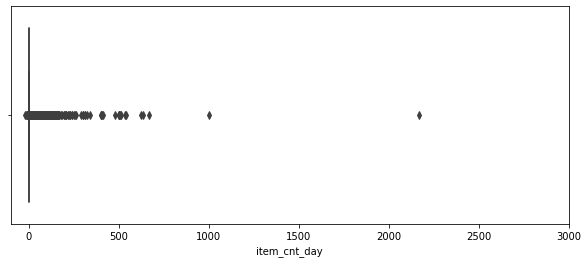

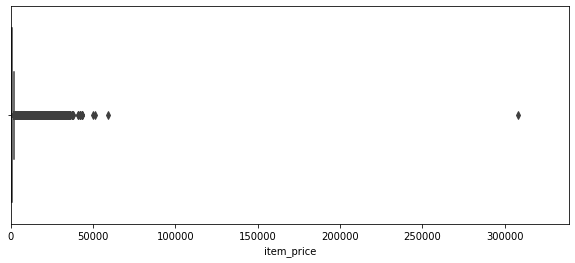

In [46]:
plt.figure(figsize=(10,4))
plt.xlim(-100, 3000)
sns.boxplot(x=sales.item_cnt_day)

plt.figure(figsize=(10,4))
plt.xlim(sales.item_price.min(), sales.item_price.max()*1.1)
sns.boxplot(x=sales.item_price)

# Removing Outliers from data

In [48]:
sales = sales[sales.item_price<100000]
sales = sales[sales.item_cnt_day<1001]

# Showing data after removing outliers

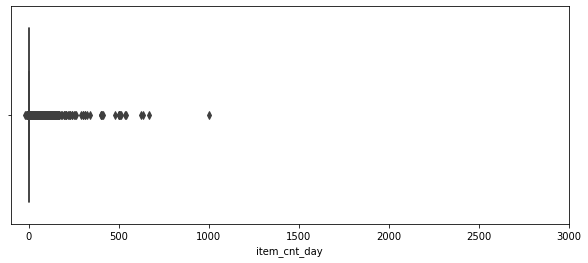

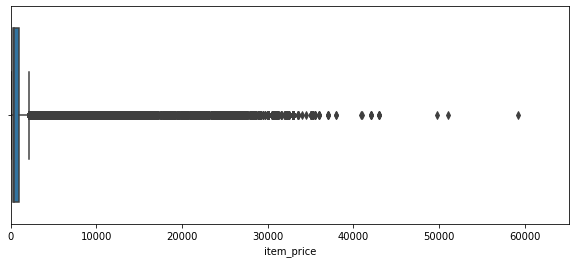

In [49]:
plt.figure(figsize=(10,4))
plt.xlim(-100, 3000)
sns.boxplot(x=sales.item_cnt_day)

plt.figure(figsize=(10,4))
plt.xlim(sales.item_price.min(), sales.item_price.max()*1.1)
sns.boxplot(x=sales.item_price)

# There is one item with price below zero. Fill it with median

In [50]:
median = sales[(sales.shop_id==32)&(sales.item_id==2973)&(sales.date_block_num==4)&(sales.item_price>0)].item_price.median()
sales.loc[sales.item_price<0, 'item_price'] = median

# Several shops are duplicates of each other (according to its name). Fix it

In [51]:
sales.loc[sales.shop_id == 0, 'shop_id'] = 57
sales.loc[sales.shop_id == 0, 'shop_id'] = 57

sales.loc[sales.shop_id == 1, 'shop_id'] = 58
sales.loc[sales.shop_id == 1, 'shop_id'] = 58

sales.loc[sales.shop_id == 10, 'shop_id'] = 11
sales.loc[sales.shop_id == 10, 'shop_id'] = 11

#  

<img src='images/img1-1.png'>

#  

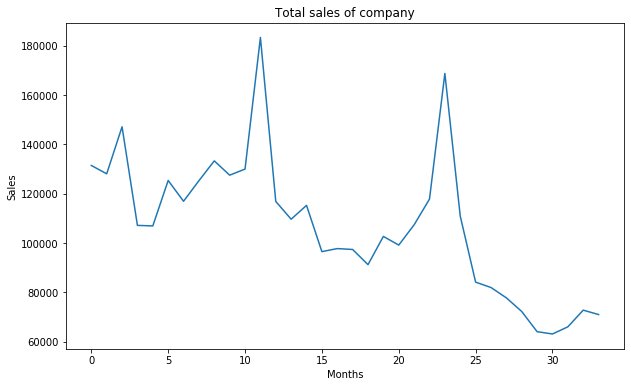

In [14]:
# plot all sales for all shops

# Group by total monthly sales ...34 months
sales.date=sales.date.apply(lambda x:datetime.datetime.strptime(x, '%d.%m.%Y'))
ts=sales.groupby(["date_block_num"])["item_cnt_day"].sum()
ts.astype('float')

plt.figure(figsize=(10,6))
plt.title('Total sales of company')
plt.xlabel('Months')
plt.ylabel('Sales')
indexedDataset = pd.DataFrame(ts)
plt.plot(indexedDataset)
plt.show()

<img src='images/img1-2.png'>

#  

<img src='images/img1-3.png'>

# TASK 1

In [10]:
Shop_ID = sales.shop_id

Shop_IDS_list = []
for ID in Shop_ID:
    if ID not in Shop_IDS_list:
        Shop_IDS_list.append(ID)

In [16]:
print(sorted(Shop_IDS_list))

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]


#  

<img src='images/img1-4.png'>

In [11]:
indexed_For_All_Shops = []
for shopID in Shop_IDS_list:

    sal = sales[sales.shop_id == shopID]
    ts_sales = sal.groupby(["date_block_num"])["item_cnt_day"].sum()
    ts_sales.astype('float')
    indexedDataset = pd.DataFrame(ts_sales)
    indexedDataset_clean = indexedDataset.dropna()                   # Removing Null Values
    indexed_For_All_Shops.append(indexedDataset_clean)

#  

<img src='images/img1-5.png'>

In [40]:
indexed_For_All_Shops[0]

,item_cnt_day
date_block_num,
0,2017.0
1,1897.0
2,2028.0
3,1388.0
4,1374.0
5,1707.0
6,1747.0
7,2048.0
8,2008.0


#  

<img src='images/img1-6.png'>

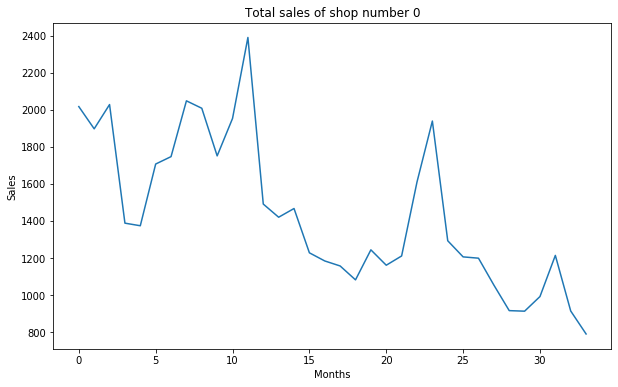

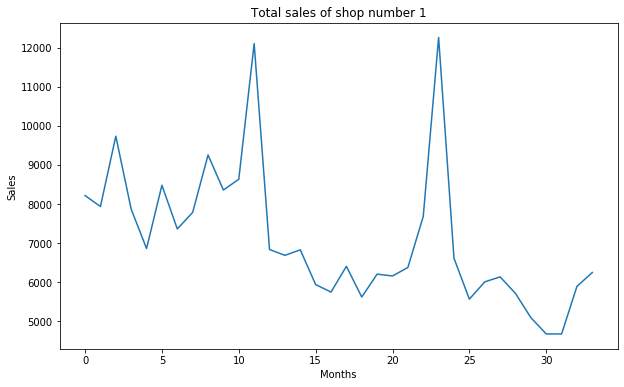

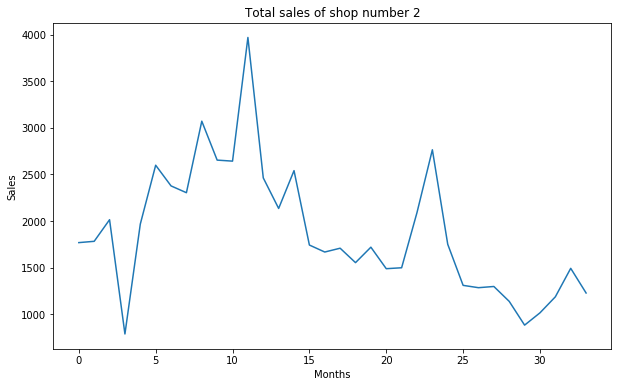

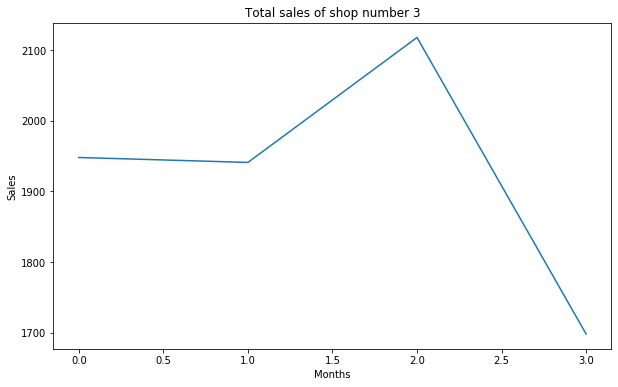

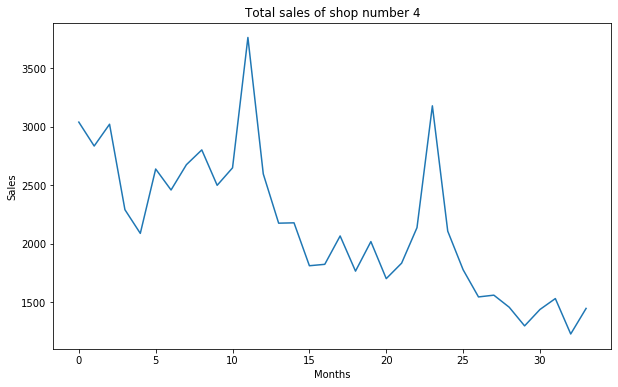

...

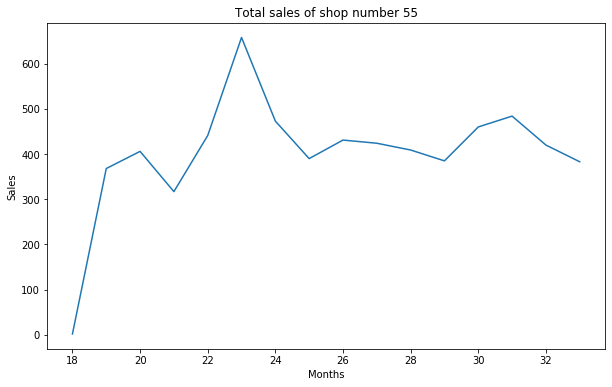

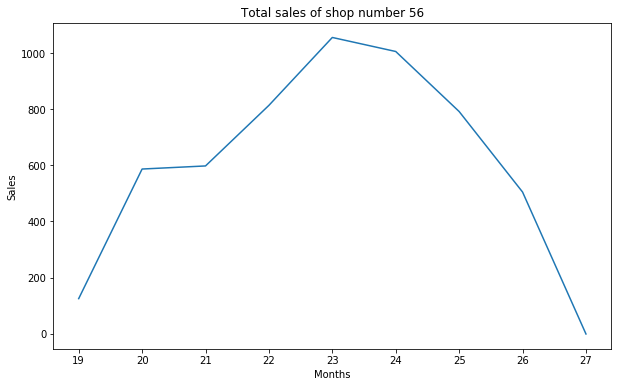

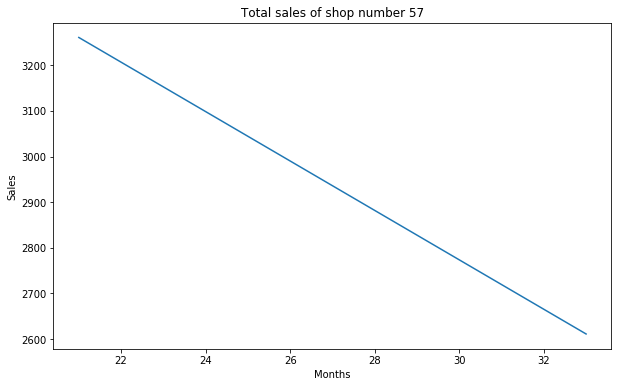

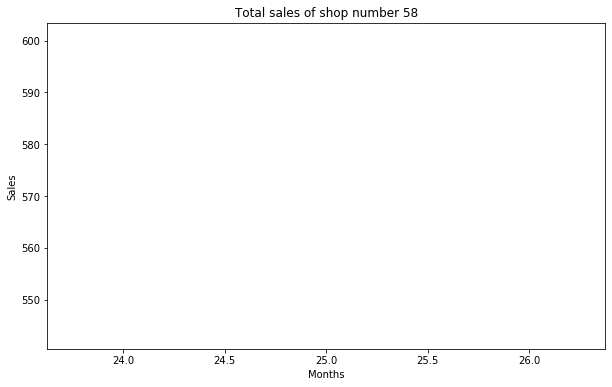

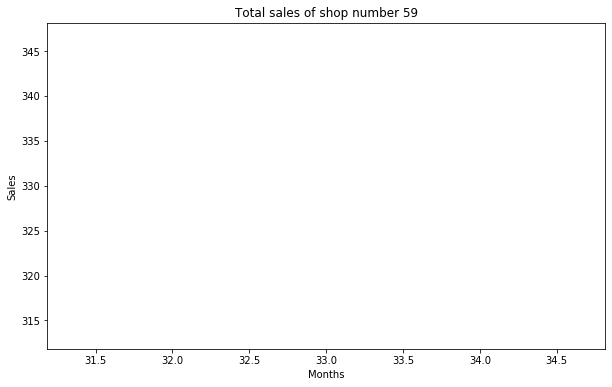

In [9]:
# Total Sales for All shops
i = 0
for idxData in indexed_For_All_Shops:

    plt.figure(figsize=(10,6))
    plt.title('Total sales of shop number ' + str(i))
    plt.xlabel('Months')
    plt.ylabel('Sales')

    idxData.head()
    plt.plot(idxData)
    plt.show()
    
    i += 1

#  

<img src='images/img1-7.png'>

In [12]:
DataAR = []
for ids in indexed_For_All_Shops:
    dataAR = list(ids.item_cnt_day.values)
    DataAR.append(dataAR)

In [11]:
i=0
for dataAr in DataAR:
    print('shop number ' + str(i) + ': ' + str(len(dataAr)))
    i+=1

shop number 0: 34
shop number 1: 34
shop number 2: 34
shop number 3: 4
shop number 4: 34
shop number 5: 34
shop number 6: 34
shop number 7: 34
shop number 8: 34
shop number 9: 32
shop number 10: 29
shop number 11: 34
shop number 12: 34
shop number 13: 34
shop number 14: 34
shop number 15: 34
shop number 16: 34
shop number 17: 2
shop number 18: 2
shop number 19: 34
shop number 20: 34
shop number 21: 4
shop number 22: 33
shop number 23: 34
shop number 24: 20
shop number 25: 34
shop number 26: 34
shop number 27: 34
shop number 28: 26
shop number 29: 7
shop number 30: 34
shop number 31: 34
shop number 32: 28
shop number 33: 34
shop number 34: 34
shop number 35: 34
shop number 36: 25
shop number 37: 34
shop number 38: 33
shop number 39: 34
shop number 40: 34
shop number 41: 34
shop number 42: 34
shop number 43: 34
shop number 44: 34
shop number 45: 33
shop number 46: 32
shop number 47: 32
shop number 48: 30
shop number 49: 20
shop number 50: 4
shop number 51: 23
shop number 52: 20
shop numb

#  

<img src='images/img1-8.png'>

In [13]:
# To avoid Error "maxlag should be < nobs", where nobs is: Number of Observations (Length of simulated time series) and maxlag default is round(12*(nobs/100.)**(1/4.))
DataAR_after_del_small_shops = []
for dataAr in DataAR:
    if len(dataAr) > 30:
        DataAR_after_del_small_shops.append(dataAr)

#  

<img src='images/img1-9.png'>

# AR Model

<img src='images/img1-10.png'>

#  

Coefficients: [ 2.17690893e+02  5.75299902e-01 -7.46751865e-02  3.62819693e-01
  9.28504267e-02 -2.89300470e-01  2.42771394e-02 -4.43884127e-01
  2.25880233e-01  3.06797777e-01]
Test RMSE: 230.231


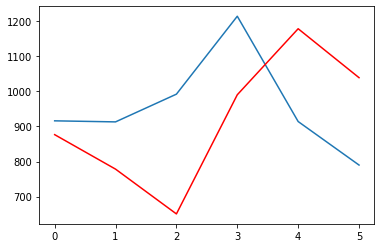

In [13]:
# lets try on the first shop
XTRY = DataAR_after_del_small_shops[0]
train, test = XTRY[:len(XTRY)-6], XTRY[len(XTRY)-6:]
model = AR(train)
model_fit = model.fit()
print('Coefficients: %s' % model_fit.params)
predictions = model_fit.predict(start=len(train), end=len(train)+len(test)-1, dynamic=False)
rmse = sqrt(mean_squared_error(test, predictions))
print('Test RMSE: %.3f' % rmse)
# plot results
plt.plot(test)
plt.plot(predictions, color='red')
plt.show()

#  

<img src='images/img1-11.png'>

D:\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1358: RuntimeWarning: invalid value encountered in sqrt
  return rho, np.sqrt(sigmasq)


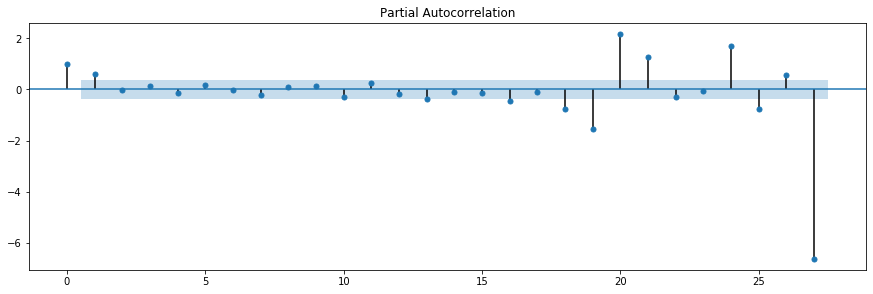

In [14]:
plt.figure(figsize=(15,10))
ax = plt.subplot(212)
sm.graphics.tsa.plot_pacf(train, lags=len(train)-1, ax=ax)
plt.show()

#  

<img src='images/img1-12.png'>

Coefficients: [ 1.99505506e+02  5.87155274e-01 -1.08825298e-01  2.89097223e-01]
Test RMSE: 187.383


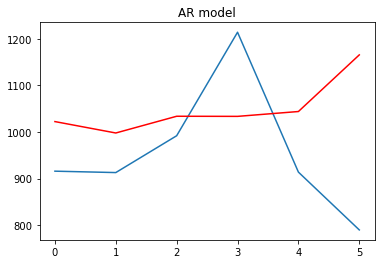

In [7]:
# Now with the lags
XTRY = DataAR_after_del_small_shops[0]
train, test = XTRY[0:len(XTRY)-6], XTRY[len(XTRY)-6:]
model = AutoReg(train,lags=[1, 2, 11])
model_fit = model.fit()
print('Coefficients: %s' % model_fit.params)
predictions = model_fit.predict(start=len(train), end=len(train)+len(test)-1, dynamic=False)
rmse = sqrt(mean_squared_error(test, predictions))
print('Test RMSE: %.3f' % rmse)
# plot results
plt.plot(test)
plt.plot(predictions, color='red')
plt.title('AR model')
plt.show()

<img src='images/img1-12-1.png'>

#  

# ARIMA model

<img src='images/img1-13.png'>

#  

In [ ]:
p_values = range(0, 3)
d_values = range(0, 1)
q_values = range(0, 3)

In [17]:
# evaluate an ARIMA model for a given order (p,d,q)
def evaluate_arima_model(X, arima_order):
    # prepare training dataset
    error = float("inf")
    try:
        train, test = X[:len(X)-8], X[len(X)-8:len(X)-6]
        model = ARIMA(train, order=arima_order)
        model_fit = model.fit(disp=0)
        predictions = model_fit.predict(start=len(train), end=len(train)+len(test)-1, dynamic=False)
        error = sqrt(mean_squared_error(test, predictions))
    except:
        pass
    return error

In [18]:
# evaluate combinations of p, d and q values for an ARIMA model
def evaluate_models(dataset, p_values, d_values, q_values):
    dataset = np.array(dataset).astype('float32')
    best_score, best_cfg = float("inf"), None
    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q)
                rmse = evaluate_arima_model(dataset, order)
                if rmse < best_score:
                    best_score, best_cfg = rmse, order
                print('ARIMA%s RMSE=%.3f' % (order,rmse))
    print('Best ARIMA%s RMSE=%.3f' % (best_cfg, best_score))
    return best_cfg, best_score

# Train Best ARIMA Models for all Shops

<img src='images/img1-14.png'>

ARIMA(0, 0, 0) RMSE=456.259
ARIMA(0, 0, 1) RMSE=445.563
ARIMA(0, 0, 2) RMSE=428.083
ARIMA(1, 0, 0) RMSE=295.034
ARIMA(1, 0, 1) RMSE=366.491


D:\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:221: RuntimeWarning: divide by zero encountered in true_divide
  Z_mat, R_mat, T_mat)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: overflow encountered in exp
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: invalid value encountered in true_divide
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
 

ARIMA(1, 0, 2) RMSE=326.777
ARIMA(2, 0, 0) RMSE=304.632
ARIMA(2, 0, 1) RMSE=344.339
ARIMA(2, 0, 2) RMSE=334.817
Best ARIMA(1, 0, 0) RMSE=295.034


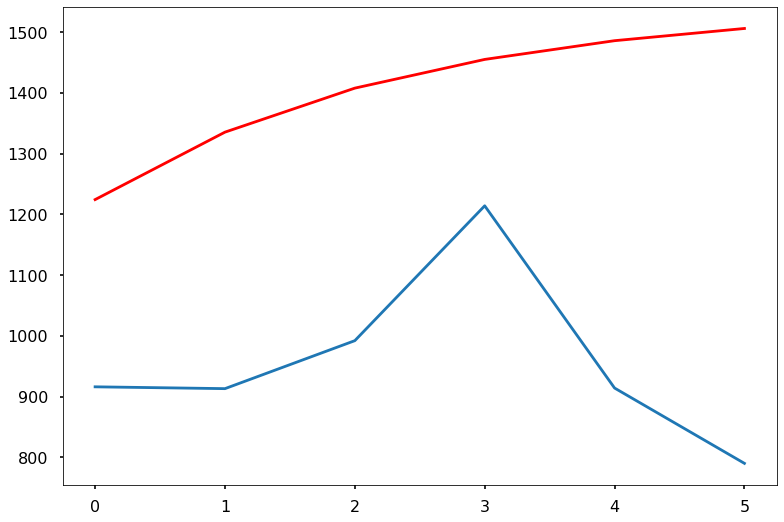

ARIMA(0, 0, 0) RMSE=1525.804
ARIMA(0, 0, 1) RMSE=1326.584
ARIMA(0, 0, 2) RMSE=1462.645
ARIMA(1, 0, 0) RMSE=1206.208
ARIMA(1, 0, 1) RMSE=1528.991
ARIMA(1, 0, 2) RMSE=inf
ARIMA(2, 0, 0) RMSE=1278.719
ARIMA(2, 0, 1) RMSE=1508.790
ARIMA(2, 0, 2) RMSE=inf
Best ARIMA(1, 0, 0) RMSE=1206.208


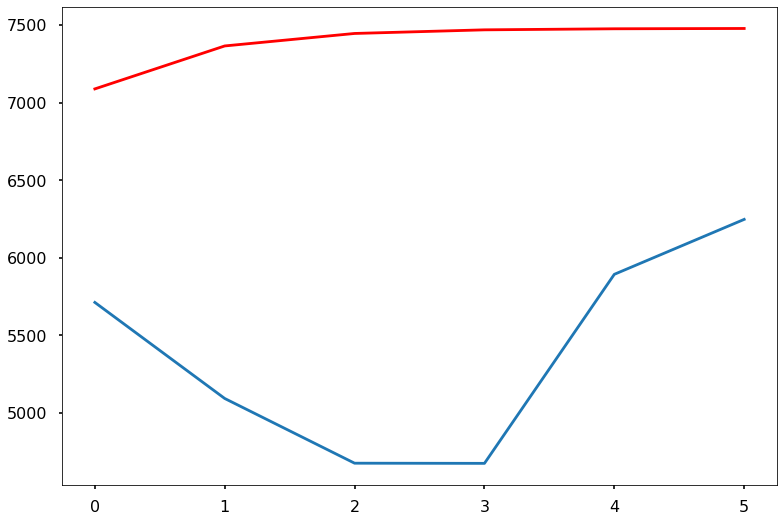

ARIMA(0, 0, 0) RMSE=800.565
ARIMA(0, 0, 1) RMSE=688.915
ARIMA(0, 0, 2) RMSE=747.977
ARIMA(1, 0, 0) RMSE=532.879
ARIMA(1, 0, 1) RMSE=512.818
ARIMA(1, 0, 2) RMSE=inf
ARIMA(2, 0, 0) RMSE=518.704


D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:695: RuntimeWarning: divide by zero encountered in log
  invmacoefs = -np.log((1-macoefs)/(1+macoefs))
D:\Anaconda3\lib\site-packages\statsmodels\tools\numdiff.py:243: RuntimeWarning: invalid value encountered in subtract
  **kwargs)).imag/2./hess[i, j]
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: invalid value encountered in true_divide
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:225: RuntimeWarning: invalid value encountered in log
  Z_mat.astype(complex), R_mat, T_mat)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:225: RuntimeWarning: invalid value encountered in true_divide
  Z_mat.astype(complex), R_m

ARIMA(2, 0, 1) RMSE=792.207
ARIMA(2, 0, 2) RMSE=inf
Best ARIMA(1, 0, 1) RMSE=512.818


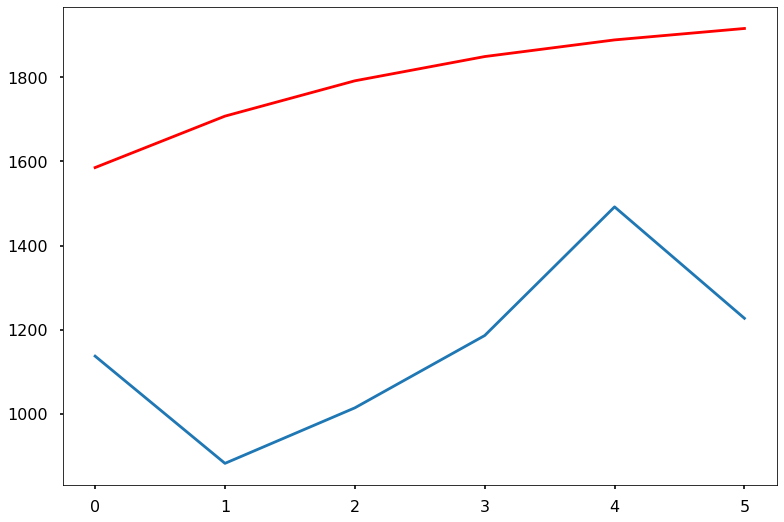

ARIMA(0, 0, 0) RMSE=827.611
ARIMA(0, 0, 1) RMSE=767.236
ARIMA(0, 0, 2) RMSE=736.605
ARIMA(1, 0, 0) RMSE=623.421
ARIMA(1, 0, 1) RMSE=659.120
ARIMA(1, 0, 2) RMSE=inf
ARIMA(2, 0, 0) RMSE=629.849
ARIMA(2, 0, 1) RMSE=inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: overflow encountered in exp
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: invalid value encountered in true_divide
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:695: RuntimeWarning: divide by zero encountered in true_divide
  invmacoefs = -np.log((1-macoefs)/(1+macoefs))
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_param

ARIMA(2, 0, 2) RMSE=495.637
Best ARIMA(2, 0, 2) RMSE=495.637


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


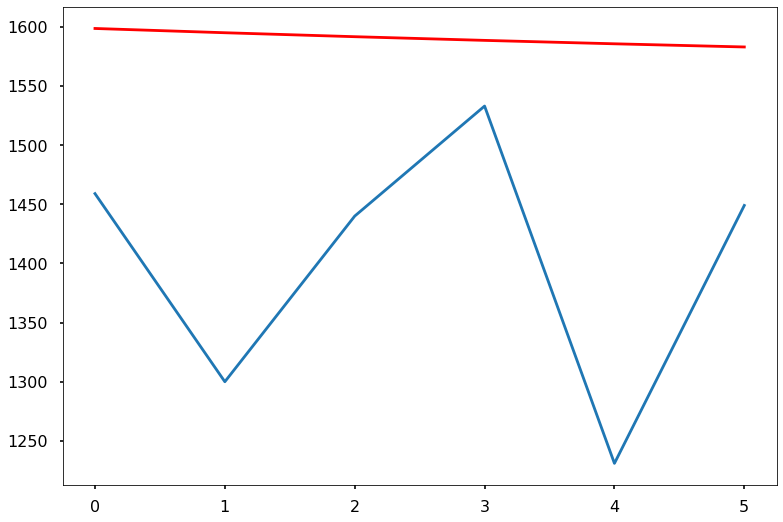

ARIMA(0, 0, 0) RMSE=313.658
ARIMA(0, 0, 1) RMSE=250.393
ARIMA(0, 0, 2) RMSE=193.438
ARIMA(1, 0, 0) RMSE=82.182
ARIMA(1, 0, 1) RMSE=35.613
ARIMA(1, 0, 2) RMSE=inf
ARIMA(2, 0, 0) RMSE=23.377


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:695: RuntimeWarning: invalid value encountered in log
  invmacoefs = -np.log((1-macoefs)/(1+macoefs))


ARIMA(2, 0, 1) RMSE=210.186
ARIMA(2, 0, 2) RMSE=inf
Best ARIMA(2, 0, 0) RMSE=23.377


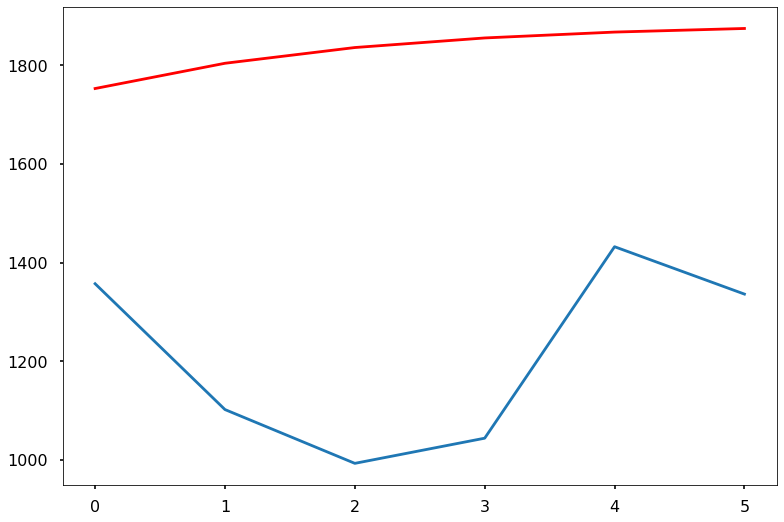

ARIMA(0, 0, 0) RMSE=645.625
ARIMA(0, 0, 1) RMSE=578.776
ARIMA(0, 0, 2) RMSE=540.164
ARIMA(1, 0, 0) RMSE=251.396


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(1, 0, 1) RMSE=15182.541
ARIMA(1, 0, 2) RMSE=inf
ARIMA(2, 0, 0) RMSE=135.443


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


ARIMA(2, 0, 1) RMSE=140.132


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


ARIMA(2, 0, 2) RMSE=245.003
Best ARIMA(2, 0, 0) RMSE=135.443


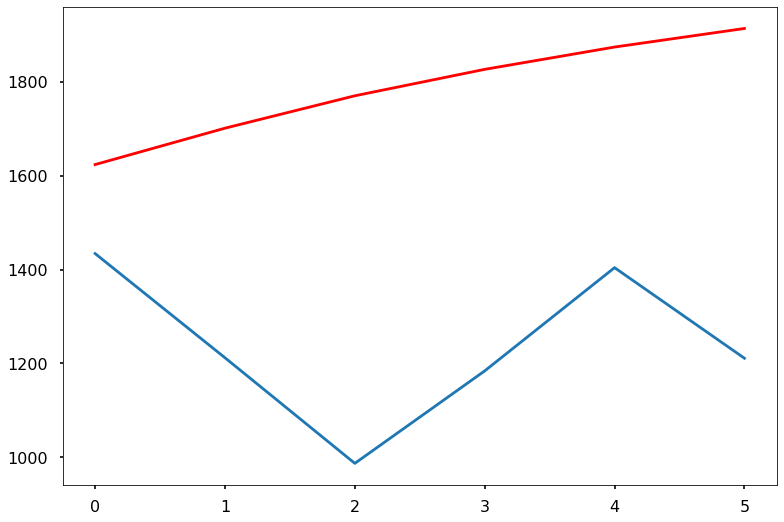

ARIMA(0, 0, 0) RMSE=278.664
ARIMA(0, 0, 1) RMSE=264.498
ARIMA(0, 0, 2) RMSE=314.078
ARIMA(1, 0, 0) RMSE=266.879
ARIMA(1, 0, 1) RMSE=inf
ARIMA(1, 0, 2) RMSE=inf
ARIMA(2, 0, 0) RMSE=286.223
ARIMA(2, 0, 1) RMSE=376.717
ARIMA(2, 0, 2) RMSE=inf
Best ARIMA(0, 0, 1) RMSE=264.498


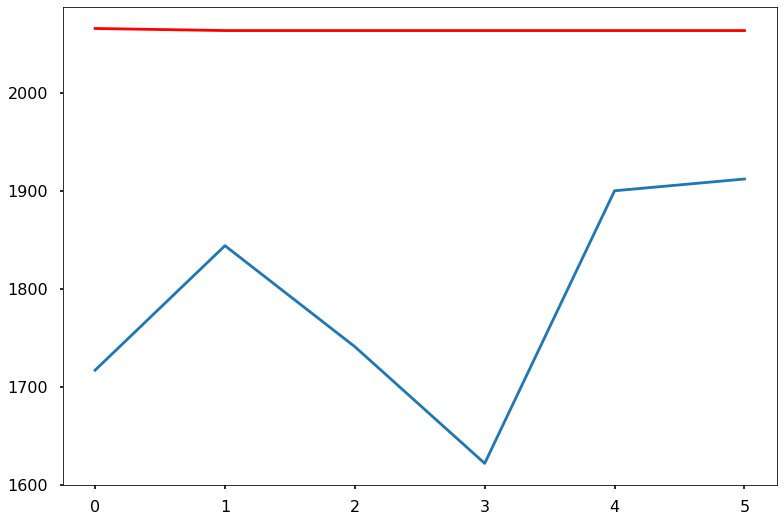

ARIMA(0, 0, 0) RMSE=2087.096
ARIMA(0, 0, 1) RMSE=1829.462
ARIMA(0, 0, 2) RMSE=1834.068
ARIMA(1, 0, 0) RMSE=1784.946
ARIMA(1, 0, 1) RMSE=2093.448


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:221: RuntimeWarning: divide by zero encountered in true_divide
  Z_mat, R_mat, T_mat)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: overflow encountered in exp
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: invalid value encountered in true_divide
  tmp = ((1-np.exp

ARIMA(1, 0, 2) RMSE=1092.152
ARIMA(2, 0, 0) RMSE=1790.630


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


ARIMA(2, 0, 1) RMSE=1925.268


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


ARIMA(2, 0, 2) RMSE=1578.747
Best ARIMA(1, 0, 2) RMSE=1092.152


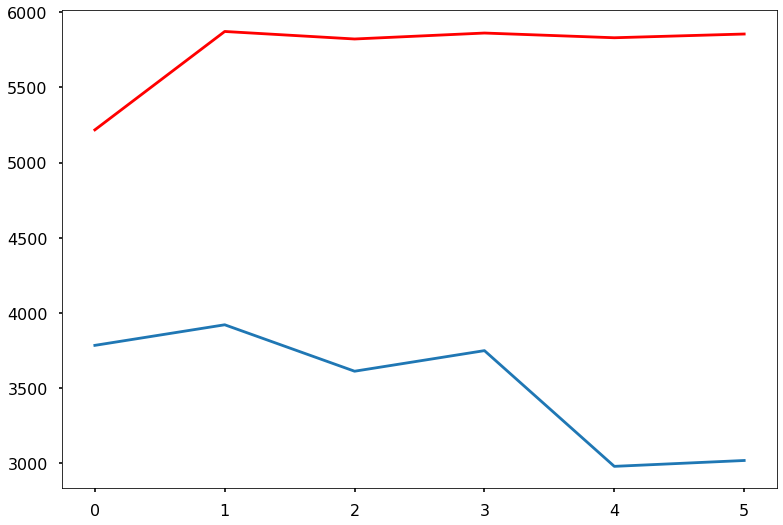

ARIMA(0, 0, 0) RMSE=922.787
ARIMA(0, 0, 1) RMSE=576.115
ARIMA(0, 0, 2) RMSE=593.744
ARIMA(1, 0, 0) RMSE=771.839


D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:695: RuntimeWarning: divide by zero encountered in log
  invmacoefs = -np.log((1-macoefs)/(1+macoefs))
D:\Anaconda3\lib\site-packages\statsmodels\tools\numdiff.py:243: RuntimeWarning: invalid value encountered in subtract
  **kwargs)).imag/2./hess[i, j]
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: invalid value encountered in true_divide
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:225: RuntimeWarning: invalid value encountered in log
  Z_mat.astype(complex), R_mat, T_mat)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:225: RuntimeWarning: invalid value encountered in true_divide
  Z_mat.astype(complex), R_m

ARIMA(1, 0, 1) RMSE=161.460
ARIMA(1, 0, 2) RMSE=inf
ARIMA(2, 0, 0) RMSE=445.854
ARIMA(2, 0, 1) RMSE=inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:693: RuntimeWarning: invalid value encountered in double_scalars
  tmp[kiter] = (macoefs[kiter]-b *macoefs[j-kiter-1])/(1-b**2)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:695: RuntimeWarning: divide by zero encountered in log
  invmacoefs = -np.log((1-macoefs)/(1+macoefs))
D:\Anaconda3\lib\site-packages\statsmodels\tools\numdiff.py:243: RuntimeWarning: invalid value encountered in subtract
  **kwargs)).imag/2./hess[i, j]
D:\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:225: RuntimeWarning: invalid value encountered in log
  Z_mat.astype(complex), R_mat, T_mat)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:225: RuntimeWarning: invalid value encountered in true_divide
  Z_mat.astype(complex), R_mat, T_mat)
D:\Anaconda3\lib\site-packages\statsmodels\tools\numdiff.py:243: RuntimeWarning: invalid value encountered in multiply
  **kwargs)).imag/2./hess[i, j]
D:\Anaconda3\

ARIMA(2, 0, 2) RMSE=inf
Best ARIMA(1, 0, 1) RMSE=161.460


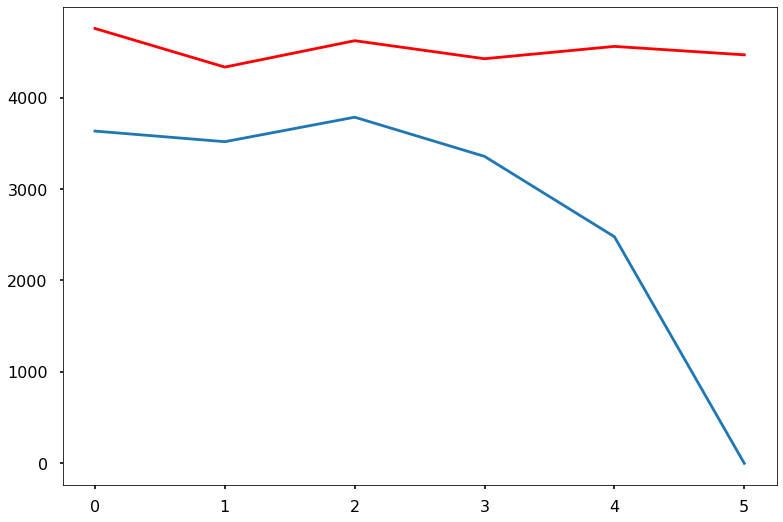

ARIMA(0, 0, 0) RMSE=701.799
ARIMA(0, 0, 1) RMSE=594.497
ARIMA(0, 0, 2) RMSE=654.833
ARIMA(1, 0, 0) RMSE=471.226
ARIMA(1, 0, 1) RMSE=442.877
ARIMA(1, 0, 2) RMSE=inf
ARIMA(2, 0, 0) RMSE=403.005


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(2, 0, 1) RMSE=464.338
ARIMA(2, 0, 2) RMSE=inf
Best ARIMA(2, 0, 0) RMSE=403.005


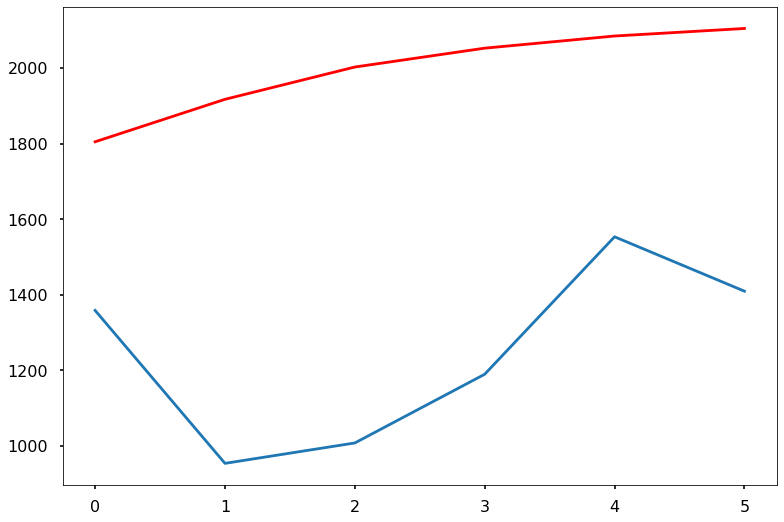

ARIMA(0, 0, 0) RMSE=487.219
ARIMA(0, 0, 1) RMSE=458.274
ARIMA(0, 0, 2) RMSE=483.259
ARIMA(1, 0, 0) RMSE=453.002
ARIMA(1, 0, 1) RMSE=inf
ARIMA(1, 0, 2) RMSE=inf
ARIMA(2, 0, 0) RMSE=508.079
ARIMA(2, 0, 1) RMSE=579.614
ARIMA(2, 0, 2) RMSE=inf
Best ARIMA(1, 0, 0) RMSE=453.002


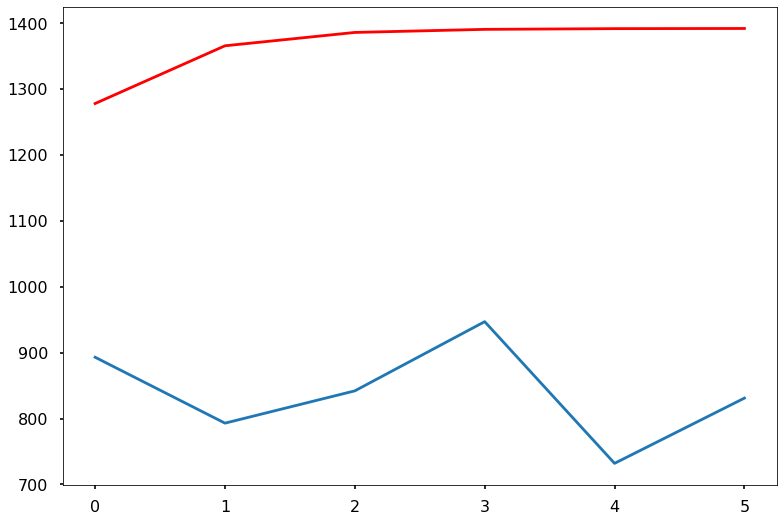

ARIMA(0, 0, 0) RMSE=1342.719
ARIMA(0, 0, 1) RMSE=1246.639
ARIMA(0, 0, 2) RMSE=1249.010
ARIMA(1, 0, 0) RMSE=1074.451
ARIMA(1, 0, 1) RMSE=10909.332
ARIMA(1, 0, 2) RMSE=inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


ARIMA(2, 0, 0) RMSE=1019.220


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(2, 0, 1) RMSE=341.591
ARIMA(2, 0, 2) RMSE=inf
Best ARIMA(2, 0, 1) RMSE=341.591


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


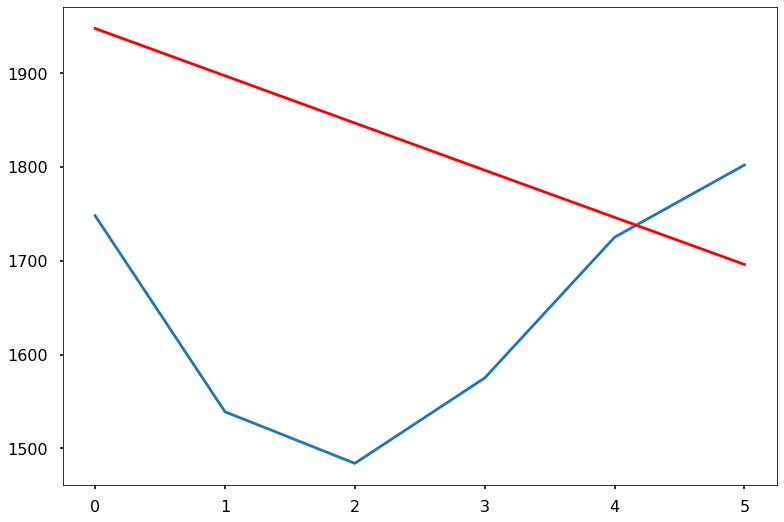

ARIMA(0, 0, 0) RMSE=125.270
ARIMA(0, 0, 1) RMSE=134.007
ARIMA(0, 0, 2) RMSE=123.158
ARIMA(1, 0, 0) RMSE=123.568
ARIMA(1, 0, 1) RMSE=134.858
ARIMA(1, 0, 2) RMSE=inf
ARIMA(2, 0, 0) RMSE=124.730


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(2, 0, 1) RMSE=119.670


D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: overflow encountered in exp
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: invalid value encountered in true_divide
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization fail

ARIMA(2, 0, 2) RMSE=367.992
Best ARIMA(2, 0, 1) RMSE=119.670


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


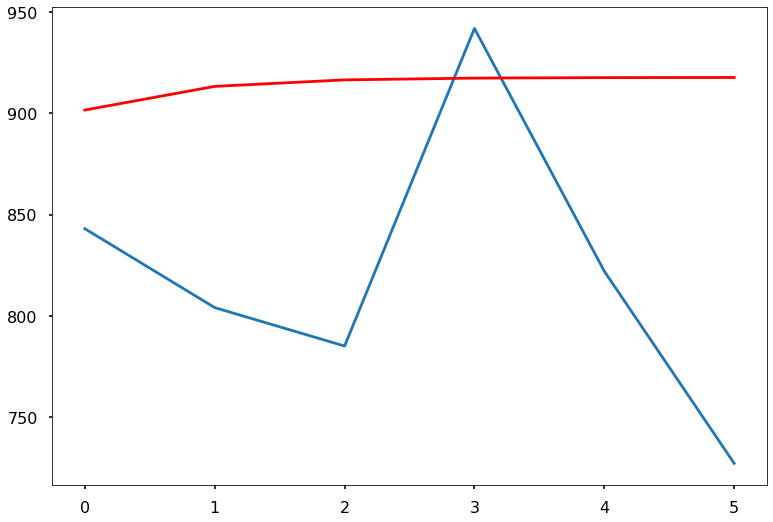

ARIMA(0, 0, 0) RMSE=140.732
ARIMA(0, 0, 1) RMSE=113.849
ARIMA(0, 0, 2) RMSE=121.420
ARIMA(1, 0, 0) RMSE=117.443
ARIMA(1, 0, 1) RMSE=128.598
ARIMA(1, 0, 2) RMSE=inf
ARIMA(2, 0, 0) RMSE=118.465
ARIMA(2, 0, 1) RMSE=138.445
ARIMA(2, 0, 2) RMSE=inf
Best ARIMA(0, 0, 1) RMSE=113.849


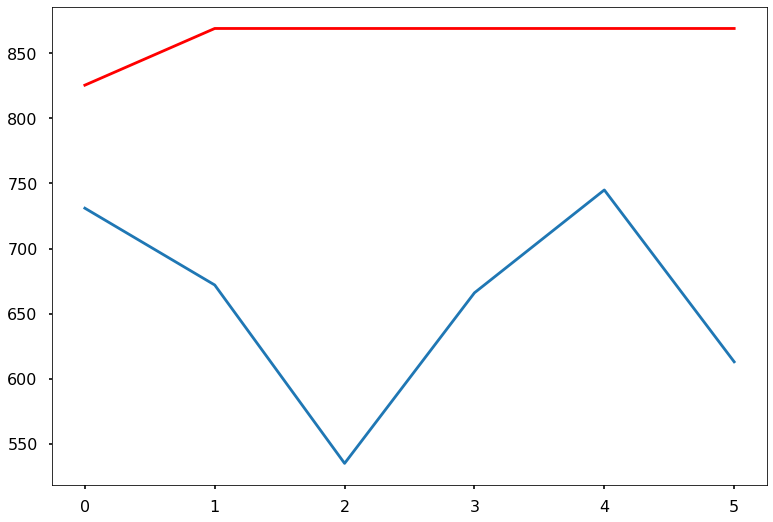

ARIMA(0, 0, 0) RMSE=793.239
ARIMA(0, 0, 1) RMSE=769.511
ARIMA(0, 0, 2) RMSE=771.936
ARIMA(1, 0, 0) RMSE=726.620
ARIMA(1, 0, 1) RMSE=772.765
ARIMA(1, 0, 2) RMSE=827.951


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


ARIMA(2, 0, 0) RMSE=740.897
ARIMA(2, 0, 1) RMSE=770.701
ARIMA(2, 0, 2) RMSE=680.612
Best ARIMA(2, 0, 2) RMSE=680.612
ARIMA(0, 0, 0) RMSE=880.650
ARIMA(0, 0, 1) RMSE=818.891

D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:693: RuntimeWarning: invalid value encountered in double_scalars
  tmp[kiter] = (macoefs[kiter]-b *macoefs[j-kiter-1])/(1-b**2)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:695: RuntimeWarning: divide by zero encountered in log
  invmacoefs = -np.log((1-macoefs)/(1+macoefs))



ARIMA(0, 0, 2) RMSE=756.524
ARIMA(1, 0, 0) RMSE=516.078
ARIMA(1, 0, 1) RMSE=515.473


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(1, 0, 2) RMSE=460.463
ARIMA(2, 0, 0) RMSE=515.965
ARIMA(2, 0, 1) RMSE=566.831


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:221: RuntimeWarning: divide by zero encountered in true_divide
  Z_mat, R_mat, T_mat)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: overflow encountered in exp
 

ARIMA(2, 0, 2) RMSE=605.249
Best ARIMA(1, 0, 2) RMSE=460.463


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


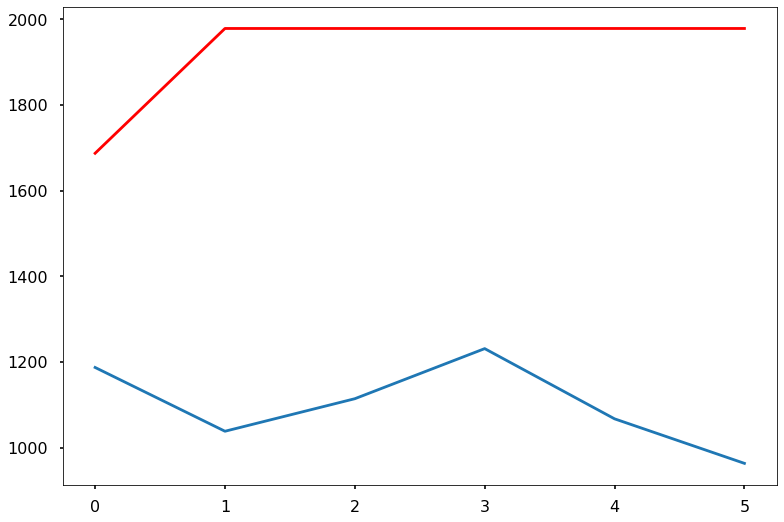

ARIMA(0, 0, 0) RMSE=959.052
ARIMA(0, 0, 1) RMSE=838.950
ARIMA(0, 0, 2) RMSE=810.619
ARIMA(1, 0, 0) RMSE=675.973
ARIMA(1, 0, 1) RMSE=665.510
ARIMA(1, 0, 2) RMSE=663.712
ARIMA(2, 0, 0) RMSE=666.689
ARIMA(2, 0, 1) RMSE=706.863
ARIMA(2, 0, 2) RMSE=649.684
Best ARIMA(2, 0, 2) RMSE=649.684


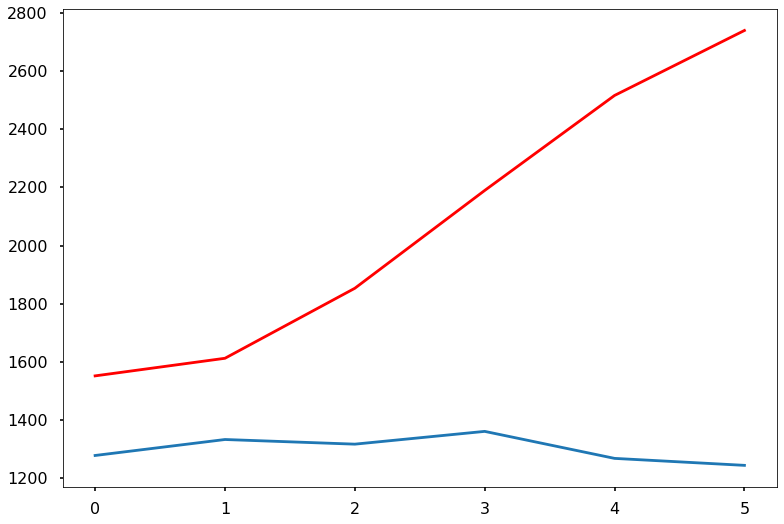

ARIMA(0, 0, 0) RMSE=245.688
ARIMA(0, 0, 1) RMSE=183.826
ARIMA(0, 0, 2) RMSE=321.336
ARIMA(1, 0, 0) RMSE=188.631
ARIMA(1, 0, 1) RMSE=205.095
ARIMA(1, 0, 2) RMSE=inf
ARIMA(2, 0, 0) RMSE=213.089
ARIMA(2, 0, 1) RMSE=215.274
ARIMA(2, 0, 2) RMSE=inf
Best ARIMA(0, 0, 1) RMSE=183.826


D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:695: RuntimeWarning: invalid value encountered in log
  invmacoefs = -np.log((1-macoefs)/(1+macoefs))


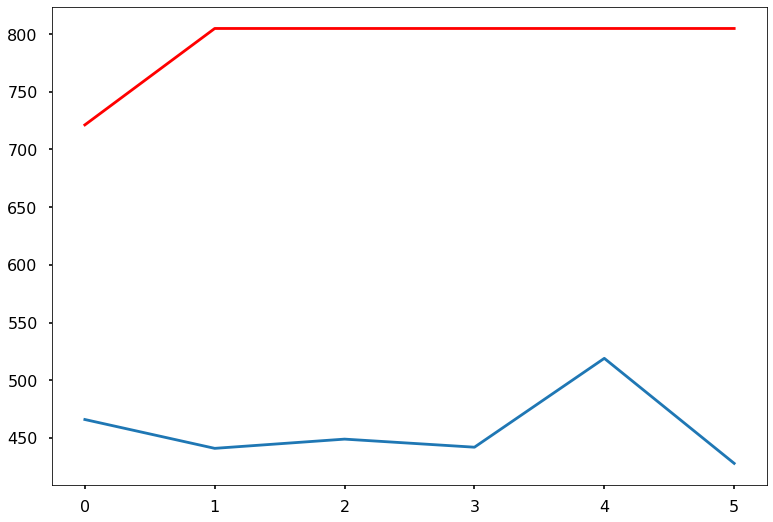

ARIMA(0, 0, 0) RMSE=443.638
ARIMA(0, 0, 1) RMSE=403.671
ARIMA(0, 0, 2) RMSE=390.511
ARIMA(1, 0, 0) RMSE=386.032


D:\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:221: RuntimeWarning: divide by zero encountered in true_divide
  Z_mat, R_mat, T_mat)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: overflow encountered in exp
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: invalid value encountered in true_divide
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()


ARIMA(1, 0, 1) RMSE=388.370
ARIMA(1, 0, 2) RMSE=411.787
ARIMA(2, 0, 0) RMSE=389.021


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:695: RuntimeWarning: divide by zero encountered in true_divide
  invmacoefs = -np.log((1-macoefs)/(1+macoefs))
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: invalid value encountered in true_divide
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()


ARIMA(2, 0, 1) RMSE=13615.474
ARIMA(2, 0, 2) RMSE=inf
Best ARIMA(1, 0, 0) RMSE=386.032


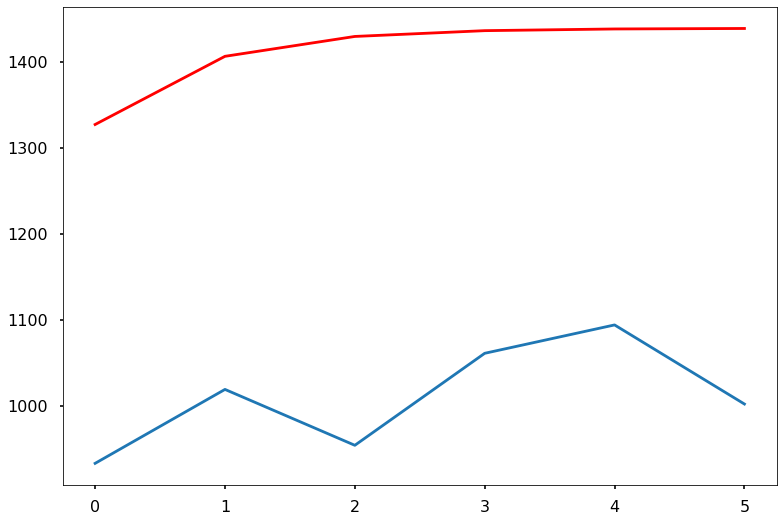

ARIMA(0, 0, 0) RMSE=930.500
ARIMA(0, 0, 1) RMSE=942.190
ARIMA(0, 0, 2) RMSE=960.495
ARIMA(1, 0, 0) RMSE=967.944
ARIMA(1, 0, 1) RMSE=942.566
ARIMA(1, 0, 2) RMSE=995.484
ARIMA(2, 0, 0) RMSE=946.780
ARIMA(2, 0, 1) RMSE=956.106
ARIMA(2, 0, 2) RMSE=inf
Best ARIMA(0, 0, 0) RMSE=930.500


D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:693: RuntimeWarning: invalid value encountered in double_scalars
  tmp[kiter] = (macoefs[kiter]-b *macoefs[j-kiter-1])/(1-b**2)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:695: RuntimeWarning: divide by zero encountered in log
  invmacoefs = -np.log((1-macoefs)/(1+macoefs))


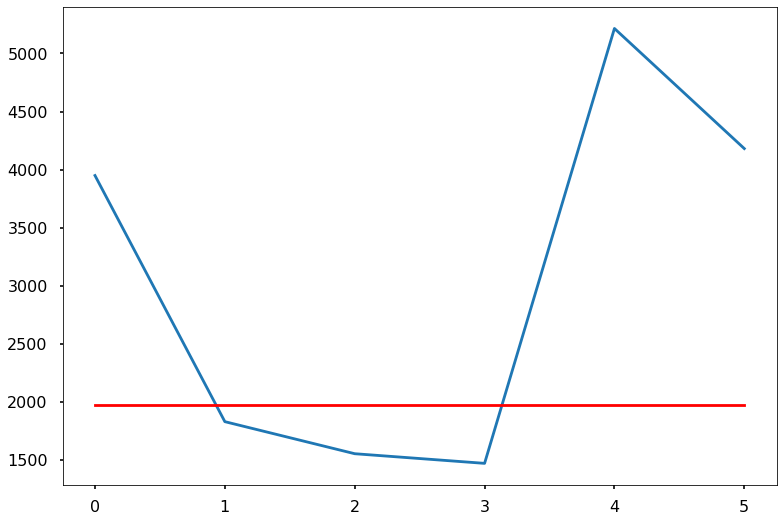

ARIMA(0, 0, 0) RMSE=643.225
ARIMA(0, 0, 1) RMSE=563.750
ARIMA(0, 0, 2) RMSE=602.156
ARIMA(1, 0, 0) RMSE=528.000
ARIMA(1, 0, 1) RMSE=653.194
ARIMA(1, 0, 2) RMSE=inf
ARIMA(2, 0, 0) RMSE=536.198


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


ARIMA(2, 0, 1) RMSE=607.345
ARIMA(2, 0, 2) RMSE=inf
Best ARIMA(1, 0, 0) RMSE=528.000


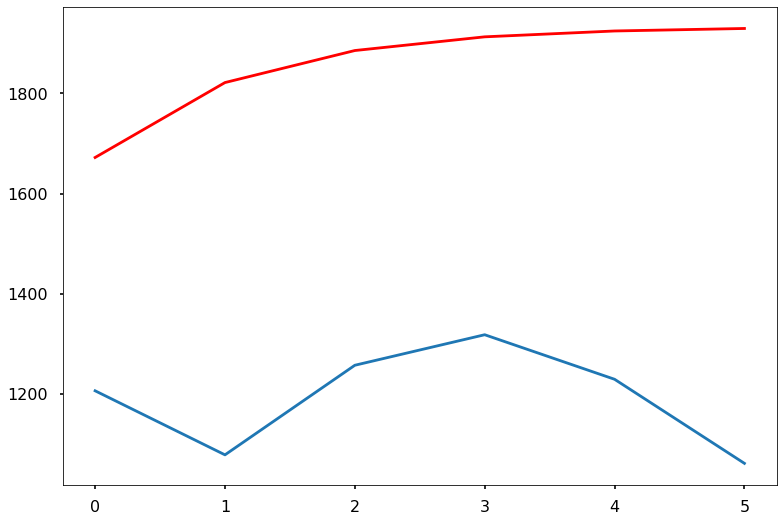

ARIMA(0, 0, 0) RMSE=2657.104
ARIMA(0, 0, 1) RMSE=2375.336
ARIMA(0, 0, 2) RMSE=2409.164
ARIMA(1, 0, 0) RMSE=2046.488
ARIMA(1, 0, 1) RMSE=2440.432
ARIMA(1, 0, 2) RMSE=inf
ARIMA(2, 0, 0) RMSE=2150.922
ARIMA(2, 0, 1) RMSE=inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:695: RuntimeWarning: divide by zero encountered in true_divide
  invmacoefs = -np.log((1-macoefs)/(1+macoefs))
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: invalid value encountered in true_divide
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: overflow encountered in exp
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_param

ARIMA(2, 0, 2) RMSE=2376.945
Best ARIMA(1, 0, 0) RMSE=2046.488


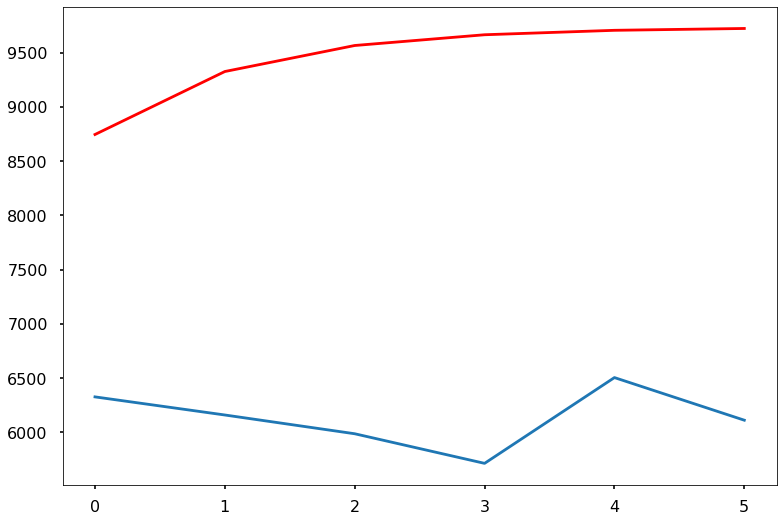

ARIMA(0, 0, 0) RMSE=592.603
ARIMA(0, 0, 1) RMSE=548.082
ARIMA(0, 0, 2) RMSE=659.157
ARIMA(1, 0, 0) RMSE=573.177
ARIMA(1, 0, 1) RMSE=inf
ARIMA(1, 0, 2) RMSE=inf
ARIMA(2, 0, 0) RMSE=708.736
ARIMA(2, 0, 1) RMSE=776.470
ARIMA(2, 0, 2) RMSE=inf
Best ARIMA(0, 0, 1) RMSE=548.082


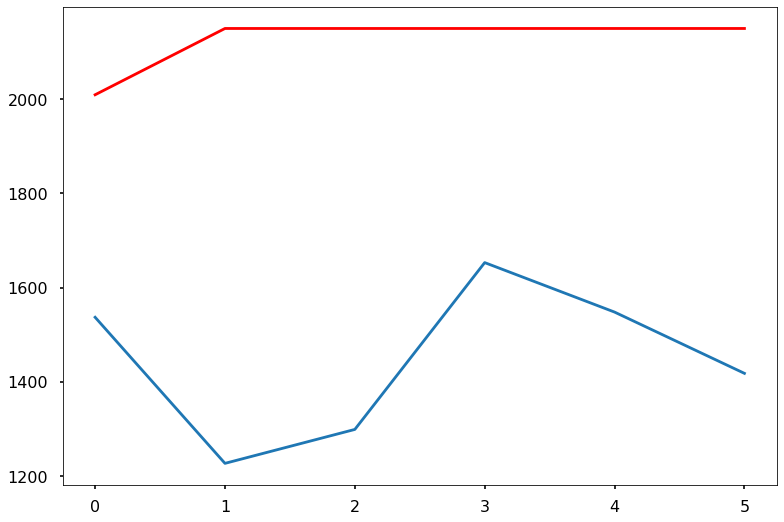

ARIMA(0, 0, 0) RMSE=1264.946
ARIMA(0, 0, 1) RMSE=1099.836
ARIMA(0, 0, 2) RMSE=1127.952
ARIMA(1, 0, 0) RMSE=1029.138
ARIMA(1, 0, 1) RMSE=1218.044
ARIMA(1, 0, 2) RMSE=1272.899
ARIMA(2, 0, 0) RMSE=1103.109
ARIMA(2, 0, 1) RMSE=1114.374


D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:695: RuntimeWarning: divide by zero encountered in log
  invmacoefs = -np.log((1-macoefs)/(1+macoefs))
D:\Anaconda3\lib\site-packages\statsmodels\tools\numdiff.py:243: RuntimeWarning: invalid value encountered in subtract
  **kwargs)).imag/2./hess[i, j]
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: invalid value encountered in true_divide
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:225: RuntimeWarning: invalid value encountered in log
  Z_mat.astype(complex), R_mat, T_mat)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:225: RuntimeWarning: invalid value encountered in true_divide
  Z_mat.astype(complex), R_m

ARIMA(2, 0, 2) RMSE=914.644
Best ARIMA(2, 0, 2) RMSE=914.644


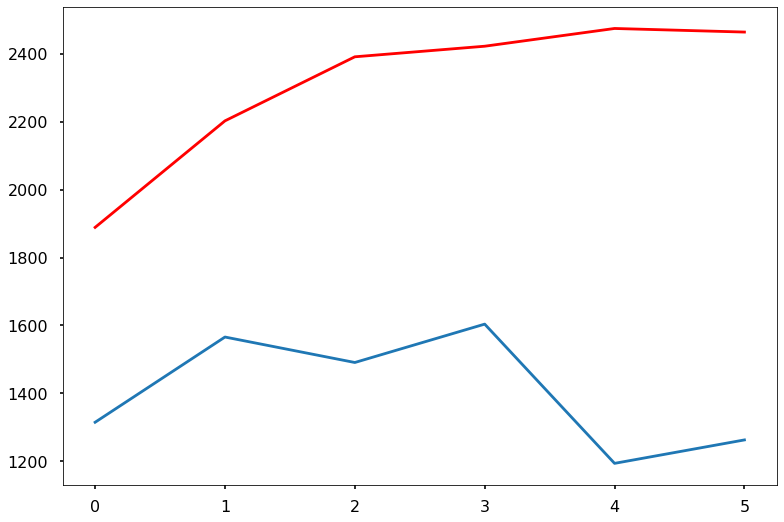

ARIMA(0, 0, 0) RMSE=159.849
ARIMA(0, 0, 1) RMSE=191.256
ARIMA(0, 0, 2) RMSE=345.032
ARIMA(1, 0, 0) RMSE=173.042
ARIMA(1, 0, 1) RMSE=261.437
ARIMA(1, 0, 2) RMSE=236.375


D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:695: RuntimeWarning: divide by zero encountered in log
  invmacoefs = -np.log((1-macoefs)/(1+macoefs))
D:\Anaconda3\lib\site-packages\statsmodels\tools\numdiff.py:243: RuntimeWarning: invalid value encountered in subtract
  **kwargs)).imag/2./hess[i, j]
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: invalid value encountered in true_divide
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:225: RuntimeWarning: invalid value encountered in log
  Z_mat.astype(complex), R_mat, T_mat)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:225: RuntimeWarning: invalid value encountered in true_divide
  Z_mat.astype(complex), R_m

ARIMA(2, 0, 0) RMSE=164.150
ARIMA(2, 0, 1) RMSE=231.540


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


ARIMA(2, 0, 2) RMSE=2507.120
Best ARIMA(0, 0, 0) RMSE=159.849


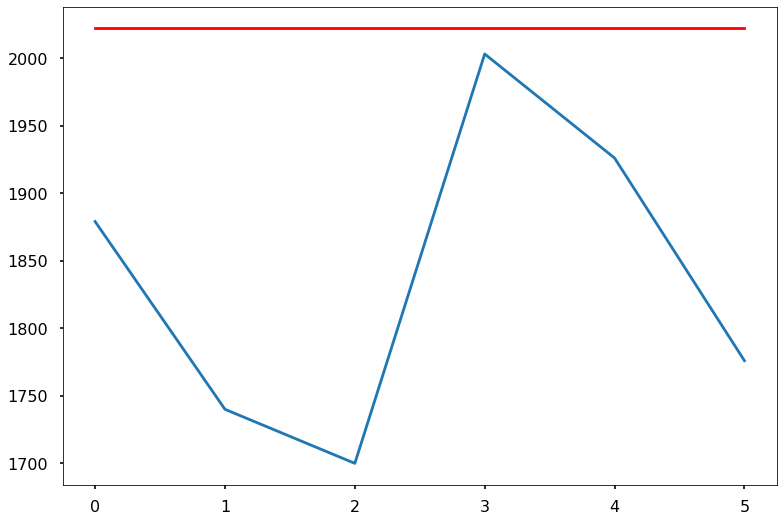

ARIMA(0, 0, 0) RMSE=1690.509
ARIMA(0, 0, 1) RMSE=1460.356
ARIMA(0, 0, 2) RMSE=1324.642
ARIMA(1, 0, 0) RMSE=506.628
ARIMA(1, 0, 1) RMSE=475.511
ARIMA(1, 0, 2) RMSE=inf
ARIMA(2, 0, 0) RMSE=429.058
ARIMA(2, 0, 1) RMSE=467.063
ARIMA(2, 0, 2) RMSE=1021.235
Best ARIMA(2, 0, 0) RMSE=429.058


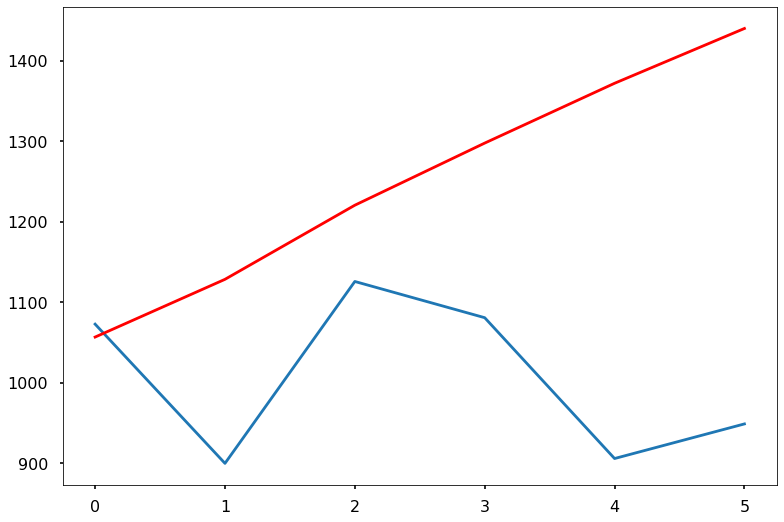

ARIMA(0, 0, 0) RMSE=269.859
ARIMA(0, 0, 1) RMSE=264.901
ARIMA(0, 0, 2) RMSE=373.839
ARIMA(1, 0, 0) RMSE=264.030


D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:695: RuntimeWarning: divide by zero encountered in log
  invmacoefs = -np.log((1-macoefs)/(1+macoefs))
D:\Anaconda3\lib\site-packages\statsmodels\tools\numdiff.py:243: RuntimeWarning: invalid value encountered in subtract
  **kwargs)).imag/2./hess[i, j]
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: invalid value encountered in true_divide
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:225: RuntimeWarning: invalid value encountered in log
  Z_mat.astype(complex), R_mat, T_mat)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:225: RuntimeWarning: invalid value encountered in true_divide
  Z_mat.astype(complex), R_m

ARIMA(1, 0, 1) RMSE=711.181
ARIMA(1, 0, 2) RMSE=inf
ARIMA(2, 0, 0) RMSE=245.935
ARIMA(2, 0, 1) RMSE=536.077
ARIMA(2, 0, 2) RMSE=inf
Best ARIMA(2, 0, 0) RMSE=245.935


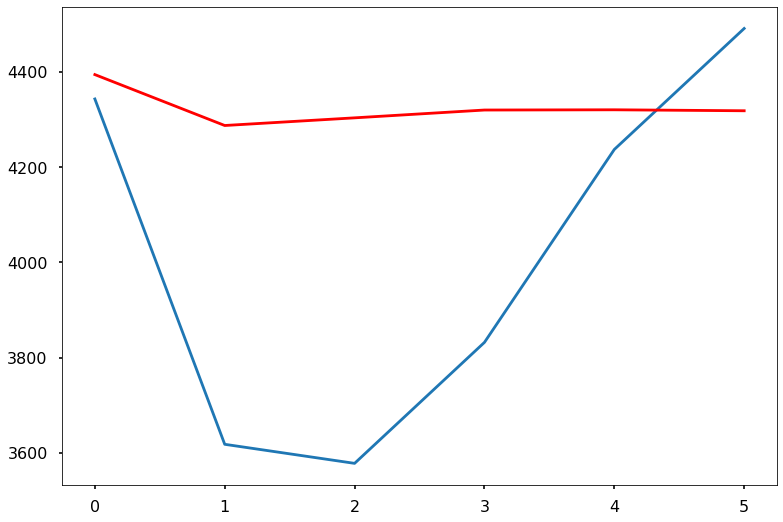

ARIMA(0, 0, 0) RMSE=448.751
ARIMA(0, 0, 1) RMSE=403.975
ARIMA(0, 0, 2) RMSE=441.416
ARIMA(1, 0, 0) RMSE=331.719
ARIMA(1, 0, 1) RMSE=302.930
ARIMA(1, 0, 2) RMSE=inf
ARIMA(2, 0, 0) RMSE=304.874


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(2, 0, 1) RMSE=331.624
ARIMA(2, 0, 2) RMSE=inf
Best ARIMA(1, 0, 1) RMSE=302.930


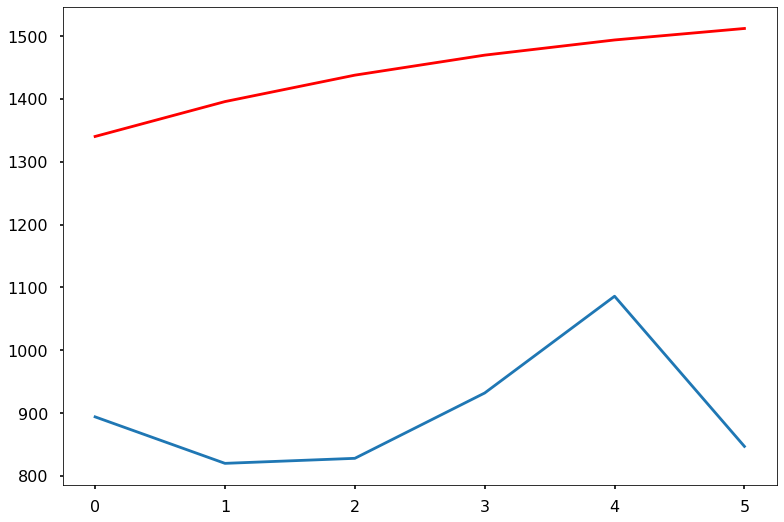

ARIMA(0, 0, 0) RMSE=1133.479
ARIMA(0, 0, 1) RMSE=963.448
ARIMA(0, 0, 2) RMSE=1008.305
ARIMA(1, 0, 0) RMSE=571.795
ARIMA(1, 0, 1) RMSE=inf
ARIMA(1, 0, 2) RMSE=inf
ARIMA(2, 0, 0) RMSE=708.145


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: overflow encountered in exp
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: invalid value encount

ARIMA(2, 0, 1) RMSE=327.667


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(2, 0, 2) RMSE=2274.626
Best ARIMA(2, 0, 1) RMSE=327.667


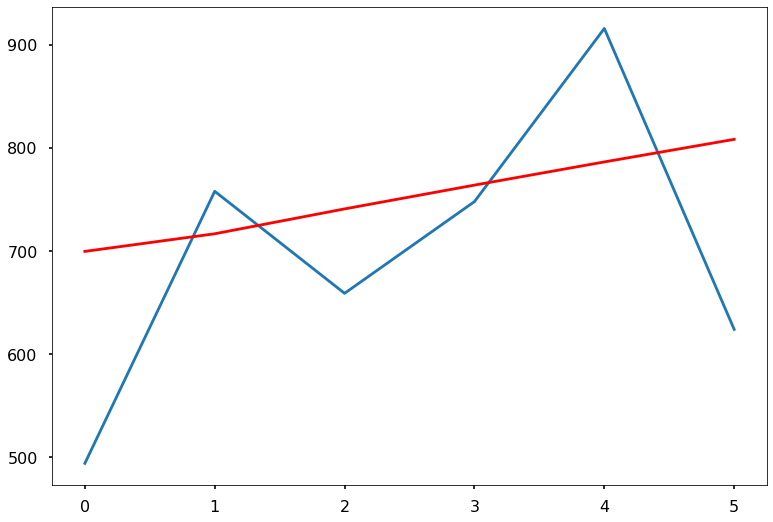

ARIMA(0, 0, 0) RMSE=872.708
ARIMA(0, 0, 1) RMSE=739.671
ARIMA(0, 0, 2) RMSE=707.410
ARIMA(1, 0, 0) RMSE=415.683
ARIMA(1, 0, 1) RMSE=429.725
ARIMA(1, 0, 2) RMSE=401.334
ARIMA(2, 0, 0) RMSE=417.920


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


ARIMA(2, 0, 1) RMSE=446.517
ARIMA(2, 0, 2) RMSE=405.722
Best ARIMA(1, 0, 2) RMSE=401.334


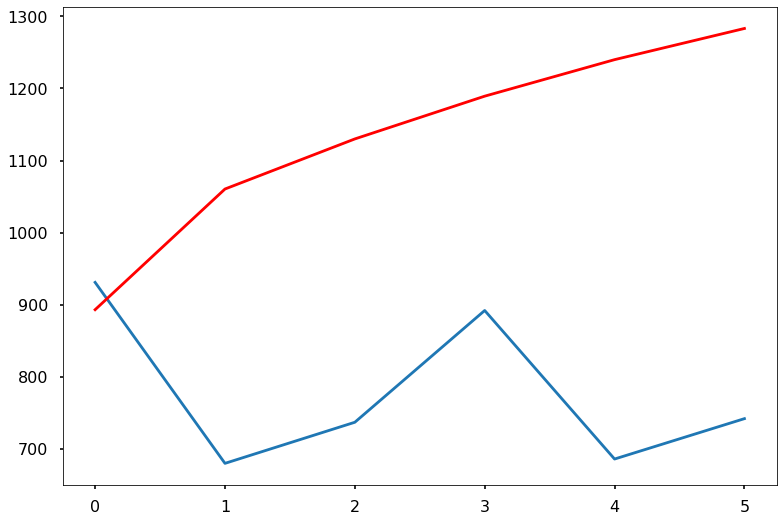

ARIMA(0, 0, 0) RMSE=237.281
ARIMA(0, 0, 1) RMSE=257.157
ARIMA(0, 0, 2) RMSE=234.440
ARIMA(1, 0, 0) RMSE=243.180
ARIMA(1, 0, 1) RMSE=inf
ARIMA(1, 0, 2) RMSE=inf
ARIMA(2, 0, 0) RMSE=305.883
ARIMA(2, 0, 1) RMSE=222.099
ARIMA(2, 0, 2) RMSE=inf
Best ARIMA(2, 0, 1) RMSE=222.099


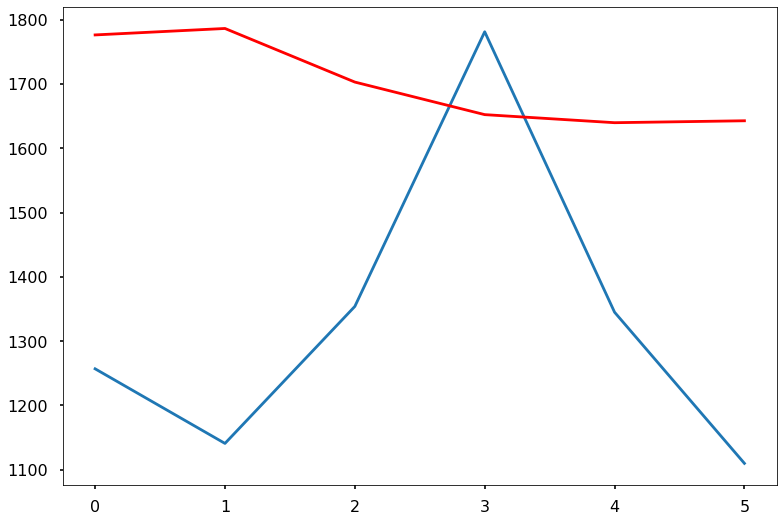

ARIMA(0, 0, 0) RMSE=589.143
ARIMA(0, 0, 1) RMSE=549.610
ARIMA(0, 0, 2) RMSE=517.840
ARIMA(1, 0, 0) RMSE=300.024
ARIMA(1, 0, 1) RMSE=240.520
ARIMA(1, 0, 2) RMSE=inf
ARIMA(2, 0, 0) RMSE=244.943


D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: overflow encountered in exp
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: invalid value encountered in true_divide
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization fail

ARIMA(2, 0, 1) RMSE=25.562


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(2, 0, 2) RMSE=101.526
Best ARIMA(2, 0, 1) RMSE=25.562


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


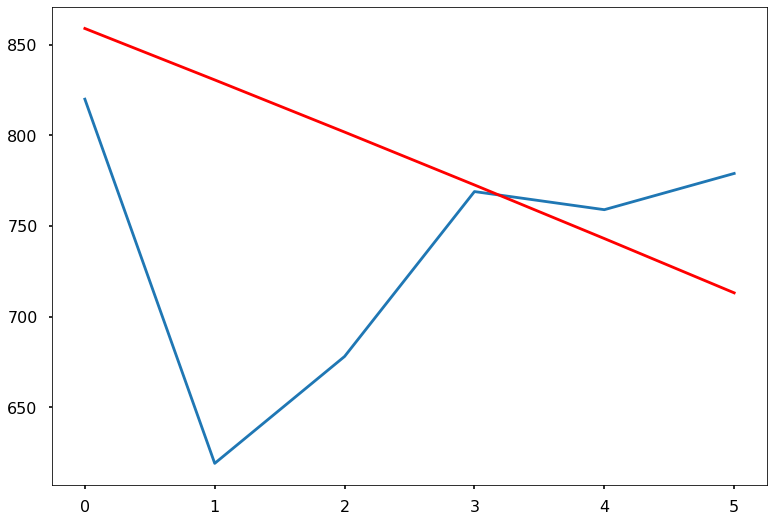

ARIMA(0, 0, 0) RMSE=426.745
ARIMA(0, 0, 1) RMSE=483.010
ARIMA(0, 0, 2) RMSE=395.839
ARIMA(1, 0, 0) RMSE=123.579
ARIMA(1, 0, 1) RMSE=426.265


D:\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:221: RuntimeWarning: divide by zero encountered in true_divide
  Z_mat, R_mat, T_mat)
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\kalmanf\kalmanfilter.py:221: RuntimeWarning: divide by zero encountered in true_divide
  Z_mat, R_mat, T_mat)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: overflow encountered in exp
  tmp = ((1-np.exp(-params))/(1+np.exp(

ARIMA(1, 0, 2) RMSE=526.112
ARIMA(2, 0, 0) RMSE=105.619


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(2, 0, 1) RMSE=123.553
ARIMA(2, 0, 2) RMSE=inf
Best ARIMA(2, 0, 0) RMSE=105.619


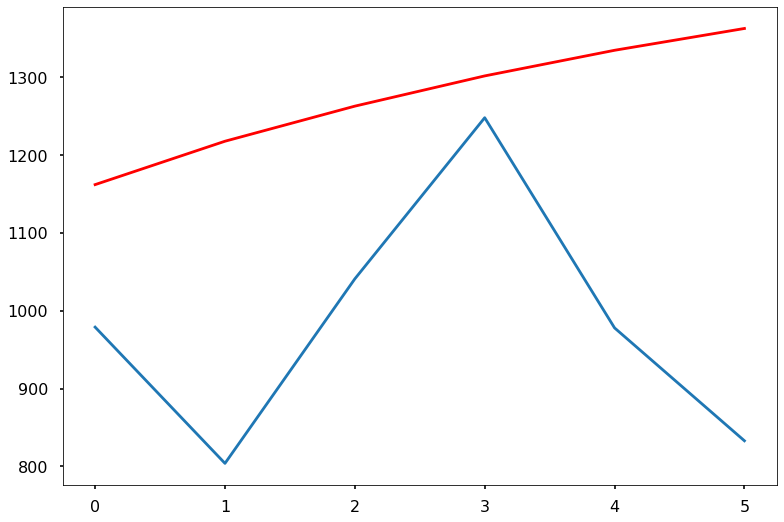

ARIMA(0, 0, 0) RMSE=1076.379
ARIMA(0, 0, 1) RMSE=967.119
ARIMA(0, 0, 2) RMSE=908.910
ARIMA(1, 0, 0) RMSE=761.549
ARIMA(1, 0, 1) RMSE=740.051
ARIMA(1, 0, 2) RMSE=inf
ARIMA(2, 0, 0) RMSE=752.203
ARIMA(2, 0, 1) RMSE=732.192


D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: overflow encountered in exp
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: invalid value encountered in true_divide
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization fail

ARIMA(2, 0, 2) RMSE=656.598
Best ARIMA(2, 0, 2) RMSE=656.598


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


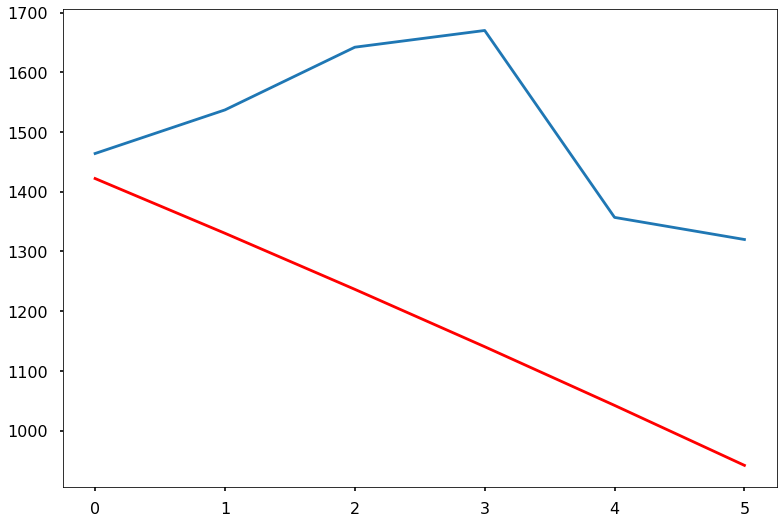

ARIMA(0, 0, 0) RMSE=593.222
ARIMA(0, 0, 1) RMSE=504.004
ARIMA(0, 0, 2) RMSE=528.867
ARIMA(1, 0, 0) RMSE=370.857
ARIMA(1, 0, 1) RMSE=10028.587
ARIMA(1, 0, 2) RMSE=inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(2, 0, 0) RMSE=341.603


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


ARIMA(2, 0, 1) RMSE=74.542
ARIMA(2, 0, 2) RMSE=inf
Best ARIMA(2, 0, 1) RMSE=74.542


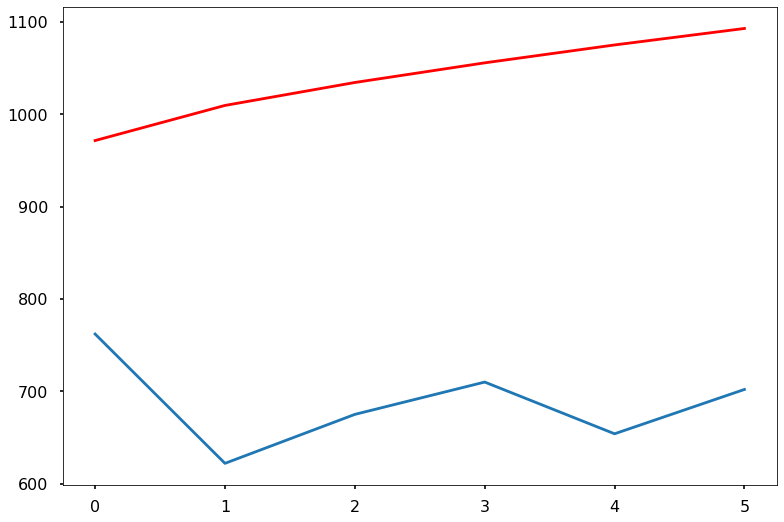

ARIMA(0, 0, 0) RMSE=287.976
ARIMA(0, 0, 1) RMSE=252.546
ARIMA(0, 0, 2) RMSE=306.823
ARIMA(1, 0, 0) RMSE=253.477
ARIMA(1, 0, 1) RMSE=inf
ARIMA(1, 0, 2) RMSE=inf
ARIMA(2, 0, 0) RMSE=280.073


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:695: RuntimeWarning: divide by zero encountered in true_divide
  invmacoefs = -np.log((1-macoefs)/(1+macoefs))
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
D:\Anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: invalid value encountered in true_divide
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()


ARIMA(2, 0, 1) RMSE=307.727
ARIMA(2, 0, 2) RMSE=inf
Best ARIMA(0, 0, 1) RMSE=252.546


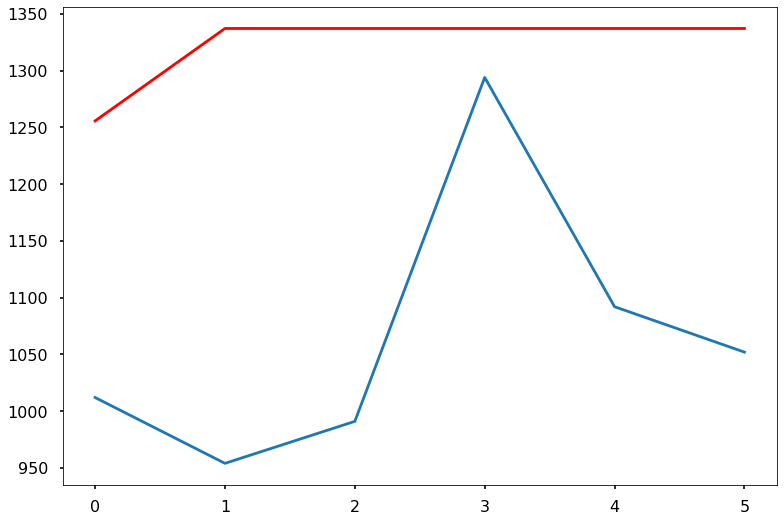

ARIMA(0, 0, 0) RMSE=2041.257
ARIMA(0, 0, 1) RMSE=1937.716
ARIMA(0, 0, 2) RMSE=1837.513
ARIMA(1, 0, 0) RMSE=1820.415
ARIMA(1, 0, 1) RMSE=inf
ARIMA(1, 0, 2) RMSE=inf
ARIMA(2, 0, 0) RMSE=1589.651


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


ARIMA(2, 0, 1) RMSE=323.663
ARIMA(2, 0, 2) RMSE=inf
Best ARIMA(2, 0, 1) RMSE=323.663


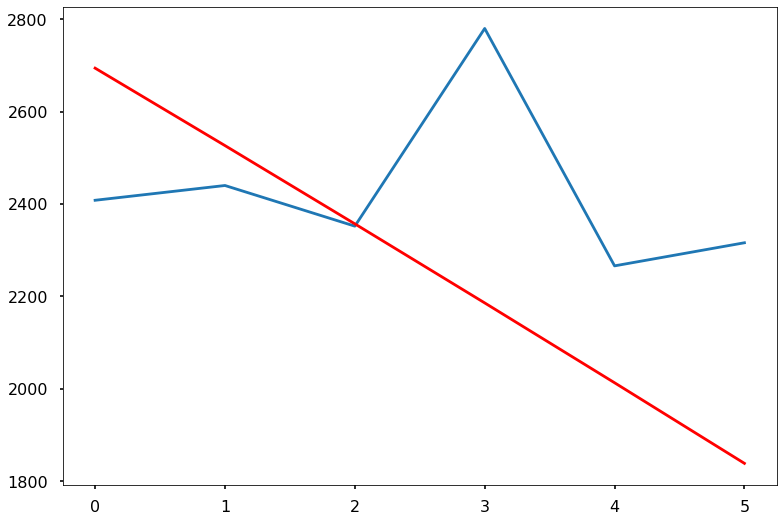

ARIMA(0, 0, 0) RMSE=883.152
ARIMA(0, 0, 1) RMSE=878.653
ARIMA(0, 0, 2) RMSE=888.103
ARIMA(1, 0, 0) RMSE=878.777
ARIMA(1, 0, 1) RMSE=inf
ARIMA(1, 0, 2) RMSE=inf
ARIMA(2, 0, 0) RMSE=907.209
ARIMA(2, 0, 1) RMSE=912.289
ARIMA(2, 0, 2) RMSE=inf
Best ARIMA(0, 0, 1) RMSE=878.653


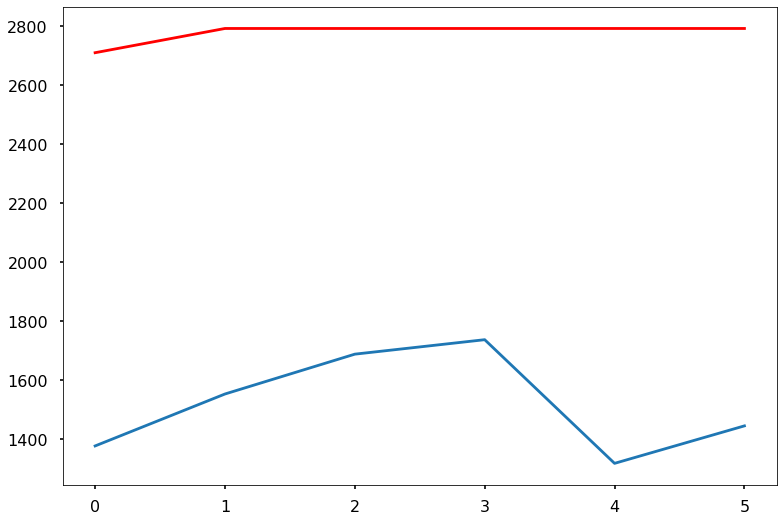

In [20]:
for dataAr in DataAR_after_del_small_shops:
    
    ORDER, _ = evaluate_models(dataAr, p_values, d_values, q_values)
    try:
        train, test = dataAr[:len(dataAr)-6], dataAr[len(dataAr)-6:]
        model = ARIMA(train, order=ORDER)
        model_fit = model.fit(disp=0)
        predictions = model_fit.predict(start=len(train), end=len(train)+len(test)-1, dynamic=False)
        error = sqrt(mean_squared_error(test, predictions))
        
        plt.plot(test)
        plt.plot(predictions, color='red')
        plt.show()
    except:
        pass

# SARIMAX Model

<img src='images/img1-15.png'>

In [18]:
p_values = range(0, 3)
d_values = range(0, 1)
q_values = range(0, 3)

def evaluate_sarimax_model(X, sarimax_order, sarimax_order_seasonal):
    # prepare training dataset
    error = float("inf")
    try:
        train, test = X[:len(X)-8], X[len(X)-8:len(X)-6]
        model = SARIMAX(train, order=sarimax_order, seasonal_order=(*sarimax_order_seasonal, 12))
        model_fit = model.fit(disp=0)
        predictions = model_fit.predict(start=len(train), end=len(train)+len(test)-1, dynamic=False)
        error = sqrt(mean_squared_error(test, predictions))
    except:
        pass
    return error

In [19]:
# evaluate combinations of p, d and q values for an ARIMA model
def evaluate_sarimax_models(dataset, p_values, d_values, q_values):
    dataset = np.array(dataset).astype('float32')
    best_score, best_cfg, best_cfg_sarimax = float("inf"), None, None
    for p in p_values:
        for d in d_values:
            for q in q_values:
                for sp in p_values:
                    for sd in d_values:
                        for sq in q_values:
                            order = (p,d,q)
                            sarimax_order_seasonal = (sp, sd, sq)
                            rmse = evaluate_sarimax_model(dataset, order, sarimax_order_seasonal)
                            if rmse < best_score:
                                best_score, best_cfg, best_cfg_sarimax = rmse, order, sarimax_order_seasonal
                            print('order(' + str(order) + '), seasonal_order(' + str(sarimax_order_seasonal) + '), RMSE = ' + str(rmse))
    print('Best SARIMAX: order(' + str(best_cfg) + '), seasonal_order(' + str(best_cfg_sarimax) + 'RMSE = ' + str(best_score))
    return best_cfg, best_score, best_cfg_sarimax

# Train Best SARIMAX Models for all Shops

<img src='images/img1-16.png'>

Shop number 0:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 1128.8305895926103
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 159.46714398901432
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 629.5010264345071
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 756.4740007735948
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 267.0196118810631
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 161.78300812630079
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 389.17795353719015
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 68.4256849625042
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 147.7333633968915
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 76.47718024252477
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 31.31940358840615
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 174.1657959672318
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 152.7237463493871
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 31.497859688668342
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 173.59165502250318
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 253.76223034244464
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 40.10950846232673
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 145.94410671959875
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 89.75611182546358
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 31.451334187932716
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 173.82801504157158
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 83.02587993776167
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 45.66224878938674
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autor

order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 172.6550158057529
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 259.0099392372816
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 17.843120748876526
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 167.29901674073642
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((2, 0, 2)), seasonal_order((1, 0, 0)RMSE = 17.843120748876526


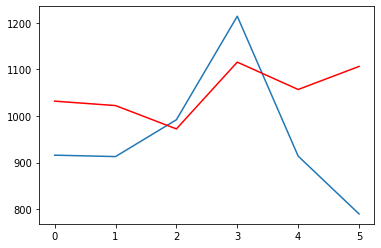

Shop number 1:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 6071.337332087553
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 520.2996798809153
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 2898.8688076703056
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 4396.513280038797
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 7059.173429907832
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 902.1399397412749
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 2888.5573911965466
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 430.2443417887025
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 1319.709604604372
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 855.726921468142
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 834.2912458450262
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 738.1814700808031
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 1079.1918932098831
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 587.2320434160396
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 846.3926017333921
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 1066.906081182184
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 735.9957228225408
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 639.949405261828
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 475.6109678968977
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 743.7507526011409
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 799.5112382501009
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible sta

order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 946.4715342794717
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 505.28267837727594
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autor

order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 1345.8897542876346
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 1314.2603328354594
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 503.2146489819127
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 417.2937553916341
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((2, 0, 2)), seasonal_order((2, 0, 0)RMSE = 417.2937553916341
Shop number 3:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 1290.516369520356
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 777.802508359244
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 390.3824217269317
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 928.7039959434534
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 573.9796130588729
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 396.9305234854167
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 660.7465923397712
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 259.1599630462593
order((0, 0, 2)), se

D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 703.4547995065014
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 101.72648104245856
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 268.20251432017017
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 402.13034747810786
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 306.4033291670954
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 275.0361991533398
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 550.6477157199162
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 358.158654108218
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 240.07101754660624
order((1, 0, 2)), s

D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 321.1162074390261
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 588.72874908685
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 439.4476213887658
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 341.64129143521893
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 515.2470964564111
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((2, 0, 0)), seasonal_order((0, 0, 0)RMSE = 60.109182280539294


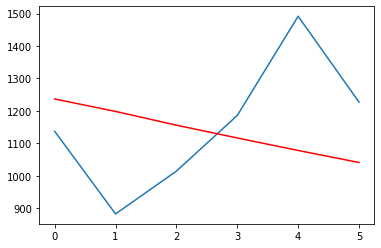

Shop number 4:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 1554.518092529
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 418.3006505947096
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 1157.1900015940626
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 1105.1812845416773
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 393.91111415018304
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 168.62048382744595
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 742.9317467294618
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 396.6825697340498
order((0, 0, 2))

D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible sta

order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 126.28896506646399
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 177.79490364405711
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible sta

order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 72.7600547724051
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 533.5638550531248
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 171.24570066272378
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 39.13606434027233
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((2, 0, 2)), seasonal_order((2, 0, 0)RMSE = 39.13606434027233


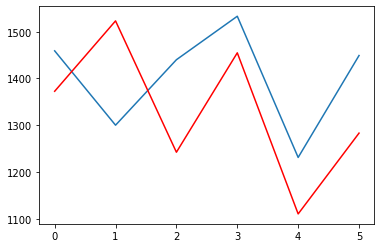

Shop number 5:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 1606.5654359533569
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 252.1796867213203
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 857.0148154740831
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 1224.8427724934213
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 65.49824807633456
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 465.3124829799811
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 1436.1018821478694
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 194.71739060877897
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 533.4259400899224
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 373.51770631782585
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 371.15803956124165
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 457.73285203897547
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 105.38477335560307
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 223.69450878719024
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 420.3083475982289
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 62.500533200311956
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 223.44654254257574
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 419.211356463422
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 358.4936656905465
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 310.27442676696745
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 390.62831226545126
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 84.11885869354602
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 234.1278662977215
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 399.73136541213887
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 79.57896669141499
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible sta

order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 224.71687533120436
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 363.25605890903756
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((1, 0, 2)), seasonal_order((0, 0, 0)RMSE = 62.500533200311956


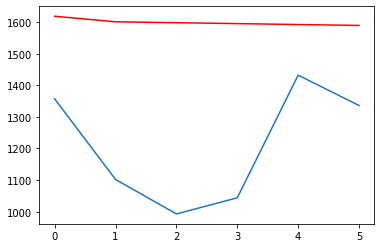

Shop number 6:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 1475.5422731999242
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 263.3912030711748
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 1622.5260003109202
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 1154.177550635515
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 261.48336893988716
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 411.8334017545384
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 730.3979502683977
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 459.3212774999244
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 362.7997535042593
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 145.69680848830143
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 303.7163757091885
order((1, 0, 0)), s

D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 320.1311577530413
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 390.1986654246389
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 65.1120231349838
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 390.2288907988743
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 394.8008593827765
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((1, 0, 1)), seasonal_order((0, 0, 0)RMSE = 53.967188339408644


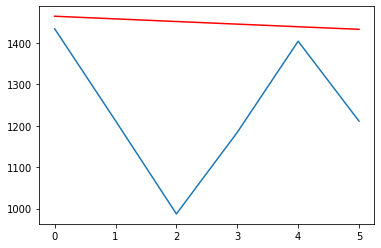

Shop number 7:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 1878.932941858224
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 278.2719208946042
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 411.1196676971473
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 1452.4071440955668
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 312.6384041058254
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 301.98672497166797
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 956.7684694826567
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 97.87718029071269
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 301.7626687924397
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 322.9506404744084
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 273.32173773442565
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 254.69031409947127
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 274.6340887189205


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 271.5806014412896
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 254.63279816807804
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 285.64580939389793
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 243.05342791455828
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 280.7857338084093
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 232.00256703072398
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 254.13178694790523
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 254.3259346054932
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 250.93470287674998
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 338.5493619452519
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 306.69929133626397
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((0, 0, 2)), seasonal_order((1, 0, 0)RMSE = 97.87718029071269


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


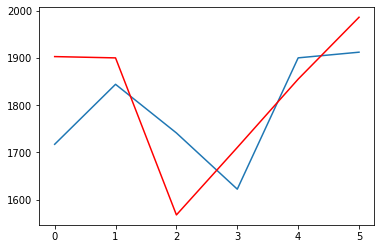

Shop number 8:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 3919.050714139841
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 1289.9141208599003
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 2145.7938254013957
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 2756.113661526068
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 1359.159496763416
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 1938.730569677262
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 1656.4505501697276
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 1687.1887583842665
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 243.86185761980857
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 352.0049826057539
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 789.0348702590251
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 1663.1698314606663
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 625.6385001029665
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 1030.2108445016727
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 1493.9411821431872
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 650.9556010268159
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 1075.0660945587063
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 859.7360055741952
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 700.4801483253965
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 261.9430020852436
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarni

order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 587.1814539438553
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autor

order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 736.9183686847335
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 1704.790235073076
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 651.8209304378832
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 767.3125378430472
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((1, 0, 0)), seasonal_order((0, 0, 0)RMSE = 243.86185761980857


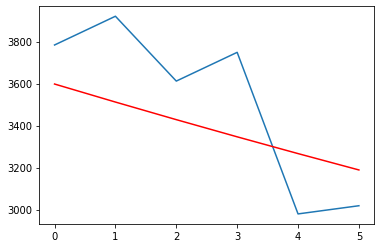

Shop number 9:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 4835.985990467714
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 323.06571051102253
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 2733.068721814322
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 1095.9694786230268
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = inf
order((0, 0, 1)), seasonal_orde

D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 555.087670048131
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 401.87118727934876
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 2363.9580015629203
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 702.6663046463568
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 866.6591154483576
order((2, 0, 1)), seasonal_order((0, 0, 1)), R

D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 459.5944632398007
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 465.54186060836463
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 367.6865363029188
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((0, 0, 2)), seasonal_order((1, 0, 0)RMSE = 299.12838117063444


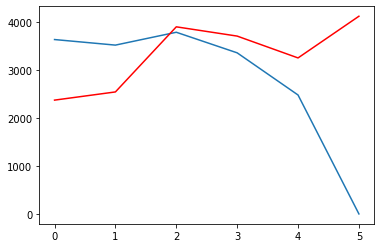

Shop number 10:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 1506.639472468447
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 331.902878231745
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 1248.219060493013
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 1090.2033513415279
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 431.88075124724264
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 715.0277521814404
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 586.2488595180621

D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 350.68780022593955
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 851.3834637294535
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 252.8368782129155
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 513.0606753524662
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 449.7055636703457
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 301.6056055186034
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 250.66850661706667
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 232.0056349390029
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 289.8309515683764
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 249.12517275518542
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 241.2089122718253
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 116.04426850800914
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 390.1259491017638
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 353.80909582080966
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 289.66278356598775

D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 249.9909835819092
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autor

order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 234.14627167343758
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 373.2857957884263
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 223.76897961520783
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 301.90024223237606
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((2, 0, 0)), seasonal_order((0, 0, 0)RMSE = 116.04426850800914


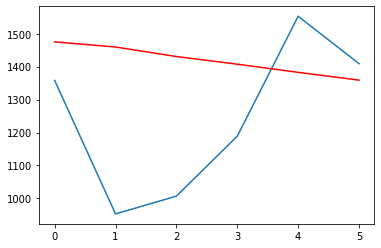

Shop number 11:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 939.330878870699
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 200.87386101582075
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 871.6096287233514
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 643.0717831923826
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 113.6094066345396
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 308.7014258276628
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 509.992150679395
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 32.48234614001179
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 184.47731536945508
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 45.92364243172552
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 54.00778017712061
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 781.7341647162083
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 416.31623544579304
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 213.1144562452716
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 1132.5216964473532
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 442.08382762624296
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 203.3410441818435
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 915.0152416107393
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 50.623400008553354
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 13.58298755065625
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 762.1908625256362
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 430.5075404846839
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 195.01978783097815
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 932.1153324528877
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 440.73525937505605
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 203.3403479691745
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 919.6114364720594
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((2, 0, 0)), seasonal_order((1, 0, 0)RMSE = 13.58298755065625


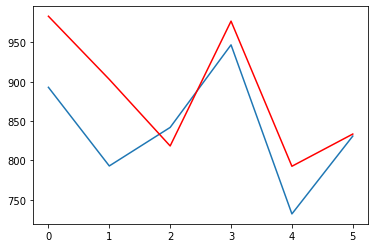

Shop number 12:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 1989.5181577457392
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 982.8156880395314
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 737.4910785519186
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 1415.5026546010427
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 710.2951337911176
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 614.4962954653138
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 340.28762182213706
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 476.7036509779499
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 433.7190758280007
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 232.28021192137822
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 338.603894205606
order((1, 0, 0)), s

D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 729.331595974055
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 760.3470743339669
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 312.6972161265226
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 718.1142919188546
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 275.16257431539657
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 354.1026920008659
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 433.1234492104827
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 737.1172192354803


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible sta

order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 313.83355255329957
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 732.4480588210158
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 811.0036328304815
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 315.6557734466006
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 689.9859974545589
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((1, 0, 0)), seasonal_order((0, 0, 0)RMSE = 232.28021192137822


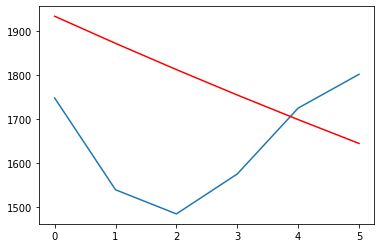

Shop number 13:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 811.9498137200353
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 151.4501135839689
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 190.76684445541878
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 614.2961227005253
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 242.88250703436722
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 298.9129265938642
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 117.18983159363356
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 46.86545047119927
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 297.97105103618384
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 75.73388673449985
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 138.09845950063178


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 156.7155563596264
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 273.8444216471436
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 264.76786366379076
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 256.762977027247
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 236.77593527978945

D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 231.60876566770546
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 222.8848578641192
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 101.74707828777906
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 146.2872535605885
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 142.14651509097405
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 235.3585615361456
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 230.62481130654996
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 218.1964918054851
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary sta

order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 301.6288716974045
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 293.3969740363582
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 289.3965328270869
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((0, 0, 2)), seasonal_order((1, 0, 0)RMSE = 46.86545047119927


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


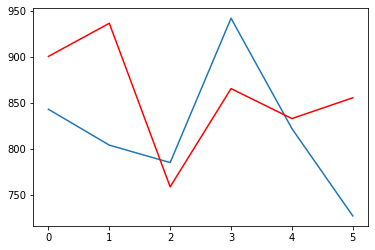

Shop number 14:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 740.5001688048424
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 256.3108012119509
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 174.51637287213265
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 624.6870547915207
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 206.4737925978164
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 233.38726769175213
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 483.74819343530334
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 183.52381604246932
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressiv

order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 211.4580071871005
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 32.93438243581201
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 190.5794831253377
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 223.91447292663318
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 182.99459276111227
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 217.47940760681905
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 223.80453069156917
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 111.68199612258657
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationa

order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 191.87681260041632
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 202.65249730254584
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 38.44073320315552
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 194.9083792136467
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 224.17974395471137
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 115.9585866607548
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 189.719777558818
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 223.91609116843102
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary sta

order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 142.15757862589354
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 187.9852065416701
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 208.4757978098361
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((1, 0, 0)), seasonal_order((0, 0, 0)RMSE = 32.93438243581201


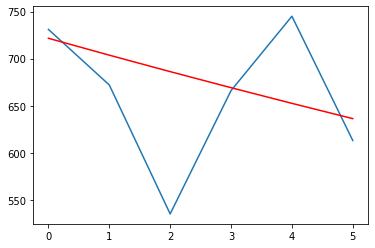

Shop number 15:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 1385.7308540982986
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 447.46465807315576
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 740.4666969398713
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 947.6157860148254
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 274.235761026132
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 218.5230652107215
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 300.01386147082616
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 110.33305454419529
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 172.40273289264715
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 365.10770789406916
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 122.91037846674564
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 75.26005334651855
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 703.426362160334
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 154.0003008285805
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 98.67155632969666
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 761.320392546766
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 131.43519913779485
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 138.04640247960702
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 446.4926389773957
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 146.83095797955954
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 84.00212140315173
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 323.25093176993175
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible sta

order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 165.04024597932516
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 148.90292165865293
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 746.3419850366535
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 175.62529684603814
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 248.90224565718552
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((1, 0, 0)), seasonal_order((2, 0, 0)RMSE = 75.26005334651855


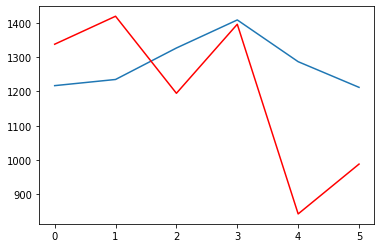

Shop number 16:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 1149.1451170326575
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 227.25147700783347
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 1517.3619529331204
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 784.8998860614008
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 108.75260102587865
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 188.04386023433062
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 378.625918357465
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 543.4737988005329
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 94.81980889815479
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 141.27421180422496
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 126.94032112366926
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 360.7219263846209
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 457.45732845080266
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 127.47391829917233
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 355.08799119754053
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 443.639249230054
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 106.69518584324587
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 331.7708068925612
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 199.6956827781371
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 126.7482833882782
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 358.18954958681303
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 181.07648937542737
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 153.07891515784692
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 368.74590721213644
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 501.4146823249763
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 114.82960422954162
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 338.24341101485413
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((0, 0, 2)), seasonal_order((2, 0, 0)RMSE = 94.81980889815479


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


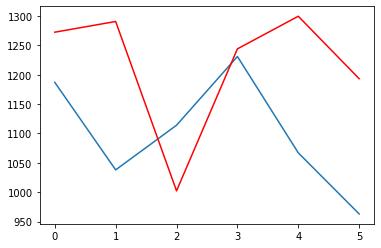

Shop number 17:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 1374.0363896200129
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 504.913695354891
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 1170.0027011948011
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 993.5412643790065
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 369.36482134071747
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 735.5229840141025
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 431.4653599067326
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 488.3111307391463
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 87.72393786936095
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 220.12557389664087
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 274.987321430294
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 420.84642052380485
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 193.4459957383371
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 237.97938267695972
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 558.0468952138764
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 204.0065252698496
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 255.964594950532
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 226.32105064679476
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 219.1823544092016
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 226.0744913299945
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 508.5176682693083
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible sta

order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 102.96104631912735
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 68.36033445011367
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 469.4936125824131
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 181.89141717443724
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 189.33194360328184
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((2, 0, 1)), seasonal_order((2, 0, 0)RMSE = 68.36033445011367


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


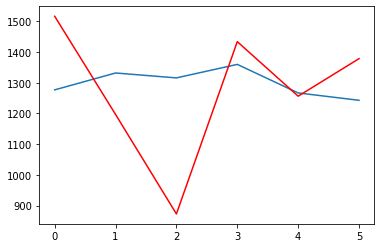

Shop number 18:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 579.6813780000182
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 264.27477389869443
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 435.4121503701105
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 548.2624900667182
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 181.68374344779863
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 142.67955649626848
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 604.8400197779577
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 268.6404092072691
order((0, 0, 2)), 

D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 136.02950231580377
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 165.8683156762301
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 103.43803075387846
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 98.42899116241564
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 316.86639249208366
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 104.75576680607296
order((1, 0, 2))

D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 110.9051965633884
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 181.64419907636483
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 117.24106669423014
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 122.82280708784651
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 177.84210375965108
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 103.57435535967781
order((2, 0, 1)

D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 90.94546135368981
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((1, 0, 0)), seasonal_order((0, 0, 0)RMSE = 30.972615227467323


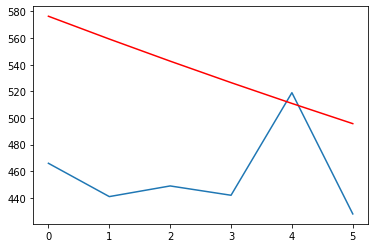

Shop number 19:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 1028.8413385940516
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 139.56074563958282
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 640.8328676539064
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 825.0645746739682
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 98.06616577564397
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 465.25614620026505
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 572.9505575473759
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 391.2846091321411
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 572.6340036481573
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 97.60681191871272
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 205.80537745453515
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 322.8661486246831
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 283.7666576508592
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 117.9563859749121
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 227.70732722977147
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 271.84806605086436
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 117.31614592669733
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 235.49064388465032
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 52.79384344659577
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 162.0488423604902
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 315.216113721445
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 272.21439186097825
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 117.35923109830587
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 233.23567851412275
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 292.5235614485532
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 118.05077691933629
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 236.95414048701068
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((2, 0, 0)), seasonal_order((0, 0, 0)RMSE = 52.79384344659577


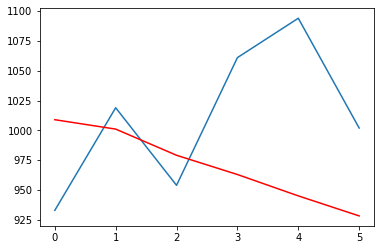

Shop number 20:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 2653.3499580718712
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 1181.5078006650167
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 1368.869922636811
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 2505.455043739551
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 1294.1393512481652
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 1295.1868125344247
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 2102.288462180795
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 2210.5131674350064
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressiv

order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 2235.5392122254743
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 1236.7333200854819
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 1248.7500418877942
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 1210.3966910875208
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 827.4778324696342
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 823.8103127968953
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 813.1973600772504
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 620.9851134579568
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 742.7026285624372
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 744.7939981865856
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 1033.7926060418536
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 1045.5408861772146
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 1018.5685727851155
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 771.7125064097314
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 768.3597851186539
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 774.2213399068175
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible sta

order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 955.2365571833479
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 921.0685023163873
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 912.2935668260186
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((1, 0, 2)), seasonal_order((0, 0, 0)RMSE = 620.9851134579568


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


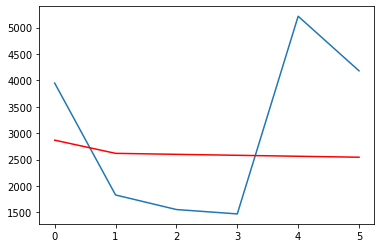

Shop number 21:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 1350.2903391493253
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 498.5155399550959
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 709.9873520567153
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 952.5947476126092
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 355.1469500111209
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 115.83600002305177
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 817.2185047235266
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 184.56246536095475
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 98.31326297961098
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 59.49807219943136
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 143.36493368920003
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 101.12582741379495
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 386.5183112377255
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 161.51239039765778
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 90.0128751622292
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 429.15285383534075
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 156.2826546645652
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 85.53629774660045
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 70.12857887124035
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 159.61970124064257
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 90.27132624925544
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 405.841684480641
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 154.1598584331853
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autor

order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 101.202965940466
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 467.9564481069603
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 176.62629245800977
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 42.634157788627206
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((2, 0, 2)), seasonal_order((2, 0, 0)RMSE = 42.634157788627206


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


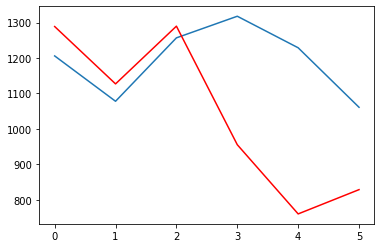

Shop number 22:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 7317.537734784837
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 1823.4376747510807
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 1132.4446691189146
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 5243.959169750922
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 2982.942466170481
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 1071.6086419883347
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 3393.388718349035
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 493.2604725995999
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 1052.4622232093918
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 288.007396433822
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 338.4492489838507
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 1107.4367730602328
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 1706.6072942043909
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 425.3620739499469
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 1133.2040382399557
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 2050.9062609322923
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 315.7333408697818
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 1063.124066506093
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 211.84519332114627
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 386.91844695274017
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 1115.383098221779
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 1873.8775122778666
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 354.62098680777393
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 650.0761337523644
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 2240.112752364947
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 392.2737255168526
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 908.1856583068501
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((2, 0, 0)), seasonal_order((0, 0, 0)RMSE = 211.84519332114627


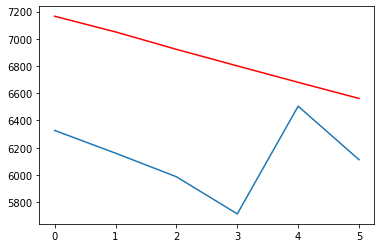

Shop number 23:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 1605.8924310177192
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 539.9770429151034
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 682.3795970644163
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 1114.501660213435
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 568.4007388952461
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 179.2926593436833
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 592.0138370171755
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 314.878905289696
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 235.90622940252442
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 158.25213086235007
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 242.01881706375462
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 245.80957698873812
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 588.5263008704004
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 548.1830971875888
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 499.4180096807898
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 520.6261700763368
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 335.6501424907598
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 16.852623366445158
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 283.2644537019482
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 287.7427164330183
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 125.99533682375449
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 254.12640977963324
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 246.01301887935526
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 606.7639348623219
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 367.45959804871353
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 381.3639150382571
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((2, 0, 0)), seasonal_order((0, 0, 0)RMSE = 16.852623366445158


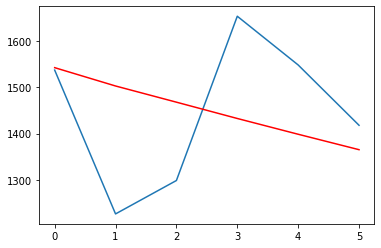

Shop number 24:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 1317.3112768059036
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 644.6193341728018
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 1365.705281248253
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 882.4181950562968
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 760.186479734925
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 1067.0875226193646
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 561.3354341966761
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 473.78263458156977
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 293.81481683304463
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 320.93739212041953
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 189.67773329572222
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 477.632215807657
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 947.9713186628808
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 269.54237851953485
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 171.75892957212014
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 863.6135830606839
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 260.24830440692955
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 113.62382159096148
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 392.09478217272385
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 232.97419350169258
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 216.00676672494427
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 373.8472619726305
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 236.8341907101749
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 505.57377584064693
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 1003.4721334559304


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 324.67608846848844
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 412.52386801942316
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((1, 0, 2)), seasonal_order((2, 0, 0)RMSE = 113.62382159096148


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


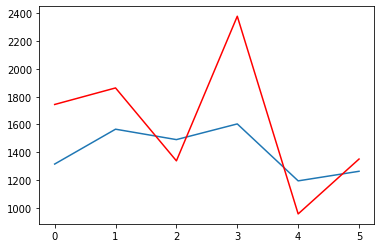

Shop number 25:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 1961.7554638639342
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 224.98649055707799
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 211.69697610992193
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 1321.456212235802
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 343.3638208065234
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 280.69764680965716
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 745.3578188509348
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 180.25750828006446
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressiv

order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 433.68777175714183
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 144.47695690475683
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 163.7048925540871
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 121.37849533071993
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 412.22226990656526
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 166.56461848423731
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 121.93287263981146
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 383.9700946203953
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 236.61317786072146
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationa

order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 193.81349849074354
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 196.0269447997012
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 164.167361895615
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 121.38482954758437
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 220.04905094360612
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: User

order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 183.41394299371407
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 569.0206242844257
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 207.2211524330774
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autor

order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 124.16382448007236
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((1, 0, 0)), seasonal_order((2, 0, 0)RMSE = 121.37849533071993


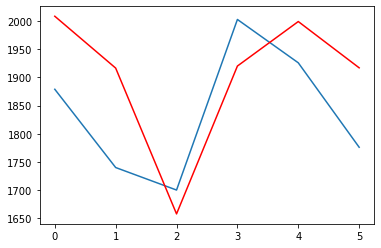

Shop number 26:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 938.9850904034632
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 1162.4790896725083
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 2260.6252790126205
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 635.9045008146294
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 615.140006439405
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 858.8741164335122
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 824.5495543050774
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 92.27285603946204
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 558.1679858698801
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 78.70138076715956
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 199.30995654521863
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 309.7436209285492
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 290.69708606208485
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 189.164204597259
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 193.40786171087532
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 330.9131245078143
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 267.7855706394993
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 195.52080313720998
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 199.61085250638143
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 214.90345946468648
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 197.00750672497756
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 287.27175129379617
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 207.93046607033872
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 190.37578120118133
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 308.71384968478674
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 306.9182277735555
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 557.6211724122107
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((1, 0, 0)), seasonal_order((0, 0, 0)RMSE = 78.70138076715956


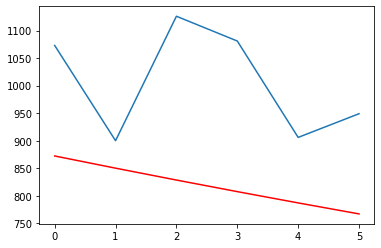

Shop number 27:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 4398.044622329337
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 545.8034078459899
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 3307.2314475451967
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 1689.9458715666062
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 750.11044197333
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 1901.478017088491
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 625.1227525999641
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 476.0647107812586
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 666.3524704978358
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 439.40415763184205
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 765.0071457469991
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 272.1085538912146
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 506.172755404544
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 667.5364355346245
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 272.8211177482198
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 480.5536805358705
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 553.1616312932098
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 415.5134782444761
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 766.8673595044104
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 269.2569440597158


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 439.6487447430563
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autor

order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 762.9158378109634
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 479.48973496632124
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 412.88146616923285
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertib

order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 445.48355904315395
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((2, 0, 1)), seasonal_order((0, 0, 0)RMSE = 269.2569440597158


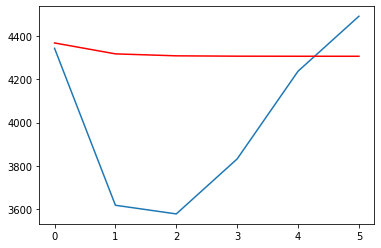

Shop number 28:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 1167.096397046962
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 354.7768340034367
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 635.6732843108023
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 815.2282244910364
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 507.0834728840171
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 279.08873402646356
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 681.5912415775168
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 150.06570173227163
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 186.4534883479043
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 100.43284008317802
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 189.22770931199128
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 246.58799695045556
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 193.32820204707107
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 176.51066681686305
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 236.72022510590554
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 205.86257663827104
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 179.96484641797093
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 137.3332657725427
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 42.32663831033292
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 186.55076100539782
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 184.1031686512108
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 191.63764914967635
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 216.20390979257917
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 249.3460283303987
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 301.98740101159893
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 253.13990656728544
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 144.4949817615579
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((2, 0, 0)), seasonal_order((0, 0, 0)RMSE = 42.32663831033292


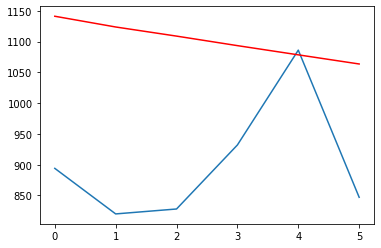

Shop number 29:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 605.2375566668017
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 735.1333187913904
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 1846.099865268203
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 752.5611786307323
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 579.3525765305225
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 702.657218705753
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 557.1796921897892
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 466.3661760501325
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 307.52906175596297
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 357.7574953505561
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 309.77712183091876
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 324.53230798330827
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 578.6784544699008
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 347.87650374348334
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 457.7541291495935
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 671.0134615309133

D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 374.76919065168084
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 459.9577229321564
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 645.8841170319863
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 360.5887145141294
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 460.8527047756964
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 644.4007422369049
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 363.4214951396844
order((2, 0, 1)), se

D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 459.0546400895537
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 647.1522114620784
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 347.6445388074846
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 443.7775240546371
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((0, 0, 2)), seasonal_order((2, 0, 0)RMSE = 307.52906175596297


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


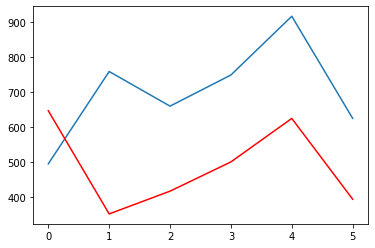

Shop number 30:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 788.9008175936947
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 488.1704638792806
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 79.332955822676
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 540.3940947444139
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 195.67650167434329
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 96.05509080474683
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 700.9939031925414
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 397.43859853519695
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 45.15191570125393
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 111.48978667538594
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 71.30084295376423
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 55.78689687620152
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 179.8254758085456
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 75.33862183699961
order((1, 0, 1)), s

D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 52.07635264531774
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 279.89499015665353
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 69.40601637894461
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 91.35402164396487
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 138.06329886939272
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 78.48529425443724
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible sta

order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 93.12203298701175
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 122.32246985351208
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 73.30557020638565
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible sta

order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 55.88198812031168
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 288.6361703176138
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 75.64174426814657
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 60.22962648994593
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((0, 0, 2)), seasonal_order((2, 0, 0)RMSE = 45.15191570125393


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


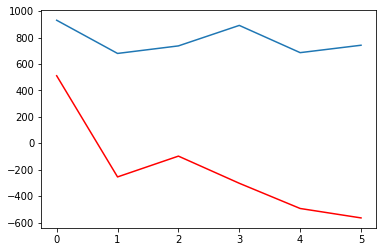

Shop number 31:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 1444.1421328941276
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 17.339689092978336
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 324.40286373498105
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 987.4565515035646
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 62.38239358053208
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 149.95077978246442
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 1329.6208342779987
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 111.36794557667969
order((0, 0, 2))

D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 116.21404616681758
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 158.7556464159227
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 130.2165992612311
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 198.92310616652912
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 234.66367480761875
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 72.40686419632634
order((1, 0, 1)),

D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 247.13961951229302
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 91.18285494974235
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 104.38503912119721
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 118.90602047811973
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 52.06246819262863
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 200.8257261923904
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 239.17266083332535
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 95.89196299343351
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 120.62730490643119
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible sta

order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 218.47114328111766
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 89.79802596257112
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 167.4839573705118
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((0, 0, 0)), seasonal_order((1, 0, 0)RMSE = 17.339689092978336


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


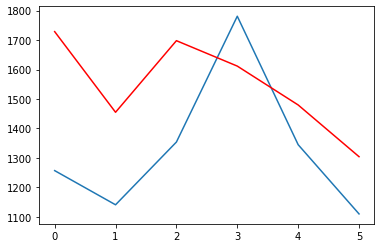

Shop number 32:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 900.0938839921089
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 640.083250720854
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 52.390481836505955
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 628.3925395020478
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 723.6187309221837
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 53.97294943383293
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 162.90129088469826
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 467.2293420216294
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 14.802247330434474
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 152.1739966225415
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 52.513001576755684
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 127.04518770590097
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 164.4676771052021
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 52.337632361645994
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 171.05455530319082
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 181.63033754989314
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 52.84352133630083
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 7.19722978074624
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 162.44739407401397
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 55.736588828890994
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 42.34786090409457
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 166.01012655840742
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible sta

order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 52.76630800029974
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 195.208666672512
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 52.86537465055338
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((2, 0, 0)), seasonal_order((0, 0, 0)RMSE = 7.19722978074624


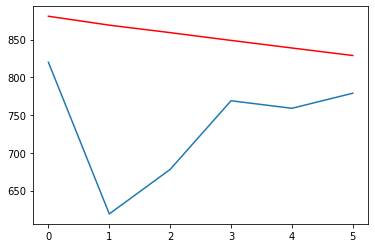

Shop number 33:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 1051.1852833825253
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 208.79644495132897
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 1295.8898739870594
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 800.7571517621778
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 297.4234781724593
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 362.6857063980642
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 265.3204229432366
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 202.95407198655786
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 142.06632080414244
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 114.88262179021258
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 192.40101336835437
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 279.339550854826
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 106.60012683900544
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 173.240417170963
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 277.1612921576884
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 108.263652595491
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 160.2496640009254
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 329.90767263598985
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 82.96627921016335
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 182.41774657839622
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 276.85552473460393
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 113.00823508706836
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 206.42260870273526
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 334.62703870510524
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 204.72732806080512
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA paramete

order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 205.4763861033065
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 333.7882803420144
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((2, 0, 0)), seasonal_order((0, 0, 0)RMSE = 82.96627921016335


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


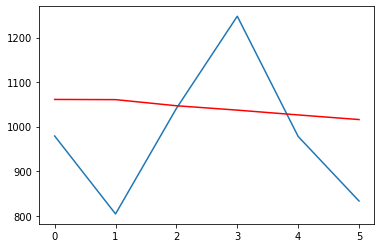

Shop number 34:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 1504.9202636684774
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 593.7340490754972
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 1193.909241032241
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 1016.4827587178559
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 407.35190339818735
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 191.5971705400699
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 763.0212396997331
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 347.2134192654216
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 68.35689078557378
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 84.85898987539731
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 115.10401802755176
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 104.55573400266223
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 551.7055149689118
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 126.29653177496427
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 54.98821176304484
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 575.4601852708176
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 132.75537063875157
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 65.64990205611097
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 191.60580794714656
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 136.831782780212
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 64.6625421594964
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 529.48119534799


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible sta

order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 111.05367082871237
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 47.17067435666026
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 576.6229536376843
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 138.00968019800592
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 275.5489596946535
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((2, 0, 1)), seasonal_order((2, 0, 0)RMSE = 47.17067435666026


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


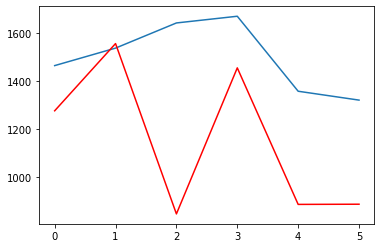

Shop number 35:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 803.3193636406382
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 427.65865907397614
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 850.9671242851515
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 609.6708237814845
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 285.37342780820813
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 303.19211696520324
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 515.41212890141
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 177.22309435265828
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 186.08982854889393
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 80.40817678941711
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 212.39530433837723
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 286.98408403206446
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 245.62784651521312
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 213.29526417046688
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 130.6332785871517
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 235.43657339234286
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 208.12030647278922
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 129.0112466649722
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 78.07059332770379
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 219.3949189716901
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 159.92007264561101
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 103.71197046209024
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 218.68050275715729
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 290.9602849345401
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 302.6440824482485
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 182.57053226958422
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 117.92260249749931
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((2, 0, 0)), seasonal_order((0, 0, 0)RMSE = 78.07059332770379


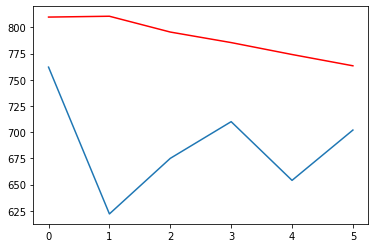

Shop number 36:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 1081.8495736469097
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 250.1235860277969
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 177.12710046609908
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 760.8911887920548
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 214.70754977363887
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 494.76124682272456
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 223.00836416978555
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 195.02787923834768
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 52.8166775057696
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 168.46370384105836
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 284.5406298854268
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 325.15878242803103
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 172.7986531587465
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 238.04849478247982
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 248.2756364751155
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: User

order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 234.9423785524668
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 227.05279334132368
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 29.417358912973544
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 163.53395606008056
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 225.06435592834086
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 36.894630177357016
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: User

order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 169.4961695109727
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 182.10642766426977
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary sta

order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 315.02611114591724
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 257.61152693995325
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 213.90188786002307
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((2, 0, 0)), seasonal_order((0, 0, 0)RMSE = 29.417358912973544


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


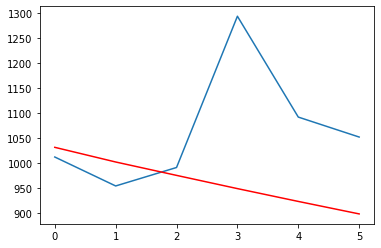

Shop number 37:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 2989.177897014495
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 1489.4906219650084
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 2064.274653341475
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 949.5257827434841
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = inf
order((0, 0, 1)), seasonal_orde

D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 330.8384993395265
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 1251.0107151635855
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 396.724783659803
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 660.0234518578633
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMS

D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 365.3190904434984
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 1226.9748696061215
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 478.5872472831897
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((1, 0, 0)), seasonal_order((0, 0, 0)RMSE = 306.08119476883417


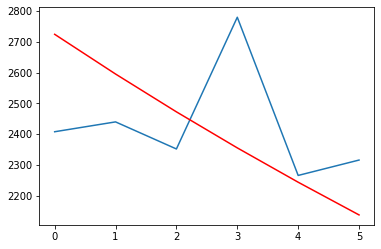

Shop number 38:
order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 2060.216129438851
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 545.6039828846751
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 1279.3604502336202
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 438.4681207382104
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = inf
order((0, 0, 1)), seasonal_orde

D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 311.6526631449614
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 247.1500072941738
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 219.35332541755412
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 869.6027508138146
order((1, 0, 1)), seasonal_order((0, 0, 1)), RM

D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 189.58578981106157
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 861.2782652758902
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 170.24060523630123
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 367.0588516864003
order((2, 0, 0)), seasonal_order((0, 0, 1)), R

D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 858.9660883769704
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 319.0720940413843
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 866.4995230335305


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 173.5287867398837
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((1, 0, 2)), seasonal_order((1, 0, 0)RMSE = 170.24060523630123


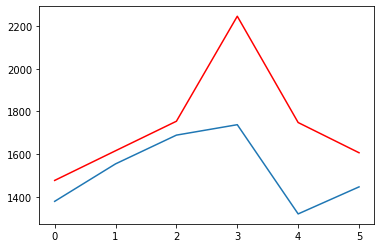

In [41]:
i = 0
for dataAr in DataAR_after_del_small_shops:
    
    print('Shop number ' + str(i) + ':')
    order, _, sarimax_order = evaluate_sarimax_models(dataAr, p_values, d_values, q_values)
    try:
        train, test = dataAr[:len(dataAr)-6], dataAr[len(dataAr)-6:]
        model = SARIMAX(train, order=order, seasonal_order=(*sarimax_order, 12))
        model_fit = model.fit(disp=0)

        predictions = model_fit.predict(start=len(train), end=len(train)+len(test)-1, dynamic=False)
        error = sqrt(mean_squared_error(test, predictions))

        plt.plot(test)
        plt.plot(predictions, color='red')
        plt.show()
    except:
        i += 1
        pass
    
    i += 1

#  

# TASK 2

<img src='images/img1-17.png'>

In [8]:
items_IDs = sales.item_id

Items_IDS_list = []
for ID in items_IDs:
    if ID not in Items_IDS_list:
        Items_IDS_list.append(ID)

In [31]:
Items_IDS_list = sorted(Items_IDS_list)
print(Items_IDS_list)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 169, 170, 171, 172, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226

#  

<img src='images/img1-18.png'>

In [14]:
# Getting the cost of all items
items_left = len(Items_IDS_list)
cost_of_all_items = []
for item in Items_IDS_list:
    cost_of_this_item = np.zeros(34)
    prices = (sales[sales.item_id == item].groupby(["date_block_num"])["item_price"].mean()).to_numpy()
    dates = (sales[sales.item_id == item].groupby(["date_block_num"])["date_block_num"].mean()).to_numpy()
    if dates.shape[0] != prices.shape[0]:
        print('Aheh')
        break;
    for i in range(dates.shape[0]):
        cost_of_this_item[dates[i]] = prices[i]
    cost_of_all_items.append(cost_of_this_item)
    print(items_left)
    items_left -= 1

21807
21806
21805
21804
21803
21802
21801
21800
21799
21798
21797
21796
21795
21794
21793
21792
21791
21790
21789
21788
21787
21786
21785
21784
21783
21782
21781
21780
21779
21778
21777
21776
21775
21774
21773
21772
21771
21770
21769
21768
21767
21766
21765
21764
21763
21762
21761
21760
21759
21758
21757
21756
21755
21754
21753
21752
21751
21750
21749
21748
21747
21746
21745
21744
21743
21742
21741
21740
21739
21738
21737
21736
21735
21734
21733
21732
21731
21730
21729
21728
21727
21726
21725
21724
21723
21722
21721
21720
21719
21718
21717
21716
21715
21714
21713
21712
21711
21710
21709
21708
21707
21706
21705
21704
21703
21702
21701
21700
21699
21698
21697
21696
21695
21694
21693
21692
21691
21690
21689
21688
21687
21686
21685
21684
21683
21682
21681
21680
21679
21678
21677
21676
21675
21674
21673
21672
21671
21670
21669
21668
21667
21666
21665
21664
21663
21662
21661
21660
21659
21658
21657
21656
21655
21654
21653
21652
21651
21650
21649
21648
21647
21646
21645
21644
21643
21642
2164

20440
20439
20438
20437
20436
20435
20434
20433
20432
20431
20430
20429
20428
20427
20426
20425
20424
20423
20422
20421
20420
20419
20418
20417
20416
20415
20414
20413
20412
20411
20410
20409
20408
20407
20406
20405
20404
20403
20402
20401
20400
20399
20398
20397
20396
20395
20394
20393
20392
20391
20390
20389
20388
20387
20386
20385
20384
20383
20382
20381
20380
20379
20378
20377
20376
20375
20374
20373
20372
20371
20370
20369
20368
20367
20366
20365
20364
20363
20362
20361
20360
20359
20358
20357
20356
20355
20354
20353
20352
20351
20350
20349
20348
20347
20346
20345
20344
20343
20342
20341
20340
20339
20338
20337
20336
20335
20334
20333
20332
20331
20330
20329
20328
20327
20326
20325
20324
20323
20322
20321
20320
20319
20318
20317
20316
20315
20314
20313
20312
20311
20310
20309
20308
20307
20306
20305
20304
20303
20302
20301
20300
20299
20298
20297
20296
20295
20294
20293
20292
20291
20290
20289
20288
20287
20286
20285
20284
20283
20282
20281
20280
20279
20278
20277
20276
20275
2027

19069
19068
19067
19066
19065
19064
19063
19062
19061
19060
19059
19058
19057
19056
19055
19054
19053
19052
19051
19050
19049
19048
19047
19046
19045
19044
19043
19042
19041
19040
19039
19038
19037
19036
19035
19034
19033
19032
19031
19030
19029
19028
19027
19026
19025
19024
19023
19022
19021
19020
19019
19018
19017
19016
19015
19014
19013
19012
19011
19010
19009
19008
19007
19006
19005
19004
19003
19002
19001
19000
18999
18998
18997
18996
18995
18994
18993
18992
18991
18990
18989
18988
18987
18986
18985
18984
18983
18982
18981
18980
18979
18978
18977
18976
18975
18974
18973
18972
18971
18970
18969
18968
18967
18966
18965
18964
18963
18962
18961
18960
18959
18958
18957
18956
18955
18954
18953
18952
18951
18950
18949
18948
18947
18946
18945
18944
18943
18942
18941
18940
18939
18938
18937
18936
18935
18934
18933
18932
18931
18930
18929
18928
18927
18926
18925
18924
18923
18922
18921
18920
18919
18918
18917
18916
18915
18914
18913
18912
18911
18910
18909
18908
18907
18906
18905
18904
1890

17700
17699
17698
17697
17696
17695
17694
17693
17692
17691
17690
17689
17688
17687
17686
17685
17684
17683
17682
17681
17680
17679
17678
17677
17676
17675
17674
17673
17672
17671
17670
17669
17668
17667
17666
17665
17664
17663
17662
17661
17660
17659
17658
17657
17656
17655
17654
17653
17652
17651
17650
17649
17648
17647
17646
17645
17644
17643
17642
17641
17640
17639
17638
17637
17636
17635
17634
17633
17632
17631
17630
17629
17628
17627
17626
17625
17624
17623
17622
17621
17620
17619
17618
17617
17616
17615
17614
17613
17612
17611
17610
17609
17608
17607
17606
17605
17604
17603
17602
17601
17600
17599
17598
17597
17596
17595
17594
17593
17592
17591
17590
17589
17588
17587
17586
17585
17584
17583
17582
17581
17580
17579
17578
17577
17576
17575
17574
17573
17572
17571
17570
17569
17568
17567
17566
17565
17564
17563
17562
17561
17560
17559
17558
17557
17556
17555
17554
17553
17552
17551
17550
17549
17548
17547
17546
17545
17544
17543
17542
17541
17540
17539
17538
17537
17536
17535
1753

16334
16333
16332
16331
16330
16329
16328
16327
16326
16325
16324
16323
16322
16321
16320
16319
16318
16317
16316
16315
16314
16313
16312
16311
16310
16309
16308
16307
16306
16305
16304
16303
16302
16301
16300
16299
16298
16297
16296
16295
16294
16293
16292
16291
16290
16289
16288
16287
16286
16285
16284
16283
16282
16281
16280
16279
16278
16277
16276
16275
16274
16273
16272
16271
16270
16269
16268
16267
16266
16265
16264
16263
16262
16261
16260
16259
16258
16257
16256
16255
16254
16253
16252
16251
16250
16249
16248
16247
16246
16245
16244
16243
16242
16241
16240
16239
16238
16237
16236
16235
16234
16233
16232
16231
16230
16229
16228
16227
16226
16225
16224
16223
16222
16221
16220
16219
16218
16217
16216
16215
16214
16213
16212
16211
16210
16209
16208
16207
16206
16205
16204
16203
16202
16201
16200
16199
16198
16197
16196
16195
16194
16193
16192
16191
16190
16189
16188
16187
16186
16185
16184
16183
16182
16181
16180
16179
16178
16177
16176
16175
16174
16173
16172
16171
16170
16169
1616

14964
14963
14962
14961
14960
14959
14958
14957
14956
14955
14954
14953
14952
14951
14950
14949
14948
14947
14946
14945
14944
14943
14942
14941
14940
14939
14938
14937
14936
14935
14934
14933
14932
14931
14930
14929
14928
14927
14926
14925
14924
14923
14922
14921
14920
14919
14918
14917
14916
14915
14914
14913
14912
14911
14910
14909
14908
14907
14906
14905
14904
14903
14902
14901
14900
14899
14898
14897
14896
14895
14894
14893
14892
14891
14890
14889
14888
14887
14886
14885
14884
14883
14882
14881
14880
14879
14878
14877
14876
14875
14874
14873
14872
14871
14870
14869
14868
14867
14866
14865
14864
14863
14862
14861
14860
14859
14858
14857
14856
14855
14854
14853
14852
14851
14850
14849
14848
14847
14846
14845
14844
14843
14842
14841
14840
14839
14838
14837
14836
14835
14834
14833
14832
14831
14830
14829
14828
14827
14826
14825
14824
14823
14822
14821
14820
14819
14818
14817
14816
14815
14814
14813
14812
14811
14810
14809
14808
14807
14806
14805
14804
14803
14802
14801
14800
14799
1479

13598
13597
13596
13595
13594
13593
13592
13591
13590
13589
13588
13587
13586
13585
13584
13583
13582
13581
13580
13579
13578
13577
13576
13575
13574
13573
13572
13571
13570
13569
13568
13567
13566
13565
13564
13563
13562
13561
13560
13559
13558
13557
13556
13555
13554
13553
13552
13551
13550
13549
13548
13547
13546
13545
13544
13543
13542
13541
13540
13539
13538
13537
13536
13535
13534
13533
13532
13531
13530
13529
13528
13527
13526
13525
13524
13523
13522
13521
13520
13519
13518
13517
13516
13515
13514
13513
13512
13511
13510
13509
13508
13507
13506
13505
13504
13503
13502
13501
13500
13499
13498
13497
13496
13495
13494
13493
13492
13491
13490
13489
13488
13487
13486
13485
13484
13483
13482
13481
13480
13479
13478
13477
13476
13475
13474
13473
13472
13471
13470
13469
13468
13467
13466
13465
13464
13463
13462
13461
13460
13459
13458
13457
13456
13455
13454
13453
13452
13451
13450
13449
13448
13447
13446
13445
13444
13443
13442
13441
13440
13439
13438
13437
13436
13435
13434
13433
1343

12228
12227
12226
12225
12224
12223
12222
12221
12220
12219
12218
12217
12216
12215
12214
12213
12212
12211
12210
12209
12208
12207
12206
12205
12204
12203
12202
12201
12200
12199
12198
12197
12196
12195
12194
12193
12192
12191
12190
12189
12188
12187
12186
12185
12184
12183
12182
12181
12180
12179
12178
12177
12176
12175
12174
12173
12172
12171
12170
12169
12168
12167
12166
12165
12164
12163
12162
12161
12160
12159
12158
12157
12156
12155
12154
12153
12152
12151
12150
12149
12148
12147
12146
12145
12144
12143
12142
12141
12140
12139
12138
12137
12136
12135
12134
12133
12132
12131
12130
12129
12128
12127
12126
12125
12124
12123
12122
12121
12120
12119
12118
12117
12116
12115
12114
12113
12112
12111
12110
12109
12108
12107
12106
12105
12104
12103
12102
12101
12100
12099
12098
12097
12096
12095
12094
12093
12092
12091
12090
12089
12088
12087
12086
12085
12084
12083
12082
12081
12080
12079
12078
12077
12076
12075
12074
12073
12072
12071
12070
12069
12068
12067
12066
12065
12064
12063
1206

10853
10852
10851
10850
10849
10848
10847
10846
10845
10844
10843
10842
10841
10840
10839
10838
10837
10836
10835
10834
10833
10832
10831
10830
10829
10828
10827
10826
10825
10824
10823
10822
10821
10820
10819
10818
10817
10816
10815
10814
10813
10812
10811
10810
10809
10808
10807
10806
10805
10804
10803
10802
10801
10800
10799
10798
10797
10796
10795
10794
10793
10792
10791
10790
10789
10788
10787
10786
10785
10784
10783
10782
10781
10780
10779
10778
10777
10776
10775
10774
10773
10772
10771
10770
10769
10768
10767
10766
10765
10764
10763
10762
10761
10760
10759
10758
10757
10756
10755
10754
10753
10752
10751
10750
10749
10748
10747
10746
10745
10744
10743
10742
10741
10740
10739
10738
10737
10736
10735
10734
10733
10732
10731
10730
10729
10728
10727
10726
10725
10724
10723
10722
10721
10720
10719
10718
10717
10716
10715
10714
10713
10712
10711
10710
10709
10708
10707
10706
10705
10704
10703
10702
10701
10700
10699
10698
10697
10696
10695
10694
10693
10692
10691
10690
10689
10688
1068

9383
9382
9381
9380
9379
9378
9377
9376
9375
9374
9373
9372
9371
9370
9369
9368
9367
9366
9365
9364
9363
9362
9361
9360
9359
9358
9357
9356
9355
9354
9353
9352
9351
9350
9349
9348
9347
9346
9345
9344
9343
9342
9341
9340
9339
9338
9337
9336
9335
9334
9333
9332
9331
9330
9329
9328
9327
9326
9325
9324
9323
9322
9321
9320
9319
9318
9317
9316
9315
9314
9313
9312
9311
9310
9309
9308
9307
9306
9305
9304
9303
9302
9301
9300
9299
9298
9297
9296
9295
9294
9293
9292
9291
9290
9289
9288
9287
9286
9285
9284
9283
9282
9281
9280
9279
9278
9277
9276
9275
9274
9273
9272
9271
9270
9269
9268
9267
9266
9265
9264
9263
9262
9261
9260
9259
9258
9257
9256
9255
9254
9253
9252
9251
9250
9249
9248
9247
9246
9245
9244
9243
9242
9241
9240
9239
9238
9237
9236
9235
9234
9233
9232
9231
9230
9229
9228
9227
9226
9225
9224
9223
9222
9221
9220
9219
9218
9217
9216
9215
9214
9213
9212
9211
9210
9209
9208
9207
9206
9205
9204
9203
9202
9201
9200
9199
9198
9197
9196
9195
9194
9193
9192
9191
9190
9189
9188
9187
9186
9185
9184


7742
7741
7740
7739
7738
7737
7736
7735
7734
7733
7732
7731
7730
7729
7728
7727
7726
7725
7724
7723
7722
7721
7720
7719
7718
7717
7716
7715
7714
7713
7712
7711
7710
7709
7708
7707
7706
7705
7704
7703
7702
7701
7700
7699
7698
7697
7696
7695
7694
7693
7692
7691
7690
7689
7688
7687
7686
7685
7684
7683
7682
7681
7680
7679
7678
7677
7676
7675
7674
7673
7672
7671
7670
7669
7668
7667
7666
7665
7664
7663
7662
7661
7660
7659
7658
7657
7656
7655
7654
7653
7652
7651
7650
7649
7648
7647
7646
7645
7644
7643
7642
7641
7640
7639
7638
7637
7636
7635
7634
7633
7632
7631
7630
7629
7628
7627
7626
7625
7624
7623
7622
7621
7620
7619
7618
7617
7616
7615
7614
7613
7612
7611
7610
7609
7608
7607
7606
7605
7604
7603
7602
7601
7600
7599
7598
7597
7596
7595
7594
7593
7592
7591
7590
7589
7588
7587
7586
7585
7584
7583
7582
7581
7580
7579
7578
7577
7576
7575
7574
7573
7572
7571
7570
7569
7568
7567
7566
7565
7564
7563
7562
7561
7560
7559
7558
7557
7556
7555
7554
7553
7552
7551
7550
7549
7548
7547
7546
7545
7544
7543


6101
6100
6099
6098
6097
6096
6095
6094
6093
6092
6091
6090
6089
6088
6087
6086
6085
6084
6083
6082
6081
6080
6079
6078
6077
6076
6075
6074
6073
6072
6071
6070
6069
6068
6067
6066
6065
6064
6063
6062
6061
6060
6059
6058
6057
6056
6055
6054
6053
6052
6051
6050
6049
6048
6047
6046
6045
6044
6043
6042
6041
6040
6039
6038
6037
6036
6035
6034
6033
6032
6031
6030
6029
6028
6027
6026
6025
6024
6023
6022
6021
6020
6019
6018
6017
6016
6015
6014
6013
6012
6011
6010
6009
6008
6007
6006
6005
6004
6003
6002
6001
6000
5999
5998
5997
5996
5995
5994
5993
5992
5991
5990
5989
5988
5987
5986
5985
5984
5983
5982
5981
5980
5979
5978
5977
5976
5975
5974
5973
5972
5971
5970
5969
5968
5967
5966
5965
5964
5963
5962
5961
5960
5959
5958
5957
5956
5955
5954
5953
5952
5951
5950
5949
5948
5947
5946
5945
5944
5943
5942
5941
5940
5939
5938
5937
5936
5935
5934
5933
5932
5931
5930
5929
5928
5927
5926
5925
5924
5923
5922
5921
5920
5919
5918
5917
5916
5915
5914
5913
5912
5911
5910
5909
5908
5907
5906
5905
5904
5903
5902


4461
4460
4459
4458
4457
4456
4455
4454
4453
4452
4451
4450
4449
4448
4447
4446
4445
4444
4443
4442
4441
4440
4439
4438
4437
4436
4435
4434
4433
4432
4431
4430
4429
4428
4427
4426
4425
4424
4423
4422
4421
4420
4419
4418
4417
4416
4415
4414
4413
4412
4411
4410
4409
4408
4407
4406
4405
4404
4403
4402
4401
4400
4399
4398
4397
4396
4395
4394
4393
4392
4391
4390
4389
4388
4387
4386
4385
4384
4383
4382
4381
4380
4379
4378
4377
4376
4375
4374
4373
4372
4371
4370
4369
4368
4367
4366
4365
4364
4363
4362
4361
4360
4359
4358
4357
4356
4355
4354
4353
4352
4351
4350
4349
4348
4347
4346
4345
4344
4343
4342
4341
4340
4339
4338
4337
4336
4335
4334
4333
4332
4331
4330
4329
4328
4327
4326
4325
4324
4323
4322
4321
4320
4319
4318
4317
4316
4315
4314
4313
4312
4311
4310
4309
4308
4307
4306
4305
4304
4303
4302
4301
4300
4299
4298
4297
4296
4295
4294
4293
4292
4291
4290
4289
4288
4287
4286
4285
4284
4283
4282
4281
4280
4279
4278
4277
4276
4275
4274
4273
4272
4271
4270
4269
4268
4267
4266
4265
4264
4263
4262


2821
2820
2819
2818
2817
2816
2815
2814
2813
2812
2811
2810
2809
2808
2807
2806
2805
2804
2803
2802
2801
2800
2799
2798
2797
2796
2795
2794
2793
2792
2791
2790
2789
2788
2787
2786
2785
2784
2783
2782
2781
2780
2779
2778
2777
2776
2775
2774
2773
2772
2771
2770
2769
2768
2767
2766
2765
2764
2763
2762
2761
2760
2759
2758
2757
2756
2755
2754
2753
2752
2751
2750
2749
2748
2747
2746
2745
2744
2743
2742
2741
2740
2739
2738
2737
2736
2735
2734
2733
2732
2731
2730
2729
2728
2727
2726
2725
2724
2723
2722
2721
2720
2719
2718
2717
2716
2715
2714
2713
2712
2711
2710
2709
2708
2707
2706
2705
2704
2703
2702
2701
2700
2699
2698
2697
2696
2695
2694
2693
2692
2691
2690
2689
2688
2687
2686
2685
2684
2683
2682
2681
2680
2679
2678
2677
2676
2675
2674
2673
2672
2671
2670
2669
2668
2667
2666
2665
2664
2663
2662
2661
2660
2659
2658
2657
2656
2655
2654
2653
2652
2651
2650
2649
2648
2647
2646
2645
2644
2643
2642
2641
2640
2639
2638
2637
2636
2635
2634
2633
2632
2631
2630
2629
2628
2627
2626
2625
2624
2623
2622


1175
1174
1173
1172
1171
1170
1169
1168
1167
1166
1165
1164
1163
1162
1161
1160
1159
1158
1157
1156
1155
1154
1153
1152
1151
1150
1149
1148
1147
1146
1145
1144
1143
1142
1141
1140
1139
1138
1137
1136
1135
1134
1133
1132
1131
1130
1129
1128
1127
1126
1125
1124
1123
1122
1121
1120
1119
1118
1117
1116
1115
1114
1113
1112
1111
1110
1109
1108
1107
1106
1105
1104
1103
1102
1101
1100
1099
1098
1097
1096
1095
1094
1093
1092
1091
1090
1089
1088
1087
1086
1085
1084
1083
1082
1081
1080
1079
1078
1077
1076
1075
1074
1073
1072
1071
1070
1069
1068
1067
1066
1065
1064
1063
1062
1061
1060
1059
1058
1057
1056
1055
1054
1053
1052
1051
1050
1049
1048
1047
1046
1045
1044
1043
1042
1041
1040
1039
1038
1037
1036
1035
1034
1033
1032
1031
1030
1029
1028
1027
1026
1025
1024
1023
1022
1021
1020
1019
1018
1017
1016
1015
1014
1013
1012
1011
1010
1009
1008
1007
1006
1005
1004
1003
1002
1001
1000
999
998
997
996
995
994
993
992
991
990
989
988
987
986
985
984
983
982
981
980
979
978
977
976
975
974
973
972
971
970


In [43]:
print(len(cost_of_all_items[0]))

34


#  

<img src='images/img1-19.png'>

In [15]:
# a function to get the acutla length of prices
def get_actual_length(prices, threshold):
    if len(prices[prices > 0]) >= threshold:
        return True
    return False

In [16]:
# the prices and items that have prices for the whole 34 months
final_item_ids = []
final_item_prices = []
for i in range(len(Items_IDS_list)):
    curr_item_id = Items_IDS_list[i]
    curr_item_prices = cost_of_all_items[i]
    if get_actual_length(curr_item_prices, 34):
        final_item_ids.append(curr_item_id)
        final_item_prices.append(curr_item_prices)

#  

<img src='images/img1-20.png'>

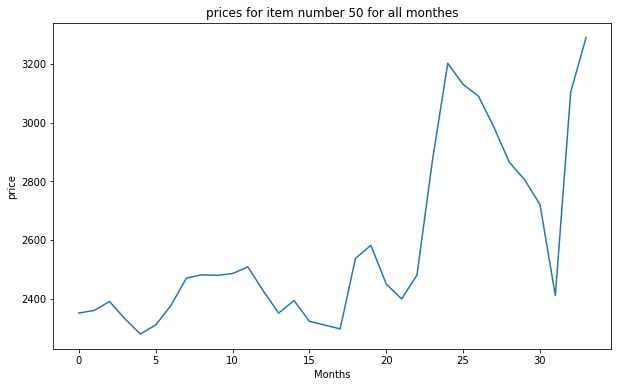

In [21]:
# All prcies for a shop
idxData = final_item_prices[50]

plt.figure(figsize=(10,6))
plt.title('prices for item number 50 for all monthes')
plt.xlabel('Months')
plt.ylabel('price')

# idxData.head()
plt.plot(idxData)
plt.show()

#  

<img src='images/img1-21-1.png'>

order((0, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 3037.8330101960514
order((0, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 698.1770557335512
order((0, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressiv

order((0, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 677.8319497260873
order((0, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 2423.452210948454
order((0, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 591.7798169798525
order((0, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((0, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 591.9014132890878
order((0, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


order((0, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 1792.9583430462687
order((0, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressiv

order((0, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 547.6357781225713
order((0, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 681.2821927081645
order((0, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((0, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 101.50627521632575
order((1, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 100.75109608697176
order((1, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((1, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 89.1980273883147
order((1, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 49.902925048946045
order((1, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 47.134320056533696
order((1, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespa

order((1, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 106.41858718204053
order((1, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 52.85779472372435
order((1, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 49.272103619713725
order((1, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationa

order((1, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 105.54409901849266
order((1, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((1, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 0)), RMSE = 69.51040069000622
order((2, 0, 0)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 0)), RMSE = 69.31569383746046
order((2, 0, 0)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertib

order((2, 0, 0)), seasonal_order((2, 0, 0)), RMSE = 40.5703864985888
order((2, 0, 0)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 0)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 0)), RMSE = 50.97951878422769
order((2, 0, 1)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((0, 0, 2)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 0)), RMSE = 47.91741093013579
order((2, 0, 1)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 1)), seasonal_order((2, 0, 0)), RMSE = 26.000428284383872
order((2, 0, 1)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 1)), seasonal_order((2, 0, 2)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 0)), RMSE = 50.95315246952663
order((2, 0, 2)), seasonal_order((0, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((0, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: Convergenc

order((2, 0, 2)), seasonal_order((1, 0, 0)), RMSE = 48.35075173702361
order((2, 0, 2)), seasonal_order((1, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((1, 0, 2)), RMSE = inf


D:\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:949: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:961: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
D:\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:981: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


order((2, 0, 2)), seasonal_order((2, 0, 0)), RMSE = 107.67018518527578
order((2, 0, 2)), seasonal_order((2, 0, 1)), RMSE = inf
order((2, 0, 2)), seasonal_order((2, 0, 2)), RMSE = inf
Best SARIMAX: order((2, 0, 1)), seasonal_order((2, 0, 0)RMSE = 26.000428284383872


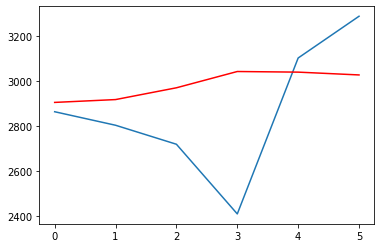

In [22]:
order, _, sarimax_order = evaluate_sarimax_models(idxData, p_values, d_values, q_values)
try:
    train, test = idxData[:len(idxData)-6], idxData[len(idxData)-6:]
    model = SARIMAX(train, order=order, seasonal_order=(*sarimax_order, 12))
    model_fit = model.fit(disp=0)

    predictions = model_fit.predict(start=len(train), end=len(train)+len(test)-1, dynamic=False)
    error = sqrt(mean_squared_error(test, predictions))

    plt.plot(test)
    plt.plot(predictions, color='red')
    plt.show()
except:
    pass

#  

<img src='images/img1-21.png'>

In [38]:
full_data = np.zeros(34)
for i in range(34):
    for prices in final_item_prices:
        full_data[i] += prices[i]

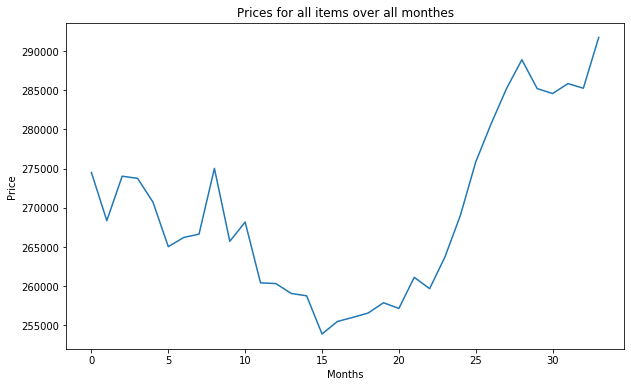

In [45]:
# All prcies for all items 
idxData = full_data

plt.figure(figsize=(10,6))
plt.title('Prices for all items over all monthes')
plt.xlabel('Months')
plt.ylabel('Price')

# idxData.head()
plt.plot(idxData)
plt.show()

<img src='images/img1-22.png'>
<img src='images/img1-22-1.png'>

#  

# TASK 3

# Let's discover some Knowledge inside this data

#  

<img src='images/img3-1.png'>

#  

<img src='images/img3-2.png'>
<img src='images/img3-3.png'>

#  

In [51]:
#test = [0,50,400,2574,12808,12770]
df_info_min = []

for itemID in Items_IDS_list:
    row = sales[sales.item_id == itemID]                                                         # step 1
    min_price = min(row.item_price)                                                              # step 2
    Shops = sales[sales.item_price == min_price][sales.item_id == itemID].shop_id                # step 3
                                                                                                 # step 4
    max_amount_for_this_item = 0
    for shop_id in Shops:
        max_amount = sales[sales.shop_id == shop_id][sales.item_id == itemID].item_cnt_day.sum() # step 4.1
        if max_amount > max_amount_for_this_item:                                                # step 4.2
            max_amount_for_this_item = max_amount
            sh_id = shop_id
    
    df_info_min.append((min_price,sh_id,max_amount_for_this_item))                               # step 5
    
    print('\n\nThe min price for item Id(' + str(itemID) + ') is: ' + str(min_price) + ' in Shop Id(' + str(sorted(list(dict.fromkeys(Shops.values)))) + ')' + ') and max amount sold is: ' + str(max_amount_for_this_item) + ' in shop id = ' + str(sh_id))

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  import sys
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # This is added back by InteractiveShellApp.init_path()




The min price for item Id(0) is: 58.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(1) is: 4490.0 in Shop Id([55])) and max amount sold is: 6.0 in shop id = 55


The min price for item Id(2) is: 58.0 in Shop Id([54])) and max amount sold is: 2.0 in shop id = 54


The min price for item Id(3) is: 58.0 in Shop Id([54])) and max amount sold is: 2.0 in shop id = 54


The min price for item Id(4) is: 58.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(5) is: 28.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(6) is: 100.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(7) is: 28.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(8) is: 58.0 in Shop Id([54])) and max amount sold is: 2.0 in shop id = 54


The min price for item Id(9) is: 58.0 in Shop Id([54])) and max amount sold i



The min price for item Id(78) is: 240.0 in Shop Id([13, 51])) and max amount sold is: 5.0 in shop id = 13


The min price for item Id(79) is: 265.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(80) is: 190.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(81) is: 185.0 in Shop Id([13])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id(82) is: 200.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(84) is: 69.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(85) is: 190.0 in Shop Id([0, 13])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id(86) is: 28.0 in Shop Id([25, 54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(87) is: 499.0 in Shop Id([4, 17, 18, 21, 22, 25, 27, 29, 30, 31, 37, 38, 39, 41, 42, 46, 54, 57])) and max amount sold is: 4.0 in s



The min price for item Id(157) is: 110.0 in Shop Id([55])) and max amount sold is: 3.0 in shop id = 55


The min price for item Id(158) is: 110.0 in Shop Id([55])) and max amount sold is: 3.0 in shop id = 55


The min price for item Id(159) is: 110.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(160) is: 110.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(161) is: 119.0 in Shop Id([55])) and max amount sold is: 3.0 in shop id = 55


The min price for item Id(162) is: 249.0 in Shop Id([46])) and max amount sold is: 1.0 in shop id = 46


The min price for item Id(163) is: 129.0 in Shop Id([55])) and max amount sold is: 2.0 in shop id = 55


The min price for item Id(164) is: 114.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(165) is: 249.0 in Shop Id([12])) and max amount sold is: 1.0 in shop id = 12


The min price for item Id(166) is: 89.0 in Shop Id([5



The min price for item Id(239) is: 80.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(240) is: 144.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(241) is: 80.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(242) is: 172.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(243) is: 250.0 in Shop Id([12, 30])) and max amount sold is: 1.0 in shop id = 30


The min price for item Id(244) is: 249.0 in Shop Id([7, 16, 28, 30])) and max amount sold is: 2.0 in shop id = 28


The min price for item Id(245) is: 100.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(246) is: 250.0 in Shop Id([6, 16, 21, 24, 25, 26, 27, 28, 30, 31, 32, 44, 54])) and max amount sold is: 7.0 in shop id = 31


The min price for item Id(247) is: 250.0 in Shop Id([19])) and max amount sold is: 1.0 in shop id 



The min price for item Id(320) is: 162.0 in Shop Id([13, 51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(321) is: 162.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(322) is: 299.0 in Shop Id([21, 27, 28, 31, 52])) and max amount sold is: 3.0 in shop id = 31


The min price for item Id(323) is: 129.0 in Shop Id([55])) and max amount sold is: 3.0 in shop id = 55


The min price for item Id(324) is: 249.0 in Shop Id([28, 31, 52])) and max amount sold is: 3.0 in shop id = 31


The min price for item Id(325) is: 75.0 in Shop Id([13, 51])) and max amount sold is: 5.0 in shop id = 51


The min price for item Id(326) is: 300.0 in Shop Id([27])) and max amount sold is: 1.0 in shop id = 27


The min price for item Id(327) is: 129.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(328) is: 249.0 in Shop Id([27])) and max amount sold is: 1.0 in shop id = 27


The min price for item



The min price for item Id(399) is: 349.0 in Shop Id([12])) and max amount sold is: 1.0 in shop id = 12


The min price for item Id(400) is: 172.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(401) is: 249.0 in Shop Id([27])) and max amount sold is: 1.0 in shop id = 27


The min price for item Id(403) is: 114.0 in Shop Id([55])) and max amount sold is: 2.0 in shop id = 55


The min price for item Id(404) is: 114.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(405) is: 249.0 in Shop Id([22, 25, 28, 31, 42])) and max amount sold is: 5.0 in shop id = 31


The min price for item Id(406) is: 250.0 in Shop Id([12, 56])) and max amount sold is: 1.0 in shop id = 56


The min price for item Id(407) is: 97.0 in Shop Id([0, 51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(408) is: 89.0 in Shop Id([10, 51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(40

The min price for item Id(483) is: 8500.0 in Shop Id([12, 30])) and max amount sold is: 5.0 in shop id = 12


The min price for item Id(484) is: 124.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 10.0 in shop id = 1


The min price for item Id(485) is: 120.0 in Shop Id([12])) and max amount sold is: 191.0 in shop id = 12


The min price for item Id(486) is: 108.9 in Shop Id([11])) and max amount sold is: 2.0 in shop id = 11


The min price for item Id(487) is: 229.0 in Shop Id([22])) and max amount sold is: 1.0 in shop id = 22


The min price for item Id(488) is: 188.0 in Shop Id([55])) and max amount sold is: 10.0 in shop id = 55


The min price for item Id(489) is: 229.0 in Shop Id([22])) and max amount sold is: 1.0 in shop id = 22


The min price for item Id(490) is: 188.0 in Shop Id([55])) and max amount sold is: 12.0 in shop id = 55


The min price for item Id(491) is: 330.86 in Shop Id([10])) and max amount sold is: 7.0 in shop id = 10


The min price for item Id(492) 



The min price for item Id(561) is: 199.0 in Shop Id([29, 48])) and max amount sold is: 1.0 in shop id = 29


The min price for item Id(562) is: 149.0 in Shop Id([6, 12, 16, 46, 57])) and max amount sold is: 1.0 in shop id = 46


The min price for item Id(563) is: 172.0 in Shop Id([55])) and max amount sold is: 36.0 in shop id = 55


The min price for item Id(564) is: 172.0 in Shop Id([55])) and max amount sold is: 23.0 in shop id = 55


The min price for item Id(565) is: 91.0 in Shop Id([1])) and max amount sold is: 2.0 in shop id = 1


The min price for item Id(567) is: 188.0 in Shop Id([55])) and max amount sold is: 5.0 in shop id = 55


The min price for item Id(568) is: 172.0 in Shop Id([55])) and max amount sold is: 3.0 in shop id = 55


The min price for item Id(569) is: 172.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(570) is: 149.0 in Shop Id([3, 7])) and max amount sold is: 1.0 in shop id = 3


The min price for item Id(571) is:



The min price for item Id(642) is: 90.0 in Shop Id([0, 1, 51])) and max amount sold is: 10.0 in shop id = 0


The min price for item Id(643) is: 172.0 in Shop Id([55])) and max amount sold is: 8.0 in shop id = 55


The min price for item Id(644) is: 172.0 in Shop Id([55])) and max amount sold is: 11.0 in shop id = 55


The min price for item Id(645) is: 199.0 in Shop Id([12])) and max amount sold is: 1.0 in shop id = 12


The min price for item Id(646) is: 188.0 in Shop Id([4])) and max amount sold is: 1.0 in shop id = 4


The min price for item Id(647) is: 188.0 in Shop Id([42])) and max amount sold is: 1.0 in shop id = 42


The min price for item Id(648) is: 149.0 in Shop Id([15])) and max amount sold is: 1.0 in shop id = 15


The min price for item Id(649) is: 172.0 in Shop Id([55])) and max amount sold is: 7.0 in shop id = 55


The min price for item Id(650) is: 172.0 in Shop Id([55])) and max amount sold is: 12.0 in shop id = 55


The min price for item Id(651) is: 90.0 in Shop 



The min price for item Id(720) is: 189.0 in Shop Id([42])) and max amount sold is: 1.0 in shop id = 42


The min price for item Id(721) is: 188.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(722) is: 188.0 in Shop Id([55])) and max amount sold is: 2.0 in shop id = 55


The min price for item Id(723) is: 188.0 in Shop Id([55])) and max amount sold is: 2.0 in shop id = 55


The min price for item Id(724) is: 188.0 in Shop Id([55])) and max amount sold is: 3.0 in shop id = 55


The min price for item Id(725) is: 188.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(726) is: 188.0 in Shop Id([55])) and max amount sold is: 4.0 in shop id = 55


The min price for item Id(727) is: 188.0 in Shop Id([55])) and max amount sold is: 4.0 in shop id = 55


The min price for item Id(728) is: 188.0 in Shop Id([55])) and max amount sold is: 2.0 in shop id = 55


The min price for item Id(729) is: 229.0 in Shop Id([



The min price for item Id(799) is: 25.0 in Shop Id([55])) and max amount sold is: 70.0 in shop id = 55


The min price for item Id(800) is: 150.0 in Shop Id([55])) and max amount sold is: 57.0 in shop id = 55


The min price for item Id(801) is: 150.0 in Shop Id([55])) and max amount sold is: 39.0 in shop id = 55


The min price for item Id(802) is: 134.0 in Shop Id([13, 51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(803) is: 25.0 in Shop Id([55])) and max amount sold is: 256.0 in shop id = 55


The min price for item Id(804) is: 145.0 in Shop Id([10, 13])) and max amount sold is: 4.0 in shop id = 10


The min price for item Id(805) is: 95.0 in Shop Id([55])) and max amount sold is: 699.0 in shop id = 55


The min price for item Id(806) is: 142.06 in Shop Id([10])) and max amount sold is: 6.0 in shop id = 10


The min price for item Id(807) is: 66.0 in Shop Id([1])) and max amount sold is: 1.0 in shop id = 1


The min price for item Id(808) is: 159.0 in



The min price for item Id(879) is: 188.0 in Shop Id([55])) and max amount sold is: 9.0 in shop id = 55


The min price for item Id(880) is: 188.0 in Shop Id([55])) and max amount sold is: 3.0 in shop id = 55


The min price for item Id(881) is: 216.0 in Shop Id([12])) and max amount sold is: 1.0 in shop id = 12


The min price for item Id(882) is: 188.0 in Shop Id([55])) and max amount sold is: 10.0 in shop id = 55


The min price for item Id(883) is: 216.0 in Shop Id([12])) and max amount sold is: 2.0 in shop id = 12


The min price for item Id(884) is: 219.0 in Shop Id([12])) and max amount sold is: 1.0 in shop id = 12


The min price for item Id(885) is: 188.0 in Shop Id([55])) and max amount sold is: 19.0 in shop id = 55


The min price for item Id(886) is: 249.0 in Shop Id([12])) and max amount sold is: 1.0 in shop id = 12


The min price for item Id(887) is: 149.0 in Shop Id([15, 22, 30, 41, 53, 57])) and max amount sold is: 2.0 in shop id = 53


The min price for item Id(888) 



The min price for item Id(956) is: 108.49 in Shop Id([7, 57])) and max amount sold is: 2.0 in shop id = 57


The min price for item Id(957) is: 98.0 in Shop Id([27])) and max amount sold is: 6.0 in shop id = 27


The min price for item Id(958) is: 198.0 in Shop Id([35, 53])) and max amount sold is: 3.0 in shop id = 53


The min price for item Id(959) is: 69.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(960) is: 270.0 in Shop Id([10, 51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(961) is: 199.0 in Shop Id([3, 6, 12, 25, 28, 31, 35, 45, 48, 50])) and max amount sold is: 14.0 in shop id = 31


The min price for item Id(962) is: 77.65 in Shop Id([51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(963) is: 28.0 in Shop Id([22, 39])) and max amount sold is: 5.0 in shop id = 22


The min price for item Id(964) is: 69.0 in Shop Id([10, 13, 51])) and max amount sold is: 2.0 in shop id = 51




The min price for item Id(1033) is: 173.52 in Shop Id([51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(1034) is: 58.0 in Shop Id([38])) and max amount sold is: 3.0 in shop id = 38


The min price for item Id(1035) is: 176.0 in Shop Id([0, 13])) and max amount sold is: 16.0 in shop id = 13


The min price for item Id(1036) is: 27.0 in Shop Id([51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(1037) is: 2344.0 in Shop Id([10, 51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(1038) is: 999.0 in Shop Id([7, 25, 27, 31, 42, 57])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(1039) is: 899.0 in Shop Id([5, 6, 7, 19, 25, 27, 30, 31, 38, 42, 45, 47, 49, 54, 56, 57, 58])) and max amount sold is: 9.0 in shop id = 25


The min price for item Id(1040) is: 999.0 in Shop Id([6, 7, 25, 27, 31, 42, 56, 57])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(1041) is: 



The min price for item Id(1182) is: 3490.0 in Shop Id([55])) and max amount sold is: 5.0 in shop id = 55


The min price for item Id(1183) is: 2094.0 in Shop Id([55])) and max amount sold is: 3.0 in shop id = 55


The min price for item Id(1185) is: 6650.0 in Shop Id([22, 30])) and max amount sold is: 2.0 in shop id = 22


The min price for item Id(1186) is: 1340.0 in Shop Id([55])) and max amount sold is: 2.0 in shop id = 55


The min price for item Id(1187) is: 1490.0 in Shop Id([6, 22, 23, 24, 25, 29, 30, 31, 41, 50, 54])) and max amount sold is: 10.0 in shop id = 24


The min price for item Id(1188) is: 2800.0 in Shop Id([55])) and max amount sold is: 2.0 in shop id = 55


The min price for item Id(1189) is: 2800.0 in Shop Id([55])) and max amount sold is: 7.0 in shop id = 55


The min price for item Id(1190) is: 3099.0 in Shop Id([22, 24, 25, 31])) and max amount sold is: 11.0 in shop id = 24


The min price for item Id(1191) is: 250.0 in Shop Id([55])) and max amount sold is: 2



The min price for item Id(1262) is: 899.0 in Shop Id([6])) and max amount sold is: 1.0 in shop id = 6


The min price for item Id(1263) is: 399.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(1264) is: 173.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(1265) is: 799.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(1266) is: 158.0 in Shop Id([12])) and max amount sold is: 1.0 in shop id = 12


The min price for item Id(1267) is: 58.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(1268) is: 198.0 in Shop Id([25, 31])) and max amount sold is: 4.0 in shop id = 25


The min price for item Id(1269) is: 148.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(1270) is: 173.0 in Shop Id([0, 13, 51])) and max amount sold is: 6.0 in shop id = 13


The min price for item Id(1271) is: 24



The min price for item Id(1337) is: 190.0 in Shop Id([10, 13, 51])) and max amount sold is: 4.0 in shop id = 10


The min price for item Id(1338) is: 198.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(1339) is: 278.6 in Shop Id([44])) and max amount sold is: 1.0 in shop id = 44


The min price for item Id(1340) is: 148.0 in Shop Id([31])) and max amount sold is: 4.0 in shop id = 31


The min price for item Id(1341) is: 349.0 in Shop Id([19, 21, 25, 31, 36, 42, 44, 46, 47, 50, 57, 59])) and max amount sold is: 3.0 in shop id = 44


The min price for item Id(1342) is: 98.0 in Shop Id([19, 31, 54])) and max amount sold is: 9.0 in shop id = 31


The min price for item Id(1343) is: 58.0 in Shop Id([54])) and max amount sold is: 2.0 in shop id = 54


The min price for item Id(1344) is: 141.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(1345) is: 6990.0 in Shop Id([22])) and max amount sold is: 1.0 in 



The min price for item Id(1415) is: 1499.0 in Shop Id([2, 12, 15, 37, 39, 42, 45, 49, 54, 56, 57])) and max amount sold is: 5.0 in shop id = 54


The min price for item Id(1416) is: 926.94 in Shop Id([10])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(1417) is: 1050.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(1418) is: 200.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 11.0 in shop id = 0


The min price for item Id(1419) is: 200.0 in Shop Id([10, 13, 51])) and max amount sold is: 10.0 in shop id = 51


The min price for item Id(1420) is: 200.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 16.0 in shop id = 51


The min price for item Id(1421) is: 28.0 in Shop Id([27])) and max amount sold is: 15.0 in shop id = 27


The min price for item Id(1422) is: 28.0 in Shop Id([6])) and max amount sold is: 1.0 in shop id = 6


The min price for item Id(1423) is: 368.0 in Shop Id([0, 10])) and max am



The min price for item Id(1486) is: 599.0 in Shop Id([42])) and max amount sold is: 29.0 in shop id = 42


The min price for item Id(1487) is: 60.0 in Shop Id([55])) and max amount sold is: 14.0 in shop id = 55


The min price for item Id(1488) is: 59.0 in Shop Id([55])) and max amount sold is: 7.0 in shop id = 55


The min price for item Id(1489) is: 29.0 in Shop Id([55])) and max amount sold is: 12.0 in shop id = 55


The min price for item Id(1490) is: 79.0 in Shop Id([55])) and max amount sold is: 13.0 in shop id = 55


The min price for item Id(1491) is: 89.0 in Shop Id([55])) and max amount sold is: 8.0 in shop id = 55


The min price for item Id(1492) is: 59.0 in Shop Id([55])) and max amount sold is: 15.0 in shop id = 55


The min price for item Id(1493) is: 59.0 in Shop Id([55])) and max amount sold is: 21.0 in shop id = 55


The min price for item Id(1494) is: 79.0 in Shop Id([55])) and max amount sold is: 40.0 in shop id = 55


The min price for item Id(1495) is: 341.36 in



The min price for item Id(1562) is: 599.0 in Shop Id([55])) and max amount sold is: 15.0 in shop id = 55


The min price for item Id(1563) is: 599.0 in Shop Id([12, 21, 25, 26, 28, 31, 45])) and max amount sold is: 50.0 in shop id = 31


The min price for item Id(1564) is: 849.0 in Shop Id([5, 19, 22])) and max amount sold is: 42.0 in shop id = 19


The min price for item Id(1565) is: 899.0 in Shop Id([14, 25, 42, 56])) and max amount sold is: 49.0 in shop id = 25


The min price for item Id(1566) is: 1999.0 in Shop Id([55])) and max amount sold is: 15.0 in shop id = 55


The min price for item Id(1567) is: 678.0 in Shop Id([55])) and max amount sold is: 57.0 in shop id = 55


The min price for item Id(1568) is: 832.84 in Shop Id([52])) and max amount sold is: 4.0 in shop id = 52


The min price for item Id(1569) is: 999.0 in Shop Id([21, 22, 25, 31])) and max amount sold is: 53.0 in shop id = 25


The min price for item Id(1570) is: 999.0 in Shop Id([3, 14, 26, 31, 34, 42])) and max



The min price for item Id(1643) is: 749.0 in Shop Id([54, 57])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(1644) is: 849.0 in Shop Id([54, 59])) and max amount sold is: 3.0 in shop id = 54


The min price for item Id(1645) is: 684.0 in Shop Id([13])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id(1646) is: 749.0 in Shop Id([22, 25])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(1647) is: 678.8 in Shop Id([42])) and max amount sold is: 1.0 in shop id = 42


The min price for item Id(1648) is: 749.0 in Shop Id([12, 18, 22, 25, 57])) and max amount sold is: 1.0 in shop id = 22


The min price for item Id(1649) is: 849.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(1650) is: 679.0 in Shop Id([42])) and max amount sold is: 3.0 in shop id = 42


The min price for item Id(1651) is: 1199.0 in Shop Id([8, 25, 27, 54])) and max amount sold is: 6.0 in shop id = 25


The 



The min price for item Id(1718) is: 148.0 in Shop Id([2, 5, 6, 18, 31])) and max amount sold is: 9.0 in shop id = 31


The min price for item Id(1719) is: 649.0 in Shop Id([7])) and max amount sold is: 1.0 in shop id = 7


The min price for item Id(1720) is: 190.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(1721) is: 1397.0 in Shop Id([12])) and max amount sold is: 2.0 in shop id = 12


The min price for item Id(1722) is: 265.0 in Shop Id([0, 10, 51])) and max amount sold is: 4.0 in shop id = 10


The min price for item Id(1723) is: 178.0 in Shop Id([10, 13, 51])) and max amount sold is: 2.0 in shop id = 13


The min price for item Id(1724) is: 699.0 in Shop Id([6, 18, 25, 28, 35, 37, 42, 44, 50, 52, 54, 56])) and max amount sold is: 3.0 in shop id = 25


The min price for item Id(1725) is: 190.0 in Shop Id([10])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(1726) is: 148.0 in Shop Id([10, 51])) and max amount sol



The min price for item Id(1792) is: 105.0 in Shop Id([55])) and max amount sold is: 25.0 in shop id = 55


The min price for item Id(1793) is: 899.0 in Shop Id([55])) and max amount sold is: 29.0 in shop id = 55


The min price for item Id(1794) is: 104.0 in Shop Id([55])) and max amount sold is: 23.0 in shop id = 55


The min price for item Id(1795) is: 698.0 in Shop Id([44])) and max amount sold is: 4.0 in shop id = 44


The min price for item Id(1796) is: 125.0 in Shop Id([55])) and max amount sold is: 3.0 in shop id = 55


The min price for item Id(1797) is: 84.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(1798) is: 104.0 in Shop Id([55])) and max amount sold is: 15.0 in shop id = 55


The min price for item Id(1799) is: 698.0 in Shop Id([52])) and max amount sold is: 1.0 in shop id = 52


The min price for item Id(1800) is: 148.0 in Shop Id([39])) and max amount sold is: 1.0 in shop id = 39


The min price for item Id(1801) is: 985.0



The min price for item Id(1859) is: 749.0 in Shop Id([2, 5, 12, 14, 21, 25, 28, 31, 35, 38, 41, 42, 47, 50, 52, 57, 59])) and max amount sold is: 13.0 in shop id = 28


The min price for item Id(1860) is: 599.0 in Shop Id([55])) and max amount sold is: 10.0 in shop id = 55


The min price for item Id(1861) is: 599.0 in Shop Id([55])) and max amount sold is: 11.0 in shop id = 55


The min price for item Id(1862) is: 599.0 in Shop Id([55])) and max amount sold is: 6.0 in shop id = 55


The min price for item Id(1863) is: 599.0 in Shop Id([55])) and max amount sold is: 6.0 in shop id = 55


The min price for item Id(1865) is: 1249.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 18, 19, 21, 22, 24, 25, 28, 31, 34, 35, 38, 39, 41, 42, 44, 45, 47, 49, 52, 53, 56, 57, 58])) and max amount sold is: 64.0 in shop id = 31


The min price for item Id(1866) is: 1249.0 in Shop Id([12, 14, 15, 19, 25, 26, 42, 47, 53, 59])) and max amount sold is: 13.0 in shop id = 42


The min price for item Id(1868) is: 



The min price for item Id(1931) is: 28.0 in Shop Id([14])) and max amount sold is: 2.0 in shop id = 14


The min price for item Id(1932) is: 657.64 in Shop Id([15])) and max amount sold is: 1.0 in shop id = 15


The min price for item Id(1933) is: 249.0 in Shop Id([6])) and max amount sold is: 1.0 in shop id = 6


The min price for item Id(1934) is: 419.0 in Shop Id([55])) and max amount sold is: 2.0 in shop id = 55


The min price for item Id(1935) is: 249.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(1936) is: 339.0 in Shop Id([55])) and max amount sold is: 23.0 in shop id = 55


The min price for item Id(1937) is: 368.0 in Shop Id([10, 13, 51])) and max amount sold is: 28.0 in shop id = 10


The min price for item Id(1938) is: 239.0 in Shop Id([55])) and max amount sold is: 39.0 in shop id = 55


The min price for item Id(1939) is: 498.0 in Shop Id([50])) and max amount sold is: 73.0 in shop id = 50


The min price for item Id(1940) is



The min price for item Id(2002) is: 29.0 in Shop Id([55])) and max amount sold is: 63.0 in shop id = 55


The min price for item Id(2003) is: 29.0 in Shop Id([55])) and max amount sold is: 94.0 in shop id = 55


The min price for item Id(2004) is: 29.0 in Shop Id([55])) and max amount sold is: 40.0 in shop id = 55


The min price for item Id(2005) is: 29.0 in Shop Id([55])) and max amount sold is: 29.0 in shop id = 55


The min price for item Id(2006) is: 29.0 in Shop Id([55])) and max amount sold is: 7.0 in shop id = 55


The min price for item Id(2007) is: 12.0 in Shop Id([55])) and max amount sold is: 51.0 in shop id = 55


The min price for item Id(2008) is: 15.0 in Shop Id([55])) and max amount sold is: 19.0 in shop id = 55


The min price for item Id(2009) is: 29.0 in Shop Id([55])) and max amount sold is: 2.0 in shop id = 55


The min price for item Id(2010) is: 15.0 in Shop Id([55])) and max amount sold is: 25.0 in shop id = 55


The min price for item Id(2011) is: 15.0 in Sh



The min price for item Id(2079) is: 248.0 in Shop Id([25, 54])) and max amount sold is: 3.0 in shop id = 25


The min price for item Id(2080) is: 229.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(2081) is: 1549.0 in Shop Id([25, 26, 28, 42, 57])) and max amount sold is: 2.0 in shop id = 42


The min price for item Id(2082) is: 173.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(2083) is: 299.0 in Shop Id([6, 23, 28, 57])) and max amount sold is: 1.0 in shop id = 23


The min price for item Id(2084) is: 110.0 in Shop Id([10, 51])) and max amount sold is: 8.0 in shop id = 51


The min price for item Id(2085) is: 398.0 in Shop Id([12, 28, 42])) and max amount sold is: 5.0 in shop id = 28


The min price for item Id(2086) is: 203.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(2087) is: 163.0 in Shop Id([12])) and max amount sold is: 1.0 in shop id = 12






The min price for item Id(2153) is: 2499.0 in Shop Id([18, 25, 31, 46])) and max amount sold is: 3.0 in shop id = 31


The min price for item Id(2154) is: 298.0 in Shop Id([57])) and max amount sold is: 1.0 in shop id = 57


The min price for item Id(2155) is: 198.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(2156) is: 1399.0 in Shop Id([6, 12, 18, 54])) and max amount sold is: 6.0 in shop id = 6


The min price for item Id(2157) is: 1099.0 in Shop Id([6, 25, 27])) and max amount sold is: 2.0 in shop id = 6


The min price for item Id(2158) is: 1548.5 in Shop Id([25])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(2159) is: 1149.0 in Shop Id([25, 37, 54])) and max amount sold is: 9.0 in shop id = 25


The min price for item Id(2160) is: 899.0 in Shop Id([6, 19, 21, 25, 27, 28, 31, 42, 50, 54, 57])) and max amount sold is: 7.0 in shop id = 6


The min price for item Id(2161) is: 1199.0 in Shop Id([6, 12, 17, 18, 2



The min price for item Id(2222) is: 98.0 in Shop Id([6, 18, 25, 28, 37, 41, 44, 54])) and max amount sold is: 6.0 in shop id = 25


The min price for item Id(2223) is: 203.0 in Shop Id([0, 10, 13])) and max amount sold is: 3.0 in shop id = 13


The min price for item Id(2224) is: 148.0 in Shop Id([13])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id(2225) is: 170.0 in Shop Id([0, 51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(2226) is: 1549.0 in Shop Id([6, 31])) and max amount sold is: 1.0 in shop id = 6


The min price for item Id(2227) is: 1299.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(2228) is: 98.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(2229) is: 1699.0 in Shop Id([6, 17, 18, 25, 27, 54])) and max amount sold is: 5.0 in shop id = 54


The min price for item Id(2230) is: 1549.0 in Shop Id([6, 31, 56])) and max amount sold is:



The min price for item Id(2297) is: 1999.0 in Shop Id([2, 6, 12, 37, 42, 47, 56])) and max amount sold is: 9.0 in shop id = 42


The min price for item Id(2298) is: 1699.0 in Shop Id([55])) and max amount sold is: 8.0 in shop id = 55


The min price for item Id(2299) is: 21.0 in Shop Id([10])) and max amount sold is: 3.0 in shop id = 10


The min price for item Id(2300) is: 21.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(2301) is: 1199.0 in Shop Id([55])) and max amount sold is: 7.0 in shop id = 55


The min price for item Id(2302) is: 1088.0 in Shop Id([0, 1, 10, 51])) and max amount sold is: 5.0 in shop id = 1


The min price for item Id(2303) is: 998.0 in Shop Id([6])) and max amount sold is: 1.0 in shop id = 6


The min price for item Id(2304) is: 1198.0 in Shop Id([14, 42])) and max amount sold is: 35.0 in shop id = 42


The min price for item Id(2305) is: 1328.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The mi



The min price for item Id(2380) is: 699.0 in Shop Id([55])) and max amount sold is: 17.0 in shop id = 55


The min price for item Id(2381) is: 50.0 in Shop Id([55])) and max amount sold is: 12.0 in shop id = 55


The min price for item Id(2382) is: 33.0 in Shop Id([55])) and max amount sold is: 5.0 in shop id = 55


The min price for item Id(2383) is: 54.0 in Shop Id([55])) and max amount sold is: 12.0 in shop id = 55


The min price for item Id(2384) is: 33.0 in Shop Id([55])) and max amount sold is: 8.0 in shop id = 55


The min price for item Id(2385) is: 50.0 in Shop Id([55])) and max amount sold is: 5.0 in shop id = 55


The min price for item Id(2386) is: 33.0 in Shop Id([55])) and max amount sold is: 5.0 in shop id = 55


The min price for item Id(2387) is: 33.0 in Shop Id([55])) and max amount sold is: 6.0 in shop id = 55


The min price for item Id(2388) is: 33.0 in Shop Id([55])) and max amount sold is: 7.0 in shop id = 55


The min price for item Id(2389) is: 199.0 in Shop



The min price for item Id(2460) is: 98.0 in Shop Id([41])) and max amount sold is: 1.0 in shop id = 41


The min price for item Id(2461) is: 259.0 in Shop Id([0, 10, 13, 51])) and max amount sold is: 4.0 in shop id = 10


The min price for item Id(2462) is: 58.0 in Shop Id([0, 13, 25, 51, 54])) and max amount sold is: 6.0 in shop id = 54


The min price for item Id(2463) is: 28.0 in Shop Id([39, 54])) and max amount sold is: 8.0 in shop id = 54


The min price for item Id(2464) is: 399.0 in Shop Id([55])) and max amount sold is: 2.0 in shop id = 55


The min price for item Id(2465) is: 249.0 in Shop Id([6, 7, 12, 28, 31, 35, 37, 38, 54, 57, 58])) and max amount sold is: 2.0 in shop id = 6


The min price for item Id(2466) is: 203.0 in Shop Id([10, 13, 51])) and max amount sold is: 2.0 in shop id = 13


The min price for item Id(2467) is: 299.0 in Shop Id([28, 56])) and max amount sold is: 1.0 in shop id = 56


The min price for item Id(2468) is: 203.0 in Shop Id([0])) and max amount 



The min price for item Id(2533) is: 248.0 in Shop Id([4, 25, 26, 27, 31, 35, 42, 54])) and max amount sold is: 10.0 in shop id = 31


The min price for item Id(2534) is: 170.0 in Shop Id([10, 13, 51])) and max amount sold is: 11.0 in shop id = 13


The min price for item Id(2535) is: 698.0 in Shop Id([57])) and max amount sold is: 2.0 in shop id = 57


The min price for item Id(2536) is: 271.0 in Shop Id([10, 13, 51])) and max amount sold is: 6.0 in shop id = 51


The min price for item Id(2537) is: 1699.0 in Shop Id([6, 17, 19, 25, 27, 28, 30, 31, 37, 50, 53, 54, 56])) and max amount sold is: 4.0 in shop id = 25


The min price for item Id(2538) is: 238.0 in Shop Id([13, 51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(2539) is: 170.0 in Shop Id([0, 51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(2540) is: 1799.0 in Shop Id([4, 6, 18, 30, 56])) and max amount sold is: 4.0 in shop id = 18


The min price for item Id(2541) is:



The min price for item Id(2606) is: 1399.0 in Shop Id([25, 54])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(2607) is: 116.07 in Shop Id([13])) and max amount sold is: 10.0 in shop id = 13


The min price for item Id(2608) is: 749.0 in Shop Id([6, 25, 28, 31, 57])) and max amount sold is: 5.0 in shop id = 25


The min price for item Id(2609) is: 1099.0 in Shop Id([5, 12, 26, 31])) and max amount sold is: 2.0 in shop id = 12


The min price for item Id(2610) is: 1798.5 in Shop Id([25])) and max amount sold is: 3.0 in shop id = 25


The min price for item Id(2611) is: 299.0 in Shop Id([6, 12, 16, 21, 24, 25, 27, 28, 30, 31, 37, 42, 44, 52, 54, 57])) and max amount sold is: 7.0 in shop id = 25


The min price for item Id(2612) is: 279.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(2613) is: 1349.0 in Shop Id([54, 57])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(2614) is: 161.0 in Shop I



The min price for item Id(2677) is: 499.5 in Shop Id([4, 6])) and max amount sold is: 1.0 in shop id = 4


The min price for item Id(2678) is: 399.6 in Shop Id([38])) and max amount sold is: 28.0 in shop id = 38


The min price for item Id(2679) is: 298.0 in Shop Id([6, 19])) and max amount sold is: 1.0 in shop id = 19


The min price for item Id(2680) is: 449.5 in Shop Id([2, 4, 15, 16, 17, 18, 19, 24, 27, 28, 29, 31, 38, 41, 42, 46, 50, 52, 54, 56, 57, 58])) and max amount sold is: 41.0 in shop id = 57


The min price for item Id(2681) is: 675.0 in Shop Id([7])) and max amount sold is: 1.0 in shop id = 7


The min price for item Id(2682) is: 749.5 in Shop Id([6, 25, 35, 38, 41, 42, 52, 54, 57, 59])) and max amount sold is: 12.0 in shop id = 25


The min price for item Id(2683) is: 1198.0 in Shop Id([31])) and max amount sold is: 1.0 in shop id = 31


The min price for item Id(2684) is: 1199.0 in Shop Id([4])) and max amount sold is: 1.0 in shop id = 4


The min price for item Id(26



The min price for item Id(2752) is: 149.0 in Shop Id([55])) and max amount sold is: 78.0 in shop id = 55


The min price for item Id(2753) is: 141.27 in Shop Id([28])) and max amount sold is: 185.0 in shop id = 28


The min price for item Id(2754) is: 499.5 in Shop Id([3, 4, 5, 6, 7, 14, 16, 17, 25, 26, 27, 29, 35, 37, 38, 41, 42, 45, 46, 49, 52, 53, 54, 56, 57, 59])) and max amount sold is: 69.0 in shop id = 25


The min price for item Id(2755) is: 499.5 in Shop Id([4, 14, 18, 19, 24, 25, 27, 30, 31, 37, 38, 41, 42, 46, 47, 52, 53, 58, 59])) and max amount sold is: 47.0 in shop id = 25


The min price for item Id(2756) is: 249.0 in Shop Id([55])) and max amount sold is: 10.0 in shop id = 55


The min price for item Id(2757) is: 140.0 in Shop Id([55])) and max amount sold is: 65.0 in shop id = 55


The min price for item Id(2758) is: 149.0 in Shop Id([55])) and max amount sold is: 21.0 in shop id = 55


The min price for item Id(2759) is: 1418.0 in Shop Id([10])) and max amount sold 



The min price for item Id(2826) is: 299.0 in Shop Id([16, 44, 45])) and max amount sold is: 1.0 in shop id = 45


The min price for item Id(2827) is: 299.0 in Shop Id([4, 6, 7, 12, 14, 15, 16, 17, 18, 19, 22, 25, 26, 29, 30, 31, 32, 35, 38, 42, 43, 44, 45, 46, 50, 52, 53, 57, 58, 59])) and max amount sold is: 28.0 in shop id = 31


The min price for item Id(2828) is: 498.0 in Shop Id([21, 29])) and max amount sold is: 1.0 in shop id = 29


The min price for item Id(2829) is: 1999.0 in Shop Id([21, 43])) and max amount sold is: 1.0 in shop id = 21


The min price for item Id(2830) is: 198.0 in Shop Id([39, 52, 57])) and max amount sold is: 16.0 in shop id = 57


The min price for item Id(2831) is: 899.0 in Shop Id([2, 3, 5, 7, 14, 15, 16, 17, 18, 21, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 39, 41, 42, 43, 45, 46, 50, 52, 53, 54, 57, 59])) and max amount sold is: 40.0 in shop id = 25


The min price for item Id(2832) is: 498.0 in Shop Id([2])) and max amount sold is: 4.0 in shop id = 2



The min price for item Id(2896) is: 472.0 in Shop Id([12, 51])) and max amount sold is: 10.0 in shop id = 12


The min price for item Id(2897) is: 472.0 in Shop Id([12, 51])) and max amount sold is: 19.0 in shop id = 12


The min price for item Id(2898) is: 472.0 in Shop Id([12])) and max amount sold is: 3.0 in shop id = 12


The min price for item Id(2899) is: 472.0 in Shop Id([12, 51])) and max amount sold is: 10.0 in shop id = 12


The min price for item Id(2900) is: 472.0 in Shop Id([10, 12, 51])) and max amount sold is: 17.0 in shop id = 12


The min price for item Id(2901) is: 318.4 in Shop Id([38])) and max amount sold is: 1.0 in shop id = 38


The min price for item Id(2902) is: 472.0 in Shop Id([12])) and max amount sold is: 2.0 in shop id = 12


The min price for item Id(2903) is: 472.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(2904) is: 472.0 in Shop Id([51])) and max amount sold is: 5.0 in shop id = 51


The min price for it



The min price for item Id(2971) is: 98.0 in Shop Id([3, 14, 18, 38, 39, 45, 50, 53, 56])) and max amount sold is: 7.0 in shop id = 18


The min price for item Id(2972) is: 198.0 in Shop Id([14, 49])) and max amount sold is: 46.0 in shop id = 14


The min price for item Id(2973) is: -1.0 in Shop Id([32])) and max amount sold is: 15.0 in shop id = 32


The min price for item Id(2974) is: 1249.0 in Shop Id([3, 7, 12, 15, 18, 19, 21, 24, 25, 28, 31, 32, 35, 38, 41, 42, 43, 45, 47, 53, 54, 57, 58, 59])) and max amount sold is: 26.0 in shop id = 42


The min price for item Id(2975) is: 1588.29 in Shop Id([10])) and max amount sold is: 3.0 in shop id = 10


The min price for item Id(2976) is: 1299.0 in Shop Id([15, 19, 36, 42])) and max amount sold is: 5.0 in shop id = 42


The min price for item Id(2977) is: 14.0 in Shop Id([2, 38, 43, 46, 47, 53])) and max amount sold is: 1.0 in shop id = 53


The min price for item Id(2978) is: 107.0 in Shop Id([55])) and max amount sold is: 20.0 in shop



The min price for item Id(3045) is: 1248.71 in Shop Id([42])) and max amount sold is: 3.0 in shop id = 42


The min price for item Id(3046) is: 398.0 in Shop Id([16])) and max amount sold is: 1.0 in shop id = 16


The min price for item Id(3047) is: 1011.0 in Shop Id([10, 51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(3048) is: 1011.0 in Shop Id([10, 12])) and max amount sold is: 4.0 in shop id = 12


The min price for item Id(3049) is: 148.0 in Shop Id([3, 4, 38])) and max amount sold is: 1.0 in shop id = 4


The min price for item Id(3050) is: 28.0 in Shop Id([5, 38])) and max amount sold is: 2.0 in shop id = 38


The min price for item Id(3051) is: 349.0 in Shop Id([55])) and max amount sold is: 4.0 in shop id = 55


The min price for item Id(3052) is: 699.0 in Shop Id([15, 25, 27, 29, 30, 31, 41, 43, 47, 50, 54, 57])) and max amount sold is: 4.0 in shop id = 25


The min price for item Id(3053) is: 698.0 in Shop Id([29])) and max amount sold is: 1.0



The min price for item Id(3120) is: 259.0 in Shop Id([0, 10, 13, 51])) and max amount sold is: 7.0 in shop id = 51


The min price for item Id(3121) is: 649.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(3122) is: 207.0 in Shop Id([13])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id(3123) is: 699.0 in Shop Id([6, 54])) and max amount sold is: 3.0 in shop id = 54


The min price for item Id(3124) is: 148.0 in Shop Id([57, 59])) and max amount sold is: 1.0 in shop id = 57


The min price for item Id(3125) is: 1599.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(3126) is: 183.0 in Shop Id([10, 51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(3127) is: 749.0 in Shop Id([6, 25, 27, 42, 54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(3128) is: 749.0 in Shop Id([6, 25, 28, 31, 54])) and max amount sold is: 2.0 in shop i



The min price for item Id(3195) is: 240.0 in Shop Id([55])) and max amount sold is: 9.0 in shop id = 55


The min price for item Id(3196) is: 629.0 in Shop Id([2, 3, 5, 12, 14, 17, 18, 21, 24, 25, 26, 27, 28, 29, 30, 31, 42, 43, 45, 46, 54, 56, 57])) and max amount sold is: 46.0 in shop id = 28


The min price for item Id(3197) is: 49.0 in Shop Id([50])) and max amount sold is: 5.0 in shop id = 50


The min price for item Id(3198) is: 28.0 in Shop Id([3, 6, 7, 15, 16, 26])) and max amount sold is: 2.0 in shop id = 15


The min price for item Id(3199) is: 149.0 in Shop Id([3, 7, 22, 54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(3200) is: 95.0 in Shop Id([0, 1, 10])) and max amount sold is: 2.0 in shop id = 0


The min price for item Id(3201) is: 58.0 in Shop Id([47])) and max amount sold is: 1.0 in shop id = 47


The min price for item Id(3202) is: 58.0 in Shop Id([18, 24, 26, 47])) and max amount sold is: 1.0 in shop id = 24


The min price for item Id



The min price for item Id(3270) is: 649.0 in Shop Id([6, 12, 25, 28, 54])) and max amount sold is: 2.0 in shop id = 54


The min price for item Id(3274) is: 208.51 in Shop Id([10])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(3275) is: 148.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(3276) is: 28.0 in Shop Id([15, 21])) and max amount sold is: 1.0 in shop id = 21


The min price for item Id(3277) is: 190.0 in Shop Id([11, 51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(3278) is: 1699.0 in Shop Id([18, 24, 25, 37, 54])) and max amount sold is: 3.0 in shop id = 54


The min price for item Id(3279) is: 180.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(3280) is: 190.0 in Shop Id([0, 10, 13, 51])) and max amount sold is: 6.0 in shop id = 51


The min price for item Id(3281) is: 148.0 in Shop Id([18])) and max amount sold is: 3.0 in shop id = 



The min price for item Id(3342) is: 1249.0 in Shop Id([2, 3, 7, 12, 14, 16, 19, 21, 24, 25, 26, 28, 31, 34, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 57, 58])) and max amount sold is: 301.0 in shop id = 25


The min price for item Id(3343) is: 749.0 in Shop Id([2, 3, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 28, 31, 34, 35, 37, 38, 39, 41, 42, 45, 46, 47, 48, 49, 50, 52, 53, 56, 57, 58, 59])) and max amount sold is: 294.0 in shop id = 28


The min price for item Id(3344) is: 1249.0 in Shop Id([3, 6, 12, 14, 16, 19, 25, 26, 28, 31, 34, 35, 38, 42, 44, 46, 47, 48, 50, 56, 58])) and max amount sold is: 36.0 in shop id = 42


The min price for item Id(3345) is: 1999.0 in Shop Id([26, 29, 57])) and max amount sold is: 7.0 in shop id = 29


The min price for item Id(3346) is: 1499.0 in Shop Id([41])) and max amount sold is: 4.0 in shop id = 41


The min price for item Id(3347) is: 749.5 in Shop Id([28])) and max amount sold is: 8.0 in shop id = 28


The min pri



The min price for item Id(3413) is: 39.0 in Shop Id([55])) and max amount sold is: 8.0 in shop id = 55


The min price for item Id(3414) is: 99.0 in Shop Id([55])) and max amount sold is: 3.0 in shop id = 55


The min price for item Id(3415) is: 99.0 in Shop Id([55])) and max amount sold is: 3.0 in shop id = 55


The min price for item Id(3416) is: 99.0 in Shop Id([55])) and max amount sold is: 5.0 in shop id = 55


The min price for item Id(3417) is: 245.54 in Shop Id([51])) and max amount sold is: 8.0 in shop id = 51


The min price for item Id(3418) is: 193.0 in Shop Id([55])) and max amount sold is: 93.0 in shop id = 55


The min price for item Id(3419) is: 149.0 in Shop Id([44])) and max amount sold is: 1.0 in shop id = 44


The min price for item Id(3420) is: 149.0 in Shop Id([55])) and max amount sold is: 34.0 in shop id = 55


The min price for item Id(3421) is: 349.5 in Shop Id([2, 59])) and max amount sold is: 4.0 in shop id = 59


The min price for item Id(3422) is: 299.0 



The min price for item Id(3485) is: 998.5 in Shop Id([35])) and max amount sold is: 4.0 in shop id = 35


The min price for item Id(3486) is: 1830.1 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(3487) is: 1519.0 in Shop Id([19, 26, 31])) and max amount sold is: 1.0 in shop id = 26


The min price for item Id(3488) is: 1155.0 in Shop Id([12])) and max amount sold is: 2.0 in shop id = 12


The min price for item Id(3489) is: 1155.0 in Shop Id([10, 13, 51])) and max amount sold is: 3.0 in shop id = 10


The min price for item Id(3490) is: 29.0 in Shop Id([50])) and max amount sold is: 1.0 in shop id = 50


The min price for item Id(3491) is: 283.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(3492) is: 599.0 in Shop Id([26])) and max amount sold is: 1.0 in shop id = 26


The min price for item Id(3493) is: 1398.0 in Shop Id([43])) and max amount sold is: 1.0 in shop id = 43


The min price for item I



The min price for item Id(3563) is: 28.0 in Shop Id([21, 28])) and max amount sold is: 1.0 in shop id = 28


The min price for item Id(3564) is: 58.0 in Shop Id([2])) and max amount sold is: 1.0 in shop id = 2


The min price for item Id(3565) is: 499.5 in Shop Id([4, 6, 14, 25, 27, 28, 37, 46, 47, 53, 54, 56])) and max amount sold is: 19.0 in shop id = 28


The min price for item Id(3566) is: 306.79 in Shop Id([6])) and max amount sold is: 5.0 in shop id = 6


The min price for item Id(3567) is: 1175.0 in Shop Id([55])) and max amount sold is: 4.0 in shop id = 55


The min price for item Id(3568) is: 1675.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(3569) is: 198.0 in Shop Id([6, 25, 31, 41, 54])) and max amount sold is: 6.0 in shop id = 25


The min price for item Id(3570) is: 0.5 in Shop Id([31])) and max amount sold is: 7.0 in shop id = 31


The min price for item Id(3572) is: 727.35 in Shop Id([10])) and max amount sold is: 1.0 in s



The min price for item Id(3643) is: 148.0 in Shop Id([31])) and max amount sold is: 1.0 in shop id = 31


The min price for item Id(3644) is: 298.0 in Shop Id([59])) and max amount sold is: 1.0 in shop id = 59


The min price for item Id(3645) is: 998.0 in Shop Id([57])) and max amount sold is: 1.0 in shop id = 57


The min price for item Id(3646) is: 58.0 in Shop Id([59])) and max amount sold is: 1.0 in shop id = 59


The min price for item Id(3647) is: 148.0 in Shop Id([6, 25, 28, 31, 54, 56])) and max amount sold is: 13.0 in shop id = 31


The min price for item Id(3648) is: 58.0 in Shop Id([31])) and max amount sold is: 1.0 in shop id = 31


The min price for item Id(3649) is: 148.0 in Shop Id([57])) and max amount sold is: 1.0 in shop id = 57


The min price for item Id(3650) is: 498.0 in Shop Id([25])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(3651) is: 110.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 7.0 in shop id = 51


The min pric



The min price for item Id(3715) is: 87.0 in Shop Id([55])) and max amount sold is: 268.0 in shop id = 55


The min price for item Id(3716) is: 1198.0 in Shop Id([12, 25, 27, 28, 31, 35, 42, 49, 53, 54, 57, 58])) and max amount sold is: 19.0 in shop id = 31


The min price for item Id(3717) is: 1166.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(3718) is: 206.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 10.0 in shop id = 0


The min price for item Id(3719) is: 368.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 66.0 in shop id = 51


The min price for item Id(3720) is: 279.0 in Shop Id([55])) and max amount sold is: 33.0 in shop id = 55


The min price for item Id(3721) is: 559.0 in Shop Id([55])) and max amount sold is: 54.0 in shop id = 55


The min price for item Id(3722) is: 2799.0 in Shop Id([55])) and max amount sold is: 11.0 in shop id = 55


The min price for item Id(3723) is: 99.0 in Shop Id([55])) and max am



The min price for item Id(3790) is: 599.0 in Shop Id([6, 14, 16, 25, 28, 31, 44, 50, 54])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(3791) is: 1010.0 in Shop Id([12])) and max amount sold is: 1.0 in shop id = 12


The min price for item Id(3792) is: 1399.0 in Shop Id([5, 6, 25, 27, 28, 42, 54])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(3793) is: 1248.0 in Shop Id([18, 25])) and max amount sold is: 6.0 in shop id = 25


The min price for item Id(3794) is: 1499.0 in Shop Id([6, 18, 25, 54])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(3795) is: 1399.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(3796) is: 1649.0 in Shop Id([54])) and max amount sold is: 3.0 in shop id = 54


The min price for item Id(3797) is: 1649.0 in Shop Id([57])) and max amount sold is: 1.0 in shop id = 57


The min price for item Id(3798) is: 899.0 in Shop Id([18, 25, 27, 54])) and



The min price for item Id(3863) is: 25.0 in Shop Id([55])) and max amount sold is: 88.0 in shop id = 55


The min price for item Id(3864) is: 25.0 in Shop Id([55])) and max amount sold is: 10.0 in shop id = 55


The min price for item Id(3865) is: 98.0 in Shop Id([2])) and max amount sold is: 1.0 in shop id = 2


The min price for item Id(3866) is: 794.15 in Shop Id([51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(3868) is: 686.74 in Shop Id([51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(3869) is: 767.0 in Shop Id([10, 13, 51])) and max amount sold is: 9.0 in shop id = 10


The min price for item Id(3870) is: 126.0 in Shop Id([10, 51])) and max amount sold is: 24.0 in shop id = 51


The min price for item Id(3871) is: 702.74 in Shop Id([10])) and max amount sold is: 5.0 in shop id = 10


The min price for item Id(3872) is: 449.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(3873)



The min price for item Id(3940) is: 449.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(3941) is: 124.0 in Shop Id([4, 14, 18, 21, 22, 24, 26, 44, 59])) and max amount sold is: 8.0 in shop id = 44


The min price for item Id(3942) is: 199.0 in Shop Id([42, 43, 49])) and max amount sold is: 6.0 in shop id = 42


The min price for item Id(3943) is: 692.0 in Shop Id([10])) and max amount sold is: 4.0 in shop id = 10


The min price for item Id(3944) is: 1308.0 in Shop Id([10, 13, 51])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(3945) is: 999.0 in Shop Id([2, 3, 4, 6, 7, 12, 15, 16, 18, 19, 21, 25, 28, 31, 35, 37, 38, 39, 42, 46, 47, 49, 50, 53, 56, 58])) and max amount sold is: 12.0 in shop id = 31


The min price for item Id(3946) is: 104.0 in Shop Id([10, 51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(3947) is: 263.0 in Shop Id([0])) and max amount sold is: 3.0 in shop id = 0


The 



The min price for item Id(4012) is: 299.0 in Shop Id([6])) and max amount sold is: 1.0 in shop id = 6


The min price for item Id(4013) is: 161.0 in Shop Id([0, 13, 51])) and max amount sold is: 5.0 in shop id = 13


The min price for item Id(4014) is: 998.0 in Shop Id([6, 14, 18])) and max amount sold is: 4.0 in shop id = 18


The min price for item Id(4015) is: 161.0 in Shop Id([13, 51])) and max amount sold is: 2.0 in shop id = 13


The min price for item Id(4016) is: 1316.0 in Shop Id([6])) and max amount sold is: 1.0 in shop id = 6


The min price for item Id(4017) is: 1549.0 in Shop Id([17, 18, 25, 52, 54])) and max amount sold is: 1.0 in shop id = 52


The min price for item Id(4018) is: 649.0 in Shop Id([6])) and max amount sold is: 1.0 in shop id = 6


The min price for item Id(4019) is: 279.0 in Shop Id([31])) and max amount sold is: 4.0 in shop id = 31


The min price for item Id(4020) is: 1449.0 in Shop Id([6, 17, 25, 28, 30, 54, 56, 57])) and max amount sold is: 3.0 in s



The min price for item Id(4086) is: 249.0 in Shop Id([3, 4, 5, 6, 7, 16, 17, 19, 21, 25, 26, 27, 28, 35, 37, 44, 46, 53, 54, 56, 58, 59])) and max amount sold is: 5.0 in shop id = 28


The min price for item Id(4087) is: 1599.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(4088) is: 1549.0 in Shop Id([18, 19, 25, 31, 42])) and max amount sold is: 3.0 in shop id = 25


The min price for item Id(4089) is: 999.0 in Shop Id([25, 57])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(4090) is: 1549.0 in Shop Id([25, 56])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(4091) is: 828.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(4092) is: 190.0 in Shop Id([0, 1, 10, 51])) and max amount sold is: 7.0 in shop id = 10


The min price for item Id(4093) is: 899.0 in Shop Id([6, 8, 12, 18, 25, 50, 54])) and max amount sold is: 8.0 in shop id = 25


The min pric



The min price for item Id(4164) is: 449.0 in Shop Id([6, 28])) and max amount sold is: 114.0 in shop id = 6


The min price for item Id(4165) is: 799.2 in Shop Id([12])) and max amount sold is: 3.0 in shop id = 12


The min price for item Id(4166) is: 2652.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(4167) is: 1856.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(4168) is: 960.0 in Shop Id([55])) and max amount sold is: 38.0 in shop id = 55


The min price for item Id(4169) is: 960.0 in Shop Id([55])) and max amount sold is: 120.0 in shop id = 55


The min price for item Id(4170) is: 1490.0 in Shop Id([55])) and max amount sold is: 14.0 in shop id = 55


The min price for item Id(4171) is: 1040.0 in Shop Id([55])) and max amount sold is: 42.0 in shop id = 55


The min price for item Id(4172) is: 1990.0 in Shop Id([55])) and max amount sold is: 3.0 in shop id = 55


The min price for item Id(4173) is



The min price for item Id(4240) is: 374.75 in Shop Id([2, 19])) and max amount sold is: 48.0 in shop id = 2


The min price for item Id(4241) is: 304.66 in Shop Id([57])) and max amount sold is: 59.0 in shop id = 57


The min price for item Id(4242) is: 299.74 in Shop Id([54])) and max amount sold is: 13.0 in shop id = 54


The min price for item Id(4243) is: 1398.0 in Shop Id([22])) and max amount sold is: 1.0 in shop id = 22


The min price for item Id(4244) is: 272.48 in Shop Id([46, 48])) and max amount sold is: 77.0 in shop id = 46


The min price for item Id(4245) is: 499.5 in Shop Id([2, 3, 4, 6, 7, 14, 15, 16, 18, 19, 21, 24, 25, 26, 27, 28, 29, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59])) and max amount sold is: 36.0 in shop id = 28


The min price for item Id(4246) is: 799.5 in Shop Id([4, 7])) and max amount sold is: 2.0 in shop id = 7


The min price for item Id(4247) is: 999.5 in Shop Id([2, 4, 5, 6, 7, 16, 18, 21, 24, 25, 26, 27, 28,



The min price for item Id(4311) is: 6499.0 in Shop Id([6, 14, 15, 25, 27, 31, 42, 54, 57])) and max amount sold is: 2.0 in shop id = 14


The min price for item Id(4312) is: 1699.0 in Shop Id([6, 25])) and max amount sold is: 7.0 in shop id = 25


The min price for item Id(4313) is: 299.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(4314) is: 1699.0 in Shop Id([6])) and max amount sold is: 3.0 in shop id = 6


The min price for item Id(4315) is: 1949.0 in Shop Id([6])) and max amount sold is: 2.0 in shop id = 6


The min price for item Id(4316) is: 1699.0 in Shop Id([25])) and max amount sold is: 4.0 in shop id = 25


The min price for item Id(4317) is: 148.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(4319) is: 599.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(4320) is: 549.0 in Shop Id([2, 6, 12, 18, 19, 22, 25, 28, 38, 42, 54])) and max amount so



The min price for item Id(4386) is: 599.0 in Shop Id([55])) and max amount sold is: 115.0 in shop id = 55


The min price for item Id(4387) is: 1957.74 in Shop Id([10])) and max amount sold is: 3.0 in shop id = 10


The min price for item Id(4388) is: 2519.0 in Shop Id([10, 51])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(4389) is: 2110.4 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(4390) is: 2848.85 in Shop Id([35])) and max amount sold is: 1.0 in shop id = 35


The min price for item Id(4391) is: 187.91 in Shop Id([13])) and max amount sold is: 3.0 in shop id = 13


The min price for item Id(4392) is: 125.0 in Shop Id([55])) and max amount sold is: 245.0 in shop id = 55


The min price for item Id(4393) is: 698.0 in Shop Id([12, 15, 42])) and max amount sold is: 5.0 in shop id = 42


The min price for item Id(4394) is: 1286.81 in Shop Id([13])) and max amount sold is: 2.0 in shop id = 13


The min price for i



The min price for item Id(4462) is: 399.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(4463) is: 50.0 in Shop Id([55])) and max amount sold is: 9.0 in shop id = 55


The min price for item Id(4464) is: 299.5 in Shop Id([3, 4, 6, 14, 18, 19, 21, 25, 27, 28, 29, 30, 31, 35, 37, 41, 42, 47, 50, 52, 54])) and max amount sold is: 19.0 in shop id = 27


The min price for item Id(4465) is: 188.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(4466) is: 932.0 in Shop Id([48, 59])) and max amount sold is: 8.0 in shop id = 48


The min price for item Id(4467) is: 932.0 in Shop Id([42, 48])) and max amount sold is: 7.0 in shop id = 48


The min price for item Id(4468) is: 599.0 in Shop Id([43])) and max amount sold is: 1.0 in shop id = 43


The min price for item Id(4469) is: 699.0 in Shop Id([18])) and max amount sold is: 1.0 in shop id = 18


The min price for item Id(4470) is: 599.0 in Shop Id([12, 19, 26, 35,



The min price for item Id(4532) is: 675.0 in Shop Id([16, 18, 19, 26, 31, 35, 38, 46, 50, 52, 54])) and max amount sold is: 3.0 in shop id = 31


The min price for item Id(4533) is: 1648.5 in Shop Id([29])) and max amount sold is: 1.0 in shop id = 29


The min price for item Id(4534) is: 730.0 in Shop Id([10])) and max amount sold is: 3.0 in shop id = 10


The min price for item Id(4535) is: 1390.0 in Shop Id([12, 24, 31, 47, 57])) and max amount sold is: 5.0 in shop id = 31


The min price for item Id(4536) is: 883.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(4537) is: 830.0 in Shop Id([0, 10, 51])) and max amount sold is: 6.0 in shop id = 10


The min price for item Id(4538) is: 990.0 in Shop Id([24])) and max amount sold is: 17.0 in shop id = 24


The min price for item Id(4539) is: 1690.0 in Shop Id([24, 57])) and max amount sold is: 2.0 in shop id = 57


The min price for item Id(4540) is: 1690.0 in Shop Id([16, 24, 57])) and max am



The min price for item Id(4610) is: 179.0 in Shop Id([0, 10, 13, 51])) and max amount sold is: 8.0 in shop id = 10


The min price for item Id(4611) is: 839.4 in Shop Id([22])) and max amount sold is: 1.0 in shop id = 22


The min price for item Id(4612) is: 1098.0 in Shop Id([6, 16, 18, 25, 28, 31, 37, 44, 52, 54])) and max amount sold is: 6.0 in shop id = 25


The min price for item Id(4613) is: 1049.0 in Shop Id([6, 18, 25, 27, 54])) and max amount sold is: 2.0 in shop id = 18


The min price for item Id(4614) is: 259.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(4615) is: 282.0 in Shop Id([10, 13, 51])) and max amount sold is: 7.0 in shop id = 51


The min price for item Id(4616) is: 3249.0 in Shop Id([17, 25, 28, 37, 54])) and max amount sold is: 7.0 in shop id = 54


The min price for item Id(4617) is: 248.0 in Shop Id([15, 27])) and max amount sold is: 2.0 in shop id = 27


The min price for item Id(4618) is: 1299.0 in Shop Id([18, 3



The min price for item Id(4685) is: 1999.0 in Shop Id([6, 25, 28, 54])) and max amount sold is: 2.0 in shop id = 6


The min price for item Id(4686) is: 170.0 in Shop Id([10, 13, 51])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(4687) is: 1004.0 in Shop Id([0, 1])) and max amount sold is: 2.0 in shop id = 0


The min price for item Id(4688) is: 952.0 in Shop Id([32])) and max amount sold is: 5.0 in shop id = 32


The min price for item Id(4689) is: 1004.0 in Shop Id([10, 51])) and max amount sold is: 12.0 in shop id = 10


The min price for item Id(4690) is: 469.0 in Shop Id([0, 1])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(4691) is: 469.0 in Shop Id([0, 1, 10, 51])) and max amount sold is: 4.0 in shop id = 10


The min price for item Id(4692) is: 469.0 in Shop Id([10])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(4693) is: 1799.0 in Shop Id([6, 17, 19, 25, 27, 30, 50])) and max amount sold is: 2.0 



The min price for item Id(4760) is: 35.0 in Shop Id([55])) and max amount sold is: 14.0 in shop id = 55


The min price for item Id(4761) is: 35.0 in Shop Id([55])) and max amount sold is: 22.0 in shop id = 55


The min price for item Id(4762) is: 35.0 in Shop Id([55])) and max amount sold is: 14.0 in shop id = 55


The min price for item Id(4763) is: 25.0 in Shop Id([55])) and max amount sold is: 13.0 in shop id = 55


The min price for item Id(4764) is: 95.0 in Shop Id([55])) and max amount sold is: 79.0 in shop id = 55


The min price for item Id(4765) is: 99.0 in Shop Id([55])) and max amount sold is: 47.0 in shop id = 55


The min price for item Id(4766) is: 99.0 in Shop Id([55])) and max amount sold is: 38.0 in shop id = 55


The min price for item Id(4767) is: 195.0 in Shop Id([55])) and max amount sold is: 11.0 in shop id = 55


The min price for item Id(4768) is: 21.83 in Shop Id([53])) and max amount sold is: 1.0 in shop id = 53


The min price for item Id(4769) is: 82.94 i



The min price for item Id(4831) is: 499.0 in Shop Id([2, 4, 6, 7, 12, 14, 16, 18, 21, 22, 23, 25, 27, 28, 29, 30, 31, 32, 35, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 56, 57, 58, 59])) and max amount sold is: 27.0 in shop id = 31


The min price for item Id(4832) is: 498.0 in Shop Id([5, 59])) and max amount sold is: 2.0 in shop id = 59


The min price for item Id(4833) is: 1371.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(4834) is: 471.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(4835) is: 698.0 in Shop Id([25])) and max amount sold is: 39.0 in shop id = 25


The min price for item Id(4836) is: 1637.0 in Shop Id([10, 13, 51])) and max amount sold is: 7.0 in shop id = 51


The min price for item Id(4837) is: 298.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 25, 27, 28, 31, 34, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 56, 57, 58, 59])) and max amount sold



The min price for item Id(4907) is: 1136.0 in Shop Id([0, 1, 10, 12, 13, 51])) and max amount sold is: 36.0 in shop id = 0


The min price for item Id(4908) is: 675.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 18, 19, 21, 23, 25, 27, 31, 35, 38, 41, 45, 46, 47, 50, 52, 53, 54, 57, 58, 59])) and max amount sold is: 50.0 in shop id = 18


The min price for item Id(4909) is: 716.0 in Shop Id([1])) and max amount sold is: 1.0 in shop id = 1


The min price for item Id(4910) is: 299.5 in Shop Id([3, 4, 6, 7, 8, 14, 15, 16, 18, 19, 21, 23, 25, 26, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 59])) and max amount sold is: 60.0 in shop id = 31


The min price for item Id(4911) is: 729.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(4912) is: 199.0 in Shop Id([55])) and max amount sold is: 96.0 in shop id = 55


The min price for item Id(4913) is: 27.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for 



The min price for item Id(4979) is: 170.0 in Shop Id([10, 51])) and max amount sold is: 6.0 in shop id = 51


The min price for item Id(4980) is: 272.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(4981) is: 1079.0 in Shop Id([22])) and max amount sold is: 1.0 in shop id = 22


The min price for item Id(4982) is: 170.0 in Shop Id([1, 13, 51])) and max amount sold is: 2.0 in shop id = 13


The min price for item Id(4983) is: 2999.0 in Shop Id([6, 18, 25, 47, 53])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(4984) is: 170.0 in Shop Id([10, 13, 51])) and max amount sold is: 6.0 in shop id = 13


The min price for item Id(4985) is: 399.0 in Shop Id([37, 54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(4986) is: 1598.0 in Shop Id([38])) and max amount sold is: 1.0 in shop id = 38


The min price for item Id(4987) is: 98.0 in Shop Id([21])) and max amount sold is: 1.0 in shop id = 21


The 



The min price for item Id(5047) is: 1549.0 in Shop Id([18, 25, 27, 28, 31])) and max amount sold is: 2.0 in shop id = 28


The min price for item Id(5048) is: 190.0 in Shop Id([0, 13])) and max amount sold is: 2.0 in shop id = 13


The min price for item Id(5049) is: 1515.0 in Shop Id([12])) and max amount sold is: 1.0 in shop id = 12


The min price for item Id(5050) is: 298.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(5051) is: 180.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(5052) is: 345.0 in Shop Id([1])) and max amount sold is: 1.0 in shop id = 1


The min price for item Id(5053) is: 1815.0 in Shop Id([12])) and max amount sold is: 1.0 in shop id = 12


The min price for item Id(5054) is: 28.0 in Shop Id([53])) and max amount sold is: 5.0 in shop id = 53


The min price for item Id(5055) is: 148.0 in Shop Id([6, 19, 25, 28, 31])) and max amount sold is: 13.0 in shop id = 31


The min pri



The min price for item Id(5125) is: 824.0 in Shop Id([27, 38])) and max amount sold is: 13.0 in shop id = 27


The min price for item Id(5126) is: 260.0 in Shop Id([12])) and max amount sold is: 2.0 in shop id = 12


The min price for item Id(5127) is: 399.0 in Shop Id([25, 31])) and max amount sold is: 6.0 in shop id = 25


The min price for item Id(5128) is: 359.2 in Shop Id([25])) and max amount sold is: 48.0 in shop id = 25


The min price for item Id(5129) is: 349.0 in Shop Id([12, 25, 26, 27, 28, 31, 32, 35, 42, 47, 50, 54])) and max amount sold is: 15.0 in shop id = 25


The min price for item Id(5130) is: 559.0 in Shop Id([12, 25, 27, 28, 31, 42, 54, 57])) and max amount sold is: 10.0 in shop id = 25


The min price for item Id(5131) is: 349.0 in Shop Id([21, 25, 28, 31, 54])) and max amount sold is: 10.0 in shop id = 25


The min price for item Id(5132) is: 399.0 in Shop Id([5, 6, 12, 16, 25, 27, 28, 31, 32, 38, 42, 43, 47, 50, 54, 57])) and max amount sold is: 15.0 in shop 



The min price for item Id(5201) is: 2599.0 in Shop Id([50])) and max amount sold is: 1.0 in shop id = 50


The min price for item Id(5202) is: 298.0 in Shop Id([26, 46])) and max amount sold is: 3.0 in shop id = 46


The min price for item Id(5203) is: 799.0 in Shop Id([55])) and max amount sold is: 14.0 in shop id = 55


The min price for item Id(5204) is: 1211.0 in Shop Id([51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(5205) is: 1598.5 in Shop Id([38])) and max amount sold is: 1.0 in shop id = 38


The min price for item Id(5206) is: 1598.0 in Shop Id([2, 45])) and max amount sold is: 1.0 in shop id = 45


The min price for item Id(5207) is: 1998.0 in Shop Id([7, 41])) and max amount sold is: 2.0 in shop id = 41


The min price for item Id(5208) is: 998.0 in Shop Id([4, 22, 35, 45, 50])) and max amount sold is: 39.0 in shop id = 50


The min price for item Id(5209) is: 1825.0 in Shop Id([10, 51])) and max amount sold is: 2.0 in shop id = 51


The min



The min price for item Id(5266) is: 28.0 in Shop Id([21, 22, 24, 25, 26, 31])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(5267) is: 398.0 in Shop Id([31])) and max amount sold is: 1.0 in shop id = 31


The min price for item Id(5270) is: 399.5 in Shop Id([3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 37, 38, 41, 42, 43, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59])) and max amount sold is: 54.0 in shop id = 28


The min price for item Id(5271) is: 399.5 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 17, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 35, 38, 39, 40, 42, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 59])) and max amount sold is: 53.0 in shop id = 28


The min price for item Id(5272) is: 143.56 in Shop Id([13])) and max amount sold is: 29.0 in shop id = 13


The min price for item Id(5273) is: 399.5 in Shop Id([2, 3, 14, 18, 31, 42, 52, 54])) and max amount sold is: 77.0 in shop id = 54


The min price for item Id(5



The min price for item Id(5339) is: 899.0 in Shop Id([6, 12, 17, 18, 22, 25, 27, 28, 30, 39, 41, 54, 56, 57])) and max amount sold is: 7.0 in shop id = 25


The min price for item Id(5340) is: 183.0 in Shop Id([1, 13])) and max amount sold is: 7.0 in shop id = 13


The min price for item Id(5341) is: 696.0 in Shop Id([12])) and max amount sold is: 4.0 in shop id = 12


The min price for item Id(5342) is: 1549.0 in Shop Id([6, 16, 25, 28, 31])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(5343) is: 173.0 in Shop Id([0, 13])) and max amount sold is: 10.0 in shop id = 13


The min price for item Id(5344) is: 180.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(5345) is: 299.0 in Shop Id([42])) and max amount sold is: 1.0 in shop id = 42


The min price for item Id(5346) is: 173.0 in Shop Id([0, 51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(5347) is: 649.0 in Shop Id([28, 47])) and max a



The min price for item Id(5413) is: 699.0 in Shop Id([42, 50, 54])) and max amount sold is: 1.0 in shop id = 42


The min price for item Id(5414) is: 1199.0 in Shop Id([12, 22, 24, 41, 43])) and max amount sold is: 2.0 in shop id = 24


The min price for item Id(5415) is: 899.0 in Shop Id([14, 22, 45])) and max amount sold is: 2.0 in shop id = 22


The min price for item Id(5416) is: 70.0 in Shop Id([13])) and max amount sold is: 4.0 in shop id = 13


The min price for item Id(5417) is: 2750.0 in Shop Id([25, 31])) and max amount sold is: 5.0 in shop id = 25


The min price for item Id(5418) is: 1815.0 in Shop Id([25, 31])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(5419) is: 1980.0 in Shop Id([25, 31])) and max amount sold is: 7.0 in shop id = 31


The min price for item Id(5420) is: 3730.0 in Shop Id([25, 31])) and max amount sold is: 2.0 in shop id = 31


The min price for item Id(5421) is: 1485.0 in Shop Id([25, 31])) and max amount sold is: 4.0 in sh



The min price for item Id(5487) is: 849.0 in Shop Id([6, 14, 16, 18, 19, 24, 25, 27, 28, 30, 31, 37, 54, 57])) and max amount sold is: 5.0 in shop id = 25


The min price for item Id(5488) is: 2050.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(5489) is: 1600.0 in Shop Id([10])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(5490) is: 830.0 in Shop Id([10])) and max amount sold is: 6.0 in shop id = 10


The min price for item Id(5491) is: 299.0 in Shop Id([12, 24, 25, 30, 54, 57])) and max amount sold is: 3.0 in shop id = 54


The min price for item Id(5492) is: 849.0 in Shop Id([16, 18, 24, 25, 27, 57])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(5493) is: 949.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(5494) is: 1599.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(5495) is: 849.0 in Shop Id([6,



The min price for item Id(5564) is: 3500.0 in Shop Id([55])) and max amount sold is: 6.0 in shop id = 55


The min price for item Id(5565) is: 3333.0 in Shop Id([55])) and max amount sold is: 3.0 in shop id = 55


The min price for item Id(5566) is: 1500.0 in Shop Id([22])) and max amount sold is: 1.0 in shop id = 22


The min price for item Id(5567) is: 3600.0 in Shop Id([15])) and max amount sold is: 1.0 in shop id = 15


The min price for item Id(5568) is: 17000.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(5570) is: 93.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(5571) is: 391.0 in Shop Id([10, 51])) and max amount sold is: 3.0 in shop id = 10


The min price for item Id(5572) is: 1300.0 in Shop Id([12])) and max amount sold is: 30.0 in shop id = 12


The min price for item Id(5573) is: 248.0 in Shop Id([39])) and max amount sold is: 2.0 in shop id = 39


The min price for item Id(5574) is:



The min price for item Id(5642) is: 1974.0 in Shop Id([51])) and max amount sold is: 9.0 in shop id = 51


The min price for item Id(5643) is: 1712.52 in Shop Id([51])) and max amount sold is: 41.0 in shop id = 51


The min price for item Id(5644) is: 298.0 in Shop Id([12])) and max amount sold is: 1.0 in shop id = 12


The min price for item Id(5645) is: 498.0 in Shop Id([2, 5, 6, 7, 25, 28, 31, 50, 54])) and max amount sold is: 4.0 in shop id = 31


The min price for item Id(5646) is: 298.0 in Shop Id([17])) and max amount sold is: 1.0 in shop id = 17


The min price for item Id(5647) is: 498.0 in Shop Id([15, 41, 50])) and max amount sold is: 2.0 in shop id = 41


The min price for item Id(5648) is: 9990.0 in Shop Id([37, 42, 43])) and max amount sold is: 1.0 in shop id = 42


The min price for item Id(5649) is: 398.0 in Shop Id([41])) and max amount sold is: 1.0 in shop id = 41


The min price for item Id(5650) is: 5990.0 in Shop Id([5, 12, 19])) and max amount sold is: 3.0 in sh



The min price for item Id(5718) is: 699.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(5719) is: 876.0 in Shop Id([55])) and max amount sold is: 3.0 in shop id = 55


The min price for item Id(5720) is: 1250.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(5723) is: 99.0 in Shop Id([55])) and max amount sold is: 16.0 in shop id = 55


The min price for item Id(5724) is: 890.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(5725) is: 490.0 in Shop Id([55])) and max amount sold is: 2.0 in shop id = 55


The min price for item Id(5726) is: 990.0 in Shop Id([55])) and max amount sold is: 4.0 in shop id = 55


The min price for item Id(5727) is: 390.0 in Shop Id([55])) and max amount sold is: 4.0 in shop id = 55


The min price for item Id(5728) is: 390.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(5729) is: 590.0 i



The min price for item Id(5795) is: 125.0 in Shop Id([0, 51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(5796) is: 125.0 in Shop Id([51])) and max amount sold is: 5.0 in shop id = 51


The min price for item Id(5797) is: 125.0 in Shop Id([0, 51])) and max amount sold is: 16.0 in shop id = 51


The min price for item Id(5798) is: 28.0 in Shop Id([31])) and max amount sold is: 11.0 in shop id = 31


The min price for item Id(5799) is: 125.0 in Shop Id([0, 51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(5800) is: 125.0 in Shop Id([51])) and max amount sold is: 7.0 in shop id = 51


The min price for item Id(5801) is: 58.0 in Shop Id([52])) and max amount sold is: 1.0 in shop id = 52


The min price for item Id(5802) is: 28.0 in Shop Id([31])) and max amount sold is: 10.0 in shop id = 31


The min price for item Id(5803) is: 58.0 in Shop Id([15, 25])) and max amount sold is: 5.0 in shop id = 25


The min price for item Id(5804) 



The min price for item Id(5874) is: 998.0 in Shop Id([42])) and max amount sold is: 1.0 in shop id = 42


The min price for item Id(5875) is: 698.0 in Shop Id([27])) and max amount sold is: 2.0 in shop id = 27


The min price for item Id(5876) is: 1998.0 in Shop Id([31])) and max amount sold is: 3.0 in shop id = 31


The min price for item Id(5877) is: 498.0 in Shop Id([25])) and max amount sold is: 3.0 in shop id = 25


The min price for item Id(5878) is: 3090.0 in Shop Id([44])) and max amount sold is: 1.0 in shop id = 44


The min price for item Id(5879) is: 3290.0 in Shop Id([26, 31, 37])) and max amount sold is: 1.0 in shop id = 31


The min price for item Id(5880) is: 249.0 in Shop Id([55])) and max amount sold is: 5.0 in shop id = 55


The min price for item Id(5881) is: 998.7 in Shop Id([31])) and max amount sold is: 8.0 in shop id = 31


The min price for item Id(5882) is: 249.0 in Shop Id([55])) and max amount sold is: 5.0 in shop id = 55


The min price for item Id(5883) i



The min price for item Id(5945) is: 190.0 in Shop Id([0, 10, 13, 51])) and max amount sold is: 8.0 in shop id = 13


The min price for item Id(5946) is: 190.0 in Shop Id([0, 1, 10, 11, 13, 51])) and max amount sold is: 14.0 in shop id = 13


The min price for item Id(5947) is: 279.0 in Shop Id([25, 54])) and max amount sold is: 3.0 in shop id = 54


The min price for item Id(5948) is: 242.0 in Shop Id([0, 10, 13])) and max amount sold is: 2.0 in shop id = 13


The min price for item Id(5949) is: 299.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(5950) is: 2199.0 in Shop Id([6])) and max amount sold is: 1.0 in shop id = 6


The min price for item Id(5951) is: 2549.0 in Shop Id([31, 48])) and max amount sold is: 1.0 in shop id = 48


The min price for item Id(5952) is: 1399.0 in Shop Id([12, 27, 28])) and max amount sold is: 8.0 in shop id = 28


The min price for item Id(5953) is: 1849.0 in Shop Id([25, 31])) and max amount sold is: 2.0 in 



The min price for item Id(6023) is: 176.49 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(6024) is: 599.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(6025) is: 1049.0 in Shop Id([6, 25])) and max amount sold is: 6.0 in shop id = 25


The min price for item Id(6026) is: 1499.0 in Shop Id([6, 17, 18, 25, 27, 28, 54])) and max amount sold is: 9.0 in shop id = 25


The min price for item Id(6027) is: 183.0 in Shop Id([0, 13])) and max amount sold is: 3.0 in shop id = 13


The min price for item Id(6028) is: 1099.0 in Shop Id([18, 54])) and max amount sold is: 10.0 in shop id = 54


The min price for item Id(6029) is: 399.0 in Shop Id([31])) and max amount sold is: 2.0 in shop id = 31


The min price for item Id(6030) is: 349.0 in Shop Id([25, 31, 54])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(6031) is: 183.0 in Shop Id([0, 13])) and max amount sold is: 2.0 in shop id = 



The min price for item Id(6093) is: 126.0 in Shop Id([10, 13, 51])) and max amount sold is: 17.0 in shop id = 51


The min price for item Id(6094) is: 498.0 in Shop Id([16, 22, 29, 44])) and max amount sold is: 1.0 in shop id = 29


The min price for item Id(6095) is: 298.0 in Shop Id([44, 50])) and max amount sold is: 14.0 in shop id = 50


The min price for item Id(6096) is: 1598.0 in Shop Id([32])) and max amount sold is: 1.0 in shop id = 32


The min price for item Id(6097) is: 399.0 in Shop Id([55])) and max amount sold is: 15.0 in shop id = 55


The min price for item Id(6098) is: 1523.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(6099) is: 948.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(6100) is: 299.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(6101) is: 899.0 in Shop Id([3, 56])) and max amount sold is: 1.0 in shop id = 56


The min price 



The min price for item Id(6171) is: 2249.0 in Shop Id([3, 12, 21, 25, 39, 42, 46, 52, 53])) and max amount sold is: 6.0 in shop id = 42


The min price for item Id(6172) is: 799.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(6173) is: 125.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(6174) is: 28.0 in Shop Id([37])) and max amount sold is: 1.0 in shop id = 37


The min price for item Id(6175) is: 67.0 in Shop Id([55])) and max amount sold is: 38.0 in shop id = 55


The min price for item Id(6176) is: 777.0 in Shop Id([55])) and max amount sold is: 2.0 in shop id = 55


The min price for item Id(6177) is: 148.0 in Shop Id([44])) and max amount sold is: 1.0 in shop id = 44


The min price for item Id(6178) is: 28.0 in Shop Id([38, 45])) and max amount sold is: 1.0 in shop id = 38


The min price for item Id(6179) is: 58.0 in Shop Id([35])) and max amount sold is: 1.0 in shop id = 35


The min pri



The min price for item Id(6242) is: 649.0 in Shop Id([6, 14, 16, 18, 25, 27, 28, 37, 50, 54])) and max amount sold is: 3.0 in shop id = 54


The min price for item Id(6243) is: 190.0 in Shop Id([10, 51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(6244) is: 799.0 in Shop Id([16, 18, 19, 22, 25, 28, 42, 46, 50, 54, 57])) and max amount sold is: 3.0 in shop id = 50


The min price for item Id(6245) is: 899.0 in Shop Id([25, 52, 54])) and max amount sold is: 3.0 in shop id = 25


The min price for item Id(6246) is: 649.0 in Shop Id([6, 12, 16, 25, 28, 37, 54, 57])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(6247) is: 299.0 in Shop Id([10, 13, 51])) and max amount sold is: 12.0 in shop id = 51


The min price for item Id(6248) is: 1149.0 in Shop Id([41])) and max amount sold is: 1.0 in shop id = 41


The min price for item Id(6249) is: 2449.0 in Shop Id([6, 12, 17, 25, 27, 28, 42, 54, 56, 57])) and max amount sold is: 7.0 in shop 



The min price for item Id(6313) is: 98.0 in Shop Id([6, 14, 19, 28, 31, 42, 54])) and max amount sold is: 8.0 in shop id = 31


The min price for item Id(6314) is: 98.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(6315) is: 118.0 in Shop Id([13])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id(6316) is: 232.23 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(6317) is: 28.0 in Shop Id([2, 42, 44])) and max amount sold is: 3.0 in shop id = 42


The min price for item Id(6318) is: 136.0 in Shop Id([0, 51])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(6319) is: 190.0 in Shop Id([13, 51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(6320) is: 899.0 in Shop Id([7, 12, 18, 28, 42, 50, 57])) and max amount sold is: 1.0 in shop id = 18


The min price for item Id(6321) is: 219.0 in Shop Id([0])) and max amount sold is: 2.0 in sho



The min price for item Id(6385) is: 125.0 in Shop Id([55])) and max amount sold is: 11.0 in shop id = 55


The min price for item Id(6386) is: 248.0 in Shop Id([15])) and max amount sold is: 12.0 in shop id = 15


The min price for item Id(6387) is: 1398.0 in Shop Id([3, 28])) and max amount sold is: 3.0 in shop id = 28


The min price for item Id(6388) is: 488.0 in Shop Id([10])) and max amount sold is: 4.0 in shop id = 10


The min price for item Id(6389) is: 477.0 in Shop Id([10, 13, 51])) and max amount sold is: 6.0 in shop id = 10


The min price for item Id(6390) is: 239.0 in Shop Id([24])) and max amount sold is: 20.0 in shop id = 24


The min price for item Id(6391) is: 488.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(6392) is: 699.0 in Shop Id([55])) and max amount sold is: 6.0 in shop id = 55


The min price for item Id(6393) is: 248.0 in Shop Id([16, 24, 31])) and max amount sold is: 19.0 in shop id = 31


The min price for it



The min price for item Id(6463) is: 149.0 in Shop Id([55])) and max amount sold is: 11.0 in shop id = 55


The min price for item Id(6464) is: 115.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(6465) is: 28.0 in Shop Id([21])) and max amount sold is: 1.0 in shop id = 21


The min price for item Id(6466) is: 279.4 in Shop Id([22])) and max amount sold is: 40.0 in shop id = 22


The min price for item Id(6467) is: 98.0 in Shop Id([18])) and max amount sold is: 15.0 in shop id = 18


The min price for item Id(6468) is: 28.0 in Shop Id([37])) and max amount sold is: 19.0 in shop id = 37


The min price for item Id(6469) is: 799.0 in Shop Id([18])) and max amount sold is: 1.0 in shop id = 18


The min price for item Id(6470) is: 235.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(6471) is: 249.5 in Shop Id([39, 58])) and max amount sold is: 37.0 in shop id = 58


The min price for item Id(6472) is: 249.



The min price for item Id(6541) is: 599.0 in Shop Id([4, 12, 16, 47])) and max amount sold is: 4.0 in shop id = 12


The min price for item Id(6542) is: 599.0 in Shop Id([5, 37, 49])) and max amount sold is: 2.0 in shop id = 49


The min price for item Id(6543) is: 599.0 in Shop Id([12, 16, 17, 18, 38, 49])) and max amount sold is: 5.0 in shop id = 16


The min price for item Id(6544) is: 599.0 in Shop Id([16, 26, 35, 49])) and max amount sold is: 7.0 in shop id = 35


The min price for item Id(6545) is: 599.0 in Shop Id([5])) and max amount sold is: 1.0 in shop id = 5


The min price for item Id(6546) is: 599.0 in Shop Id([4, 7, 12, 18, 27, 49])) and max amount sold is: 16.0 in shop id = 27


The min price for item Id(6547) is: 599.0 in Shop Id([7, 21, 49])) and max amount sold is: 4.0 in shop id = 49


The min price for item Id(6548) is: 399.0 in Shop Id([12, 21, 27, 47, 49])) and max amount sold is: 3.0 in shop id = 27


The min price for item Id(6549) is: 399.0 in Shop Id([12, 17



The min price for item Id(6613) is: 1155.0 in Shop Id([10, 51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(6614) is: 2999.0 in Shop Id([45, 50, 57])) and max amount sold is: 1.0 in shop id = 50


The min price for item Id(6615) is: 751.36 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(6616) is: 698.0 in Shop Id([22, 27, 28, 31, 39, 47, 54])) and max amount sold is: 26.0 in shop id = 31


The min price for item Id(6617) is: 698.0 in Shop Id([27, 42, 57, 58])) and max amount sold is: 4.0 in shop id = 58


The min price for item Id(6618) is: 198.0 in Shop Id([16, 24, 38, 46])) and max amount sold is: 12.0 in shop id = 38


The min price for item Id(6619) is: 1398.0 in Shop Id([21, 25])) and max amount sold is: 13.0 in shop id = 25


The min price for item Id(6620) is: 1398.0 in Shop Id([36, 42, 57])) and max amount sold is: 2.0 in shop id = 42


The min price for item Id(6621) is: 539.0 in Shop Id([38])) and max am



The min price for item Id(6686) is: 599.0 in Shop Id([55])) and max amount sold is: 21.0 in shop id = 55


The min price for item Id(6687) is: 99.5 in Shop Id([25])) and max amount sold is: 152.0 in shop id = 25


The min price for item Id(6688) is: 299.0 in Shop Id([55])) and max amount sold is: 39.0 in shop id = 55


The min price for item Id(6689) is: 599.0 in Shop Id([52])) and max amount sold is: 8.0 in shop id = 52


The min price for item Id(6690) is: 623.5 in Shop Id([35, 46, 48])) and max amount sold is: 10.0 in shop id = 35


The min price for item Id(6691) is: 1539.0 in Shop Id([2, 14, 21, 25, 26, 30, 31, 35, 37, 54])) and max amount sold is: 20.0 in shop id = 25


The min price for item Id(6692) is: 1500.0 in Shop Id([25, 28, 47])) and max amount sold is: 7.0 in shop id = 25


The min price for item Id(6693) is: 1500.0 in Shop Id([25])) and max amount sold is: 5.0 in shop id = 25


The min price for item Id(6694) is: 599.5 in Shop Id([14, 28, 37, 45, 52, 58, 59])) and max



The min price for item Id(6767) is: 499.0 in Shop Id([55])) and max amount sold is: 7.0 in shop id = 55


The min price for item Id(6768) is: 1399.0 in Shop Id([42])) and max amount sold is: 46.0 in shop id = 42


The min price for item Id(6769) is: 119.0 in Shop Id([55])) and max amount sold is: 4.0 in shop id = 55


The min price for item Id(6770) is: 98.0 in Shop Id([22])) and max amount sold is: 1.0 in shop id = 22


The min price for item Id(6771) is: 58.0 in Shop Id([50])) and max amount sold is: 4.0 in shop id = 50


The min price for item Id(6772) is: 22.0 in Shop Id([22])) and max amount sold is: 1.0 in shop id = 22


The min price for item Id(6773) is: 248.0 in Shop Id([2])) and max amount sold is: 1.0 in shop id = 2


The min price for item Id(6774) is: 698.0 in Shop Id([2])) and max amount sold is: 1.0 in shop id = 2


The min price for item Id(6775) is: 498.0 in Shop Id([14])) and max amount sold is: 1.0 in shop id = 14


The min price for item Id(6776) is: 149.0 in Shop



The min price for item Id(6837) is: 1349.0 in Shop Id([6, 17, 19, 25, 27, 28, 46, 54])) and max amount sold is: 7.0 in shop id = 25


The min price for item Id(6838) is: 899.0 in Shop Id([4, 6, 17, 18, 22, 25, 27, 28, 37, 42, 43, 45, 47, 54, 56, 57])) and max amount sold is: 18.0 in shop id = 25


The min price for item Id(6839) is: 549.0 in Shop Id([18, 25, 27])) and max amount sold is: 3.0 in shop id = 25


The min price for item Id(6840) is: 799.0 in Shop Id([6, 14, 16, 54])) and max amount sold is: 2.0 in shop id = 6


The min price for item Id(6841) is: 1199.0 in Shop Id([6, 17, 25, 27, 28, 30, 54, 56, 57])) and max amount sold is: 9.0 in shop id = 25


The min price for item Id(6842) is: 599.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(6843) is: 749.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(6844) is: 699.0 in Shop Id([6, 22])) and max amount sold is: 1.0 in shop id = 6


The min pri



The min price for item Id(6915) is: 499.5 in Shop Id([3, 4, 6, 7, 14, 15, 17, 18, 21, 26, 27, 28, 29, 31, 35, 41, 42, 43, 45, 46, 47, 50, 54, 57, 59])) and max amount sold is: 9.0 in shop id = 31


The min price for item Id(6916) is: 748.7 in Shop Id([2])) and max amount sold is: 22.0 in shop id = 2


The min price for item Id(6917) is: 748.9 in Shop Id([16])) and max amount sold is: 10.0 in shop id = 16


The min price for item Id(6918) is: 999.0 in Shop Id([57])) and max amount sold is: 1.0 in shop id = 57


The min price for item Id(6919) is: 299.5 in Shop Id([2, 4, 7, 8, 15, 18, 19, 26, 27, 28, 29, 32, 35, 38, 41, 43, 45, 46, 47, 50, 56, 59])) and max amount sold is: 12.0 in shop id = 18


The min price for item Id(6920) is: 249.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(6921) is: 1598.0 in Shop Id([22])) and max amount sold is: 1.0 in shop id = 22


The min price for item Id(6922) is: 248.0 in Shop Id([22])) and max amount sold is



The min price for item Id(6992) is: 399.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(6993) is: 2198.5 in Shop Id([15])) and max amount sold is: 1.0 in shop id = 15


The min price for item Id(6994) is: 2999.0 in Shop Id([5, 6, 7, 15, 18, 21, 25, 27, 28, 29, 31, 38, 42, 45, 46])) and max amount sold is: 5.0 in shop id = 25


The min price for item Id(6995) is: 2998.5 in Shop Id([47])) and max amount sold is: 2.0 in shop id = 47


The min price for item Id(6997) is: 142.0 in Shop Id([55])) and max amount sold is: 33.0 in shop id = 55


The min price for item Id(6998) is: 126.0 in Shop Id([10, 13, 51])) and max amount sold is: 7.0 in shop id = 51


The min price for item Id(6999) is: 149.0 in Shop Id([55])) and max amount sold is: 20.0 in shop id = 55


The min price for item Id(7000) is: 150.0 in Shop Id([30, 37])) and max amount sold is: 3.0 in shop id = 37


The min price for item Id(7001) is: 999.0 in Shop Id([2, 7, 12, 14, 16, 17, 25, 



The min price for item Id(7065) is: 473.0 in Shop Id([10, 51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(7066) is: 283.0 in Shop Id([10, 51])) and max amount sold is: 5.0 in shop id = 51


The min price for item Id(7067) is: 998.5 in Shop Id([2, 38])) and max amount sold is: 2.0 in shop id = 2


The min price for item Id(7068) is: 498.7 in Shop Id([24, 28, 43])) and max amount sold is: 72.0 in shop id = 43


The min price for item Id(7069) is: 118.0 in Shop Id([22])) and max amount sold is: 1.0 in shop id = 22


The min price for item Id(7070) is: 288.63 in Shop Id([51])) and max amount sold is: 46.0 in shop id = 51


The min price for item Id(7071) is: 704.03 in Shop Id([10])) and max amount sold is: 9.0 in shop id = 10


The min price for item Id(7072) is: 758.0 in Shop Id([10, 11, 51])) and max amount sold is: 7.0 in shop id = 10


The min price for item Id(7073) is: 4499.0 in Shop Id([2, 6, 7, 12, 14, 15, 18, 21, 22, 25, 26, 27, 29, 30, 31, 32, 35, 



The min price for item Id(7139) is: 999.0 in Shop Id([4, 6, 19, 26, 38, 56])) and max amount sold is: 2.0 in shop id = 4


The min price for item Id(7140) is: 399.0 in Shop Id([55])) and max amount sold is: 3.0 in shop id = 55


The min price for item Id(7141) is: 499.0 in Shop Id([5, 6, 7, 12, 15, 18, 25, 26, 29, 30, 31, 41, 42, 46, 47, 50, 54, 58, 59])) and max amount sold is: 3.0 in shop id = 31


The min price for item Id(7142) is: 1598.0 in Shop Id([25, 42])) and max amount sold is: 6.0 in shop id = 42


The min price for item Id(7143) is: 559.0 in Shop Id([55])) and max amount sold is: 3.0 in shop id = 55


The min price for item Id(7144) is: 299.0 in Shop Id([55])) and max amount sold is: 3.0 in shop id = 55


The min price for item Id(7145) is: 599.0 in Shop Id([55])) and max amount sold is: 4.0 in shop id = 55


The min price for item Id(7146) is: 2299.0 in Shop Id([16, 18, 25, 26, 27, 28, 35, 38, 47, 57])) and max amount sold is: 2.0 in shop id = 25


The min price for item



The min price for item Id(7211) is: 148.0 in Shop Id([2, 5, 6, 7, 12, 14, 15, 18, 19, 21, 24, 25, 26, 27, 28, 31, 35, 37, 38, 39, 44, 45, 46, 47, 53, 57, 59])) and max amount sold is: 20.0 in shop id = 31


The min price for item Id(7212) is: 698.0 in Shop Id([2, 5, 6, 7, 12, 15, 18, 19, 22, 25, 26, 27, 28, 31, 39, 41, 42, 46, 47, 50, 54])) and max amount sold is: 8.0 in shop id = 25


The min price for item Id(7213) is: 614.06 in Shop Id([51])) and max amount sold is: 16.0 in shop id = 51


The min price for item Id(7214) is: 283.0 in Shop Id([10])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(7215) is: 614.06 in Shop Id([51])) and max amount sold is: 22.0 in shop id = 51


The min price for item Id(7216) is: 899.0 in Shop Id([46, 50])) and max amount sold is: 2.0 in shop id = 50


The min price for item Id(7217) is: 1597.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(7218) is: 1308.0 in Shop Id([0, 1, 10, 51])) a



The min price for item Id(7284) is: 1299.0 in Shop Id([12, 19])) and max amount sold is: 2.0 in shop id = 12


The min price for item Id(7285) is: 698.0 in Shop Id([54])) and max amount sold is: 0 in shop id = 12


The min price for item Id(7286) is: 299.0 in Shop Id([5, 6, 14, 18, 19, 21, 24, 25, 26, 27, 28, 31, 35, 42, 44, 46, 47, 49])) and max amount sold is: 5.0 in shop id = 18


The min price for item Id(7287) is: 259.0 in Shop Id([13, 51])) and max amount sold is: 2.0 in shop id = 13


The min price for item Id(7288) is: 282.0 in Shop Id([10, 13, 51])) and max amount sold is: 10.0 in shop id = 13


The min price for item Id(7289) is: 172.27 in Shop Id([13])) and max amount sold is: 23.0 in shop id = 13


The min price for item Id(7290) is: 148.0 in Shop Id([44, 54])) and max amount sold is: 11.0 in shop id = 54


The min price for item Id(7291) is: 399.0 in Shop Id([31])) and max amount sold is: 1.0 in shop id = 31


The min price for item Id(7292) is: 399.0 in Shop Id([27, 31]



The min price for item Id(7357) is: 299.0 in Shop Id([14, 54])) and max amount sold is: 1.0 in shop id = 14


The min price for item Id(7358) is: 203.0 in Shop Id([13, 51])) and max amount sold is: 8.0 in shop id = 13


The min price for item Id(7359) is: 125.0 in Shop Id([10, 51])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(7360) is: 98.0 in Shop Id([31])) and max amount sold is: 7.0 in shop id = 31


The min price for item Id(7361) is: 299.0 in Shop Id([56])) and max amount sold is: 1.0 in shop id = 56


The min price for item Id(7362) is: 999.0 in Shop Id([14, 42])) and max amount sold is: 1.0 in shop id = 14


The min price for item Id(7363) is: 230.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(7364) is: 246.0 in Shop Id([0, 13, 51])) and max amount sold is: 2.0 in shop id = 0


The min price for item Id(7365) is: 285.0 in Shop Id([13])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id



The min price for item Id(7430) is: 246.0 in Shop Id([13, 51])) and max amount sold is: 6.0 in shop id = 13


The min price for item Id(7431) is: 203.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(7432) is: 203.0 in Shop Id([10, 13])) and max amount sold is: 3.0 in shop id = 13


The min price for item Id(7433) is: 205.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(7434) is: 398.0 in Shop Id([31, 50])) and max amount sold is: 2.0 in shop id = 50


The min price for item Id(7435) is: 105.0 in Shop Id([10, 51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(7436) is: 148.0 in Shop Id([25, 28, 31])) and max amount sold is: 20.0 in shop id = 31


The min price for item Id(7437) is: 298.0 in Shop Id([31, 54, 57])) and max amount sold is: 4.0 in shop id = 31


The min price for item Id(7438) is: 27.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price 



The min price for item Id(7503) is: 285.0 in Shop Id([13, 51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(7504) is: 93.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(7505) is: 299.0 in Shop Id([21, 31, 42, 52, 56, 57])) and max amount sold is: 7.0 in shop id = 31


The min price for item Id(7506) is: 98.0 in Shop Id([31, 42, 54, 57])) and max amount sold is: 6.0 in shop id = 31


The min price for item Id(7507) is: 110.0 in Shop Id([0, 10, 13, 51])) and max amount sold is: 21.0 in shop id = 13


The min price for item Id(7508) is: 110.0 in Shop Id([0, 13, 51])) and max amount sold is: 8.0 in shop id = 13


The min price for item Id(7509) is: 349.0 in Shop Id([50])) and max amount sold is: 1.0 in shop id = 50


The min price for item Id(7510) is: 110.0 in Shop Id([0, 13, 51])) and max amount sold is: 3.0 in shop id = 0


The min price for item Id(7511) is: 173.0 in Shop Id([0, 1, 51])) and max amount sold is: 3



The min price for item Id(7579) is: 2940.0 in Shop Id([25])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(7580) is: 1890.0 in Shop Id([25])) and max amount sold is: 3.0 in shop id = 25


The min price for item Id(7581) is: 2360.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(7582) is: 1871.0 in Shop Id([25])) and max amount sold is: 3.0 in shop id = 25


The min price for item Id(7583) is: 1890.0 in Shop Id([15])) and max amount sold is: 1.0 in shop id = 15


The min price for item Id(7584) is: 1890.0 in Shop Id([15])) and max amount sold is: 1.0 in shop id = 15


The min price for item Id(7585) is: 2025.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(7586) is: 379.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(7587) is: 1660.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(7588) is: 



The min price for item Id(7660) is: 399.0 in Shop Id([3, 6, 14, 16, 18, 21, 25, 28, 31, 42, 44, 50, 54, 56])) and max amount sold is: 7.0 in shop id = 54


The min price for item Id(7661) is: 28.0 in Shop Id([53])) and max amount sold is: 2.0 in shop id = 53


The min price for item Id(7662) is: 298.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(7663) is: 58.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(7664) is: 649.0 in Shop Id([28, 56])) and max amount sold is: 1.0 in shop id = 28


The min price for item Id(7665) is: 1499.0 in Shop Id([56])) and max amount sold is: 1.0 in shop id = 56


The min price for item Id(7666) is: 749.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(7667) is: 6900.0 in Shop Id([55])) and max amount sold is: 21.0 in shop id = 55


The min price for item Id(7668) is: 7900.0 in Shop Id([4, 6, 12, 22, 24, 31, 48])) and max amou



The min price for item Id(7740) is: 299.0 in Shop Id([55])) and max amount sold is: 8.0 in shop id = 55


The min price for item Id(7741) is: 248.0 in Shop Id([59])) and max amount sold is: 7.0 in shop id = 59


The min price for item Id(7742) is: 449.0 in Shop Id([55])) and max amount sold is: 10.0 in shop id = 55


The min price for item Id(7743) is: 199.0 in Shop Id([55])) and max amount sold is: 6.0 in shop id = 55


The min price for item Id(7744) is: 249.0 in Shop Id([4, 6, 7, 14, 18, 25, 27, 28, 32, 38, 42, 43, 45, 46, 50, 53, 54, 56])) and max amount sold is: 14.0 in shop id = 25


The min price for item Id(7745) is: 98.0 in Shop Id([22])) and max amount sold is: 1.0 in shop id = 22


The min price for item Id(7746) is: 75.0 in Shop Id([55])) and max amount sold is: 37.0 in shop id = 55


The min price for item Id(7747) is: 75.0 in Shop Id([55])) and max amount sold is: 23.0 in shop id = 55


The min price for item Id(7748) is: 112.0 in Shop Id([55])) and max amount sold is: 



The min price for item Id(7817) is: 11900.0 in Shop Id([55])) and max amount sold is: 10.0 in shop id = 55


The min price for item Id(7818) is: 13490.0 in Shop Id([35, 37, 57])) and max amount sold is: 1.0 in shop id = 35


The min price for item Id(7819) is: 8090.0 in Shop Id([31])) and max amount sold is: 8.0 in shop id = 31


The min price for item Id(7820) is: 993.0 in Shop Id([54])) and max amount sold is: 47.0 in shop id = 54


The min price for item Id(7821) is: 7191.0 in Shop Id([57])) and max amount sold is: 10.0 in shop id = 57


The min price for item Id(7822) is: 6990.0 in Shop Id([55])) and max amount sold is: 13.0 in shop id = 55


The min price for item Id(7823) is: 3490.0 in Shop Id([42, 45])) and max amount sold is: 1.0 in shop id = 45


The min price for item Id(7824) is: 1990.0 in Shop Id([12])) and max amount sold is: 2.0 in shop id = 12


The min price for item Id(7825) is: 158.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for ite



The min price for item Id(7891) is: 1095.0 in Shop Id([35, 45])) and max amount sold is: 3.0 in shop id = 35


The min price for item Id(7892) is: 1495.0 in Shop Id([18])) and max amount sold is: 5.0 in shop id = 18


The min price for item Id(7893) is: 895.0 in Shop Id([4, 5, 17, 18, 19, 21, 22, 24, 26, 27, 30, 31, 35, 37, 38, 41, 42, 43, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59])) and max amount sold is: 310.0 in shop id = 27


The min price for item Id(7894) is: 745.0 in Shop Id([2, 4, 17, 19, 28, 35, 38, 42, 50, 53, 54, 57])) and max amount sold is: 303.0 in shop id = 28


The min price for item Id(7895) is: 449.2 in Shop Id([31])) and max amount sold is: 131.0 in shop id = 31


The min price for item Id(7896) is: 9990.0 in Shop Id([12, 22, 25])) and max amount sold is: 1.0 in shop id = 22


The min price for item Id(7897) is: 5990.0 in Shop Id([12])) and max amount sold is: 2.0 in shop id = 12


The min price for item Id(7898) is: 399.0 in Shop Id([55])) and max amount sold is



The min price for item Id(7965) is: 1344.0 in Shop Id([12, 51])) and max amount sold is: 5.0 in shop id = 51


The min price for item Id(7966) is: 1599.0 in Shop Id([55])) and max amount sold is: 1307.0 in shop id = 55


The min price for item Id(7967) is: 664.0 in Shop Id([55])) and max amount sold is: 2365.0 in shop id = 55


The min price for item Id(7968) is: 898.0 in Shop Id([2, 4, 5, 6, 7, 12, 18, 24, 31])) and max amount sold is: 15.0 in shop id = 18


The min price for item Id(7969) is: 1000.0 in Shop Id([55])) and max amount sold is: 70.0 in shop id = 55


The min price for item Id(7970) is: 1398.0 in Shop Id([5, 7])) and max amount sold is: 4.0 in shop id = 7


The min price for item Id(7971) is: 2000.0 in Shop Id([55])) and max amount sold is: 38.0 in shop id = 55


The min price for item Id(7972) is: 1748.7 in Shop Id([22, 25, 28, 31, 42, 43])) and max amount sold is: 22.0 in shop id = 28


The min price for item Id(7973) is: 500.0 in Shop Id([55])) and max amount sold is



The min price for item Id(8039) is: 1199.0 in Shop Id([55])) and max amount sold is: 5.0 in shop id = 55


The min price for item Id(8040) is: 75.0 in Shop Id([55])) and max amount sold is: 5.0 in shop id = 55


The min price for item Id(8041) is: 248.0 in Shop Id([5, 49])) and max amount sold is: 4.0 in shop id = 49


The min price for item Id(8042) is: 148.0 in Shop Id([49])) and max amount sold is: 3.0 in shop id = 49


The min price for item Id(8043) is: 849.5 in Shop Id([3, 6, 7, 16, 26, 27, 28, 31, 37, 38, 41, 42, 47, 53, 54, 57, 58, 59])) and max amount sold is: 56.0 in shop id = 27


The min price for item Id(8044) is: 999.5 in Shop Id([14, 18, 25, 27, 28, 31, 35, 38, 56])) and max amount sold is: 12.0 in shop id = 35


The min price for item Id(8045) is: 28.0 in Shop Id([54])) and max amount sold is: 4.0 in shop id = 54


The min price for item Id(8046) is: 58.0 in Shop Id([14])) and max amount sold is: 1.0 in shop id = 14


The min price for item Id(8047) is: 225.0 in Shop 



The min price for item Id(8112) is: 2999.0 in Shop Id([6, 7, 12, 17, 22, 25, 26, 27, 28, 30, 39, 42, 44, 50, 53, 54, 57, 59])) and max amount sold is: 10.0 in shop id = 12


The min price for item Id(8113) is: 349.0 in Shop Id([6, 15, 16, 18, 24, 25, 26, 31, 37, 38, 42, 47, 53])) and max amount sold is: 2.0 in shop id = 42


The min price for item Id(8114) is: 199.0 in Shop Id([18, 25, 54])) and max amount sold is: 2.0 in shop id = 54


The min price for item Id(8115) is: 1549.0 in Shop Id([6, 28])) and max amount sold is: 2.0 in shop id = 6


The min price for item Id(8116) is: 1699.0 in Shop Id([6, 12, 18, 25, 27, 56])) and max amount sold is: 3.0 in shop id = 6


The min price for item Id(8117) is: 5498.4 in Shop Id([25])) and max amount sold is: 8.0 in shop id = 25


The min price for item Id(8118) is: 5499.0 in Shop Id([6, 22, 25, 54])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(8119) is: 5500.0 in Shop Id([10])) and max amount sold is: 1.0 in shop i



The min price for item Id(8185) is: 7549.0 in Shop Id([25, 30])) and max amount sold is: 1.0 in shop id = 30


The min price for item Id(8186) is: 7549.0 in Shop Id([19])) and max amount sold is: 1.0 in shop id = 19


The min price for item Id(8187) is: 6549.0 in Shop Id([19, 30])) and max amount sold is: 2.0 in shop id = 19


The min price for item Id(8188) is: 2499.0 in Shop Id([6, 37])) and max amount sold is: 1.0 in shop id = 6


The min price for item Id(8189) is: 1349.0 in Shop Id([6, 7, 12, 15, 17, 19, 25, 42, 50, 52, 53, 56])) and max amount sold is: 5.0 in shop id = 25


The min price for item Id(8190) is: 1348.7 in Shop Id([56])) and max amount sold is: 1.0 in shop id = 56


The min price for item Id(8192) is: 199.0 in Shop Id([2, 6, 14, 15, 18, 25, 26, 27, 28, 31, 34, 41, 42, 44, 47, 56, 57, 59])) and max amount sold is: 10.0 in shop id = 31


The min price for item Id(8193) is: 199.0 in Shop Id([2, 6, 7, 12, 14, 24, 25, 27, 28, 31, 35, 37, 38, 42, 47, 53, 54, 56, 57, 58])



The min price for item Id(8257) is: 73.0 in Shop Id([1, 10, 13, 51])) and max amount sold is: 2.0 in shop id = 13


The min price for item Id(8258) is: 108.49 in Shop Id([3, 26, 31, 46, 50])) and max amount sold is: 8.0 in shop id = 26


The min price for item Id(8259) is: 25.28 in Shop Id([31])) and max amount sold is: 6.0 in shop id = 31


The min price for item Id(8260) is: 249.0 in Shop Id([4])) and max amount sold is: 1.0 in shop id = 4


The min price for item Id(8261) is: 98.0 in Shop Id([56])) and max amount sold is: 2.0 in shop id = 56


The min price for item Id(8262) is: 28.0 in Shop Id([57])) and max amount sold is: 1.0 in shop id = 57


The min price for item Id(8263) is: 98.0 in Shop Id([25, 54])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(8264) is: 95.0 in Shop Id([0, 13, 51])) and max amount sold is: 2.0 in shop id = 0


The min price for item Id(8265) is: 58.0 in Shop Id([57])) and max amount sold is: 4.0 in shop id = 57


The min price f



The min price for item Id(8332) is: 58.0 in Shop Id([54])) and max amount sold is: 2.0 in shop id = 54


The min price for item Id(8333) is: 28.0 in Shop Id([6, 28, 31])) and max amount sold is: 5.0 in shop id = 28


The min price for item Id(8334) is: 332.67 in Shop Id([6, 31])) and max amount sold is: 5.0 in shop id = 31


The min price for item Id(8335) is: 260.0 in Shop Id([10, 13, 51])) and max amount sold is: 11.0 in shop id = 51


The min price for item Id(8336) is: 98.0 in Shop Id([31])) and max amount sold is: 19.0 in shop id = 31


The min price for item Id(8338) is: 28.0 in Shop Id([54])) and max amount sold is: 3.0 in shop id = 54


The min price for item Id(8339) is: 29.0 in Shop Id([56])) and max amount sold is: 2.0 in shop id = 56


The min price for item Id(8340) is: 28.0 in Shop Id([31])) and max amount sold is: 6.0 in shop id = 31


The min price for item Id(8341) is: 66.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 2.0 in shop id = 51


The min price fo



The min price for item Id(8410) is: 1999.0 in Shop Id([6, 17, 25, 26, 28, 37])) and max amount sold is: 4.0 in shop id = 25


The min price for item Id(8411) is: 798.8 in Shop Id([24])) and max amount sold is: 1.0 in shop id = 24


The min price for item Id(8412) is: 1399.0 in Shop Id([2, 6, 12, 17, 25, 26, 28, 30, 31, 37, 42, 44, 50, 52, 54, 56])) and max amount sold is: 10.0 in shop id = 25


The min price for item Id(8413) is: 359.2 in Shop Id([32])) and max amount sold is: 2.0 in shop id = 32


The min price for item Id(8414) is: 261.02 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(8415) is: 137.45 in Shop Id([13])) and max amount sold is: 18.0 in shop id = 13


The min price for item Id(8416) is: 124.29 in Shop Id([10])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(8417) is: 66.93 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(8418) is: 132.0 in Shop Id([0, 10, 13]))



The min price for item Id(8482) is: 242.0 in Shop Id([13, 51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(8483) is: 170.0 in Shop Id([13, 51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(8484) is: 207.0 in Shop Id([0, 13, 51])) and max amount sold is: 8.0 in shop id = 13


The min price for item Id(8485) is: 58.0 in Shop Id([3, 25, 28, 31, 52, 54])) and max amount sold is: 12.0 in shop id = 31


The min price for item Id(8486) is: 279.2 in Shop Id([54])) and max amount sold is: 8.0 in shop id = 54


The min price for item Id(8487) is: 28.0 in Shop Id([31])) and max amount sold is: 8.0 in shop id = 31


The min price for item Id(8488) is: 250.0 in Shop Id([21, 23, 25, 54])) and max amount sold is: 3.0 in shop id = 25


The min price for item Id(8489) is: 2849.0 in Shop Id([35])) and max amount sold is: 1.0 in shop id = 35


The min price for item Id(8490) is: 949.0 in Shop Id([12, 22, 25, 27, 54, 57])) and max amount sold is: 



The min price for item Id(8564) is: 250.0 in Shop Id([7, 18, 21, 24, 25, 30, 31, 37, 57])) and max amount sold is: 3.0 in shop id = 21


The min price for item Id(8565) is: 250.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(8566) is: 87.0 in Shop Id([0, 10])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(8567) is: 249.0 in Shop Id([12, 16, 22, 25, 54])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(8568) is: 83.0 in Shop Id([0])) and max amount sold is: 2.0 in shop id = 0


The min price for item Id(8569) is: 242.03 in Shop Id([10])) and max amount sold is: 3.0 in shop id = 10


The min price for item Id(8570) is: 290.05 in Shop Id([10])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(8571) is: 219.0 in Shop Id([0, 10, 51])) and max amount sold is: 9.0 in shop id = 51


The min price for item Id(8572) is: 110.0 in Shop Id([1])) and max amount sold is: 1.0 in shop i



The min price for item Id(8642) is: 28.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(8643) is: 77.0 in Shop Id([0, 13, 51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(8644) is: 42.15 in Shop Id([13])) and max amount sold is: 5.0 in shop id = 13


The min price for item Id(8645) is: 77.0 in Shop Id([1, 10, 13, 51])) and max amount sold is: 2.0 in shop id = 1


The min price for item Id(8646) is: 77.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(8647) is: 77.0 in Shop Id([0, 1, 13, 51])) and max amount sold is: 2.0 in shop id = 0


The min price for item Id(8648) is: 58.0 in Shop Id([54])) and max amount sold is: 4.0 in shop id = 54


The min price for item Id(8649) is: 28.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(8650) is: 77.0 in Shop Id([0, 1, 13, 51])) and max amount sold is: 4.0 in shop id = 0


The min price for



The min price for item Id(8720) is: 58.0 in Shop Id([25, 31, 54])) and max amount sold is: 1.0 in shop id = 31


The min price for item Id(8721) is: 77.0 in Shop Id([0, 10, 13, 51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(8723) is: 58.0 in Shop Id([6, 25, 39, 57])) and max amount sold is: 3.0 in shop id = 25


The min price for item Id(8724) is: 98.0 in Shop Id([16, 25, 54])) and max amount sold is: 4.0 in shop id = 25


The min price for item Id(8725) is: 28.0 in Shop Id([54])) and max amount sold is: 2.0 in shop id = 54


The min price for item Id(8726) is: 28.0 in Shop Id([25, 27, 28, 30, 31, 56, 57])) and max amount sold is: 3.0 in shop id = 31


The min price for item Id(8727) is: 69.0 in Shop Id([0, 1, 51])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(8728) is: 132.67 in Shop Id([57])) and max amount sold is: 2.0 in shop id = 57


The min price for item Id(8729) is: 16.0 in Shop Id([10])) and max amount sold is: 1.0 in



The min price for item Id(8797) is: 49.0 in Shop Id([25, 31])) and max amount sold is: 6.0 in shop id = 25


The min price for item Id(8798) is: 49.0 in Shop Id([27, 31, 48])) and max amount sold is: 8.0 in shop id = 31


The min price for item Id(8799) is: 49.0 in Shop Id([21, 31, 42])) and max amount sold is: 7.0 in shop id = 31


The min price for item Id(8800) is: 49.0 in Shop Id([25, 48, 54, 56])) and max amount sold is: 6.0 in shop id = 54


The min price for item Id(8801) is: 140.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(8802) is: 239.2 in Shop Id([54])) and max amount sold is: 4.0 in shop id = 54


The min price for item Id(8803) is: 25.08 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(8804) is: 599.0 in Shop Id([4, 6, 15, 16, 17, 18, 21, 25, 26, 28, 29, 31, 35, 37, 42, 45, 50, 52, 54, 56])) and max amount sold is: 2.0 in shop id = 15


The min price for item Id(8805) is: 249.0 in Sho



The min price for item Id(8877) is: 449.0 in Shop Id([19, 21, 26, 31, 54, 56, 58])) and max amount sold is: 20.0 in shop id = 31


The min price for item Id(8878) is: 449.0 in Shop Id([31])) and max amount sold is: 5.0 in shop id = 31


The min price for item Id(8879) is: 299.0 in Shop Id([6, 21, 26, 31, 41, 42, 46, 56])) and max amount sold is: 20.0 in shop id = 31


The min price for item Id(8880) is: 299.0 in Shop Id([6, 19, 25, 26, 27, 31, 41, 46, 56, 57])) and max amount sold is: 12.0 in shop id = 31


The min price for item Id(8881) is: 39.2 in Shop Id([22, 39])) and max amount sold is: 2.0 in shop id = 22


The min price for item Id(8882) is: 449.0 in Shop Id([31])) and max amount sold is: 3.0 in shop id = 31


The min price for item Id(8883) is: 158.4 in Shop Id([39])) and max amount sold is: 1.0 in shop id = 39


The min price for item Id(8884) is: 58.0 in Shop Id([27])) and max amount sold is: 2.0 in shop id = 27


The min price for item Id(8885) is: 190.0 in Shop Id([10]))



The min price for item Id(8952) is: 399.0 in Shop Id([6, 14, 15, 18, 19, 25, 28, 31, 50, 52, 54])) and max amount sold is: 3.0 in shop id = 18


The min price for item Id(8953) is: 288.0 in Shop Id([0, 10])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(8954) is: 69.0 in Shop Id([10, 13])) and max amount sold is: 10.0 in shop id = 13


The min price for item Id(8955) is: 159.47 in Shop Id([45])) and max amount sold is: 6.0 in shop id = 45


The min price for item Id(8956) is: 58.0 in Shop Id([50])) and max amount sold is: 1.0 in shop id = 50


The min price for item Id(8958) is: 249.5 in Shop Id([2, 4, 6, 18, 19, 25, 27, 38])) and max amount sold is: 52.0 in shop id = 25


The min price for item Id(8959) is: 98.0 in Shop Id([12, 25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(8960) is: 28.0 in Shop Id([2, 6, 31, 56])) and max amount sold is: 5.0 in shop id = 56


The min price for item Id(8961) is: 90.0 in Shop Id([10])) and max 



The min price for item Id(9031) is: 28.0 in Shop Id([31])) and max amount sold is: 6.0 in shop id = 31


The min price for item Id(9032) is: 269.38 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(9033) is: 74.74 in Shop Id([51])) and max amount sold is: 26.0 in shop id = 51


The min price for item Id(9034) is: 148.0 in Shop Id([18, 25, 43])) and max amount sold is: 4.0 in shop id = 25


The min price for item Id(9035) is: 130.73 in Shop Id([51])) and max amount sold is: 6.0 in shop id = 51


The min price for item Id(9036) is: 98.0 in Shop Id([18, 35, 54])) and max amount sold is: 3.0 in shop id = 54


The min price for item Id(9037) is: 28.0 in Shop Id([4, 24, 37, 54])) and max amount sold is: 1.0 in shop id = 24


The min price for item Id(9038) is: 28.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(9039) is: 349.0 in Shop Id([6, 16, 19, 25, 28, 31, 41, 47, 57])) and max amount sold is: 3.0 in sh



The min price for item Id(9106) is: 50.0 in Shop Id([55])) and max amount sold is: 24.0 in shop id = 55


The min price for item Id(9107) is: 50.0 in Shop Id([55])) and max amount sold is: 6.0 in shop id = 55


The min price for item Id(9108) is: 50.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(9109) is: 50.0 in Shop Id([55])) and max amount sold is: 10.0 in shop id = 55


The min price for item Id(9110) is: 50.0 in Shop Id([55])) and max amount sold is: 20.0 in shop id = 55


The min price for item Id(9112) is: 50.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(9113) is: 50.0 in Shop Id([55])) and max amount sold is: 2.0 in shop id = 55


The min price for item Id(9114) is: 50.0 in Shop Id([55])) and max amount sold is: 9.0 in shop id = 55


The min price for item Id(9115) is: 50.0 in Shop Id([55])) and max amount sold is: 30.0 in shop id = 55


The min price for item Id(9116) is: 50.0 in Shop 



The min price for item Id(9184) is: 124.0 in Shop Id([6, 7, 15, 16, 19, 27, 29, 42, 47, 59])) and max amount sold is: 19.0 in shop id = 7


The min price for item Id(9185) is: 40.0 in Shop Id([28])) and max amount sold is: 4.0 in shop id = 28


The min price for item Id(9186) is: 156.0 in Shop Id([0, 13])) and max amount sold is: 2.0 in shop id = 13


The min price for item Id(9187) is: 249.0 in Shop Id([21, 22, 25, 27, 28, 31, 42, 52, 54])) and max amount sold is: 22.0 in shop id = 31


The min price for item Id(9188) is: 156.0 in Shop Id([13])) and max amount sold is: 2.0 in shop id = 13


The min price for item Id(9189) is: 299.0 in Shop Id([25])) and max amount sold is: 4.0 in shop id = 25


The min price for item Id(9190) is: 95.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(9191) is: 94.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(9192) is: 29.0 in Shop Id([31])) and max amount sold is: 1.



The min price for item Id(9252) is: 1100.0 in Shop Id([12, 55])) and max amount sold is: 545.0 in shop id = 12


The min price for item Id(9253) is: 1100.0 in Shop Id([55])) and max amount sold is: 553.0 in shop id = 55


The min price for item Id(9254) is: 1100.0 in Shop Id([3, 6, 7, 14, 15, 16, 19, 21, 24, 25, 26, 27, 28, 31, 34, 35, 39, 42, 45, 46, 53, 56])) and max amount sold is: 152.0 in shop id = 25


The min price for item Id(9255) is: 1100.0 in Shop Id([55])) and max amount sold is: 674.0 in shop id = 55


The min price for item Id(9256) is: 58.0 in Shop Id([25, 27, 28, 31, 54])) and max amount sold is: 29.0 in shop id = 27


The min price for item Id(9257) is: 58.0 in Shop Id([25, 54])) and max amount sold is: 38.0 in shop id = 54


The min price for item Id(9258) is: 28.0 in Shop Id([54])) and max amount sold is: 4.0 in shop id = 54


The min price for item Id(9259) is: 50.0 in Shop Id([54])) and max amount sold is: 5.0 in shop id = 54


The min price for item Id(9260) is:



The min price for item Id(9328) is: 899.0 in Shop Id([7, 9, 20, 25])) and max amount sold is: 3.0 in shop id = 9


The min price for item Id(9329) is: 899.0 in Shop Id([9, 20, 28, 39])) and max amount sold is: 1.0 in shop id = 28


The min price for item Id(9330) is: 899.0 in Shop Id([9, 20, 21, 25, 28, 47])) and max amount sold is: 5.0 in shop id = 9


The min price for item Id(9331) is: 899.0 in Shop Id([16, 39, 53])) and max amount sold is: 1.0 in shop id = 39


The min price for item Id(9332) is: 849.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(9333) is: 849.0 in Shop Id([12, 20, 25, 31, 42])) and max amount sold is: 9.0 in shop id = 20


The min price for item Id(9334) is: 849.0 in Shop Id([20, 25, 31, 42])) and max amount sold is: 3.0 in shop id = 20


The min price for item Id(9335) is: 849.0 in Shop Id([35])) and max amount sold is: 1.0 in shop id = 35


The min price for item Id(9336) is: 227.0 in Shop Id([12])) and max amount s



The min price for item Id(9401) is: 149.03 in Shop Id([51])) and max amount sold is: 8.0 in shop id = 51


The min price for item Id(9402) is: 199.0 in Shop Id([19, 25, 39, 42, 45, 48, 56, 57, 59])) and max amount sold is: 36.0 in shop id = 25


The min price for item Id(9403) is: 171.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(9404) is: 155.8 in Shop Id([51])) and max amount sold is: 6.0 in shop id = 51


The min price for item Id(9405) is: 156.0 in Shop Id([12])) and max amount sold is: 25.0 in shop id = 12


The min price for item Id(9406) is: 348.01 in Shop Id([4])) and max amount sold is: 1.0 in shop id = 4


The min price for item Id(9407) is: 159.42 in Shop Id([10])) and max amount sold is: 7.0 in shop id = 10


The min price for item Id(9408) is: 170.88 in Shop Id([10])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(9409) is: 164.94 in Shop Id([10])) and max amount sold is: 2.0 in shop id = 10


The min



The min price for item Id(9478) is: 28.0 in Shop Id([5, 25, 28, 31, 35, 42, 52, 59])) and max amount sold is: 8.0 in shop id = 25


The min price for item Id(9479) is: 99.0 in Shop Id([37, 56])) and max amount sold is: 7.0 in shop id = 56


The min price for item Id(9480) is: 74.0 in Shop Id([56])) and max amount sold is: 4.0 in shop id = 56


The min price for item Id(9481) is: 149.0 in Shop Id([19, 21, 22, 25, 31, 56, 57])) and max amount sold is: 5.0 in shop id = 31


The min price for item Id(9482) is: 199.4 in Shop Id([15, 17, 24, 42])) and max amount sold is: 4.0 in shop id = 15


The min price for item Id(9483) is: 28.0 in Shop Id([2])) and max amount sold is: 1.0 in shop id = 2


The min price for item Id(9484) is: 249.5 in Shop Id([18, 42, 56])) and max amount sold is: 4.0 in shop id = 56


The min price for item Id(9485) is: 58.0 in Shop Id([39, 58])) and max amount sold is: 3.0 in shop id = 58


The min price for item Id(9486) is: 198.0 in Shop Id([25, 31])) and max amount



The min price for item Id(9556) is: 28.0 in Shop Id([54])) and max amount sold is: 6.0 in shop id = 54


The min price for item Id(9557) is: 28.0 in Shop Id([21, 25, 54])) and max amount sold is: 4.0 in shop id = 25


The min price for item Id(9558) is: 21.6 in Shop Id([50])) and max amount sold is: 1.0 in shop id = 50


The min price for item Id(9559) is: 28.0 in Shop Id([18, 25, 31, 54])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(9560) is: 77.0 in Shop Id([13])) and max amount sold is: 4.0 in shop id = 13


The min price for item Id(9561) is: 28.0 in Shop Id([25, 54, 57])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(9562) is: 28.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(9563) is: 150.0 in Shop Id([13, 51])) and max amount sold is: 2.0 in shop id = 13


The min price for item Id(9564) is: 98.0 in Shop Id([37])) and max amount sold is: 2.0 in shop id = 37


The min price for it



The min price for item Id(9632) is: 198.0 in Shop Id([26, 30, 31, 41, 54, 56])) and max amount sold is: 5.0 in shop id = 31


The min price for item Id(9633) is: 426.0 in Shop Id([0, 10, 13, 51])) and max amount sold is: 2.0 in shop id = 0


The min price for item Id(9634) is: 98.0 in Shop Id([6, 12, 14, 22, 24, 25, 31, 41, 44])) and max amount sold is: 2.0 in shop id = 31


The min price for item Id(9635) is: 58.0 in Shop Id([54])) and max amount sold is: 5.0 in shop id = 54


The min price for item Id(9636) is: 123.0 in Shop Id([0, 1, 13, 51])) and max amount sold is: 2.0 in shop id = 0


The min price for item Id(9637) is: 464.0 in Shop Id([0, 51])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(9638) is: 398.0 in Shop Id([25, 28, 30])) and max amount sold is: 4.0 in shop id = 25


The min price for item Id(9639) is: 860.0 in Shop Id([1, 51])) and max amount sold is: 1.0 in shop id = 1


The min price for item Id(9640) is: 520.0 in Shop Id([51])) and max am



The min price for item Id(9708) is: 98.0 in Shop Id([43])) and max amount sold is: 1.0 in shop id = 43


The min price for item Id(9709) is: 28.0 in Shop Id([31, 52, 57])) and max amount sold is: 4.0 in shop id = 31


The min price for item Id(9710) is: 199.0 in Shop Id([25, 57])) and max amount sold is: 1.0 in shop id = 57


The min price for item Id(9711) is: 214.0 in Shop Id([1, 10, 51])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(9712) is: 199.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(9713) is: 214.0 in Shop Id([0, 13, 51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(9714) is: 58.0 in Shop Id([18, 25, 30, 31, 37, 54, 56])) and max amount sold is: 3.0 in shop id = 54


The min price for item Id(9715) is: 123.0 in Shop Id([10, 13, 51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(9716) is: 520.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold i



The min price for item Id(9785) is: 1050.0 in Shop Id([10, 13, 51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(9786) is: 66.93 in Shop Id([51])) and max amount sold is: 7.0 in shop id = 51


The min price for item Id(9787) is: 49.0 in Shop Id([31])) and max amount sold is: 31.0 in shop id = 31


The min price for item Id(9788) is: 69.0 in Shop Id([15, 31])) and max amount sold is: 15.0 in shop id = 31


The min price for item Id(9789) is: 75.0 in Shop Id([10, 51])) and max amount sold is: 3.0 in shop id = 10


The min price for item Id(9790) is: 58.0 in Shop Id([54, 57])) and max amount sold is: 2.0 in shop id = 57


The min price for item Id(9791) is: 72.0 in Shop Id([13, 51])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id(9792) is: 215.78 in Shop Id([51])) and max amount sold is: 13.0 in shop id = 51


The min price for item Id(9793) is: 759.95 in Shop Id([51])) and max amount sold is: 3.0 in shop id = 51


The min price for i



The min price for item Id(9861) is: 199.0 in Shop Id([46])) and max amount sold is: 1.0 in shop id = 46


The min price for item Id(9862) is: 43.73 in Shop Id([51])) and max amount sold is: 37.0 in shop id = 51


The min price for item Id(9863) is: 138.11 in Shop Id([10])) and max amount sold is: 4.0 in shop id = 10


The min price for item Id(9864) is: 70.0 in Shop Id([51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(9865) is: 69.0 in Shop Id([1, 13, 51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(9866) is: 148.0 in Shop Id([35])) and max amount sold is: 2.0 in shop id = 35


The min price for item Id(9867) is: 28.0 in Shop Id([52])) and max amount sold is: 1.0 in shop id = 52


The min price for item Id(9868) is: 73.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 5.0 in shop id = 13


The min price for item Id(9869) is: 245.79 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item I



The min price for item Id(9935) is: 69.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(9936) is: 190.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(9937) is: 58.0 in Shop Id([24, 25, 30, 31, 54, 56])) and max amount sold is: 7.0 in shop id = 54


The min price for item Id(9938) is: 198.0 in Shop Id([42])) and max amount sold is: 1.0 in shop id = 42


The min price for item Id(9939) is: 198.0 in Shop Id([25])) and max amount sold is: 3.0 in shop id = 25


The min price for item Id(9940) is: 70.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 7.0 in shop id = 51


The min price for item Id(9941) is: 58.0 in Shop Id([19, 21, 38, 54])) and max amount sold is: 6.0 in shop id = 21


The min price for item Id(9942) is: 58.0 in Shop Id([54])) and max amount sold is: 2.0 in shop id = 54


The min price for item Id(9943) is: 28.0 in Shop Id([39])) and max amount sold is: 1.0 in shop id = 39


The mi



The min price for item Id(10010) is: 199.9 in Shop Id([4, 26, 28, 56])) and max amount sold is: 4.0 in shop id = 56


The min price for item Id(10011) is: 134.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(10012) is: 69.0 in Shop Id([13, 51])) and max amount sold is: 10.0 in shop id = 51


The min price for item Id(10013) is: 28.0 in Shop Id([18, 25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(10014) is: 28.0 in Shop Id([16, 31, 47])) and max amount sold is: 1.0 in shop id = 16


The min price for item Id(10015) is: 149.0 in Shop Id([15, 24, 25])) and max amount sold is: 1.0 in shop id = 24


The min price for item Id(10016) is: 240.0 in Shop Id([10, 13, 51])) and max amount sold is: 9.0 in shop id = 13


The min price for item Id(10017) is: 98.0 in Shop Id([47])) and max amount sold is: 1.0 in shop id = 47


The min price for item Id(10018) is: 98.0 in Shop Id([56])) and max amount sold is: 1.0 in shop id = 5



The min price for item Id(10089) is: 66.0 in Shop Id([0, 1, 10, 13])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(10090) is: 49.0 in Shop Id([42])) and max amount sold is: 4.0 in shop id = 42


The min price for item Id(10091) is: 174.3 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(10092) is: 76.0 in Shop Id([1, 13])) and max amount sold is: 1.0 in shop id = 1


The min price for item Id(10093) is: 265.0 in Shop Id([10, 51])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(10094) is: 398.0 in Shop Id([21, 52])) and max amount sold is: 8.0 in shop id = 21


The min price for item Id(10095) is: 28.0 in Shop Id([52, 56])) and max amount sold is: 2.0 in shop id = 56


The min price for item Id(10096) is: 99.0 in Shop Id([54])) and max amount sold is: 9.0 in shop id = 54


The min price for item Id(10097) is: 99.0 in Shop Id([34])) and max amount sold is: 2.0 in shop id = 34


The min price for



The min price for item Id(10162) is: 1749.0 in Shop Id([6, 12, 18, 22, 25, 27, 52, 54])) and max amount sold is: 4.0 in shop id = 54


The min price for item Id(10163) is: 1242.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(10164) is: 110.0 in Shop Id([0, 10, 51])) and max amount sold is: 6.0 in shop id = 10


The min price for item Id(10165) is: 449.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(10166) is: 1249.0 in Shop Id([6, 12, 18, 25, 26, 43, 54])) and max amount sold is: 5.0 in shop id = 6


The min price for item Id(10167) is: 248.0 in Shop Id([25, 37, 54, 57])) and max amount sold is: 3.0 in shop id = 54


The min price for item Id(10168) is: 110.0 in Shop Id([13])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id(10169) is: 98.0 in Shop Id([56])) and max amount sold is: 1.0 in shop id = 56


The min price for item Id(10170) is: 148.0 in Shop Id([12])) and max amoun



The min price for item Id(10242) is: 124.0 in Shop Id([6, 18, 22, 25, 27, 32, 42, 43, 44, 48, 53, 56, 57])) and max amount sold is: 19.0 in shop id = 6


The min price for item Id(10243) is: 127.0 in Shop Id([13, 51])) and max amount sold is: 2.0 in shop id = 13


The min price for item Id(10244) is: 127.0 in Shop Id([55])) and max amount sold is: 13.0 in shop id = 55


The min price for item Id(10245) is: 28.0 in Shop Id([22])) and max amount sold is: 1.0 in shop id = 22


The min price for item Id(10246) is: 28.0 in Shop Id([22])) and max amount sold is: 1.0 in shop id = 22


The min price for item Id(10247) is: 58.0 in Shop Id([22])) and max amount sold is: 1.0 in shop id = 22


The min price for item Id(10248) is: 58.0 in Shop Id([31])) and max amount sold is: 2.0 in shop id = 31


The min price for item Id(10249) is: 1249.0 in Shop Id([8, 32, 45])) and max amount sold is: 1.0 in shop id = 8


The min price for item Id(10250) is: 899.0 in Shop Id([44])) and max amount sold is: 1.



The min price for item Id(10319) is: 199.0 in Shop Id([12, 42])) and max amount sold is: 1.0 in shop id = 12


The min price for item Id(10320) is: 169.0 in Shop Id([19, 25, 31, 35, 56])) and max amount sold is: 3.0 in shop id = 31


The min price for item Id(10321) is: 28.0 in Shop Id([30])) and max amount sold is: 2.0 in shop id = 30


The min price for item Id(10322) is: 28.0 in Shop Id([12, 19, 24, 25, 30, 31, 44])) and max amount sold is: 2.0 in shop id = 12


The min price for item Id(10323) is: 1575.0 in Shop Id([0, 1, 13, 51])) and max amount sold is: 7.0 in shop id = 51


The min price for item Id(10324) is: 475.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(10325) is: 76.0 in Shop Id([10, 13, 51])) and max amount sold is: 13.0 in shop id = 51


The min price for item Id(10326) is: 98.0 in Shop Id([39])) and max amount sold is: 1.0 in shop id = 39


The min price for item Id(10327) is: 239.2 in Shop Id([46, 53])) and max amount so



The min price for item Id(10394) is: 73.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 5.0 in shop id = 13


The min price for item Id(10395) is: 75.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(10396) is: 248.0 in Shop Id([31])) and max amount sold is: 2.0 in shop id = 31


The min price for item Id(10397) is: 299.0 in Shop Id([31, 50, 59])) and max amount sold is: 1.0 in shop id = 31


The min price for item Id(10398) is: 98.0 in Shop Id([54])) and max amount sold is: 2.0 in shop id = 54


The min price for item Id(10399) is: 28.0 in Shop Id([25, 31, 54])) and max amount sold is: 2.0 in shop id = 54


The min price for item Id(10400) is: 98.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(10401) is: 349.5 in Shop Id([27, 41, 57])) and max amount sold is: 21.0 in shop id = 27


The min price for item Id(10402) is: 941.9 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


T



The min price for item Id(10468) is: 74.0 in Shop Id([30, 31])) and max amount sold is: 24.0 in shop id = 31


The min price for item Id(10469) is: 99.0 in Shop Id([25])) and max amount sold is: 15.0 in shop id = 25


The min price for item Id(10470) is: 28.0 in Shop Id([25, 54, 56])) and max amount sold is: 4.0 in shop id = 25


The min price for item Id(10471) is: 148.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(10472) is: 299.0 in Shop Id([5, 6, 7, 12, 14, 19, 21, 22, 24, 25, 26, 28, 31, 38, 42, 44, 45, 46, 47, 52, 53, 56, 57, 59])) and max amount sold is: 14.0 in shop id = 25


The min price for item Id(10473) is: 98.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(10474) is: 76.0 in Shop Id([0, 1, 13, 51])) and max amount sold is: 10.0 in shop id = 0


The min price for item Id(10475) is: 198.0 in Shop Id([18, 26, 28, 32, 54, 56])) and max amount sold is: 1.0 in shop id = 32


The min price



The min price for item Id(10544) is: 16.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(10545) is: 98.0 in Shop Id([39])) and max amount sold is: 1.0 in shop id = 39


The min price for item Id(10546) is: 299.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(10547) is: 250.0 in Shop Id([13, 51])) and max amount sold is: 4.0 in shop id = 13


The min price for item Id(10548) is: 72.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(10549) is: 71.0 in Shop Id([0, 10, 13])) and max amount sold is: 2.0 in shop id = 13


The min price for item Id(10550) is: 231.0 in Shop Id([13, 51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(10551) is: 200.0 in Shop Id([10, 51])) and max amount sold is: 6.0 in shop id = 51


The min price for item Id(10552) is: 399.0 in Shop Id([6, 25, 31, 42, 52, 57])) and max amount sold is: 7.0 in shop id = 25


T



The min price for item Id(10620) is: 621.0 in Shop Id([12])) and max amount sold is: 4.0 in shop id = 12


The min price for item Id(10621) is: 480.0 in Shop Id([1])) and max amount sold is: 1.0 in shop id = 1


The min price for item Id(10622) is: 398.0 in Shop Id([54])) and max amount sold is: 5.0 in shop id = 54


The min price for item Id(10623) is: 300.0 in Shop Id([1])) and max amount sold is: 1.0 in shop id = 1


The min price for item Id(10624) is: 360.0 in Shop Id([10])) and max amount sold is: 3.0 in shop id = 10


The min price for item Id(10625) is: 460.0 in Shop Id([12])) and max amount sold is: 1.0 in shop id = 12


The min price for item Id(10626) is: 518.0 in Shop Id([12])) and max amount sold is: 4.0 in shop id = 12


The min price for item Id(10627) is: 621.0 in Shop Id([10])) and max amount sold is: 3.0 in shop id = 10


The min price for item Id(10628) is: 649.0 in Shop Id([7, 21, 25, 31, 42, 43, 47, 54, 59])) and max amount sold is: 4.0 in shop id = 25


The min 



The min price for item Id(10692) is: 648.0 in Shop Id([0, 10])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(10693) is: 540.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(10694) is: 161.0 in Shop Id([51])) and max amount sold is: 5.0 in shop id = 51


The min price for item Id(10695) is: 399.0 in Shop Id([43])) and max amount sold is: 1.0 in shop id = 43


The min price for item Id(10696) is: 100.0 in Shop Id([4])) and max amount sold is: 1.0 in shop id = 4


The min price for item Id(10697) is: 400.0 in Shop Id([3, 4, 6, 7, 12, 18, 19, 22, 24, 25, 26, 29, 30, 31, 37, 39, 42, 43, 46, 47, 52, 58])) and max amount sold is: 31.0 in shop id = 22


The min price for item Id(10698) is: 127.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(10699) is: 127.0 in Shop Id([55])) and max amount sold is: 2.0 in shop id = 55


The min price for item Id(10700) is: 94.0 in Shop Id([13])) a



The min price for item Id(10766) is: 28.0 in Shop Id([19, 25, 31, 54, 56, 57])) and max amount sold is: 3.0 in shop id = 31


The min price for item Id(10767) is: 199.34 in Shop Id([59])) and max amount sold is: 1.0 in shop id = 59


The min price for item Id(10768) is: 157.9 in Shop Id([13])) and max amount sold is: 7.0 in shop id = 13


The min price for item Id(10769) is: 368.0 in Shop Id([13, 51])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id(10770) is: 149.0 in Shop Id([7, 14, 21, 25, 26, 27, 28, 31, 34, 35, 42, 43, 44, 46, 49, 54, 56, 57])) and max amount sold is: 13.0 in shop id = 31


The min price for item Id(10771) is: 1349.0 in Shop Id([6, 12, 17, 19, 25, 28, 30, 31, 39, 45, 50, 54, 56])) and max amount sold is: 8.0 in shop id = 25


The min price for item Id(10772) is: 173.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(10773) is: 173.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


Th



The min price for item Id(10839) is: 249.0 in Shop Id([12, 31, 46])) and max amount sold is: 2.0 in shop id = 31


The min price for item Id(10840) is: 70.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(10841) is: 69.0 in Shop Id([10, 51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(10842) is: 295.0 in Shop Id([10, 11, 51])) and max amount sold is: 5.0 in shop id = 51


The min price for item Id(10843) is: 65.0 in Shop Id([0, 1, 13, 51])) and max amount sold is: 3.0 in shop id = 1


The min price for item Id(10844) is: 398.0 in Shop Id([25, 31, 54, 56])) and max amount sold is: 1.0 in shop id = 56


The min price for item Id(10845) is: 279.2 in Shop Id([25])) and max amount sold is: 5.0 in shop id = 25


The min price for item Id(10846) is: 58.0 in Shop Id([28])) and max amount sold is: 2.0 in shop id = 28


The min price for item Id(10847) is: 98.0 in Shop Id([28, 30])) and max amount sold is: 2.0 in shop id = 



The min price for item Id(10911) is: 72.0 in Shop Id([13, 51])) and max amount sold is: 8.0 in shop id = 51


The min price for item Id(10912) is: 75.0 in Shop Id([1])) and max amount sold is: 2.0 in shop id = 1


The min price for item Id(10913) is: 75.0 in Shop Id([0, 1])) and max amount sold is: 3.0 in shop id = 1


The min price for item Id(10914) is: 110.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 8.0 in shop id = 51


The min price for item Id(10915) is: 110.0 in Shop Id([1, 10, 13, 51])) and max amount sold is: 8.0 in shop id = 51


The min price for item Id(10916) is: 72.0 in Shop Id([51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(10917) is: 106.0 in Shop Id([10, 13, 51])) and max amount sold is: 9.0 in shop id = 51


The min price for item Id(10918) is: 103.09 in Shop Id([10])) and max amount sold is: 4.0 in shop id = 10


The min price for item Id(10919) is: 75.0 in Shop Id([0, 1, 51])) and max amount sold is: 2.0 in shop id = 51



The min price for item Id(10984) is: 149.0 in Shop Id([24, 25, 31, 46, 54, 57])) and max amount sold is: 3.0 in shop id = 25


The min price for item Id(10985) is: 268.0 in Shop Id([10, 13, 51])) and max amount sold is: 28.0 in shop id = 51


The min price for item Id(10986) is: 549.0 in Shop Id([14])) and max amount sold is: 2.0 in shop id = 14


The min price for item Id(10987) is: 200.0 in Shop Id([10])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(10988) is: 76.0 in Shop Id([10, 13, 51])) and max amount sold is: 14.0 in shop id = 51


The min price for item Id(10989) is: 89.49 in Shop Id([51])) and max amount sold is: 6.0 in shop id = 51


The min price for item Id(10990) is: 145.0 in Shop Id([10])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(10991) is: 75.0 in Shop Id([10, 13])) and max amount sold is: 34.0 in shop id = 13


The min price for item Id(10992) is: 194.0 in Shop Id([10])) and max amount sold is: 2.0 in shop id =



The min price for item Id(11059) is: 73.0 in Shop Id([0, 10, 13, 51])) and max amount sold is: 5.0 in shop id = 0


The min price for item Id(11060) is: 110.0 in Shop Id([0, 10, 13, 51])) and max amount sold is: 12.0 in shop id = 51


The min price for item Id(11061) is: 111.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(11062) is: 28.0 in Shop Id([15, 19, 28, 31, 44, 50])) and max amount sold is: 12.0 in shop id = 31


The min price for item Id(11063) is: 399.0 in Shop Id([6, 16, 19, 21, 22, 24, 25, 31, 38, 41, 42, 48, 57])) and max amount sold is: 3.0 in shop id = 19


The min price for item Id(11064) is: 28.0 in Shop Id([15, 19, 27, 28, 31, 44, 50])) and max amount sold is: 10.0 in shop id = 31


The min price for item Id(11065) is: 100.0 in Shop Id([12])) and max amount sold is: 1.0 in shop id = 12


The min price for item Id(11066) is: 199.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(11067)



The min price for item Id(11130) is: 303.0 in Shop Id([0, 1, 51])) and max amount sold is: 2.0 in shop id = 1


The min price for item Id(11131) is: 76.0 in Shop Id([0, 10, 13, 51])) and max amount sold is: 4.0 in shop id = 13


The min price for item Id(11132) is: 99.0 in Shop Id([5, 6, 7, 15, 19, 22, 25, 26, 28, 31, 38, 39, 42, 44, 46, 48, 56, 57])) and max amount sold is: 8.0 in shop id = 15


The min price for item Id(11133) is: 144.89 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(11134) is: 35.43 in Shop Id([13])) and max amount sold is: 12.0 in shop id = 13


The min price for item Id(11135) is: 16.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(11136) is: 75.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 3.0 in shop id = 0


The min price for item Id(11137) is: 298.7 in Shop Id([31])) and max amount sold is: 2.0 in shop id = 31


The min price for item Id(11138) is: 76.0 in Shop 



The min price for item Id(11206) is: 69.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(11207) is: 244.01 in Shop Id([10])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(11208) is: 409.38 in Shop Id([11])) and max amount sold is: 1.0 in shop id = 11


The min price for item Id(11209) is: 399.0 in Shop Id([5, 6, 18, 19, 22, 24, 25, 28, 31, 41, 43, 45, 52, 54, 56, 57])) and max amount sold is: 3.0 in shop id = 54


The min price for item Id(11210) is: 98.0 in Shop Id([54])) and max amount sold is: 4.0 in shop id = 54


The min price for item Id(11211) is: 58.0 in Shop Id([28, 31, 38, 54])) and max amount sold is: 4.0 in shop id = 31


The min price for item Id(11212) is: 98.0 in Shop Id([27])) and max amount sold is: 1.0 in shop id = 27


The min price for item Id(11213) is: 98.0 in Shop Id([25, 57])) and max amount sold is: 11.0 in shop id = 25


The min price for item Id(11214) is: 75.0 in Shop Id([10, 13, 51])) an



The min price for item Id(11279) is: 15.0 in Shop Id([55])) and max amount sold is: 16.0 in shop id = 55


The min price for item Id(11280) is: 15.0 in Shop Id([55])) and max amount sold is: 12.0 in shop id = 55


The min price for item Id(11281) is: 15.0 in Shop Id([55])) and max amount sold is: 8.0 in shop id = 55


The min price for item Id(11282) is: 15.0 in Shop Id([55])) and max amount sold is: 12.0 in shop id = 55


The min price for item Id(11283) is: 15.0 in Shop Id([55])) and max amount sold is: 13.0 in shop id = 55


The min price for item Id(11284) is: 15.0 in Shop Id([55])) and max amount sold is: 6.0 in shop id = 55


The min price for item Id(11285) is: 199.0 in Shop Id([55])) and max amount sold is: 123.0 in shop id = 55


The min price for item Id(11286) is: 399.0 in Shop Id([55])) and max amount sold is: 129.0 in shop id = 55


The min price for item Id(11287) is: 200.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(11288) 



The min price for item Id(11356) is: 154.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(11357) is: 154.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(11358) is: 154.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(11359) is: 83.0 in Shop Id([0, 10])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(11360) is: 245.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(11361) is: 299.0 in Shop Id([25, 27, 31])) and max amount sold is: 1.0 in shop id = 27


The min price for item Id(11362) is: 236.55 in Shop Id([35])) and max amount sold is: 1.0 in shop id = 35


The min price for item Id(11363) is: 1043.0 in Shop Id([0, 10])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(11364) is: 430.0 in Shop Id([12])) and max amount sold is: 46.0 in shop id = 12


The min price for ite



The min price for item Id(11433) is: 110.0 in Shop Id([13, 51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(11434) is: 27.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(11435) is: 110.0 in Shop Id([0, 1, 13, 51])) and max amount sold is: 24.0 in shop id = 51


The min price for item Id(11436) is: 91.91 in Shop Id([51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(11437) is: 110.0 in Shop Id([0, 13, 51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(11438) is: 399.0 in Shop Id([6, 7, 19, 25, 26, 27, 28, 31, 41, 42, 47, 50, 54, 56, 57, 58, 59])) and max amount sold is: 7.0 in shop id = 57


The min price for item Id(11439) is: 149.0 in Shop Id([25, 54])) and max amount sold is: 4.0 in shop id = 54


The min price for item Id(11440) is: 149.0 in Shop Id([35, 37])) and max amount sold is: 1.0 in shop id = 37


The min price for item Id(11441) is: 74.0 in Shop Id(



The min price for item Id(11509) is: 331.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(11510) is: 98.0 in Shop Id([57])) and max amount sold is: 1.0 in shop id = 57


The min price for item Id(11511) is: 499.0 in Shop Id([16, 24, 25, 28, 31, 54, 56])) and max amount sold is: 4.0 in shop id = 31


The min price for item Id(11512) is: 28.0 in Shop Id([38])) and max amount sold is: 1.0 in shop id = 38


The min price for item Id(11513) is: 48.0 in Shop Id([21, 25, 30, 31, 52, 54, 57])) and max amount sold is: 16.0 in shop id = 31


The min price for item Id(11514) is: 63.0 in Shop Id([13, 51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(11515) is: 58.0 in Shop Id([30])) and max amount sold is: 2.0 in shop id = 30


The min price for item Id(11516) is: 499.0 in Shop Id([15, 22, 30, 31, 53, 54])) and max amount sold is: 5.0 in shop id = 54


The min price for item Id(11517) is: 229.0 in Shop Id([44, 47])) and max a



The min price for item Id(11579) is: 220.0 in Shop Id([10])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(11580) is: 76.0 in Shop Id([0, 13, 51])) and max amount sold is: 2.0 in shop id = 13


The min price for item Id(11581) is: 599.0 in Shop Id([16, 26, 42])) and max amount sold is: 1.0 in shop id = 26


The min price for item Id(11582) is: 98.0 in Shop Id([25, 26, 30, 35, 54])) and max amount sold is: 4.0 in shop id = 25


The min price for item Id(11583) is: 28.0 in Shop Id([35])) and max amount sold is: 1.0 in shop id = 35


The min price for item Id(11584) is: 160.0 in Shop Id([13])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id(11585) is: 160.0 in Shop Id([13, 51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(11586) is: 100.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(11587) is: 49.0 in Shop Id([4, 21, 24, 25, 31, 38, 42, 56, 57, 58])) and max amount 



The min price for item Id(11653) is: 77.0 in Shop Id([13, 51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(11654) is: 98.0 in Shop Id([15, 19, 28, 31, 44, 46, 57])) and max amount sold is: 2.0 in shop id = 46


The min price for item Id(11655) is: 666.33 in Shop Id([56])) and max amount sold is: 11.0 in shop id = 56


The min price for item Id(11656) is: 457.0 in Shop Id([10, 13, 51])) and max amount sold is: 6.0 in shop id = 13


The min price for item Id(11657) is: 457.0 in Shop Id([10, 13, 51])) and max amount sold is: 8.0 in shop id = 51


The min price for item Id(11658) is: 312.0 in Shop Id([13, 51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(11659) is: 265.0 in Shop Id([0, 10])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(11660) is: 194.6 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(11661) is: 76.0 in Shop Id([13, 51])) and max amount sold is: 3.0



The min price for item Id(11728) is: 499.0 in Shop Id([31, 47])) and max amount sold is: 1.0 in shop id = 47


The min price for item Id(11729) is: 240.0 in Shop Id([10, 13, 51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(11730) is: 319.2 in Shop Id([25])) and max amount sold is: 4.0 in shop id = 25


The min price for item Id(11731) is: 28.0 in Shop Id([39, 56])) and max amount sold is: 2.0 in shop id = 56


The min price for item Id(11732) is: 28.0 in Shop Id([14])) and max amount sold is: 3.0 in shop id = 14


The min price for item Id(11733) is: 95.0 in Shop Id([10, 51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(11734) is: 72.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(11735) is: 95.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(11736) is: 28.0 in Shop Id([18, 57])) and max amount sold is: 1.0 in shop id = 18


The min price for



The min price for item Id(11805) is: 135.0 in Shop Id([10, 13, 51])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(11806) is: 135.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(11807) is: 96.46 in Shop Id([13])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id(11808) is: 199.0 in Shop Id([25, 31, 54, 57])) and max amount sold is: 2.0 in shop id = 31


The min price for item Id(11809) is: 110.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(11810) is: 110.0 in Shop Id([51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(11811) is: 599.01 in Shop Id([51])) and max amount sold is: 29.0 in shop id = 51


The min price for item Id(11812) is: 226.0 in Shop Id([10, 13, 51])) and max amount sold is: 5.0 in shop id = 51


The min price for item Id(11813) is: 1275.0 in Shop Id([51])) and max amount sold is: 9.0 in shop id = 51


The mi



The min price for item Id(11868) is: 0.1 in Shop Id([2, 3, 4, 6, 7, 14, 16, 18, 19, 21, 22, 25, 27, 28, 29, 30, 31, 32, 35, 37, 38, 42, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59])) and max amount sold is: 16.0 in shop id = 31


The min price for item Id(11869) is: 0.1 in Shop Id([2, 4, 5, 6, 7, 16, 17, 18, 19, 22, 24, 25, 26, 28, 29, 31, 37, 38, 41, 42, 43, 44, 45, 46, 50, 52, 54, 56, 57, 58, 59])) and max amount sold is: 8.0 in shop id = 31


The min price for item Id(11870) is: 0.1 in Shop Id([2, 3, 4, 5, 6, 7, 14, 16, 17, 18, 19, 24, 25, 26, 27, 28, 30, 31, 35, 42, 44, 45, 46, 54, 56, 57, 58, 59])) and max amount sold is: 13.0 in shop id = 31


The min price for item Id(11871) is: 5999.0 in Shop Id([16])) and max amount sold is: 0 in shop id = 31


The min price for item Id(11872) is: 0.09 in Shop Id([6])) and max amount sold is: 3.0 in shop id = 6


The min price for item Id(11873) is: 0.1 in Shop Id([6, 7, 16, 17, 25, 28, 31, 42, 54, 56])) and max amount sold is: 9.0 in sho



The min price for item Id(11940) is: 98.0 in Shop Id([25, 30, 31, 45, 54, 56, 57])) and max amount sold is: 3.0 in shop id = 31


The min price for item Id(11941) is: 119.2 in Shop Id([52])) and max amount sold is: 1.0 in shop id = 52


The min price for item Id(11942) is: 69.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(11943) is: 190.0 in Shop Id([13])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id(11944) is: 58.0 in Shop Id([35, 56])) and max amount sold is: 1.0 in shop id = 35


The min price for item Id(11945) is: 180.25 in Shop Id([10])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(11947) is: 73.0 in Shop Id([1, 12, 13, 51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(11948) is: 73.0 in Shop Id([12, 13, 51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(11949) is: 149.0 in Shop Id([15, 59])) and max amount sold is: 1.0 in sho



The min price for item Id(12015) is: 28.0 in Shop Id([12, 31])) and max amount sold is: 16.0 in shop id = 31


The min price for item Id(12016) is: 198.0 in Shop Id([0, 10, 51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(12017) is: 69.0 in Shop Id([10, 13, 51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(12018) is: 220.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(12019) is: 58.0 in Shop Id([25])) and max amount sold is: 8.0 in shop id = 25


The min price for item Id(12020) is: 246.0 in Shop Id([51])) and max amount sold is: 9.0 in shop id = 51


The min price for item Id(12021) is: 413.96 in Shop Id([51])) and max amount sold is: 6.0 in shop id = 51


The min price for item Id(12022) is: 850.0 in Shop Id([10, 51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(12023) is: 93.1 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price 



The min price for item Id(12093) is: 240.0 in Shop Id([10, 51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(12094) is: 28.0 in Shop Id([42])) and max amount sold is: 1.0 in shop id = 42


The min price for item Id(12095) is: 28.0 in Shop Id([31])) and max amount sold is: 34.0 in shop id = 31


The min price for item Id(12096) is: 28.0 in Shop Id([25, 54, 56])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(12097) is: 249.0 in Shop Id([5, 46])) and max amount sold is: 1.0 in shop id = 46


The min price for item Id(12098) is: 28.0 in Shop Id([31])) and max amount sold is: 10.0 in shop id = 31


The min price for item Id(12099) is: 69.0 in Shop Id([10, 51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(12100) is: 198.0 in Shop Id([31, 54])) and max amount sold is: 2.0 in shop id = 31


The min price for item Id(12101) is: 58.0 in Shop Id([16])) and max amount sold is: 4.0 in shop id = 16


The min price fo



The min price for item Id(12166) is: 27.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(12167) is: 28.0 in Shop Id([46])) and max amount sold is: 8.0 in shop id = 46


The min price for item Id(12168) is: 28.0 in Shop Id([47])) and max amount sold is: 134.0 in shop id = 47


The min price for item Id(12169) is: 58.0 in Shop Id([16, 28, 38])) and max amount sold is: 19.0 in shop id = 28


The min price for item Id(12170) is: 28.0 in Shop Id([31])) and max amount sold is: 13.0 in shop id = 31


The min price for item Id(12171) is: 28.0 in Shop Id([7])) and max amount sold is: 2.0 in shop id = 7


The min price for item Id(12172) is: 98.0 in Shop Id([57])) and max amount sold is: 6.0 in shop id = 57


The min price for item Id(12173) is: 28.0 in Shop Id([45])) and max amount sold is: 5.0 in shop id = 45


The min price for item Id(12174) is: 148.0 in Shop Id([57])) and max amount sold is: 6.0 in shop id = 57


The min price for item Id(12175) 



The min price for item Id(12241) is: 83.0 in Shop Id([10, 13, 51])) and max amount sold is: 3.0 in shop id = 10


The min price for item Id(12242) is: 58.0 in Shop Id([25, 54])) and max amount sold is: 2.0 in shop id = 54


The min price for item Id(12243) is: 28.0 in Shop Id([7, 18, 25, 31, 57])) and max amount sold is: 1.0 in shop id = 7


The min price for item Id(12244) is: 133.0 in Shop Id([1, 10, 51])) and max amount sold is: 2.0 in shop id = 1


The min price for item Id(12245) is: 58.0 in Shop Id([54])) and max amount sold is: 5.0 in shop id = 54


The min price for item Id(12246) is: 98.0 in Shop Id([25, 54])) and max amount sold is: 2.0 in shop id = 54


The min price for item Id(12247) is: 58.0 in Shop Id([0, 1, 51])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(12248) is: 100.0 in Shop Id([0, 1, 13, 51])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(12249) is: 100.0 in Shop Id([0, 10])) and max amount sold is: 1.0 in sho



The min price for item Id(12318) is: 69.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 17.0 in shop id = 51


The min price for item Id(12319) is: 70.0 in Shop Id([10, 51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(12320) is: 100.0 in Shop Id([0, 1, 51])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(12321) is: 69.0 in Shop Id([10, 13])) and max amount sold is: 11.0 in shop id = 13


The min price for item Id(12322) is: 190.0 in Shop Id([51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(12323) is: 110.0 in Shop Id([10, 51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(12324) is: 239.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(12325) is: 58.0 in Shop Id([4])) and max amount sold is: 1.0 in shop id = 4


The min price for item Id(12326) is: 199.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min 



The min price for item Id(12394) is: 62.75 in Shop Id([51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(12395) is: 72.0 in Shop Id([13])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id(12396) is: 98.0 in Shop Id([25, 37])) and max amount sold is: 1.0 in shop id = 37


The min price for item Id(12397) is: 23.53 in Shop Id([51])) and max amount sold is: 11.0 in shop id = 51


The min price for item Id(12398) is: 58.04 in Shop Id([13])) and max amount sold is: 5.0 in shop id = 13


The min price for item Id(12399) is: 99.0 in Shop Id([3, 21, 24, 25, 26, 31, 42, 44, 46, 48, 50, 56, 57])) and max amount sold is: 14.0 in shop id = 31


The min price for item Id(12400) is: 249.0 in Shop Id([6])) and max amount sold is: 1.0 in shop id = 6


The min price for item Id(12401) is: 28.0 in Shop Id([54])) and max amount sold is: 10.0 in shop id = 54


The min price for item Id(12402) is: 98.0 in Shop Id([50])) and max amount sold is: 1.0 in sho



The min price for item Id(12475) is: 110.0 in Shop Id([10, 51])) and max amount sold is: 4.0 in shop id = 10


The min price for item Id(12476) is: 1699.0 in Shop Id([6, 8, 12, 15, 17, 25, 27, 28, 30, 37, 45, 54, 56, 57])) and max amount sold is: 5.0 in shop id = 25


The min price for item Id(12477) is: 110.0 in Shop Id([0, 10, 13, 51])) and max amount sold is: 7.0 in shop id = 10


The min price for item Id(12478) is: 1699.0 in Shop Id([6, 8, 12, 15, 17, 18, 25, 27, 28, 30, 31, 35, 37, 53, 54, 56])) and max amount sold is: 15.0 in shop id = 25


The min price for item Id(12479) is: 2099.0 in Shop Id([6, 19])) and max amount sold is: 1.0 in shop id = 6


The min price for item Id(12480) is: 240.0 in Shop Id([10, 51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(12481) is: 149.0 in Shop Id([25, 31, 50, 52, 54, 57])) and max amount sold is: 11.0 in shop id = 25


The min price for item Id(12482) is: 483.0 in Shop Id([10, 13, 51])) and max amount sold is: 6.



The min price for item Id(12547) is: 199.0 in Shop Id([14, 18, 19, 21, 23, 25, 28, 29, 30, 31, 35, 37, 44, 50, 54, 56, 57])) and max amount sold is: 7.0 in shop id = 54


The min price for item Id(12548) is: 110.0 in Shop Id([1, 10, 13, 51])) and max amount sold is: 5.0 in shop id = 10


The min price for item Id(12549) is: 110.0 in Shop Id([0, 1, 10, 13])) and max amount sold is: 3.0 in shop id = 13


The min price for item Id(12550) is: 75.0 in Shop Id([0, 1, 10, 11, 13, 51])) and max amount sold is: 17.0 in shop id = 13


The min price for item Id(12551) is: 75.0 in Shop Id([0, 1, 10, 11, 13, 51])) and max amount sold is: 10.0 in shop id = 13


The min price for item Id(12552) is: 75.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 7.0 in shop id = 51


The min price for item Id(12553) is: 949.0 in Shop Id([7, 12, 14, 21, 22, 25, 27, 28, 30, 31, 37, 41, 42, 49, 52, 54, 57])) and max amount sold is: 8.0 in shop id = 21


The min price for item Id(12554) is: 110.0 in Shop I



The min price for item Id(12624) is: 28.0 in Shop Id([39])) and max amount sold is: 1.0 in shop id = 39


The min price for item Id(12625) is: 162.32 in Shop Id([45])) and max amount sold is: 2.0 in shop id = 45


The min price for item Id(12626) is: 48.0 in Shop Id([25])) and max amount sold is: 4.0 in shop id = 25


The min price for item Id(12627) is: 149.0 in Shop Id([12, 54, 57])) and max amount sold is: 5.0 in shop id = 54


The min price for item Id(12628) is: 77.0 in Shop Id([0, 51])) and max amount sold is: 5.0 in shop id = 51


The min price for item Id(12629) is: 250.0 in Shop Id([13, 51])) and max amount sold is: 6.0 in shop id = 13


The min price for item Id(12630) is: 248.0 in Shop Id([25, 54, 56])) and max amount sold is: 4.0 in shop id = 54


The min price for item Id(12631) is: 65.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(12632) is: 69.0 in Shop Id([1, 13])) and max amount sold is: 1.0 in shop id = 1


The min price 



The min price for item Id(12702) is: 399.0 in Shop Id([4, 12, 31, 56, 57])) and max amount sold is: 13.0 in shop id = 31


The min price for item Id(12703) is: 230.95 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(12704) is: 498.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(12705) is: 140.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(12706) is: 249.0 in Shop Id([3, 22, 25, 31, 41, 52, 57, 59])) and max amount sold is: 1.0 in shop id = 41


The min price for item Id(12707) is: 370.44 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(12708) is: 350.0 in Shop Id([10])) and max amount sold is: 3.0 in shop id = 10


The min price for item Id(12709) is: 262.4 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(12710) is: 194.0 in Shop Id([10])) and max amount sold is: 4.0 in shop 



The min price for item Id(12777) is: 110.0 in Shop Id([1, 13, 51])) and max amount sold is: 8.0 in shop id = 51


The min price for item Id(12778) is: 110.0 in Shop Id([13, 51])) and max amount sold is: 5.0 in shop id = 51


The min price for item Id(12779) is: 28.0 in Shop Id([15, 16, 25, 50, 56])) and max amount sold is: 2.0 in shop id = 15


The min price for item Id(12780) is: 28.0 in Shop Id([54])) and max amount sold is: 3.0 in shop id = 54


The min price for item Id(12781) is: 74.0 in Shop Id([29, 31, 33])) and max amount sold is: 34.0 in shop id = 31


The min price for item Id(12782) is: 265.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 5.0 in shop id = 0


The min price for item Id(12783) is: 226.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 4.0 in shop id = 0


The min price for item Id(12784) is: 132.66 in Shop Id([6])) and max amount sold is: 2.0 in shop id = 6


The min price for item Id(12785) is: 49.5 in Shop Id([31, 56])) and max amount sold 



The min price for item Id(12850) is: 198.0 in Shop Id([12, 57])) and max amount sold is: 1.0 in shop id = 12


The min price for item Id(12851) is: 299.0 in Shop Id([6, 31, 44, 45, 52])) and max amount sold is: 2.0 in shop id = 6


The min price for item Id(12852) is: 549.0 in Shop Id([6])) and max amount sold is: 1.0 in shop id = 6


The min price for item Id(12853) is: 98.0 in Shop Id([24, 37, 50])) and max amount sold is: 1.0 in shop id = 37


The min price for item Id(12854) is: 28.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(12855) is: 648.0 in Shop Id([18, 25, 46])) and max amount sold is: 7.0 in shop id = 18


The min price for item Id(12856) is: 399.0 in Shop Id([21, 31, 37, 42, 54, 56, 57, 59])) and max amount sold is: 2.0 in shop id = 54


The min price for item Id(12857) is: 249.0 in Shop Id([6])) and max amount sold is: 1.0 in shop id = 6


The min price for item Id(12858) is: 140.0 in Shop Id([10, 13, 51])) and max amount so



The min price for item Id(12926) is: 70.35 in Shop Id([12])) and max amount sold is: 8.0 in shop id = 12


The min price for item Id(12927) is: 29.0 in Shop Id([44])) and max amount sold is: 11.0 in shop id = 44


The min price for item Id(12928) is: 58.0 in Shop Id([54])) and max amount sold is: 3.0 in shop id = 54


The min price for item Id(12929) is: 110.0 in Shop Id([0, 1])) and max amount sold is: 2.0 in shop id = 0


The min price for item Id(12930) is: 215.0 in Shop Id([1])) and max amount sold is: 1.0 in shop id = 1


The min price for item Id(12931) is: 150.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(12932) is: 270.74 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(12933) is: 76.0 in Shop Id([0, 10, 13, 51])) and max amount sold is: 7.0 in shop id = 51


The min price for item Id(12934) is: 148.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(



The min price for item Id(13002) is: 28.0 in Shop Id([21, 25, 54])) and max amount sold is: 3.0 in shop id = 54


The min price for item Id(13003) is: 28.0 in Shop Id([25, 31, 54])) and max amount sold is: 2.0 in shop id = 54


The min price for item Id(13004) is: 270.0 in Shop Id([10, 13, 51])) and max amount sold is: 9.0 in shop id = 13


The min price for item Id(13005) is: 499.0 in Shop Id([41])) and max amount sold is: 1.0 in shop id = 41


The min price for item Id(13006) is: 231.0 in Shop Id([0, 10])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(13007) is: 148.0 in Shop Id([54])) and max amount sold is: 5.0 in shop id = 54


The min price for item Id(13008) is: 76.0 in Shop Id([13, 51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(13009) is: 28.0 in Shop Id([38])) and max amount sold is: 1.0 in shop id = 38


The min price for item Id(13010) is: 260.0 in Shop Id([10, 51])) and max amount sold is: 1.0 in shop id = 51


The m



The min price for item Id(13076) is: 1199.0 in Shop Id([3, 4, 5, 6, 7, 12, 16, 18, 19, 21, 24, 25, 26, 27, 28, 31, 35, 37, 38, 41, 42, 45, 46, 47, 48, 49, 50, 52, 56, 57, 58, 59])) and max amount sold is: 10.0 in shop id = 58


The min price for item Id(13077) is: 98.0 in Shop Id([22])) and max amount sold is: 1.0 in shop id = 22


The min price for item Id(13078) is: 205.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(13079) is: 124.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(13080) is: 150.0 in Shop Id([55])) and max amount sold is: 63.0 in shop id = 55


The min price for item Id(13081) is: 299.0 in Shop Id([21, 25, 31, 42, 53, 54, 56, 57])) and max amount sold is: 7.0 in shop id = 31


The min price for item Id(13082) is: 39.0 in Shop Id([55])) and max amount sold is: 4.0 in shop id = 55


The min price for item Id(13083) is: 127.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id =



The min price for item Id(13147) is: 146.0 in Shop Id([0, 10, 13, 51])) and max amount sold is: 8.0 in shop id = 51


The min price for item Id(13148) is: 146.0 in Shop Id([0])) and max amount sold is: 3.0 in shop id = 0


The min price for item Id(13149) is: 146.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(13150) is: 249.0 in Shop Id([4, 22, 26, 45, 46])) and max amount sold is: 1.0 in shop id = 22


The min price for item Id(13151) is: 138.5 in Shop Id([30, 31, 33, 37, 47, 49])) and max amount sold is: 74.0 in shop id = 31


The min price for item Id(13152) is: 249.0 in Shop Id([16, 30])) and max amount sold is: 1.0 in shop id = 16


The min price for item Id(13153) is: 146.0 in Shop Id([0, 10, 51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(13154) is: 146.0 in Shop Id([0, 1, 10])) and max amount sold is: 3.0 in shop id = 0


The min price for item Id(13155) is: 146.0 in Shop Id([0, 10, 51])) and max amount 



The min price for item Id(13224) is: 679.0 in Shop Id([28])) and max amount sold is: 1.0 in shop id = 28


The min price for item Id(13225) is: 1118.8 in Shop Id([39])) and max amount sold is: 2.0 in shop id = 39


The min price for item Id(13226) is: 659.0 in Shop Id([5, 6, 19, 20, 21, 25, 31, 35, 42, 47])) and max amount sold is: 3.0 in shop id = 31


The min price for item Id(13227) is: 659.0 in Shop Id([21, 25, 42])) and max amount sold is: 2.0 in shop id = 21


The min price for item Id(13228) is: 674.1 in Shop Id([47])) and max amount sold is: 2.0 in shop id = 47


The min price for item Id(13229) is: 499.0 in Shop Id([12, 14, 19, 21, 25, 27, 28, 31, 34, 35, 42, 45, 46, 47, 49, 59])) and max amount sold is: 13.0 in shop id = 25


The min price for item Id(13230) is: 499.0 in Shop Id([12, 14, 19, 21, 25, 27, 28, 31, 35, 42, 45, 46, 47, 49, 59])) and max amount sold is: 6.0 in shop id = 25


The min price for item Id(13233) is: 462.0 in Shop Id([51])) and max amount sold is: 2.0 



The min price for item Id(13315) is: 584.0 in Shop Id([20])) and max amount sold is: 2.0 in shop id = 20


The min price for item Id(13316) is: 584.0 in Shop Id([20])) and max amount sold is: 2.0 in shop id = 20


The min price for item Id(13317) is: 462.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(13318) is: 543.2 in Shop Id([31])) and max amount sold is: 1.0 in shop id = 31


The min price for item Id(13319) is: 599.0 in Shop Id([6, 20])) and max amount sold is: 1.0 in shop id = 6


The min price for item Id(13320) is: 599.0 in Shop Id([6, 20])) and max amount sold is: 1.0 in shop id = 6


The min price for item Id(13321) is: 599.0 in Shop Id([6, 47])) and max amount sold is: 1.0 in shop id = 6


The min price for item Id(13322) is: 599.0 in Shop Id([6, 25])) and max amount sold is: 1.0 in shop id = 6


The min price for item Id(13323) is: 359.0 in Shop Id([2, 6, 12, 14, 21, 24, 25, 26, 31, 42, 46, 47, 48, 52, 53, 56, 59])) and max amo



The min price for item Id(13388) is: 299.0 in Shop Id([3, 12, 16, 22, 25, 26])) and max amount sold is: 6.0 in shop id = 22


The min price for item Id(13389) is: 299.0 in Shop Id([3, 12])) and max amount sold is: 1.0 in shop id = 12


The min price for item Id(13390) is: 299.0 in Shop Id([12, 22, 24, 25, 37])) and max amount sold is: 8.0 in shop id = 12


The min price for item Id(13391) is: 300.0 in Shop Id([12, 22])) and max amount sold is: 1.0 in shop id = 22


The min price for item Id(13393) is: 7892.0 in Shop Id([3, 16, 21, 24, 25, 28, 30, 38, 50, 52, 53, 54, 58])) and max amount sold is: 19.0 in shop id = 50


The min price for item Id(13395) is: 4558.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(13396) is: 6648.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(13397) is: 8489.4 in Shop Id([14, 15])) and max amount sold is: 5.0 in shop id = 15


The min price for item Id(13398) is: 8678.7 



The min price for item Id(13466) is: 6990.0 in Shop Id([4, 6, 7, 16, 18, 21, 25, 27, 28, 29, 30, 31, 35, 41, 42, 45, 52, 53, 54, 56])) and max amount sold is: 15.0 in shop id = 6


The min price for item Id(13467) is: 7498.0 in Shop Id([4, 29, 37, 39, 43, 52])) and max amount sold is: 4.0 in shop id = 43


The min price for item Id(13468) is: 7998.0 in Shop Id([31, 43])) and max amount sold is: 3.0 in shop id = 43


The min price for item Id(13469) is: 8998.0 in Shop Id([37])) and max amount sold is: 1.0 in shop id = 37


The min price for item Id(13470) is: 5598.0 in Shop Id([19, 52])) and max amount sold is: 1.0 in shop id = 19


The min price for item Id(13471) is: 9498.0 in Shop Id([51, 53])) and max amount sold is: 5.0 in shop id = 51


The min price for item Id(13472) is: 12498.0 in Shop Id([25, 37])) and max amount sold is: 2.0 in shop id = 37


The min price for item Id(13473) is: 5998.0 in Shop Id([2, 44])) and max amount sold is: 1.0 in shop id = 44


The min price for item



The min price for item Id(13541) is: 2999.0 in Shop Id([6, 9, 12, 15, 21, 22, 24, 25, 27, 28, 30, 31, 35, 37, 42, 43, 52, 54])) and max amount sold is: 13.0 in shop id = 25


The min price for item Id(13542) is: 2984.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(13543) is: 1565.0 in Shop Id([12])) and max amount sold is: 6.0 in shop id = 12


The min price for item Id(13544) is: 750.0 in Shop Id([22])) and max amount sold is: 1.0 in shop id = 22


The min price for item Id(13545) is: 2899.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(13546) is: 9000.0 in Shop Id([55])) and max amount sold is: 5.0 in shop id = 55


The min price for item Id(13547) is: 400.0 in Shop Id([12, 22, 25, 29, 30, 42, 43])) and max amount sold is: 16.0 in shop id = 22


The min price for item Id(13548) is: 501.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(13549) is: 398.5 in



The min price for item Id(13618) is: 91.0 in Shop Id([10, 12, 13])) and max amount sold is: 7.0 in shop id = 10


The min price for item Id(13619) is: 95.3 in Shop Id([13])) and max amount sold is: 15.0 in shop id = 13


The min price for item Id(13620) is: 219.0 in Shop Id([10])) and max amount sold is: 6.0 in shop id = 10


The min price for item Id(13621) is: 91.0 in Shop Id([10, 12, 13])) and max amount sold is: 6.0 in shop id = 10


The min price for item Id(13622) is: 91.0 in Shop Id([13])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id(13623) is: 55.59 in Shop Id([13])) and max amount sold is: 3.0 in shop id = 13


The min price for item Id(13624) is: 91.0 in Shop Id([13, 51])) and max amount sold is: 6.0 in shop id = 13


The min price for item Id(13625) is: 55.59 in Shop Id([13])) and max amount sold is: 2.0 in shop id = 13


The min price for item Id(13626) is: 194.0 in Shop Id([10, 13, 51])) and max amount sold is: 3.0 in shop id = 51


The min pri



The min price for item Id(13688) is: 749.0 in Shop Id([6, 25, 27, 28, 30, 31, 39, 40, 42, 53, 54, 57])) and max amount sold is: 32.0 in shop id = 25


The min price for item Id(13689) is: 999.0 in Shop Id([20, 21, 25, 27, 31, 38, 42, 54])) and max amount sold is: 13.0 in shop id = 20


The min price for item Id(13690) is: 479.0 in Shop Id([54])) and max amount sold is: 15.0 in shop id = 54


The min price for item Id(13691) is: 1129.0 in Shop Id([12, 25, 31, 34, 42])) and max amount sold is: 1.0 in shop id = 12


The min price for item Id(13692) is: 949.0 in Shop Id([25, 27, 28, 31, 54, 57])) and max amount sold is: 3.0 in shop id = 25


The min price for item Id(13693) is: 849.0 in Shop Id([14, 25, 28, 31, 50, 57])) and max amount sold is: 4.0 in shop id = 25


The min price for item Id(13694) is: 949.0 in Shop Id([9, 12, 20, 25, 27, 28, 31, 37, 41, 42, 54])) and max amount sold is: 12.0 in shop id = 9


The min price for item Id(13695) is: 499.0 in Shop Id([2, 15])) and max amount 



The min price for item Id(13762) is: 149.0 in Shop Id([18, 25, 30, 31, 44, 46, 57])) and max amount sold is: 5.0 in shop id = 31


The min price for item Id(13763) is: 53.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(13764) is: 53.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(13765) is: 53.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(13766) is: 53.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(13767) is: 53.0 in Shop Id([1, 10, 51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(13768) is: 149.0 in Shop Id([6, 15, 16, 21, 30, 31, 37, 42, 44, 46, 54, 57])) and max amount sold is: 3.0 in shop id = 31


The min price for item Id(13769) is: 53.0 in Shop Id([1])) and max amount sold is: 1.0 in shop id = 1


The min price for item Id(13770) is: 53.0 in Shop Id([1])) and max amount sold is:



The min price for item Id(13840) is: 98.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(13841) is: 198.0 in Shop Id([25, 54])) and max amount sold is: 4.0 in shop id = 54


The min price for item Id(13842) is: 79.0 in Shop Id([31])) and max amount sold is: 8.0 in shop id = 31


The min price for item Id(13843) is: 149.0 in Shop Id([31, 54])) and max amount sold is: 4.0 in shop id = 31


The min price for item Id(13844) is: 28.0 in Shop Id([32])) and max amount sold is: 1.0 in shop id = 32


The min price for item Id(13845) is: 198.0 in Shop Id([15, 27, 30, 37])) and max amount sold is: 1.0 in shop id = 30


The min price for item Id(13847) is: 466.0 in Shop Id([42])) and max amount sold is: 3.0 in shop id = 42


The min price for item Id(13848) is: 28.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(13849) is: 666.0 in Shop Id([42])) and max amount sold is: 6.0 in shop id = 42


The min price for i



The min price for item Id(13915) is: 77.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 12.0 in shop id = 51


The min price for item Id(13916) is: 58.0 in Shop Id([18, 25, 28, 31, 35, 52])) and max amount sold is: 6.0 in shop id = 25


The min price for item Id(13917) is: 58.0 in Shop Id([35])) and max amount sold is: 1.0 in shop id = 35


The min price for item Id(13918) is: 28.0 in Shop Id([31])) and max amount sold is: 1.0 in shop id = 31


The min price for item Id(13919) is: 190.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(13920) is: 149.0 in Shop Id([7])) and max amount sold is: 1.0 in shop id = 7


The min price for item Id(13921) is: 148.0 in Shop Id([52, 54])) and max amount sold is: 1.0 in shop id = 52


The min price for item Id(13922) is: 399.0 in Shop Id([5, 6, 14, 21, 22, 25, 26, 28, 31, 33, 35, 37, 41, 42, 43, 44, 47, 50, 54, 57])) and max amount sold is: 12.0 in shop id = 54


The min price for item Id(13923) i



The min price for item Id(13988) is: 98.0 in Shop Id([31, 53, 54])) and max amount sold is: 14.0 in shop id = 31


The min price for item Id(13989) is: 73.0 in Shop Id([13, 51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(13990) is: 58.0 in Shop Id([37])) and max amount sold is: 1.0 in shop id = 37


The min price for item Id(13991) is: 161.0 in Shop Id([1, 51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(13992) is: 58.0 in Shop Id([21])) and max amount sold is: 2.0 in shop id = 21


The min price for item Id(13993) is: 658.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(13994) is: 161.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(13995) is: 77.0 in Shop Id([51])) and max amount sold is: 5.0 in shop id = 51


The min price for item Id(13996) is: 77.0 in Shop Id([10, 51])) and max amount sold is: 12.0 in shop id = 51


The min price for it



The min price for item Id(14061) is: 74.0 in Shop Id([31, 56])) and max amount sold is: 3.0 in shop id = 31


The min price for item Id(14062) is: 49.0 in Shop Id([4, 6, 19, 25, 27, 28, 29, 31, 44, 50, 54, 57, 58])) and max amount sold is: 24.0 in shop id = 31


The min price for item Id(14063) is: 346.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(14064) is: 249.0 in Shop Id([5, 7, 15, 16, 18, 19, 21, 25, 26, 28, 31, 35, 41, 42, 46, 47, 48, 49, 56, 57])) and max amount sold is: 6.0 in shop id = 31


The min price for item Id(14065) is: 70.0 in Shop Id([13, 51])) and max amount sold is: 8.0 in shop id = 51


The min price for item Id(14066) is: 65.24 in Shop Id([51])) and max amount sold is: 14.0 in shop id = 51


The min price for item Id(14067) is: 98.0 in Shop Id([28, 54, 57])) and max amount sold is: 1.0 in shop id = 57


The min price for item Id(14068) is: 299.0 in Shop Id([38])) and max amount sold is: 1.0 in shop id = 38


The min pr



The min price for item Id(14135) is: 217.5 in Shop Id([41])) and max amount sold is: 1.0 in shop id = 41


The min price for item Id(14136) is: 800.0 in Shop Id([2, 24])) and max amount sold is: 4.0 in shop id = 24


The min price for item Id(14137) is: 190.0 in Shop Id([0, 1, 10, 13])) and max amount sold is: 3.0 in shop id = 0


The min price for item Id(14138) is: 298.0 in Shop Id([54])) and max amount sold is: 10.0 in shop id = 54


The min price for item Id(14139) is: 27.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(14140) is: 159.47 in Shop Id([45])) and max amount sold is: 3.0 in shop id = 45


The min price for item Id(14141) is: 498.0 in Shop Id([5, 37, 54])) and max amount sold is: 1.0 in shop id = 37


The min price for item Id(14142) is: 225.88 in Shop Id([51])) and max amount sold is: 13.0 in shop id = 51


The min price for item Id(14143) is: 347.65 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min pric



The min price for item Id(14213) is: 148.0 in Shop Id([25, 54])) and max amount sold is: 6.0 in shop id = 54


The min price for item Id(14214) is: 299.0 in Shop Id([16, 18, 25, 30, 54, 56, 57])) and max amount sold is: 2.0 in shop id = 54


The min price for item Id(14215) is: 155.0 in Shop Id([12])) and max amount sold is: 1.0 in shop id = 12


The min price for item Id(14216) is: 167.0 in Shop Id([0, 51])) and max amount sold is: 18.0 in shop id = 51


The min price for item Id(14217) is: 167.0 in Shop Id([51])) and max amount sold is: 31.0 in shop id = 51


The min price for item Id(14218) is: 167.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(14219) is: 299.0 in Shop Id([4, 6, 22, 23, 24, 25, 26, 27, 28, 30, 31, 37, 42, 44, 52, 54, 56, 57])) and max amount sold is: 13.0 in shop id = 31


The min price for item Id(14220) is: 167.0 in Shop Id([51])) and max amount sold is: 12.0 in shop id = 51


The min price for item Id(14221) is: 133.



The min price for item Id(14283) is: 230.0 in Shop Id([10, 13, 51])) and max amount sold is: 6.0 in shop id = 13


The min price for item Id(14284) is: 98.0 in Shop Id([28])) and max amount sold is: 1.0 in shop id = 28


The min price for item Id(14285) is: 399.0 in Shop Id([31])) and max amount sold is: 1.0 in shop id = 31


The min price for item Id(14286) is: 379.05 in Shop Id([35])) and max amount sold is: 1.0 in shop id = 35


The min price for item Id(14287) is: 58.0 in Shop Id([31])) and max amount sold is: 1.0 in shop id = 31


The min price for item Id(14288) is: 190.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(14289) is: 58.0 in Shop Id([12, 14, 15, 35, 42, 47, 53, 56, 57])) and max amount sold is: 24.0 in shop id = 42


The min price for item Id(14290) is: 184.0 in Shop Id([10, 13, 51])) and max amount sold is: 10.0 in shop id = 51


The min price for item Id(14291) is: 28.0 in Shop Id([31])) and max amount sold is: 8.0 in sho



The min price for item Id(14355) is: 58.0 in Shop Id([12, 28, 42])) and max amount sold is: 3.0 in shop id = 28


The min price for item Id(14356) is: 28.0 in Shop Id([56])) and max amount sold is: 1.0 in shop id = 56


The min price for item Id(14357) is: 248.0 in Shop Id([50])) and max amount sold is: 1.0 in shop id = 50


The min price for item Id(14358) is: 98.0 in Shop Id([54])) and max amount sold is: 2.0 in shop id = 54


The min price for item Id(14359) is: 345.0 in Shop Id([13])) and max amount sold is: 3.0 in shop id = 13


The min price for item Id(14360) is: 240.0 in Shop Id([13])) and max amount sold is: 4.0 in shop id = 13


The min price for item Id(14361) is: 230.0 in Shop Id([13, 51])) and max amount sold is: 2.0 in shop id = 13


The min price for item Id(14362) is: 805.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(14363) is: 161.0 in Shop Id([0, 10, 13, 51])) and max amount sold is: 5.0 in shop id = 13


The min price f



The min price for item Id(14430) is: 78.0 in Shop Id([10, 12, 13, 51])) and max amount sold is: 38.0 in shop id = 51


The min price for item Id(14431) is: 93.0 in Shop Id([13])) and max amount sold is: 2.0 in shop id = 13


The min price for item Id(14432) is: 72.45 in Shop Id([51])) and max amount sold is: 57.0 in shop id = 51


The min price for item Id(14433) is: 148.0 in Shop Id([21, 25, 54])) and max amount sold is: 65.0 in shop id = 54


The min price for item Id(14434) is: 58.0 in Shop Id([42, 54])) and max amount sold is: 24.0 in shop id = 54


The min price for item Id(14435) is: 124.01 in Shop Id([13])) and max amount sold is: 8.0 in shop id = 13


The min price for item Id(14436) is: 77.53 in Shop Id([51])) and max amount sold is: 30.0 in shop id = 51


The min price for item Id(14437) is: 70.02 in Shop Id([51])) and max amount sold is: 15.0 in shop id = 51


The min price for item Id(14438) is: 98.0 in Shop Id([31])) and max amount sold is: 2.0 in shop id = 31


The min 



The min price for item Id(14505) is: 28.0 in Shop Id([21])) and max amount sold is: 2.0 in shop id = 21


The min price for item Id(14506) is: 200.78 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(14507) is: 58.0 in Shop Id([25, 54, 57])) and max amount sold is: 2.0 in shop id = 57


The min price for item Id(14508) is: 98.0 in Shop Id([7, 18, 31, 37])) and max amount sold is: 1.0 in shop id = 37


The min price for item Id(14509) is: 28.0 in Shop Id([47])) and max amount sold is: 1.0 in shop id = 47


The min price for item Id(14510) is: 29.0 in Shop Id([2, 56, 57])) and max amount sold is: 12.0 in shop id = 57


The min price for item Id(14511) is: 132.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(14512) is: 110.0 in Shop Id([0, 51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(14513) is: 48.0 in Shop Id([26, 52])) and max amount sold is: 1.0 in shop id = 26


The mi



The min price for item Id(14580) is: 399.0 in Shop Id([2, 6, 15, 17, 19, 21, 24, 25, 26, 28, 29, 30, 31, 35, 37, 41, 42, 43, 44, 45, 46, 50, 54, 57, 58])) and max amount sold is: 6.0 in shop id = 31


The min price for item Id(14581) is: 68.08 in Shop Id([51])) and max amount sold is: 8.0 in shop id = 51


The min price for item Id(14582) is: 28.0 in Shop Id([52])) and max amount sold is: 1.0 in shop id = 52


The min price for item Id(14583) is: 58.0 in Shop Id([25, 28, 42, 50])) and max amount sold is: 12.0 in shop id = 25


The min price for item Id(14584) is: 110.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(14585) is: 299.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(14586) is: 250.0 in Shop Id([13])) and max amount sold is: 3.0 in shop id = 13


The min price for item Id(14587) is: 149.0 in Shop Id([12, 25, 27, 28, 31, 42, 43, 54, 56, 57])) and max amount sold is: 8.0 in shop id = 25


The



The min price for item Id(14654) is: 99.0 in Shop Id([21, 25, 31, 37, 56])) and max amount sold is: 30.0 in shop id = 31


The min price for item Id(14655) is: 198.0 in Shop Id([54])) and max amount sold is: 2.0 in shop id = 54


The min price for item Id(14656) is: 188.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(14657) is: 28.0 in Shop Id([25, 31, 54])) and max amount sold is: 1.0 in shop id = 31


The min price for item Id(14658) is: 97.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(14659) is: 136.67 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(14660) is: 110.0 in Shop Id([10, 51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(14661) is: 110.0 in Shop Id([10, 13])) and max amount sold is: 3.0 in shop id = 13


The min price for item Id(14663) is: 114.0 in Shop Id([51])) and max amount sold is: 7.0 in shop id = 51


The 



The min price for item Id(14729) is: 28.0 in Shop Id([16, 25, 31, 37, 39, 45, 53, 56, 59])) and max amount sold is: 7.0 in shop id = 31


The min price for item Id(14730) is: 69.0 in Shop Id([7, 30, 43, 52, 54, 56])) and max amount sold is: 218.0 in shop id = 54


The min price for item Id(14731) is: 98.0 in Shop Id([57])) and max amount sold is: 4.0 in shop id = 57


The min price for item Id(14732) is: 49.0 in Shop Id([31, 57])) and max amount sold is: 6.0 in shop id = 31


The min price for item Id(14733) is: 77.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 22.0 in shop id = 51


The min price for item Id(14734) is: 150.0 in Shop Id([10, 13])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(14735) is: 251.0 in Shop Id([10, 13])) and max amount sold is: 3.0 in shop id = 13


The min price for item Id(14736) is: 399.0 in Shop Id([6, 14, 18, 19, 24, 25, 26, 28, 31, 38, 39, 42, 45, 46, 47, 57])) and max amount sold is: 3.0 in shop id = 31


The min 



The min price for item Id(14808) is: 521.0 in Shop Id([15, 22, 39, 42, 46])) and max amount sold is: 4.0 in shop id = 42


The min price for item Id(14809) is: 690.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(14810) is: 51.44 in Shop Id([13])) and max amount sold is: 14.0 in shop id = 13


The min price for item Id(14811) is: 226.0 in Shop Id([0, 1, 10, 51])) and max amount sold is: 8.0 in shop id = 0


The min price for item Id(14812) is: 28.0 in Shop Id([56])) and max amount sold is: 2.0 in shop id = 56


The min price for item Id(14813) is: 58.0 in Shop Id([21, 31])) and max amount sold is: 4.0 in shop id = 31


The min price for item Id(14814) is: 76.0 in Shop Id([1, 51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(14815) is: 28.0 in Shop Id([2])) and max amount sold is: 1.0 in shop id = 2


The min price for item Id(14816) is: 76.0 in Shop Id([0, 51])) and max amount sold is: 2.0 in shop id = 51


The mi



The min price for item Id(14884) is: 199.0 in Shop Id([31])) and max amount sold is: 1.0 in shop id = 31


The min price for item Id(14885) is: 28.0 in Shop Id([31])) and max amount sold is: 2.0 in shop id = 31


The min price for item Id(14886) is: 332.67 in Shop Id([31])) and max amount sold is: 3.0 in shop id = 31


The min price for item Id(14887) is: 1199.0 in Shop Id([6, 17, 25, 27, 28, 30, 35, 42, 43, 50, 54])) and max amount sold is: 5.0 in shop id = 25


The min price for item Id(14888) is: 295.06 in Shop Id([13])) and max amount sold is: 10.0 in shop id = 13


The min price for item Id(14889) is: 279.2 in Shop Id([32])) and max amount sold is: 1.0 in shop id = 32


The min price for item Id(14890) is: 1099.0 in Shop Id([3, 6, 7, 8, 12, 17, 18, 25, 27, 28, 30, 35, 37, 54])) and max amount sold is: 9.0 in shop id = 25


The min price for item Id(14891) is: 1099.0 in Shop Id([6, 7, 17, 18, 25, 27, 28, 30, 31, 35, 37, 42, 54, 56, 57])) and max amount sold is: 12.0 in shop id = 



The min price for item Id(14960) is: 249.0 in Shop Id([3, 5, 19, 25, 27, 28, 31, 35, 39, 42, 44, 46, 47, 53])) and max amount sold is: 7.0 in shop id = 46


The min price for item Id(14961) is: 249.0 in Shop Id([3, 18, 19, 25, 27, 28, 31, 35, 38, 39, 42, 46, 47, 53])) and max amount sold is: 3.0 in shop id = 25


The min price for item Id(14962) is: 249.0 in Shop Id([3, 18, 19, 25, 27, 28, 31, 39, 42, 46, 47, 53])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(14963) is: 249.0 in Shop Id([3, 18, 19, 21, 25, 27, 28, 31, 39, 42, 46, 47, 53])) and max amount sold is: 3.0 in shop id = 25


The min price for item Id(14964) is: 249.0 in Shop Id([21, 25, 26, 28, 31, 35, 39, 42, 46, 47, 53, 56, 57])) and max amount sold is: 10.0 in shop id = 46


The min price for item Id(14965) is: 249.0 in Shop Id([21, 25, 28, 31, 35, 39, 46, 57])) and max amount sold is: 5.0 in shop id = 46


The min price for item Id(14966) is: 249.0 in Shop Id([21, 25, 31, 39, 46, 57])) and max



The min price for item Id(15036) is: 302.0 in Shop Id([1, 10])) and max amount sold is: 3.0 in shop id = 10


The min price for item Id(15037) is: 494.0 in Shop Id([22])) and max amount sold is: 15.0 in shop id = 22


The min price for item Id(15038) is: 311.2 in Shop Id([22])) and max amount sold is: 256.0 in shop id = 22


The min price for item Id(15039) is: 368.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 2.0 in shop id = 0


The min price for item Id(15040) is: 351.65 in Shop Id([51])) and max amount sold is: 16.0 in shop id = 51


The min price for item Id(15041) is: 1431.37 in Shop Id([10])) and max amount sold is: 3.0 in shop id = 10


The min price for item Id(15042) is: 698.0 in Shop Id([3, 4, 5, 6, 14, 19, 28, 37, 44, 53, 57])) and max amount sold is: 5.0 in shop id = 57


The min price for item Id(15043) is: 498.0 in Shop Id([5, 17, 22, 37, 47])) and max amount sold is: 32.0 in shop id = 22


The min price for item Id(15044) is: 231.0 in Shop Id([51])) and ma



The min price for item Id(15111) is: 1099.0 in Shop Id([54])) and max amount sold is: 3.0 in shop id = 54


The min price for item Id(15112) is: 86.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(15113) is: 104.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(15114) is: 104.0 in Shop Id([0, 1])) and max amount sold is: 1.0 in shop id = 1


The min price for item Id(15115) is: 104.0 in Shop Id([0, 10])) and max amount sold is: 2.0 in shop id = 0


The min price for item Id(15116) is: 104.0 in Shop Id([0, 1, 10])) and max amount sold is: 4.0 in shop id = 10


The min price for item Id(15117) is: 104.0 in Shop Id([10])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(15118) is: 104.0 in Shop Id([0, 10, 51])) and max amount sold is: 3.0 in shop id = 10


The min price for item Id(15119) is: 104.0 in Shop Id([0])) and max amount sold is: 2.0 in shop id = 0


The min price for ite



The min price for item Id(15187) is: 298.0 in Shop Id([6])) and max amount sold is: 2.0 in shop id = 6


The min price for item Id(15188) is: 498.0 in Shop Id([19])) and max amount sold is: 1.0 in shop id = 19


The min price for item Id(15189) is: 161.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(15190) is: 28.0 in Shop Id([22])) and max amount sold is: 1.0 in shop id = 22


The min price for item Id(15191) is: 7199.0 in Shop Id([31])) and max amount sold is: 1.0 in shop id = 31


The min price for item Id(15192) is: 839.0 in Shop Id([24, 25])) and max amount sold is: 10.0 in shop id = 25


The min price for item Id(15193) is: 115.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(15194) is: 92.0 in Shop Id([51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(15195) is: 94.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(15196) i



The min price for item Id(15260) is: 349.87 in Shop Id([10])) and max amount sold is: 4.0 in shop id = 10


The min price for item Id(15261) is: 350.0 in Shop Id([12])) and max amount sold is: 6.0 in shop id = 12


The min price for item Id(15262) is: 357.0 in Shop Id([12])) and max amount sold is: 5.0 in shop id = 12


The min price for item Id(15263) is: 398.0 in Shop Id([10, 13, 51])) and max amount sold is: 3.0 in shop id = 13


The min price for item Id(15264) is: 1799.0 in Shop Id([12, 16, 24, 25, 27, 28, 30, 31, 35, 39, 40, 42, 45, 54, 56])) and max amount sold is: 12.0 in shop id = 31


The min price for item Id(15265) is: 350.0 in Shop Id([12])) and max amount sold is: 6.0 in shop id = 12


The min price for item Id(15266) is: 374.0 in Shop Id([12, 51])) and max amount sold is: 5.0 in shop id = 12


The min price for item Id(15267) is: 999.0 in Shop Id([15, 34])) and max amount sold is: 3.0 in shop id = 34


The min price for item Id(15268) is: 690.0 in Shop Id([12])) and ma



The min price for item Id(15336) is: 0.99 in Shop Id([19, 21, 25, 31, 34, 39, 42, 46, 47, 48, 49, 50, 57])) and max amount sold is: 81.0 in shop id = 31


The min price for item Id(15337) is: 148.0 in Shop Id([25, 31])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(15338) is: 1298.5 in Shop Id([31])) and max amount sold is: 8.0 in shop id = 31


The min price for item Id(15339) is: 619.0 in Shop Id([25, 26, 31, 42, 54, 59])) and max amount sold is: 9.0 in shop id = 31


The min price for item Id(15340) is: 27.0 in Shop Id([10, 51])) and max amount sold is: 5.0 in shop id = 51


The min price for item Id(15341) is: 55.0 in Shop Id([10])) and max amount sold is: 6.0 in shop id = 10


The min price for item Id(15342) is: 26.09 in Shop Id([10])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(15343) is: 28.0 in Shop Id([18, 19, 41, 46])) and max amount sold is: 26.0 in shop id = 18


The min price for item Id(15344) is: 0.99 in Shop Id([4



The min price for item Id(15404) is: 1079.0 in Shop Id([11])) and max amount sold is: 1.0 in shop id = 11


The min price for item Id(15405) is: 427.68 in Shop Id([11])) and max amount sold is: 1.0 in shop id = 11


The min price for item Id(15406) is: 311.0 in Shop Id([31])) and max amount sold is: 21.0 in shop id = 31


The min price for item Id(15407) is: 383.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(15408) is: 518.8 in Shop Id([35])) and max amount sold is: 4.0 in shop id = 35


The min price for item Id(15409) is: 818.9 in Shop Id([35])) and max amount sold is: 1.0 in shop id = 35


The min price for item Id(15410) is: 691.95 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(15411) is: 699.0 in Shop Id([31, 59])) and max amount sold is: 3.0 in shop id = 31


The min price for item Id(15412) is: 499.0 in Shop Id([2, 31])) and max amount sold is: 2.0 in shop id = 31


The min price for item I

The min price for item Id(15479) is: 556.0 in Shop Id([0, 51])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(15480) is: 317.68 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(15481) is: 606.56 in Shop Id([51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(15482) is: 475.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(15483) is: 300.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(15484) is: 606.56 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(15485) is: 118.4 in Shop Id([38])) and max amount sold is: 1.0 in shop id = 38


The min price for item Id(15486) is: 58.0 in Shop Id([38])) and max amount sold is: 1.0 in shop id = 38


The min price for item Id(15487) is: 300.0 in Shop Id([11, 51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(15488



The min price for item Id(15627) is: 28.0 in Shop Id([12, 25, 41])) and max amount sold is: 4.0 in shop id = 25


The min price for item Id(15628) is: 28.0 in Shop Id([25, 29, 31, 41, 42, 52, 56])) and max amount sold is: 3.0 in shop id = 29


The min price for item Id(15629) is: 270.0 in Shop Id([13, 51])) and max amount sold is: 3.0 in shop id = 13


The min price for item Id(15630) is: 28.0 in Shop Id([25, 44, 57])) and max amount sold is: 1.0 in shop id = 44


The min price for item Id(15631) is: 161.89 in Shop Id([13])) and max amount sold is: 31.0 in shop id = 13


The min price for item Id(15632) is: 434.0 in Shop Id([10, 13, 51])) and max amount sold is: 6.0 in shop id = 13


The min price for item Id(15633) is: 226.06 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(15634) is: 299.0 in Shop Id([4, 6, 15, 19, 21, 22, 25, 27, 28, 31, 37, 41, 42, 44, 46, 50, 53, 54, 56, 57, 58])) and max amount sold is: 8.0 in shop id = 57


The min pric



The min price for item Id(15706) is: 90.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(15707) is: 58.0 in Shop Id([31])) and max amount sold is: 37.0 in shop id = 31


The min price for item Id(15708) is: 331.0 in Shop Id([51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(15709) is: 80.0 in Shop Id([10, 51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(15710) is: 230.0 in Shop Id([10, 13, 51])) and max amount sold is: 7.0 in shop id = 51


The min price for item Id(15711) is: 330.0 in Shop Id([10, 13, 51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(15712) is: 49.0 in Shop Id([19, 25, 31, 56])) and max amount sold is: 11.0 in shop id = 31


The min price for item Id(15713) is: 28.0 in Shop Id([18])) and max amount sold is: 2.0 in shop id = 18


The min price for item Id(15714) is: 149.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The mi



The min price for item Id(15853) is: 9499.0 in Shop Id([31])) and max amount sold is: 1.0 in shop id = 31


The min price for item Id(15854) is: 440.1 in Shop Id([10])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(15855) is: 4448.01 in Shop Id([47, 48])) and max amount sold is: 3.0 in shop id = 47


The min price for item Id(15856) is: 470.0 in Shop Id([12])) and max amount sold is: 3.0 in shop id = 12


The min price for item Id(15857) is: 786.98 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(15858) is: 350.8 in Shop Id([48])) and max amount sold is: 5.0 in shop id = 48


The min price for item Id(15859) is: 363.0 in Shop Id([12])) and max amount sold is: 3.0 in shop id = 12


The min price for item Id(15860) is: 1825.0 in Shop Id([1])) and max amount sold is: 1.0 in shop id = 1


The min price for item Id(15861) is: 4199.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(1



The min price for item Id(15928) is: 1099.0 in Shop Id([12, 25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(15929) is: 1099.0 in Shop Id([12, 25, 28, 54])) and max amount sold is: 6.0 in shop id = 54


The min price for item Id(15930) is: 386.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(15931) is: 1283.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(15932) is: 1099.0 in Shop Id([12, 25])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(15933) is: 1999.0 in Shop Id([21, 25])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(15934) is: 1999.0 in Shop Id([19, 21, 25, 28, 45, 54])) and max amount sold is: 5.0 in shop id = 28


The min price for item Id(15935) is: 1999.0 in Shop Id([6, 25, 28, 31, 45, 54])) and max amount sold is: 5.0 in shop id = 28


The min price for item Id(15936) is: 1999.0 in Shop Id([19, 21, 25, 27, 



The min price for item Id(16000) is: 2498.01 in Shop Id([31])) and max amount sold is: 1.0 in shop id = 31


The min price for item Id(16001) is: 4299.0 in Shop Id([28, 31])) and max amount sold is: 1.0 in shop id = 28


The min price for item Id(16002) is: 680.0 in Shop Id([12])) and max amount sold is: 4.0 in shop id = 12


The min price for item Id(16003) is: 742.0 in Shop Id([11])) and max amount sold is: 1.0 in shop id = 11


The min price for item Id(16004) is: 386.75 in Shop Id([10])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(16005) is: 499.0 in Shop Id([25, 44, 48, 50, 52, 56, 57, 58])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(16006) is: 138.06 in Shop Id([13])) and max amount sold is: 4.0 in shop id = 13


The min price for item Id(16007) is: 2799.0 in Shop Id([7])) and max amount sold is: 1.0 in shop id = 7


The min price for item Id(16008) is: 405.03 in Shop Id([13])) and max amount sold is: 2.0 in shop id = 13




The min price for item Id(16074) is: 559.0 in Shop Id([44])) and max amount sold is: 3.0 in shop id = 44


The min price for item Id(16075) is: 720.0 in Shop Id([12])) and max amount sold is: 3.0 in shop id = 12


The min price for item Id(16076) is: 899.0 in Shop Id([5, 7, 19, 21, 25, 28, 31, 42, 45, 48, 52, 53, 58])) and max amount sold is: 4.0 in shop id = 31


The min price for item Id(16077) is: 500.0 in Shop Id([10, 13])) and max amount sold is: 3.0 in shop id = 10


The min price for item Id(16078) is: 899.5 in Shop Id([25])) and max amount sold is: 8.0 in shop id = 25


The min price for item Id(16079) is: 1149.0 in Shop Id([5, 25])) and max amount sold is: 1.0 in shop id = 5


The min price for item Id(16080) is: 563.0 in Shop Id([10, 51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(16081) is: 138.0 in Shop Id([13, 51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(16082) is: 479.2 in Shop Id([31])) and max amount sold 



The min price for item Id(16153) is: 367.0 in Shop Id([10, 51])) and max amount sold is: 4.0 in shop id = 10


The min price for item Id(16154) is: 421.0 in Shop Id([0, 1, 10, 13])) and max amount sold is: 9.0 in shop id = 10


The min price for item Id(16155) is: 923.13 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(16156) is: 594.0 in Shop Id([10, 51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(16158) is: 365.99 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(16159) is: 421.0 in Shop Id([0, 1, 10, 13])) and max amount sold is: 4.0 in shop id = 13


The min price for item Id(16160) is: 994.0 in Shop Id([1, 13])) and max amount sold is: 6.0 in shop id = 1


The min price for item Id(16161) is: 421.0 in Shop Id([0, 1, 51])) and max amount sold is: 4.0 in shop id = 0


The min price for item Id(16162) is: 421.0 in Shop Id([0, 1, 51])) and max amount sold is: 4.0 in shop id



The min price for item Id(16231) is: 1999.0 in Shop Id([6, 25, 31, 52, 57])) and max amount sold is: 3.0 in shop id = 57


The min price for item Id(16232) is: 479.0 in Shop Id([22])) and max amount sold is: 2.0 in shop id = 22


The min price for item Id(16233) is: 839.38 in Shop Id([13])) and max amount sold is: 2.0 in shop id = 13


The min price for item Id(16234) is: 200.0 in Shop Id([54])) and max amount sold is: 62.0 in shop id = 54


The min price for item Id(16235) is: 1374.0 in Shop Id([0])) and max amount sold is: 2.0 in shop id = 0


The min price for item Id(16236) is: 1998.0 in Shop Id([42])) and max amount sold is: 2.0 in shop id = 42


The min price for item Id(16237) is: 898.01 in Shop Id([46])) and max amount sold is: 1.0 in shop id = 46


The min price for item Id(16238) is: 599.0 in Shop Id([53])) and max amount sold is: 1.0 in shop id = 53


The min price for item Id(16239) is: 374.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price fo



The min price for item Id(16305) is: 499.0 in Shop Id([3, 5, 25, 28, 31, 42, 45, 47, 54, 56])) and max amount sold is: 7.0 in shop id = 54


The min price for item Id(16306) is: 499.0 in Shop Id([5, 25, 28, 31, 35, 45, 47, 52, 53, 54, 56])) and max amount sold is: 9.0 in shop id = 54


The min price for item Id(16307) is: 398.0 in Shop Id([25])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(16308) is: 218.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(16309) is: 473.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(16310) is: 712.0 in Shop Id([51])) and max amount sold is: 5.0 in shop id = 51


The min price for item Id(16311) is: 666.0 in Shop Id([10, 51])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(16312) is: 798.4 in Shop Id([38])) and max amount sold is: 1.0 in shop id = 38


The min price for item Id(16313) is: 597.0 in Shop Id([10, 13, 51



The min price for item Id(16379) is: 261.0 in Shop Id([55])) and max amount sold is: 8.0 in shop id = 55


The min price for item Id(16380) is: 127.0 in Shop Id([55])) and max amount sold is: 10.0 in shop id = 55


The min price for item Id(16381) is: 137.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 18.0 in shop id = 1


The min price for item Id(16382) is: 27.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(16383) is: 127.0 in Shop Id([55])) and max amount sold is: 13.0 in shop id = 55


The min price for item Id(16384) is: 127.0 in Shop Id([55])) and max amount sold is: 15.0 in shop id = 55


The min price for item Id(16385) is: 198.0 in Shop Id([29])) and max amount sold is: 4.0 in shop id = 29


The min price for item Id(16386) is: 261.0 in Shop Id([55])) and max amount sold is: 2.0 in shop id = 55


The min price for item Id(16387) is: 118.0 in Shop Id([22])) and max amount sold is: 1.0 in shop id = 22


The min price for i



The min price for item Id(16455) is: 216.44 in Shop Id([45])) and max amount sold is: 28.0 in shop id = 45


The min price for item Id(16456) is: 58.0 in Shop Id([15, 25])) and max amount sold is: 16.0 in shop id = 25


The min price for item Id(16457) is: 110.0 in Shop Id([10, 13, 51])) and max amount sold is: 7.0 in shop id = 13


The min price for item Id(16458) is: 110.0 in Shop Id([1])) and max amount sold is: 1.0 in shop id = 1


The min price for item Id(16459) is: 133.79 in Shop Id([13])) and max amount sold is: 6.0 in shop id = 13


The min price for item Id(16460) is: 110.0 in Shop Id([0, 10])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(16461) is: 110.0 in Shop Id([0, 1, 10, 51])) and max amount sold is: 5.0 in shop id = 10


The min price for item Id(16462) is: 198.0 in Shop Id([19])) and max amount sold is: 5.0 in shop id = 19


The min price for item Id(16463) is: 549.0 in Shop Id([6, 15, 16, 23, 25, 28, 29, 31])) and max amount sold is: 3.0 



The min price for item Id(16531) is: 229.0 in Shop Id([25, 31])) and max amount sold is: 121.0 in shop id = 31


The min price for item Id(16532) is: 887.0 in Shop Id([51])) and max amount sold is: 5.0 in shop id = 51


The min price for item Id(16533) is: 298.0 in Shop Id([19, 31, 46])) and max amount sold is: 17.0 in shop id = 31


The min price for item Id(16534) is: 69.0 in Shop Id([10, 51])) and max amount sold is: 6.0 in shop id = 51


The min price for item Id(16535) is: 74.63 in Shop Id([51])) and max amount sold is: 9.0 in shop id = 51


The min price for item Id(16536) is: 110.0 in Shop Id([1, 10, 13, 51])) and max amount sold is: 5.0 in shop id = 13


The min price for item Id(16537) is: 1199.0 in Shop Id([6, 12, 17, 22, 25, 27, 28, 43, 54])) and max amount sold is: 6.0 in shop id = 25


The min price for item Id(16538) is: 177.0 in Shop Id([13])) and max amount sold is: 2.0 in shop id = 13


The min price for item Id(16539) is: 1099.0 in Shop Id([6, 12, 17, 25, 27, 28, 30



The min price for item Id(16604) is: 299.0 in Shop Id([6, 12, 19, 26, 31, 38, 45, 52])) and max amount sold is: 5.0 in shop id = 6


The min price for item Id(16605) is: 199.33 in Shop Id([21])) and max amount sold is: 2.0 in shop id = 21


The min price for item Id(16606) is: 67.0 in Shop Id([0, 1, 13, 51])) and max amount sold is: 1.0 in shop id = 1


The min price for item Id(16607) is: 58.0 in Shop Id([12])) and max amount sold is: 1.0 in shop id = 12


The min price for item Id(16608) is: 67.0 in Shop Id([1, 13, 51])) and max amount sold is: 1.0 in shop id = 1


The min price for item Id(16609) is: 67.0 in Shop Id([0, 51])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(16610) is: 67.0 in Shop Id([0, 1, 13, 51])) and max amount sold is: 1.0 in shop id = 1


The min price for item Id(16611) is: 67.0 in Shop Id([0, 1, 13, 51])) and max amount sold is: 2.0 in shop id = 0


The min price for item Id(16612) is: 335.0 in Shop Id([0, 51])) and max amount sold is



The min price for item Id(16680) is: 98.0 in Shop Id([25, 42, 52, 56, 57])) and max amount sold is: 25.0 in shop id = 57


The min price for item Id(16681) is: 472.0 in Shop Id([13, 51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(16682) is: 98.0 in Shop Id([54])) and max amount sold is: 4.0 in shop id = 54


The min price for item Id(16683) is: 299.0 in Shop Id([31, 54])) and max amount sold is: 2.0 in shop id = 31


The min price for item Id(16684) is: 249.0 in Shop Id([54])) and max amount sold is: 8.0 in shop id = 54


The min price for item Id(16685) is: 399.0 in Shop Id([19, 25, 26, 31, 58])) and max amount sold is: 1.0 in shop id = 58


The min price for item Id(16686) is: 58.0 in Shop Id([25])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(16687) is: 190.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(16688) is: 399.0 in Shop Id([3, 6, 19, 22, 38, 57])) and max amount sold is: 2



The min price for item Id(16754) is: 248.0 in Shop Id([41])) and max amount sold is: 2.0 in shop id = 41


The min price for item Id(16755) is: 700.0 in Shop Id([12, 17, 22, 26, 27, 29, 31, 45])) and max amount sold is: 12.0 in shop id = 22


The min price for item Id(16756) is: 100.0 in Shop Id([55])) and max amount sold is: 14.0 in shop id = 55


The min price for item Id(16757) is: 299.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(16758) is: 22.4 in Shop Id([22])) and max amount sold is: 1.0 in shop id = 22


The min price for item Id(16759) is: 65.0 in Shop Id([16])) and max amount sold is: 1.0 in shop id = 16


The min price for item Id(16760) is: 38.0 in Shop Id([54])) and max amount sold is: 6.0 in shop id = 54


The min price for item Id(16761) is: 28.0 in Shop Id([54])) and max amount sold is: 3.0 in shop id = 54


The min price for item Id(16762) is: 38.0 in Shop Id([54, 59])) and max amount sold is: 2.0 in shop id = 54


The mi



The min price for item Id(16832) is: 45.0 in Shop Id([6, 18, 21, 25])) and max amount sold is: 330.0 in shop id = 21


The min price for item Id(16833) is: 90.0 in Shop Id([18, 21, 25])) and max amount sold is: 5.0 in shop id = 25


The min price for item Id(16834) is: 17.0 in Shop Id([10])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(16835) is: 24.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(16836) is: 449.0 in Shop Id([3, 6, 12, 18, 25, 27, 56])) and max amount sold is: 3.0 in shop id = 27


The min price for item Id(16837) is: 127.0 in Shop Id([55])) and max amount sold is: 2.0 in shop id = 55


The min price for item Id(16838) is: 599.0 in Shop Id([9, 12, 54])) and max amount sold is: 2.0 in shop id = 9


The min price for item Id(16839) is: 599.0 in Shop Id([12])) and max amount sold is: 1.0 in shop id = 12


The min price for item Id(16840) is: 599.0 in Shop Id([12])) and max amount sold is: 1.0 in shop 



The min price for item Id(16906) is: 235.0 in Shop Id([13, 51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(16907) is: 235.0 in Shop Id([10, 13, 51])) and max amount sold is: 6.0 in shop id = 51


The min price for item Id(16908) is: 28.0 in Shop Id([21])) and max amount sold is: 1.0 in shop id = 21


The min price for item Id(16909) is: 599.0 in Shop Id([4, 15, 18, 44])) and max amount sold is: 2.0 in shop id = 18


The min price for item Id(16910) is: 249.0 in Shop Id([3, 25])) and max amount sold is: 1.0 in shop id = 3


The min price for item Id(16911) is: 149.0 in Shop Id([25, 54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(16912) is: 28.0 in Shop Id([25, 54])) and max amount sold is: 2.0 in shop id = 54


The min price for item Id(16913) is: 319.2 in Shop Id([15, 37])) and max amount sold is: 2.0 in shop id = 37


The min price for item Id(16914) is: 58.0 in Shop Id([25])) and max amount sold is: 22.0 in shop id = 25






The min price for item Id(16981) is: 158.6 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(16982) is: 98.0 in Shop Id([25, 31, 56, 57])) and max amount sold is: 3.0 in shop id = 25


The min price for item Id(16983) is: 69.0 in Shop Id([13, 51])) and max amount sold is: 20.0 in shop id = 51


The min price for item Id(16984) is: 434.0 in Shop Id([10, 51])) and max amount sold is: 9.0 in shop id = 51


The min price for item Id(16985) is: 97.8 in Shop Id([51])) and max amount sold is: 5.0 in shop id = 51


The min price for item Id(16986) is: 75.0 in Shop Id([10, 13, 51])) and max amount sold is: 12.0 in shop id = 51


The min price for item Id(16987) is: 140.0 in Shop Id([10, 13, 51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(16988) is: 379.05 in Shop Id([35])) and max amount sold is: 1.0 in shop id = 35


The min price for item Id(16989) is: 1549.0 in Shop Id([6])) and max amount sold is: 1.0 in shop id = 6


T



The min price for item Id(17052) is: 399.0 in Shop Id([2, 4, 6, 7, 15, 16, 18, 22, 25, 26, 27, 28, 29, 30, 31, 38, 41, 42, 43, 44, 46, 50, 54, 56, 57, 58])) and max amount sold is: 7.0 in shop id = 25


The min price for item Id(17053) is: 72.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(17054) is: 137.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(17055) is: 79.0 in Shop Id([25, 54])) and max amount sold is: 29.0 in shop id = 25


The min price for item Id(17056) is: 159.46 in Shop Id([45])) and max amount sold is: 4.0 in shop id = 45


The min price for item Id(17057) is: 28.0 in Shop Id([25, 54])) and max amount sold is: 2.0 in shop id = 54


The min price for item Id(17058) is: 74.0 in Shop Id([59])) and max amount sold is: 1.0 in shop id = 59


The min price for item Id(17059) is: 998.0 in Shop Id([42, 57])) and max amount sold is: 1.0 in shop id = 57


The min price for item Id(17060) is:



The min price for item Id(17126) is: 99.0 in Shop Id([2, 4, 15, 25, 29, 31, 35, 37, 48, 54, 56, 58])) and max amount sold is: 5.0 in shop id = 29


The min price for item Id(17127) is: 37.0 in Shop Id([13])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id(17128) is: 58.0 in Shop Id([39])) and max amount sold is: 1.0 in shop id = 39


The min price for item Id(17129) is: 77.0 in Shop Id([13])) and max amount sold is: 2.0 in shop id = 13


The min price for item Id(17130) is: 28.0 in Shop Id([2, 15, 25, 31])) and max amount sold is: 30.0 in shop id = 31


The min price for item Id(17131) is: 148.0 in Shop Id([6, 25, 42, 46])) and max amount sold is: 6.0 in shop id = 25


The min price for item Id(17132) is: 28.0 in Shop Id([53])) and max amount sold is: 1.0 in shop id = 53


The min price for item Id(17133) is: 28.0 in Shop Id([2, 57])) and max amount sold is: 9.0 in shop id = 57


The min price for item Id(17134) is: 28.0 in Shop Id([37])) and max amount sold i



The min price for item Id(17198) is: 251.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 13.0 in shop id = 0


The min price for item Id(17199) is: 70.0 in Shop Id([13])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id(17200) is: 370.0 in Shop Id([13, 51])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id(17201) is: 249.0 in Shop Id([12, 15, 19, 25, 26, 28, 31, 42, 44, 52, 58])) and max amount sold is: 3.0 in shop id = 31


The min price for item Id(17202) is: 69.0 in Shop Id([19, 31, 51, 58])) and max amount sold is: 29.0 in shop id = 31


The min price for item Id(17203) is: 69.0 in Shop Id([0, 10, 13, 51])) and max amount sold is: 9.0 in shop id = 51


The min price for item Id(17204) is: 159.47 in Shop Id([15])) and max amount sold is: 1.0 in shop id = 15


The min price for item Id(17205) is: 98.0 in Shop Id([47])) and max amount sold is: 1.0 in shop id = 47


The min price for item Id(17206) is: 58.0 in Shop Id([19])) and



The min price for item Id(17272) is: 999.0 in Shop Id([15, 19, 21, 27, 29, 31, 35])) and max amount sold is: 1.0 in shop id = 27


The min price for item Id(17273) is: 58.0 in Shop Id([25, 31, 54, 57])) and max amount sold is: 5.0 in shop id = 31


The min price for item Id(17274) is: 98.0 in Shop Id([25, 31, 54, 56, 57])) and max amount sold is: 4.0 in shop id = 31


The min price for item Id(17275) is: 79.0 in Shop Id([1])) and max amount sold is: 1.0 in shop id = 1


The min price for item Id(17276) is: 248.0 in Shop Id([19, 54, 56])) and max amount sold is: 2.0 in shop id = 56


The min price for item Id(17277) is: 72.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(17278) is: 49.0 in Shop Id([14, 15, 25, 31])) and max amount sold is: 78.0 in shop id = 25


The min price for item Id(17279) is: 116.07 in Shop Id([13])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id(17280) is: 65.0 in Shop Id([0])) and max amount sol



The min price for item Id(17346) is: 99.0 in Shop Id([10, 51])) and max amount sold is: 14.0 in shop id = 51


The min price for item Id(17347) is: 265.0 in Shop Id([10, 13])) and max amount sold is: 3.0 in shop id = 10


The min price for item Id(17348) is: 58.0 in Shop Id([31, 56])) and max amount sold is: 8.0 in shop id = 31


The min price for item Id(17349) is: 76.0 in Shop Id([0, 51])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(17350) is: 58.0 in Shop Id([54])) and max amount sold is: 4.0 in shop id = 54


The min price for item Id(17351) is: 76.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(17352) is: 28.0 in Shop Id([37])) and max amount sold is: 1.0 in shop id = 37


The min price for item Id(17353) is: 28.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(17354) is: 76.0 in Shop Id([13])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id(17



The min price for item Id(17420) is: 199.0 in Shop Id([14, 19, 25, 26, 28, 31, 35, 42, 44, 58])) and max amount sold is: 25.0 in shop id = 25


The min price for item Id(17421) is: 69.31 in Shop Id([10])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(17422) is: 77.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 2.0 in shop id = 0


The min price for item Id(17423) is: 149.0 in Shop Id([6, 21, 25, 28, 31, 54, 56, 57])) and max amount sold is: 3.0 in shop id = 25


The min price for item Id(17424) is: 28.0 in Shop Id([2, 12, 30, 38, 41, 56])) and max amount sold is: 5.0 in shop id = 56


The min price for item Id(17425) is: 28.0 in Shop Id([52])) and max amount sold is: 1.0 in shop id = 52


The min price for item Id(17426) is: 210.0 in Shop Id([0, 1])) and max amount sold is: 1.0 in shop id = 1


The min price for item Id(17427) is: 178.96 in Shop Id([51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(17428) is: 28.0 in Sh



The min price for item Id(17495) is: 195.0 in Shop Id([10, 13])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id(17496) is: 319.0 in Shop Id([49])) and max amount sold is: 2.0 in shop id = 49


The min price for item Id(17497) is: 77.0 in Shop Id([0, 13])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(17498) is: 98.0 in Shop Id([54])) and max amount sold is: 4.0 in shop id = 54


The min price for item Id(17499) is: 49.0 in Shop Id([31])) and max amount sold is: 15.0 in shop id = 31


The min price for item Id(17500) is: 239.2 in Shop Id([22])) and max amount sold is: 3.0 in shop id = 22


The min price for item Id(17501) is: 559.2 in Shop Id([26])) and max amount sold is: 2.0 in shop id = 26


The min price for item Id(17502) is: 110.0 in Shop Id([13, 51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(17503) is: 148.0 in Shop Id([12, 18, 25, 27, 28, 31, 39, 44, 46, 50, 52, 54, 56, 57])) and max amount sold i



The min price for item Id(17570) is: 28.0 in Shop Id([31])) and max amount sold is: 32.0 in shop id = 31


The min price for item Id(17571) is: 279.0 in Shop Id([31])) and max amount sold is: 3.0 in shop id = 31


The min price for item Id(17572) is: 75.0 in Shop Id([10, 13, 51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(17573) is: 49.0 in Shop Id([14])) and max amount sold is: 2.0 in shop id = 14


The min price for item Id(17574) is: 28.0 in Shop Id([25])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(17575) is: 148.0 in Shop Id([37])) and max amount sold is: 1.0 in shop id = 37


The min price for item Id(17576) is: 320.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(17577) is: 99.0 in Shop Id([42])) and max amount sold is: 11.0 in shop id = 42


The min price for item Id(17578) is: 55.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(17579



The min price for item Id(17647) is: 81.0 in Shop Id([13])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id(17648) is: 81.0 in Shop Id([13])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id(17649) is: 127.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(17650) is: 28.0 in Shop Id([42])) and max amount sold is: 1.0 in shop id = 42


The min price for item Id(17651) is: 28.0 in Shop Id([22])) and max amount sold is: 3.0 in shop id = 22


The min price for item Id(17652) is: 249.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(17653) is: 1349.1 in Shop Id([9])) and max amount sold is: 1.0 in shop id = 9


The min price for item Id(17654) is: 2000.0 in Shop Id([12])) and max amount sold is: 108.0 in shop id = 12


The min price for item Id(17655) is: 2236.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(17656) is:



The min price for item Id(17720) is: 399.0 in Shop Id([55])) and max amount sold is: 4.0 in shop id = 55


The min price for item Id(17721) is: 28.0 in Shop Id([2])) and max amount sold is: 1.0 in shop id = 2


The min price for item Id(17722) is: 998.0 in Shop Id([25, 52])) and max amount sold is: 1.0 in shop id = 52


The min price for item Id(17723) is: 1198.0 in Shop Id([26])) and max amount sold is: 1.0 in shop id = 26


The min price for item Id(17724) is: 98.0 in Shop Id([31])) and max amount sold is: 1.0 in shop id = 31


The min price for item Id(17725) is: 245.0 in Shop Id([0, 51])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(17726) is: 198.0 in Shop Id([25, 52])) and max amount sold is: 5.0 in shop id = 25


The min price for item Id(17727) is: 148.0 in Shop Id([25, 54])) and max amount sold is: 6.0 in shop id = 54


The min price for item Id(17728) is: 148.0 in Shop Id([12, 16, 22, 25, 54])) and max amount sold is: 4.0 in shop id = 54


The min 



The min price for item Id(17794) is: 72.0 in Shop Id([10, 13, 51])) and max amount sold is: 27.0 in shop id = 51


The min price for item Id(17795) is: 295.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 7.0 in shop id = 1


The min price for item Id(17796) is: 198.0 in Shop Id([25])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(17797) is: 110.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(17798) is: 27.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(17799) is: 80.25 in Shop Id([2, 18])) and max amount sold is: 3.0 in shop id = 18


The min price for item Id(17800) is: 76.0 in Shop Id([0, 51])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(17801) is: 27.0 in Shop Id([0, 1, 51])) and max amount sold is: 2.0 in shop id = 1


The min price for item Id(17802) is: 250.0 in Shop Id([10, 13, 51])) and max amount sold is: 16.0 in shop id = 51




The min price for item Id(17871) is: 100.0 in Shop Id([51])) and max amount sold is: 23.0 in shop id = 51


The min price for item Id(17872) is: 285.04 in Shop Id([46])) and max amount sold is: 3.0 in shop id = 46


The min price for item Id(17873) is: 28.0 in Shop Id([2, 25, 35, 57])) and max amount sold is: 21.0 in shop id = 57


The min price for item Id(17874) is: 148.0 in Shop Id([25, 28, 39])) and max amount sold is: 4.0 in shop id = 28


The min price for item Id(17875) is: 58.0 in Shop Id([5, 31])) and max amount sold is: 4.0 in shop id = 31


The min price for item Id(17876) is: 28.0 in Shop Id([42])) and max amount sold is: 3.0 in shop id = 42


The min price for item Id(17877) is: 28.0 in Shop Id([24, 25, 54])) and max amount sold is: 4.0 in shop id = 54


The min price for item Id(17878) is: 28.0 in Shop Id([21, 28, 30, 31, 54])) and max amount sold is: 2.0 in shop id = 31


The min price for item Id(17879) is: 58.0 in Shop Id([18])) and max amount sold is: 1.0 in shop id



The min price for item Id(17947) is: 58.0 in Shop Id([5, 6, 25, 28, 42, 56])) and max amount sold is: 23.0 in shop id = 28


The min price for item Id(17948) is: 58.0 in Shop Id([41])) and max amount sold is: 5.0 in shop id = 41


The min price for item Id(17949) is: 231.0 in Shop Id([0, 51])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(17950) is: 149.0 in Shop Id([6, 15, 21, 25, 26, 30, 31, 41, 42, 50, 54, 56, 57, 58, 59])) and max amount sold is: 9.0 in shop id = 25


The min price for item Id(17951) is: 69.0 in Shop Id([10, 13, 51])) and max amount sold is: 3.0 in shop id = 13


The min price for item Id(17952) is: 58.0 in Shop Id([53])) and max amount sold is: 1.0 in shop id = 53


The min price for item Id(17953) is: 248.0 in Shop Id([42])) and max amount sold is: 1.0 in shop id = 42


The min price for item Id(17954) is: 28.0 in Shop Id([25, 28, 31, 44, 54, 56, 57])) and max amount sold is: 4.0 in shop id = 31


The min price for item Id(17955) is: 69



The min price for item Id(18019) is: 28.0 in Shop Id([6, 31, 32])) and max amount sold is: 1.0 in shop id = 6


The min price for item Id(18020) is: 28.0 in Shop Id([18])) and max amount sold is: 1.0 in shop id = 18


The min price for item Id(18021) is: 94.0 in Shop Id([13, 51])) and max amount sold is: 2.0 in shop id = 13


The min price for item Id(18022) is: 206.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(18023) is: 300.0 in Shop Id([55])) and max amount sold is: 67.0 in shop id = 55


The min price for item Id(18024) is: 172.0 in Shop Id([12])) and max amount sold is: 1.0 in shop id = 12


The min price for item Id(18025) is: 249.0 in Shop Id([7, 15, 44, 47, 49])) and max amount sold is: 3.0 in shop id = 47


The min price for item Id(18026) is: 157.0 in Shop Id([12])) and max amount sold is: 2.0 in shop id = 12


The min price for item Id(18027) is: 249.0 in Shop Id([28, 47])) and max amount sold is: 6.0 in shop id = 47


The min 

The min price for item Id(18094) is: 148.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(18095) is: 198.0 in Shop Id([24, 25, 30, 31, 44, 54])) and max amount sold is: 6.0 in shop id = 30


The min price for item Id(18096) is: 225.0 in Shop Id([0])) and max amount sold is: 2.0 in shop id = 0


The min price for item Id(18097) is: 181.0 in Shop Id([0, 1, 10])) and max amount sold is: 4.0 in shop id = 1


The min price for item Id(18098) is: 21.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(18099) is: 167.0 in Shop Id([51])) and max amount sold is: 9.0 in shop id = 51


The min price for item Id(18100) is: 167.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(18101) is: 2100.0 in Shop Id([12])) and max amount sold is: 11.0 in shop id = 12


The min price for item Id(18102) is: 3299.0 in Shop Id([6, 9, 12, 15, 25, 28, 31, 39, 42])) and max amount sold is: 5.0 



The min price for item Id(18167) is: 98.0 in Shop Id([54])) and max amount sold is: 2.0 in shop id = 54


The min price for item Id(18168) is: 195.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(18169) is: 73.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(18170) is: 98.0 in Shop Id([28])) and max amount sold is: 3.0 in shop id = 28


The min price for item Id(18171) is: 28.0 in Shop Id([6, 28])) and max amount sold is: 4.0 in shop id = 6


The min price for item Id(18172) is: 98.0 in Shop Id([31, 54])) and max amount sold is: 13.0 in shop id = 31


The min price for item Id(18173) is: 58.0 in Shop Id([14, 42])) and max amount sold is: 3.0 in shop id = 42


The min price for item Id(18175) is: 250.0 in Shop Id([10, 13, 51])) and max amount sold is: 9.0 in shop id = 13


The min price for item Id(18176) is: 69.0 in Shop Id([13, 51])) and max amount sold is: 3.0 in shop id = 51


The min price for i



The min price for item Id(18242) is: 161.0 in Shop Id([0, 13, 51])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(18243) is: 98.0 in Shop Id([31, 54])) and max amount sold is: 9.0 in shop id = 31


The min price for item Id(18244) is: 28.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(18245) is: 949.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(18246) is: 98.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(18247) is: 27.0 in Shop Id([1])) and max amount sold is: 1.0 in shop id = 1


The min price for item Id(18248) is: 110.0 in Shop Id([0, 1, 13, 51])) and max amount sold is: 2.0 in shop id = 13


The min price for item Id(18249) is: 110.0 in Shop Id([0, 1, 10, 51])) and max amount sold is: 2.0 in shop id = 0


The min price for item Id(18250) is: 58.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price



The min price for item Id(18316) is: 148.0 in Shop Id([25, 54])) and max amount sold is: 4.0 in shop id = 54


The min price for item Id(18317) is: 110.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(18318) is: 110.0 in Shop Id([0, 1, 51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(18319) is: 110.0 in Shop Id([51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(18320) is: 110.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 16.0 in shop id = 51


The min price for item Id(18321) is: 28.0 in Shop Id([27, 57])) and max amount sold is: 1.0 in shop id = 27


The min price for item Id(18322) is: 102.18 in Shop Id([51])) and max amount sold is: 15.0 in shop id = 51


The min price for item Id(18323) is: 119.94 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(18324) is: 167.0 in Shop Id([0, 51])) and max amount sold is: 32.0 in shop id = 51






The min price for item Id(18392) is: 141.0 in Shop Id([51])) and max amount sold is: 7.0 in shop id = 51


The min price for item Id(18393) is: 167.0 in Shop Id([51])) and max amount sold is: 8.0 in shop id = 51


The min price for item Id(18394) is: 161.0 in Shop Id([51])) and max amount sold is: 20.0 in shop id = 51


The min price for item Id(18395) is: 1849.0 in Shop Id([6])) and max amount sold is: 1.0 in shop id = 6


The min price for item Id(18396) is: 140.0 in Shop Id([51])) and max amount sold is: 7.0 in shop id = 51


The min price for item Id(18397) is: 249.0 in Shop Id([4, 6, 7, 19, 25, 28, 31, 35, 47, 48, 50, 52, 53, 56, 57, 58])) and max amount sold is: 3.0 in shop id = 31


The min price for item Id(18398) is: 28.0 in Shop Id([54])) and max amount sold is: 2.0 in shop id = 54


The min price for item Id(18399) is: 28.0 in Shop Id([12, 31, 38, 44, 54])) and max amount sold is: 5.0 in shop id = 31


The min price for item Id(18400) is: 28.0 in Shop Id([12, 31, 54, 57]))



The min price for item Id(18467) is: 110.0 in Shop Id([0, 10, 13, 51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(18468) is: 58.0 in Shop Id([31])) and max amount sold is: 8.0 in shop id = 31


The min price for item Id(18469) is: 98.0 in Shop Id([24, 31, 52, 54])) and max amount sold is: 8.0 in shop id = 31


The min price for item Id(18470) is: 28.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(18471) is: 28.0 in Shop Id([16, 54, 57])) and max amount sold is: 5.0 in shop id = 54


The min price for item Id(18472) is: 28.0 in Shop Id([25, 54])) and max amount sold is: 8.0 in shop id = 54


The min price for item Id(18473) is: 58.0 in Shop Id([28, 31, 54])) and max amount sold is: 67.0 in shop id = 28


The min price for item Id(18474) is: 28.0 in Shop Id([31, 42, 52])) and max amount sold is: 40.0 in shop id = 31


The min price for item Id(18475) is: 69.64 in Shop Id([13])) and max amount sold is: 18.0 in sho



The min price for item Id(18544) is: 74.0 in Shop Id([3, 31, 50, 57])) and max amount sold is: 44.0 in shop id = 31


The min price for item Id(18545) is: 49.0 in Shop Id([31])) and max amount sold is: 38.0 in shop id = 31


The min price for item Id(18546) is: 49.0 in Shop Id([31])) and max amount sold is: 44.0 in shop id = 31


The min price for item Id(18547) is: 299.0 in Shop Id([46])) and max amount sold is: 1.0 in shop id = 46


The min price for item Id(18548) is: 49.0 in Shop Id([31])) and max amount sold is: 40.0 in shop id = 31


The min price for item Id(18549) is: 69.0 in Shop Id([0, 10, 13, 51])) and max amount sold is: 17.0 in shop id = 51


The min price for item Id(18550) is: 69.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 18.0 in shop id = 51


The min price for item Id(18551) is: 255.0 in Shop Id([10, 13, 51])) and max amount sold is: 3.0 in shop id = 10


The min price for item Id(18552) is: 85.0 in Shop Id([13, 51])) and max amount sold is: 1.0 in sho



The min price for item Id(18620) is: 110.0 in Shop Id([51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(18621) is: 58.0 in Shop Id([31])) and max amount sold is: 8.0 in shop id = 31


The min price for item Id(18622) is: 60.48 in Shop Id([13])) and max amount sold is: 33.0 in shop id = 13


The min price for item Id(18623) is: 276.25 in Shop Id([16, 42])) and max amount sold is: 11.0 in shop id = 42


The min price for item Id(18624) is: 249.0 in Shop Id([25])) and max amount sold is: 29.0 in shop id = 25


The min price for item Id(18625) is: 247.22 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(18626) is: 425.22 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(18628) is: 1999.0 in Shop Id([6, 53, 57])) and max amount sold is: 2.0 in shop id = 6


The min price for item Id(18629) is: 599.0 in Shop Id([15, 57])) and max amount sold is: 1.0 in shop id = 15


The min price f



The min price for item Id(18698) is: 75.0 in Shop Id([10, 13, 25, 26, 59])) and max amount sold is: 4.0 in shop id = 13


The min price for item Id(18699) is: 72.0 in Shop Id([10, 13, 51])) and max amount sold is: 7.0 in shop id = 51


The min price for item Id(18700) is: 75.0 in Shop Id([51])) and max amount sold is: 7.0 in shop id = 51


The min price for item Id(18701) is: 87.0 in Shop Id([10, 13, 51])) and max amount sold is: 8.0 in shop id = 51


The min price for item Id(18702) is: 189.05 in Shop Id([35])) and max amount sold is: 1.0 in shop id = 35


The min price for item Id(18703) is: 111.0 in Shop Id([10, 13, 51])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(18704) is: 110.0 in Shop Id([10, 13, 51])) and max amount sold is: 9.0 in shop id = 13


The min price for item Id(18705) is: 79.0 in Shop Id([25])) and max amount sold is: 6.0 in shop id = 25


The min price for item Id(18706) is: 67.0 in Shop Id([51])) and max amount sold is: 6.0 in shop id



The min price for item Id(18844) is: 40.6 in Shop Id([25])) and max amount sold is: 8.0 in shop id = 25


The min price for item Id(18845) is: 77.0 in Shop Id([13, 51])) and max amount sold is: 6.0 in shop id = 51


The min price for item Id(18846) is: 68.0 in Shop Id([54])) and max amount sold is: 33.0 in shop id = 54


The min price for item Id(18847) is: 74.5 in Shop Id([31, 54, 56])) and max amount sold is: 42.0 in shop id = 31


The min price for item Id(18848) is: 75.0 in Shop Id([10, 13, 51])) and max amount sold is: 10.0 in shop id = 51


The min price for item Id(18849) is: 72.95 in Shop Id([51])) and max amount sold is: 16.0 in shop id = 51


The min price for item Id(18850) is: 49.5 in Shop Id([16, 25, 27, 42, 54, 57])) and max amount sold is: 32.0 in shop id = 57


The min price for item Id(18851) is: 89.4 in Shop Id([11])) and max amount sold is: 2.0 in shop id = 11


The min price for item Id(18852) is: 199.0 in Shop Id([46])) and max amount sold is: 2.0 in shop id = 46



The min price for item Id(18921) is: 298.0 in Shop Id([6, 25, 28, 30, 31, 50, 54])) and max amount sold is: 13.0 in shop id = 28


The min price for item Id(18922) is: 78.0 in Shop Id([51])) and max amount sold is: 5.0 in shop id = 51


The min price for item Id(18923) is: 191.81 in Shop Id([51])) and max amount sold is: 6.0 in shop id = 51


The min price for item Id(18924) is: 88.57 in Shop Id([51])) and max amount sold is: 5.0 in shop id = 51


The min price for item Id(18925) is: 77.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 17.0 in shop id = 51


The min price for item Id(18926) is: 98.0 in Shop Id([3])) and max amount sold is: 1.0 in shop id = 3


The min price for item Id(18927) is: 74.0 in Shop Id([13, 51])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id(18928) is: 149.0 in Shop Id([18, 31])) and max amount sold is: 4.0 in shop id = 31


The min price for item Id(18929) is: 28.0 in Shop Id([56])) and max amount sold is: 1.0 in shop id =



The min price for item Id(18997) is: 58.0 in Shop Id([25, 54])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(18998) is: 118.6 in Shop Id([15])) and max amount sold is: 2.0 in shop id = 15


The min price for item Id(18999) is: 74.5 in Shop Id([31, 54])) and max amount sold is: 10.0 in shop id = 31


The min price for item Id(19000) is: 139.34 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(19001) is: 138.23 in Shop Id([10])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(19002) is: 28.0 in Shop Id([42])) and max amount sold is: 9.0 in shop id = 42


The min price for item Id(19003) is: 69.67 in Shop Id([51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(19004) is: 62.75 in Shop Id([51])) and max amount sold is: 15.0 in shop id = 51


The min price for item Id(19005) is: 71.93 in Shop Id([51])) and max amount sold is: 5.0 in shop id = 51


The min price for item Id(



The min price for item Id(19072) is: 94.15 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(19073) is: 28.0 in Shop Id([21, 25, 28, 30, 54, 57])) and max amount sold is: 3.0 in shop id = 54


The min price for item Id(19074) is: 250.0 in Shop Id([10, 13, 51])) and max amount sold is: 3.0 in shop id = 13


The min price for item Id(19075) is: 249.0 in Shop Id([42])) and max amount sold is: 1.0 in shop id = 42


The min price for item Id(19076) is: 149.0 in Shop Id([7, 59])) and max amount sold is: 1.0 in shop id = 59


The min price for item Id(19077) is: 98.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(19078) is: 98.0 in Shop Id([26])) and max amount sold is: 1.0 in shop id = 26


The min price for item Id(19079) is: 63.0 in Shop Id([12])) and max amount sold is: 8.0 in shop id = 12


The min price for item Id(19080) is: 58.0 in Shop Id([15])) and max amount sold is: 4.0 in shop id = 15


The min p



The min price for item Id(19148) is: 346.0 in Shop Id([10, 13, 51])) and max amount sold is: 2.0 in shop id = 13


The min price for item Id(19149) is: 250.0 in Shop Id([10, 13, 51])) and max amount sold is: 14.0 in shop id = 13


The min price for item Id(19150) is: 70.0 in Shop Id([13])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id(19151) is: 149.0 in Shop Id([18, 25, 28, 30, 31, 35, 37, 44, 46, 54, 56, 57])) and max amount sold is: 4.0 in shop id = 28


The min price for item Id(19152) is: 28.0 in Shop Id([18])) and max amount sold is: 2.0 in shop id = 18


The min price for item Id(19153) is: 99.0 in Shop Id([31])) and max amount sold is: 16.0 in shop id = 31


The min price for item Id(19154) is: 49.0 in Shop Id([56])) and max amount sold is: 6.0 in shop id = 56


The min price for item Id(19156) is: 265.0 in Shop Id([13, 51])) and max amount sold is: 8.0 in shop id = 13


The min price for item Id(19157) is: 312.0 in Shop Id([13, 51])) and max amount 



The min price for item Id(19225) is: 179.0 in Shop Id([3, 6, 21, 22, 24, 25, 27, 28, 29, 30, 31, 41, 42, 44, 52, 54, 56, 57, 59])) and max amount sold is: 7.0 in shop id = 31


The min price for item Id(19226) is: 69.0 in Shop Id([13])) and max amount sold is: 3.0 in shop id = 13


The min price for item Id(19227) is: 134.0 in Shop Id([1])) and max amount sold is: 1.0 in shop id = 1


The min price for item Id(19228) is: 28.0 in Shop Id([25, 27, 37])) and max amount sold is: 1.0 in shop id = 27


The min price for item Id(19229) is: 136.73 in Shop Id([41, 45])) and max amount sold is: 2.0 in shop id = 45


The min price for item Id(19230) is: 258.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(19231) is: 110.0 in Shop Id([1])) and max amount sold is: 1.0 in shop id = 1


The min price for item Id(19232) is: 58.0 in Shop Id([27, 52])) and max amount sold is: 8.0 in shop id = 27


The min price for item Id(19233) is: 98.0 in Shop Id([54, 56])



The min price for item Id(19300) is: 999.0 in Shop Id([6, 12, 26, 28, 29, 31, 37, 43])) and max amount sold is: 4.0 in shop id = 12


The min price for item Id(19301) is: 799.0 in Shop Id([22])) and max amount sold is: 22.0 in shop id = 22


The min price for item Id(19302) is: 1000.0 in Shop Id([12, 22, 25, 42, 43])) and max amount sold is: 6.0 in shop id = 22


The min price for item Id(19303) is: 999.0 in Shop Id([12, 19, 31, 42])) and max amount sold is: 1.0 in shop id = 19


The min price for item Id(19304) is: 1000.0 in Shop Id([6, 12, 16, 18, 22, 26])) and max amount sold is: 21.0 in shop id = 22


The min price for item Id(19305) is: 999.0 in Shop Id([12, 14, 22, 24, 25, 26, 27, 42])) and max amount sold is: 33.0 in shop id = 22


The min price for item Id(19306) is: 800.0 in Shop Id([22])) and max amount sold is: 25.0 in shop id = 22


The min price for item Id(19307) is: 412.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(19308) i



The min price for item Id(19372) is: 1190.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(19373) is: 1190.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(19374) is: 1190.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(19375) is: 790.0 in Shop Id([55])) and max amount sold is: 4.0 in shop id = 55


The min price for item Id(19376) is: 28.0 in Shop Id([57])) and max amount sold is: 1.0 in shop id = 57


The min price for item Id(19377) is: 100.0 in Shop Id([55])) and max amount sold is: 7.0 in shop id = 55


The min price for item Id(19378) is: 28.0 in Shop Id([8, 14, 21])) and max amount sold is: 1.0 in shop id = 21


The min price for item Id(19379) is: 58.0 in Shop Id([46])) and max amount sold is: 1.0 in shop id = 46


The min price for item Id(19380) is: 149.0 in Shop Id([55])) and max amount sold is: 10.0 in shop id = 55


The min price for item Id(1



The min price for item Id(19449) is: 249.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(19450) is: 181.0 in Shop Id([55])) and max amount sold is: 20.0 in shop id = 55


The min price for item Id(19451) is: 199.0 in Shop Id([55])) and max amount sold is: 1.0 in shop id = 55


The min price for item Id(19452) is: 298.0 in Shop Id([26])) and max amount sold is: 1.0 in shop id = 26


The min price for item Id(19453) is: 22.4 in Shop Id([49])) and max amount sold is: 5.0 in shop id = 49


The min price for item Id(19454) is: 248.0 in Shop Id([5])) and max amount sold is: 1.0 in shop id = 5


The min price for item Id(19455) is: 698.0 in Shop Id([41])) and max amount sold is: 2.0 in shop id = 41


The min price for item Id(19456) is: 249.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(19457) is: 154.0 in Shop Id([13, 51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(19458) 



The min price for item Id(19521) is: 48.0 in Shop Id([25, 27, 31, 42])) and max amount sold is: 4.0 in shop id = 31


The min price for item Id(19522) is: 76.0 in Shop Id([0, 1, 51])) and max amount sold is: 5.0 in shop id = 51


The min price for item Id(19523) is: 449.0 in Shop Id([12])) and max amount sold is: 1.0 in shop id = 12


The min price for item Id(19524) is: 98.0 in Shop Id([18, 19])) and max amount sold is: 1.0 in shop id = 18


The min price for item Id(19525) is: 80.0 in Shop Id([13, 51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(19526) is: 58.0 in Shop Id([2, 4, 25, 28, 32, 54, 57])) and max amount sold is: 4.0 in shop id = 25


The min price for item Id(19527) is: 28.0 in Shop Id([27])) and max amount sold is: 1.0 in shop id = 27


The min price for item Id(19528) is: 399.0 in Shop Id([4, 6, 12, 16, 18, 19, 21, 25, 27, 28, 30, 31, 33, 35, 37, 41, 42, 43, 44, 47, 49, 52, 53, 54, 57, 59])) and max amount sold is: 12.0 in shop id = 54


T



The min price for item Id(19594) is: 198.0 in Shop Id([19, 25, 27, 31])) and max amount sold is: 15.0 in shop id = 31


The min price for item Id(19595) is: 77.0 in Shop Id([13, 51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(19596) is: 283.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(19597) is: 51.59 in Shop Id([58])) and max amount sold is: 78.0 in shop id = 58


The min price for item Id(19598) is: 198.0 in Shop Id([21])) and max amount sold is: 2.0 in shop id = 21


The min price for item Id(19599) is: 368.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(19600) is: 140.0 in Shop Id([10, 51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(19601) is: 158.8 in Shop Id([26])) and max amount sold is: 3.0 in shop id = 26


The min price for item Id(19602) is: 51.59 in Shop Id([58])) and max amount sold is: 134.0 in shop id = 58


The min pric



The min price for item Id(19671) is: 190.0 in Shop Id([51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(19672) is: 295.99 in Shop Id([10])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(19673) is: 158.4 in Shop Id([45])) and max amount sold is: 1.0 in shop id = 45


The min price for item Id(19674) is: 544.78 in Shop Id([42])) and max amount sold is: 17.0 in shop id = 42


The min price for item Id(19675) is: 58.0 in Shop Id([42])) and max amount sold is: 1.0 in shop id = 42


The min price for item Id(19676) is: 149.0 in Shop Id([6, 25, 31, 32, 35, 54, 57])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(19677) is: 148.0 in Shop Id([25, 31, 35, 52, 56, 57])) and max amount sold is: 6.0 in shop id = 31


The min price for item Id(19678) is: 28.0 in Shop Id([26])) and max amount sold is: 2.0 in shop id = 26


The min price for item Id(19679) is: 1297.0 in Shop Id([0, 10])) and max amount sold is: 4.0 in sh



The min price for item Id(19747) is: 28.0 in Shop Id([6, 15, 18, 31, 50, 56])) and max amount sold is: 8.0 in shop id = 31


The min price for item Id(19748) is: 58.0 in Shop Id([54, 57])) and max amount sold is: 2.0 in shop id = 54


The min price for item Id(19749) is: 194.0 in Shop Id([51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(19750) is: 140.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(19751) is: 62.0 in Shop Id([13, 51])) and max amount sold is: 6.0 in shop id = 51


The min price for item Id(19752) is: 63.2 in Shop Id([31])) and max amount sold is: 149.0 in shop id = 31


The min price for item Id(19753) is: 945.0 in Shop Id([13, 51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(19754) is: 298.0 in Shop Id([7, 12, 21, 31, 41])) and max amount sold is: 41.0 in shop id = 31


The min price for item Id(19755) is: 58.0 in Shop Id([21, 30, 54, 56])) and max amount sold is: 2



The min price for item Id(19820) is: 70.0 in Shop Id([1, 10, 13, 51])) and max amount sold is: 6.0 in shop id = 51


The min price for item Id(19821) is: 231.0 in Shop Id([0, 13])) and max amount sold is: 2.0 in shop id = 0


The min price for item Id(19822) is: 148.0 in Shop Id([56])) and max amount sold is: 4.0 in shop id = 56


The min price for item Id(19823) is: 84.03 in Shop Id([51])) and max amount sold is: 5.0 in shop id = 51


The min price for item Id(19824) is: 399.0 in Shop Id([22, 42, 57])) and max amount sold is: 1.0 in shop id = 42


The min price for item Id(19825) is: 299.0 in Shop Id([5, 6, 12, 14, 16, 17, 19, 21, 25, 27, 28, 30, 31, 41, 42, 46, 54, 56, 57, 58, 59])) and max amount sold is: 4.0 in shop id = 25


The min price for item Id(19826) is: 28.0 in Shop Id([18, 24])) and max amount sold is: 1.0 in shop id = 24


The min price for item Id(19827) is: 49.0 in Shop Id([54])) and max amount sold is: 8.0 in shop id = 54


The min price for item Id(19828) is: 199.0



The min price for item Id(19894) is: 199.0 in Shop Id([5, 6, 12, 14, 25, 26, 28, 35, 36, 42, 45, 46, 59])) and max amount sold is: 51.0 in shop id = 25


The min price for item Id(19895) is: 249.0 in Shop Id([46])) and max amount sold is: 1.0 in shop id = 46


The min price for item Id(19896) is: 429.0 in Shop Id([4, 25, 27, 31, 42, 44, 54, 57])) and max amount sold is: 2.0 in shop id = 54


The min price for item Id(19897) is: 49.0 in Shop Id([4, 6, 25, 28, 31, 56, 57, 58])) and max amount sold is: 10.0 in shop id = 31


The min price for item Id(19898) is: 76.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(19899) is: 67.0 in Shop Id([0, 13, 51])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(19900) is: 60.48 in Shop Id([13])) and max amount sold is: 29.0 in shop id = 13


The min price for item Id(19901) is: 666.0 in Shop Id([26, 31, 42, 54])) and max amount sold is: 10.0 in shop id = 31


The min price for item I



The min price for item Id(19968) is: 3199.0 in Shop Id([12, 25, 27, 31, 37, 54])) and max amount sold is: 20.0 in shop id = 25


The min price for item Id(19969) is: 3000.0 in Shop Id([54])) and max amount sold is: 4.0 in shop id = 54


The min price for item Id(19970) is: 3198.01 in Shop Id([31])) and max amount sold is: 7.0 in shop id = 31


The min price for item Id(19971) is: 3199.0 in Shop Id([12, 31])) and max amount sold is: 1.0 in shop id = 31


The min price for item Id(19972) is: 3199.0 in Shop Id([31])) and max amount sold is: 1.0 in shop id = 31


The min price for item Id(19974) is: 3199.0 in Shop Id([12, 25, 31])) and max amount sold is: 2.0 in shop id = 12


The min price for item Id(19975) is: 3199.0 in Shop Id([31])) and max amount sold is: 2.0 in shop id = 31


The min price for item Id(19976) is: 3199.0 in Shop Id([31])) and max amount sold is: 2.0 in shop id = 31


The min price for item Id(19977) is: 3199.0 in Shop Id([12, 25])) and max amount sold is: 3.0 in sho



The min price for item Id(20044) is: 48.0 in Shop Id([31])) and max amount sold is: 1.0 in shop id = 31


The min price for item Id(20045) is: 132.78 in Shop Id([2, 6, 7, 17, 19, 21, 25, 28, 29, 30, 31, 46, 59])) and max amount sold is: 19.0 in shop id = 31


The min price for item Id(20046) is: 699.0 in Shop Id([24])) and max amount sold is: 1.0 in shop id = 24


The min price for item Id(20047) is: 332.67 in Shop Id([31, 54])) and max amount sold is: 3.0 in shop id = 31


The min price for item Id(20048) is: 199.0 in Shop Id([19, 21, 31, 42, 44, 47])) and max amount sold is: 11.0 in shop id = 42


The min price for item Id(20049) is: 312.0 in Shop Id([51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(20050) is: 299.0 in Shop Id([38])) and max amount sold is: 1.0 in shop id = 38


The min price for item Id(20051) is: 48.0 in Shop Id([25, 31])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(20052) is: 158.0 in Shop Id([1, 13, 51]))



The min price for item Id(20121) is: 28.0 in Shop Id([5, 6, 18, 23, 25, 54, 57, 59])) and max amount sold is: 1.0 in shop id = 18


The min price for item Id(20122) is: 28.0 in Shop Id([18])) and max amount sold is: 1.0 in shop id = 18


The min price for item Id(20123) is: 100.0 in Shop Id([13, 51])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id(20124) is: 135.01 in Shop Id([13])) and max amount sold is: 10.0 in shop id = 13


The min price for item Id(20125) is: 124.29 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(20126) is: 80.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(20127) is: 240.0 in Shop Id([10, 13, 51])) and max amount sold is: 9.0 in shop id = 51


The min price for item Id(20128) is: 80.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(20129) is: 95.0 in Shop Id([0, 10, 13, 51])) and max amount sold is: 3.0 in sho



The min price for item Id(20193) is: 240.0 in Shop Id([22])) and max amount sold is: 15.0 in shop id = 22


The min price for item Id(20194) is: 402.0 in Shop Id([0])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(20195) is: 720.0 in Shop Id([2, 4, 12, 16, 19, 21, 22, 25, 26, 27, 28, 31, 42, 43, 46, 54, 57, 59])) and max amount sold is: 37.0 in shop id = 22


The min price for item Id(20197) is: 449.0 in Shop Id([12, 18, 22, 25, 37, 42, 43, 46, 47])) and max amount sold is: 9.0 in shop id = 12


The min price for item Id(20198) is: 1199.0 in Shop Id([52])) and max amount sold is: 1.0 in shop id = 52


The min price for item Id(20199) is: 152.0 in Shop Id([0, 1, 13, 51])) and max amount sold is: 4.0 in shop id = 0


The min price for item Id(20200) is: 98.0 in Shop Id([25, 52])) and max amount sold is: 11.0 in shop id = 25


The min price for item Id(20201) is: 231.0 in Shop Id([13, 51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(



The min price for item Id(20271) is: 90.0 in Shop Id([51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(20272) is: 198.0 in Shop Id([52])) and max amount sold is: 2.0 in shop id = 52


The min price for item Id(20273) is: 199.0 in Shop Id([46])) and max amount sold is: 1.0 in shop id = 46


The min price for item Id(20274) is: 39.0 in Shop Id([22])) and max amount sold is: 4.0 in shop id = 22


The min price for item Id(20275) is: 48.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(20276) is: 27.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(20277) is: 1399.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(20278) is: 98.0 in Shop Id([54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(20279) is: 28.0 in Shop Id([54, 56])) and max amount sold is: 1.0 in shop id = 56


The min price for item Id(20280) is:



The min price for item Id(20349) is: 1549.0 in Shop Id([5, 7, 9, 19, 20, 38, 42, 47])) and max amount sold is: 5.0 in shop id = 20


The min price for item Id(20350) is: 550.0 in Shop Id([12])) and max amount sold is: 1.0 in shop id = 12


The min price for item Id(20351) is: 518.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(20352) is: 1549.0 in Shop Id([9, 20, 25, 36, 48, 57])) and max amount sold is: 6.0 in shop id = 9


The min price for item Id(20353) is: 759.0 in Shop Id([31])) and max amount sold is: 15.0 in shop id = 31


The min price for item Id(20354) is: 901.55 in Shop Id([35])) and max amount sold is: 6.0 in shop id = 35


The min price for item Id(20355) is: 759.0 in Shop Id([46])) and max amount sold is: 9.0 in shop id = 46


The min price for item Id(20356) is: 367.2 in Shop Id([43])) and max amount sold is: 1.0 in shop id = 43


The min price for item Id(20357) is: 276.0 in Shop Id([51])) and max amount sold is: 1.0 in sho



The min price for item Id(20428) is: 1599.0 in Shop Id([6, 25, 28, 31, 35, 38, 39, 42, 47, 48, 50])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(20429) is: 1999.0 in Shop Id([9, 12])) and max amount sold is: 1.0 in shop id = 9


The min price for item Id(20430) is: 298.0 in Shop Id([43])) and max amount sold is: 1.0 in shop id = 43


The min price for item Id(20431) is: 549.0 in Shop Id([18])) and max amount sold is: 1.0 in shop id = 18


The min price for item Id(20432) is: 1839.0 in Shop Id([25, 31])) and max amount sold is: 6.0 in shop id = 31


The min price for item Id(20433) is: 2499.0 in Shop Id([31, 42])) and max amount sold is: 3.0 in shop id = 42


The min price for item Id(20434) is: 1093.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(20435) is: 1799.0 in Shop Id([9, 12, 44])) and max amount sold is: 9.0 in shop id = 12


The min price for item Id(20436) is: 1299.0 in Shop Id([12])) and max amount sol



The min price for item Id(20508) is: 959.0 in Shop Id([31, 46, 54])) and max amount sold is: 3.0 in shop id = 31


The min price for item Id(20509) is: 959.0 in Shop Id([25, 28, 31])) and max amount sold is: 5.0 in shop id = 28


The min price for item Id(20510) is: 475.0 in Shop Id([13])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id(20511) is: 449.0 in Shop Id([27, 35, 42, 49, 54])) and max amount sold is: 6.0 in shop id = 54


The min price for item Id(20512) is: 799.0 in Shop Id([15, 17, 25, 27, 28, 30, 31, 38, 41, 42, 52, 54, 57, 58])) and max amount sold is: 10.0 in shop id = 27


The min price for item Id(20513) is: 475.0 in Shop Id([13])) and max amount sold is: 3.0 in shop id = 13


The min price for item Id(20514) is: 998.0 in Shop Id([42])) and max amount sold is: 1.0 in shop id = 42


The min price for item Id(20515) is: 713.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(20516) is: 782.0 in Shop Id([51



The min price for item Id(20584) is: 999.0 in Shop Id([21, 27, 31, 38, 49, 57])) and max amount sold is: 2.0 in shop id = 27


The min price for item Id(20585) is: 849.0 in Shop Id([48])) and max amount sold is: 2.0 in shop id = 48


The min price for item Id(20586) is: 999.0 in Shop Id([21, 28, 31, 42, 47, 54])) and max amount sold is: 2.0 in shop id = 54


The min price for item Id(20587) is: 1399.0 in Shop Id([12])) and max amount sold is: 1.0 in shop id = 12


The min price for item Id(20588) is: 1199.0 in Shop Id([37])) and max amount sold is: 1.0 in shop id = 37


The min price for item Id(20589) is: 1399.0 in Shop Id([12, 20])) and max amount sold is: 2.0 in shop id = 20


The min price for item Id(20590) is: 549.0 in Shop Id([12])) and max amount sold is: 1.0 in shop id = 12


The min price for item Id(20591) is: 1199.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(20592) is: 1039.0 in Shop Id([0, 13])) and max amount sold is: 1.0 i



The min price for item Id(20663) is: 1199.0 in Shop Id([2, 6, 12, 16, 25, 27, 28, 29, 31, 38, 39, 40, 42, 45, 46, 48, 50, 54, 57])) and max amount sold is: 7.0 in shop id = 42


The min price for item Id(20664) is: 1839.0 in Shop Id([28, 35])) and max amount sold is: 3.0 in shop id = 28


The min price for item Id(20665) is: 5499.0 in Shop Id([9, 20])) and max amount sold is: 1.0 in shop id = 9


The min price for item Id(20666) is: 5499.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(20667) is: 1198.5 in Shop Id([42])) and max amount sold is: 6.0 in shop id = 42


The min price for item Id(20668) is: 5999.0 in Shop Id([12])) and max amount sold is: 1.0 in shop id = 12


The min price for item Id(20669) is: 656.0 in Shop Id([12, 51])) and max amount sold is: 9.0 in shop id = 12


The min price for item Id(20670) is: 1399.0 in Shop Id([12])) and max amount sold is: 2.0 in shop id = 12


The min price for item Id(20671) is: 600.0 in Shop Id([



The min price for item Id(20808) is: 1549.0 in Shop Id([12, 14, 25, 28, 31, 38, 43, 50, 54])) and max amount sold is: 5.0 in shop id = 25


The min price for item Id(20809) is: 1394.0 in Shop Id([25])) and max amount sold is: 4.0 in shop id = 25


The min price for item Id(20810) is: 249.0 in Shop Id([12, 25])) and max amount sold is: 4.0 in shop id = 25


The min price for item Id(20811) is: 538.8 in Shop Id([25])) and max amount sold is: 4.0 in shop id = 25


The min price for item Id(20812) is: 397.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(20813) is: 249.0 in Shop Id([6, 25, 30, 31, 38, 45, 47, 54, 57])) and max amount sold is: 3.0 in shop id = 54


The min price for item Id(20814) is: 420.0 in Shop Id([10, 51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(20815) is: 249.0 in Shop Id([6, 12, 25, 27, 30, 31, 35, 38, 42, 45, 48, 54, 57, 58])) and max amount sold is: 11.0 in shop id = 25


The min price for

The min price for item Id(20891) is: 1798.0 in Shop Id([25, 42, 59])) and max amount sold is: 3.0 in shop id = 42


The min price for item Id(20892) is: 1998.0 in Shop Id([27])) and max amount sold is: 1.0 in shop id = 27


The min price for item Id(20893) is: 1198.0 in Shop Id([25, 31])) and max amount sold is: 5.0 in shop id = 25


The min price for item Id(20894) is: 1798.0 in Shop Id([25, 31, 54])) and max amount sold is: 6.0 in shop id = 25


The min price for item Id(20895) is: 1198.0 in Shop Id([27])) and max amount sold is: 1.0 in shop id = 27


The min price for item Id(20896) is: 1198.0 in Shop Id([29])) and max amount sold is: 1.0 in shop id = 29


The min price for item Id(20897) is: 998.0 in Shop Id([46])) and max amount sold is: 1.0 in shop id = 46


The min price for item Id(20898) is: 1597.5 in Shop Id([47])) and max amount sold is: 1.0 in shop id = 47


The min price for item Id(20899) is: 1198.08 in Shop Id([31])) and max amount sold is: 4.0 in shop id = 31


The min 



The min price for item Id(20967) is: 799.0 in Shop Id([6, 25, 28, 31, 32, 42, 54])) and max amount sold is: 6.0 in shop id = 31


The min price for item Id(20968) is: 799.0 in Shop Id([6, 25, 26, 31, 42, 54])) and max amount sold is: 5.0 in shop id = 25


The min price for item Id(20969) is: 799.0 in Shop Id([6, 25, 27, 31, 32, 54])) and max amount sold is: 9.0 in shop id = 31


The min price for item Id(20970) is: 799.0 in Shop Id([6, 25, 27, 31, 54])) and max amount sold is: 10.0 in shop id = 54


The min price for item Id(20971) is: 398.0 in Shop Id([38])) and max amount sold is: 2.0 in shop id = 38


The min price for item Id(20972) is: 398.0 in Shop Id([38])) and max amount sold is: 1.0 in shop id = 38


The min price for item Id(20973) is: 799.0 in Shop Id([25, 27, 31, 32, 43, 54])) and max amount sold is: 2.0 in shop id = 32


The min price for item Id(20974) is: 799.0 in Shop Id([6, 25, 26, 27, 28, 31, 35, 37, 42, 54])) and max amount sold is: 7.0 in shop id = 31


The min pr



The min price for item Id(21041) is: 1899.0 in Shop Id([9, 25, 31])) and max amount sold is: 1.0 in shop id = 31


The min price for item Id(21042) is: 1899.0 in Shop Id([9])) and max amount sold is: 1.0 in shop id = 9


The min price for item Id(21043) is: 1899.0 in Shop Id([9, 12, 20, 25])) and max amount sold is: 1.0 in shop id = 12


The min price for item Id(21044) is: 1899.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(21045) is: 1899.0 in Shop Id([9])) and max amount sold is: 1.0 in shop id = 9


The min price for item Id(21046) is: 1899.0 in Shop Id([20])) and max amount sold is: 1.0 in shop id = 20


The min price for item Id(21047) is: 1899.0 in Shop Id([20])) and max amount sold is: 1.0 in shop id = 20


The min price for item Id(21048) is: 974.0 in Shop Id([9])) and max amount sold is: 5.0 in shop id = 9


The min price for item Id(21049) is: 974.0 in Shop Id([9])) and max amount sold is: 1.0 in shop id = 9


The min price for 



The min price for item Id(21117) is: 1039.0 in Shop Id([21, 42])) and max amount sold is: 5.0 in shop id = 42


The min price for item Id(21118) is: 735.0 in Shop Id([12])) and max amount sold is: 3.0 in shop id = 12


The min price for item Id(21119) is: 1250.0 in Shop Id([12])) and max amount sold is: 2.0 in shop id = 12


The min price for item Id(21120) is: 1299.0 in Shop Id([9, 12, 18, 20, 22, 25, 31])) and max amount sold is: 15.0 in shop id = 9


The min price for item Id(21121) is: 1250.0 in Shop Id([12])) and max amount sold is: 1.0 in shop id = 12


The min price for item Id(21122) is: 1899.0 in Shop Id([9, 20])) and max amount sold is: 2.0 in shop id = 20


The min price for item Id(21123) is: 1299.0 in Shop Id([9, 20])) and max amount sold is: 5.0 in shop id = 9


The min price for item Id(21124) is: 1299.0 in Shop Id([9, 20, 25])) and max amount sold is: 5.0 in shop id = 20


The min price for item Id(21125) is: 1299.0 in Shop Id([9, 20, 31])) and max amount sold is: 7.0



The min price for item Id(21195) is: 1899.0 in Shop Id([31])) and max amount sold is: 1.0 in shop id = 31


The min price for item Id(21197) is: 1899.0 in Shop Id([9])) and max amount sold is: 1.0 in shop id = 9


The min price for item Id(21198) is: 1899.0 in Shop Id([9])) and max amount sold is: 1.0 in shop id = 9


The min price for item Id(21199) is: 850.0 in Shop Id([21])) and max amount sold is: 1.0 in shop id = 21


The min price for item Id(21200) is: 1299.0 in Shop Id([12, 25, 28, 42, 43, 54])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(21201) is: 1299.0 in Shop Id([12, 25, 27, 31])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(21202) is: 974.0 in Shop Id([9])) and max amount sold is: 3.0 in shop id = 9


The min price for item Id(21203) is: 974.0 in Shop Id([9])) and max amount sold is: 3.0 in shop id = 9


The min price for item Id(21204) is: 974.0 in Shop Id([9])) and max amount sold is: 2.0 in shop id = 9


The min 



The min price for item Id(21271) is: 265.0 in Shop Id([51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(21272) is: 250.0 in Shop Id([12])) and max amount sold is: 8.0 in shop id = 12


The min price for item Id(21273) is: 242.0 in Shop Id([12])) and max amount sold is: 8.0 in shop id = 12


The min price for item Id(21274) is: 265.0 in Shop Id([51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(21275) is: 242.0 in Shop Id([12])) and max amount sold is: 4.0 in shop id = 12


The min price for item Id(21276) is: 242.0 in Shop Id([12])) and max amount sold is: 2.0 in shop id = 12


The min price for item Id(21277) is: 849.0 in Shop Id([9, 31, 57])) and max amount sold is: 6.0 in shop id = 9


The min price for item Id(21278) is: 849.0 in Shop Id([9, 38, 57])) and max amount sold is: 5.0 in shop id = 9


The min price for item Id(21279) is: 1249.0 in Shop Id([9, 20, 25, 27, 29, 30, 31, 37, 42, 58])) and max amount sold is: 3.0 in sh



The min price for item Id(21348) is: 215.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(21349) is: 438.8 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(21350) is: 299.0 in Shop Id([35, 38, 59])) and max amount sold is: 1.0 in shop id = 59


The min price for item Id(21351) is: 69.0 in Shop Id([13, 51])) and max amount sold is: 7.0 in shop id = 13


The min price for item Id(21352) is: 190.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for item Id(21353) is: 3791.0 in Shop Id([0, 1, 13, 51])) and max amount sold is: 3.0 in shop id = 0


The min price for item Id(21355) is: 419.33 in Shop Id([48])) and max amount sold is: 5.0 in shop id = 48


The min price for item Id(21356) is: 82.89 in Shop Id([26])) and max amount sold is: 6.0 in shop id = 26


The min price for item Id(21357) is: 190.0 in Shop Id([13])) and max amount sold is: 1.0 in shop id = 13


The min price



The min price for item Id(21424) is: 260.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 24.0 in shop id = 0


The min price for item Id(21425) is: 398.0 in Shop Id([14, 42])) and max amount sold is: 7.0 in shop id = 42


The min price for item Id(21426) is: 615.0 in Shop Id([0, 10, 51])) and max amount sold is: 8.0 in shop id = 0


The min price for item Id(21427) is: 60.0 in Shop Id([10, 13, 51])) and max amount sold is: 54.0 in shop id = 51


The min price for item Id(21428) is: 698.0 in Shop Id([25, 42])) and max amount sold is: 11.0 in shop id = 25


The min price for item Id(21429) is: 248.0 in Shop Id([31])) and max amount sold is: 1.0 in shop id = 31


The min price for item Id(21430) is: 499.5 in Shop Id([51])) and max amount sold is: 5.0 in shop id = 51


The min price for item Id(21431) is: 255.0 in Shop Id([13])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id(21432) is: 221.41 in Shop Id([30])) and max amount sold is: 3.0 in shop id = 30



The min price for item Id(21574) is: 167.0 in Shop Id([51])) and max amount sold is: 7.0 in shop id = 51


The min price for item Id(21575) is: 262.71 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(21576) is: 1599.0 in Shop Id([6, 16, 17, 22, 25, 27, 28, 30, 50, 54])) and max amount sold is: 4.0 in shop id = 25


The min price for item Id(21577) is: 133.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(21578) is: 77.0 in Shop Id([0, 1, 51])) and max amount sold is: 2.0 in shop id = 0


The min price for item Id(21579) is: 77.0 in Shop Id([0, 1, 13, 51])) and max amount sold is: 2.0 in shop id = 1


The min price for item Id(21580) is: 77.0 in Shop Id([0, 1, 13, 51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(21581) is: 77.0 in Shop Id([1, 13, 51])) and max amount sold is: 2.0 in shop id = 1


The min price for item Id(21582) is: 77.0 in Shop Id([0, 1, 13, 51])) and max a



The min price for item Id(21645) is: 199.0 in Shop Id([5, 6, 12, 14, 19, 21, 22, 24, 25, 30, 31, 35, 37, 38, 42, 43, 47, 48, 50, 56, 57])) and max amount sold is: 9.0 in shop id = 31


The min price for item Id(21646) is: 98.0 in Shop Id([31])) and max amount sold is: 1.0 in shop id = 31


The min price for item Id(21647) is: 28.0 in Shop Id([53, 58])) and max amount sold is: 3.0 in shop id = 53


The min price for item Id(21648) is: 58.0 in Shop Id([18, 25])) and max amount sold is: 1.0 in shop id = 25


The min price for item Id(21649) is: 148.0 in Shop Id([25, 54])) and max amount sold is: 6.0 in shop id = 54


The min price for item Id(21650) is: 28.0 in Shop Id([54])) and max amount sold is: 4.0 in shop id = 54


The min price for item Id(21651) is: 58.0 in Shop Id([18])) and max amount sold is: 1.0 in shop id = 18


The min price for item Id(21652) is: 205.37 in Shop Id([50])) and max amount sold is: 1.0 in shop id = 50


The min price for item Id(21653) is: 100.0 in Shop Id([3



The min price for item Id(21720) is: 199.0 in Shop Id([19, 25, 31, 35, 42, 57, 58])) and max amount sold is: 7.0 in shop id = 25


The min price for item Id(21721) is: 58.0 in Shop Id([41, 57])) and max amount sold is: 4.0 in shop id = 57


The min price for item Id(21722) is: 1799.0 in Shop Id([35, 42])) and max amount sold is: 1.0 in shop id = 42


The min price for item Id(21723) is: 110.0 in Shop Id([0, 10, 13, 51])) and max amount sold is: 7.0 in shop id = 13


The min price for item Id(21724) is: 248.0 in Shop Id([6, 7, 54])) and max amount sold is: 3.0 in shop id = 54


The min price for item Id(21725) is: 49.0 in Shop Id([16])) and max amount sold is: 1.0 in shop id = 16


The min price for item Id(21726) is: 70.35 in Shop Id([12])) and max amount sold is: 9.0 in shop id = 12


The min price for item Id(21727) is: 66.0 in Shop Id([0, 51])) and max amount sold is: 1.0 in shop id = 0


The min price for item Id(21728) is: 58.0 in Shop Id([19, 44, 52])) and max amount sold is: 2



The min price for item Id(21793) is: 298.0 in Shop Id([31])) and max amount sold is: 5.0 in shop id = 31


The min price for item Id(21794) is: 298.0 in Shop Id([25])) and max amount sold is: 10.0 in shop id = 25


The min price for item Id(21795) is: 298.0 in Shop Id([25])) and max amount sold is: 9.0 in shop id = 25


The min price for item Id(21796) is: 899.0 in Shop Id([2, 4, 5, 12, 18, 19, 21, 25, 27, 28, 29, 30, 31, 35, 38, 39, 42, 43, 46, 47, 50, 52, 53, 54, 56, 57])) and max amount sold is: 4.0 in shop id = 12


The min price for item Id(21797) is: 999.0 in Shop Id([2, 12, 15, 19, 21, 25, 27, 28, 29, 30, 31, 35, 38, 39, 42, 43, 45, 46, 47, 48, 50, 53, 54, 56, 57, 59])) and max amount sold is: 5.0 in shop id = 31


The min price for item Id(21798) is: 899.0 in Shop Id([2, 12, 18, 19, 25, 27, 28, 29, 30, 31, 35, 39, 40, 41, 42, 44, 45, 46, 47, 50, 54, 56, 57, 59])) and max amount sold is: 7.0 in shop id = 27


The min price for item Id(21799) is: 498.0 in Shop Id([57])) and max



The min price for item Id(21867) is: 58.0 in Shop Id([5, 25, 31, 34, 42])) and max amount sold is: 7.0 in shop id = 31


The min price for item Id(21868) is: 199.0 in Shop Id([25, 54])) and max amount sold is: 1.0 in shop id = 54


The min price for item Id(21869) is: 148.7 in Shop Id([25])) and max amount sold is: 2.0 in shop id = 25


The min price for item Id(21870) is: 69.0 in Shop Id([1, 13, 51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(21871) is: 28.0 in Shop Id([39])) and max amount sold is: 1.0 in shop id = 39


The min price for item Id(21872) is: 58.0 in Shop Id([14, 53])) and max amount sold is: 3.0 in shop id = 53


The min price for item Id(21873) is: 91.0 in Shop Id([1, 10, 13])) and max amount sold is: 2.0 in shop id = 1


The min price for item Id(21874) is: 57.73 in Shop Id([51])) and max amount sold is: 23.0 in shop id = 51


The min price for item Id(21875) is: 139.33 in Shop Id([13])) and max amount sold is: 3.0 in shop id = 13


Th



The min price for item Id(21940) is: 1699.0 in Shop Id([9, 20])) and max amount sold is: 9.0 in shop id = 20


The min price for item Id(21941) is: 1699.0 in Shop Id([9, 20])) and max amount sold is: 15.0 in shop id = 20


The min price for item Id(21942) is: 1549.0 in Shop Id([4, 5, 6, 9, 20, 25, 31, 42, 44, 46, 47, 48, 52, 58])) and max amount sold is: 30.0 in shop id = 9


The min price for item Id(21943) is: 1699.0 in Shop Id([9, 20])) and max amount sold is: 10.0 in shop id = 20


The min price for item Id(21944) is: 1699.0 in Shop Id([9, 20])) and max amount sold is: 10.0 in shop id = 20


The min price for item Id(21945) is: 1699.0 in Shop Id([9, 20])) and max amount sold is: 20.0 in shop id = 20


The min price for item Id(21946) is: 1699.0 in Shop Id([9, 20])) and max amount sold is: 3.0 in shop id = 20


The min price for item Id(21947) is: 1699.0 in Shop Id([9, 20])) and max amount sold is: 6.0 in shop id = 9


The min price for item Id(21948) is: 1699.0 in Shop Id([20, 31



The min price for item Id(22088) is: 44.0 in Shop Id([0, 1, 10, 51])) and max amount sold is: 137.0 in shop id = 51


The min price for item Id(22089) is: 99.0 in Shop Id([10])) and max amount sold is: 3.0 in shop id = 10


The min price for item Id(22090) is: 142.0 in Shop Id([10])) and max amount sold is: 1.0 in shop id = 10


The min price for item Id(22091) is: 63.0 in Shop Id([0, 1, 10, 51])) and max amount sold is: 70.0 in shop id = 51


The min price for item Id(22092) is: 64.0 in Shop Id([0, 1, 10, 51])) and max amount sold is: 62.0 in shop id = 51


The min price for item Id(22093) is: 150.0 in Shop Id([4])) and max amount sold is: 1.0 in shop id = 4


The min price for item Id(22094) is: 50.0 in Shop Id([4, 28])) and max amount sold is: 4.0 in shop id = 28


The min price for item Id(22095) is: 60.0 in Shop Id([2])) and max amount sold is: 2.0 in shop id = 2


The min price for item Id(22096) is: 50.0 in Shop Id([4])) and max amount sold is: 4.0 in shop id = 4


The min pri

The min price for item Id(22163) is: 90.23 in Shop Id([10])) and max amount sold is: 3.0 in shop id = 10


The min price for item Id(22164) is: 379.62 in Shop Id([51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(22165) is: 59.0 in Shop Id([55])) and max amount sold is: 2.0 in shop id = 55


The min price for item Id(22166) is: 150.0 in Shop Id([55])) and max amount sold is: 348.0 in shop id = 55


The min price for item Id(22167) is: 155.0 in Shop Id([10, 13, 51])) and max amount sold is: 6.0 in shop id = 10


The min price for item Id(22168) is: 798.5 in Shop Id([43])) and max amount sold is: 1.0 in shop id = 43


The min price for item Id(22169) is: 4349.0 in Shop Id([25])) and max amount sold is: 1.0 in shop id = 25


In [52]:
df_min = pd.DataFrame(df_info_min,index = Items_IDS_list, columns = ['minimum price for this item in all shops','the shops id that sold this item at minimum price','amount in all months'])

In [53]:
df_min

,minimum price for this item in all shops,the shops id that sold this item at minimum price,amount in all months
0,58.0,54,1.0
1,4490.0,55,6.0
2,58.0,54,2.0
3,58.0,54,2.0
4,58.0,54,1.0
...,...,...,...
22165,59.0,55,2.0
22166,150.0,55,348.0
22167,155.0,10,6.0
22168,798.5,43,1.0


In [54]:
df_min.to_csv('minimum prices for all items in all shops.csv')

#  

<img src='images/img3-4.png'>
<img src='images/img3-5.png'>

#  

In [55]:
#test = [0,50,400,2574,12808,12770]
df_info_max = []

for itemID in Items_IDS_list:
    row = sales[sales.item_id == itemID]                                                         # step 1
    max_price = max(row.item_price)                                                              # step 2
    Shops = sales[sales.item_price == max_price][sales.item_id == itemID].shop_id                # step 3
                                                                                                 # step 4
    max_amount_for_this_item = 0
    for shop_id in Shops:
        max_amount = sales[sales.shop_id == shop_id][sales.item_id == itemID].item_cnt_day.sum() # step 4.1
        if max_amount > max_amount_for_this_item:                                                # step 4.2
            max_amount_for_this_item = max_amount
            sh_id = shop_id
    df_info_max.append((max_price,sh_id,max_amount_for_this_item))                               # step 5
    
    print('\n\nThe max price for item Id(' + str(itemID) + ') is: ' + str(max_price) + ' in Shop Id(' + str(sorted(list(dict.fromkeys(Shops.values)))) + ') and max amount sold is: ' + str(max_amount_for_this_item) + ' in shop id = ' + str(sh_id))

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  import sys
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.




The max price for item Id(0) is: 58.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(1) is: 4490.0 in Shop Id([55]) and max amount sold is: 6.0 in shop id = 55


The max price for item Id(2) is: 58.0 in Shop Id([54]) and max amount sold is: 2.0 in shop id = 54


The max price for item Id(3) is: 100.0 in Shop Id([54]) and max amount sold is: 2.0 in shop id = 54


The max price for item Id(4) is: 58.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(5) is: 28.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(6) is: 100.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(7) is: 28.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(8) is: 58.0 in Shop Id([54]) and max amount sold is: 2.0 in shop id = 54


The max price for item Id(9) is: 58.0 in Shop Id([54]) and max amount sold is: 1.0 in



The max price for item Id(60) is: 249.0 in Shop Id([6, 8, 21, 22, 23, 24, 25, 27, 28, 29, 31, 44, 52, 54, 56, 57]) and max amount sold is: 6.0 in shop id = 54


The max price for item Id(61) is: 349.0 in Shop Id([12, 21, 22, 25, 54, 56]) and max amount sold is: 2.0 in shop id = 21


The max price for item Id(62) is: 499.0 in Shop Id([6, 15, 18, 25, 35, 38]) and max amount sold is: 5.0 in shop id = 35


The max price for item Id(63) is: 149.0 in Shop Id([12, 19, 23, 28, 31, 32, 42, 43, 45, 50, 52, 56, 57]) and max amount sold is: 2.0 in shop id = 31


The max price for item Id(64) is: 169.0 in Shop Id([21, 42, 57]) and max amount sold is: 10.0 in shop id = 57


The max price for item Id(65) is: 399.0 in Shop Id([6, 7, 15, 16, 18, 19, 21, 25, 27, 30, 31, 35, 37, 38, 42, 43, 44, 45, 47, 54, 57]) and max amount sold is: 7.0 in shop id = 57


The max price for item Id(66) is: 399.0 in Shop Id([2, 6, 7, 15, 16, 17, 18, 19, 21, 22, 25, 26, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 50, 54,



The max price for item Id(120) is: 114.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(121) is: 172.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(122) is: 75.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(123) is: 314.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(124) is: 114.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(125) is: 114.0 in Shop Id([55]) and max amount sold is: 2.0 in shop id = 55


The max price for item Id(126) is: 114.0 in Shop Id([55]) and max amount sold is: 2.0 in shop id = 55


The max price for item Id(127) is: 114.0 in Shop Id([55]) and max amount sold is: 2.0 in shop id = 55


The max price for item Id(128) is: 114.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(129) is: 114.0 in Shop Id([55]) and m



The max price for item Id(199) is: 250.0 in Shop Id([4, 6, 16, 18, 21, 22, 23, 25, 26, 28, 30, 31, 32, 37, 42, 44, 52, 54, 56, 57]) and max amount sold is: 14.0 in shop id = 54


The max price for item Id(200) is: 249.0 in Shop Id([12, 16, 19, 52, 56]) and max amount sold is: 1.0 in shop id = 16


The max price for item Id(201) is: 80.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(202) is: 249.0 in Shop Id([6, 21, 22, 23, 24, 25, 26, 27, 28, 30, 31, 42, 44, 52, 54, 56, 57]) and max amount sold is: 21.0 in shop id = 28


The max price for item Id(203) is: 80.0 in Shop Id([55]) and max amount sold is: 2.0 in shop id = 55


The max price for item Id(205) is: 249.0 in Shop Id([21, 24, 25, 28, 31, 52]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(206) is: 120.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(207) is: 98.0 in Shop Id([31]) and max amount sold is: 1.0 in shop id =



The max price for item Id(272) is: 250.0 in Shop Id([12, 22, 45, 59]) and max amount sold is: 1.0 in shop id = 12


The max price for item Id(273) is: 249.0 in Shop Id([21]) and max amount sold is: 1.0 in shop id = 21


The max price for item Id(274) is: 114.0 in Shop Id([55]) and max amount sold is: 2.0 in shop id = 55


The max price for item Id(275) is: 144.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(276) is: 249.0 in Shop Id([12, 21, 22, 23, 24, 25, 27, 28, 29, 31, 38, 42, 44, 54, 56, 57]) and max amount sold is: 20.0 in shop id = 31


The max price for item Id(277) is: 250.0 in Shop Id([8, 16, 21, 23, 31, 37, 44, 56]) and max amount sold is: 2.0 in shop id = 37


The max price for item Id(278) is: 249.0 in Shop Id([27]) and max amount sold is: 1.0 in shop id = 27


The max price for item Id(279) is: 144.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(280) is: 250.0 in Shop Id([27]) and max 



The max price for item Id(345) is: 144.0 in Shop Id([55]) and max amount sold is: 2.0 in shop id = 55


The max price for item Id(346) is: 144.0 in Shop Id([55]) and max amount sold is: 2.0 in shop id = 55


The max price for item Id(347) is: 144.0 in Shop Id([55]) and max amount sold is: 2.0 in shop id = 55


The max price for item Id(348) is: 144.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(349) is: 80.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(350) is: 80.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(351) is: 250.0 in Shop Id([4, 21, 24, 25, 28, 30, 52, 54]) and max amount sold is: 2.0 in shop id = 54


The max price for item Id(352) is: 120.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(353) is: 249.0 in Shop Id([12, 22, 24]) and max amount sold is: 1.0 in shop id = 12


The max price for item Id(354



The max price for item Id(418) is: 249.0 in Shop Id([27]) and max amount sold is: 1.0 in shop id = 27


The max price for item Id(419) is: 249.0 in Shop Id([12]) and max amount sold is: 1.0 in shop id = 12


The max price for item Id(420) is: 144.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(421) is: 299.0 in Shop Id([4, 6, 16, 21, 22, 23, 24, 25, 26, 27, 28, 30, 31, 32, 35, 37, 42, 44, 54, 56, 57]) and max amount sold is: 16.0 in shop id = 31


The max price for item Id(422) is: 314.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(423) is: 199.0 in Shop Id([23, 28, 31, 54]) and max amount sold is: 2.0 in shop id = 28


The max price for item Id(424) is: 249.0 in Shop Id([12, 22, 25, 38, 56]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(425) is: 249.0 in Shop Id([27]) and max amount sold is: 1.0 in shop id = 27


The max price for item Id(426) is: 249.0 in Shop Id([27]) a



The max price for item Id(486) is: 300.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 332.0 in shop id = 22


The max price for item Id(487) is: 229.0 in Shop Id([22]) and max amount sold is: 1.0 in shop id = 22


The max price for item Id(488) is: 188.0 in Shop Id([55]) and max amount sold is: 10.0 in shop id = 55


The max price for item Id(489) is: 229.0 in Shop Id([22]) and max amount sold is: 1.0 in shop id = 22


The max price for item Id(490) is: 188.0 in Shop Id([55]) and max amount sold is: 12.0 in shop id = 55


The max price for item Id(491) is: 600.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 34, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 130.0 in shop id = 22


The max price for it



The max price for item Id(555) is: 149.0 in Shop Id([4, 12, 18, 21, 22, 23, 24, 25, 35, 44, 52, 54, 56, 57, 58]) and max amount sold is: 4.0 in shop id = 57


The max price for item Id(556) is: 199.0 in Shop Id([2, 4, 6, 8, 12, 16, 18, 21, 22, 23, 24, 25, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 52, 54, 56, 57, 58]) and max amount sold is: 35.0 in shop id = 22


The max price for item Id(557) is: 189.0 in Shop Id([42]) and max amount sold is: 1.0 in shop id = 42


The max price for item Id(558) is: 149.0 in Shop Id([6, 16, 21, 22, 25, 26, 28, 29, 30, 32, 35, 37, 38, 41, 44, 52, 53, 56, 57, 58]) and max amount sold is: 9.0 in shop id = 57


The max price for item Id(559) is: 149.0 in Shop Id([5, 12, 41, 46, 57]) and max amount sold is: 3.0 in shop id = 12


The max price for item Id(560) is: 199.0 in Shop Id([4, 5, 6, 7, 8, 12, 15, 16, 18, 19, 21, 22, 23, 24, 25, 28, 29, 31, 32, 35, 37, 38, 41, 44, 46, 48, 52, 54, 56, 57, 58, 59]) and max amount sold is: 28.0 in shop id = 57






The max price for item Id(632) is: 172.0 in Shop Id([55]) and max amount sold is: 13.0 in shop id = 55


The max price for item Id(633) is: 172.0 in Shop Id([55]) and max amount sold is: 10.0 in shop id = 55


The max price for item Id(634) is: 188.0 in Shop Id([12]) and max amount sold is: 1.0 in shop id = 12


The max price for item Id(635) is: 189.0 in Shop Id([19]) and max amount sold is: 1.0 in shop id = 19


The max price for item Id(636) is: 189.0 in Shop Id([12]) and max amount sold is: 1.0 in shop id = 12


The max price for item Id(637) is: 199.0 in Shop Id([15]) and max amount sold is: 1.0 in shop id = 15


The max price for item Id(638) is: 379.0 in Shop Id([12, 25]) and max amount sold is: 8.0 in shop id = 25


The max price for item Id(641) is: 172.0 in Shop Id([55]) and max amount sold is: 4.0 in shop id = 55


The max price for item Id(642) is: 149.0 in Shop Id([2, 4, 6, 7, 12, 15, 16, 18, 21, 22, 23, 24, 25, 28, 29, 32, 35, 37, 38, 41, 42, 44, 52, 54, 56, 57, 58]) an



The max price for item Id(706) is: 149.0 in Shop Id([12, 15, 31, 42, 46, 52, 57]) and max amount sold is: 1.0 in shop id = 46


The max price for item Id(707) is: 136.0 in Shop Id([55]) and max amount sold is: 8.0 in shop id = 55


The max price for item Id(708) is: 199.0 in Shop Id([3, 12]) and max amount sold is: 1.0 in shop id = 3


The max price for item Id(709) is: 188.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(710) is: 189.0 in Shop Id([12]) and max amount sold is: 1.0 in shop id = 12


The max price for item Id(711) is: 188.0 in Shop Id([55]) and max amount sold is: 2.0 in shop id = 55


The max price for item Id(712) is: 179.0 in Shop Id([46]) and max amount sold is: 1.0 in shop id = 46


The max price for item Id(713) is: 172.0 in Shop Id([55]) and max amount sold is: 4.0 in shop id = 55


The max price for item Id(714) is: 188.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(715) is: 1



The max price for item Id(842) is: 5000.0 in Shop Id([55]) and max amount sold is: 14.0 in shop id = 55


The max price for item Id(843) is: 188.0 in Shop Id([55]) and max amount sold is: 11.0 in shop id = 55


The max price for item Id(844) is: 188.0 in Shop Id([55]) and max amount sold is: 9.0 in shop id = 55


The max price for item Id(845) is: 188.0 in Shop Id([55]) and max amount sold is: 2.0 in shop id = 55


The max price for item Id(846) is: 188.0 in Shop Id([55]) and max amount sold is: 5.0 in shop id = 55


The max price for item Id(847) is: 188.0 in Shop Id([55]) and max amount sold is: 15.0 in shop id = 55


The max price for item Id(848) is: 188.0 in Shop Id([55]) and max amount sold is: 9.0 in shop id = 55


The max price for item Id(849) is: 188.0 in Shop Id([55]) and max amount sold is: 31.0 in shop id = 55


The max price for item Id(850) is: 216.0 in Shop Id([31]) and max amount sold is: 1.0 in shop id = 31


The max price for item Id(851) is: 188.0 in Shop Id([55])



The max price for item Id(924) is: 188.0 in Shop Id([55]) and max amount sold is: 10.0 in shop id = 55


The max price for item Id(925) is: 216.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(926) is: 6000.0 in Shop Id([55]) and max amount sold is: 2.0 in shop id = 55


The max price for item Id(927) is: 3300.0 in Shop Id([55]) and max amount sold is: 8.0 in shop id = 55


The max price for item Id(928) is: 7000.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(929) is: 2200.0 in Shop Id([22, 25]) and max amount sold is: 1.0 in shop id = 22


The max price for item Id(930) is: 800.0 in Shop Id([25]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(931) is: 216.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(932) is: 216.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(933) is: 349.0 in Shop Id([



The max price for item Id(973) is: 1049.0 in Shop Id([6, 12, 17, 18, 25, 27, 54, 56, 57]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(974) is: 899.0 in Shop Id([6, 12, 14, 16, 18, 19, 21, 25, 27, 28, 31, 35, 37, 42, 44, 45, 50, 54, 57]) and max amount sold is: 8.0 in shop id = 54


The max price for item Id(975) is: 349.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 31, 35, 37, 38, 39, 41, 42, 44, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 57.0 in shop id = 25


The max price for item Id(976) is: 2299.0 in Shop Id([6, 18, 25, 31, 42]) and max amount sold is: 8.0 in shop id = 25


The max price for item Id(977) is: 149.0 in Shop Id([5, 6, 14, 18, 19, 21, 25, 26, 27, 29, 30, 31, 35, 42, 44, 45, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 15.0 in shop id = 31


The max price for item Id(978) is: 999.0 in Shop Id([6, 15, 16, 17, 18, 26, 27, 38, 41, 44, 46, 47]) and max amount sold is: 



The max price for item Id(1015) is: 449.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 34, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 116.0 in shop id = 25


The max price for item Id(1016) is: 299.0 in Shop Id([2, 4, 5, 6, 7, 8, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 30, 31, 32, 35, 38, 39, 40, 41, 42, 43, 44, 45, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 43.0 in shop id = 31


The max price for item Id(1017) is: 349.0 in Shop Id([3, 4, 5, 6, 7, 12, 15, 16, 17, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 38, 39, 40, 42, 43, 44, 45, 47, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 70.0 in shop id = 31


The max price for item Id(1018) is: 299.0 in Shop Id([4, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 30, 31, 35, 38, 40, 42, 43, 44, 45, 46, 47, 54, 56, 57, 58, 59]) and max amount sold is: 31.0 in shop id =



The max price for item Id(1062) is: 599.0 in Shop Id([4, 5, 6, 7, 12, 15, 16, 17, 18, 19, 25, 26, 27, 28, 30, 31, 35, 38, 39, 40, 42, 44, 45, 47, 50, 52, 54, 57, 58, 59]) and max amount sold is: 12.0 in shop id = 25


The max price for item Id(1063) is: 599.0 in Shop Id([4, 5, 6, 15, 16, 18, 19, 22, 24, 25, 26, 27, 28, 29, 31, 35, 38, 39, 41, 42, 44, 46, 47, 48, 52, 54, 56, 57, 58, 59]) and max amount sold is: 18.0 in shop id = 25


The max price for item Id(1064) is: 28.0 in Shop Id([8, 23, 44, 52]) and max amount sold is: 1.0 in shop id = 52


The max price for item Id(1065) is: 199.0 in Shop Id([3, 4, 5, 6, 8, 12, 14, 15, 16, 23, 24, 29, 30, 31, 35, 37, 38, 41, 44, 46, 52, 54, 56, 57]) and max amount sold is: 9.0 in shop id = 4


The max price for item Id(1066) is: 248.0 in Shop Id([23]) and max amount sold is: 1.0 in shop id = 23


The max price for item Id(1067) is: 449.0 in Shop Id([2, 3, 4, 6, 12, 22, 23, 26, 27, 29, 30, 31, 32, 37, 41, 42, 43, 45, 46, 54, 57]) and max amount 



The max price for item Id(1116) is: 399.0 in Shop Id([5, 16, 19, 24, 25, 27, 28, 30, 31, 35, 38, 42, 43, 46, 48, 50, 54, 56, 57]) and max amount sold is: 8.0 in shop id = 31


The max price for item Id(1117) is: 127.0 in Shop Id([55]) and max amount sold is: 2.0 in shop id = 55


The max price for item Id(1118) is: 149.0 in Shop Id([6, 7, 12, 24, 25, 26, 28, 29, 30, 31, 32, 35, 38, 43, 46, 50, 54, 56, 57, 59]) and max amount sold is: 7.0 in shop id = 31


The max price for item Id(1119) is: 399.0 in Shop Id([6, 7, 12, 15, 16, 18, 19, 21, 23, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 42, 44, 45, 47, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 13.0 in shop id = 31


The max price for item Id(1120) is: 949.0 in Shop Id([6, 18, 25, 26, 54]) and max amount sold is: 2.0 in shop id = 18


The max price for item Id(1121) is: 349.0 in Shop Id([2, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 24, 25, 26, 28, 31, 34, 35, 37, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 57, 58, 59]) and max amount s



The max price for item Id(1179) is: 1990.0 in Shop Id([55]) and max amount sold is: 7.0 in shop id = 55


The max price for item Id(1180) is: 2190.0 in Shop Id([22, 24, 25, 26, 29, 31]) and max amount sold is: 5.0 in shop id = 22


The max price for item Id(1181) is: 2190.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(1182) is: 3490.0 in Shop Id([55]) and max amount sold is: 5.0 in shop id = 55


The max price for item Id(1183) is: 3490.0 in Shop Id([55]) and max amount sold is: 3.0 in shop id = 55


The max price for item Id(1185) is: 6650.0 in Shop Id([22, 30]) and max amount sold is: 2.0 in shop id = 22


The max price for item Id(1186) is: 1340.0 in Shop Id([55]) and max amount sold is: 2.0 in shop id = 55


The max price for item Id(1187) is: 1490.0 in Shop Id([6, 22, 23, 24, 25, 29, 30, 31, 41, 50, 54]) and max amount sold is: 10.0 in shop id = 24


The max price for item Id(1188) is: 2800.0 in Shop Id([55]) and max amount sold is: 2.



The max price for item Id(1238) is: 1699.0 in Shop Id([27, 28, 31, 54]) and max amount sold is: 2.0 in shop id = 54


The max price for item Id(1239) is: 349.0 in Shop Id([3, 4, 5, 6, 14, 15, 16, 18, 19, 21, 24, 25, 26, 27, 28, 31, 35, 37, 38, 39, 42, 46, 47, 48, 49, 50, 54, 56, 59]) and max amount sold is: 27.0 in shop id = 28


The max price for item Id(1240) is: 1899.0 in Shop Id([4, 5, 25, 27, 28, 30, 54, 57]) and max amount sold is: 1.0 in shop id = 4


The max price for item Id(1241) is: 299.0 in Shop Id([3, 4, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 37, 38, 39, 41, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 27.0 in shop id = 28


The max price for item Id(1242) is: 1798.0 in Shop Id([24]) and max amount sold is: 1.0 in shop id = 24


The max price for item Id(1243) is: 449.0 in Shop Id([4, 5, 6, 7, 8, 12, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43



The max price for item Id(1294) is: 1399.0 in Shop Id([5, 6, 25, 26, 28, 37, 54]) and max amount sold is: 9.0 in shop id = 6


The max price for item Id(1295) is: 1549.0 in Shop Id([6, 18, 25, 26, 28, 57]) and max amount sold is: 2.0 in shop id = 6


The max price for item Id(1296) is: 1549.0 in Shop Id([6, 18, 25, 26, 28, 57]) and max amount sold is: 2.0 in shop id = 6


The max price for item Id(1297) is: 1399.0 in Shop Id([6, 25, 26, 28, 54]) and max amount sold is: 9.0 in shop id = 6


The max price for item Id(1298) is: 1399.0 in Shop Id([6, 12, 18, 25, 26, 27, 28, 30, 39, 54, 57]) and max amount sold is: 4.0 in shop id = 6


The max price for item Id(1299) is: 1399.0 in Shop Id([6, 12, 18, 25, 26, 28, 30, 37, 50, 54, 57]) and max amount sold is: 5.0 in shop id = 6


The max price for item Id(1300) is: 999.0 in Shop Id([6, 8, 12, 18, 21, 23, 25, 27, 28, 29, 30, 31, 43, 45, 46, 54, 57]) and max amount sold is: 3.0 in shop id = 6


The max price for item Id(1301) is: 299.0 in Shop



The max price for item Id(1342) is: 279.0 in Shop Id([6, 19, 21, 23, 25, 28, 29, 30, 31, 37, 42, 44, 54, 56, 57]) and max amount sold is: 9.0 in shop id = 31


The max price for item Id(1343) is: 98.0 in Shop Id([4]) and max amount sold is: 1.0 in shop id = 4


The max price for item Id(1344) is: 299.0 in Shop Id([18]) and max amount sold is: 1.0 in shop id = 18


The max price for item Id(1345) is: 6990.0 in Shop Id([22]) and max amount sold is: 1.0 in shop id = 22


The max price for item Id(1346) is: 4990.0 in Shop Id([57]) and max amount sold is: 1.0 in shop id = 57


The max price for item Id(1347) is: 419.3 in Shop Id([26]) and max amount sold is: 2.0 in shop id = 26


The max price for item Id(1348) is: 58.0 in Shop Id([22]) and max amount sold is: 1.0 in shop id = 22


The max price for item Id(1349) is: 21990.0 in Shop Id([14]) and max amount sold is: 1.0 in shop id = 14


The max price for item Id(1350) is: 1600.0 in Shop Id([55]) and max amount sold is: 4.0 in shop id = 55



The max price for item Id(1404) is: 3999.0 in Shop Id([6, 7, 12, 18, 25, 26, 29, 42, 45, 47, 49, 50, 54, 57]) and max amount sold is: 5.0 in shop id = 49


The max price for item Id(1405) is: 299.0 in Shop Id([55]) and max amount sold is: 9.0 in shop id = 55


The max price for item Id(1406) is: 999.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 161.0 in shop id = 31


The max price for item Id(1407) is: 2499.0 in Shop Id([4, 5, 6, 8, 14, 15, 23, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 42, 43, 44, 46, 47, 50, 54, 56, 57, 59]) and max amount sold is: 79.0 in shop id = 31


The max price for item Id(1408) is: 2499.0 in Shop Id([4, 6, 14, 18, 19, 21, 23, 25, 26, 27, 28, 29, 30, 31, 32, 35, 38, 45, 46, 47, 50, 54, 56, 58, 59]) and max amount sold is: 38.0 in shop id = 31


The max price for item Id(1409) is: 1399.0 in



The max price for item Id(1453) is: 2199.0 in Shop Id([9, 16, 18, 25, 31, 41, 42, 50]) and max amount sold is: 7.0 in shop id = 25


The max price for item Id(1454) is: 2199.0 in Shop Id([6, 24, 25, 31, 45, 50, 57]) and max amount sold is: 5.0 in shop id = 57


The max price for item Id(1455) is: 698.0 in Shop Id([6, 7, 14, 38]) and max amount sold is: 2.0 in shop id = 6


The max price for item Id(1456) is: 1199.0 in Shop Id([25, 53, 54, 57]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(1457) is: 997.5 in Shop Id([31]) and max amount sold is: 1.0 in shop id = 31


The max price for item Id(1458) is: 698.0 in Shop Id([31]) and max amount sold is: 1.0 in shop id = 31


The max price for item Id(1459) is: 1999.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 105.0 in shop id = 31


The max price for item Id(1460) 



The max price for item Id(1497) is: 2599.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 51.0 in shop id = 28


The max price for item Id(1498) is: 4599.0 in Shop Id([2, 3, 4, 6, 7, 12, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 31, 37, 38, 41, 42, 43, 45, 46, 47, 57, 58, 59]) and max amount sold is: 134.0 in shop id = 12


The max price for item Id(1499) is: 5999.0 in Shop Id([2, 12, 21, 25, 26, 29, 30, 31, 35, 38, 41, 46, 47, 52, 57]) and max amount sold is: 34.0 in shop id = 12


The max price for item Id(1500) is: 5999.0 in Shop Id([25, 26, 35, 42, 45, 46, 52, 57]) and max amount sold is: 6.0 in shop id = 26


The max price for item Id(1501) is: 2999.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and 



The max price for item Id(1541) is: 1999.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 34, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 42.0 in shop id = 42


The max price for item Id(1542) is: 3799.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 59]) and max amount sold is: 32.0 in shop id = 25


The max price for item Id(1543) is: 3799.0 in Shop Id([7, 12, 16, 21, 25, 26, 27, 42, 52]) and max amount sold is: 5.0 in shop id = 21


The max price for item Id(1544) is: 6999.0 in Shop Id([2, 3, 4, 6, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 34, 35, 37, 38, 39, 41, 42, 46, 48, 49, 59]) and max amount sold is: 77.0 in shop id = 42


The max price for item Id(1545) is: 7499.0 in Shop Id([2, 6, 7, 12, 14, 18, 21, 22, 24, 



The max price for item Id(1590) is: 2599.0 in Shop Id([8, 12]) and max amount sold is: 1.0 in shop id = 8


The max price for item Id(1591) is: 3999.0 in Shop Id([7, 30, 44]) and max amount sold is: 1.0 in shop id = 7


The max price for item Id(1592) is: 3999.0 in Shop Id([12, 30, 45]) and max amount sold is: 1.0 in shop id = 30


The max price for item Id(1593) is: 1799.0 in Shop Id([6, 7, 8, 12, 15, 25, 31, 37, 38]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(1594) is: 3199.0 in Shop Id([43]) and max amount sold is: 1.0 in shop id = 43


The max price for item Id(1595) is: 2599.0 in Shop Id([4, 12, 14, 16, 30, 37, 41, 43, 44, 46, 52, 53, 59]) and max amount sold is: 3.0 in shop id = 41


The max price for item Id(1596) is: 2599.0 in Shop Id([6, 15, 37, 53]) and max amount sold is: 2.0 in shop id = 37


The max price for item Id(1597) is: 469.0 in Shop Id([2, 3, 16, 24, 25, 32, 35, 41, 42, 54]) and max amount sold is: 2.0 in shop id = 42


The max price 



The max price for item Id(1656) is: 849.0 in Shop Id([6, 12, 14, 16, 21, 25, 27, 28, 31, 37, 42, 50, 52, 54, 57]) and max amount sold is: 6.0 in shop id = 28


The max price for item Id(1657) is: 249.0 in Shop Id([4, 5, 6, 7, 12, 14, 19, 21, 25, 26, 27, 28, 30, 31, 35, 42, 43, 44, 45, 46, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 11.0 in shop id = 25


The max price for item Id(1658) is: 299.0 in Shop Id([54]) and max amount sold is: 3.0 in shop id = 54


The max price for item Id(1659) is: 649.0 in Shop Id([25]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(1660) is: 299.0 in Shop Id([54]) and max amount sold is: 3.0 in shop id = 54


The max price for item Id(1661) is: 399.0 in Shop Id([25]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(1662) is: 949.0 in Shop Id([25]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(1663) is: 1949.0 in Shop Id([6, 12, 17, 18, 25, 27, 28, 31, 42, 50, 52, 53, 5



The max price for item Id(1720) is: 299.0 in Shop Id([5, 6, 7, 16, 21, 25, 27, 28, 30, 31, 54, 56, 57, 58]) and max amount sold is: 5.0 in shop id = 25


The max price for item Id(1721) is: 2299.0 in Shop Id([6, 12, 25, 28, 42, 56]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(1722) is: 399.0 in Shop Id([3, 4, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 28, 31, 35, 37, 38, 42, 44, 46, 47, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 11.0 in shop id = 31


The max price for item Id(1723) is: 299.0 in Shop Id([5, 6, 7, 12, 14, 15, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 42, 43, 44, 45, 46, 47, 48, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 13.0 in shop id = 31


The max price for item Id(1724) is: 699.0 in Shop Id([6, 18, 25, 28, 35, 37, 42, 44, 50, 52, 54, 56]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(1725) is: 299.0 in Shop Id([3, 4, 5, 6, 7, 12, 15, 16, 18, 19, 21, 22, 24, 2



The max price for item Id(1767) is: 299.0 in Shop Id([4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 24, 25, 26, 27, 28, 29, 31, 32, 37, 38, 42, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 27.0 in shop id = 31


The max price for item Id(1768) is: 399.0 in Shop Id([14, 18, 23, 25, 28, 31]) and max amount sold is: 4.0 in shop id = 31


The max price for item Id(1769) is: 299.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(1770) is: 599.0 in Shop Id([50]) and max amount sold is: 1.0 in shop id = 50


The max price for item Id(1771) is: 429.0 in Shop Id([55]) and max amount sold is: 3.0 in shop id = 55


The max price for item Id(1772) is: 99.0 in Shop Id([55]) and max amount sold is: 3.0 in shop id = 55


The max price for item Id(1773) is: 39.0 in Shop Id([55]) and max amount sold is: 2.0 in shop id = 55


The max price for item Id(1774) is: 39.0 in Shop Id([55]) and max amount sold is: 3.0 in shop id = 55


The max pric



The max price for item Id(1821) is: 29.0 in Shop Id([7]) and max amount sold is: 3.0 in shop id = 7


The max price for item Id(1822) is: 28.0 in Shop Id([30]) and max amount sold is: 1.0 in shop id = 30


The max price for item Id(1823) is: 599.0 in Shop Id([4, 6, 7, 15, 16, 19, 25, 26, 27, 28, 30, 31, 42, 46, 54, 59]) and max amount sold is: 26.0 in shop id = 31


The max price for item Id(1824) is: 599.0 in Shop Id([4, 5, 6, 7, 8, 14, 15, 18, 19, 22, 24, 25, 27, 28, 29, 31, 32, 35, 37, 42, 43, 44, 45, 46, 47, 50, 52, 54, 56, 59]) and max amount sold is: 93.0 in shop id = 31


The max price for item Id(1825) is: 599.0 in Shop Id([6, 31, 43, 46, 52, 53, 59]) and max amount sold is: 40.0 in shop id = 31


The max price for item Id(1826) is: 599.0 in Shop Id([5, 6, 16, 19, 28, 43, 45, 50, 59]) and max amount sold is: 40.0 in shop id = 28


The max price for item Id(1827) is: 1999.0 in Shop Id([45]) and max amount sold is: 1.0 in shop id = 45


The max price for item Id(1828) is: 1499.



The max price for item Id(1871) is: 299.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 123.0 in shop id = 57


The max price for item Id(1872) is: 299.0 in Shop Id([55]) and max amount sold is: 34.0 in shop id = 55


The max price for item Id(1873) is: 1199.0 in Shop Id([2]) and max amount sold is: 1.0 in shop id = 2


The max price for item Id(1874) is: 299.0 in Shop Id([4, 5, 6, 15, 16, 18, 19, 22, 23, 25, 26, 28, 31, 38, 43, 46, 47, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 23.0 in shop id = 54


The max price for item Id(1875) is: 1999.0 in Shop Id([55]) and max amount sold is: 298.0 in shop id = 55


The max price for item Id(1876) is: 2599.0 in Shop Id([2, 3, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 34, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58,



The max price for item Id(1918) is: 249.0 in Shop Id([6, 7, 12, 14, 18, 25, 26, 31, 38, 42, 47, 50, 57]) and max amount sold is: 5.0 in shop id = 25


The max price for item Id(1919) is: 98.0 in Shop Id([18]) and max amount sold is: 1.0 in shop id = 18


The max price for item Id(1920) is: 249.0 in Shop Id([3, 4, 5, 6, 7, 8, 12, 14, 15, 16, 18, 19, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 26.0 in shop id = 31


The max price for item Id(1921) is: 249.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 9, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 168.0 in shop id = 31


The max price for item Id(1922) is: 249.0 in Shop Id([4, 6, 19, 24, 25, 26, 30, 31, 37, 42, 44, 52]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(1923) is: 249.0 in Shop Id([2, 



The max price for item Id(1971) is: 4499.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 34, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 191.0 in shop id = 12


The max price for item Id(1972) is: 698.0 in Shop Id([6]) and max amount sold is: 1.0 in shop id = 6


The max price for item Id(1973) is: 948.0 in Shop Id([51]) and max amount sold is: 2.0 in shop id = 51


The max price for item Id(1974) is: 473.0 in Shop Id([51]) and max amount sold is: 1.0 in shop id = 51


The max price for item Id(1975) is: 198.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(1976) is: 98.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(1977) is: 148.0 in Shop Id([12]) and max amount sold is: 1.0 in shop id = 12


The max price for item Id(1978) is: 398.0 in Shop Id([12]) and max amount sold is: 1.0 in shop id = 12






The max price for item Id(2040) is: 2999.0 in Shop Id([3, 12, 15, 17, 21, 22, 24, 25, 26, 27, 29, 31, 33, 35, 39, 42, 44, 47, 52, 54, 57, 58]) and max amount sold is: 21.0 in shop id = 31


The max price for item Id(2041) is: 2999.0 in Shop Id([2, 3, 5, 6, 16, 17, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 34, 38, 42, 43, 44, 46, 47, 50, 52, 53, 54, 57, 58, 59]) and max amount sold is: 7.0 in shop id = 25


The max price for item Id(2042) is: 659.0 in Shop Id([55]) and max amount sold is: 210.0 in shop id = 55


The max price for item Id(2043) is: 249.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(2044) is: 249.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(2045) is: 249.0 in Shop Id([55]) and max amount sold is: 2.0 in shop id = 55


The max price for item Id(2046) is: 129.0 in Shop Id([55]) and max amount sold is: 2.0 in shop id = 55


The max price for item Id(2047) is: 549.0 in Shop Id([2, 3, 4, 



The max price for item Id(2100) is: 349.0 in Shop Id([2, 4, 6, 12, 14, 15, 16, 18, 19, 21, 24, 25, 26, 27, 28, 29, 31, 35, 41, 42, 44, 45, 47, 48, 50, 57, 58, 59]) and max amount sold is: 50.0 in shop id = 28


The max price for item Id(2101) is: 949.0 in Shop Id([21, 25, 28, 31, 42]) and max amount sold is: 7.0 in shop id = 42


The max price for item Id(2102) is: 349.0 in Shop Id([4, 6, 8, 16, 19, 25, 29, 31, 35, 38, 42, 44, 54, 56, 57, 58]) and max amount sold is: 7.0 in shop id = 25


The max price for item Id(2103) is: 449.0 in Shop Id([4, 6, 7, 8, 12, 15, 19, 23, 25, 27, 28, 30, 31, 37, 42, 46, 50, 52, 54, 58]) and max amount sold is: 7.0 in shop id = 31


The max price for item Id(2104) is: 449.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 19, 21, 24, 25, 26, 27, 28, 29, 31, 33, 35, 37, 38, 39, 41, 42, 44, 45, 47, 48, 50, 52, 53, 57, 59]) and max amount sold is: 58.0 in shop id = 31


The max price for item Id(2105) is: 1049.0 in Shop Id([25, 27, 28, 54]) and max amount sold is: 4.



The max price for item Id(2157) is: 1099.0 in Shop Id([6, 25, 27]) and max amount sold is: 2.0 in shop id = 6


The max price for item Id(2158) is: 1549.0 in Shop Id([6, 18, 25, 27, 30, 46]) and max amount sold is: 4.0 in shop id = 18


The max price for item Id(2159) is: 1849.0 in Shop Id([28]) and max amount sold is: 8.0 in shop id = 28


The max price for item Id(2160) is: 949.0 in Shop Id([6, 14, 16, 19, 25, 27, 28, 31, 37, 50, 54, 57]) and max amount sold is: 7.0 in shop id = 6


The max price for item Id(2161) is: 1199.0 in Shop Id([6, 12, 17, 18, 22, 25, 27, 28, 30, 31, 42, 46, 47, 54, 56]) and max amount sold is: 7.0 in shop id = 54


The max price for item Id(2162) is: 299.0 in Shop Id([6, 25, 28, 30, 31, 42, 54, 56, 57]) and max amount sold is: 5.0 in shop id = 31


The max price for item Id(2163) is: 299.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53



The max price for item Id(2212) is: 1399.0 in Shop Id([25, 31]) and max amount sold is: 7.0 in shop id = 25


The max price for item Id(2213) is: 1549.0 in Shop Id([25]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(2214) is: 999.0 in Shop Id([6, 25, 26, 27, 28, 31, 35, 44, 52, 54, 56]) and max amount sold is: 7.0 in shop id = 25


The max price for item Id(2215) is: 299.0 in Shop Id([5, 6, 15, 16, 19, 21, 24, 25, 27, 28, 29, 31, 35, 37, 38, 41, 42, 47, 48, 49, 52, 53, 54, 59]) and max amount sold is: 7.0 in shop id = 25


The max price for item Id(2216) is: 299.0 in Shop Id([15, 16, 18, 21, 23, 25, 27, 28, 30, 31, 35, 37, 42, 44, 47, 54, 56]) and max amount sold is: 5.0 in shop id = 25


The max price for item Id(2217) is: 1299.0 in Shop Id([25, 37]) and max amount sold is: 1.0 in shop id = 37


The max price for item Id(2218) is: 3990.0 in Shop Id([7, 12, 15, 16, 19, 22, 24, 26, 27, 28, 29, 30, 31, 38, 41, 50, 52, 54, 57, 58]) and max amount sold is: 16.0 



The max price for item Id(2270) is: 2599.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 106.0 in shop id = 28


The max price for item Id(2271) is: 2499.0 in Shop Id([17, 27, 28, 31, 35, 38, 45, 47, 54, 58]) and max amount sold is: 5.0 in shop id = 47


The max price for item Id(2272) is: 349.0 in Shop Id([55]) and max amount sold is: 20.0 in shop id = 55


The max price for item Id(2273) is: 2599.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 48, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 30.0 in shop id = 42


The max price for item Id(2274) is: 2599.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58]) and max a

The max price for item Id(2310) is: 349.0 in Shop Id([55]) and max amount sold is: 100.0 in shop id = 55


The max price for item Id(2311) is: 349.0 in Shop Id([55]) and max amount sold is: 14.0 in shop id = 55


The max price for item Id(2312) is: 349.0 in Shop Id([55]) and max amount sold is: 54.0 in shop id = 55


The max price for item Id(2313) is: 399.0 in Shop Id([6, 14, 16, 18, 19, 22, 24, 26, 27, 45, 54, 57, 59]) and max amount sold is: 5.0 in shop id = 27


The max price for item Id(2314) is: 3999.0 in Shop Id([19]) and max amount sold is: 1.0 in shop id = 19


The max price for item Id(2315) is: 3999.0 in Shop Id([12]) and max amount sold is: 1.0 in shop id = 12


The max price for item Id(2316) is: 399.0 in Shop Id([2, 4, 6, 7, 12, 14, 15, 16, 18, 19, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 24.0 in shop id = 54


The max price for item Id(2317) is: 349.0 in Shop Id([55]) and 



The max price for item Id(2374) is: 299.0 in Shop Id([55]) and max amount sold is: 29.0 in shop id = 55


The max price for item Id(2375) is: 449.0 in Shop Id([15, 41]) and max amount sold is: 1.0 in shop id = 15


The max price for item Id(2376) is: 599.0 in Shop Id([4, 5, 12, 15, 19, 22, 24, 25, 26, 27, 28, 31, 38, 42, 48, 57, 58]) and max amount sold is: 3.0 in shop id = 42


The max price for item Id(2377) is: 599.0 in Shop Id([55]) and max amount sold is: 3.0 in shop id = 55


The max price for item Id(2378) is: 499.0 in Shop Id([55]) and max amount sold is: 6.0 in shop id = 55


The max price for item Id(2379) is: 349.0 in Shop Id([55]) and max amount sold is: 4.0 in shop id = 55


The max price for item Id(2380) is: 699.0 in Shop Id([55]) and max amount sold is: 17.0 in shop id = 55


The max price for item Id(2381) is: 149.0 in Shop Id([55]) and max amount sold is: 12.0 in shop id = 55


The max price for item Id(2382) is: 169.0 in Shop Id([55]) and max amount sold is: 5.0 in



The max price for item Id(2439) is: 299.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 90.0 in shop id = 31


The max price for item Id(2440) is: 299.0 in Shop Id([55]) and max amount sold is: 21.0 in shop id = 55


The max price for item Id(2441) is: 1199.0 in Shop Id([2, 3, 5, 6, 7, 8, 14, 16, 18, 21, 23, 24, 25, 26, 27, 28, 29, 31, 37, 44, 45, 47, 50, 53, 54, 56, 59]) and max amount sold is: 12.0 in shop id = 31


The max price for item Id(2442) is: 1199.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 19, 21, 22, 24, 25, 27, 28, 29, 30, 31, 33, 35, 37, 38, 41, 42, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 47.0 in shop id = 28


The max price for item Id(2443) is: 1199.0 in Shop Id([2, 3, 4, 7, 12, 14, 15, 16, 18, 19, 21, 25, 26, 27, 28, 31, 33, 34, 35, 38, 41, 42, 46, 47, 48, 49, 53, 



The max price for item Id(2490) is: 1849.0 in Shop Id([25]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(2491) is: 349.0 in Shop Id([6, 18, 19, 25, 27, 31, 37, 42, 54, 56, 57]) and max amount sold is: 7.0 in shop id = 25


The max price for item Id(2492) is: 1549.0 in Shop Id([25]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(2493) is: 2049.0 in Shop Id([6, 12, 14, 17, 25, 27, 28, 29, 30, 42, 46, 52, 53, 54, 57]) and max amount sold is: 8.0 in shop id = 25


The max price for item Id(2494) is: 299.0 in Shop Id([19, 25, 31, 37, 38, 50, 53]) and max amount sold is: 8.0 in shop id = 25


The max price for item Id(2495) is: 198.0 in Shop Id([44]) and max amount sold is: 1.0 in shop id = 44


The max price for item Id(2496) is: 1235.0 in Shop Id([55]) and max amount sold is: 14.0 in shop id = 55


The max price for item Id(2497) is: 249.0 in Shop Id([55]) and max amount sold is: 45.0 in shop id = 55


The max price for item Id(2498) is



The max price for item Id(2547) is: 1999.0 in Shop Id([2, 6, 17, 25, 27, 30, 57]) and max amount sold is: 5.0 in shop id = 25


The max price for item Id(2548) is: 1799.0 in Shop Id([6, 17, 25, 27, 31, 54]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(2549) is: 299.0 in Shop Id([16, 25, 54]) and max amount sold is: 2.0 in shop id = 54


The max price for item Id(2550) is: 299.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 41.0 in shop id = 31


The max price for item Id(2551) is: 1199.0 in Shop Id([25, 54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(2552) is: 949.0 in Shop Id([4, 6, 22, 28, 30, 50]) and max amount sold is: 1.0 in shop id = 30


The max price for item Id(2553) is: 279.0 in Shop Id([6, 16, 18, 24, 25, 26, 29, 31, 42, 44, 54, 57]) and max amount sold i



The max price for item Id(2603) is: 249.0 in Shop Id([5, 14, 18, 19, 25, 28, 35, 38, 42, 43, 52, 54, 57]) and max amount sold is: 3.0 in shop id = 42


The max price for item Id(2604) is: 299.0 in Shop Id([4, 6, 7, 8, 12, 15, 18, 19, 22, 25, 26, 27, 28, 30, 31, 35, 42, 44, 46, 47, 52, 53, 54, 57]) and max amount sold is: 9.0 in shop id = 25


The max price for item Id(2605) is: 1949.0 in Shop Id([25, 54, 57]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(2606) is: 1399.0 in Shop Id([25, 54]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(2607) is: 299.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 86.0 in shop id = 31


The max price for item Id(2608) is: 999.0 in Shop Id([6, 25, 28, 31, 42, 54]) and max amount sold is: 5.0 in shop id = 25


The max price for item Id(26



The max price for item Id(2656) is: 1748.0 in Shop Id([19, 28, 57]) and max amount sold is: 2.0 in shop id = 28


The max price for item Id(2657) is: 699.0 in Shop Id([6, 12, 15, 16, 19, 21, 28, 31, 35, 42, 44, 50, 54, 57]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(2658) is: 248.0 in Shop Id([31]) and max amount sold is: 1.0 in shop id = 31


The max price for item Id(2659) is: 249.0 in Shop Id([6, 7, 14, 15, 25, 27, 30, 31, 42, 46, 50, 52, 53]) and max amount sold is: 3.0 in shop id = 50


The max price for item Id(2660) is: 349.0 in Shop Id([14, 31, 42, 56]) and max amount sold is: 1.0 in shop id = 56


The max price for item Id(2661) is: 299.0 in Shop Id([6, 14, 18, 19, 21, 23, 24, 28, 30, 31, 35, 37, 54, 57, 58]) and max amount sold is: 2.0 in shop id = 35


The max price for item Id(2662) is: 279.0 in Shop Id([16, 25, 37, 54, 57]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(2663) is: 299.0 in Shop Id([6, 14, 15, 16, 21, 2



The max price for item Id(2707) is: 499.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 24.0 in shop id = 31


The max price for item Id(2708) is: 1699.0 in Shop Id([3, 7, 15, 17, 21, 24, 25, 29, 31, 35, 38, 41, 42, 43, 45, 54, 56, 57, 58]) and max amount sold is: 7.0 in shop id = 31


The max price for item Id(2709) is: 398.0 in Shop Id([16, 26, 59]) and max amount sold is: 2.0 in shop id = 26


The max price for item Id(2710) is: 498.0 in Shop Id([6]) and max amount sold is: 2.0 in shop id = 6


The max price for item Id(2711) is: 1515.0 in Shop Id([51]) and max amount sold is: 1.0 in shop id = 51


The max price for item Id(2712) is: 1299.0 in Shop Id([26]) and max amount sold is: 2.0 in shop id = 26


The max price for item Id(2713) is: 28.0 in Shop Id([7]) and max amount sold is: 1.0 in shop id = 7


The max price for item Id(2714) is: 261.0 in



The max price for item Id(2808) is: 1499.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 34, 35, 36, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 1216.0 in shop id = 25


The max price for item Id(2809) is: 2199.0 in Shop Id([2, 3, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 38, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 141.0 in shop id = 25


The max price for item Id(2810) is: 2199.0 in Shop Id([3, 4, 6, 7, 15, 16, 17, 18, 24, 25, 27, 28, 31, 35, 38, 41, 44, 47, 50, 52, 54, 56, 57]) and max amount sold is: 88.0 in shop id = 27


The max price for item Id(2811) is: 199.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 18.0 in shop id = 12


The max price for ite

The max price for item Id(2853) is: 2499.0 in Shop Id([3, 7, 8, 12, 28, 47, 54]) and max amount sold is: 12.0 in shop id = 28


The max price for item Id(2854) is: 449.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 12, 14, 15, 16, 18, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 79.0 in shop id = 31


The max price for item Id(2855) is: 499.0 in Shop Id([3, 7, 18, 19, 25, 28, 41, 47]) and max amount sold is: 4.0 in shop id = 19


The max price for item Id(2856) is: 399.0 in Shop Id([55]) and max amount sold is: 4.0 in shop id = 55


The max price for item Id(2857) is: 1999.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 14, 15, 16, 18, 19, 21, 22, 23, 25, 26, 27, 28, 29, 30, 31, 35, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 61.0 in shop id = 27


The max price for item Id(2858) is: 1999.0 in Shop Id([3, 4, 5, 6, 7, 14, 15, 18, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 35,



The max price for item Id(2891) is: 999.0 in Shop Id([2, 3, 4, 5, 6, 7, 9, 12, 14, 15, 16, 17, 18, 19, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 38, 41, 42, 43, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 37.0 in shop id = 28


The max price for item Id(2892) is: 999.0 in Shop Id([2, 3, 4, 5, 6, 7, 9, 12, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 30, 31, 35, 38, 42, 46, 48, 49, 52, 53, 54, 56, 57, 58]) and max amount sold is: 17.0 in shop id = 31


The max price for item Id(2893) is: 699.0 in Shop Id([2, 4, 5, 6, 7, 12, 16, 17, 19, 21, 24, 25, 26, 27, 28, 30, 31, 35, 39, 42, 44, 46, 47, 48, 49, 52, 53, 54, 56, 57, 58]) and max amount sold is: 7.0 in shop id = 27


The max price for item Id(2894) is: 699.0 in Shop Id([2, 7, 17, 25, 26, 27, 28, 31, 35, 48, 54, 57, 59]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(2895) is: 699.0 in Shop Id([4, 5, 7, 16, 17, 19, 24, 25, 26, 27, 28, 35, 38, 39, 42, 44, 47, 48, 49, 54, 56, 57]) a



The max price for item Id(2936) is: 1399.0 in Shop Id([2, 3, 5, 6, 15, 18, 25, 28, 34, 35, 46, 47, 48, 49, 58]) and max amount sold is: 8.0 in shop id = 28


The max price for item Id(2937) is: 1399.0 in Shop Id([7, 16, 31, 48, 56, 58]) and max amount sold is: 7.0 in shop id = 31


The max price for item Id(2938) is: 99.0 in Shop Id([55]) and max amount sold is: 8.0 in shop id = 55


The max price for item Id(2939) is: 599.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 60.0 in shop id = 31


The max price for item Id(2940) is: 1199.0 in Shop Id([7, 15, 19, 24, 27, 28, 31, 38, 50, 53, 57, 58]) and max amount sold is: 4.0 in shop id = 28


The max price for item Id(2941) is: 248.0 in Shop Id([21]) and max amount sold is: 1.0 in shop id = 21


The max price for item Id(2942) is: 99.0 in Shop Id([55]) and max amount sold is: 14.0 in

The max price for item Id(2995) is: 1990.0 in Shop Id([55]) and max amount sold is: 46.0 in shop id = 55


The max price for item Id(2996) is: 645.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(2997) is: 1290.0 in Shop Id([55]) and max amount sold is: 128.0 in shop id = 55


The max price for item Id(2998) is: 2064.0 in Shop Id([55]) and max amount sold is: 4.0 in shop id = 55


The max price for item Id(2999) is: 645.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(3000) is: 1290.0 in Shop Id([2, 4, 6, 7, 14, 16, 19, 22, 24, 25, 27, 28, 29, 30, 31, 33, 34, 37, 39, 41, 46, 49, 52, 54, 57, 58, 59]) and max amount sold is: 54.0 in shop id = 57


The max price for item Id(3001) is: 1290.0 in Shop Id([55]) and max amount sold is: 13.0 in shop id = 55


The max price for item Id(3002) is: 1600.0 in Shop Id([55]) and max amount sold is: 7.0 in shop id = 55


The max price for item Id(3003) is: 1990.0 in Sho



The max price for item Id(3054) is: 2999.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 107.0 in shop id = 31


The max price for item Id(3055) is: 998.0 in Shop Id([6]) and max amount sold is: 1.0 in shop id = 6


The max price for item Id(3056) is: 899.0 in Shop Id([2, 4, 5, 6, 8, 12, 14, 16, 18, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 46, 47, 50, 52, 53, 54, 56, 59]) and max amount sold is: 8.0 in shop id = 27


The max price for item Id(3057) is: 899.0 in Shop Id([4, 7, 12, 18, 19, 21, 22, 24, 25, 26, 28, 29, 30, 32, 37, 41, 44, 45, 46, 47, 52, 53, 54, 56, 59]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(3058) is: 99.0 in Shop Id([22]) and max amount sold is: 2.0 in shop id = 22


The max price for item Id(3059) is: 298.0 in Shop Id([52]) and max amount 



The max price for item Id(3112) is: 349.0 in Shop Id([3, 4, 5, 6, 7, 8, 14, 15, 19, 21, 22, 23, 24, 25, 29, 30, 31, 32, 37, 41, 42, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 11.0 in shop id = 54


The max price for item Id(3113) is: 148.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(3114) is: 1799.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 30, 31, 35, 37, 38, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 59]) and max amount sold is: 11.0 in shop id = 27


The max price for item Id(3115) is: 349.0 in Shop Id([3, 4, 6, 7, 14, 15, 16, 19, 21, 24, 25, 26, 27, 28, 31, 35, 37, 38, 41, 42, 44, 45, 46, 47, 49, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 30.0 in shop id = 31


The max price for item Id(3116) is: 279.0 in Shop Id([16, 27, 30, 44]) and max amount sold is: 1.0 in shop id = 27


The max price for item Id(3117) is: 1049.0 in Shop Id([6, 12, 17, 25, 26, 27



The max price for item Id(3167) is: 2499.0 in Shop Id([6, 19, 25, 28]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(3168) is: 299.0 in Shop Id([5, 6, 18, 19, 21, 22, 25, 26, 27, 28, 31, 33, 35, 37, 38, 39, 42, 44, 45, 50, 53, 56, 57, 58]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(3169) is: 649.0 in Shop Id([6, 25, 42, 50]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(3170) is: 299.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 19, 21, 22, 24, 25, 26, 27, 28, 31, 35, 37, 42, 44, 45, 47, 48, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 12.0 in shop id = 31


The max price for item Id(3171) is: 2999.0 in Shop Id([6, 12, 18, 25, 27, 31, 42, 48, 54, 57]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(3172) is: 148.0 in Shop Id([25]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(3173) is: 299.0 in Shop Id([4, 6, 7, 8, 12, 14, 15, 16, 17, 18, 19, 21, 22, 2



The max price for item Id(3223) is: 449.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 44.0 in shop id = 31


The max price for item Id(3224) is: 599.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 66.0 in shop id = 31


The max price for item Id(3225) is: 249.0 in Shop Id([3, 4, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 20.0 in shop id = 31


The max price for item Id(3226) is: 599.0 in Shop Id([55]) and max amount sold is: 7.0 in shop id = 55


The max price for item Id(3227) is: 174.0 in Shop Id([55]) and max amount sold is: 13.0 in shop id = 55


Th



The max price for item Id(3279) is: 299.0 in Shop Id([4, 5, 25, 30, 31, 54, 57, 59]) and max amount sold is: 4.0 in shop id = 54


The max price for item Id(3280) is: 349.0 in Shop Id([4, 6, 14, 21, 25, 26, 31, 39, 42, 46, 49, 50, 58, 59]) and max amount sold is: 37.0 in shop id = 31


The max price for item Id(3281) is: 299.0 in Shop Id([19, 42, 44, 59]) and max amount sold is: 2.0 in shop id = 19


The max price for item Id(3283) is: 2199.0 in Shop Id([18, 54, 57]) and max amount sold is: 2.0 in shop id = 54


The max price for item Id(3285) is: 399.0 in Shop Id([6, 25, 26, 30, 31, 32, 37, 42, 50, 54]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(3286) is: 349.0 in Shop Id([6, 18, 19, 21, 22, 25, 26, 27, 28, 31, 35, 37, 48]) and max amount sold is: 59.0 in shop id = 31


The max price for item Id(3287) is: 2549.0 in Shop Id([6, 12, 25, 30, 31, 54]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(3288) is: 299.0 in Shop Id([5, 6, 21



The max price for item Id(3334) is: 999.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 38, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 53.0 in shop id = 31


The max price for item Id(3335) is: 2499.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 250.0 in shop id = 27


The max price for item Id(3336) is: 2499.0 in Shop Id([2, 3, 4, 5, 6, 7, 9, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 102.0 in shop id = 31


The max price for item Id(3337) is: 2499.0 in Shop Id([2, 3, 4, 5, 6, 7, 9, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54,



The max price for item Id(3381) is: 2049.0 in Shop Id([6, 17, 25, 28, 54]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(3382) is: 299.0 in Shop Id([4, 6, 7, 15, 19, 21, 23, 25, 27, 28, 30, 31, 35, 37, 42, 44, 52, 53, 54, 56, 57]) and max amount sold is: 10.0 in shop id = 31


The max price for item Id(3383) is: 299.0 in Shop Id([4, 5, 6, 7, 14, 16, 18, 23, 24, 25, 30, 31, 35, 43, 46, 47, 50, 52, 54, 56, 57, 58]) and max amount sold is: 7.0 in shop id = 6


The max price for item Id(3384) is: 299.0 in Shop Id([6, 7, 8, 14, 15, 16, 18, 19, 21, 25, 27, 28, 31, 32, 35, 38, 42, 44, 46, 50, 52, 54, 56, 59]) and max amount sold is: 13.0 in shop id = 54


The max price for item Id(3385) is: 299.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 30, 31, 34, 35, 37, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 22.0 in shop id = 31


The max price for item Id(3386) is: 299.0 in Shop Id([



The max price for item Id(3436) is: 499.0 in Shop Id([2, 3, 4, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 25.0 in shop id = 31


The max price for item Id(3437) is: 2038.8 in Shop Id([12]) and max amount sold is: 20.0 in shop id = 12


The max price for item Id(3438) is: 3699.0 in Shop Id([7, 12, 18, 21, 25, 28, 42, 45]) and max amount sold is: 22.0 in shop id = 42


The max price for item Id(3439) is: 3699.0 in Shop Id([4, 42, 50, 52, 56]) and max amount sold is: 13.0 in shop id = 56


The max price for item Id(3440) is: 499.0 in Shop Id([55]) and max amount sold is: 131.0 in shop id = 55


The max price for item Id(3441) is: 399.0 in Shop Id([55]) and max amount sold is: 23.0 in shop id = 55


The max price for item Id(3442) is: 1799.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 21, 22, 25, 26, 31, 34, 35, 37, 38, 41, 42, 44, 46, 47, 48, 49, 50, 52, 



The max price for item Id(3482) is: 3799.0 in Shop Id([6, 15, 18, 19, 25, 26, 28, 31, 34, 35, 37, 38, 39, 41, 42, 44, 46, 47, 49, 50, 52, 53, 54, 58]) and max amount sold is: 11.0 in shop id = 42


The max price for item Id(3483) is: 3799.0 in Shop Id([21, 54]) and max amount sold is: 1.0 in shop id = 21


The max price for item Id(3484) is: 6799.0 in Shop Id([2, 6, 7, 12, 14, 21, 22, 24, 25, 28, 31, 34, 39, 42, 46, 47, 52, 56, 57, 58, 59]) and max amount sold is: 6.0 in shop id = 22


The max price for item Id(3485) is: 1199.0 in Shop Id([4, 5, 7, 12, 14, 16, 18, 19, 25, 26, 27, 28, 31, 34, 35, 37, 38, 41, 42, 44, 46, 47, 48, 50, 53, 58, 59]) and max amount sold is: 6.0 in shop id = 25


The max price for item Id(3486) is: 2599.0 in Shop Id([2, 3, 6, 12, 14, 15, 16, 18, 21, 24, 25, 26, 27, 28, 31, 34, 35, 37, 38, 42, 44, 46, 47, 50, 53, 56, 57]) and max amount sold is: 6.0 in shop id = 42


The max price for item Id(3487) is: 1899.0 in Shop Id([2, 4, 5, 6, 7, 14, 15, 17, 18, 22, 27,



The max price for item Id(3537) is: 999.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 56.0 in shop id = 25


The max price for item Id(3539) is: 1699.0 in Shop Id([2, 24, 25, 27, 42, 43, 47, 48, 49, 50, 52]) and max amount sold is: 10.0 in shop id = 25


The max price for item Id(3540) is: 649.0 in Shop Id([25, 31, 54]) and max amount sold is: 29.0 in shop id = 31


The max price for item Id(3541) is: 2499.0 in Shop Id([3, 53]) and max amount sold is: 9.0 in shop id = 53


The max price for item Id(3542) is: 1837.0 in Shop Id([0]) and max amount sold is: 2.0 in shop id = 0


The max price for item Id(3543) is: 599.0 in Shop Id([2, 4, 5, 6, 7, 9, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 40.0



The max price for item Id(3594) is: 299.0 in Shop Id([25, 57]) and max amount sold is: 2.0 in shop id = 57


The max price for item Id(3595) is: 1149.0 in Shop Id([6, 18, 22, 25, 31, 47, 57]) and max amount sold is: 2.0 in shop id = 18


The max price for item Id(3596) is: 299.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 24.0 in shop id = 31


The max price for item Id(3597) is: 2649.0 in Shop Id([6]) and max amount sold is: 4.0 in shop id = 6


The max price for item Id(3598) is: 2649.0 in Shop Id([6, 12, 52]) and max amount sold is: 11.0 in shop id = 12


The max price for item Id(3599) is: 1332.33333333 in Shop Id([31]) and max amount sold is: 13.0 in shop id = 31


The max price for item Id(3600) is: 1099.0 in Shop Id([25]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(3601) is: 148.0 in Shop Id([22]



The max price for item Id(3645) is: 1599.0 in Shop Id([18]) and max amount sold is: 2.0 in shop id = 18


The max price for item Id(3646) is: 299.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(3647) is: 399.0 in Shop Id([4, 6, 14, 15, 19, 21, 23, 24, 25, 26, 27, 28, 30, 31, 37, 42, 45, 46, 54, 57, 58, 59]) and max amount sold is: 13.0 in shop id = 31


The max price for item Id(3648) is: 58.0 in Shop Id([31]) and max amount sold is: 1.0 in shop id = 31


The max price for item Id(3649) is: 148.0 in Shop Id([57]) and max amount sold is: 1.0 in shop id = 57


The max price for item Id(3650) is: 649.0 in Shop Id([25]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(3651) is: 229.0 in Shop Id([4, 5, 6, 14, 16, 18, 19, 21, 24, 25, 27, 28, 31, 35, 37, 42, 44, 46, 47, 48, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 20.0 in shop id = 31


The max price for item Id(3652) is: 229.0 in Shop Id([25, 27, 28, 31, 42, 



The max price for item Id(3702) is: 599.0 in Shop Id([2, 4, 5, 6, 7, 8, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 32.0 in shop id = 28


The max price for item Id(3703) is: 899.0 in Shop Id([2, 3, 4, 5, 6, 7, 9, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 45.0 in shop id = 31


The max price for item Id(3704) is: 1499.0 in Shop Id([2, 3, 15, 18, 21, 27, 28, 37, 42, 45, 47]) and max amount sold is: 3.0 in shop id = 2


The max price for item Id(3705) is: 1499.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 51.0 in shop id = 28


The max price for item Id(3706) is: 



The max price for item Id(3748) is: 449.0 in Shop Id([3, 7, 31, 45, 57]) and max amount sold is: 8.0 in shop id = 57


The max price for item Id(3749) is: 348.0 in Shop Id([55]) and max amount sold is: 4.0 in shop id = 55


The max price for item Id(3750) is: 148.0 in Shop Id([15, 50]) and max amount sold is: 1.0 in shop id = 15


The max price for item Id(3751) is: 378.0 in Shop Id([10]) and max amount sold is: 1.0 in shop id = 10


The max price for item Id(3752) is: 499.0 in Shop Id([19]) and max amount sold is: 1.0 in shop id = 19


The max price for item Id(3753) is: 599.0 in Shop Id([2, 3, 5, 6, 7, 12, 14, 15, 18, 21, 22, 24, 25, 26, 27, 28, 29, 31, 35, 41, 42, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 18.0 in shop id = 28


The max price for item Id(3754) is: 599.0 in Shop Id([55]) and max amount sold is: 8.0 in shop id = 55


The max price for item Id(3755) is: 6999.0 in Shop Id([6, 19, 35, 42, 49, 57]) and max amount sold is: 1.0 in shop id = 42






The max price for item Id(3809) is: 299.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 39, 41, 42, 43, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 40.0 in shop id = 31


The max price for item Id(3810) is: 279.0 in Shop Id([25]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(3811) is: 299.0 in Shop Id([4, 5, 6, 7, 16, 18, 19, 21, 25, 26, 27, 28, 30, 31, 35, 38, 42, 43, 46, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 10.0 in shop id = 31


The max price for item Id(3812) is: 749.0 in Shop Id([27, 54]) and max amount sold is: 2.0 in shop id = 54


The max price for item Id(3813) is: 799.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(3814) is: 499.0 in Shop Id([4, 6, 18, 21, 25, 27, 28, 31, 38, 42, 46, 57]) and max amount sold is: 22.0 in shop id = 31


The max price for item Id(3815) is: 1199.0 in Shop Id([6, 17



The max price for item Id(3863) is: 25.0 in Shop Id([55]) and max amount sold is: 88.0 in shop id = 55


The max price for item Id(3864) is: 25.0 in Shop Id([55]) and max amount sold is: 10.0 in shop id = 55


The max price for item Id(3865) is: 98.0 in Shop Id([2]) and max amount sold is: 1.0 in shop id = 2


The max price for item Id(3866) is: 1199.0 in Shop Id([3, 4, 5, 6, 14, 15, 18, 19, 21, 22, 25, 26, 27, 28, 31, 34, 35, 38, 41, 42, 46, 47, 49, 50, 53, 56, 57, 58, 59]) and max amount sold is: 13.0 in shop id = 28


The max price for item Id(3868) is: 1199.0 in Shop Id([4, 18, 24, 27, 29, 39, 41, 42, 47, 48, 52]) and max amount sold is: 22.0 in shop id = 47


The max price for item Id(3869) is: 2499.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 12, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 57.0 in shop id = 28


The max price for item Id(3870) is: 649.0 in Shop Id([3, 



The max price for item Id(3918) is: 1499.0 in Shop Id([7, 16, 22, 28, 35, 42, 44, 50, 56]) and max amount sold is: 2.0 in shop id = 28


The max price for item Id(3919) is: 2899.0 in Shop Id([6, 12, 15, 21, 24, 25, 26, 28, 31, 34, 37, 42, 46]) and max amount sold is: 6.0 in shop id = 25


The max price for item Id(3920) is: 1799.0 in Shop Id([12, 14, 15, 19, 25, 37, 41, 42, 59]) and max amount sold is: 17.0 in shop id = 25


The max price for item Id(3921) is: 299.0 in Shop Id([4, 7, 8, 12, 16, 19, 23, 25, 26, 27, 28, 29, 30, 31, 35, 42, 44, 46, 47, 50, 52, 54, 56, 57, 58]) and max amount sold is: 12.0 in shop id = 54


The max price for item Id(3922) is: 849.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(3923) is: 1599.0 in Shop Id([6, 12, 25, 28, 31, 42, 57]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(3924) is: 449.0 in Shop Id([6, 23, 30, 31]) and max amount sold is: 1.0 in shop id = 6


The max price for ite



The max price for item Id(3965) is: 299.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 20.0 in shop id = 54


The max price for item Id(3966) is: 299.0 in Shop Id([6, 12, 16, 18, 21, 22, 25, 26, 27, 28, 31, 37, 42, 44, 45, 52, 54, 56, 57]) and max amount sold is: 14.0 in shop id = 31


The max price for item Id(3967) is: 299.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 12, 14, 15, 16, 17, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 45.0 in shop id = 31


The max price for item Id(3968) is: 299.0 in Shop Id([28, 37]) and max amount sold is: 1.0 in shop id = 37


The max price for item Id(3969) is: 299.0 in Shop Id([5, 6, 18, 21, 25, 27, 28, 31, 44, 46, 50, 54, 57]) and max amount sold is: 7.0 in shop id = 25


The max price for item Id(3970



The max price for item Id(4019) is: 399.0 in Shop Id([6, 25, 31, 54]) and max amount sold is: 6.0 in shop id = 25


The max price for item Id(4020) is: 1449.0 in Shop Id([6, 17, 25, 28, 30, 54, 56, 57]) and max amount sold is: 3.0 in shop id = 54


The max price for item Id(4021) is: 98.0 in Shop Id([8, 18, 37, 52, 57]) and max amount sold is: 1.0 in shop id = 18


The max price for item Id(4022) is: 58.0 in Shop Id([25]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(4023) is: 299.0 in Shop Id([3, 6, 14, 15, 16, 19, 21, 22, 23, 25, 26, 27, 28, 29, 30, 31, 32, 35, 41, 42, 45, 46, 53, 54, 56, 57, 58, 59]) and max amount sold is: 9.0 in shop id = 54


The max price for item Id(4024) is: 299.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 41.0 in shop id = 31


The max price for item Id(4025) is: 99.0 i



The max price for item Id(4074) is: 299.0 in Shop Id([4, 6, 18, 23, 28, 30, 31, 42, 44, 54, 57]) and max amount sold is: 7.0 in shop id = 31


The max price for item Id(4075) is: 299.0 in Shop Id([12, 14, 15, 16, 21, 25, 26, 31, 35, 42, 43, 54, 57]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(4076) is: 299.0 in Shop Id([3, 5, 7, 14, 16, 19, 21, 25, 26, 27, 28, 30, 31, 35, 42, 44, 50, 54, 57, 58, 59]) and max amount sold is: 6.0 in shop id = 57


The max price for item Id(4077) is: 1349.0 in Shop Id([8, 18, 25, 37, 38]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(4078) is: 498.0 in Shop Id([57]) and max amount sold is: 1.0 in shop id = 57


The max price for item Id(4079) is: 299.0 in Shop Id([25, 54]) and max amount sold is: 2.0 in shop id = 54


The max price for item Id(4080) is: 1499.0 in Shop Id([25, 54, 57]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(4081) is: 999.0 in Shop Id([16]) and max amou



The max price for item Id(4131) is: 1200.0 in Shop Id([55]) and max amount sold is: 8.0 in shop id = 55


The max price for item Id(4132) is: 899.0 in Shop Id([2, 4, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 37, 38, 41, 44, 45, 46, 47, 50, 52, 53, 57, 58, 59]) and max amount sold is: 46.0 in shop id = 22


The max price for item Id(4133) is: 900.0 in Shop Id([55]) and max amount sold is: 11.0 in shop id = 55


The max price for item Id(4134) is: 900.0 in Shop Id([55]) and max amount sold is: 10.0 in shop id = 55


The max price for item Id(4135) is: 1190.0 in Shop Id([2, 4, 6, 18, 21, 22, 24, 25, 29, 31, 38, 43, 44, 45, 47, 53, 54, 57, 58]) and max amount sold is: 45.0 in shop id = 57


The max price for item Id(4136) is: 1200.0 in Shop Id([55]) and max amount sold is: 6.0 in shop id = 55


The max price for item Id(4137) is: 1200.0 in Shop Id([55]) and max amount sold is: 22.0 in shop id = 55


The max price for item Id(4138) is: 899.0 in Shop Id([2, 



The max price for item Id(4200) is: 300.0 in Shop Id([55]) and max amount sold is: 14.0 in shop id = 55


The max price for item Id(4201) is: 399.0 in Shop Id([9, 21, 42]) and max amount sold is: 194.0 in shop id = 9


The max price for item Id(4202) is: 300.0 in Shop Id([55]) and max amount sold is: 18.0 in shop id = 55


The max price for item Id(4203) is: 399.0 in Shop Id([55]) and max amount sold is: 19.0 in shop id = 55


The max price for item Id(4204) is: 1200.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(4205) is: 900.0 in Shop Id([55]) and max amount sold is: 2.0 in shop id = 55


The max price for item Id(4206) is: 1200.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(4207) is: 1200.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(4208) is: 900.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(4209) is: 150



The max price for item Id(4257) is: 499.0 in Shop Id([55]) and max amount sold is: 27.0 in shop id = 55


The max price for item Id(4258) is: 299.0 in Shop Id([55]) and max amount sold is: 7.0 in shop id = 55


The max price for item Id(4259) is: 400.0 in Shop Id([55]) and max amount sold is: 23.0 in shop id = 55


The max price for item Id(4260) is: 499.0 in Shop Id([55]) and max amount sold is: 123.0 in shop id = 55


The max price for item Id(4261) is: 499.0 in Shop Id([2, 3, 4, 5, 6, 7, 9, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 125.0 in shop id = 31


The max price for item Id(4262) is: 298.0 in Shop Id([3, 4, 5, 22, 23, 24, 26]) and max amount sold is: 1.0 in shop id = 24


The max price for item Id(4263) is: 99.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(4264) is: 299.0 in Shop Id([55



The max price for item Id(4314) is: 2049.0 in Shop Id([6, 25, 31]) and max amount sold is: 4.0 in shop id = 31


The max price for item Id(4315) is: 2449.0 in Shop Id([25, 31]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(4316) is: 1999.0 in Shop Id([6, 22, 25, 28, 31, 56]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(4317) is: 299.0 in Shop Id([18]) and max amount sold is: 1.0 in shop id = 18


The max price for item Id(4319) is: 599.0 in Shop Id([25]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(4320) is: 549.0 in Shop Id([2, 6, 12, 18, 19, 22, 25, 28, 38, 42, 54]) and max amount sold is: 6.0 in shop id = 25


The max price for item Id(4321) is: 549.0 in Shop Id([2, 6, 18, 25, 27, 42, 54, 57]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(4322) is: 549.0 in Shop Id([5, 6, 18, 19, 25, 27, 31, 37, 54, 57]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(4



The max price for item Id(4360) is: 2199.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 62.0 in shop id = 28


The max price for item Id(4361) is: 2799.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 25.0 in shop id = 28


The max price for item Id(4362) is: 2199.0 in Shop Id([2, 3, 4, 5, 6, 7, 9, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 55.0 in shop id = 28


The max price for item Id(4363) is: 2499.0 in Shop Id([5, 17, 28, 31, 35, 56, 57]) and max amount sold is: 5.0 in shop id = 28


The max price for item Id(4364) is: 179



The max price for item Id(4400) is: 249.0 in Shop Id([3, 4, 6, 7, 12, 14, 15, 16, 17, 19, 21, 24, 25, 26, 27, 28, 30, 31, 37, 38, 42, 44, 45, 46, 47, 50, 52, 53, 54, 56, 59]) and max amount sold is: 5.0 in shop id = 31


The max price for item Id(4401) is: 249.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 16, 17, 18, 19, 21, 22, 25, 26, 27, 28, 30, 31, 33, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 59]) and max amount sold is: 13.0 in shop id = 31


The max price for item Id(4402) is: 199.2 in Shop Id([31]) and max amount sold is: 1.0 in shop id = 31


The max price for item Id(4403) is: 4399.0 in Shop Id([25, 50, 54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(4404) is: 799.0 in Shop Id([6, 25, 27, 28, 42, 54, 57]) and max amount sold is: 5.0 in shop id = 54


The max price for item Id(4405) is: 1049.0 in Shop Id([12, 22, 28, 42, 54, 57, 59]) and max amount sold is: 2.0 in shop id = 28


The max price for item Id(4406) is: 1549.0 in Shop 



The max price for item Id(4447) is: 199.0 in Shop Id([3, 4, 6, 12, 19, 25, 26, 28, 30, 31, 41, 42, 45, 46, 52, 53, 54, 57, 58]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(4448) is: 449.0 in Shop Id([27, 31, 54]) and max amount sold is: 5.0 in shop id = 31


The max price for item Id(4449) is: 449.0 in Shop Id([31, 54]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(4450) is: 449.0 in Shop Id([31, 54]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(4451) is: 449.0 in Shop Id([31, 54]) and max amount sold is: 8.0 in shop id = 31


The max price for item Id(4452) is: 199.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(4453) is: 199.0 in Shop Id([2, 3, 4, 6, 7, 14, 15, 16, 19, 21, 25, 27, 28, 29, 30, 31, 35, 37, 38, 42, 44, 46, 47, 50, 52, 53, 54, 57, 58]) and max amount sold is: 10.0 in shop id = 31


The max price for item Id(4454) is: 1290.0 in Shop Id([55]) and ma



The max price for item Id(4496) is: 449.0 in Shop Id([7, 15, 16, 18, 22, 23, 24, 25, 26, 28, 29, 30, 31, 42, 45, 46, 54, 56, 57, 58]) and max amount sold is: 4.0 in shop id = 54


The max price for item Id(4497) is: 599.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 60.0 in shop id = 31


The max price for item Id(4498) is: 2499.0 in Shop Id([3, 6, 9, 12, 14, 15, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 35, 38, 41, 42, 43, 44, 46, 47, 50, 53, 54, 57, 58, 59]) and max amount sold is: 19.0 in shop id = 25


The max price for item Id(4499) is: 2499.0 in Shop Id([2, 3, 4, 12, 15, 16, 17, 18, 21, 24, 25, 27, 28, 29, 31, 35, 37, 41, 45, 46, 47, 54, 56, 57, 58]) and max amount sold is: 12.0 in shop id = 57


The max price for item Id(4500) is: 249.0 in Shop Id([3, 4, 5, 6, 7, 8, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 3



The max price for item Id(4553) is: 299.0 in Shop Id([3, 5, 6, 15, 17, 19, 21, 22, 24, 25, 27, 28, 29, 30, 31, 33, 37, 42, 45, 46, 47, 48, 50, 53, 56, 57]) and max amount sold is: 16.0 in shop id = 31


The max price for item Id(4554) is: 299.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 17.0 in shop id = 31


The max price for item Id(4555) is: 399.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 32.0 in shop id = 25


The max price for item Id(4556) is: 899.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(4557) is: 449.0 in Shop Id([4, 6, 7, 15, 18, 19, 21, 27, 28, 29, 31, 38, 42, 46, 48, 53, 56]) and max amount sold is: 12.0 in shop id = 31


T



The max price for item Id(4609) is: 649.0 in Shop Id([25]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(4610) is: 349.0 in Shop Id([4, 5, 6, 7, 12, 14, 15, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 50, 52, 53, 54, 56, 57, 59]) and max amount sold is: 53.0 in shop id = 31


The max price for item Id(4611) is: 1399.0 in Shop Id([6, 8, 18, 25, 58]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(4612) is: 1649.0 in Shop Id([6, 18, 24, 25, 27, 28, 30, 37, 44, 52, 57]) and max amount sold is: 6.0 in shop id = 25


The max price for item Id(4613) is: 1399.0 in Shop Id([18, 25, 54]) and max amount sold is: 2.0 in shop id = 18


The max price for item Id(4614) is: 349.0 in Shop Id([4, 6, 8, 16, 18, 21, 24, 25, 27, 28, 30, 31, 44, 52, 54, 56, 57]) and max amount sold is: 6.0 in shop id = 28


The max price for item Id(4615) is: 449.0 in Shop Id([3, 4, 5, 7, 14, 16, 18, 19, 21, 22, 24, 25, 27, 28, 



The max price for item Id(4661) is: 1899.0 in Shop Id([6, 17, 25, 28, 30, 54]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(4662) is: 699.0 in Shop Id([6, 14, 16, 25, 30, 31, 54, 57]) and max amount sold is: 8.0 in shop id = 31


The max price for item Id(4663) is: 58.0 in Shop Id([25]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(4664) is: 1299.0 in Shop Id([57]) and max amount sold is: 1.0 in shop id = 57


The max price for item Id(4665) is: 1399.0 in Shop Id([6, 19, 25, 54]) and max amount sold is: 2.0 in shop id = 6


The max price for item Id(4666) is: 299.0 in Shop Id([6, 14, 18, 19, 21, 25, 26, 29, 31, 32, 35, 44, 53, 54, 56, 57]) and max amount sold is: 5.0 in shop id = 31


The max price for item Id(4667) is: 999.0 in Shop Id([4, 6, 18, 21, 25, 28, 31, 42, 44, 56, 57]) and max amount sold is: 3.0 in shop id = 44


The max price for item Id(4668) is: 299.0 in Shop Id([3, 6, 18, 19, 26, 27, 30, 31, 37, 46, 50, 57]) and max



The max price for item Id(4713) is: 1499.0 in Shop Id([3, 6, 12, 17, 18, 25, 27, 28, 30, 37, 54, 56, 57]) and max amount sold is: 11.0 in shop id = 25


The max price for item Id(4714) is: 749.0 in Shop Id([6, 14, 16, 18, 19, 25, 27, 28, 37, 42, 46, 54, 57]) and max amount sold is: 10.0 in shop id = 25


The max price for item Id(4715) is: 299.0 in Shop Id([3, 4, 5, 6, 7, 8, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 48, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 24.0 in shop id = 31


The max price for item Id(4716) is: 349.0 in Shop Id([25]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(4717) is: 299.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 108.0 in shop id = 31


The max price for item Id(4718) is: 248.0 in Shop



The max price for item Id(4778) is: 299.0 in Shop Id([55]) and max amount sold is: 64.0 in shop id = 55


The max price for item Id(4779) is: 499.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 58, 59]) and max amount sold is: 164.0 in shop id = 31


The max price for item Id(4780) is: 1199.0 in Shop Id([2, 5, 7, 12, 15, 16, 18, 19, 21, 22, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 44, 46, 50, 52, 53, 54, 56, 57, 59]) and max amount sold is: 25.0 in shop id = 25


The max price for item Id(4781) is: 1199.0 in Shop Id([2, 3, 6, 12, 15, 16, 18, 19, 22, 23, 25, 27, 28, 29, 31, 32, 35, 37, 38, 41, 42, 43, 45, 46, 50, 52, 56, 58, 59]) and max amount sold is: 38.0 in shop id = 31


The max price for item Id(4782) is: 899.0 in Shop Id([55]) and max amount sold is: 23.0 in shop id = 55


The max price for item Id(4783) is: 399.0 in Shop Id([55]) and max amount sold is:



The max price for item Id(4835) is: 1699.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 39.0 in shop id = 25


The max price for item Id(4836) is: 1999.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 39, 40, 41, 42, 43, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 64.0 in shop id = 25


The max price for item Id(4837) is: 1699.0 in Shop Id([3, 4, 6, 7, 15, 16, 17, 18, 21, 24, 25, 27, 28, 29, 30, 37, 39, 42, 43, 44, 45, 46, 47, 48, 50, 54, 56, 57, 58]) and max amount sold is: 32.0 in shop id = 42


The max price for item Id(4838) is: 1399.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 28, 31, 34, 35, 36, 37, 38, 39, 41, 42, 44, 45, 46, 47, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 44.0 in



The max price for item Id(4889) is: 599.0 in Shop Id([3, 4, 5, 6, 7, 14, 15, 16, 18, 19, 21, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 14.0 in shop id = 7


The max price for item Id(4890) is: 799.0 in Shop Id([3, 4, 6, 14, 16, 25, 27, 29, 31, 41, 42, 46, 47, 54, 57]) and max amount sold is: 6.0 in shop id = 4


The max price for item Id(4891) is: 899.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 39, 41, 42, 43, 45, 46, 47, 48, 49, 50, 52, 53, 54, 57, 58]) and max amount sold is: 7.0 in shop id = 31


The max price for item Id(4892) is: 999.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 34, 35, 36, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 89.0 in shop id = 31


The max price for item Id(4893) is: 1049.0 in Shop Id([55]) and max amount sold is: 23



The max price for item Id(4946) is: 1990.0 in Shop Id([55]) and max amount sold is: 15.0 in shop id = 55


The max price for item Id(4947) is: 990.0 in Shop Id([55]) and max amount sold is: 9.0 in shop id = 55


The max price for item Id(4948) is: 990.0 in Shop Id([55]) and max amount sold is: 4.0 in shop id = 55


The max price for item Id(4949) is: 990.0 in Shop Id([55]) and max amount sold is: 2.0 in shop id = 55


The max price for item Id(4950) is: 1119.0 in Shop Id([55]) and max amount sold is: 2.0 in shop id = 55


The max price for item Id(4951) is: 1990.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(4952) is: 990.0 in Shop Id([55]) and max amount sold is: 5.0 in shop id = 55


The max price for item Id(4953) is: 1190.0 in Shop Id([55]) and max amount sold is: 3.0 in shop id = 55


The max price for item Id(4954) is: 1290.0 in Shop Id([55]) and max amount sold is: 13.0 in shop id = 55


The max price for item Id(4955) is: 1990.0 in 



The max price for item Id(4998) is: 2999.0 in Shop Id([2, 3, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 39, 41, 42, 43, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 11.0 in shop id = 25


The max price for item Id(4999) is: 3199.0 in Shop Id([5, 14, 15, 16, 19, 22, 25, 26, 28, 30, 31, 35, 38, 42, 43, 47, 48, 53, 54, 57, 59]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(5000) is: 1799.0 in Shop Id([55]) and max amount sold is: 3.0 in shop id = 55


The max price for item Id(5001) is: 1799.0 in Shop Id([55]) and max amount sold is: 5.0 in shop id = 55


The max price for item Id(5002) is: 2999.0 in Shop Id([7, 12, 14, 16, 18, 19, 25, 28, 31, 37, 39, 41, 44, 48, 57, 59]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(5003) is: 3999.0 in Shop Id([2, 4, 6, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 28, 31, 34, 35, 37, 38, 39, 42, 44, 46, 47, 48, 49, 50, 52, 53, 56, 57, 58



The max price for item Id(5046) is: 349.0 in Shop Id([3, 4, 5, 6, 7, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 51.0 in shop id = 31


The max price for item Id(5047) is: 1549.0 in Shop Id([18, 25, 27, 28, 31]) and max amount sold is: 2.0 in shop id = 28


The max price for item Id(5048) is: 299.0 in Shop Id([4, 5, 7, 14, 15, 21, 23, 25, 26, 27, 28, 31, 35, 37, 38, 42, 43, 46, 47, 50, 52, 53, 54, 56, 57, 59]) and max amount sold is: 7.0 in shop id = 35


The max price for item Id(5049) is: 1515.0 in Shop Id([12]) and max amount sold is: 1.0 in shop id = 12


The max price for item Id(5050) is: 298.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(5051) is: 349.0 in Shop Id([3, 4, 6, 7, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 35, 37, 42, 44, 46, 48, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 34.0 in sho



The max price for item Id(5108) is: 399.0 in Shop Id([21, 25, 28, 31]) and max amount sold is: 13.0 in shop id = 25


The max price for item Id(5109) is: 349.0 in Shop Id([12, 25, 28, 31, 54, 59]) and max amount sold is: 14.0 in shop id = 25


The max price for item Id(5110) is: 399.0 in Shop Id([12, 18, 21, 25, 27, 31, 32, 38, 42, 43, 47, 54]) and max amount sold is: 16.0 in shop id = 31


The max price for item Id(5111) is: 449.0 in Shop Id([5, 6, 22, 25, 27, 28, 31, 42, 50, 54, 57]) and max amount sold is: 8.0 in shop id = 25


The max price for item Id(5112) is: 449.0 in Shop Id([25, 28, 31, 54]) and max amount sold is: 3.0 in shop id = 54


The max price for item Id(5113) is: 449.0 in Shop Id([25, 27, 28, 31, 42, 54]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(5114) is: 1189.0 in Shop Id([25, 26, 27, 28, 31, 32, 42, 43, 50, 54]) and max amount sold is: 9.0 in shop id = 31


The max price for item Id(5115) is: 1049.0 in Shop Id([12, 16, 19, 22, 25, 27



The max price for item Id(5177) is: 449.0 in Shop Id([25]) and max amount sold is: 6.0 in shop id = 25


The max price for item Id(5178) is: 449.0 in Shop Id([5, 6, 12, 18, 19, 25, 27, 28, 31, 38, 42, 47, 50, 54]) and max amount sold is: 21.0 in shop id = 25


The max price for item Id(5179) is: 349.0 in Shop Id([6, 12, 16, 19, 25, 27, 28, 29, 31, 32, 42, 43, 47, 50, 54, 57]) and max amount sold is: 22.0 in shop id = 25


The max price for item Id(5180) is: 899.0 in Shop Id([25, 27, 28, 31, 42, 50, 54]) and max amount sold is: 19.0 in shop id = 25


The max price for item Id(5181) is: 999.0 in Shop Id([6, 18, 21, 22, 25, 27, 28, 31, 42, 50, 54]) and max amount sold is: 17.0 in shop id = 25


The max price for item Id(5182) is: 449.0 in Shop Id([25]) and max amount sold is: 11.0 in shop id = 25


The max price for item Id(5183) is: 6999.0 in Shop Id([42]) and max amount sold is: 3.0 in shop id = 42


The max price for item Id(5184) is: 1099.0 in Shop Id([25, 27, 28, 31, 42, 54, 57]) a



The max price for item Id(5233) is: 1199.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 31, 35, 36, 37, 38, 39, 41, 42, 45, 46, 47, 48, 49, 50, 53, 56, 57, 58, 59]) and max amount sold is: 28.0 in shop id = 47


The max price for item Id(5234) is: 1199.0 in Shop Id([55]) and max amount sold is: 5.0 in shop id = 55


The max price for item Id(5235) is: 1199.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 144.0 in shop id = 31


The max price for item Id(5236) is: 1999.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 53.0 in shop id = 31


The max price for item Id(5237) is: 2599.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24,



The max price for item Id(5285) is: 549.0 in Shop Id([6]) and max amount sold is: 1.0 in shop id = 6


The max price for item Id(5286) is: 1799.0 in Shop Id([31]) and max amount sold is: 2.0 in shop id = 31


The max price for item Id(5287) is: 2199.0 in Shop Id([2, 3, 4, 6, 7, 8, 12, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 31.0 in shop id = 25


The max price for item Id(5288) is: 1999.0 in Shop Id([2, 3, 4, 6, 7, 8, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 22.0 in shop id = 25


The max price for item Id(5289) is: 1899.0 in Shop Id([57]) and max amount sold is: 1.0 in shop id = 57


The max price for item Id(5290) is: 1999.0 in Shop Id([4, 6, 7, 12, 18, 26, 27, 29, 30, 31, 37, 42, 43, 44, 45, 46, 47, 50, 57, 58]) and max amount sold is: 5.0 in s



The max price for item Id(5340) is: 299.0 in Shop Id([4, 5, 6, 7, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 37, 38, 42, 43, 44, 46, 47, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 13.0 in shop id = 31


The max price for item Id(5341) is: 1849.0 in Shop Id([25, 42]) and max amount sold is: 71.0 in shop id = 25


The max price for item Id(5342) is: 1549.0 in Shop Id([6, 16, 25, 28, 31]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(5343) is: 299.0 in Shop Id([3, 4, 5, 6, 7, 8, 14, 15, 16, 18, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 46, 50, 52, 53, 54, 56, 57, 59]) and max amount sold is: 26.0 in shop id = 25


The max price for item Id(5344) is: 299.0 in Shop Id([6, 7, 8, 14, 15, 16, 18, 19, 21, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 42, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 11.0 in shop id = 6


The max price for item Id(5345) is: 299.0 in Shop Id([42]) and



The max price for item Id(5405) is: 58.0 in Shop Id([21, 22]) and max amount sold is: 1.0 in shop id = 21


The max price for item Id(5406) is: 349.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 12, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 37, 38, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 57, 58, 59]) and max amount sold is: 33.0 in shop id = 31


The max price for item Id(5407) is: 549.0 in Shop Id([55]) and max amount sold is: 16.0 in shop id = 55


The max price for item Id(5408) is: 349.0 in Shop Id([55]) and max amount sold is: 8.0 in shop id = 55


The max price for item Id(5409) is: 449.0 in Shop Id([6, 12, 28, 31, 35, 46, 50, 54]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(5410) is: 49.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(5411) is: 49.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(5412) is: 99.0 in Shop Id([55]) and max amount sold is: 1.0 in sho



The max price for item Id(5464) is: 849.0 in Shop Id([6, 18, 19, 25, 27, 28, 30, 42, 50, 54, 57]) and max amount sold is: 8.0 in shop id = 25


The max price for item Id(5465) is: 98.0 in Shop Id([6, 54]) and max amount sold is: 2.0 in shop id = 54


The max price for item Id(5466) is: 849.0 in Shop Id([6, 17, 18, 21, 25, 27, 28, 54, 57]) and max amount sold is: 4.0 in shop id = 54


The max price for item Id(5467) is: 1649.0 in Shop Id([6, 16, 18, 21, 25, 27, 31, 42, 44, 46, 48, 52, 56]) and max amount sold is: 10.0 in shop id = 6


The max price for item Id(5468) is: 2449.0 in Shop Id([25, 56]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(5469) is: 3349.0 in Shop Id([25, 28]) and max amount sold is: 35.0 in shop id = 25


The max price for item Id(5470) is: 1299.0 in Shop Id([3, 6, 16, 21, 24, 25, 28, 31, 38, 39, 42, 44, 47]) and max amount sold is: 17.0 in shop id = 28


The max price for item Id(5471) is: 1099.0 in Shop Id([6, 18, 24, 28, 54, 56]) and m



The max price for item Id(5522) is: 149.0 in Shop Id([7, 29, 30, 37, 38, 46, 47, 50, 53, 54, 56, 57, 58]) and max amount sold is: 6.0 in shop id = 57


The max price for item Id(5523) is: 149.0 in Shop Id([7, 19, 30, 41, 46, 50, 54, 57]) and max amount sold is: 4.0 in shop id = 54


The max price for item Id(5524) is: 299.0 in Shop Id([4, 7, 16]) and max amount sold is: 1.0 in shop id = 4


The max price for item Id(5525) is: 299.0 in Shop Id([7, 14, 25, 26, 47, 50]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(5526) is: 299.0 in Shop Id([4, 14, 25, 26, 30]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(5527) is: 299.0 in Shop Id([14, 15, 24, 29, 30, 31, 46, 53, 54]) and max amount sold is: 4.0 in shop id = 54


The max price for item Id(5528) is: 299.0 in Shop Id([18, 24, 25, 31, 41, 45, 56, 57]) and max amount sold is: 8.0 in shop id = 57


The max price for item Id(5529) is: 299.0 in Shop Id([24, 25, 30, 31, 37, 46, 50, 54, 57])



The max price for item Id(5582) is: 699.0 in Shop Id([4, 6, 12, 15, 16, 18, 21, 25, 27, 28, 30, 31, 35, 37, 42, 43, 44, 45, 47, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 4.0 in shop id = 6


The max price for item Id(5583) is: 699.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 86.0 in shop id = 27


The max price for item Id(5584) is: 248.0 in Shop Id([7, 30]) and max amount sold is: 1.0 in shop id = 7


The max price for item Id(5585) is: 398.0 in Shop Id([7, 12, 28, 31, 41, 43, 45]) and max amount sold is: 2.0 in shop id = 45


The max price for item Id(5586) is: 498.0 in Shop Id([16, 26, 28]) and max amount sold is: 2.0 in shop id = 28


The max price for item Id(5587) is: 199.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 37, 38, 41, 42, 4



The max price for item Id(5630) is: 2590.0 in Shop Id([6, 25, 28, 31, 50]) and max amount sold is: 10.0 in shop id = 25


The max price for item Id(5631) is: 3290.0 in Shop Id([2, 6, 7, 14, 15, 16, 17, 18, 24, 25, 26, 27, 28, 30, 31, 35, 38, 41, 42, 43, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 14.0 in shop id = 25


The max price for item Id(5632) is: 2590.0 in Shop Id([16, 19, 27, 30, 43, 58, 59]) and max amount sold is: 7.0 in shop id = 30


The max price for item Id(5633) is: 2298.0 in Shop Id([2, 46]) and max amount sold is: 3.0 in shop id = 46


The max price for item Id(5634) is: 3290.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 69.0 in shop id = 31


The max price for item Id(5635) is: 2690.0 in Shop Id([43]) and max amount sold is: 2.0 in shop id = 43


The max price for item Id(5636) is: 2590.0 in Shop Id(



The max price for item Id(5681) is: 149.0 in Shop Id([4, 5, 15, 16, 29, 30, 41, 57, 58, 59]) and max amount sold is: 5.0 in shop id = 57


The max price for item Id(5682) is: 299.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 91.0 in shop id = 31


The max price for item Id(5683) is: 1299.0 in Shop Id([6, 18]) and max amount sold is: 1.0 in shop id = 18


The max price for item Id(5684) is: 229.0 in Shop Id([4, 5, 6, 12, 14, 16, 21, 22, 24, 25, 26, 31, 35, 38, 39, 44, 46, 47, 48, 50, 53, 57, 58]) and max amount sold is: 10.0 in shop id = 31


The max price for item Id(5685) is: 274.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(5686) is: 198.0 in Shop Id([4, 19, 32, 37, 41, 47, 52, 59]) and max amount sold is: 8.0 in shop id = 19


The max price for item Id(5687) is: 1299.0 in 



The max price for item Id(5750) is: 4290.0 in Shop Id([6, 12, 15, 22, 24, 25, 26, 27, 31, 41, 47, 54, 57, 58]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(5751) is: 4990.0 in Shop Id([6, 19, 21, 24, 25, 27, 31, 57]) and max amount sold is: 6.0 in shop id = 27


The max price for item Id(5752) is: 5898.69 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(5753) is: 3490.0 in Shop Id([2, 4, 6, 7, 15, 16, 22, 23, 24, 25, 26, 27, 29, 31, 32, 35, 41, 46, 47, 52, 53, 54, 57, 58, 59]) and max amount sold is: 9.0 in shop id = 27


The max price for item Id(5754) is: 3490.0 in Shop Id([6, 16, 21, 22, 24, 25, 27, 29, 30, 31, 52, 53, 54, 57]) and max amount sold is: 16.0 in shop id = 31


The max price for item Id(5755) is: 4993.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(5756) is: 590.0 in Shop Id([12, 22, 24, 25, 31, 57]) and max amount sold is: 6.0 in shop id = 22


The max price 



The max price for item Id(5814) is: 1199.0 in Shop Id([2, 3, 4, 5, 6, 7, 9, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 63.0 in shop id = 47


The max price for item Id(5815) is: 1999.0 in Shop Id([4, 14, 16, 18, 25, 27, 28, 29, 35, 37, 39, 42, 46, 47, 48, 49, 57]) and max amount sold is: 48.0 in shop id = 25


The max price for item Id(5816) is: 1199.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 38.0 in shop id = 47


The max price for item Id(5817) is: 1499.0 in Shop Id([4, 6, 9, 15, 17, 18, 19, 22, 24, 25, 26, 27, 28, 31, 35, 38, 45, 46, 47, 48, 53, 54, 57]) and max amount sold is: 6.0 in shop id = 35


The max price for item Id(5818) is: 799.0 in Shop Id([55]) and m



The max price for item Id(5861) is: 1299.0 in Shop Id([7, 19, 21, 25, 30, 35, 46, 54, 58, 59]) and max amount sold is: 11.0 in shop id = 25


The max price for item Id(5862) is: 1399.0 in Shop Id([4, 6, 7, 15, 16, 22, 25, 26, 27, 28, 30, 31, 35, 37, 40, 42, 50, 54, 56, 57]) and max amount sold is: 53.0 in shop id = 31


The max price for item Id(5863) is: 1299.0 in Shop Id([3, 7, 12, 16, 19, 25, 26, 31, 35, 37, 42]) and max amount sold is: 5.0 in shop id = 25


The max price for item Id(5864) is: 1799.0 in Shop Id([6, 7, 16, 18, 22, 25, 26, 27, 30, 31, 37, 42, 43, 46, 53, 54, 56, 59]) and max amount sold is: 6.0 in shop id = 54


The max price for item Id(5865) is: 1899.0 in Shop Id([5, 6, 12, 21, 22, 25, 27, 28, 30, 31, 33, 38, 39, 40, 43, 45, 46, 50, 54, 56, 57, 58, 59]) and max amount sold is: 61.0 in shop id = 31


The max price for item Id(5866) is: 1799.0 in Shop Id([15, 25, 27, 29, 31, 35, 43, 50]) and max amount sold is: 2.0 in shop id = 27


The max price for item Id(5867) i



The max price for item Id(5910) is: 1199.0 in Shop Id([55]) and max amount sold is: 14.0 in shop id = 55


The max price for item Id(5911) is: 3199.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 34, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 49, 52, 53, 56, 57]) and max amount sold is: 29.0 in shop id = 25


The max price for item Id(5912) is: 3199.0 in Shop Id([2, 6, 7, 12, 22, 25, 31, 35, 38, 42, 44, 50, 59]) and max amount sold is: 2.0 in shop id = 2


The max price for item Id(5913) is: 1199.0 in Shop Id([2, 3, 4, 5, 6, 12, 14, 15, 16, 18, 21, 22, 24, 25, 26, 27, 28, 29, 31, 34, 35, 37, 38, 39, 41, 42, 46, 47, 48, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 19.0 in shop id = 25


The max price for item Id(5914) is: 3499.0 in Shop Id([12, 18, 25, 26, 27, 37, 42]) and max amount sold is: 3.0 in shop id = 37


The max price for item Id(5915) is: 1999.0 in Shop Id([2, 3, 4, 5, 7, 12, 16, 22, 24, 25, 27, 28, 30, 31, 35, 38, 48, 49



The max price for item Id(5975) is: 299.0 in Shop Id([3, 4, 6, 7, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 42, 43, 44, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 12.0 in shop id = 54


The max price for item Id(5976) is: 349.0 in Shop Id([4, 6, 7, 12, 14, 15, 16, 18, 19, 22, 23, 24, 25, 31, 42, 44, 50, 54, 56, 57]) and max amount sold is: 22.0 in shop id = 25


The max price for item Id(5977) is: 275.0 in Shop Id([55]) and max amount sold is: 4.0 in shop id = 55


The max price for item Id(5978) is: 28.0 in Shop Id([30, 31, 37, 54]) and max amount sold is: 1.0 in shop id = 37


The max price for item Id(5979) is: 649.0 in Shop Id([18, 25, 27, 54]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(5980) is: 399.0 in Shop Id([6, 14, 15, 21, 23, 28, 42, 46, 50, 54, 56]) and max amount sold is: 2.0 in shop id = 23


The max price for item Id(5981) is: 749.0 in Shop Id([18, 28, 54]) and max amount sold is: 3.0 in s



The max price for item Id(6028) is: 2799.0 in Shop Id([24, 25]) and max amount sold is: 21.0 in shop id = 25


The max price for item Id(6029) is: 599.0 in Shop Id([6, 25, 27, 28, 54]) and max amount sold is: 5.0 in shop id = 6


The max price for item Id(6030) is: 349.0 in Shop Id([25, 31, 54]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(6031) is: 299.0 in Shop Id([4, 5, 6, 7, 8, 14, 15, 16, 17, 18, 19, 21, 24, 25, 27, 28, 30, 31, 35, 37, 38, 41, 42, 43, 44, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 17.0 in shop id = 54


The max price for item Id(6032) is: 649.0 in Shop Id([16, 18, 19, 25, 27, 28, 31, 54]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(6033) is: 2999.0 in Shop Id([28]) and max amount sold is: 1.0 in shop id = 28


The max price for item Id(6034) is: 599.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(6035) is: 1549.0 in Shop Id([6, 27]) and max amo



The max price for item Id(6081) is: 1299.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 24, 25, 27, 28, 29, 31, 34, 35, 36, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 27.0 in shop id = 31


The max price for item Id(6082) is: 1199.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 31, 34, 35, 37, 38, 39, 41, 42, 45, 46, 47, 48, 49, 50, 53, 56, 57, 58, 59]) and max amount sold is: 27.0 in shop id = 31


The max price for item Id(6083) is: 1999.0 in Shop Id([2, 3, 4, 5, 6, 7, 9, 12, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 35, 38, 41, 42, 43, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 54.0 in shop id = 28


The max price for item Id(6084) is: 2199.0 in Shop Id([2, 3, 4, 6, 7, 9, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sol



The max price for item Id(6126) is: 999.0 in Shop Id([3, 4, 5, 6, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 34, 35, 37, 38, 41, 42, 44, 45, 46, 47, 48, 50, 53, 54, 56, 57, 59]) and max amount sold is: 21.0 in shop id = 42


The max price for item Id(6127) is: 1999.0 in Shop Id([2, 5, 6, 7, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 34, 35, 37, 38, 39, 41, 42, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 18.0 in shop id = 31


The max price for item Id(6128) is: 2499.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 34, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 21.0 in shop id = 42


The max price for item Id(6129) is: 1999.0 in Shop Id([2, 3, 4, 6, 12, 18, 21, 25, 27, 28, 31, 34, 38, 39, 42, 44, 47, 48, 49, 53, 54, 56, 58]) and max amount sold is: 8.0 in shop id = 28


The max price for item Id(6130) is: 2499.0 in Shop Id([31,



The max price for item Id(6183) is: 1999.0 in Shop Id([2, 3, 4, 5, 6, 7, 9, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 34, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 32.0 in shop id = 42


The max price for item Id(6184) is: 699.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 74.0 in shop id = 31


The max price for item Id(6185) is: 499.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 9, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 212.0 in shop id = 57


The max price for item Id(6186) is: 2799.0 in Shop Id([27, 28]) and max amount sold is: 5.0 in shop id = 28


The max price for item Id(618



The max price for item Id(6236) is: 299.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 22, 24, 25, 27, 28, 29, 30, 31, 34, 35, 37, 38, 39, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 59]) and max amount sold is: 9.0 in shop id = 42


The max price for item Id(6237) is: 299.0 in Shop Id([4, 31]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(6238) is: 299.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 36.0 in shop id = 31


The max price for item Id(6239) is: 299.0 in Shop Id([6, 16, 21, 25, 28, 30, 31, 37, 44, 54, 56, 57]) and max amount sold is: 7.0 in shop id = 31


The max price for item Id(6240) is: 299.0 in Shop Id([4, 6, 8, 14, 15, 16, 19, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 42, 44, 46, 50, 53, 54, 56, 57]) and max amount sold is: 6.0 in shop id = 28


The max price fo



The max price for item Id(6291) is: 1549.0 in Shop Id([12, 18, 25, 31, 42, 46, 56, 57]) and max amount sold is: 2.0 in shop id = 18


The max price for item Id(6292) is: 1299.0 in Shop Id([6, 17, 22, 25, 27, 28, 30, 56, 57]) and max amount sold is: 2.0 in shop id = 6


The max price for item Id(6293) is: 349.0 in Shop Id([6, 16, 18, 19, 24, 25, 27, 28, 30, 31, 42, 44, 52, 56, 57]) and max amount sold is: 5.0 in shop id = 31


The max price for item Id(6294) is: 1199.0 in Shop Id([6, 17, 25, 46, 54]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(6295) is: 299.0 in Shop Id([3, 6, 7, 15, 17, 18, 19, 24, 25, 27, 30, 31, 46, 50, 52, 53, 59]) and max amount sold is: 9.0 in shop id = 50


The max price for item Id(6296) is: 299.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 30.0 in shop id = 31


The max price fo



The max price for item Id(6342) is: 349.0 in Shop Id([4, 6, 7, 14, 15, 16, 18, 21, 22, 24, 25, 28, 31, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 54, 57, 58, 59]) and max amount sold is: 34.0 in shop id = 28


The max price for item Id(6343) is: 299.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 35, 37, 38, 42, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 9.0 in shop id = 31


The max price for item Id(6344) is: 899.0 in Shop Id([6, 14, 19, 21, 25, 26, 27, 28, 29, 30, 31, 35, 42, 44, 45, 50, 54, 57]) and max amount sold is: 7.0 in shop id = 27


The max price for item Id(6345) is: 1849.0 in Shop Id([25]) and max amount sold is: 11.0 in shop id = 25


The max price for item Id(6346) is: 599.0 in Shop Id([6, 19, 21, 25, 27, 28, 30, 31, 42, 44, 50, 54, 57]) and max amount sold is: 3.0 in shop id = 6


The max price for item Id(6347) is: 399.0 in Shop Id([4, 5, 6, 7, 14, 15, 17, 18, 19, 21, 22, 24, 25, 



The max price for item Id(6393) is: 699.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 18, 21, 24, 25, 26, 27, 28, 29, 30, 31, 34, 35, 37, 39, 41, 42, 44, 47, 48, 49, 50, 52, 54, 56, 57, 58]) and max amount sold is: 19.0 in shop id = 31


The max price for item Id(6394) is: 2399.0 in Shop Id([2, 5, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 16.0 in shop id = 25


The max price for item Id(6395) is: 2399.0 in Shop Id([14, 18, 42, 54]) and max amount sold is: 1.0 in shop id = 42


The max price for item Id(6396) is: 399.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 18, 19, 21, 22, 25, 26, 27, 28, 29, 31, 35, 37, 38, 39, 41, 42, 44, 46, 47, 48, 50, 52, 53, 54, 57, 58, 59]) and max amount sold is: 19.0 in shop id = 31


The max price for item Id(6397) is: 499.0 in Shop Id([3, 4, 6, 7, 14, 16, 18, 21, 22, 25, 26, 27, 28, 31, 41, 42, 43, 52, 53, 54, 59]) and max amount so



The max price for item Id(6450) is: 599.0 in Shop Id([21, 30, 31, 42, 43, 53, 54, 56]) and max amount sold is: 2.0 in shop id = 53


The max price for item Id(6451) is: 1799.0 in Shop Id([18, 25, 28, 31, 41, 42, 43, 46, 50, 53, 56]) and max amount sold is: 9.0 in shop id = 25


The max price for item Id(6452) is: 2199.0 in Shop Id([6, 12, 31, 32, 42, 47, 50, 54, 59]) and max amount sold is: 4.0 in shop id = 31


The max price for item Id(6453) is: 1798.0 in Shop Id([24, 28, 29, 35, 45]) and max amount sold is: 2.0 in shop id = 24


The max price for item Id(6454) is: 299.0 in Shop Id([55]) and max amount sold is: 4.0 in shop id = 55


The max price for item Id(6455) is: 1199.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 12, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 118.0 in shop id = 31


The max price for item Id(6456) is: 1199.0 in Shop Id([55]) and max amount sold is: 74



The max price for item Id(6492) is: 699.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 48, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 102.0 in shop id = 31


The max price for item Id(6493) is: 699.0 in Shop Id([2, 3, 4, 6, 7, 8, 12, 16, 18, 22, 25, 26, 27, 28, 29, 30, 31, 38, 41, 42, 45, 47, 50, 52, 53, 54, 59]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(6494) is: 699.0 in Shop Id([3, 4, 7, 28, 35, 42, 52]) and max amount sold is: 1.0 in shop id = 28


The max price for item Id(6495) is: 699.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 9, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 391.0 in shop id = 31


The max price for item Id(6496) is: 399.0 in Shop Id([2, 3, 4, 5, 6, 7, 9, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26



The max price for item Id(6550) is: 649.0 in Shop Id([25, 27, 28, 31, 35, 42, 44, 47, 57]) and max amount sold is: 5.0 in shop id = 25


The max price for item Id(6551) is: 649.0 in Shop Id([5, 16, 19, 25, 26, 27, 28, 31, 35, 42, 49, 54]) and max amount sold is: 5.0 in shop id = 31


The max price for item Id(6552) is: 649.0 in Shop Id([25, 28, 31, 35, 42, 48, 53, 54, 58]) and max amount sold is: 5.0 in shop id = 31


The max price for item Id(6553) is: 649.0 in Shop Id([4, 6, 16, 19, 21, 24, 25, 26, 27, 28, 30, 31, 35, 42, 46, 47, 54, 56, 57, 58]) and max amount sold is: 12.0 in shop id = 28


The max price for item Id(6554) is: 649.0 in Shop Id([4, 5, 6, 7, 16, 19, 24, 25, 27, 28, 39, 42, 46, 49, 54, 56, 57, 58]) and max amount sold is: 5.0 in shop id = 28


The max price for item Id(6555) is: 649.0 in Shop Id([7, 24, 25, 27, 28, 31, 42, 46, 54, 56, 57, 58]) and max amount sold is: 7.0 in shop id = 54


The max price for item Id(6556) is: 649.0 in Shop Id([5, 6, 7, 17, 19, 21, 22, 



The max price for item Id(6591) is: 549.0 in Shop Id([2, 4, 5, 6, 7, 8, 12, 15, 16, 18, 24, 25, 26, 27, 28, 29, 30, 31, 35, 38, 41, 42, 44, 45, 46, 47, 50, 54, 56, 57, 58, 59]) and max amount sold is: 6.0 in shop id = 28


The max price for item Id(6592) is: 549.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 15, 16, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 35, 38, 41, 42, 44, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 27.0 in shop id = 28


The max price for item Id(6593) is: 549.0 in Shop Id([2, 3, 5, 6, 7, 8, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 15.0 in shop id = 28


The max price for item Id(6594) is: 549.0 in Shop Id([2, 4, 6, 7, 8, 9, 12, 14, 15, 16, 18, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 44, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 17.0 in shop id = 28


The max price for item Id(6595)



The max price for item Id(6628) is: 699.0 in Shop Id([2, 3, 4, 5, 6, 7, 9, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 119.0 in shop id = 31


The max price for item Id(6629) is: 1999.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 10.0 in shop id = 31


The max price for item Id(6630) is: 2999.0 in Shop Id([3, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 24, 25, 26, 27, 28, 29, 30, 31, 34, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 24.0 in shop id = 28


The max price for item Id(6631) is: 1999.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 24, 25, 27, 28, 30, 31, 35, 38, 39, 40, 41, 42, 43, 44, 45, 46, 4



The max price for item Id(6683) is: 599.0 in Shop Id([4, 7, 19, 24, 25, 42, 45, 50, 53, 54, 56, 59]) and max amount sold is: 4.0 in shop id = 19


The max price for item Id(6684) is: 119.0 in Shop Id([55]) and max amount sold is: 6.0 in shop id = 55


The max price for item Id(6685) is: 99.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(6686) is: 599.0 in Shop Id([55]) and max amount sold is: 21.0 in shop id = 55


The max price for item Id(6687) is: 599.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 152.0 in shop id = 25


The max price for item Id(6688) is: 599.0 in Shop Id([55]) and max amount sold is: 39.0 in shop id = 55


The max price for item Id(6689) is: 2499.0 in Shop Id([2, 3, 4, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 35, 38, 39, 41, 42,



The max price for item Id(6745) is: 899.0 in Shop Id([16, 18, 19, 23, 24, 28, 29, 30, 38, 41, 42, 43, 46, 47, 50, 52, 54, 57, 58]) and max amount sold is: 11.0 in shop id = 18


The max price for item Id(6746) is: 899.0 in Shop Id([21]) and max amount sold is: 1.0 in shop id = 21


The max price for item Id(6747) is: 1999.0 in Shop Id([2, 3, 5, 6, 12, 15, 16, 25, 27, 28, 31, 34, 35, 38, 44, 46, 57, 58, 59]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(6748) is: 2499.0 in Shop Id([43, 50]) and max amount sold is: 1.0 in shop id = 50


The max price for item Id(6749) is: 299.5 in Shop Id([7]) and max amount sold is: 1.0 in shop id = 7


The max price for item Id(6750) is: 28.0 in Shop Id([38, 43]) and max amount sold is: 1.0 in shop id = 38


The max price for item Id(6751) is: 198.0 in Shop Id([4, 14, 18, 19, 22, 25, 26, 27, 30, 41, 42, 44, 45, 52, 59]) and max amount sold is: 7.0 in shop id = 25


The max price for item Id(6752) is: 1799.0 in Shop Id([7, 15



The max price for item Id(6807) is: 3999.0 in Shop Id([6, 17, 25, 37, 54]) and max amount sold is: 2.0 in shop id = 6


The max price for item Id(6808) is: 1549.0 in Shop Id([6, 18, 22, 25, 28, 57]) and max amount sold is: 21.0 in shop id = 25


The max price for item Id(6809) is: 1849.0 in Shop Id([6]) and max amount sold is: 5.0 in shop id = 6


The max price for item Id(6810) is: 1849.0 in Shop Id([6, 56]) and max amount sold is: 7.0 in shop id = 6


The max price for item Id(6811) is: 1849.0 in Shop Id([6, 25, 28, 31, 57]) and max amount sold is: 18.0 in shop id = 6


The max price for item Id(6812) is: 2549.0 in Shop Id([6]) and max amount sold is: 15.0 in shop id = 6


The max price for item Id(6813) is: 1099.0 in Shop Id([6, 25, 54]) and max amount sold is: 3.0 in shop id = 54


The max price for item Id(6814) is: 1549.0 in Shop Id([18, 25, 54]) and max amount sold is: 3.0 in shop id = 54


The max price for item Id(6815) is: 1849.0 in Shop Id([6]) and max amount sold is: 6.0 



The max price for item Id(6872) is: 698.0 in Shop Id([22, 26]) and max amount sold is: 1.0 in shop id = 22


The max price for item Id(6873) is: 1390.0 in Shop Id([2, 4, 6, 7, 12, 17, 18, 25, 26, 27, 28, 29, 30, 31, 42, 43, 46, 47, 50, 54, 56, 57, 58]) and max amount sold is: 7.0 in shop id = 29


The max price for item Id(6874) is: 1990.0 in Shop Id([17, 19, 25, 31, 38, 46, 50, 53, 54, 56, 57]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(6875) is: 299.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 25.0 in shop id = 25


The max price for item Id(6876) is: 199.0 in Shop Id([4, 6, 7, 16, 18, 19, 25, 27, 28, 29, 31, 37, 38, 46, 54, 58, 59]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(6877) is: 199.0 in Shop Id([3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25



The max price for item Id(6927) is: 499.0 in Shop Id([55]) and max amount sold is: 17.0 in shop id = 55


The max price for item Id(6928) is: 2599.0 in Shop Id([2, 3, 4, 5, 6, 7, 15, 17, 18, 19, 24, 25, 27, 28, 29, 30, 31, 35, 38, 40, 41, 42, 43, 46, 47, 48, 49, 50, 52, 53, 54, 57, 58]) and max amount sold is: 28.0 in shop id = 47


The max price for item Id(6929) is: 2999.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 34, 37, 38, 39, 40, 42, 43, 44, 46, 47, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 16.0 in shop id = 28


The max price for item Id(6930) is: 2599.0 in Shop Id([3, 6, 7, 14, 15, 16, 18, 24, 25, 27, 28, 31, 35, 38, 40, 41, 42, 43, 44, 46, 47, 48, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 9.0 in shop id = 27


The max price for item Id(6931) is: 249.0 in Shop Id([6, 7, 21, 25, 28, 31, 37, 42, 44, 46, 47, 52, 54, 56, 57, 58, 59]) and max amount sold is: 24.0 in shop id = 31


The max price for item Id(6932)



The max price for item Id(6997) is: 419.0 in Shop Id([55]) and max amount sold is: 33.0 in shop id = 55


The max price for item Id(6998) is: 549.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 87.0 in shop id = 31


The max price for item Id(6999) is: 399.0 in Shop Id([55]) and max amount sold is: 20.0 in shop id = 55


The max price for item Id(7000) is: 849.0 in Shop Id([5, 6, 14, 18, 22, 24, 25, 26, 27, 29, 31, 43, 44, 45, 50, 52, 54, 57]) and max amount sold is: 21.0 in shop id = 31


The max price for item Id(7001) is: 2199.0 in Shop Id([2, 3, 4, 5, 6, 15, 18, 19, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 53, 54, 56, 57, 59]) and max amount sold is: 21.0 in shop id = 25


The max price for item Id(7002) is: 2199.0 in Shop Id([6, 14, 18, 19, 21, 25, 26, 27, 28, 29, 31, 32, 37, 41, 47, 50



The max price for item Id(7051) is: 1799.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 48, 50, 52, 53, 54, 57, 58, 59]) and max amount sold is: 45.0 in shop id = 31


The max price for item Id(7052) is: 3199.0 in Shop Id([2, 6, 7, 12, 14, 15, 16, 18, 21, 22, 25, 26, 27, 29, 30, 31, 35, 37, 41, 42, 43, 44, 45, 46, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 14.0 in shop id = 25


The max price for item Id(7053) is: 3199.0 in Shop Id([7, 12, 14, 16, 21, 24, 26, 28, 30, 31, 35, 37, 42, 43, 46, 47, 53, 56, 57, 58]) and max amount sold is: 11.0 in shop id = 7


The max price for item Id(7054) is: 799.0 in Shop Id([2, 3, 4, 5, 6, 7, 9, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 89.0 in shop id = 31


The max price for item Id(7055) is: 2599.0 in Shop Id([2, 3, 4, 5, 6, 7, 



The max price for item Id(7098) is: 999.0 in Shop Id([2, 3, 4, 5, 6, 7, 9, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 120.0 in shop id = 25


The max price for item Id(7099) is: 69.0 in Shop Id([55]) and max amount sold is: 34.0 in shop id = 55


The max price for item Id(7100) is: 999.0 in Shop Id([55]) and max amount sold is: 27.0 in shop id = 55


The max price for item Id(7101) is: 69.0 in Shop Id([55]) and max amount sold is: 17.0 in shop id = 55


The max price for item Id(7102) is: 229.0 in Shop Id([55]) and max amount sold is: 39.0 in shop id = 55


The max price for item Id(7103) is: 229.0 in Shop Id([55]) and max amount sold is: 10.0 in shop id = 55


The max price for item Id(7104) is: 229.0 in Shop Id([55]) and max amount sold is: 21.0 in shop id = 55


The max price for item Id(7105) is: 229.0 in Shop Id([55]) and max amount sold is: 14.0 in shop id =



The max price for item Id(7164) is: 299.0 in Shop Id([4, 6, 15, 19, 22, 25, 27, 28, 31, 35, 42, 44, 46, 47]) and max amount sold is: 11.0 in shop id = 31


The max price for item Id(7165) is: 997.5 in Shop Id([7]) and max amount sold is: 1.0 in shop id = 7


The max price for item Id(7166) is: 1198.0 in Shop Id([14, 18, 38]) and max amount sold is: 1.0 in shop id = 14


The max price for item Id(7167) is: 698.0 in Shop Id([38]) and max amount sold is: 1.0 in shop id = 38


The max price for item Id(7168) is: 1699.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 20.0 in shop id = 25


The max price for item Id(7169) is: 1699.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 50.0 in shop id = 27





The max price for item Id(7209) is: 1799.0 in Shop Id([12, 15, 18, 42, 43]) and max amount sold is: 4.0 in shop id = 12


The max price for item Id(7210) is: 1799.0 in Shop Id([29]) and max amount sold is: 1.0 in shop id = 29


The max price for item Id(7211) is: 499.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 17, 18, 19, 21, 22, 25, 27, 28, 29, 30, 31, 35, 38, 41, 48, 52, 53, 54, 57, 59]) and max amount sold is: 20.0 in shop id = 31


The max price for item Id(7212) is: 1299.0 in Shop Id([2, 4, 7, 12, 15, 18, 19, 21, 22, 25, 27, 28, 31, 37, 38, 43, 44, 46, 47, 48, 49, 50, 52, 57, 58, 59]) and max amount sold is: 8.0 in shop id = 25


The max price for item Id(7213) is: 1199.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 16, 18, 19, 21, 24, 25, 26, 27, 28, 29, 31, 33, 34, 35, 38, 39, 41, 42, 44, 45, 46, 47, 48, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 115.0 in shop id = 31


The max price for item Id(7214) is: 899.0 in Shop Id([18, 38, 50]) and max amount sold is: 2.0 in shop id



The max price for item Id(7258) is: 299.0 in Shop Id([3, 4, 5, 6, 14, 15, 16, 18, 23, 24, 25, 26, 27, 28, 29, 31, 32, 35, 38, 42, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 8.0 in shop id = 31


The max price for item Id(7259) is: 299.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 35.0 in shop id = 54


The max price for item Id(7260) is: 299.0 in Shop Id([25, 27, 31, 42, 57]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(7261) is: 299.0 in Shop Id([14, 35, 37, 38, 42, 54, 56, 57]) and max amount sold is: 3.0 in shop id = 56


The max price for item Id(7262) is: 299.0 in Shop Id([8, 14, 18, 21, 26, 27, 28, 29, 31, 35, 37, 44, 45, 46, 53, 54, 56]) and max amount sold is: 4.0 in shop id = 46


The max price for item Id(7263) is: 299.0 in Shop Id([7, 8, 14, 25, 27, 28, 31, 35, 37



The max price for item Id(7305) is: 299.0 in Shop Id([18, 21, 23, 25, 26, 27, 28, 30, 31, 37, 52, 54, 56, 57]) and max amount sold is: 11.0 in shop id = 31


The max price for item Id(7306) is: 299.0 in Shop Id([3, 4, 5, 6, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 44, 45, 46, 47, 49, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 9.0 in shop id = 57


The max price for item Id(7307) is: 299.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 16, 17, 18, 19, 22, 24, 25, 27, 28, 31, 35, 37, 38, 39, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 9.0 in shop id = 59


The max price for item Id(7308) is: 349.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 31, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 50, 53, 56, 57, 58, 59]) and max amount sold is: 10.0 in shop id = 28


The max price for item Id(7309) is: 999.0 in Shop Id([6, 25, 31, 54, 56]) and max amount sold is: 2.0 in shop id =



The max price for item Id(7348) is: 299.0 in Shop Id([7, 16, 23, 25, 27, 30, 31, 44, 46, 54, 56]) and max amount sold is: 2.0 in shop id = 31


The max price for item Id(7349) is: 299.0 in Shop Id([3, 4, 5, 6, 14, 15, 16, 17, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 42, 44, 45, 46, 47, 49, 50, 52, 53, 54, 57, 59]) and max amount sold is: 10.0 in shop id = 25


The max price for item Id(7350) is: 349.0 in Shop Id([4, 5, 6, 7, 14, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 15.0 in shop id = 42


The max price for item Id(7351) is: 299.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 37, 38, 41, 44, 45, 46, 47, 49, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 10.0 in shop id = 56


The max price for item Id(7352) is: 199.0 in Shop Id([7, 14, 15, 16, 18, 19, 21, 25, 27, 28, 32, 35, 37, 42, 44, 45, 46, 47, 50, 53, 



The max price for item Id(7396) is: 299.0 in Shop Id([3, 6, 14, 18, 19, 24, 25, 27, 28, 29, 30, 31, 35, 37, 38, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 59]) and max amount sold is: 7.0 in shop id = 25


The max price for item Id(7397) is: 299.0 in Shop Id([2, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 59]) and max amount sold is: 10.0 in shop id = 27


The max price for item Id(7398) is: 349.0 in Shop Id([4, 6, 7, 14, 15, 18, 21, 24, 25, 28, 31, 35, 37, 38, 39, 41, 42, 44, 46, 47, 48, 50, 52, 53, 57, 59]) and max amount sold is: 3.0 in shop id = 42


The max price for item Id(7399) is: 299.0 in Shop Id([4, 14, 15, 19, 28, 29, 35, 44, 45, 47, 54, 56, 58]) and max amount sold is: 2.0 in shop id = 15


The max price for item Id(7400) is: 299.0 in Shop Id([5, 6, 16, 25, 26, 27, 28, 31, 37, 38, 45, 46, 49, 50, 53, 57, 58, 59]) and max amount sold is: 3.0 in shop id = 27


T



The max price for item Id(7445) is: 199.0 in Shop Id([3, 4, 5, 6, 14, 15, 16, 18, 21, 23, 24, 25, 28, 29, 30, 31, 42, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 7.0 in shop id = 54


The max price for item Id(7446) is: 299.0 in Shop Id([6, 31, 52, 54, 57]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(7447) is: 349.0 in Shop Id([5, 6, 16, 18, 21, 25, 28, 30, 31, 44, 52, 54, 56, 57, 59]) and max amount sold is: 8.0 in shop id = 54


The max price for item Id(7448) is: 299.0 in Shop Id([3, 4, 5, 6, 7, 8, 12, 14, 16, 18, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 25.0 in shop id = 25


The max price for item Id(7449) is: 696.0 in Shop Id([0]) and max amount sold is: 1.0 in shop id = 0


The max price for item Id(7450) is: 28.0 in Shop Id([6]) and max amount sold is: 1.0 in shop id = 6


The max price for item Id(7451) is: 98.0 in Shop Id([



The max price for item Id(7491) is: 299.0 in Shop Id([4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 48, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 12.0 in shop id = 57


The max price for item Id(7492) is: 299.0 in Shop Id([4, 5, 6, 7, 12, 14, 16, 17, 18, 19, 21, 24, 25, 27, 28, 29, 30, 31, 33, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 48, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 9.0 in shop id = 42


The max price for item Id(7493) is: 349.0 in Shop Id([5, 6, 14, 15, 16, 18, 19, 21, 24, 25, 26, 27, 28, 31, 35, 37, 38, 39, 41, 42, 44, 46, 47, 48, 49, 50, 54, 57, 58, 59]) and max amount sold is: 6.0 in shop id = 42


The max price for item Id(7494) is: 299.0 in Shop Id([18, 46]) and max amount sold is: 1.0 in shop id = 18


The max price for item Id(7495) is: 299.0 in Shop Id([19, 25, 27, 28, 30, 31, 38, 44, 46, 56, 57]) and max amount sold is: 2.0 in shop id = 46


The max price for item Id(7496



The max price for item Id(7533) is: 249.0 in Shop Id([4, 6, 14, 15, 19, 21, 25, 27, 28, 29, 31, 35, 38, 42, 46, 47, 50, 52, 53, 54, 56, 57]) and max amount sold is: 8.0 in shop id = 53


The max price for item Id(7534) is: 299.0 in Shop Id([3, 4, 5, 6, 7, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 31, 35, 37, 38, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 56, 57, 59]) and max amount sold is: 11.0 in shop id = 28


The max price for item Id(7535) is: 299.0 in Shop Id([6, 25, 27, 31, 37, 38, 54, 56, 58]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(7536) is: 299.0 in Shop Id([4, 5, 6, 7, 14, 16, 18, 19, 21, 23, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 42, 43, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 17.0 in shop id = 28


The max price for item Id(7537) is: 899.0 in Shop Id([37]) and max amount sold is: 1.0 in shop id = 37


The max price for item Id(7538) is: 299.0 in Shop Id([6, 14, 18, 21, 25, 28, 29, 30, 31, 37, 50, 54

The max price for item Id(7608) is: 4775.0 in Shop Id([25]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(7609) is: 2310.0 in Shop Id([25]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(7610) is: 2890.0 in Shop Id([25]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(7611) is: 220.0 in Shop Id([25]) and max amount sold is: 5.0 in shop id = 25


The max price for item Id(7612) is: 250.0 in Shop Id([25]) and max amount sold is: 5.0 in shop id = 25


The max price for item Id(7613) is: 250.0 in Shop Id([25]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(7614) is: 250.0 in Shop Id([25]) and max amount sold is: 7.0 in shop id = 25


The max price for item Id(7615) is: 250.0 in Shop Id([25]) and max amount sold is: 12.0 in shop id = 25


The max price for item Id(7616) is: 250.0 in Shop Id([25]) and max amount sold is: 6.0 in shop id = 25


The max price for item Id(7617) is: 250.0 in Shop I



The max price for item Id(7677) is: 349.0 in Shop Id([6, 8, 18, 21, 25, 28, 31, 42, 54, 57]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(7678) is: 299.0 in Shop Id([7, 21, 23, 25, 27, 29, 30, 31, 32, 35, 41, 43, 47, 50, 54, 56, 57, 59]) and max amount sold is: 4.0 in shop id = 54


The max price for item Id(7679) is: 149.0 in Shop Id([15, 24, 25, 27, 31, 32, 37]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(7680) is: 399.0 in Shop Id([18, 28, 31, 35, 54, 56, 57, 59]) and max amount sold is: 4.0 in shop id = 54


The max price for item Id(7681) is: 149.0 in Shop Id([5, 7, 15, 16, 17, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 41, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 84.0 in shop id = 58


The max price for item Id(7682) is: 299.0 in Shop Id([5, 7, 14, 23, 25, 26, 27, 28, 29, 30, 31, 32, 35, 41, 43, 46, 47, 50, 53, 54, 56, 57, 58]) and max amount sold is: 4.0 in shop id = 31


The max pr



The max price for item Id(7723) is: 2999.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 37, 38, 41, 42, 43, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 17.0 in shop id = 31


The max price for item Id(7724) is: 3199.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 34, 35, 37, 38, 39, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 28.0 in shop id = 25


The max price for item Id(7725) is: 2999.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 15, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 37, 39, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 15.0 in shop id = 27


The max price for item Id(7726) is: 3199.0 in Shop Id([2, 5, 6, 7, 12, 16, 22, 26, 27, 28, 31, 35, 41, 46, 47, 48, 49, 56, 57, 59]) and max amount sold is: 8.0 in shop id = 31


The max price



The max price for item Id(7788) is: 799.0 in Shop Id([55]) and max amount sold is: 27.0 in shop id = 55


The max price for item Id(7789) is: 1799.0 in Shop Id([2, 3, 5, 7, 14, 15, 18, 21, 25, 28, 31, 34, 37, 39, 41, 46, 47, 48, 49, 50, 56, 58, 59]) and max amount sold is: 7.0 in shop id = 31


The max price for item Id(7790) is: 799.0 in Shop Id([2, 3, 4, 5, 6, 7, 9, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 34, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 138.0 in shop id = 31


The max price for item Id(7791) is: 2599.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 85.0 in shop id = 31


The max price for item Id(7792) is: 3199.0 in Shop Id([5, 14, 16, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 33, 34, 35, 42, 46, 48, 49, 56, 59]) an



The max price for item Id(7835) is: 999.0 in Shop Id([55]) and max amount sold is: 79.0 in shop id = 55


The max price for item Id(7836) is: 2699.0 in Shop Id([2, 5, 6, 7, 12, 15, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 42, 43, 45, 46, 47, 48, 50, 53, 54, 56, 57, 58]) and max amount sold is: 80.0 in shop id = 28


The max price for item Id(7837) is: 2999.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 34, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 89.0 in shop id = 42


The max price for item Id(7838) is: 2699.0 in Shop Id([27]) and max amount sold is: 26.0 in shop id = 27


The max price for item Id(7839) is: 2999.0 in Shop Id([3, 4, 12, 15, 27, 28, 31, 35, 46, 50, 57]) and max amount sold is: 6.0 in shop id = 35


The max price for item Id(7840) is: 799.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 31, 34, 35, 3



The max price for item Id(7884) is: 2590.0 in Shop Id([25, 27, 28, 29, 31, 38, 42, 50, 54, 56]) and max amount sold is: 28.0 in shop id = 28


The max price for item Id(7885) is: 799.0 in Shop Id([2, 3, 4, 6, 7, 14, 15, 16, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 38, 39, 41, 42, 43, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 9.0 in shop id = 50


The max price for item Id(7886) is: 1390.0 in Shop Id([2, 3, 7, 12, 16, 18, 19, 24, 25, 26, 27, 28, 29, 30, 31, 45, 46, 50, 53, 54, 56, 57, 58]) and max amount sold is: 8.0 in shop id = 28


The max price for item Id(7887) is: 698.0 in Shop Id([6, 15]) and max amount sold is: 1.0 in shop id = 6


The max price for item Id(7888) is: 1990.0 in Shop Id([2, 5, 7, 19, 25, 27, 28, 31, 38, 41, 42, 43, 46, 50, 53, 54, 56, 57, 58]) and max amount sold is: 6.0 in shop id = 43


The max price for item Id(7889) is: 12490.0 in Shop Id([45]) and max amount sold is: 1.0 in shop id = 45


The max price for item Id(7



The max price for item Id(7942) is: 14490.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 85.0 in shop id = 57


The max price for item Id(7943) is: 12490.0 in Shop Id([27, 38]) and max amount sold is: 1.0 in shop id = 27


The max price for item Id(7944) is: 15490.0 in Shop Id([14, 32, 52]) and max amount sold is: 1.0 in shop id = 14


The max price for item Id(7945) is: 13990.0 in Shop Id([2, 4, 5, 6, 7, 12, 14, 15, 18, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 37, 38, 41, 42, 43, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 20.0 in shop id = 27


The max price for item Id(7946) is: 13990.0 in Shop Id([7, 25, 38, 56]) and max amount sold is: 3.0 in shop id = 38


The max price for item Id(7947) is: 12490.0 in Shop Id([19, 30, 31, 50, 59]) and max amount sold is: 4.0 in shop id = 31


The max price for item Id(7948



The max price for item Id(7995) is: 2299.0 in Shop Id([25, 28, 31]) and max amount sold is: 15.0 in shop id = 25


The max price for item Id(7996) is: 799.0 in Shop Id([18, 25, 54, 57]) and max amount sold is: 2.0 in shop id = 54


The max price for item Id(7997) is: 299.0 in Shop Id([5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 42, 43, 44, 45, 46, 47, 48, 50, 52, 53, 54, 56, 57]) and max amount sold is: 11.0 in shop id = 25


The max price for item Id(7998) is: 1599.0 in Shop Id([6, 18, 25]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(7999) is: 199.0 in Shop Id([7, 8, 16, 25, 27, 29, 35, 37, 53, 54, 58]) and max amount sold is: 2.0 in shop id = 16


The max price for item Id(8000) is: 2599.0 in Shop Id([15, 25, 27, 28, 31, 38, 44, 47, 50, 54]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(8001) is: 2599.0 in Shop Id([25, 31, 42, 54]) and max amount sold is: 2.0 in shop id = 42


The max



The max price for item Id(8051) is: 30.0 in Shop Id([16, 25, 27, 28, 54]) and max amount sold is: 6.0 in shop id = 54


The max price for item Id(8052) is: 30.0 in Shop Id([14, 16, 54]) and max amount sold is: 4.0 in shop id = 16


The max price for item Id(8053) is: 30.0 in Shop Id([16]) and max amount sold is: 5.0 in shop id = 16


The max price for item Id(8054) is: 30.0 in Shop Id([16]) and max amount sold is: 3.0 in shop id = 16


The max price for item Id(8055) is: 2699.0 in Shop Id([6, 12, 24, 25, 27, 30, 31, 39, 42, 43, 44, 47, 50, 54, 57, 58]) and max amount sold is: 13.0 in shop id = 25


The max price for item Id(8056) is: 1000.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 91.0 in shop id = 42


The max price for item Id(8057) is: 1500.0 in Shop Id([2, 4, 6, 14, 15, 17, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31,



The max price for item Id(8094) is: 1199.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 48, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 29.0 in shop id = 42


The max price for item Id(8095) is: 499.0 in Shop Id([2, 4, 6, 7, 8, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 54.0 in shop id = 31


The max price for item Id(8096) is: 399.0 in Shop Id([3, 5, 6, 7, 14, 15, 16, 18, 19, 24, 25, 27, 28, 29, 30, 31, 32, 38, 41, 42, 43, 45, 46, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 30.0 in shop id = 25


The max price for item Id(8097) is: 299.0 in Shop Id([8, 14, 25, 26, 27, 28, 29, 30, 47, 50, 54, 56, 57]) and max amount sold is: 5.0 in shop id = 54


The max price for item Id(8098) is: 299.0 in Shop Id([8, 16, 25, 26, 27, 28, 29, 3



The max price for item Id(8145) is: 299.0 in Shop Id([12, 14, 15, 24, 37, 46, 50, 59]) and max amount sold is: 2.0 in shop id = 59


The max price for item Id(8146) is: 149.0 in Shop Id([29]) and max amount sold is: 1.0 in shop id = 29


The max price for item Id(8147) is: 399.0 in Shop Id([22]) and max amount sold is: 1.0 in shop id = 22


The max price for item Id(8148) is: 149.0 in Shop Id([5, 15, 16, 19, 25, 26, 28, 31, 35, 42, 46, 56, 57, 58]) and max amount sold is: 10.0 in shop id = 31


The max price for item Id(8149) is: 149.0 in Shop Id([25, 31]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(8150) is: 149.0 in Shop Id([25, 31]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(8151) is: 149.0 in Shop Id([2, 3, 6, 7, 8, 14, 15, 16, 18, 19, 21, 23, 24, 25, 26, 27, 29, 30, 31, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 9.0 in shop id = 31


The max price for item Id(8152) is: 299.



The max price for item Id(8205) is: 799.0 in Shop Id([3, 5, 6, 7, 15, 19, 22, 24, 25, 26, 27, 31, 37, 42, 44, 54, 57]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(8206) is: 799.0 in Shop Id([5, 6, 18, 24, 25, 28, 30, 31, 37, 42, 44, 45, 50, 54, 56, 57, 58]) and max amount sold is: 6.0 in shop id = 25


The max price for item Id(8207) is: 1199.0 in Shop Id([6, 21, 25, 27, 28, 29, 30, 54, 57]) and max amount sold is: 2.0 in shop id = 28


The max price for item Id(8208) is: 149.0 in Shop Id([4, 6, 7, 15, 16, 17, 19, 22, 24, 25, 26, 29, 30, 31, 35, 38, 41, 42, 43, 44, 46, 47, 48, 50, 54, 56, 57, 58, 59]) and max amount sold is: 24.0 in shop id = 31


The max price for item Id(8209) is: 249.0 in Shop Id([4, 12, 17, 18, 21, 25, 31, 37, 41, 45, 54]) and max amount sold is: 2.0 in shop id = 31


The max price for item Id(8210) is: 28.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(8211) is: 199.0 in Shop Id([3, 4, 5, 6, 



The max price for item Id(8261) is: 149.0 in Shop Id([6, 19, 25, 28, 31, 54, 56, 57]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(8262) is: 58.0 in Shop Id([18, 54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(8263) is: 98.0 in Shop Id([25, 54]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(8264) is: 199.0 in Shop Id([2, 16, 18, 19, 21, 22, 25, 28, 29, 31, 35, 37, 43, 44, 46, 54, 57]) and max amount sold is: 7.0 in shop id = 25


The max price for item Id(8265) is: 149.0 in Shop Id([4, 5, 6, 7, 8, 15, 16, 18, 21, 22, 25, 26, 28, 30, 31, 37, 42, 45, 46, 50, 52, 54, 57, 59]) and max amount sold is: 6.0 in shop id = 25


The max price for item Id(8266) is: 999.0 in Shop Id([16, 25, 26, 37, 38, 53, 54, 59]) and max amount sold is: 5.0 in shop id = 54


The max price for item Id(8267) is: 149.0 in Shop Id([25]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(8268) is: 98.0 in Shop Id(



The max price for item Id(8315) is: 499.0 in Shop Id([3, 4, 5, 6, 7, 8, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 37.0 in shop id = 25


The max price for item Id(8316) is: 299.0 in Shop Id([2, 5, 6, 7, 12, 16, 17, 18, 19, 25, 26, 27, 28, 29, 31, 38, 41, 42, 43, 45, 46, 48, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 14.0 in shop id = 25


The max price for item Id(8317) is: 349.0 in Shop Id([32, 54]) and max amount sold is: 5.0 in shop id = 54


The max price for item Id(8318) is: 499.0 in Shop Id([25, 31, 35, 42, 54]) and max amount sold is: 14.0 in shop id = 42


The max price for item Id(8319) is: 149.0 in Shop Id([5, 12, 14, 21, 23, 25, 28, 30, 31, 42, 43, 46, 54, 56, 58]) and max amount sold is: 10.0 in shop id = 31


The max price for item Id(8320) is: 98.0 in Shop Id([31, 54]) and max amount sold is: 1.0 in shop id = 54


The max price for it



The max price for item Id(8369) is: 499.0 in Shop Id([5, 6, 15, 17, 18, 19, 21, 22, 25, 27, 28, 29, 30, 31, 35, 37, 41, 42, 43, 44, 45, 46, 49, 50, 54, 57, 58]) and max amount sold is: 21.0 in shop id = 42


The max price for item Id(8370) is: 298.0 in Shop Id([4, 14, 25, 37]) and max amount sold is: 1.0 in shop id = 4


The max price for item Id(8371) is: 149.0 in Shop Id([5, 6, 7, 16, 18, 25, 27, 30, 31, 37, 42, 43, 47, 50, 54, 56, 57, 58]) and max amount sold is: 7.0 in shop id = 25


The max price for item Id(8372) is: 98.0 in Shop Id([8, 16, 25, 27, 31, 37, 41, 43, 52, 53, 54]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(8373) is: 1249.0 in Shop Id([6, 18, 22, 25, 28]) and max amount sold is: 13.0 in shop id = 25


The max price for item Id(8374) is: 1099.0 in Shop Id([17, 25, 54]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(8375) is: 1249.0 in Shop Id([6, 25, 28, 57]) and max amount sold is: 14.0 in shop id = 25


The max 



The max price for item Id(8419) is: 499.0 in Shop Id([4, 6, 7, 18, 21, 22, 24, 25, 27, 28, 29, 31, 35, 37, 41, 42, 43, 44, 47, 50, 54, 57]) and max amount sold is: 12.0 in shop id = 31


The max price for item Id(8420) is: 549.0 in Shop Id([2, 6, 12, 14, 15, 16, 18, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 42, 44, 45, 46, 47, 49, 50, 54, 56, 57]) and max amount sold is: 5.0 in shop id = 28


The max price for item Id(8421) is: 249.0 in Shop Id([4, 6, 7, 19, 25, 31, 42, 44, 47, 57]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(8422) is: 149.0 in Shop Id([7, 16, 18, 21, 24, 25, 27, 28, 29, 31, 33, 35, 42, 44, 46, 47, 52, 54, 56, 57, 58]) and max amount sold is: 17.0 in shop id = 31


The max price for item Id(8423) is: 149.0 in Shop Id([4, 5, 6, 15, 16, 19, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 42, 43, 44, 46, 47, 54, 56, 57, 59]) and max amount sold is: 37.0 in shop id = 31


The max price for item Id(8424) is: 299.0 in Shop Id([4, 6, 7, 14, 19, 22, 25, 27,



The max price for item Id(8474) is: 349.0 in Shop Id([6, 12, 16, 21, 22, 24, 25, 26, 27, 28, 30, 31, 35, 38, 41, 42, 52, 54, 56, 57]) and max amount sold is: 35.0 in shop id = 31


The max price for item Id(8475) is: 399.0 in Shop Id([16, 21, 24, 25, 26, 27, 28, 29, 30, 31, 32, 44, 52, 54]) and max amount sold is: 11.0 in shop id = 28


The max price for item Id(8476) is: 299.0 in Shop Id([16, 18, 21, 25, 28, 30, 31, 42, 44, 52, 54, 57]) and max amount sold is: 3.0 in shop id = 28


The max price for item Id(8477) is: 349.0 in Shop Id([3, 16, 21, 22, 24, 25, 26, 27, 28, 30, 31, 38, 41, 42, 54, 56, 57]) and max amount sold is: 10.0 in shop id = 28


The max price for item Id(8478) is: 349.0 in Shop Id([21, 22, 24, 25, 26, 27, 28, 30, 31, 35, 38, 41, 42, 44, 54, 56, 57]) and max amount sold is: 26.0 in shop id = 25


The max price for item Id(8479) is: 299.0 in Shop Id([6, 8, 16, 18, 23, 25, 28, 30, 42, 52, 54]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(84



The max price for item Id(8533) is: 1200.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(8534) is: 2299.0 in Shop Id([2, 3, 5, 6, 7, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 34, 35, 37, 38, 41, 42, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 31.0 in shop id = 28


The max price for item Id(8535) is: 248.0 in Shop Id([16]) and max amount sold is: 1.0 in shop id = 16


The max price for item Id(8536) is: 399.0 in Shop Id([3, 6, 7, 14, 18, 22, 24, 25, 27, 30, 31, 38, 41, 42, 45, 47, 52, 56]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(8537) is: 399.0 in Shop Id([12, 21, 22, 25, 28, 31, 42, 56]) and max amount sold is: 19.0 in shop id = 28


The max price for item Id(8538) is: 399.0 in Shop Id([12, 21, 25, 27, 28, 31, 42, 54, 56]) and max amount sold is: 35.0 in shop id = 31


The max price for item Id(8539) is: 349.0 in Shop Id([2, 6, 16, 18, 21, 22, 25, 26, 27, 28, 30,



The max price for item Id(8587) is: 149.0 in Shop Id([18, 25, 28, 30, 31, 44, 50, 56, 57]) and max amount sold is: 4.0 in shop id = 57


The max price for item Id(8588) is: 149.0 in Shop Id([8, 19, 25, 28, 31, 32, 35, 44, 56, 57]) and max amount sold is: 4.0 in shop id = 31


The max price for item Id(8589) is: 299.0 in Shop Id([3, 7, 22, 24, 25, 26, 28, 29, 31, 47, 50, 52, 53, 54, 57, 58]) and max amount sold is: 13.0 in shop id = 58


The max price for item Id(8590) is: 299.0 in Shop Id([7, 19, 25, 47, 50, 54, 57, 58]) and max amount sold is: 6.0 in shop id = 58


The max price for item Id(8591) is: 299.0 in Shop Id([6, 7, 19, 25, 27, 28, 50, 54, 56, 57]) and max amount sold is: 6.0 in shop id = 57


The max price for item Id(8592) is: 299.0 in Shop Id([7, 16, 50, 54, 57, 58]) and max amount sold is: 5.0 in shop id = 57


The max price for item Id(8593) is: 299.0 in Shop Id([7, 25, 27, 28, 38, 54, 56, 57]) and max amount sold is: 6.0 in shop id = 57


The max price for item Id(8594



The max price for item Id(8636) is: 149.0 in Shop Id([6, 7, 15, 16, 18, 19, 23, 25, 26, 27, 28, 29, 31, 32, 35, 41, 42, 44, 47, 52, 54, 56, 57, 58]) and max amount sold is: 8.0 in shop id = 54


The max price for item Id(8637) is: 299.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 16, 17, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 37, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 43.0 in shop id = 58


The max price for item Id(8638) is: 399.0 in Shop Id([15, 18, 22, 25, 28, 31, 41, 44, 46, 48, 50, 54, 56, 57, 58]) and max amount sold is: 5.0 in shop id = 28


The max price for item Id(8639) is: 499.0 in Shop Id([3, 5, 15, 18, 19, 25, 26, 28, 29, 31, 41, 42, 43, 45, 50, 54, 56, 57, 58]) and max amount sold is: 9.0 in shop id = 58


The max price for item Id(8640) is: 28.0 in Shop Id([50]) and max amount sold is: 1.0 in shop id = 50


The max price for item Id(8641) is: 149.0 in Shop Id([14, 24, 25, 26, 28, 31, 45, 47, 50, 54, 56, 57]) and 



The max price for item Id(8682) is: 149.0 in Shop Id([5, 6, 25, 28, 29, 31, 39, 42, 44, 46, 48, 50, 53, 54, 56, 57, 58]) and max amount sold is: 32.0 in shop id = 31


The max price for item Id(8683) is: 199.0 in Shop Id([14, 16, 19, 24, 25, 28, 29, 30, 31, 42, 50, 54, 57, 58]) and max amount sold is: 9.0 in shop id = 31


The max price for item Id(8684) is: 229.0 in Shop Id([3, 5, 6, 12, 15, 16, 19, 21, 25, 27, 28, 31, 35, 37, 38, 39, 41, 42, 46, 47, 48, 49, 53, 56, 57, 58, 59]) and max amount sold is: 66.0 in shop id = 28


The max price for item Id(8685) is: 229.0 in Shop Id([3, 4, 5, 6, 7, 14, 15, 16, 19, 21, 25, 26, 28, 31, 35, 38, 39, 41, 42, 44, 46, 47, 48, 49, 50, 52, 53, 56, 57, 58]) and max amount sold is: 41.0 in shop id = 25


The max price for item Id(8686) is: 229.0 in Shop Id([3, 4, 5, 6, 7, 14, 15, 18, 19, 21, 24, 25, 27, 28, 31, 35, 36, 37, 38, 39, 41, 42, 44, 46, 47, 48, 49, 50, 53, 56, 57, 58, 59]) and max amount sold is: 185.0 in shop id = 28


The max price for i



The max price for item Id(8734) is: 169.0 in Shop Id([6, 12, 16, 18, 19, 21, 24, 25, 26, 27, 28, 31, 35, 42, 44, 45, 47, 50, 52, 57, 58, 59]) and max amount sold is: 10.0 in shop id = 25


The max price for item Id(8735) is: 499.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 28, 31, 34, 35, 37, 38, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 41.0 in shop id = 31


The max price for item Id(8736) is: 1199.0 in Shop Id([2, 3, 4, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 28, 31, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 23.0 in shop id = 31


The max price for item Id(8737) is: 1599.0 in Shop Id([2, 4, 6, 12, 14, 15, 18, 19, 21, 22, 24, 25, 26, 28, 31, 35, 37, 38, 39, 41, 42, 44, 45, 46, 48, 49, 52, 57, 58]) and max amount sold is: 42.0 in shop id = 42


The max price for item Id(8738) is: 799.0 in Shop Id([2, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25



The max price for item Id(8783) is: 149.0 in Shop Id([19, 23, 26, 27, 28, 31, 32, 50, 56, 57]) and max amount sold is: 3.0 in shop id = 28


The max price for item Id(8784) is: 149.0 in Shop Id([4, 16, 19, 26, 27, 31, 32, 46, 47, 50, 54, 56, 57]) and max amount sold is: 5.0 in shop id = 54


The max price for item Id(8785) is: 149.0 in Shop Id([4, 15, 16, 18, 25, 28, 31, 32, 41, 50, 54, 56, 57]) and max amount sold is: 4.0 in shop id = 31


The max price for item Id(8786) is: 149.0 in Shop Id([6, 16, 19, 25, 26, 28, 31, 32, 41, 42, 46, 47, 50, 56, 57]) and max amount sold is: 6.0 in shop id = 57


The max price for item Id(8787) is: 149.0 in Shop Id([4, 8, 16, 18, 19, 25, 28, 31, 32, 41, 46, 50, 54, 56, 57, 59]) and max amount sold is: 4.0 in shop id = 31


The max price for item Id(8788) is: 149.0 in Shop Id([4, 6, 7, 14, 16, 22, 28, 31, 32, 41, 42, 46, 50, 54, 56, 57, 59]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(8789) is: 299.0 in Shop Id([4, 6, 7, 1



The max price for item Id(8840) is: 749.0 in Shop Id([22, 25, 27, 28, 31, 54, 57]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(8841) is: 299.0 in Shop Id([21]) and max amount sold is: 3.0 in shop id = 21


The max price for item Id(8842) is: 399.0 in Shop Id([4, 6, 7, 14, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 12.0 in shop id = 31


The max price for item Id(8843) is: 349.0 in Shop Id([6, 7, 15, 17, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 42, 43, 44, 45, 47, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 18.0 in shop id = 28


The max price for item Id(8844) is: 188.0 in Shop Id([0, 51]) and max amount sold is: 1.0 in shop id = 0


The max price for item Id(8845) is: 499.0 in Shop Id([3, 6, 16, 18, 21, 22, 25, 27, 28, 29, 31, 32, 35, 37, 41, 42, 43, 44, 46, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 64.0 in s



The max price for item Id(8889) is: 199.0 in Shop Id([16, 25, 30, 31, 46, 50, 54, 57]) and max amount sold is: 4.0 in shop id = 54


The max price for item Id(8891) is: 399.0 in Shop Id([3, 4, 5, 6, 7, 8, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 28.0 in shop id = 25


The max price for item Id(8892) is: 549.0 in Shop Id([5, 6, 15, 16, 18, 19, 23, 25, 26, 27, 28, 31, 32, 35, 37, 38, 42, 43, 44, 45, 46, 47, 50, 54, 56, 57, 58, 59]) and max amount sold is: 15.0 in shop id = 25


The max price for item Id(8893) is: 149.0 in Shop Id([4, 5, 6, 15, 16, 19, 21, 22, 25, 27, 28, 31, 35, 38, 42, 44, 46, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 8.0 in shop id = 56


The max price for item Id(8894) is: 299.0 in Shop Id([5, 6, 8, 15, 19, 21, 22, 23, 25, 26, 27, 28, 29, 31, 35, 38, 41, 42, 43, 44, 45, 47, 50, 52, 54, 56, 57, 58]) and max amount sold is: 9.0 in shop id = 54



The max price for item Id(8943) is: 349.0 in Shop Id([3, 6, 7, 14, 15, 16, 17, 18, 24, 25, 28, 29, 30, 31, 32, 35, 37, 38, 42, 44, 45, 46, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 15.0 in shop id = 31


The max price for item Id(8944) is: 149.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 46, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 30.0 in shop id = 28


The max price for item Id(8945) is: 149.0 in Shop Id([19, 31, 42, 52, 57]) and max amount sold is: 1.0 in shop id = 31


The max price for item Id(8946) is: 58.0 in Shop Id([53]) and max amount sold is: 1.0 in shop id = 53


The max price for item Id(8947) is: 198.0 in Shop Id([6, 31]) and max amount sold is: 2.0 in shop id = 31


The max price for item Id(8948) is: 148.0 in Shop Id([44]) and max amount sold is: 1.0 in shop id = 44


The max price for item Id(8949) is: 332.67 in Shop Id([6]) and max amount sold is: 1.0 in sho



The max price for item Id(8997) is: 299.0 in Shop Id([3, 4, 5, 6, 7, 12, 15, 19, 21, 22, 24, 25, 27, 28, 29, 30, 31, 41, 42, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 13.0 in shop id = 31


The max price for item Id(8998) is: 499.0 in Shop Id([30]) and max amount sold is: 2.0 in shop id = 30


The max price for item Id(8999) is: 149.0 in Shop Id([31]) and max amount sold is: 4.0 in shop id = 31


The max price for item Id(9000) is: 5999.0 in Shop Id([6, 7, 14, 15, 18, 19, 21, 22, 23, 25, 26, 27, 28, 29, 31, 32, 35, 38, 42, 43, 44, 45, 46, 50, 54, 56, 59]) and max amount sold is: 14.0 in shop id = 28


The max price for item Id(9001) is: 6799.0 in Shop Id([2, 4, 5, 6, 7, 8, 9, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 48, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 41.0 in shop id = 42


The max price for item Id(9002) is: 299.0 in Shop Id([4, 5, 6, 7, 14, 15, 16, 18, 



The max price for item Id(9048) is: 169.0 in Shop Id([2, 3, 5, 6, 7, 15, 16, 19, 21, 24, 25, 26, 27, 29, 31, 35, 42, 44, 45, 46, 47, 48, 52, 53, 54, 56, 57, 58]) and max amount sold is: 35.0 in shop id = 31


The max price for item Id(9049) is: 149.0 in Shop Id([4, 5, 6, 7, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 73.0 in shop id = 31


The max price for item Id(9050) is: 149.0 in Shop Id([4, 5, 15, 25, 26, 27, 29, 30, 31, 34, 35, 42, 46, 47, 52, 54, 56, 57, 58]) and max amount sold is: 42.0 in shop id = 31


The max price for item Id(9051) is: 1499.0 in Shop Id([4, 5, 7, 12, 15, 17, 18, 19, 25, 28, 29, 30, 31, 35, 38, 41, 44, 46, 50, 52, 54, 57]) and max amount sold is: 9.0 in shop id = 25


The max price for item Id(9052) is: 499.0 in Shop Id([7, 15, 16, 18, 25, 28, 41, 42, 46, 54]) and max amount sold is: 8.0 in shop id = 28


The max price for item Id(9053) is: 



The max price for item Id(9103) is: 50.0 in Shop Id([55]) and max amount sold is: 11.0 in shop id = 55


The max price for item Id(9104) is: 50.0 in Shop Id([55]) and max amount sold is: 3.0 in shop id = 55


The max price for item Id(9105) is: 50.0 in Shop Id([55]) and max amount sold is: 7.0 in shop id = 55


The max price for item Id(9106) is: 50.0 in Shop Id([55]) and max amount sold is: 24.0 in shop id = 55


The max price for item Id(9107) is: 50.0 in Shop Id([55]) and max amount sold is: 6.0 in shop id = 55


The max price for item Id(9108) is: 50.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(9109) is: 50.0 in Shop Id([55]) and max amount sold is: 10.0 in shop id = 55


The max price for item Id(9110) is: 50.0 in Shop Id([55]) and max amount sold is: 20.0 in shop id = 55


The max price for item Id(9112) is: 50.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(9113) is: 50.0 in Shop Id([55]) 



The max price for item Id(9172) is: 399.0 in Shop Id([21, 25, 30, 54]) and max amount sold is: 16.0 in shop id = 25


The max price for item Id(9173) is: 349.0 in Shop Id([16, 22, 25, 28, 29, 30, 31, 35, 37, 42, 44, 52, 54, 56, 57]) and max amount sold is: 9.0 in shop id = 25


The max price for item Id(9174) is: 299.0 in Shop Id([4, 7, 16, 18, 21, 22, 24, 25, 26, 28, 29, 30, 31, 35, 38, 42, 44, 52, 54, 56, 57]) and max amount sold is: 8.0 in shop id = 54


The max price for item Id(9175) is: 250.0 in Shop Id([21, 28]) and max amount sold is: 14.0 in shop id = 28


The max price for item Id(9176) is: 250.0 in Shop Id([22, 25, 54]) and max amount sold is: 2.0 in shop id = 54


The max price for item Id(9177) is: 499.0 in Shop Id([12]) and max amount sold is: 2.0 in shop id = 12


The max price for item Id(9178) is: 299.0 in Shop Id([8, 54, 56, 57]) and max amount sold is: 5.0 in shop id = 56


The max price for item Id(9179) is: 699.0 in Shop Id([21]) and max amount sold is: 1.0 in sh



The max price for item Id(9233) is: 299.0 in Shop Id([22, 31, 54, 56]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(9234) is: 299.0 in Shop Id([6, 16, 21, 22, 23, 24, 25, 27, 30, 31, 37, 54, 57]) and max amount sold is: 6.0 in shop id = 54


The max price for item Id(9235) is: 148.0 in Shop Id([54]) and max amount sold is: 4.0 in shop id = 54


The max price for item Id(9236) is: 28.0 in Shop Id([22]) and max amount sold is: 1.0 in shop id = 22


The max price for item Id(9237) is: 1199.0 in Shop Id([12, 21, 22, 24, 25, 26, 27, 28, 31, 35, 38, 42, 44, 54, 56]) and max amount sold is: 13.0 in shop id = 31


The max price for item Id(9238) is: 349.0 in Shop Id([12, 21, 22, 25, 27, 28, 30, 31, 42, 44, 52, 54, 56, 57]) and max amount sold is: 22.0 in shop id = 31


The max price for item Id(9239) is: 249.0 in Shop Id([5, 6, 18, 21, 23, 25, 31, 37, 54, 57]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(9240) is: 900.0 in Shop Id([22]) a



The max price for item Id(9299) is: 1989.0 in Shop Id([7, 26, 35, 43]) and max amount sold is: 1.0 in shop id = 7


The max price for item Id(9300) is: 2289.0 in Shop Id([18, 19, 35, 45]) and max amount sold is: 1.0 in shop id = 19


The max price for item Id(9301) is: 1389.0 in Shop Id([4, 7, 16, 18, 23, 25, 26, 27, 28, 31, 35, 46, 47, 50, 54, 56, 57, 58]) and max amount sold is: 12.0 in shop id = 31


The max price for item Id(9302) is: 1198.0 in Shop Id([31]) and max amount sold is: 1.0 in shop id = 31


The max price for item Id(9303) is: 249.0 in Shop Id([24, 27, 28, 31, 38, 44, 56, 57]) and max amount sold is: 8.0 in shop id = 31


The max price for item Id(9304) is: 299.0 in Shop Id([4, 6, 16, 21, 22, 23, 25, 28, 30, 31, 35, 37, 42, 54, 56, 57]) and max amount sold is: 9.0 in shop id = 54


The max price for item Id(9305) is: 299.0 in Shop Id([16, 21, 22, 24, 25, 26, 28, 30, 31, 42, 52, 54, 56, 57]) and max amount sold is: 12.0 in shop id = 31


The max price for item Id(9306)



The max price for item Id(9359) is: 599.0 in Shop Id([6, 15, 18, 20, 21, 24, 25, 26, 27, 28, 30, 31, 33, 35, 38, 42, 46, 47, 50, 53, 54, 57, 58]) and max amount sold is: 26.0 in shop id = 28


The max price for item Id(9360) is: 669.0 in Shop Id([25, 26, 28, 31, 54, 58]) and max amount sold is: 5.0 in shop id = 54


The max price for item Id(9361) is: 699.0 in Shop Id([3, 9, 20, 25, 28, 31, 42, 47, 48]) and max amount sold is: 27.0 in shop id = 9


The max price for item Id(9362) is: 299.0 in Shop Id([3, 4, 6, 8, 14, 15, 16, 18, 21, 25, 26, 27, 28, 30, 31, 32, 38, 42, 47, 50, 54, 57, 58]) and max amount sold is: 18.0 in shop id = 31


The max price for item Id(9363) is: 299.0 in Shop Id([3, 4, 6, 14, 15, 18, 19, 21, 25, 26, 27, 28, 29, 30, 31, 32, 38, 42, 43, 44, 46, 47, 50, 54, 57, 58, 59]) and max amount sold is: 18.0 in shop id = 31


The max price for item Id(9364) is: 299.0 in Shop Id([4, 6, 8, 16, 19, 21, 25, 26, 27, 28, 31, 32, 38, 42, 46, 47, 50, 54, 56, 58, 59]) and max amou



The max price for item Id(9406) is: 349.0 in Shop Id([2, 3, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 24, 25, 26, 27, 28, 31, 35, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 56, 57, 58, 59]) and max amount sold is: 10.0 in shop id = 31


The max price for item Id(9407) is: 349.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 33, 35, 37, 38, 39, 41, 42, 44, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 33.0 in shop id = 25


The max price for item Id(9408) is: 349.0 in Shop Id([2, 3, 5, 6, 7, 12, 15, 19, 21, 22, 25, 27, 28, 29, 30, 31, 33, 34, 35, 38, 39, 41, 42, 44, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 28.0 in shop id = 25


The max price for item Id(9409) is: 349.0 in Shop Id([2, 3, 4, 5, 6, 7, 9, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 35, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 27.0 in shop id = 25


The max p



The max price for item Id(9461) is: 349.0 in Shop Id([2, 6, 7, 12, 14, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 50, 53, 54, 56, 58]) and max amount sold is: 142.0 in shop id = 22


The max price for item Id(9462) is: 379.0 in Shop Id([2, 3, 6, 12, 15, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 34, 35, 37, 38, 39, 41, 42, 43, 46, 47, 48, 53, 54, 56, 57]) and max amount sold is: 153.0 in shop id = 22


The max price for item Id(9463) is: 399.0 in Shop Id([12, 21, 22, 25, 26, 31, 42, 57]) and max amount sold is: 16.0 in shop id = 22


The max price for item Id(9464) is: 190.0 in Shop Id([55]) and max amount sold is: 168.0 in shop id = 55


The max price for item Id(9465) is: 300.0 in Shop Id([2, 12, 14, 15, 22, 25, 26, 27, 28, 29, 30, 31, 32, 35, 42, 43, 52, 53]) and max amount sold is: 71.0 in shop id = 22


The max price for item Id(9466) is: 240.0 in Shop Id([2, 12, 22, 25, 27, 42, 43, 53, 56]) and max amount sold is: 24.0 in shop id = 



The max price for item Id(9574) is: 599.0 in Shop Id([5, 6, 15, 16, 19, 22, 24, 25, 26, 27, 28, 31, 41, 42, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(9575) is: 149.0 in Shop Id([6, 16, 25, 28, 31, 41, 43, 45, 50, 53, 54, 57, 58, 59]) and max amount sold is: 7.0 in shop id = 54


The max price for item Id(9576) is: 149.0 in Shop Id([6, 16, 25, 31, 38, 41, 43, 50, 54, 57, 58, 59]) and max amount sold is: 5.0 in shop id = 54


The max price for item Id(9577) is: 149.0 in Shop Id([6, 14, 16, 18, 25, 31, 32, 42, 44, 46, 47, 54, 56, 57, 58, 59]) and max amount sold is: 10.0 in shop id = 54


The max price for item Id(9578) is: 499.0 in Shop Id([6, 23, 31, 44, 46, 54]) and max amount sold is: 4.0 in shop id = 54


The max price for item Id(9579) is: 28.0 in Shop Id([50]) and max amount sold is: 1.0 in shop id = 50


The max price for item Id(9580) is: 899.0 in Shop Id([5, 44]) and max amount sold is: 1.0 in shop id =



The max price for item Id(9630) is: 449.0 in Shop Id([6, 16, 21, 24, 25, 27, 28, 30, 31, 35, 37, 46, 54, 56, 57, 58]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(9631) is: 649.0 in Shop Id([16, 25, 28, 31, 42, 54]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(9632) is: 699.0 in Shop Id([31, 59]) and max amount sold is: 5.0 in shop id = 31


The max price for item Id(9633) is: 699.0 in Shop Id([7, 16, 19, 21, 25, 27, 28, 31, 37, 42, 44, 45, 46, 50, 54, 57]) and max amount sold is: 6.0 in shop id = 54


The max price for item Id(9634) is: 98.0 in Shop Id([6, 12, 14, 22, 24, 25, 31, 41, 44]) and max amount sold is: 2.0 in shop id = 31


The max price for item Id(9635) is: 199.0 in Shop Id([8, 16, 18, 19, 23, 24, 25, 30, 31, 32, 37, 42, 44, 45, 50, 54, 58]) and max amount sold is: 5.0 in shop id = 31


The max price for item Id(9636) is: 199.0 in Shop Id([4, 6, 16, 19, 21, 24, 25, 27, 29, 30, 31, 37, 38, 45, 46, 50, 54, 56, 57]) and 



The max price for item Id(9693) is: 499.0 in Shop Id([12, 23, 31, 32, 44, 45, 46, 50, 54, 56, 57]) and max amount sold is: 8.0 in shop id = 31


The max price for item Id(9694) is: 699.0 in Shop Id([3, 6, 8, 15, 16, 18, 19, 21, 25, 26, 27, 28, 30, 31, 35, 37, 42, 53, 54, 56, 57]) and max amount sold is: 8.0 in shop id = 31


The max price for item Id(9695) is: 849.0 in Shop Id([31]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(9696) is: 549.0 in Shop Id([4, 6, 12, 15, 18, 19, 22, 23, 25, 26, 27, 28, 31, 32, 37, 38, 41, 42, 50, 54, 56, 57]) and max amount sold is: 7.0 in shop id = 54


The max price for item Id(9697) is: 1799.0 in Shop Id([31, 35, 42]) and max amount sold is: 7.0 in shop id = 31


The max price for item Id(9698) is: 849.0 in Shop Id([4, 6, 7, 12, 14, 15, 16, 19, 21, 24, 25, 28, 29, 31, 32, 35, 37, 38, 41, 42, 44, 45, 46, 47, 50, 53, 54, 57]) and max amount sold is: 6.0 in shop id = 54


The max price for item Id(9699) is: 499.0 in Shop Id([6



The max price for item Id(9757) is: 58.0 in Shop Id([4, 19, 21, 25, 31, 37, 54, 57]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(9758) is: 199.0 in Shop Id([14, 16, 18, 28, 54, 56, 57]) and max amount sold is: 2.0 in shop id = 28


The max price for item Id(9759) is: 199.0 in Shop Id([6, 16, 19, 21, 22, 23, 24, 25, 28, 29, 31, 37, 42, 44, 54, 56, 57]) and max amount sold is: 11.0 in shop id = 25


The max price for item Id(9760) is: 179.0 in Shop Id([59]) and max amount sold is: 1.0 in shop id = 59


The max price for item Id(9761) is: 349.0 in Shop Id([6, 15, 19, 21, 22, 25, 26, 28, 30, 31, 42, 44, 46, 47, 50, 53, 54, 57, 58]) and max amount sold is: 6.0 in shop id = 57


The max price for item Id(9762) is: 199.0 in Shop Id([4, 12, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 30, 31, 35, 37, 38, 41, 42, 43, 46, 47, 50, 53, 54, 56, 57, 59]) and max amount sold is: 7.0 in shop id = 57


The max price for item Id(9763) is: 249.0 in Shop Id([6, 7, 14, 15, 17, 19, 



The max price for item Id(9804) is: 399.0 in Shop Id([3, 4, 6, 7, 15, 16, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 42, 43, 44, 45, 46, 52, 53, 54, 56, 57, 59]) and max amount sold is: 10.0 in shop id = 31


The max price for item Id(9805) is: 199.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 17, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 34, 35, 37, 38, 39, 41, 42, 44, 46, 47, 48, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 37.0 in shop id = 31


The max price for item Id(9806) is: 399.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 49.0 in shop id = 31


The max price for item Id(9807) is: 399.0 in Shop Id([3, 5, 6, 16, 19, 21, 25, 27, 28, 29, 30, 31, 32, 37, 38, 42, 44, 50, 52, 54, 56, 57, 59]) and max amount sold is: 9.0 in shop id = 31


The max price for item Id(9808) is: 399.0 in Shop Id([6, 16, 19, 21, 25, 27, 2



The max price for item Id(9857) is: 349.0 in Shop Id([4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 22.0 in shop id = 28


The max price for item Id(9858) is: 149.0 in Shop Id([5, 6, 14, 15, 17, 18, 19, 25, 27, 30, 31, 35, 41, 43, 45, 49, 53, 54, 57, 58]) and max amount sold is: 7.0 in shop id = 31


The max price for item Id(9859) is: 199.0 in Shop Id([6, 16, 19, 23, 25, 26, 27, 28, 29, 30, 31, 42, 44, 46, 50, 54, 56, 57, 58]) and max amount sold is: 8.0 in shop id = 31


The max price for item Id(9860) is: 199.0 in Shop Id([25, 54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(9861) is: 199.0 in Shop Id([46]) and max amount sold is: 1.0 in shop id = 46


The max price for item Id(9862) is: 399.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48,



The max price for item Id(9904) is: 2999.0 in Shop Id([3, 4, 5, 6, 7, 9, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 34, 35, 38, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 54, 56, 57, 58]) and max amount sold is: 39.0 in shop id = 25


The max price for item Id(9905) is: 1799.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 12, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 41, 42, 43, 44, 45, 46, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 32.0 in shop id = 31


The max price for item Id(9906) is: 899.0 in Shop Id([3, 5, 6, 7, 8, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 37, 38, 41, 42, 43, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 20.0 in shop id = 31


The max price for item Id(9907) is: 349.0 in Shop Id([6, 7, 14, 16, 18, 19, 21, 25, 27, 28, 29, 30, 31, 37, 41, 44, 46, 50, 53, 54, 56]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(9908) is: 98.0 



The max price for item Id(9953) is: 549.0 in Shop Id([15, 19, 24, 25, 26, 31, 35, 41, 42, 44, 46, 50, 54]) and max amount sold is: 8.0 in shop id = 42


The max price for item Id(9954) is: 28.0 in Shop Id([31]) and max amount sold is: 1.0 in shop id = 31


The max price for item Id(9955) is: 398.0 in Shop Id([25]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(9956) is: 399.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 92.0 in shop id = 31


The max price for item Id(9957) is: 999.0 in Shop Id([2, 4, 5, 6, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 50, 54, 56, 57, 58, 59]) and max amount sold is: 21.0 in shop id = 31


The max price for item Id(9958) is: 599.0 in Shop Id([4, 5, 6, 7, 16, 17, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 42, 



The max price for item Id(10001) is: 349.0 in Shop Id([15, 18, 19, 21, 24, 26, 27, 28, 30, 31, 35, 37, 41, 42, 44, 45, 47, 50, 54, 56, 57, 58]) and max amount sold is: 6.0 in shop id = 58


The max price for item Id(10002) is: 399.0 in Shop Id([6, 14, 15, 18, 19, 25, 26, 27, 28, 29, 30, 31, 38, 41, 43, 44, 45, 46, 47, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 23.0 in shop id = 57


The max price for item Id(10003) is: 149.0 in Shop Id([6, 19, 22, 25, 26, 27, 29, 31, 37, 38, 42, 44, 47, 57, 58]) and max amount sold is: 12.0 in shop id = 31


The max price for item Id(10004) is: 149.0 in Shop Id([4, 6, 7, 8, 14, 19, 21, 23, 25, 26, 27, 29, 30, 31, 32, 37, 41, 42, 43, 44, 45, 46, 50, 52, 54, 56, 57, 58]) and max amount sold is: 19.0 in shop id = 31


The max price for item Id(10005) is: 299.0 in Shop Id([16, 25, 42, 54, 57]) and max amount sold is: 2.0 in shop id = 54


The max price for item Id(10006) is: 399.0 in Shop Id([4, 5, 6, 12, 14, 15, 16, 19, 21, 22, 24, 25, 26, 27,



The max price for item Id(10053) is: 399.0 in Shop Id([5, 6, 14, 17, 19, 21, 25, 26, 28, 29, 31, 38, 42, 43, 44, 45, 46, 47, 50, 53, 54, 56, 57, 58]) and max amount sold is: 13.0 in shop id = 31


The max price for item Id(10055) is: 58.0 in Shop Id([44]) and max amount sold is: 1.0 in shop id = 44


The max price for item Id(10056) is: 149.0 in Shop Id([14, 16, 18, 19, 21, 23, 25, 27, 28, 29, 30, 31, 35, 42, 44, 45, 46, 47, 50, 54, 56, 57, 59]) and max amount sold is: 13.0 in shop id = 54


The max price for item Id(10057) is: 399.0 in Shop Id([4, 5, 6, 7, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 31.0 in shop id = 54


The max price for item Id(10058) is: 1099.0 in Shop Id([6, 14, 15, 18, 19, 21, 23, 24, 25, 27, 28, 29, 31, 35, 37, 41, 44, 47, 54, 56, 57]) and max amount sold is: 7.0 in shop id = 28


The max price for item Id(10059) is: 549.0 in Shop Id([5, 6,



The max price for item Id(10100) is: 749.0 in Shop Id([12, 15, 26, 27, 31, 43, 54]) and max amount sold is: 6.0 in shop id = 54


The max price for item Id(10101) is: 749.0 in Shop Id([6, 18, 19, 21, 26, 27, 35, 41, 42, 43, 47, 54]) and max amount sold is: 9.0 in shop id = 54


The max price for item Id(10102) is: 749.0 in Shop Id([6, 12, 15, 19, 27, 28, 30, 31, 45, 54]) and max amount sold is: 8.0 in shop id = 31


The max price for item Id(10103) is: 149.0 in Shop Id([17, 57]) and max amount sold is: 1.0 in shop id = 17


The max price for item Id(10104) is: 399.0 in Shop Id([19, 24, 25, 31, 54]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(10105) is: 399.0 in Shop Id([6, 19, 22, 25, 26, 28, 31, 37, 42, 44, 45, 46, 50, 52, 53, 54, 57, 58]) and max amount sold is: 8.0 in shop id = 31


The max price for item Id(10106) is: 399.0 in Shop Id([3, 5, 6, 7, 8, 14, 15, 16, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50,



The max price for item Id(10157) is: 1549.0 in Shop Id([27]) and max amount sold is: 1.0 in shop id = 27


The max price for item Id(10158) is: 399.0 in Shop Id([6, 7, 14, 24, 25, 26, 27, 28, 31, 35, 37, 38, 42, 46, 47, 48, 49, 53, 57, 58]) and max amount sold is: 70.0 in shop id = 31


The max price for item Id(10159) is: 229.0 in Shop Id([6, 15, 19, 21, 22, 24, 25, 28, 31, 37, 42, 44, 45, 46, 47, 49, 50, 56, 57, 59]) and max amount sold is: 36.0 in shop id = 31


The max price for item Id(10160) is: 229.0 in Shop Id([6, 14, 15, 16, 18, 22, 24, 25, 26, 31, 37, 38, 44, 45, 46, 47, 57, 58, 59]) and max amount sold is: 39.0 in shop id = 31


The max price for item Id(10161) is: 229.0 in Shop Id([21, 25, 28, 31]) and max amount sold is: 15.0 in shop id = 31


The max price for item Id(10162) is: 1849.0 in Shop Id([12, 54]) and max amount sold is: 4.0 in shop id = 54


The max price for item Id(10163) is: 1449.0 in Shop Id([5, 12, 18, 21, 24, 25, 27, 28, 29, 31, 37, 42, 54]) and max amou



The max price for item Id(10211) is: 3499.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 34, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 36.0 in shop id = 25


The max price for item Id(10212) is: 8499.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 34, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 209.0 in shop id = 12


The max price for item Id(10213) is: 9999.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 34, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 110.0 in shop id = 12


The max price for item Id(10214) is: 9999.0 in Shop Id([2, 3, 4, 6, 12, 14, 16, 18, 19, 21, 22, 24, 25, 26, 28, 31, 35, 37, 38, 39, 41, 42, 44, 45, 47, 48, 50, 57, 58, 59]) and max amount sold is: 27.0 in shop id =



The max price for item Id(10269) is: 199.0 in Shop Id([4, 37, 38, 56, 57, 58, 59]) and max amount sold is: 23.0 in shop id = 57


The max price for item Id(10270) is: 249.0 in Shop Id([2, 3, 4, 7, 8, 15, 18, 31, 35, 46, 47, 53, 54, 56, 57, 59]) and max amount sold is: 19.0 in shop id = 7


The max price for item Id(10271) is: 949.0 in Shop Id([16, 25, 26, 27, 32, 46]) and max amount sold is: 2.0 in shop id = 27


The max price for item Id(10272) is: 559.0 in Shop Id([6, 15, 16, 18, 21, 22, 25, 26, 27, 28, 30, 31, 32, 42, 43, 46, 47, 50, 53, 54, 57]) and max amount sold is: 25.0 in shop id = 54


The max price for item Id(10273) is: 329.0 in Shop Id([21, 25, 31, 52, 56, 57]) and max amount sold is: 19.0 in shop id = 31


The max price for item Id(10274) is: 299.0 in Shop Id([6, 18, 21, 22, 24, 25, 26, 27, 28, 30, 31, 35, 37, 46, 52, 54, 56, 57]) and max amount sold is: 12.0 in shop id = 31


The max price for item Id(10275) is: 249.0 in Shop Id([6, 16, 23, 24, 25, 28, 31, 37, 42, 44, 



The max price for item Id(10320) is: 169.0 in Shop Id([19, 25, 31, 35, 56]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(10321) is: 179.0 in Shop Id([15, 22, 25, 26, 29, 30, 31, 32, 41, 42, 43, 50, 56]) and max amount sold is: 13.0 in shop id = 31


The max price for item Id(10322) is: 58.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(10323) is: 2299.0 in Shop Id([3, 4, 5, 6, 12, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 37, 38, 42, 43, 44, 45, 46, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 19.0 in shop id = 54


The max price for item Id(10324) is: 1199.0 in Shop Id([4, 18, 19, 21, 22, 23, 25, 27, 28, 30, 31, 35, 42, 43, 44, 46, 47, 52, 54, 56]) and max amount sold is: 4.0 in shop id = 31


The max price for item Id(10325) is: 169.0 in Shop Id([3, 5, 6, 7, 16, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 34, 35, 38, 41, 42, 44, 45, 48, 50, 53, 54, 56, 57, 58, 59]) and max amount



The max price for item Id(10374) is: 249.0 in Shop Id([6, 14, 19, 21, 25, 28, 29, 30, 31, 41, 42, 46, 47, 54, 56, 57, 58]) and max amount sold is: 8.0 in shop id = 57


The max price for item Id(10375) is: 249.0 in Shop Id([5, 6, 39, 46, 57]) and max amount sold is: 2.0 in shop id = 57


The max price for item Id(10376) is: 399.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 203.0 in shop id = 31


The max price for item Id(10377) is: 749.0 in Shop Id([2, 4, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 32.0 in shop id = 25


The max price for item Id(10378) is: 169.0 in Shop Id([3, 6, 7, 18, 21, 24, 26, 28, 31, 41, 42, 44, 45, 47, 52, 53, 56, 57, 58]) and max amount sold is: 63.0 in shop id = 31


The max 



The max price for item Id(10421) is: 799.0 in Shop Id([2, 3, 5, 6, 12, 15, 16, 18, 19, 21, 24, 25, 27, 28, 29, 31, 35, 42, 44, 50]) and max amount sold is: 12.0 in shop id = 25


The max price for item Id(10422) is: 399.0 in Shop Id([7, 15, 19, 23, 28, 29, 30, 31, 42, 46, 50, 56, 57, 59]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(10423) is: 1199.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 41, 42, 43, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 9.0 in shop id = 25


The max price for item Id(10424) is: 999.0 in Shop Id([5, 6, 14, 19, 25, 27, 29, 31, 44, 54, 56, 57]) and max amount sold is: 9.0 in shop id = 31


The max price for item Id(10425) is: 2099.0 in Shop Id([31, 50]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(10426) is: 149.0 in Shop Id([3, 4, 5, 6, 7, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 



The max price for item Id(10467) is: 399.0 in Shop Id([5, 6, 7, 15, 16, 17, 18, 19, 22, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 46, 47, 50, 54, 56, 57]) and max amount sold is: 8.0 in shop id = 31


The max price for item Id(10468) is: 149.0 in Shop Id([4, 5, 6, 7, 8, 14, 15, 16, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 24.0 in shop id = 31


The max price for item Id(10469) is: 399.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 41, 42, 43, 44, 45, 46, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 30.0 in shop id = 31


The max price for item Id(10470) is: 98.0 in Shop Id([21, 23, 27, 44]) and max amount sold is: 1.0 in shop id = 23


The max price for item Id(10471) is: 148.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(10472) is: 549.0 in Shop Id([4, 6, 15, 17, 22, 24,



The max price for item Id(10513) is: 1499.0 in Shop Id([2, 4, 5, 6, 7, 9, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 29.0 in shop id = 42


The max price for item Id(10514) is: 749.0 in Shop Id([2, 3, 4, 5, 6, 7, 9, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 47.0 in shop id = 25


The max price for item Id(10515) is: 169.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 34, 35, 38, 41, 42, 44, 46, 47, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 24.0 in shop id = 31


The max price for item Id(10516) is: 1699.0 in Shop Id([6, 12, 19, 22, 25, 27, 28, 31, 34]) and max amount sold is: 7.0 in shop id = 25


The max price for item Id(10517) is: 1849.0 in Shop Id([4, 6, 7, 18,



The max price for item Id(10559) is: 149.0 in Shop Id([3, 4, 6, 16, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 32, 35, 38, 41, 42, 43, 44, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 15.0 in shop id = 31


The max price for item Id(10560) is: 299.0 in Shop Id([25, 26, 28, 31, 42, 54]) and max amount sold is: 3.0 in shop id = 54


The max price for item Id(10561) is: 599.0 in Shop Id([2, 4, 7, 12, 14, 16, 18, 19, 25, 27, 29, 30, 35, 41, 42, 47, 50, 54, 56, 59]) and max amount sold is: 4.0 in shop id = 42


The max price for item Id(10562) is: 72.0 in Shop Id([0]) and max amount sold is: 1.0 in shop id = 0


The max price for item Id(10563) is: 1699.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 9, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 64.0 in shop id = 31


The max price for item Id(10564) is: 498.0 in Shop Id([22]) and max amount sold is: 1.0 in sho



The max price for item Id(10622) is: 699.0 in Shop Id([28, 35, 59]) and max amount sold is: 2.0 in shop id = 28


The max price for item Id(10623) is: 450.0 in Shop Id([6, 15, 21, 22, 25, 28]) and max amount sold is: 1.0 in shop id = 21


The max price for item Id(10624) is: 799.0 in Shop Id([25, 31]) and max amount sold is: 32.0 in shop id = 31


The max price for item Id(10625) is: 899.0 in Shop Id([6, 25, 31, 42, 47, 57]) and max amount sold is: 24.0 in shop id = 25


The max price for item Id(10626) is: 949.0 in Shop Id([12, 25, 27, 31, 42, 46, 54, 57]) and max amount sold is: 19.0 in shop id = 54


The max price for item Id(10627) is: 1049.0 in Shop Id([21, 25, 26, 27, 28, 31, 35, 41, 42, 46, 47, 50, 52, 54, 57, 58]) and max amount sold is: 24.0 in shop id = 25


The max price for item Id(10628) is: 849.0 in Shop Id([6, 25, 28, 37, 42]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(10629) is: 799.0 in Shop Id([25, 31, 42]) and max amount sold is: 11.0 i



The max price for item Id(10682) is: 58.0 in Shop Id([38]) and max amount sold is: 1.0 in shop id = 38


The max price for item Id(10683) is: 550.0 in Shop Id([6, 12, 25, 26, 28, 31]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(10684) is: 899.0 in Shop Id([21, 25, 31, 41, 47]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(10685) is: 400.0 in Shop Id([26]) and max amount sold is: 1.0 in shop id = 26


The max price for item Id(10686) is: 949.0 in Shop Id([21, 25, 26, 27, 31, 47, 52, 58]) and max amount sold is: 29.0 in shop id = 31


The max price for item Id(10687) is: 1049.0 in Shop Id([6, 22, 25, 27, 28, 31, 42, 47, 52, 54, 58]) and max amount sold is: 25.0 in shop id = 31


The max price for item Id(10688) is: 899.0 in Shop Id([25, 27, 42, 47, 58]) and max amount sold is: 7.0 in shop id = 42


The max price for item Id(10689) is: 799.0 in Shop Id([2, 4, 5, 7, 15, 16, 17, 18, 21, 22, 25, 26, 27, 28, 29, 31, 32, 35, 37, 38, 42, 4



The max price for item Id(10734) is: 299.0 in Shop Id([4, 7, 16, 17, 18, 19, 24, 25, 26, 27, 28, 29, 30, 31, 35, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 16.0 in shop id = 31


The max price for item Id(10735) is: 299.0 in Shop Id([4, 5, 6, 7, 14, 16, 17, 19, 24, 25, 26, 27, 28, 29, 30, 31, 35, 38, 41, 42, 44, 45, 46, 47, 50, 53, 54, 56, 57, 58]) and max amount sold is: 18.0 in shop id = 31


The max price for item Id(10736) is: 299.0 in Shop Id([2, 5, 6, 7, 16, 17, 19, 24, 25, 26, 27, 28, 30, 31, 37, 38, 39, 41, 42, 43, 44, 45, 46, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 16.0 in shop id = 31


The max price for item Id(10737) is: 349.0 in Shop Id([5, 6, 7, 14, 15, 19, 21, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 41, 42, 43, 44, 45, 46, 47, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 39.0 in shop id = 31


The max price for item Id(10738) is: 399.0 in Shop Id([6, 15, 16, 18, 19, 22, 25, 27, 28, 30, 31, 32, 35, 37, 38, 4



The max price for item Id(10786) is: 299.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 21, 22, 24, 25, 26, 27, 28, 29, 31, 36, 37, 39, 42, 45, 46, 47, 48, 49, 52, 53, 56, 57, 59]) and max amount sold is: 29.0 in shop id = 31


The max price for item Id(10787) is: 249.0 in Shop Id([6, 12, 14, 25, 27, 28, 31, 35, 42, 44, 46, 50, 54]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(10788) is: 249.0 in Shop Id([3, 4, 5, 6, 7, 8, 12, 14, 15, 17, 18, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 59]) and max amount sold is: 20.0 in shop id = 31


The max price for item Id(10789) is: 249.0 in Shop Id([6, 8, 12, 14, 18, 25, 28, 31, 37, 42, 44, 50, 54, 57]) and max amount sold is: 5.0 in shop id = 42


The max price for item Id(10790) is: 98.0 in Shop Id([4, 54]) and max amount sold is: 4.0 in shop id = 54


The max price for item Id(10791) is: 299.0 in Shop Id([25, 57]) and max amount sold is



The max price for item Id(10842) is: 399.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 39, 41, 42, 44, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 59]) and max amount sold is: 24.0 in shop id = 25


The max price for item Id(10843) is: 149.0 in Shop Id([4, 5, 6, 7, 8, 14, 16, 18, 21, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 41, 42, 44, 46, 47, 52, 54, 56, 57, 58, 59]) and max amount sold is: 9.0 in shop id = 31


The max price for item Id(10844) is: 698.0 in Shop Id([30]) and max amount sold is: 1.0 in shop id = 30


The max price for item Id(10845) is: 349.0 in Shop Id([4, 6, 19, 25, 28, 31, 42, 46, 56, 57, 58, 59]) and max amount sold is: 8.0 in shop id = 57


The max price for item Id(10846) is: 199.0 in Shop Id([6, 8, 12, 23, 25, 27, 28, 31, 37, 44, 45, 46, 54, 56, 57]) and max amount sold is: 5.0 in shop id = 25


The max price for item Id(10847) is: 249.0 in Shop Id([6, 16, 21, 23, 25, 27, 30, 44, 56, 57, 59]) and max amount



The max price for item Id(10897) is: 199.0 in Shop Id([4, 6, 7, 15, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 39, 42, 44, 46, 47, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 14.0 in shop id = 31


The max price for item Id(10898) is: 199.0 in Shop Id([6, 12, 18, 21, 26, 29, 44, 46, 54, 56, 58]) and max amount sold is: 3.0 in shop id = 54


The max price for item Id(10899) is: 148.0 in Shop Id([12, 30]) and max amount sold is: 1.0 in shop id = 30


The max price for item Id(10900) is: 199.0 in Shop Id([2, 4, 5, 6, 12, 15, 16, 18, 19, 21, 23, 26, 27, 28, 29, 30, 31, 32, 37, 42, 44, 45, 46, 47, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 9.0 in shop id = 31


The max price for item Id(10901) is: 28.0 in Shop Id([12, 15, 18, 22, 27, 38, 57]) and max amount sold is: 1.0 in shop id = 18


The max price for item Id(10902) is: 149.0 in Shop Id([14, 16, 21, 27, 28, 30, 31, 37, 44, 50, 54, 57]) and max amount sold is: 4.0 in shop id = 31


The max price for item Id(10903) i



The max price for item Id(10945) is: 329.0 in Shop Id([31, 42, 46, 52, 56, 57]) and max amount sold is: 53.0 in shop id = 31


The max price for item Id(10946) is: 299.0 in Shop Id([25, 56]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(10947) is: 329.0 in Shop Id([25, 31, 42, 56, 57]) and max amount sold is: 29.0 in shop id = 31


The max price for item Id(10948) is: 299.0 in Shop Id([6, 18, 21, 25, 26, 27, 28, 30, 31, 54, 56, 57]) and max amount sold is: 4.0 in shop id = 31


The max price for item Id(10949) is: 299.0 in Shop Id([14, 18, 22, 24, 25, 28, 30, 31, 54]) and max amount sold is: 4.0 in shop id = 31


The max price for item Id(10950) is: 249.0 in Shop Id([8, 12]) and max amount sold is: 1.0 in shop id = 8


The max price for item Id(10951) is: 349.0 in Shop Id([2, 16, 19, 29, 30, 31, 37]) and max amount sold is: 3.0 in shop id = 16


The max price for item Id(10952) is: 248.0 in Shop Id([8, 30, 42, 54, 56, 59]) and max amount sold is: 3.0 in shop



The max price for item Id(10992) is: 999.0 in Shop Id([4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 37.0 in shop id = 42


The max price for item Id(10993) is: 349.0 in Shop Id([5, 6, 15, 21, 22, 24, 25, 26, 28, 31, 35, 42, 43, 44, 46, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 13.0 in shop id = 25


The max price for item Id(10994) is: 399.0 in Shop Id([4, 6, 7, 12, 15, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 31.0 in shop id = 25


The max price for item Id(10995) is: 349.0 in Shop Id([6, 18, 19, 22, 25, 26, 28, 31, 42, 46, 54, 56, 57]) and max amount sold is: 12.0 in shop id = 57


The max price for item Id(10996) is: 749.0 in Shop Id([42]) and max amount sold is: 3.0 in shop id = 42


The max price for item Id(10997) is: 249.0 in Shop



The max price for item Id(11038) is: 249.0 in Shop Id([4, 6, 12, 15, 19, 21, 25, 27, 28, 29, 30, 31, 41, 42, 43, 50, 53, 54, 57]) and max amount sold is: 5.0 in shop id = 25


The max price for item Id(11039) is: 349.0 in Shop Id([6, 25, 27, 42, 52, 53, 56, 57]) and max amount sold is: 2.0 in shop id = 6


The max price for item Id(11040) is: 199.0 in Shop Id([57]) and max amount sold is: 1.0 in shop id = 57


The max price for item Id(11041) is: 349.0 in Shop Id([3, 4, 5, 6, 7, 8, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 92.0 in shop id = 54


The max price for item Id(11042) is: 1499.0 in Shop Id([6, 7, 15, 16, 19, 24, 25, 27, 28, 29, 30, 31, 38, 42, 43, 47, 53, 54, 56, 57, 58, 59]) and max amount sold is: 3.0 in shop id = 56


The max price for item Id(11043) is: 549.0 in Shop Id([3, 6, 7, 15, 16, 18, 19, 21, 24, 25, 27, 28, 31, 32, 37, 42, 44, 47, 50, 54, 56



The max price for item Id(11084) is: 399.0 in Shop Id([4, 5, 6, 7, 8, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 44.0 in shop id = 54


The max price for item Id(11085) is: 1099.0 in Shop Id([15, 19, 21, 25, 27, 28, 29, 31, 32, 35, 38, 41, 46, 54, 56]) and max amount sold is: 9.0 in shop id = 54


The max price for item Id(11086) is: 549.0 in Shop Id([5, 7, 8, 15, 18, 19, 22, 27, 28, 35, 42, 43, 44, 56]) and max amount sold is: 3.0 in shop id = 19


The max price for item Id(11087) is: 149.0 in Shop Id([4, 5, 6, 7, 14, 16, 18, 25, 26, 27, 28, 30, 31, 38, 41, 42, 45, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 8.0 in shop id = 31


The max price for item Id(11088) is: 149.0 in Shop Id([5, 6, 7, 19, 24, 25, 27, 28, 31, 35, 37, 38, 41, 42, 43, 46, 54, 56, 57, 58]) and max amount sold is: 6.0 in shop id = 57


The max price for item Id(11089) is: 98.0 in Shop Id(



The max price for item Id(11138) is: 149.0 in Shop Id([6, 14, 19, 21, 25, 28, 29, 30, 31, 32, 35, 38, 42, 52, 54, 56, 57]) and max amount sold is: 10.0 in shop id = 31


The max price for item Id(11139) is: 58.0 in Shop Id([31, 54]) and max amount sold is: 1.0 in shop id = 31


The max price for item Id(11140) is: 349.0 in Shop Id([31]) and max amount sold is: 1.0 in shop id = 31


The max price for item Id(11141) is: 249.0 in Shop Id([6, 15, 18, 19, 22, 24, 25, 26, 27, 28, 29, 31, 41, 42, 44, 45, 47, 48, 50, 56, 57, 58]) and max amount sold is: 21.0 in shop id = 57


The max price for item Id(11142) is: 249.0 in Shop Id([2, 4, 5, 6, 7, 15, 18, 21, 22, 25, 26, 28, 31, 35, 41, 42, 44, 45, 48, 49, 54, 57, 58, 59]) and max amount sold is: 17.0 in shop id = 57


The max price for item Id(11143) is: 199.0 in Shop Id([6, 7, 12, 14, 15, 18, 19, 25, 26, 27, 28, 29, 31, 45, 50, 54, 57, 58]) and max amount sold is: 5.0 in shop id = 57


The max price for item Id(11144) is: 229.0 in Shop Id([7,



The max price for item Id(11186) is: 199.0 in Shop Id([4, 6, 15, 16, 18, 19, 21, 25, 26, 31, 34, 42, 45, 46, 48, 56, 57, 59]) and max amount sold is: 25.0 in shop id = 57


The max price for item Id(11187) is: 399.0 in Shop Id([6, 19, 21, 24, 25, 28, 31, 35, 42, 44, 46, 56, 57]) and max amount sold is: 5.0 in shop id = 57


The max price for item Id(11188) is: 449.0 in Shop Id([2, 3, 5, 6, 15, 18, 19, 21, 22, 24, 25, 26, 27, 28, 31, 35, 38, 42, 45, 46, 47, 49, 53, 56, 57, 58, 59]) and max amount sold is: 39.0 in shop id = 31


The max price for item Id(11189) is: 799.0 in Shop Id([6, 7, 14, 15, 18, 19, 21, 22, 24, 25, 26, 27, 28, 31, 35, 37, 41, 42, 45, 48, 49, 56, 57]) and max amount sold is: 6.0 in shop id = 57


The max price for item Id(11190) is: 299.0 in Shop Id([15, 19, 25, 26, 42, 57]) and max amount sold is: 4.0 in shop id = 42


The max price for item Id(11191) is: 149.0 in Shop Id([5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41,



The max price for item Id(11233) is: 349.0 in Shop Id([2, 3, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 39, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 29.0 in shop id = 54


The max price for item Id(11234) is: 549.0 in Shop Id([2, 3, 5, 6, 7, 16, 18, 19, 21, 24, 25, 26, 27, 28, 31, 37, 41, 42, 43, 45, 46, 49, 50, 53, 54, 56, 57, 58]) and max amount sold is: 7.0 in shop id = 28


The max price for item Id(11235) is: 399.0 in Shop Id([2, 4, 5, 6, 12, 15, 19, 21, 25, 26, 27, 28, 30, 31, 35, 37, 38, 39, 42, 43, 44, 46, 47, 48, 52, 54, 56, 57, 58, 59]) and max amount sold is: 10.0 in shop id = 25


The max price for item Id(11236) is: 399.0 in Shop Id([2, 4, 5, 6, 12, 15, 19, 21, 25, 26, 27, 28, 29, 30, 31, 37, 38, 39, 42, 44, 45, 46, 52, 53, 54, 56, 57, 58]) and max amount sold is: 10.0 in shop id = 25


The max price for item Id(11237) is: 399.0 in Shop Id([6, 15, 19, 25, 26, 28, 29, 31, 35, 38, 39, 42, 44,



The max price for item Id(11288) is: 299.0 in Shop Id([22, 24, 25, 27, 28, 30, 31, 37, 42, 44, 52, 54, 57]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(11289) is: 2999.0 in Shop Id([3, 4, 6, 7, 17, 18, 19, 22, 24, 28, 42, 43, 46]) and max amount sold is: 1.0 in shop id = 42


The max price for item Id(11290) is: 299.0 in Shop Id([55]) and max amount sold is: 8.0 in shop id = 55


The max price for item Id(11291) is: 148.0 in Shop Id([32, 58]) and max amount sold is: 1.0 in shop id = 32


The max price for item Id(11292) is: 499.0 in Shop Id([3, 4, 5, 6, 7, 8, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 52.0 in shop id = 31


The max price for item Id(11293) is: 449.0 in Shop Id([55]) and max amount sold is: 7.0 in shop id = 55


The max price for item Id(11294) is: 199.0 in Shop Id([55]) and max amount sold is: 8.0 in shop id = 5



The max price for item Id(11343) is: 249.0 in Shop Id([16, 21, 23, 24, 25, 27, 31, 52, 54, 57]) and max amount sold is: 7.0 in shop id = 54


The max price for item Id(11344) is: 250.0 in Shop Id([55]) and max amount sold is: 7.0 in shop id = 55


The max price for item Id(11345) is: 349.0 in Shop Id([55]) and max amount sold is: 15.0 in shop id = 55


The max price for item Id(11346) is: 148.0 in Shop Id([4, 12, 14, 26, 28, 29, 41, 42, 44, 46, 50, 54, 56, 59]) and max amount sold is: 2.0 in shop id = 26


The max price for item Id(11347) is: 299.0 in Shop Id([4, 6, 16, 18, 19, 22, 23, 24, 25, 26, 28, 30, 31, 37, 54, 56, 57]) and max amount sold is: 7.0 in shop id = 31


The max price for item Id(11348) is: 299.0 in Shop Id([4, 6, 15, 18, 21, 22, 24, 25, 26, 27, 28, 30, 31, 35, 37, 38, 42, 46, 52, 54, 56, 57]) and max amount sold is: 9.0 in shop id = 6


The max price for item Id(11349) is: 329.0 in Shop Id([25, 42, 52]) and max amount sold is: 6.0 in shop id = 52


The max price for



The max price for item Id(11401) is: 149.0 in Shop Id([25, 54, 56]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(11402) is: 1349.0 in Shop Id([3, 6, 14, 17, 18, 21, 22, 25, 28, 31, 37, 39, 42, 43, 54, 56]) and max amount sold is: 7.0 in shop id = 25


The max price for item Id(11403) is: 399.0 in Shop Id([3, 5, 6, 7, 12, 14, 15, 16, 19, 21, 22, 25, 26, 27, 28, 31, 35, 37, 38, 39, 41, 42, 47, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 25.0 in shop id = 31


The max price for item Id(11404) is: 399.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 31, 35, 37, 38, 41, 42, 44, 45, 46, 47, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 35.0 in shop id = 31


The max price for item Id(11405) is: 349.0 in Shop Id([6, 25, 28, 30, 31, 53, 54, 57, 59]) and max amount sold is: 4.0 in shop id = 31


The max price for item Id(11406) is: 499.0 in Shop Id([25, 42]) and max amount sold is: 1.0 in shop id = 25


The max price f



The max price for item Id(11453) is: 349.0 in Shop Id([6, 7, 14, 15, 18, 19, 21, 25, 30, 32, 37, 42, 54, 57, 59]) and max amount sold is: 23.0 in shop id = 25


The max price for item Id(11454) is: 149.0 in Shop Id([3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 41.0 in shop id = 31


The max price for item Id(11455) is: 499.0 in Shop Id([4, 12, 19, 27, 28, 31, 37, 38, 41, 54]) and max amount sold is: 27.0 in shop id = 31


The max price for item Id(11456) is: 149.0 in Shop Id([3, 4, 5, 6, 7, 8, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 41.0 in shop id = 31


The max price for item Id(11457) is: 349.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43,

The max price for item Id(11500) is: 298.0 in Shop Id([25, 54]) and max amount sold is: 3.0 in shop id = 54


The max price for item Id(11501) is: 149.0 in Shop Id([2, 6, 7, 8, 14, 15, 16, 19, 25, 26, 27, 28, 29, 30, 31, 32, 35, 42, 43, 45, 46, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 9.0 in shop id = 31


The max price for item Id(11502) is: 169.0 in Shop Id([44]) and max amount sold is: 8.0 in shop id = 44


The max price for item Id(11503) is: 399.0 in Shop Id([25, 31, 52, 56]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(11504) is: 149.0 in Shop Id([5, 6, 14, 16, 18, 23, 25, 26, 27, 28, 30, 31, 32, 38, 52, 54, 56, 57, 58, 59]) and max amount sold is: 10.0 in shop id = 31


The max price for item Id(11505) is: 198.0 in Shop Id([18]) and max amount sold is: 4.0 in shop id = 18


The max price for item Id(11506) is: 149.0 in Shop Id([2, 6, 15, 16, 19, 25, 26, 29, 30, 31, 32, 44, 46, 47, 50, 52, 54, 56, 57]) and max amount sold is: 8.0 in shop id 



The max price for item Id(11558) is: 249.0 in Shop Id([2, 6, 16, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 41, 46, 50, 52, 54, 57]) and max amount sold is: 9.0 in shop id = 22


The max price for item Id(11559) is: 249.0 in Shop Id([2, 6, 16, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 37, 41, 49, 50, 54, 57]) and max amount sold is: 14.0 in shop id = 31


The max price for item Id(11560) is: 249.0 in Shop Id([2, 6, 16, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 41, 42, 50, 54, 57]) and max amount sold is: 9.0 in shop id = 22


The max price for item Id(11561) is: 249.0 in Shop Id([2, 6, 16, 19, 21, 22, 24, 25, 26, 27, 29, 31, 37, 41, 44, 50, 54, 57]) and max amount sold is: 8.0 in shop id = 31


The max price for item Id(11562) is: 299.0 in Shop Id([6, 15, 18, 19, 21, 25, 28, 30, 31, 42, 46, 50, 54, 56]) and max amount sold is: 8.0 in shop id = 54


The max price for item Id(11563) is: 199.0 in Shop Id([15, 25, 31, 43, 53, 54, 57]) and max amount sold is: 8.0 



The max price for item Id(11609) is: 549.0 in Shop Id([3, 4, 5, 6, 7, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 44.0 in shop id = 25


The max price for item Id(11610) is: 399.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 35, 37, 38, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 27.0 in shop id = 31


The max price for item Id(11611) is: 699.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 34, 35, 37, 39, 42, 44, 45, 46, 47, 49, 50, 52, 53, 56, 57, 59]) and max amount sold is: 17.0 in shop id = 42


The max price for item Id(11612) is: 349.0 in Shop Id([3, 4, 5, 6, 16, 18, 19, 22, 25, 26, 27, 28, 29, 30, 31, 35, 37, 42, 46, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 7.0 in shop id = 28


The max price for item Id(11613) is: 1499.0 in 



The max price for item Id(11658) is: 499.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 40.0 in shop id = 31


The max price for item Id(11659) is: 499.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 39.0 in shop id = 31


The max price for item Id(11660) is: 499.0 in Shop Id([19, 21, 42]) and max amount sold is: 2.0 in shop id = 19


The max price for item Id(11661) is: 149.0 in Shop Id([4, 7, 8, 14, 15, 16, 17, 18, 19, 22, 23, 25, 27, 28, 29, 30, 31, 32, 37, 41, 44, 45, 46, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 10.0 in shop id = 31


The max price for item Id(11662) is: 149.0 in Shop Id([6, 15, 16, 19, 21, 23, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 46



The max price for item Id(11710) is: 1349.0 in Shop Id([2, 6, 7, 12, 14, 15, 16, 17, 24, 25, 26, 27, 28, 31, 35, 37, 38, 39, 42, 43, 45, 50, 52, 54, 56, 57, 59]) and max amount sold is: 13.0 in shop id = 25


The max price for item Id(11711) is: 399.0 in Shop Id([3, 4, 5, 6, 7, 14, 18, 21, 24, 25, 26, 27, 28, 31, 35, 37, 38, 42, 46, 47, 48, 49, 50, 52, 53, 56, 57, 58]) and max amount sold is: 235.0 in shop id = 31


The max price for item Id(11712) is: 199.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 37.0 in shop id = 31


The max price for item Id(11713) is: 1399.0 in Shop Id([42]) and max amount sold is: 1.0 in shop id = 42


The max price for item Id(11714) is: 199.0 in Shop Id([3, 4, 5, 6, 7, 8, 12, 14, 15, 16, 17, 18, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 



The max price for item Id(11763) is: 249.0 in Shop Id([4, 19, 21, 25, 31, 42, 50, 53, 57, 58]) and max amount sold is: 11.0 in shop id = 31


The max price for item Id(11766) is: 249.0 in Shop Id([6, 19, 31]) and max amount sold is: 4.0 in shop id = 31


The max price for item Id(11767) is: 199.0 in Shop Id([5, 6, 16, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 41, 42, 44, 46, 48, 50, 52, 54, 56, 57, 58]) and max amount sold is: 18.0 in shop id = 31


The max price for item Id(11768) is: 249.0 in Shop Id([6, 18, 25, 28, 31, 41, 42, 46, 52, 58, 59]) and max amount sold is: 5.0 in shop id = 31


The max price for item Id(11769) is: 249.0 in Shop Id([6, 25, 28, 31, 42, 46, 47, 50, 52, 53, 56, 57]) and max amount sold is: 12.0 in shop id = 31


The max price for item Id(11770) is: 249.0 in Shop Id([15, 18, 25, 28, 31, 36, 37, 42, 45, 46, 50, 53, 56]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(11771) is: 249.0 in Shop Id([6, 15, 18, 19, 21, 24, 25, 31, 42,



The max price for item Id(11814) is: 149.0 in Shop Id([55]) and max amount sold is: 14.0 in shop id = 55


The max price for item Id(11815) is: 899.0 in Shop Id([4, 5, 6, 7, 16, 18, 19, 21, 22, 24, 26, 27, 30, 31, 37, 41, 42, 47, 57]) and max amount sold is: 2.0 in shop id = 24


The max price for item Id(11816) is: 2999.0 in Shop Id([25, 31]) and max amount sold is: 10.0 in shop id = 25


The max price for item Id(11817) is: 699.0 in Shop Id([12, 25, 27, 31]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(11818) is: 899.0 in Shop Id([12, 25, 31, 54]) and max amount sold is: 7.0 in shop id = 31


The max price for item Id(11819) is: 899.0 in Shop Id([12, 25, 31]) and max amount sold is: 9.0 in shop id = 25


The max price for item Id(11820) is: 42.0 in Shop Id([10]) and max amount sold is: 1.0 in shop id = 10


The max price for item Id(11821) is: 199.0 in Shop Id([18, 22, 46]) and max amount sold is: 3.0 in shop id = 22


The max price for item Id(11822) is:



The max price for item Id(11883) is: 299.0 in Shop Id([6, 21, 25, 31, 42, 54, 56]) and max amount sold is: 4.0 in shop id = 54


The max price for item Id(11884) is: 249.0 in Shop Id([2, 4, 23, 29, 30, 31, 44, 54]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(11885) is: 349.0 in Shop Id([28, 31, 54, 57]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(11886) is: 249.0 in Shop Id([6, 8, 18, 21, 22, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 42, 52, 54, 56]) and max amount sold is: 12.0 in shop id = 31


The max price for item Id(11887) is: 299.0 in Shop Id([12, 21, 22, 24, 25, 28, 30, 31, 42, 54, 56, 57]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(11888) is: 98.0 in Shop Id([4, 8, 16, 18, 22, 25, 26, 28, 29, 31, 35, 46, 52, 54, 59]) and max amount sold is: 2.0 in shop id = 26


The max price for item Id(11889) is: 349.0 in Shop Id([19, 25, 26, 28, 31, 38, 43, 50, 54]) and max amount sold is: 2.0 in shop i



The max price for item Id(11930) is: 299.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 18, 19, 21, 22, 24, 25, 26, 27, 28, 31, 34, 35, 37, 38, 41, 42, 44, 45, 46, 47, 48, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 53.0 in shop id = 31


The max price for item Id(11931) is: 699.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 31, 35, 37, 38, 41, 42, 44, 45, 46, 48, 49, 50, 52, 53, 56, 57, 59]) and max amount sold is: 16.0 in shop id = 31


The max price for item Id(11932) is: 98.0 in Shop Id([14, 21, 23, 25, 28, 31, 37, 56, 57]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(11933) is: 248.0 in Shop Id([23]) and max amount sold is: 1.0 in shop id = 23


The max price for item Id(11934) is: 149.0 in Shop Id([23, 24, 25, 27, 28, 29, 30, 31, 35, 37, 42, 47, 50, 56, 57]) and max amount sold is: 6.0 in shop id = 25


The max price for item Id(11935) is: 28.0 in Shop Id([24, 50]) and max amount sold is: 1.0 in shop id = 24


The ma



The max price for item Id(11981) is: 149.0 in Shop Id([7, 15, 16, 19, 21, 25, 26, 27, 28, 30, 31, 32, 42, 45, 46, 50, 54, 56]) and max amount sold is: 8.0 in shop id = 54


The max price for item Id(11982) is: 149.0 in Shop Id([7, 15, 16, 19, 21, 22, 23, 25, 26, 27, 28, 30, 31, 32, 42, 45, 46, 50, 54, 56, 57]) and max amount sold is: 7.0 in shop id = 31


The max price for item Id(11983) is: 399.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 57.0 in shop id = 57


The max price for item Id(11984) is: 1099.0 in Shop Id([5, 6, 7, 15, 18, 19, 22, 24, 26, 27, 28, 29, 30, 31, 35, 37, 41, 44, 46, 54, 56, 57]) and max amount sold is: 5.0 in shop id = 56


The max price for item Id(11985) is: 549.0 in Shop Id([2, 4, 6, 7, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 41, 42, 43, 44, 45, 46, 50, 52, 53, 54, 56, 57, 59]) and



The max price for item Id(12029) is: 149.0 in Shop Id([3, 7, 14, 16, 19, 22, 23, 24, 25, 27, 28, 30, 31, 32, 37, 41, 42, 45, 46, 52, 53, 54, 56, 57, 58]) and max amount sold is: 5.0 in shop id = 25


The max price for item Id(12030) is: 149.0 in Shop Id([12, 16, 18, 23, 24, 25, 28, 31, 35, 42, 44, 54, 56, 57]) and max amount sold is: 5.0 in shop id = 54


The max price for item Id(12031) is: 249.0 in Shop Id([6, 19, 31, 45]) and max amount sold is: 19.0 in shop id = 31


The max price for item Id(12032) is: 149.0 in Shop Id([5, 15, 25, 27, 28, 30, 31, 37, 41, 42, 45, 47, 50, 54, 56, 57]) and max amount sold is: 22.0 in shop id = 31


The max price for item Id(12033) is: 149.0 in Shop Id([4, 5, 6, 7, 15, 16, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 37, 41, 42, 43, 44, 46, 47, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 30.0 in shop id = 31


The max price for item Id(12034) is: 299.0 in Shop Id([21, 23, 25, 27, 31, 37, 52, 54, 56, 57]) and max amount sold is: 3.0 in sh



The max price for item Id(12082) is: 999.0 in Shop Id([2, 3, 4, 6, 7, 12, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 26.0 in shop id = 25


The max price for item Id(12083) is: 699.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 34, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 26.0 in shop id = 28


The max price for item Id(12084) is: 58.0 in Shop Id([7]) and max amount sold is: 1.0 in shop id = 7


The max price for item Id(12085) is: 199.0 in Shop Id([3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 30, 31, 32, 35, 37, 38, 41, 42, 43, 45, 46, 47, 48, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 21.0 in shop id = 25


The max price for item Id(12086) is: 149.0 in Shop Id([4, 6, 7, 14, 15, 16, 19, 21, 22, 23, 24, 25, 27, 28, 29, 30, 31, 32, 38, 42



The max price for item Id(12131) is: 1689.0 in Shop Id([2, 4, 6, 7, 16, 18, 21, 25, 26, 27, 28, 29, 30, 31, 42, 43, 44, 46, 50, 54, 57]) and max amount sold is: 9.0 in shop id = 54


The max price for item Id(12132) is: 2299.0 in Shop Id([4, 6, 7, 14, 19, 25, 27, 28, 30, 31, 38, 39, 42, 44, 47, 49, 50, 52, 53, 54, 57, 58, 59]) and max amount sold is: 26.0 in shop id = 54


The max price for item Id(12133) is: 1389.0 in Shop Id([6, 16, 18, 25, 27, 28, 31, 42, 43, 47, 50, 54, 58]) and max amount sold is: 33.0 in shop id = 54


The max price for item Id(12134) is: 399.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 34, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 363.0 in shop id = 57


The max price for item Id(12135) is: 399.0 in Shop Id([3, 6, 7, 12, 15, 16, 18, 19, 21, 24, 25, 26, 27, 28, 29, 31, 34, 35, 37, 38, 39, 41, 42, 45, 46, 47, 48, 54, 56, 57, 59]) and max amount sold is: 



The max price for item Id(12184) is: 539.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 12, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 53, 54, 56, 59]) and max amount sold is: 108.0 in shop id = 54


The max price for item Id(12185) is: 299.0 in Shop Id([9]) and max amount sold is: 8.0 in shop id = 9


The max price for item Id(12186) is: 299.0 in Shop Id([9]) and max amount sold is: 10.0 in shop id = 9


The max price for item Id(12187) is: 549.0 in Shop Id([12, 25, 27, 28, 31, 54, 57]) and max amount sold is: 27.0 in shop id = 28


The max price for item Id(12188) is: 899.0 in Shop Id([4, 5, 6, 7, 15, 16, 17, 18, 19, 25, 26, 28, 31, 32, 35, 37, 38, 41, 42, 45, 46, 47, 50, 54, 58, 59]) and max amount sold is: 13.0 in shop id = 18


The max price for item Id(12189) is: 399.0 in Shop Id([55]) and max amount sold is: 184.0 in shop id = 55


The max price for item Id(12190) is: 549.0 in Shop Id([4, 6, 7, 12, 14, 15, 16, 19, 22, 25



The max price for item Id(12242) is: 199.0 in Shop Id([14, 25, 30, 31, 32, 37, 46, 54]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(12243) is: 58.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(12244) is: 199.0 in Shop Id([7, 16, 18, 21, 23, 24, 25, 26, 28, 29, 31, 37, 41, 44, 50, 52, 54, 56, 57]) and max amount sold is: 5.0 in shop id = 54


The max price for item Id(12245) is: 199.0 in Shop Id([4, 12, 14, 18, 24, 25, 30, 31, 54, 56, 57]) and max amount sold is: 5.0 in shop id = 54


The max price for item Id(12246) is: 199.0 in Shop Id([18, 25, 31, 37, 41, 54, 57]) and max amount sold is: 4.0 in shop id = 31


The max price for item Id(12247) is: 149.0 in Shop Id([16, 18, 19, 22, 25, 26, 29, 30, 31, 32, 37, 44, 52, 54, 56, 57]) and max amount sold is: 5.0 in shop id = 54


The max price for item Id(12248) is: 149.0 in Shop Id([4, 12, 16, 18, 21, 23, 24, 25, 31, 35, 37, 41, 54, 56, 57]) and max amount sold is: 2.



The max price for item Id(12304) is: 3999.0 in Shop Id([25]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(12305) is: 999.0 in Shop Id([27, 28]) and max amount sold is: 2.0 in shop id = 27


The max price for item Id(12306) is: 999.0 in Shop Id([25, 27, 31, 42]) and max amount sold is: 7.0 in shop id = 25


The max price for item Id(12307) is: 3999.0 in Shop Id([56]) and max amount sold is: 1.0 in shop id = 56


The max price for item Id(12308) is: 1998.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(12309) is: 1328.0 in Shop Id([10]) and max amount sold is: 1.0 in shop id = 10


The max price for item Id(12310) is: 2598.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(12311) is: 599.0 in Shop Id([4, 21, 25, 28]) and max amount sold is: 4.0 in shop id = 28


The max price for item Id(12312) is: 1798.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max pri



The max price for item Id(12360) is: 549.0 in Shop Id([2, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 48.0 in shop id = 25


The max price for item Id(12361) is: 149.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 192.0 in shop id = 31


The max price for item Id(12362) is: 399.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 184.0 in shop id = 31


The max price for item Id(12363) is: 999.0 in Shop Id([2, 4, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 33, 34, 35, 37, 41, 42, 43, 44, 45, 46, 47, 48, 49, 5



The max price for item Id(12408) is: 349.0 in Shop Id([4, 7, 16, 22, 31, 42, 45, 50, 53, 57]) and max amount sold is: 1.0 in shop id = 45


The max price for item Id(12410) is: 749.0 in Shop Id([25, 31]) and max amount sold is: 6.0 in shop id = 25


The max price for item Id(12411) is: 199.0 in Shop Id([5, 25, 27, 46, 54, 57]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(12412) is: 149.0 in Shop Id([6, 25, 30, 31, 42, 54, 57]) and max amount sold is: 14.0 in shop id = 31


The max price for item Id(12413) is: 249.0 in Shop Id([6, 14, 15, 16, 21, 30, 32, 50, 54]) and max amount sold is: 2.0 in shop id = 6


The max price for item Id(12414) is: 429.0 in Shop Id([6, 15, 19, 21, 25, 27, 28, 30, 31, 42, 45, 54, 57]) and max amount sold is: 5.0 in shop id = 25


The max price for item Id(12415) is: 149.0 in Shop Id([4, 5, 7, 21, 22, 25, 27, 28, 29, 30, 31, 32, 41, 42, 44, 46, 47, 50, 54, 56, 57, 58, 59]) and max amount sold is: 12.0 in shop id = 31


The max pric



The max price for item Id(12461) is: 199.0 in Shop Id([5, 6, 14, 15, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 45, 46, 47, 50, 52, 53, 54, 56, 57]) and max amount sold is: 9.0 in shop id = 25


The max price for item Id(12462) is: 199.0 in Shop Id([4, 6, 7, 8, 14, 15, 19, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 42, 45, 46, 47, 50, 54, 56, 57, 58]) and max amount sold is: 10.0 in shop id = 31


The max price for item Id(12463) is: 229.0 in Shop Id([4, 6, 7, 15, 16, 19, 22, 24, 25, 26, 27, 28, 31, 35, 37, 38, 41, 42, 45, 46, 47, 48, 49, 53, 57, 58]) and max amount sold is: 24.0 in shop id = 28


The max price for item Id(12464) is: 1699.0 in Shop Id([6, 8, 15, 17, 18, 25, 27, 28, 30, 35, 45, 52, 54, 56, 57]) and max amount sold is: 10.0 in shop id = 25


The max price for item Id(12465) is: 229.0 in Shop Id([4, 5, 6, 7, 14, 16, 19, 21, 22, 24, 25, 28, 29, 31, 37, 41, 42, 45, 46, 47, 48, 49, 53, 56, 57, 58, 59]) and max amount sold is: 36.0 in shop id = 28


The max pr



The max price for item Id(12518) is: 148.0 in Shop Id([30, 31]) and max amount sold is: 2.0 in shop id = 31


The max price for item Id(12519) is: 28.0 in Shop Id([37]) and max amount sold is: 1.0 in shop id = 37


The max price for item Id(12520) is: 199.0 in Shop Id([6, 14, 19, 21, 24, 25, 27, 28, 29, 31, 32, 37, 42, 44, 46, 50, 54, 57, 58]) and max amount sold is: 19.0 in shop id = 31


The max price for item Id(12521) is: 199.0 in Shop Id([4, 5, 6, 7, 12, 14, 15, 16, 19, 21, 23, 25, 26, 27, 28, 30, 31, 32, 35, 38, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 30.0 in shop id = 31


The max price for item Id(12522) is: 549.0 in Shop Id([7, 15, 21, 25, 27, 28, 29, 31, 42, 57]) and max amount sold is: 4.0 in shop id = 28


The max price for item Id(12523) is: 549.0 in Shop Id([7, 21, 29, 31, 53, 54]) and max amount sold is: 13.0 in shop id = 31


The max price for item Id(12524) is: 499.0 in Shop Id([16, 17, 19, 21, 26, 27, 28, 29, 30, 31, 37, 38, 



The max price for item Id(12570) is: 299.0 in Shop Id([15, 19, 44, 46, 54, 56]) and max amount sold is: 1.0 in shop id = 19


The max price for item Id(12571) is: 349.0 in Shop Id([3, 5, 6, 7, 12, 14, 15, 17, 18, 19, 21, 24, 25, 26, 28, 29, 30, 31, 35, 37, 38, 42, 43, 44, 45, 46, 50, 52, 53, 54, 56, 57, 59]) and max amount sold is: 30.0 in shop id = 54


The max price for item Id(12572) is: 1199.0 in Shop Id([4, 5, 6, 14, 17, 18, 19, 21, 22, 25, 26, 27, 28, 29, 31, 35, 41, 42, 46, 47, 50, 54, 57, 58, 59]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(12573) is: 299.0 in Shop Id([6]) and max amount sold is: 1.0 in shop id = 6


The max price for item Id(12575) is: 28.0 in Shop Id([47]) and max amount sold is: 1.0 in shop id = 47


The max price for item Id(12576) is: 349.0 in Shop Id([25, 28, 43, 45, 47, 54]) and max amount sold is: 2.0 in shop id = 54


The max price for item Id(12577) is: 149.0 in Shop Id([5, 6, 7, 14, 16, 18, 19, 21, 26, 29, 30, 31, 37, 41



The max price for item Id(12624) is: 399.0 in Shop Id([6, 24, 28, 30, 31, 46, 50, 54, 56]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(12625) is: 999.0 in Shop Id([6, 25, 26, 27, 28, 30, 31, 35, 42, 46, 50, 54, 57]) and max amount sold is: 13.0 in shop id = 31


The max price for item Id(12626) is: 349.0 in Shop Id([23, 25, 26, 28, 31, 56]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(12627) is: 499.0 in Shop Id([21, 25, 28, 42, 54]) and max amount sold is: 5.0 in shop id = 54


The max price for item Id(12628) is: 149.0 in Shop Id([6, 7, 15, 21, 22, 25, 26, 27, 28, 30, 31, 35, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 13.0 in shop id = 31


The max price for item Id(12629) is: 399.0 in Shop Id([6, 14, 16, 21, 22, 25, 26, 28, 31, 43, 50, 54, 56, 57, 58]) and max amount sold is: 5.0 in shop id = 57


The max price for item Id(12630) is: 399.0 in Shop Id([23, 31, 32, 44, 54]) and max amount so



The max price for item Id(12677) is: 249.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 130.0 in shop id = 58


The max price for item Id(12678) is: 399.0 in Shop Id([6, 12, 18, 19, 21, 22, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 42, 43, 44, 46, 50, 52, 53, 54, 57]) and max amount sold is: 8.0 in shop id = 25


The max price for item Id(12679) is: 399.0 in Shop Id([6, 7, 12, 15, 18, 19, 21, 22, 24, 25, 26, 28, 29, 30, 31, 32, 37, 41, 42, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 22.0 in shop id = 25


The max price for item Id(12680) is: 98.0 in Shop Id([31]) and max amount sold is: 1.0 in shop id = 31


The max price for item Id(12681) is: 2349.0 in Shop Id([4, 6, 14, 17, 18, 19, 25, 26, 27, 31, 32, 42, 43, 46, 50, 52, 54, 57]) and max amount sold is: 5.0 in shop id = 31


The max price for item Id(12682)



The max price for item Id(12729) is: 1490.0 in Shop Id([55]) and max amount sold is: 19.0 in shop id = 55


The max price for item Id(12730) is: 1490.0 in Shop Id([2, 3, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 29, 30, 31, 33, 34, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 21.0 in shop id = 24


The max price for item Id(12731) is: 1490.0 in Shop Id([55]) and max amount sold is: 11.0 in shop id = 55


The max price for item Id(12732) is: 1490.0 in Shop Id([12, 16, 22, 24, 25]) and max amount sold is: 1.0 in shop id = 16


The max price for item Id(12733) is: 1490.0 in Shop Id([55]) and max amount sold is: 2.0 in shop id = 55


The max price for item Id(12734) is: 349.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 127.0 in shop id = 54


The max price for item



The max price for item Id(12777) is: 199.0 in Shop Id([4, 5, 6, 7, 8, 15, 16, 17, 19, 21, 23, 24, 25, 26, 28, 29, 30, 31, 32, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 14.0 in shop id = 31


The max price for item Id(12778) is: 229.0 in Shop Id([4, 5, 7, 16, 19, 22, 25, 28, 31, 39, 42, 46, 48, 52, 57]) and max amount sold is: 26.0 in shop id = 31


The max price for item Id(12779) is: 28.0 in Shop Id([15, 16, 25, 50, 56]) and max amount sold is: 2.0 in shop id = 15


The max price for item Id(12780) is: 149.0 in Shop Id([5, 6, 15, 18, 19, 21, 23, 25, 27, 28, 29, 30, 31, 32, 35, 38, 42, 43, 44, 46, 54, 57]) and max amount sold is: 8.0 in shop id = 25


The max price for item Id(12781) is: 149.0 in Shop Id([15, 16, 19, 21, 22, 25, 26, 27, 28, 29, 30, 31, 32, 37, 42, 46, 47, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 34.0 in shop id = 31


The max price for item Id(12782) is: 399.0 in Shop Id([6, 7, 8, 14, 15, 16, 18, 19, 21, 23, 25, 26, 28, 30, 



The max price for item Id(12828) is: 149.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 112.0 in shop id = 57


The max price for item Id(12829) is: 549.0 in Shop Id([3, 4, 5, 6, 7, 8, 15, 16, 18, 23, 24, 26, 27, 28, 29, 31, 35, 37, 38, 41, 42, 43, 46, 47, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 18.0 in shop id = 31


The max price for item Id(12830) is: 749.0 in Shop Id([2, 4, 15, 16, 18, 21, 23, 25, 27, 28, 29, 30, 31, 35, 42, 46, 52, 53, 54, 56, 57, 58]) and max amount sold is: 15.0 in shop id = 31


The max price for item Id(12831) is: 549.0 in Shop Id([6, 7, 14, 16, 19, 23, 24, 28, 29, 30, 31, 32, 41, 42, 47, 50, 53, 54, 56]) and max amount sold is: 11.0 in shop id = 31


The max price for item Id(12832) is: 649.0 in Shop Id([4, 5, 7, 8, 12, 14, 15, 16, 18, 19, 24, 25, 26, 27, 28, 29, 30, 31, 35, 41, 42, 45, 46,



The max price for item Id(12881) is: 399.0 in Shop Id([2, 4, 5, 6, 14, 15, 16, 19, 21, 24, 25, 28, 31, 35, 41, 42, 45, 47, 48, 50, 53, 56, 57, 58, 59]) and max amount sold is: 16.0 in shop id = 57


The max price for item Id(12882) is: 749.0 in Shop Id([3, 5, 6, 7, 12, 15, 18, 19, 21, 22, 24, 25, 26, 28, 31, 35, 37, 42, 44, 47, 48, 50, 52, 57, 58]) and max amount sold is: 5.0 in shop id = 31


The max price for item Id(12883) is: 399.0 in Shop Id([2, 3, 5, 14, 19, 21, 24, 25, 27, 28, 30, 31, 33, 35, 38, 42, 43, 47, 48, 54, 56, 58]) and max amount sold is: 17.0 in shop id = 25


The max price for item Id(12884) is: 699.0 in Shop Id([15, 19, 22, 25, 43]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(12885) is: 198.0 in Shop Id([7, 28, 37]) and max amount sold is: 1.0 in shop id = 7


The max price for item Id(12886) is: 198.0 in Shop Id([7]) and max amount sold is: 1.0 in shop id = 7


The max price for item Id(12887) is: 198.0 in Shop Id([7, 52]) and max amou



The max price for item Id(12931) is: 249.0 in Shop Id([4, 6, 7, 16, 18, 21, 25, 30, 31, 37, 42, 44, 54, 56, 57, 59]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(12932) is: 449.0 in Shop Id([2, 3, 5, 7, 12, 15, 16, 19, 21, 22, 25, 27, 28, 29, 31, 42, 45, 46, 47, 48, 56, 57, 58, 59]) and max amount sold is: 18.0 in shop id = 25


The max price for item Id(12933) is: 169.0 in Shop Id([4, 16, 25, 27, 28, 31, 35, 39, 44, 48]) and max amount sold is: 39.0 in shop id = 28


The max price for item Id(12934) is: 198.0 in Shop Id([19]) and max amount sold is: 1.0 in shop id = 19


The max price for item Id(12935) is: 549.0 in Shop Id([5, 6, 14, 15, 16, 17, 19, 21, 25, 26, 27, 28, 29, 31, 35, 39, 42, 43, 44, 52, 53, 54, 56, 57]) and max amount sold is: 22.0 in shop id = 25


The max price for item Id(12936) is: 599.0 in Shop Id([6, 15, 16, 19, 21, 25, 26, 27, 28, 29, 31, 37, 42, 43, 46, 47, 50, 52, 54, 56, 57, 58]) and max amount sold is: 5.0 in shop id = 54


The ma



The max price for item Id(12981) is: 349.0 in Shop Id([19, 22, 25, 31, 37, 41, 42, 45, 56]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(12982) is: 399.0 in Shop Id([7, 15, 18, 25, 31, 56]) and max amount sold is: 2.0 in shop id = 18


The max price for item Id(12983) is: 149.0 in Shop Id([6, 18]) and max amount sold is: 1.0 in shop id = 18


The max price for item Id(12984) is: 199.0 in Shop Id([6, 7, 18, 25, 26, 28, 29, 31, 35, 38, 42, 44, 47, 50, 52, 54, 57, 58]) and max amount sold is: 9.0 in shop id = 31


The max price for item Id(12985) is: 199.0 in Shop Id([4, 12, 18, 21, 25, 28, 31, 42, 43, 54, 57, 58]) and max amount sold is: 2.0 in shop id = 21


The max price for item Id(12986) is: 199.0 in Shop Id([6, 12, 14, 18, 19, 21, 28, 31, 35, 42, 44, 50, 54, 56, 57]) and max amount sold is: 9.0 in shop id = 31


The max price for item Id(12987) is: 549.0 in Shop Id([6, 12, 14, 19, 25, 28, 30, 31, 32, 35, 37, 42, 44, 54, 56, 58]) and max amount sold is: 6



The max price for item Id(13035) is: 199.0 in Shop Id([4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 35, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 24.0 in shop id = 57


The max price for item Id(13036) is: 549.0 in Shop Id([4, 5, 12, 16, 18, 19, 22, 25, 27, 37, 41, 42, 56]) and max amount sold is: 15.0 in shop id = 42


The max price for item Id(13037) is: 499.0 in Shop Id([18, 19, 27, 28, 30, 31, 37, 41, 54]) and max amount sold is: 11.0 in shop id = 31


The max price for item Id(13038) is: 149.0 in Shop Id([6, 7, 8, 16, 22, 23, 24, 25, 27, 28, 29, 30, 31, 32, 35, 37, 38, 42, 46, 50, 52, 53, 54, 56, 57]) and max amount sold is: 7.0 in shop id = 31


The max price for item Id(13039) is: 149.0 in Shop Id([4, 5, 6, 7, 14, 16, 18, 19, 21, 22, 25, 26, 29, 30, 31, 37, 41, 42, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 71.0 in shop id = 57


The max price for item Id(13040) is: 549.0 in



The max price for item Id(13086) is: 1599.0 in Shop Id([21, 25, 26, 27, 28, 31, 42, 44, 47, 50, 54, 57]) and max amount sold is: 60.0 in shop id = 25


The max price for item Id(13087) is: 299.0 in Shop Id([38]) and max amount sold is: 1.0 in shop id = 38


The max price for item Id(13088) is: 98.0 in Shop Id([16, 25]) and max amount sold is: 1.0 in shop id = 16


The max price for item Id(13089) is: 58.0 in Shop Id([57]) and max amount sold is: 2.0 in shop id = 57


The max price for item Id(13090) is: 11.0 in Shop Id([10]) and max amount sold is: 2.0 in shop id = 10


The max price for item Id(13091) is: 1000.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(13092) is: 2000.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(13093) is: 250.0 in Shop Id([55]) and max amount sold is: 12.0 in shop id = 55


The max price for item Id(13094) is: 2500.0 in Shop Id([55]) and max amount sold is: 3.0 in shop id 



The max price for item Id(13144) is: 199.0 in Shop Id([4, 6, 7, 15, 16, 17, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 35, 41, 42, 44, 46, 48, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 28.0 in shop id = 31


The max price for item Id(13145) is: 249.0 in Shop Id([12, 16, 30, 42, 54, 59]) and max amount sold is: 4.0 in shop id = 54


The max price for item Id(13146) is: 249.0 in Shop Id([4, 7, 16, 19, 28, 30, 41, 42, 57]) and max amount sold is: 1.0 in shop id = 19


The max price for item Id(13147) is: 249.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 12, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 25.0 in shop id = 31


The max price for item Id(13148) is: 249.0 in Shop Id([7, 22, 25, 29, 43, 57]) and max amount sold is: 5.0 in shop id = 22


The max price for item Id(13149) is: 249.0 in Shop Id([16, 18, 19]) and max amount sold is: 1.0 in shop id = 18


The max price



The max price for item Id(13196) is: 349.0 in Shop Id([6, 8, 22, 23, 24, 25, 27, 28, 31, 44, 54, 56]) and max amount sold is: 8.0 in shop id = 25


The max price for item Id(13197) is: 127.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(13198) is: 199.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(13199) is: 50999.0 in Shop Id([25]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(13200) is: 28000.0 in Shop Id([12]) and max amount sold is: 1.0 in shop id = 12


The max price for item Id(13201) is: 4799.0 in Shop Id([25]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(13202) is: 2599.0 in Shop Id([25]) and max amount sold is: 9.0 in shop id = 25


The max price for item Id(13203) is: 149.0 in Shop Id([6, 14, 15, 19, 25, 28, 30, 43, 44, 45, 52, 56, 57]) and max amount sold is: 5.0 in shop id = 25


The max price for item Id(13204) is: 299.0 in Shop Id([



The max price for item Id(13256) is: 499.0 in Shop Id([12, 19, 21, 25, 27, 28, 31, 35, 42, 45, 46, 47]) and max amount sold is: 5.0 in shop id = 47


The max price for item Id(13258) is: 489.0 in Shop Id([19, 21, 25, 27, 28, 31, 35, 42, 44, 46, 47, 59]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(13259) is: 799.0 in Shop Id([25, 31, 35]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(13260) is: 359.0 in Shop Id([5, 12, 14, 19, 20, 24, 25, 28, 39, 42, 45, 47]) and max amount sold is: 4.0 in shop id = 47


The max price for item Id(13261) is: 499.0 in Shop Id([6, 12, 19, 21, 25, 27, 28, 31, 35, 42, 44, 45, 46, 47]) and max amount sold is: 16.0 in shop id = 25


The max price for item Id(13262) is: 499.0 in Shop Id([6, 19, 21, 25, 27, 28, 31, 35, 42, 44, 45, 46, 47]) and max amount sold is: 13.0 in shop id = 25


The max price for item Id(13265) is: 449.0 in Shop Id([6, 12, 18, 19, 20, 21, 24, 25, 28, 31, 35, 37, 38, 39, 42, 45, 46, 4



The max price for item Id(13322) is: 599.0 in Shop Id([6, 25]) and max amount sold is: 1.0 in shop id = 6


The max price for item Id(13323) is: 359.0 in Shop Id([2, 6, 12, 14, 21, 24, 25, 26, 31, 42, 46, 47, 48, 52, 53, 56, 59]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(13324) is: 749.0 in Shop Id([5, 19, 21, 25, 28, 44, 53]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(13325) is: 649.0 in Shop Id([12, 19, 25, 27, 31, 42, 47]) and max amount sold is: 5.0 in shop id = 25


The max price for item Id(13326) is: 649.0 in Shop Id([19, 25, 28, 42, 47]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(13327) is: 749.0 in Shop Id([6, 19, 25, 42, 47]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(13328) is: 749.0 in Shop Id([6, 12, 15, 18, 19, 20, 21, 25, 31, 35, 37, 38, 42, 44, 45, 46, 47, 48, 50, 58, 59]) and max amount sold is: 6.0 in shop id = 47


The max price for item Id(13329) is



The max price for item Id(13381) is: 299.0 in Shop Id([2, 3, 5, 6, 12, 14, 18, 21, 22, 25, 26, 29, 30, 31, 33, 35, 41, 42, 43, 49, 53, 56]) and max amount sold is: 35.0 in shop id = 22


The max price for item Id(13382) is: 300.0 in Shop Id([26]) and max amount sold is: 1.0 in shop id = 26


The max price for item Id(13383) is: 299.0 in Shop Id([2, 4, 6, 12, 14, 15, 22, 24, 25, 26, 28, 30, 31, 35, 37, 38, 42, 43, 45, 54, 56]) and max amount sold is: 75.0 in shop id = 22


The max price for item Id(13384) is: 300.0 in Shop Id([2, 3, 6, 12, 19, 22, 25, 26, 29, 30, 31, 42, 43, 46, 54]) and max amount sold is: 32.0 in shop id = 22


The max price for item Id(13385) is: 299.0 in Shop Id([2, 3, 6, 12, 14, 16, 18, 21, 22, 24, 25, 26, 27, 30, 31, 35, 37, 38, 39, 41, 42, 43, 46, 49, 53, 54, 57]) and max amount sold is: 72.0 in shop id = 22


The max price for item Id(13386) is: 299.0 in Shop Id([21, 29, 42, 43]) and max amount sold is: 2.0 in shop id = 42


The max price for item Id(13387) is



The max price for item Id(13435) is: 12990.0 in Shop Id([28, 37, 47, 52]) and max amount sold is: 9.0 in shop id = 47


The max price for item Id(13436) is: 10990.0 in Shop Id([4, 5, 6, 7, 9, 12, 18, 19, 24, 25, 26, 28, 29, 31, 35, 37, 38, 41, 42, 43, 45, 47, 50, 52, 53, 54, 57, 58]) and max amount sold is: 11.0 in shop id = 50


The max price for item Id(13437) is: 13990.0 in Shop Id([6, 15, 16, 18, 28, 31, 42, 43, 50, 54, 58, 59]) and max amount sold is: 5.0 in shop id = 31


The max price for item Id(13438) is: 14490.0 in Shop Id([2, 6, 16, 22, 27, 28, 31, 35, 38, 41, 45, 56, 57]) and max amount sold is: 8.0 in shop id = 28


The max price for item Id(13439) is: 14490.0 in Shop Id([2, 4, 5, 6, 7, 12, 14, 16, 17, 18, 19, 21, 24, 26, 27, 28, 29, 30, 31, 35, 38, 41, 42, 43, 45, 46, 47, 48, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 74.0 in shop id = 18


The max price for item Id(13440) is: 30790.0 in Shop Id([15, 27, 28, 31, 45, 50, 57]) and max amount sold is: 9.0 in shop



The max price for item Id(13492) is: 14990.0 in Shop Id([2, 6, 7, 12, 15, 16, 17, 19, 25, 26, 27, 28, 29, 30, 37, 38, 41, 42, 48, 52, 53, 54, 56, 58]) and max amount sold is: 12.0 in shop id = 38


The max price for item Id(13493) is: 14990.0 in Shop Id([6, 14, 15, 19, 25, 26, 27, 28, 30, 46, 52, 54, 56, 58]) and max amount sold is: 3.0 in shop id = 19


The max price for item Id(13494) is: 16990.0 in Shop Id([3, 26, 42]) and max amount sold is: 5.0 in shop id = 42


The max price for item Id(13495) is: 14490.0 in Shop Id([16]) and max amount sold is: 1.0 in shop id = 16


The max price for item Id(13496) is: 14490.0 in Shop Id([43, 47]) and max amount sold is: 1.0 in shop id = 43


The max price for item Id(13497) is: 14990.0 in Shop Id([38]) and max amount sold is: 5.0 in shop id = 38


The max price for item Id(13498) is: 26990.0 in Shop Id([33, 44, 58]) and max amount sold is: 3.0 in shop id = 58


The max price for item Id(13499) is: 32490.0 in Shop Id([6, 14, 28, 42]) and max a



The max price for item Id(13547) is: 400.0 in Shop Id([12, 22, 25, 29, 30, 42, 43]) and max amount sold is: 16.0 in shop id = 22


The max price for item Id(13548) is: 1099.0 in Shop Id([26, 31]) and max amount sold is: 15.0 in shop id = 31


The max price for item Id(13549) is: 499.0 in Shop Id([2, 6, 12, 14, 16, 25, 27, 28, 31, 37, 40, 57]) and max amount sold is: 19.0 in shop id = 25


The max price for item Id(13550) is: 799.0 in Shop Id([6, 16, 25, 30]) and max amount sold is: 2.0 in shop id = 6


The max price for item Id(13551) is: 799.0 in Shop Id([6, 25, 32, 37, 45, 50]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(13552) is: 2399.0 in Shop Id([6, 19, 20, 25, 31, 43, 47]) and max amount sold is: 7.0 in shop id = 25


The max price for item Id(13553) is: 6199.0 in Shop Id([19, 25, 27, 31, 42, 54]) and max amount sold is: 10.0 in shop id = 25


The max price for item Id(13554) is: 1199.0 in Shop Id([9, 25]) and max amount sold is: 3.0 in shop id = 9




The max price for item Id(13610) is: 299.0 in Shop Id([6, 8, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 30, 31, 37, 41, 42, 45, 52, 54, 56, 57]) and max amount sold is: 30.0 in shop id = 31


The max price for item Id(13611) is: 127.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(13612) is: 600.0 in Shop Id([12]) and max amount sold is: 2.0 in shop id = 12


The max price for item Id(13613) is: 299.0 in Shop Id([5, 6, 7, 9, 12, 17, 21, 24, 25, 26, 27, 28, 29, 30, 31, 38, 42, 44, 48, 49, 52, 53, 54, 57, 58]) and max amount sold is: 50.0 in shop id = 31


The max price for item Id(13614) is: 399.0 in Shop Id([5, 6, 9, 22, 24, 25, 27, 28, 31, 42, 54, 57, 58]) and max amount sold is: 61.0 in shop id = 9


The max price for item Id(13615) is: 199.0 in Shop Id([5, 6, 9, 12, 14, 17, 21, 24, 25, 27, 28, 30, 31, 35, 37, 42, 43, 44, 46, 49, 52, 53, 54, 57, 58]) and max amount sold is: 79.0 in shop id = 31


The max price for item Id(13616) is: 299.33



The max price for item Id(13664) is: 1129.0 in Shop Id([6, 7, 12, 21, 22, 25, 26, 28, 31, 34, 42, 47, 48, 57]) and max amount sold is: 24.0 in shop id = 25


The max price for item Id(13665) is: 1199.0 in Shop Id([20, 25, 31, 42, 47, 50]) and max amount sold is: 6.0 in shop id = 25


The max price for item Id(13666) is: 999.0 in Shop Id([25, 31, 42, 43, 54, 57]) and max amount sold is: 7.0 in shop id = 25


The max price for item Id(13667) is: 999.0 in Shop Id([9, 25, 28, 44]) and max amount sold is: 5.0 in shop id = 9


The max price for item Id(13668) is: 1199.0 in Shop Id([21, 25, 27, 28, 31, 37, 38, 42, 57]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(13669) is: 149.0 in Shop Id([5, 6, 12, 19, 25, 27, 28, 30, 31, 42, 54, 56, 57, 58]) and max amount sold is: 15.0 in shop id = 57


The max price for item Id(13670) is: 149.0 in Shop Id([5, 6, 14, 19, 24, 25, 27, 28, 31, 42, 54, 56, 57, 58]) and max amount sold is: 15.0 in shop id = 25


The max price for 



The max price for item Id(13716) is: 229.0 in Shop Id([2, 5, 6, 7, 14, 15, 18, 19, 20, 21, 22, 24, 25, 26, 28, 31, 34, 35, 36, 38, 39, 42, 44, 45, 47, 48, 49, 52, 53, 56, 57, 58, 59]) and max amount sold is: 29.0 in shop id = 31


The max price for item Id(13717) is: 229.0 in Shop Id([4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 20, 21, 22, 24, 25, 26, 28, 31, 34, 35, 36, 38, 39, 41, 42, 45, 46, 47, 48, 49, 52, 53, 56, 57, 58, 59]) and max amount sold is: 44.0 in shop id = 31


The max price for item Id(13718) is: 229.0 in Shop Id([2, 5, 7, 12, 15, 19, 21, 22, 25, 26, 27, 28, 31, 34, 35, 38, 41, 42, 44, 45, 46, 47, 48, 49, 52, 53, 56, 57, 58, 59]) and max amount sold is: 24.0 in shop id = 31


The max price for item Id(13719) is: 229.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 31, 33, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 24.0 in shop id = 25


The max price for item Id(13720) is



The max price for item Id(13767) is: 149.0 in Shop Id([16, 18, 21, 25, 30, 31, 42, 44, 46, 54, 56, 57]) and max amount sold is: 5.0 in shop id = 31


The max price for item Id(13768) is: 149.0 in Shop Id([6, 15, 16, 21, 30, 31, 37, 42, 44, 46, 54, 57]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(13769) is: 149.0 in Shop Id([16, 25, 28, 29, 30, 31, 44, 57]) and max amount sold is: 4.0 in shop id = 31


The max price for item Id(13770) is: 149.0 in Shop Id([2, 6, 12, 16, 18, 22, 23, 24, 25, 27, 30, 31, 37, 42, 44, 46, 50, 52, 54]) and max amount sold is: 4.0 in shop id = 31


The max price for item Id(13771) is: 149.0 in Shop Id([16, 18, 21, 25, 28, 30, 31, 56]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(13772) is: 149.0 in Shop Id([6, 16, 26, 27, 28, 29, 30, 31, 32, 44, 54]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(13773) is: 149.0 in Shop Id([6, 16, 25, 26, 27, 28, 29, 30, 31, 42, 44, 52, 54, 58])



The max price for item Id(13819) is: 399.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 17, 21, 24, 25, 28, 29, 30, 31, 35, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 9.0 in shop id = 31


The max price for item Id(13820) is: 999.0 in Shop Id([14, 21, 24, 25, 27, 28, 31, 32, 42, 44, 52, 54, 56, 57, 59]) and max amount sold is: 9.0 in shop id = 31


The max price for item Id(13821) is: 499.0 in Shop Id([14, 16, 18, 26, 42, 58]) and max amount sold is: 6.0 in shop id = 42


The max price for item Id(13822) is: 249.0 in Shop Id([2, 3, 5, 6, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 28, 31, 34, 38, 39, 41, 42, 44, 46, 47, 48, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 22.0 in shop id = 28


The max price for item Id(13823) is: 249.0 in Shop Id([4, 5, 6, 7, 15, 18, 19, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 13.0 in shop id = 31


The max price for item Id(13824) is: 16



The max price for item Id(13865) is: 1099.0 in Shop Id([6, 12, 17, 25, 28, 30, 42, 54, 56, 57]) and max amount sold is: 2.0 in shop id = 17


The max price for item Id(13866) is: 1099.0 in Shop Id([43]) and max amount sold is: 1.0 in shop id = 43


The max price for item Id(13867) is: 349.0 in Shop Id([3, 4, 5, 6, 7, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 52, 53, 54, 56, 57, 58]) and max amount sold is: 39.0 in shop id = 25


The max price for item Id(13868) is: 299.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 45.0 in shop id = 54


The max price for item Id(13869) is: 349.0 in Shop Id([3, 5, 6, 7, 14, 15, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 53, 54, 56, 57, 59]) and max amount sold is: 33.0 in s



The max price for item Id(13913) is: 499.0 in Shop Id([28, 56, 57, 59]) and max amount sold is: 1.0 in shop id = 28


The max price for item Id(13914) is: 149.0 in Shop Id([6, 7, 19, 21, 22, 24, 25, 27, 31, 33, 41, 42, 44, 52, 53, 54, 56, 57, 58]) and max amount sold is: 25.0 in shop id = 31


The max price for item Id(13915) is: 149.0 in Shop Id([2, 4, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 38, 41, 42, 43, 44, 45, 46, 47, 48, 50, 54, 56, 57, 58, 59]) and max amount sold is: 23.0 in shop id = 31


The max price for item Id(13916) is: 399.0 in Shop Id([5, 14, 21, 25, 26, 27, 29, 30, 31, 42, 43, 44, 45, 46, 50, 54, 58]) and max amount sold is: 6.0 in shop id = 25


The max price for item Id(13917) is: 149.0 in Shop Id([18, 23, 25, 28, 30, 31, 41, 42, 44, 54, 58]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(13918) is: 28.0 in Shop Id([31]) and max amount sold is: 1.0 in shop id = 31


The max price for item Id(13919) is:



The max price for item Id(13963) is: 148.0 in Shop Id([46, 54]) and max amount sold is: 2.0 in shop id = 54


The max price for item Id(13964) is: 1549.0 in Shop Id([31]) and max amount sold is: 1.0 in shop id = 31


The max price for item Id(13965) is: 1399.0 in Shop Id([6, 25, 54, 56]) and max amount sold is: 5.0 in shop id = 6


The max price for item Id(13966) is: 1399.0 in Shop Id([37]) and max amount sold is: 1.0 in shop id = 37


The max price for item Id(13967) is: 198.0 in Shop Id([19, 25]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(13968) is: 199.0 in Shop Id([3, 4, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 39.0 in shop id = 31


The max price for item Id(13969) is: 349.0 in Shop Id([6, 12, 14, 19, 23, 25, 28, 29, 31, 32, 37, 42, 44, 46, 50, 54, 56, 57]) and max amount sold is: 5.0 in shop id = 50


The max price f



The max price for item Id(14011) is: 149.0 in Shop Id([4, 7, 14, 16, 19, 21, 22, 25, 26, 27, 29, 31, 35, 38, 41, 42, 44, 45, 46, 50, 54, 56, 57, 58]) and max amount sold is: 9.0 in shop id = 29


The max price for item Id(14012) is: 249.0 in Shop Id([14, 22, 25, 28, 30, 31, 32, 35, 41, 42, 50, 52, 56, 57, 58]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(14013) is: 249.0 in Shop Id([31, 57]) and max amount sold is: 4.0 in shop id = 31


The max price for item Id(14014) is: 299.0 in Shop Id([4, 14, 15, 21, 24, 27, 28, 31, 32, 37, 54, 56, 57]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(14015) is: 149.0 in Shop Id([2, 4, 6, 7, 8, 15, 16, 21, 26, 27, 29, 30, 31, 41, 42, 44, 46, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 10.0 in shop id = 31


The max price for item Id(14016) is: 249.0 in Shop Id([31, 35, 42, 45, 46, 52, 54, 56, 59]) and max amount sold is: 3.0 in shop id = 54


The max price for item Id(14017) is: 549.0 in



The max price for item Id(14057) is: 299.0 in Shop Id([5, 6, 18, 19, 22, 25, 26, 28, 31, 37, 42, 52, 56, 57, 58, 59]) and max amount sold is: 8.0 in shop id = 28


The max price for item Id(14058) is: 69.0 in Shop Id([25, 54]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(14059) is: 349.0 in Shop Id([6, 25, 28, 30, 31, 45]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(14060) is: 149.0 in Shop Id([2, 3, 5, 6, 7, 14, 15, 16, 19, 21, 23, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 41, 42, 43, 45, 46, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 19.0 in shop id = 25


The max price for item Id(14061) is: 349.0 in Shop Id([15, 28, 31, 54]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(14062) is: 149.0 in Shop Id([4, 15, 16, 26, 28, 29, 30, 31, 41, 42, 44, 46, 47, 48, 53, 54, 56, 57, 58]) and max amount sold is: 24.0 in shop id = 31


The max price for item Id(14063) is: 749.0 in Shop Id([28]) and max amount



The max price for item Id(14107) is: 28.0 in Shop Id([16, 18, 27, 31, 35, 45, 57]) and max amount sold is: 1.0 in shop id = 27


The max price for item Id(14108) is: 3299.0 in Shop Id([4, 6, 12, 18, 19, 22, 25, 26, 28, 31, 37, 38, 42, 44, 48, 50, 54]) and max amount sold is: 8.0 in shop id = 12


The max price for item Id(14109) is: 249.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 44.0 in shop id = 31


The max price for item Id(14110) is: 149.0 in Shop Id([16, 18, 25, 28, 30, 31, 54, 57]) and max amount sold is: 6.0 in shop id = 57


The max price for item Id(14111) is: 199.0 in Shop Id([7, 8, 14, 15, 28, 35, 42, 44, 45, 54, 56, 57, 59]) and max amount sold is: 4.0 in shop id = 57


The max price for item Id(14112) is: 799.0 in Shop Id([6, 7, 15, 19, 21, 23, 25, 26, 28, 31, 41, 42, 44, 50, 54, 56, 57]) and max amount sold is: 5.0 in



The max price for item Id(14153) is: 3199.0 in Shop Id([6, 21, 25, 27, 28, 30, 31, 35, 42, 46, 47, 56]) and max amount sold is: 5.0 in shop id = 31


The max price for item Id(14154) is: 58.0 in Shop Id([26, 44, 46, 52]) and max amount sold is: 1.0 in shop id = 44


The max price for item Id(14155) is: 249.0 in Shop Id([22, 25, 27, 28, 30, 31, 35, 42, 44, 54, 56, 57]) and max amount sold is: 5.0 in shop id = 54


The max price for item Id(14156) is: 27.0 in Shop Id([0]) and max amount sold is: 2.0 in shop id = 0


The max price for item Id(14157) is: 1899.0 in Shop Id([7, 12, 15, 26, 31, 54]) and max amount sold is: 9.0 in shop id = 7


The max price for item Id(14158) is: 449.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 53.0 in shop id = 57


The max price for item Id(14159) is: 599.0 in Shop Id([3]) and max amount sold is: 3.



The max price for item Id(14216) is: 299.0 in Shop Id([5, 6, 8, 12, 16, 18, 21, 22, 23, 24, 25, 26, 27, 28, 30, 31, 37, 38, 42, 52, 54, 56, 57, 59]) and max amount sold is: 39.0 in shop id = 31


The max price for item Id(14217) is: 299.0 in Shop Id([6, 16, 18, 21, 22, 23, 24, 25, 26, 27, 28, 30, 31, 37, 42, 52, 54, 56, 57]) and max amount sold is: 62.0 in shop id = 31


The max price for item Id(14218) is: 299.0 in Shop Id([5, 6, 16, 21, 22, 24, 25, 26, 27, 28, 30, 31, 37, 42, 52, 54, 56, 57]) and max amount sold is: 21.0 in shop id = 31


The max price for item Id(14219) is: 299.0 in Shop Id([4, 6, 22, 23, 24, 25, 26, 27, 28, 30, 31, 37, 42, 44, 52, 54, 56, 57]) and max amount sold is: 13.0 in shop id = 31


The max price for item Id(14220) is: 299.0 in Shop Id([6, 8, 16, 21, 22, 24, 25, 27, 28, 30, 31, 37, 42, 43, 52, 54, 56, 57]) and max amount sold is: 21.0 in shop id = 31


The max price for item Id(14221) is: 299.0 in Shop Id([5, 6, 12, 16, 18, 21, 22, 24, 25, 26, 27, 28, 30, 



The max price for item Id(14263) is: 1749.0 in Shop Id([16, 18, 28, 37, 42, 54]) and max amount sold is: 5.0 in shop id = 54


The max price for item Id(14264) is: 999.0 in Shop Id([27, 28, 32, 42, 43, 45, 47, 54, 57]) and max amount sold is: 13.0 in shop id = 57


The max price for item Id(14265) is: 199.0 in Shop Id([2, 3, 5, 7, 14, 16, 17, 18, 19, 24, 25, 27, 28, 31, 38, 41, 42, 44, 46, 47, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 16.0 in shop id = 57


The max price for item Id(14266) is: 199.0 in Shop Id([3, 4, 5, 6, 7, 8, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 36.0 in shop id = 31


The max price for item Id(14267) is: 229.0 in Shop Id([4, 5, 6, 7, 15, 18, 19, 22, 24, 25, 26, 27, 28, 31, 35, 37, 38, 39, 41, 45, 46, 47, 49, 50, 52, 53, 56, 57, 59]) and max amount sold is: 28.0 in shop id = 31


The max price for item Id(14268) 



The max price for item Id(14308) is: 169.0 in Shop Id([3, 4, 5, 6, 7, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 34, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 86.0 in shop id = 31


The max price for item Id(14309) is: 199.0 in Shop Id([5, 6, 14, 15, 19, 21, 23, 25, 27, 28, 31, 32, 35, 38, 42, 43, 44, 46, 47, 50, 54, 58]) and max amount sold is: 5.0 in shop id = 25


The max price for item Id(14310) is: 199.0 in Shop Id([4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 22.0 in shop id = 31


The max price for item Id(14311) is: 199.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(14312) is: 229.0 in Shop Id([4, 5, 6, 19, 25, 26, 31, 42, 52]) and max amount sold is: 36.0 in shop id = 31


The max price for item Id(14313) is: 229.0 in S



The max price for item Id(14358) is: 198.0 in Shop Id([5, 6, 16, 25, 30, 31, 54, 57]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(14359) is: 499.0 in Shop Id([2, 3, 4, 6, 7, 12, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 39, 41, 42, 44, 45, 46, 47, 50, 52, 54, 56, 57]) and max amount sold is: 11.0 in shop id = 31


The max price for item Id(14360) is: 399.0 in Shop Id([5, 6, 7, 12, 15, 19, 22, 25, 26, 27, 28, 30, 31, 35, 42, 43, 44, 45, 46, 52, 54, 56, 57, 59]) and max amount sold is: 8.0 in shop id = 31


The max price for item Id(14361) is: 399.0 in Shop Id([6, 7, 15, 16, 18, 22, 28, 31, 39, 44, 47, 49, 50]) and max amount sold is: 12.0 in shop id = 31


The max price for item Id(14362) is: 1399.0 in Shop Id([18, 22, 31, 42]) and max amount sold is: 2.0 in shop id = 22


The max price for item Id(14363) is: 249.0 in Shop Id([4, 5, 6, 7, 8, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 42, 43, 44,



The max price for item Id(14409) is: 399.0 in Shop Id([5, 6, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 30, 31, 34, 35, 42, 43, 44, 45, 47, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 20.0 in shop id = 57


The max price for item Id(14410) is: 199.0 in Shop Id([3, 4, 5, 6, 7, 15, 16, 17, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 59]) and max amount sold is: 14.0 in shop id = 28


The max price for item Id(14411) is: 349.0 in Shop Id([6, 7, 8, 14, 19, 24, 25, 31, 35, 37, 38, 43, 45, 46, 50, 54, 56, 57, 58, 59]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(14412) is: 349.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 31.0 in shop id = 54


The max price for item Id(14413) is: 549.0 in Shop Id([2, 5, 6, 14, 15, 16, 17, 18, 19, 21, 22,



The max price for item Id(14449) is: 149.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 14, 15, 16, 17, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 48, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 37.0 in shop id = 58


The max price for item Id(14450) is: 98.0 in Shop Id([7, 47]) and max amount sold is: 1.0 in shop id = 7


The max price for item Id(14451) is: 249.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 94.0 in shop id = 31


The max price for item Id(14452) is: 148.0 in Shop Id([43]) and max amount sold is: 1.0 in shop id = 43


The max price for item Id(14453) is: 149.0 in Shop Id([2, 4, 7, 8, 14, 16, 19, 23, 24, 25, 27, 29, 30, 31, 32, 37, 44, 45, 47, 50, 53, 54, 56, 57, 59]) and max amount sold is: 7.0 in shop id = 31


The max price for item Id(14454) is: 299.0 in Shop Id(



The max price for item Id(14501) is: 149.0 in Shop Id([5, 6, 7, 15, 16, 19, 21, 22, 24, 25, 26, 27, 28, 30, 31, 41, 42, 44, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 29.0 in shop id = 31


The max price for item Id(14502) is: 2199.0 in Shop Id([14, 22]) and max amount sold is: 1.0 in shop id = 14


The max price for item Id(14503) is: 399.0 in Shop Id([18, 19, 25, 27, 28, 29, 31, 41, 42, 53, 54, 59]) and max amount sold is: 4.0 in shop id = 27


The max price for item Id(14504) is: 499.0 in Shop Id([4, 5, 19, 24, 25, 27, 28, 31, 38, 44, 46, 52, 54, 56, 57, 59]) and max amount sold is: 7.0 in shop id = 25


The max price for item Id(14505) is: 149.0 in Shop Id([4, 6, 15, 16, 19, 24, 25, 27, 28, 29, 31, 35, 42, 46, 47, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 20.0 in shop id = 31


The max price for item Id(14506) is: 399.0 in Shop Id([6, 14, 15, 19, 21, 22, 25, 26, 27, 28, 30, 31, 35, 41, 42, 43, 45, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 14.0 



The max price for item Id(14550) is: 149.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 117.0 in shop id = 31


The max price for item Id(14551) is: 349.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 76.0 in shop id = 54


The max price for item Id(14552) is: 499.0 in Shop Id([3, 4, 5, 6, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 31.0 in shop id = 31


The max price for item Id(14553) is: 149.0 in Shop Id([3, 4, 5, 6, 7, 14, 15, 16, 17, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 37, 41, 42, 43, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58]) a



The max price for item Id(14601) is: 199.0 in Shop Id([5, 6, 7, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 30, 31, 37, 38, 41, 42, 43, 46, 47, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 11.0 in shop id = 25


The max price for item Id(14602) is: 399.0 in Shop Id([25, 28, 31, 44, 54, 57]) and max amount sold is: 5.0 in shop id = 25


The max price for item Id(14603) is: 499.0 in Shop Id([25, 31, 54]) and max amount sold is: 8.0 in shop id = 25


The max price for item Id(14604) is: 149.0 in Shop Id([4, 6, 7, 14, 15, 16, 19, 21, 25, 27, 28, 29, 30, 31, 32, 41, 42, 44, 46, 50, 52, 54, 56, 57, 58]) and max amount sold is: 20.0 in shop id = 31


The max price for item Id(14605) is: 249.0 in Shop Id([25, 31, 46]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(14606) is: 149.0 in Shop Id([12, 15, 25, 26, 27, 28, 31, 42, 54, 56, 57]) and max amount sold is: 11.0 in shop id = 31


The max price for item Id(14607) is: 149.0 in Shop Id([4, 5, 6, 7, 14, 15



The max price for item Id(14661) is: 199.0 in Shop Id([5, 6, 7, 8, 12, 15, 18, 19, 21, 22, 23, 25, 26, 27, 28, 29, 30, 31, 37, 42, 44, 46, 47, 50, 52, 53, 54, 56, 57]) and max amount sold is: 13.0 in shop id = 31


The max price for item Id(14663) is: 229.0 in Shop Id([4, 6, 7, 12, 19, 21, 24, 25, 26, 27, 28, 29, 31, 35, 37, 41, 42, 44, 45, 46, 47, 48, 50, 53, 56, 57, 58, 59]) and max amount sold is: 41.0 in shop id = 31


The max price for item Id(14664) is: 449.0 in Shop Id([5, 6, 7, 21, 22, 25, 26, 27, 28, 31, 35, 36, 37, 44, 46, 47, 50, 56, 57, 58, 59]) and max amount sold is: 28.0 in shop id = 31


The max price for item Id(14665) is: 199.0 in Shop Id([3, 4, 5, 6, 7, 14, 15, 16, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 35, 42, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 10.0 in shop id = 31


The max price for item Id(14666) is: 199.0 in Shop Id([4, 5, 6, 7, 15, 19, 21, 25, 27, 28, 29, 30, 31, 35, 38, 42, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59



The max price for item Id(14717) is: 299.0 in Shop Id([4, 5, 6, 7, 12, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 39.0 in shop id = 57


The max price for item Id(14718) is: 299.0 in Shop Id([3, 4, 5, 6, 7, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 49.0 in shop id = 57


The max price for item Id(14719) is: 149.0 in Shop Id([3, 4, 5, 6, 7, 14, 16, 17, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 41, 42, 44, 46, 47, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 19.0 in shop id = 31


The max price for item Id(14720) is: 149.0 in Shop Id([4, 5, 6, 7, 16, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 41, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 14.0 in shop id = 54


The max price for item Id(14721) is: 299.0 in Shop Id([3, 4, 5, 6, 7



The max price for item Id(14768) is: 499.0 in Shop Id([5, 6, 18, 24, 25, 27, 28, 31, 35, 37, 41, 44, 45, 52, 54, 56, 57]) and max amount sold is: 5.0 in shop id = 31


The max price for item Id(14769) is: 499.0 in Shop Id([6, 7, 18, 22, 25, 27, 28, 29, 31, 35, 38, 41, 42, 50, 54, 56, 57]) and max amount sold is: 6.0 in shop id = 25


The max price for item Id(14770) is: 198.0 in Shop Id([31, 54]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(14771) is: 149.0 in Shop Id([4, 7, 16, 18, 24, 28, 30, 37, 46, 50, 54, 56, 57, 59]) and max amount sold is: 3.0 in shop id = 30


The max price for item Id(14772) is: 298.0 in Shop Id([54]) and max amount sold is: 3.0 in shop id = 54


The max price for item Id(14773) is: 198.0 in Shop Id([25, 47]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(14774) is: 149.0 in Shop Id([18, 19, 23, 28, 41, 42, 54, 57]) and max amount sold is: 2.0 in shop id = 54


The max price for item Id(14775) is: 149.0 in 



The max price for item Id(14816) is: 149.0 in Shop Id([6, 7, 12, 15, 16, 25, 28, 29, 30, 31, 37, 42, 44, 45, 46, 50, 54, 56]) and max amount sold is: 4.0 in shop id = 16


The max price for item Id(14817) is: 199.0 in Shop Id([4, 5, 6, 7, 12, 15, 19, 25, 27, 28, 29, 30, 31, 38, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 11.0 in shop id = 57


The max price for item Id(14818) is: 199.0 in Shop Id([5, 6, 7, 12, 16, 19, 21, 25, 26, 28, 29, 30, 31, 41, 42, 43, 44, 46, 47, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 8.0 in shop id = 54


The max price for item Id(14819) is: 199.0 in Shop Id([4, 5, 6, 7, 12, 15, 16, 17, 18, 19, 25, 28, 30, 31, 35, 41, 42, 44, 46, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 8.0 in shop id = 57


The max price for item Id(14820) is: 199.0 in Shop Id([4, 5, 6, 7, 12, 15, 17, 19, 25, 28, 29, 30, 31, 32, 35, 38, 42, 43, 44, 46, 50, 53, 54, 56, 57, 58]) and max amount sold is: 7.0 in shop id = 6


T



The max price for item Id(14860) is: 149.0 in Shop Id([3, 5, 6, 7, 12, 15, 16, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 32, 37, 38, 41, 42, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 30.0 in shop id = 31


The max price for item Id(14861) is: 149.0 in Shop Id([2, 5, 6, 7, 12, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 38, 41, 42, 46, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 12.0 in shop id = 25


The max price for item Id(14862) is: 349.0 in Shop Id([4, 6, 8, 12, 15, 18, 21, 22, 23, 25, 28, 29, 30, 35, 37, 38, 42, 46, 47, 52, 53, 54, 56, 57, 59]) and max amount sold is: 8.0 in shop id = 54


The max price for item Id(14863) is: 549.0 in Shop Id([16, 18, 24, 25, 27, 31, 35, 58]) and max amount sold is: 4.0 in shop id = 31


The max price for item Id(14864) is: 98.0 in Shop Id([31, 59]) and max amount sold is: 1.0 in shop id = 31


The max price for item Id(14865) is: 249.0 in Shop Id([5, 16, 19, 25, 26, 27, 28, 31, 42, 



The max price for item Id(14912) is: 399.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 95.0 in shop id = 54


The max price for item Id(14913) is: 999.0 in Shop Id([3, 4, 5, 6, 7, 15, 17, 18, 19, 21, 24, 25, 26, 27, 28, 29, 31, 37, 42, 43, 44, 45, 46, 47, 48, 50, 53, 54, 56, 57, 58]) and max amount sold is: 15.0 in shop id = 25


The max price for item Id(14914) is: 149.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 47.0 in shop id = 31


The max price for item Id(14915) is: 999.0 in Shop Id([12, 25, 31, 49, 54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(14916) is: 248.0 in Shop Id([37]) and max amount sold is: 1.0 in shop id = 37


The max price for ite



The max price for item Id(14968) is: 249.0 in Shop Id([19, 21, 25, 28, 31, 44, 46, 47]) and max amount sold is: 4.0 in shop id = 46


The max price for item Id(14969) is: 249.0 in Shop Id([19, 21, 25, 28, 31, 42, 44, 46, 47]) and max amount sold is: 3.0 in shop id = 46


The max price for item Id(14970) is: 249.0 in Shop Id([21, 25, 28, 31, 35, 39, 42, 44, 46, 47]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(14971) is: 249.0 in Shop Id([6, 21, 25, 28, 31, 39, 42, 44, 46, 47]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(14973) is: 299.0 in Shop Id([5, 25, 28, 31, 46]) and max amount sold is: 5.0 in shop id = 25


The max price for item Id(14974) is: 399.0 in Shop Id([25]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(14975) is: 250.0 in Shop Id([22, 25, 30, 54]) and max amount sold is: 2.0 in shop id = 54


The max price for item Id(14976) is: 249.0 in Shop Id([55]) and max amount sold is: 79.0 in shop i



The max price for item Id(15024) is: 199.0 in Shop Id([3, 4, 5, 6, 7, 8, 14, 15, 16, 18, 19, 23, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 43, 44, 46, 47, 50, 52, 53, 54, 56, 57, 59]) and max amount sold is: 25.0 in shop id = 7


The max price for item Id(15025) is: 299.0 in Shop Id([4, 8, 16, 21, 22, 24, 25, 26, 28, 30, 31, 37, 42, 52, 54, 56, 57]) and max amount sold is: 11.0 in shop id = 25


The max price for item Id(15026) is: 299.0 in Shop Id([5, 6, 12, 16, 18, 22, 24, 25, 26, 30, 31, 41, 42, 52, 54, 56, 57]) and max amount sold is: 14.0 in shop id = 31


The max price for item Id(15027) is: 549.0 in Shop Id([12, 22, 26, 31, 35, 42]) and max amount sold is: 25.0 in shop id = 22


The max price for item Id(15028) is: 390.0 in Shop Id([22]) and max amount sold is: 13.0 in shop id = 22


The max price for item Id(15029) is: 370.0 in Shop Id([12]) and max amount sold is: 1.0 in shop id = 12


The max price for item Id(15030) is: 370.0 in Shop Id([2, 12, 44]) and max amount so



The max price for item Id(15070) is: 299.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 12, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 59]) and max amount sold is: 62.0 in shop id = 31


The max price for item Id(15071) is: 599.0 in Shop Id([55]) and max amount sold is: 25.0 in shop id = 55


The max price for item Id(15072) is: 399.0 in Shop Id([55]) and max amount sold is: 139.0 in shop id = 55


The max price for item Id(15073) is: 599.0 in Shop Id([55]) and max amount sold is: 6.0 in shop id = 55


The max price for item Id(15074) is: 119.0 in Shop Id([55]) and max amount sold is: 126.0 in shop id = 55


The max price for item Id(15075) is: 399.0 in Shop Id([55]) and max amount sold is: 11.0 in shop id = 55


The max price for item Id(15076) is: 399.0 in Shop Id([55]) and max amount sold is: 9.0 in shop id = 55


The max price for item Id(15077) is: 899.0 in Shop Id([55]) and max amount sold is: 291.0 in



The max price for item Id(15126) is: 249.0 in Shop Id([21, 25, 27, 42]) and max amount sold is: 9.0 in shop id = 27


The max price for item Id(15127) is: 249.0 in Shop Id([6, 25, 31, 42, 47, 52, 54, 58]) and max amount sold is: 10.0 in shop id = 31


The max price for item Id(15128) is: 249.0 in Shop Id([6, 21, 31, 42, 47, 54, 57, 58]) and max amount sold is: 45.0 in shop id = 31


The max price for item Id(15129) is: 179.0 in Shop Id([25, 31]) and max amount sold is: 19.0 in shop id = 31


The max price for item Id(15130) is: 179.0 in Shop Id([7, 25, 54]) and max amount sold is: 10.0 in shop id = 25


The max price for item Id(15131) is: 249.0 in Shop Id([21, 25, 50]) and max amount sold is: 8.0 in shop id = 25


The max price for item Id(15132) is: 179.0 in Shop Id([25, 31]) and max amount sold is: 14.0 in shop id = 31


The max price for item Id(15133) is: 199.0 in Shop Id([59]) and max amount sold is: 2.0 in shop id = 59


The max price for item Id(15134) is: 249.0 in Shop Id([6



The max price for item Id(15192) is: 1999.0 in Shop Id([4, 5, 6, 7, 8, 14, 15, 16, 18, 19, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 41, 42, 47, 50, 53, 54, 56, 57, 58]) and max amount sold is: 10.0 in shop id = 25


The max price for item Id(15193) is: 299.0 in Shop Id([25, 28, 31, 42, 52, 54, 56, 57]) and max amount sold is: 13.0 in shop id = 25


The max price for item Id(15194) is: 249.0 in Shop Id([18, 22, 25, 31, 54, 57]) and max amount sold is: 5.0 in shop id = 25


The max price for item Id(15195) is: 249.0 in Shop Id([4, 6, 15, 16, 21, 22, 24, 25, 26, 27, 28, 30, 31, 37, 42, 52, 54, 56, 57]) and max amount sold is: 8.0 in shop id = 25


The max price for item Id(15196) is: 249.0 in Shop Id([6, 21, 24, 25, 26, 27, 28, 30, 31, 37, 54, 56, 57]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(15197) is: 249.0 in Shop Id([2, 6, 16, 25, 26, 31, 42, 52, 54, 56, 57]) and max amount sold is: 4.0 in shop id = 31


The max price for item Id(15198) is: 499.0 in Sho



The max price for item Id(15238) is: 609.0 in Shop Id([3, 5, 6, 7, 9, 14, 15, 16, 19, 20, 21, 25, 28, 31, 35, 36, 37, 38, 39, 41, 42, 44, 46, 47, 48, 49, 50, 52, 53, 59]) and max amount sold is: 73.0 in shop id = 31


The max price for item Id(15239) is: 499.0 in Shop Id([2, 4, 5, 6, 7, 9, 14, 15, 16, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 31, 34, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 25.0 in shop id = 31


The max price for item Id(15240) is: 599.0 in Shop Id([2, 3, 4, 5, 6, 7, 9, 14, 15, 16, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 31, 34, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 49.0 in shop id = 31


The max price for item Id(15241) is: 599.0 in Shop Id([3, 4, 6, 12, 16, 18, 21, 25, 26, 27, 28, 29, 30, 31, 32, 35, 42, 46, 47, 50, 54, 57, 58, 59]) and max amount sold is: 11.0 in shop id = 31


The max price for item Id(15242) is: 699.0 in Shop Id([2, 3



The max price for item Id(15277) is: 1099.0 in Shop Id([2, 3, 5, 6, 7, 9, 20, 21, 22, 25, 26, 27, 28, 31, 38, 39, 41, 42, 44, 47, 49, 50, 56, 57]) and max amount sold is: 7.0 in shop id = 28


The max price for item Id(15278) is: 1099.0 in Shop Id([2, 3, 4, 5, 6, 9, 12, 14, 15, 16, 18, 19, 20, 21, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 77.0 in shop id = 31


The max price for item Id(15279) is: 1099.0 in Shop Id([2, 5, 6, 7, 9, 12, 15, 16, 18, 19, 20, 21, 22, 24, 25, 27, 28, 30, 31, 33, 34, 35, 37, 38, 39, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 73.0 in shop id = 31


The max price for item Id(15280) is: 1099.0 in Shop Id([2, 3, 4, 5, 6, 7, 9, 12, 14, 15, 16, 19, 20, 21, 22, 24, 25, 27, 28, 31, 33, 35, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 27.0 in shop id = 



The max price for item Id(15319) is: 1249.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 20, 21, 22, 25, 26, 27, 28, 29, 30, 31, 33, 35, 37, 38, 39, 40, 41, 42, 43, 44, 47, 48, 49, 52, 53, 54, 57, 59]) and max amount sold is: 36.0 in shop id = 31


The max price for item Id(15320) is: 799.0 in Shop Id([5, 9, 31]) and max amount sold is: 7.0 in shop id = 31


The max price for item Id(15321) is: 1549.0 in Shop Id([4, 6, 12, 16, 21, 25, 27, 28, 31, 35, 37, 38, 42, 47, 58]) and max amount sold is: 22.0 in shop id = 25


The max price for item Id(15322) is: 799.0 in Shop Id([5, 9, 25, 31]) and max amount sold is: 4.0 in shop id = 9


The max price for item Id(15323) is: 509.0 in Shop Id([5, 6, 21, 25, 35, 36, 41, 42, 53, 58]) and max amount sold is: 11.0 in shop id = 58


The max price for item Id(15324) is: 399.0 in Shop Id([4, 5, 6, 7, 8, 9, 14, 16, 17, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 5



The max price for item Id(15374) is: 399.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 16, 17, 18, 19, 21, 22, 24, 25, 27, 28, 29, 31, 38, 41, 42, 43, 44, 45, 46, 47, 50, 53, 56, 57, 58, 59]) and max amount sold is: 53.0 in shop id = 31


The max price for item Id(15375) is: 349.0 in Shop Id([4, 5, 6, 7, 16, 17, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 37, 38, 41, 42, 43, 44, 46, 47, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 45.0 in shop id = 31


The max price for item Id(15376) is: 599.0 in Shop Id([6, 7, 12, 17, 18, 21, 25, 27, 28, 29, 30, 31, 35, 37, 38, 39, 40, 42, 43, 44, 45, 46, 47, 48, 49, 50, 54, 57]) and max amount sold is: 38.0 in shop id = 31


The max price for item Id(15377) is: 719.0 in Shop Id([3, 5, 7, 14, 16, 19, 21, 24, 25, 26, 27, 28, 30, 31, 38, 42, 44, 46, 47, 50, 52, 53, 54, 57, 58]) and max amount sold is: 30.0 in shop id = 31


The max price for item Id(15378) is: 1029.0 in Shop Id([3, 7, 8, 16, 18, 21, 22, 25, 27, 28, 31, 37, 38, 42, 44, 46, 47, 50, 52, 



The max price for item Id(15428) is: 449.0 in Shop Id([6, 7, 16, 18, 19, 21, 22, 25, 26, 27, 28, 30, 31, 32, 37, 41, 42, 43, 44, 45, 46, 47, 54, 56, 57, 58, 59]) and max amount sold is: 17.0 in shop id = 31


The max price for item Id(15429) is: 479.0 in Shop Id([6, 7, 16, 21, 22, 25, 27, 28, 29, 30, 31, 42, 43, 50, 53, 54, 56, 57]) and max amount sold is: 11.0 in shop id = 31


The max price for item Id(15430) is: 499.0 in Shop Id([21, 25, 29, 31, 47, 50, 53, 54, 56, 57]) and max amount sold is: 14.0 in shop id = 31


The max price for item Id(15431) is: 469.0 in Shop Id([12, 24, 25, 27, 28, 29, 30, 31, 42, 47, 50, 53, 54, 56, 57]) and max amount sold is: 9.0 in shop id = 31


The max price for item Id(15432) is: 499.0 in Shop Id([7, 16, 21, 22, 24, 25, 28, 29, 30, 31, 42, 47, 50, 54, 56, 57]) and max amount sold is: 14.0 in shop id = 31


The max price for item Id(15433) is: 499.0 in Shop Id([6, 7, 12, 16, 21, 25, 28, 29, 31, 42, 43, 50, 53, 54, 56, 57]) and max amount sold is: 7.0



The max price for item Id(15477) is: 599.0 in Shop Id([4, 7, 9, 12, 15, 18, 22, 25, 26, 28, 31, 35, 38, 42, 44, 46, 48, 50, 53]) and max amount sold is: 31.0 in shop id = 31


The max price for item Id(15478) is: 1139.0 in Shop Id([2, 9, 15, 19, 20, 25, 28, 31, 35, 37, 38, 39, 42, 46, 47, 48, 53, 56, 58]) and max amount sold is: 10.0 in shop id = 31


The max price for item Id(15479) is: 849.0 in Shop Id([6, 8, 12, 16, 18, 21, 25, 28, 31, 32, 35, 38, 42, 44, 46, 54, 56, 57]) and max amount sold is: 5.0 in shop id = 25


The max price for item Id(15480) is: 599.0 in Shop Id([2, 3, 5, 6, 7, 9, 14, 15, 16, 19, 20, 21, 22, 24, 25, 26, 27, 28, 31, 34, 35, 36, 37, 38, 39, 41, 42, 44, 46, 47, 48, 49, 50, 52, 56, 57, 58, 59]) and max amount sold is: 99.0 in shop id = 31


The max price for item Id(15481) is: 1139.0 in Shop Id([2, 3, 4, 5, 6, 9, 12, 14, 15, 16, 19, 20, 21, 22, 24, 25, 28, 31, 34, 37, 38, 39, 41, 42, 45, 46, 47, 48, 49, 50, 52, 53, 56, 58, 59]) and max amount sold is: 35.0 in 



The max price for item Id(15522) is: 249.0 in Shop Id([6, 22, 24, 25, 27, 28, 30, 31, 38, 42, 52, 54, 56, 57]) and max amount sold is: 8.0 in shop id = 25


The max price for item Id(15523) is: 299.0 in Shop Id([22, 27, 31, 52]) and max amount sold is: 3.0 in shop id = 22


The max price for item Id(15524) is: 249.0 in Shop Id([5, 6, 7, 9, 14, 17, 18, 25, 27, 28, 29, 30, 31, 42, 43, 52, 53, 54, 57, 58, 59]) and max amount sold is: 29.0 in shop id = 31


The max price for item Id(15525) is: 399.0 in Shop Id([3, 7, 9, 16, 18, 19, 21, 24, 25, 27, 28, 29, 30, 31, 42, 43, 45, 46, 47, 50, 54, 57, 58]) and max amount sold is: 27.0 in shop id = 25


The max price for item Id(15526) is: 349.0 in Shop Id([3, 5, 6, 7, 14, 16, 18, 19, 21, 25, 26, 27, 28, 29, 31, 35, 37, 41, 42, 43, 44, 46, 47, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 66.0 in shop id = 28


The max price for item Id(15527) is: 349.0 in Shop Id([2, 3, 6, 7, 14, 18, 19, 25, 27, 28, 29, 31, 35, 37, 38, 41, 42, 43, 46, 47



The max price for item Id(15573) is: 1699.0 in Shop Id([25, 28, 30, 57]) and max amount sold is: 3.0 in shop id = 28


The max price for item Id(15574) is: 7749.0 in Shop Id([12, 22, 26, 28, 42]) and max amount sold is: 7.0 in shop id = 12


The max price for item Id(15575) is: 7399.0 in Shop Id([12, 28]) and max amount sold is: 2.0 in shop id = 12


The max price for item Id(15576) is: 1699.0 in Shop Id([6, 12, 17, 25, 26, 28, 30, 37, 54]) and max amount sold is: 3.0 in shop id = 54


The max price for item Id(15577) is: 1349.0 in Shop Id([6, 12, 18, 25, 31, 35, 42, 56]) and max amount sold is: 7.0 in shop id = 25


The max price for item Id(15578) is: 1699.0 in Shop Id([6, 7, 12, 17, 25, 27, 44, 54, 56, 57]) and max amount sold is: 7.0 in shop id = 25


The max price for item Id(15579) is: 299.0 in Shop Id([6, 25, 28, 30, 31, 57]) and max amount sold is: 2.0 in shop id = 28


The max price for item Id(15580) is: 1349.0 in Shop Id([6]) and max amount sold is: 1.0 in shop id = 6


Th



The max price for item Id(15632) is: 699.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 35.0 in shop id = 25


The max price for item Id(15633) is: 399.0 in Shop Id([5, 6, 15, 19, 21, 22, 25, 26, 27, 28, 29, 31, 35, 38, 39, 41, 42, 44, 45, 46, 54, 56, 57, 58]) and max amount sold is: 14.0 in shop id = 25


The max price for item Id(15634) is: 299.0 in Shop Id([4, 6, 15, 19, 21, 22, 25, 27, 28, 31, 37, 41, 42, 44, 46, 50, 53, 54, 56, 57, 58]) and max amount sold is: 8.0 in shop id = 57


The max price for item Id(15635) is: 149.0 in Shop Id([4, 15, 16, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 41, 42, 43, 46, 50, 54, 56, 57]) and max amount sold is: 25.0 in shop id = 31


The max price for item Id(15636) is: 399.0 in Shop Id([2, 4, 5, 6, 7, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 41, 42, 43, 44, 45, 46, 



The max price for item Id(15680) is: 399.0 in Shop Id([2, 3, 4, 5, 6, 7, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 35, 37, 38, 41, 42, 44, 45, 46, 47, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 20.0 in shop id = 31


The max price for item Id(15681) is: 499.0 in Shop Id([3, 5, 6, 14, 15, 18, 19, 21, 22, 24, 25, 26, 27, 28, 31, 34, 35, 37, 38, 39, 42, 44, 46, 47, 48, 50, 52, 56, 57, 58, 59]) and max amount sold is: 14.0 in shop id = 42


The max price for item Id(15682) is: 399.0 in Shop Id([6, 8, 26, 50, 54, 56]) and max amount sold is: 2.0 in shop id = 54


The max price for item Id(15683) is: 169.0 in Shop Id([15]) and max amount sold is: 19.0 in shop id = 15


The max price for item Id(15684) is: 399.0 in Shop Id([2, 5, 6, 7, 14, 15, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 33, 37, 39, 42, 44, 45, 46, 47, 49, 50, 54, 56, 57, 58, 59]) and max amount sold is: 20.0 in shop id = 31


The max price for item Id(15685) is: 699.0 in Shop Id([2, 3, 5, 6, 12, 15, 18, 



The max price for item Id(15727) is: 399.0 in Shop Id([5, 6, 15, 17, 18, 19, 21, 24, 25, 26, 27, 28, 31, 37, 42, 43, 44, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 10.0 in shop id = 57


The max price for item Id(15728) is: 199.0 in Shop Id([14, 19, 21, 25, 26, 28, 29, 31, 46, 54, 56, 58]) and max amount sold is: 5.0 in shop id = 56


The max price for item Id(15729) is: 399.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 37.0 in shop id = 54


The max price for item Id(15730) is: 1499.0 in Shop Id([6, 15, 16, 23, 25, 28, 31, 44, 46, 54, 58]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(15731) is: 549.0 in Shop Id([8, 15, 18, 23, 25, 27, 28, 29, 31, 42, 43, 44, 45, 54]) and max amount sold is: 6.0 in shop id = 54


The max price for item Id(15732) is: 149.0 in Shop Id([4, 6, 12, 16, 19, 22, 25, 27, 28,



The max price for item Id(15773) is: 98.0 in Shop Id([8, 21, 23, 28, 35, 42, 46, 50, 54]) and max amount sold is: 2.0 in shop id = 54


The max price for item Id(15774) is: 999.0 in Shop Id([12, 25, 26, 27, 28, 42, 54]) and max amount sold is: 11.0 in shop id = 25


The max price for item Id(15775) is: 399.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 59.0 in shop id = 31


The max price for item Id(15776) is: 999.0 in Shop Id([2, 3, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 24.0 in shop id = 42


The max price for item Id(15777) is: 749.0 in Shop Id([3, 4, 5, 7, 12, 14, 15, 16, 17, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 



The max price for item Id(15821) is: 149.0 in Shop Id([6, 28, 37, 57, 58]) and max amount sold is: 6.0 in shop id = 58


The max price for item Id(15822) is: 28.0 in Shop Id([3, 4, 5, 14, 15, 16, 18, 19, 21, 23, 24, 25, 26, 27, 30, 31, 35, 37, 41, 42, 43, 44, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 18.0 in shop id = 25


The max price for item Id(15823) is: 1199.0 in Shop Id([25, 28, 31, 41, 56]) and max amount sold is: 13.0 in shop id = 31


The max price for item Id(15824) is: 248.0 in Shop Id([27]) and max amount sold is: 1.0 in shop id = 27


The max price for item Id(15825) is: 749.0 in Shop Id([3, 5, 6, 8, 16, 19, 25, 27, 30, 31, 37, 44, 47, 53, 54, 56, 57]) and max amount sold is: 4.0 in shop id = 54


The max price for item Id(15826) is: 199.0 in Shop Id([4, 6, 25, 28, 30, 31, 37, 54, 57, 58]) and max amount sold is: 6.0 in shop id = 54


The max price for item Id(15827) is: 199.0 in Shop Id([25, 31, 37, 45, 54, 57]) and max amount sold is: 4.0 in sho



The max price for item Id(15875) is: 1549.0 in Shop Id([25, 28, 31, 44, 47, 50, 53, 56, 58]) and max amount sold is: 2.0 in shop id = 47


The max price for item Id(15876) is: 1549.0 in Shop Id([15, 21, 31, 35, 44, 57]) and max amount sold is: 2.0 in shop id = 44


The max price for item Id(15877) is: 1549.0 in Shop Id([24, 31, 42, 44, 50]) and max amount sold is: 2.0 in shop id = 31


The max price for item Id(15878) is: 1549.0 in Shop Id([5, 21, 22, 24, 35, 42, 44, 46, 57]) and max amount sold is: 2.0 in shop id = 44


The max price for item Id(15879) is: 1999.0 in Shop Id([12]) and max amount sold is: 1.0 in shop id = 12


The max price for item Id(15880) is: 1579.0 in Shop Id([2, 3, 6, 7, 16, 18, 25, 27, 28, 30, 31, 38, 42, 52, 53, 54, 56, 57, 59]) and max amount sold is: 12.0 in shop id = 31


The max price for item Id(15881) is: 839.0 in Shop Id([7, 26, 31, 47, 57]) and max amount sold is: 2.0 in shop id = 31


The max price for item Id(15882) is: 859.0 in Shop Id([31]) and max



The max price for item Id(15938) is: 1299.0 in Shop Id([6, 12, 16, 18, 19, 21, 25, 27, 28, 31, 38, 42, 44, 46, 47, 49, 54, 57, 58]) and max amount sold is: 6.0 in shop id = 28


The max price for item Id(15939) is: 2349.0 in Shop Id([28, 31, 39, 42, 54]) and max amount sold is: 2.0 in shop id = 28


The max price for item Id(15940) is: 2499.0 in Shop Id([7, 12, 19, 21, 25, 27, 28, 31, 38, 42, 45, 47, 54]) and max amount sold is: 4.0 in shop id = 28


The max price for item Id(15941) is: 2349.0 in Shop Id([28, 42, 57]) and max amount sold is: 1.0 in shop id = 42


The max price for item Id(15942) is: 3299.0 in Shop Id([12, 27, 31, 42]) and max amount sold is: 3.0 in shop id = 42


The max price for item Id(15943) is: 1999.0 in Shop Id([4, 5, 54, 57]) and max amount sold is: 1.0 in shop id = 4


The max price for item Id(15944) is: 1990.0 in Shop Id([6, 12, 19, 24, 37, 44]) and max amount sold is: 3.0 in shop id = 19


The max price for item Id(15945) is: 850.0 in Shop Id([22]) and max



The max price for item Id(16003) is: 1499.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 21, 22, 25, 26, 27, 28, 31, 34, 35, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 35.0 in shop id = 31


The max price for item Id(16004) is: 749.0 in Shop Id([2, 3, 4, 12, 14, 19, 21, 22, 25, 26, 27, 28, 31, 35, 42, 44, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 31.0 in shop id = 25


The max price for item Id(16005) is: 499.0 in Shop Id([25, 44, 48, 50, 52, 56, 57, 58]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(16006) is: 359.0 in Shop Id([5, 6, 14, 18, 19, 21, 22, 25, 27, 28, 29, 30, 31, 33, 35, 38, 39, 40, 41, 42, 43, 45, 47, 49, 52, 54, 57, 58, 59]) and max amount sold is: 49.0 in shop id = 25


The max price for item Id(16007) is: 2799.0 in Shop Id([7]) and max amount sold is: 1.0 in shop id = 7


The max price for item Id(16008) is: 1399.0 in Shop Id([3, 18, 25, 27, 31, 45]) and max amou

The max price for item Id(16048) is: 469.0 in Shop Id([14, 21, 42, 44]) and max amount sold is: 1.0 in shop id = 42


The max price for item Id(16049) is: 2199.0 in Shop Id([54]) and max amount sold is: 7.0 in shop id = 54


The max price for item Id(16050) is: 2999.0 in Shop Id([25, 57]) and max amount sold is: 12.0 in shop id = 25


The max price for item Id(16052) is: 799.0 in Shop Id([4, 5, 6, 9, 12, 14, 19, 21, 22, 25, 26, 28, 31, 39, 42, 44, 45, 46, 47, 48, 52, 53, 56, 57, 58]) and max amount sold is: 12.0 in shop id = 31


The max price for item Id(16053) is: 899.0 in Shop Id([3, 14, 19, 28, 31, 47, 56, 58]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(16054) is: 599.0 in Shop Id([3, 5, 7, 14, 15, 19, 21, 25, 26, 28, 31, 38, 42, 45, 46, 47, 48, 50, 58]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(16055) is: 599.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 37, 38, 39,



The max price for item Id(16100) is: 249.0 in Shop Id([3, 6, 7, 9, 12, 14, 16, 17, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 35, 38, 41, 42, 43, 44, 45, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 29.0 in shop id = 54


The max price for item Id(16101) is: 899.0 in Shop Id([31]) and max amount sold is: 13.0 in shop id = 31


The max price for item Id(16102) is: 1549.0 in Shop Id([31]) and max amount sold is: 1.0 in shop id = 31


The max price for item Id(16103) is: 599.0 in Shop Id([19, 22, 31, 44, 49, 53]) and max amount sold is: 9.0 in shop id = 19


The max price for item Id(16104) is: 799.0 in Shop Id([12]) and max amount sold is: 1.0 in shop id = 12


The max price for item Id(16105) is: 1399.0 in Shop Id([25]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(16106) is: 799.0 in Shop Id([14, 25, 31, 42, 45, 46, 54]) and max amount sold is: 21.0 in shop id = 25


The max price for item Id(16107) is: 1299.0 in Shop Id([16, 21, 25, 38, 42,



The max price for item Id(16153) is: 599.0 in Shop Id([5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 24, 25, 26, 27, 28, 29, 31, 35, 37, 38, 39, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 39.0 in shop id = 25


The max price for item Id(16154) is: 799.0 in Shop Id([4, 5, 6, 7, 12, 14, 16, 18, 19, 25, 26, 27, 28, 29, 31, 35, 36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 61.0 in shop id = 31


The max price for item Id(16155) is: 1799.0 in Shop Id([5, 25, 26, 58, 59]) and max amount sold is: 8.0 in shop id = 25


The max price for item Id(16156) is: 1499.0 in Shop Id([4, 5, 7, 12, 16, 19, 22, 24, 25, 28, 38, 47, 48, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 68.0 in shop id = 25


The max price for item Id(16158) is: 599.0 in Shop Id([2, 4, 6, 7, 12, 14, 16, 19, 25, 26, 27, 28, 31, 33, 35, 37, 38, 39, 44, 45, 46, 47, 48, 49, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 



The max price for item Id(16206) is: 799.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 25, 26, 27, 28, 29, 31, 33, 34, 35, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 127.0 in shop id = 31


The max price for item Id(16207) is: 999.0 in Shop Id([4, 6, 7, 16, 19, 21, 22, 25, 26, 27, 28, 31, 33, 35, 37, 41, 44, 45, 46, 48, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 30.0 in shop id = 31


The max price for item Id(16208) is: 399.0 in Shop Id([3, 5, 6, 7, 16, 18, 19, 21, 25, 26, 28, 31, 35, 37, 38, 39, 42, 44, 46, 47, 48, 49, 56, 57, 58]) and max amount sold is: 3.0 in shop id = 19


The max price for item Id(16209) is: 399.0 in Shop Id([2, 5, 16, 21, 28, 35, 44, 45, 47, 49, 52, 53, 56, 57, 58]) and max amount sold is: 125.0 in shop id = 28


The max price for item Id(16210) is: 399.0 in Shop Id([4, 5, 7, 21, 25, 26, 28, 37, 38, 44, 46, 48, 50, 52, 56, 57, 58]) and max amount sold is: 76.0 in shop id = 25


The 



The max price for item Id(16258) is: 999.0 in Shop Id([42, 48, 54]) and max amount sold is: 7.0 in shop id = 54


The max price for item Id(16259) is: 999.0 in Shop Id([3, 12, 25, 31, 42]) and max amount sold is: 8.0 in shop id = 25


The max price for item Id(16260) is: 949.0 in Shop Id([12, 25, 31, 35, 38, 54]) and max amount sold is: 12.0 in shop id = 25


The max price for item Id(16261) is: 849.0 in Shop Id([12, 17, 20, 25, 27, 28, 54]) and max amount sold is: 5.0 in shop id = 25


The max price for item Id(16262) is: 999.0 in Shop Id([21, 25, 54]) and max amount sold is: 6.0 in shop id = 25


The max price for item Id(16263) is: 999.0 in Shop Id([25, 31]) and max amount sold is: 10.0 in shop id = 25


The max price for item Id(16264) is: 999.0 in Shop Id([4, 12, 18, 20, 22, 25, 31, 34, 35, 36, 38, 42, 54]) and max amount sold is: 24.0 in shop id = 25


The max price for item Id(16265) is: 999.0 in Shop Id([25, 42]) and max amount sold is: 9.0 in shop id = 25


The max price for



The max price for item Id(16324) is: 2499.0 in Shop Id([14, 25, 28, 54]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(16325) is: 249.0 in Shop Id([4, 6, 15, 16, 18, 21, 22, 24, 25, 26, 27, 28, 30, 31, 35, 37, 38, 42, 44, 52, 54, 56, 57]) and max amount sold is: 30.0 in shop id = 31


The max price for item Id(16326) is: 299.0 in Shop Id([5, 6, 8, 12, 19, 21, 22, 23, 24, 25, 26, 28, 29, 30, 31, 37, 42, 46, 52, 54, 56, 57]) and max amount sold is: 22.0 in shop id = 54


The max price for item Id(16327) is: 349.0 in Shop Id([22, 25, 27, 28, 31, 42, 52, 54, 56]) and max amount sold is: 28.0 in shop id = 31


The max price for item Id(16328) is: 299.0 in Shop Id([16, 21, 22, 25, 37, 52, 54]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(16329) is: 249.0 in Shop Id([6, 12, 21, 24, 25, 28, 30, 31, 42, 52, 54, 56, 57]) and max amount sold is: 11.0 in shop id = 31


The max price for item Id(16330) is: 399.0 in Shop Id([6, 22, 27, 28, 54, 5



The max price for item Id(16384) is: 127.0 in Shop Id([55]) and max amount sold is: 15.0 in shop id = 55


The max price for item Id(16385) is: 349.0 in Shop Id([3, 4, 6, 7, 8, 12, 24, 26, 29, 30, 31, 37, 38, 46, 47, 57, 58]) and max amount sold is: 9.0 in shop id = 31


The max price for item Id(16386) is: 261.0 in Shop Id([55]) and max amount sold is: 2.0 in shop id = 55


The max price for item Id(16387) is: 198.0 in Shop Id([6, 21, 26, 37, 52]) and max amount sold is: 2.0 in shop id = 26


The max price for item Id(16388) is: 127.0 in Shop Id([55]) and max amount sold is: 21.0 in shop id = 55


The max price for item Id(16389) is: 208.0 in Shop Id([55]) and max amount sold is: 5.0 in shop id = 55


The max price for item Id(16390) is: 349.0 in Shop Id([7, 12, 19, 46]) and max amount sold is: 2.0 in shop id = 7


The max price for item Id(16391) is: 127.0 in Shop Id([55]) and max amount sold is: 11.0 in shop id = 55


The max price for item Id(16392) is: 127.0 in Shop Id([55]) and



The max price for item Id(16438) is: 199.0 in Shop Id([7, 18, 21, 24, 25, 28, 29, 30, 31, 37, 41, 45, 50, 54]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(16439) is: 299.0 in Shop Id([6, 8, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 45, 46, 50, 54, 57, 58]) and max amount sold is: 65.0 in shop id = 25


The max price for item Id(16440) is: 399.0 in Shop Id([6, 28, 31, 42, 50, 57]) and max amount sold is: 2.0 in shop id = 31


The max price for item Id(16441) is: 149.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 47.0 in shop id = 31


The max price for item Id(16442) is: 749.0 in Shop Id([26]) and max amount sold is: 2.0 in shop id = 26


The max price for item Id(16443) is: 149.0 in Shop Id([2, 3, 4, 5, 6, 7, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28,



The max price for item Id(16483) is: 549.0 in Shop Id([3, 5, 6, 7, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 50, 53, 54, 56, 57, 59]) and max amount sold is: 32.0 in shop id = 54


The max price for item Id(16484) is: 149.0 in Shop Id([3, 4, 6, 12, 14, 16, 18, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 41, 42, 44, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 15.0 in shop id = 31


The max price for item Id(16485) is: 149.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 52.0 in shop id = 25


The max price for item Id(16486) is: 198.0 in Shop Id([15]) and max amount sold is: 9.0 in shop id = 15


The max price for item Id(16487) is: 399.0 in Shop Id([3, 4, 5, 15, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 35, 37, 38, 39, 41, 42, 44, 45, 49, 50, 54, 56, 57, 58]) and



The max price for item Id(16528) is: 949.0 in Shop Id([2, 4, 6, 15, 16, 17, 18, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 37, 38, 41, 42, 44, 45, 46, 50, 53, 54, 56, 57, 58]) and max amount sold is: 14.0 in shop id = 28


The max price for item Id(16529) is: 349.0 in Shop Id([2, 5, 6, 7, 14, 15, 18, 19, 21, 25, 26, 28, 31, 35, 42, 45, 54, 56, 57, 58, 59]) and max amount sold is: 8.0 in shop id = 28


The max price for item Id(16530) is: 549.0 in Shop Id([6, 27, 28, 29, 31, 41, 42, 43, 44, 45, 54]) and max amount sold is: 2.0 in shop id = 54


The max price for item Id(16531) is: 349.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 121.0 in shop id = 31


The max price for item Id(16532) is: 1299.0 in Shop Id([2, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54



The max price for item Id(16572) is: 249.0 in Shop Id([2, 22, 24, 25, 27, 28, 31, 45, 50, 53, 54, 57, 58]) and max amount sold is: 12.0 in shop id = 57


The max price for item Id(16573) is: 399.0 in Shop Id([4, 5, 6, 15, 16, 18, 19, 21, 24, 25, 27, 28, 31, 35, 37, 38, 41, 42, 44, 46, 48, 52, 56, 57, 59]) and max amount sold is: 13.0 in shop id = 31


The max price for item Id(16574) is: 58.0 in Shop Id([52]) and max amount sold is: 1.0 in shop id = 52


The max price for item Id(16575) is: 149.0 in Shop Id([25, 31, 52, 54]) and max amount sold is: 5.0 in shop id = 54


The max price for item Id(16576) is: 149.0 in Shop Id([4, 6, 12, 14, 15, 16, 18, 19, 21, 22, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 46, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 8.0 in shop id = 25


The max price for item Id(16577) is: 199.0 in Shop Id([4, 12, 21, 25, 28, 30, 31, 41, 42, 44, 45, 54, 56, 57, 59]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(16578)



The max price for item Id(16623) is: 399.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 109.0 in shop id = 54


The max price for item Id(16624) is: 499.0 in Shop Id([3, 4, 5, 6, 7, 8, 12, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 41.0 in shop id = 25


The max price for item Id(16625) is: 299.0 in Shop Id([17, 18, 52]) and max amount sold is: 2.0 in shop id = 18


The max price for item Id(16626) is: 499.0 in Shop Id([3, 4, 15, 18, 19, 22, 25, 27, 28, 31, 32, 35, 37, 38, 42, 45, 46, 50, 54, 57, 59]) and max amount sold is: 54.0 in shop id = 31


The max price for item Id(16627) is: 349.0 in Shop Id([14, 25, 26, 28, 29, 45]) and max amount sold is: 5.0 in shop id = 25


The max price for item Id(16628) is: 399.0 in S



The max price for item Id(16671) is: 499.0 in Shop Id([2, 3, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 84.0 in shop id = 25


The max price for item Id(16672) is: 346.0 in Shop Id([2, 3, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 25, 26, 27, 28, 29, 30, 31, 32, 38, 41, 42, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 23.0 in shop id = 28


The max price for item Id(16673) is: 399.0 in Shop Id([6, 15, 18, 19, 21, 25, 26, 27, 28, 29, 31, 32, 38, 41, 42, 43, 44, 45, 46, 47, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 14.0 in shop id = 25


The max price for item Id(16674) is: 299.0 in Shop Id([5, 25, 31, 54, 57]) and max amount sold is: 5.0 in shop id = 25


The max price for item Id(16676) is: 399.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 37, 38, 39, 41, 42



The max price for item Id(16725) is: 549.0 in Shop Id([6, 21, 25, 28, 31, 35, 37, 45, 54, 56, 57]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(16726) is: 149.0 in Shop Id([15, 19, 21, 25, 26, 28, 29, 30, 31, 32, 42, 44, 45, 46, 47, 54, 56, 57]) and max amount sold is: 6.0 in shop id = 25


The max price for item Id(16727) is: 1499.0 in Shop Id([12]) and max amount sold is: 13.0 in shop id = 12


The max price for item Id(16728) is: 449.0 in Shop Id([6, 12, 19, 26, 57]) and max amount sold is: 7.0 in shop id = 57


The max price for item Id(16729) is: 399.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 77.0 in shop id = 31


The max price for item Id(16730) is: 499.0 in Shop Id([2, 3, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50,



The max price for item Id(16783) is: 70.0 in Shop Id([16, 28, 54]) and max amount sold is: 3.0 in shop id = 54


The max price for item Id(16784) is: 599.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 34, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 30.0 in shop id = 25


The max price for item Id(16785) is: 599.0 in Shop Id([55]) and max amount sold is: 11.0 in shop id = 55


The max price for item Id(16786) is: 249.0 in Shop Id([2, 6, 8, 12, 16, 18, 21, 22, 23, 24, 25, 27, 28, 30, 31, 38, 42, 44, 52, 54, 56, 57]) and max amount sold is: 48.0 in shop id = 31


The max price for item Id(16787) is: 2599.0 in Shop Id([2, 3, 4, 5, 6, 7, 9, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 607.0 in shop id = 31


The max price for item Id(16788) is: 2099.0



The max price for item Id(16844) is: 599.0 in Shop Id([2, 5, 6, 7, 9, 12, 16, 18, 19, 20, 21, 25, 27, 28, 31, 34, 35, 36, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 53, 56, 57, 58, 59]) and max amount sold is: 42.0 in shop id = 20


The max price for item Id(16845) is: 299.0 in Shop Id([8, 18, 23, 25, 28, 41, 42, 46, 56, 57]) and max amount sold is: 2.0 in shop id = 28


The max price for item Id(16846) is: 149.0 in Shop Id([4, 6, 7, 8, 15, 17, 19, 22, 23, 25, 26, 27, 28, 29, 30, 31, 37, 38, 41, 42, 44, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 9.0 in shop id = 54


The max price for item Id(16847) is: 349.0 in Shop Id([3, 4, 5, 6, 7, 14, 15, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 38, 39, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 64.0 in shop id = 31


The max price for item Id(16848) is: 149.0 in Shop Id([3, 6, 12, 22, 25, 31, 42, 45, 47, 57, 58]) and max amount sold is: 9.0 in shop id = 31


The



The max price for item Id(16893) is: 149.0 in Shop Id([6, 22, 25, 26, 28, 30, 31, 32, 35, 42, 43, 44, 46, 50, 54, 56, 58, 59]) and max amount sold is: 11.0 in shop id = 25


The max price for item Id(16894) is: 149.0 in Shop Id([6, 12, 15, 21, 25, 26, 27, 28, 29, 30, 31, 35, 37, 42, 43, 44, 45, 46, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 14.0 in shop id = 31


The max price for item Id(16895) is: 349.0 in Shop Id([25, 28, 31, 44, 59]) and max amount sold is: 1.0 in shop id = 44


The max price for item Id(16896) is: 399.0 in Shop Id([2, 4, 7, 14, 15, 17, 18, 19, 21, 24, 25, 27, 28, 29, 30, 31, 33, 35, 38, 39, 42, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 21.0 in shop id = 57


The max price for item Id(16897) is: 499.0 in Shop Id([4, 6, 7, 12, 14, 15, 18, 19, 21, 22, 24, 25, 27, 28, 31, 41, 42, 43, 45, 46, 48, 49, 52, 54, 56, 57, 58]) and max amount sold is: 10.0 in shop id = 31


The max price for item Id(16898) is: 1999.0 in Shop Id([5, 7, 12



The max price for item Id(16942) is: 399.0 in Shop Id([4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 44, 45, 46, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 26.0 in shop id = 31


The max price for item Id(16943) is: 749.0 in Shop Id([15, 21, 25, 27, 28, 43, 45, 52, 54, 56]) and max amount sold is: 7.0 in shop id = 25


The max price for item Id(16944) is: 149.0 in Shop Id([4, 6, 14, 15, 21, 22, 24, 25, 26, 28, 30, 31, 35, 37, 41, 42, 43, 44, 45, 46, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 23.0 in shop id = 25


The max price for item Id(16945) is: 149.0 in Shop Id([8, 19, 25, 26, 28, 29, 31, 32, 37, 41, 42, 44, 54, 56, 59]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(16946) is: 199.0 in Shop Id([3, 4, 5, 6, 7, 18, 19, 21, 22, 25, 26, 28, 31, 35, 37, 38, 41, 42, 44, 45, 46, 47, 48, 49, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 57.0 in shop id = 31


The max price for item Id



The max price for item Id(16990) is: 199.0 in Shop Id([7, 14, 16, 19, 21, 25, 27, 28, 29, 30, 31, 37, 42, 44, 46, 50, 54, 56, 57]) and max amount sold is: 5.0 in shop id = 31


The max price for item Id(16991) is: 349.0 in Shop Id([6, 14, 16, 19, 25, 26, 27, 28, 29, 30, 31, 35, 42, 50, 54, 56]) and max amount sold is: 8.0 in shop id = 28


The max price for item Id(16992) is: 28.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(16993) is: 399.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 100.0 in shop id = 31


The max price for item Id(16994) is: 549.0 in Shop Id([3, 6, 7, 8, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 27.0 in shop id = 25


The max price for item Id(1



The max price for item Id(17043) is: 149.0 in Shop Id([4, 5, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 25, 26, 27, 28, 29, 30, 31, 35, 37, 39, 41, 42, 43, 44, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 22.0 in shop id = 57


The max price for item Id(17044) is: 149.0 in Shop Id([2, 4, 6, 17, 18, 27, 30, 31, 42, 46, 47, 53, 56, 57, 58]) and max amount sold is: 4.0 in shop id = 57


The max price for item Id(17045) is: 149.0 in Shop Id([4, 7, 15, 17, 21, 25, 30, 31, 34, 38, 42, 45, 47, 48, 52, 54, 56, 57, 58]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(17046) is: 449.0 in Shop Id([24, 26, 28, 31, 44, 46]) and max amount sold is: 80.0 in shop id = 31


The max price for item Id(17047) is: 999.0 in Shop Id([4, 6, 7, 15, 16, 18, 19, 21, 22, 25, 27, 28, 31, 42, 47, 48, 50, 54, 56, 57]) and max amount sold is: 7.0 in shop id = 42


The max price for item Id(17048) is: 699.0 in Shop Id([2, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25,



The max price for item Id(17095) is: 149.0 in Shop Id([8, 16, 18, 21, 23, 25, 28, 31, 42, 46, 54, 56, 57]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(17096) is: 399.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 87.0 in shop id = 31


The max price for item Id(17097) is: 499.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 30.0 in shop id = 31


The max price for item Id(17098) is: 149.0 in Shop Id([7, 15, 16, 17, 18, 19, 21, 25, 26, 27, 30, 31, 35, 37, 42, 46, 54, 56, 57, 59]) and max amount sold is: 4.0 in shop id = 16


The max price for item Id(17099) is: 149.0 in Shop Id([5, 6, 8, 16, 19, 21, 22, 25, 27, 28, 29, 30, 31, 32, 35, 37, 42, 44, 46, 50, 5



The max price for item Id(17141) is: 349.0 in Shop Id([5, 6, 14, 15, 17, 18, 19, 21, 22, 25, 27, 28, 29, 31, 32, 35, 41, 42, 43, 44, 50, 54, 56, 57, 58]) and max amount sold is: 17.0 in shop id = 57


The max price for item Id(17142) is: 399.0 in Shop Id([5, 6, 14, 15, 19, 21, 25, 26, 27, 28, 29, 30, 31, 33, 35, 38, 39, 42, 43, 44, 45, 53, 54, 57, 58, 59]) and max amount sold is: 24.0 in shop id = 31


The max price for item Id(17143) is: 349.0 in Shop Id([5, 6, 7, 14, 15, 16, 17, 18, 22, 25, 27, 28, 30, 31, 35, 38, 41, 42, 44, 46, 53, 54, 57, 58, 59]) and max amount sold is: 10.0 in shop id = 25


The max price for item Id(17144) is: 499.0 in Shop Id([21, 37]) and max amount sold is: 1.0 in shop id = 37


The max price for item Id(17145) is: 149.0 in Shop Id([2, 5, 7, 15, 16, 19, 22, 26, 27, 28, 30, 31, 37, 42, 45, 46, 50, 53, 54, 56, 57, 58]) and max amount sold is: 9.0 in shop id = 31


The max price for item Id(17146) is: 549.0 in Shop Id([16]) and max amount sold is: 2.0 in shop



The max price for item Id(17190) is: 149.0 in Shop Id([4, 6, 7, 16, 17, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 35, 41, 42, 43, 44, 45, 46, 47, 50, 52, 54, 56, 57, 58]) and max amount sold is: 22.0 in shop id = 31


The max price for item Id(17191) is: 399.0 in Shop Id([18, 42]) and max amount sold is: 4.0 in shop id = 42


The max price for item Id(17192) is: 199.0 in Shop Id([6, 12, 16, 19, 21, 24, 25, 26, 27, 29, 31, 32, 44, 45, 50, 54, 56, 57, 58]) and max amount sold is: 8.0 in shop id = 31


The max price for item Id(17193) is: 149.0 in Shop Id([6, 16, 17, 18, 19, 25, 27, 28, 29, 30, 31, 35, 42, 44, 45, 46, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 8.0 in shop id = 31


The max price for item Id(17194) is: 199.0 in Shop Id([6, 15, 16, 18, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 41, 42, 44, 45, 46, 50, 54, 56, 57, 59]) and max amount sold is: 9.0 in shop id = 25


The max price for item Id(17195) is: 399.0 in Shop Id([2, 5, 6, 7, 14, 15, 19, 24, 25, 26, 27, 28



The max price for item Id(17235) is: 149.0 in Shop Id([15, 19, 25, 27, 28, 29, 31, 35, 41, 42, 44, 52, 53, 57, 58]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(17236) is: 249.0 in Shop Id([5, 6, 19, 21, 24, 25, 28, 31, 41, 42, 52, 54, 56, 58, 59]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(17237) is: 149.0 in Shop Id([3, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 35, 38, 41, 42, 43, 44, 46, 47, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 11.0 in shop id = 25


The max price for item Id(17238) is: 98.0 in Shop Id([25, 30, 44]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(17239) is: 199.0 in Shop Id([6]) and max amount sold is: 1.0 in shop id = 6


The max price for item Id(17240) is: 299.0 in Shop Id([19, 23, 24, 25, 28, 29, 32, 35, 54, 58]) and max amount sold is: 5.0 in shop id = 54


The max price for item Id(17241) is: 349.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 14



The max price for item Id(17283) is: 149.0 in Shop Id([6, 18, 19, 25, 28, 35, 37, 38, 44, 53]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(17284) is: 299.0 in Shop Id([2, 16, 21, 25, 27, 30, 31, 32, 50, 54, 56, 57, 58]) and max amount sold is: 3.0 in shop id = 56


The max price for item Id(17285) is: 499.0 in Shop Id([6, 8, 14, 25, 26, 27, 28, 30, 31, 35, 37, 41, 42, 53, 54, 56, 57]) and max amount sold is: 4.0 in shop id = 31


The max price for item Id(17286) is: 28.0 in Shop Id([2, 50, 54]) and max amount sold is: 1.0 in shop id = 2


The max price for item Id(17287) is: 149.0 in Shop Id([7, 21, 25, 26, 27, 28, 29, 30, 31, 37, 41, 46, 54, 56, 57]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(17288) is: 149.0 in Shop Id([2, 16, 23, 25, 30, 31, 35, 37, 42, 54, 56, 57]) and max amount sold is: 6.0 in shop id = 54


The max price for item Id(17289) is: 249.0 in Shop Id([42]) and max amount sold is: 1.0 in shop id = 42


The max p



The max price for item Id(17334) is: 169.0 in Shop Id([6, 24, 25, 28, 31, 42, 44, 49, 56, 57, 58]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(17335) is: 399.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 31, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 57.0 in shop id = 31


The max price for item Id(17336) is: 198.0 in Shop Id([30, 31]) and max amount sold is: 1.0 in shop id = 30


The max price for item Id(17337) is: 299.0 in Shop Id([19, 25, 28, 30, 35, 57]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(17338) is: 149.0 in Shop Id([7, 8, 14, 15, 16, 21, 22, 25, 26, 27, 28, 30, 31, 37, 42, 44, 46, 47, 50, 52, 53, 54, 57]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(17339) is: 149.0 in Shop Id([4, 5, 6, 7, 15, 16, 18, 19, 21, 22, 25, 26, 27, 28, 29, 30, 31, 32, 42, 44, 45, 46, 47, 50, 52, 54, 56, 57, 58, 59]) and



The max price for item Id(17386) is: 149.0 in Shop Id([6, 16, 18, 19, 21, 24, 25, 26, 27, 29, 30, 31, 32, 42, 46, 50, 52, 54, 56, 57, 59]) and max amount sold is: 10.0 in shop id = 31


The max price for item Id(17387) is: 449.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 34, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 85.0 in shop id = 31


The max price for item Id(17388) is: 799.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 31, 35, 36, 37, 41, 42, 44, 45, 47, 48, 49, 50, 52, 56, 57, 58]) and max amount sold is: 21.0 in shop id = 25


The max price for item Id(17389) is: 149.0 in Shop Id([2, 7, 17, 25, 28, 29, 35, 39, 41, 42, 43, 44, 45, 46, 47, 50, 53, 54, 56, 57, 58]) and max amount sold is: 9.0 in shop id = 25


The max price for item Id(17390) is: 149.0 in Shop Id([7]) and max amount sold is: 3.0 in shop id = 7


The max price for item Id(17391) i



The max price for item Id(17436) is: 349.0 in Shop Id([5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 35, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 30.0 in shop id = 54


The max price for item Id(17437) is: 349.0 in Shop Id([18, 30, 35, 44]) and max amount sold is: 1.0 in shop id = 18


The max price for item Id(17438) is: 149.0 in Shop Id([16, 23, 26, 30, 31, 32, 37, 44, 46, 53, 54]) and max amount sold is: 7.0 in shop id = 31


The max price for item Id(17439) is: 599.0 in Shop Id([35]) and max amount sold is: 2.0 in shop id = 35


The max price for item Id(17440) is: 249.0 in Shop Id([5, 31]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(17441) is: 149.0 in Shop Id([6, 15, 19, 25, 26, 27, 29, 31, 41, 42, 44, 45, 50, 54, 56, 57]) and max amount sold is: 11.0 in shop id = 31


The max price for item Id(17442) is: 1750.0 in Shop Id([25, 31]) and max amount sold is: 5.0 in shop id = 31


Th



The max price for item Id(17487) is: 149.0 in Shop Id([7, 15, 19, 21, 24, 28, 31, 38, 45, 46, 53, 54]) and max amount sold is: 7.0 in shop id = 54


The max price for item Id(17488) is: 299.0 in Shop Id([25, 31, 44]) and max amount sold is: 1.0 in shop id = 44


The max price for item Id(17489) is: 149.0 in Shop Id([6, 7, 8, 14, 15, 16, 19, 21, 23, 24, 25, 27, 28, 29, 30, 31, 32, 42, 44, 45, 46, 50, 54, 56, 57, 58]) and max amount sold is: 25.0 in shop id = 31


The max price for item Id(17490) is: 349.0 in Shop Id([4, 6, 18, 21, 24, 25, 27, 28, 29, 30, 35, 37, 42, 50, 54, 57]) and max amount sold is: 10.0 in shop id = 54


The max price for item Id(17491) is: 199.0 in Shop Id([4, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 46, 47, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 31.0 in shop id = 25


The max price for item Id(17492) is: 28.0 in Shop Id([37]) and max amount sold is: 1.0 in shop id = 37


The max price



The max price for item Id(17543) is: 1199.0 in Shop Id([2, 3, 4, 7, 14, 15, 16, 18, 19, 23, 24, 25, 27, 28, 29, 30, 31, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 8.0 in shop id = 25


The max price for item Id(17544) is: 999.0 in Shop Id([24, 25, 27, 28, 41, 42, 43, 54, 56, 58]) and max amount sold is: 4.0 in shop id = 27


The max price for item Id(17545) is: 149.0 in Shop Id([5, 6, 7, 8, 14, 15, 16, 18, 19, 21, 23, 25, 26, 27, 28, 29, 30, 31, 35, 37, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 14.0 in shop id = 31


The max price for item Id(17546) is: 449.0 in Shop Id([7, 16, 19, 26, 28, 31, 32, 35, 37, 42, 47, 50, 54, 56, 57, 59]) and max amount sold is: 7.0 in shop id = 31


The max price for item Id(17547) is: 149.0 in Shop Id([2, 4, 5, 6, 7, 8, 16, 18, 23, 25, 28, 30, 31, 41, 42, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 5.0 in shop id = 30


The max price for item Id(175



The max price for item Id(17596) is: 349.0 in Shop Id([5, 6, 12, 24, 25, 27, 28, 30, 31, 35, 42, 44, 54, 56, 57]) and max amount sold is: 9.0 in shop id = 31


The max price for item Id(17597) is: 299.0 in Shop Id([25, 31]) and max amount sold is: 5.0 in shop id = 31


The max price for item Id(17598) is: 299.0 in Shop Id([31]) and max amount sold is: 4.0 in shop id = 31


The max price for item Id(17599) is: 249.0 in Shop Id([6, 12, 18, 21, 24, 25, 26, 27, 28, 31, 35, 37, 44, 54, 56, 57]) and max amount sold is: 7.0 in shop id = 31


The max price for item Id(17600) is: 103.0 in Shop Id([10]) and max amount sold is: 1.0 in shop id = 10


The max price for item Id(17601) is: 114.0 in Shop Id([10]) and max amount sold is: 1.0 in shop id = 10


The max price for item Id(17602) is: 378.0 in Shop Id([10]) and max amount sold is: 1.0 in shop id = 10


The max price for item Id(17603) is: 698.0 in Shop Id([7]) and max amount sold is: 1.0 in shop id = 7


The max price for item Id(17604) is



The max price for item Id(17660) is: 2999.0 in Shop Id([2, 3, 4, 5, 6, 7, 9, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 27, 28, 31, 34, 35, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 15.0 in shop id = 31


The max price for item Id(17661) is: 2999.6740000000004 in Shop Id([20]) and max amount sold is: 15.0 in shop id = 20


The max price for item Id(17662) is: 1999.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 181.0 in shop id = 12


The max price for item Id(17663) is: 27.0 in Shop Id([0]) and max amount sold is: 1.0 in shop id = 0


The max price for item Id(17664) is: 599.0 in Shop Id([2, 5, 6, 7, 12, 14, 17, 19, 27, 30, 31, 38, 42, 43, 44, 45, 46, 47, 52, 53, 56, 58, 59]) and max amount sold is: 46.0 in shop id = 31


The max price for item Id(17665) is: 1549.0 



The max price for item Id(17719) is: 148.0 in Shop Id([2, 5, 7, 8, 19, 24, 26, 32, 35, 45, 56]) and max amount sold is: 1.0 in shop id = 2


The max price for item Id(17720) is: 399.0 in Shop Id([55]) and max amount sold is: 4.0 in shop id = 55


The max price for item Id(17721) is: 148.0 in Shop Id([4, 6, 14, 15, 21, 32, 37, 41, 42, 43, 44]) and max amount sold is: 2.0 in shop id = 32


The max price for item Id(17722) is: 1198.0 in Shop Id([6, 45]) and max amount sold is: 1.0 in shop id = 45


The max price for item Id(17723) is: 1198.0 in Shop Id([26]) and max amount sold is: 1.0 in shop id = 26


The max price for item Id(17724) is: 349.0 in Shop Id([6, 16, 22, 25, 27, 29, 44, 54, 57]) and max amount sold is: 6.0 in shop id = 54


The max price for item Id(17725) is: 349.0 in Shop Id([6, 25, 27, 28, 44, 54, 56, 57]) and max amount sold is: 7.0 in shop id = 28


The max price for item Id(17726) is: 349.0 in Shop Id([6, 18, 25, 29, 37, 38, 52, 54]) and max amount sold is: 8.0 in sh



The max price for item Id(17778) is: 549.0 in Shop Id([5, 6, 14, 15, 22, 25, 26, 27, 28, 29, 30, 31, 37, 41, 42, 43, 44, 50, 54, 56]) and max amount sold is: 4.0 in shop id = 54


The max price for item Id(17779) is: 349.0 in Shop Id([5, 6, 15, 18, 19, 25, 26, 28, 31, 32, 42, 43, 44, 46, 52, 54, 57, 58]) and max amount sold is: 9.0 in shop id = 25


The max price for item Id(17780) is: 349.0 in Shop Id([19, 25, 28, 30, 31, 37, 41, 42, 43, 44, 46, 47, 50, 52, 54, 57]) and max amount sold is: 5.0 in shop id = 54


The max price for item Id(17781) is: 499.0 in Shop Id([18, 19, 31, 44, 57]) and max amount sold is: 24.0 in shop id = 31


The max price for item Id(17782) is: 399.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 155.0 in shop id = 57


The max price for item Id(17783) is: 1499.0 in Shop Id([2, 5, 6, 7, 12, 15, 16, 18, 



The max price for item Id(17823) is: 599.0 in Shop Id([3, 6, 7, 15, 16, 17, 18, 19, 21, 24, 25, 27, 28, 30, 31, 35, 37, 38, 42, 43, 44, 45, 46, 47, 50, 53, 54, 56, 57, 59]) and max amount sold is: 11.0 in shop id = 54


The max price for item Id(17824) is: 149.0 in Shop Id([5, 6, 7, 15, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 37, 42, 43, 44, 45, 46, 47, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 25.0 in shop id = 31


The max price for item Id(17825) is: 198.0 in Shop Id([12, 35, 54, 57]) and max amount sold is: 2.0 in shop id = 54


The max price for item Id(17826) is: 149.0 in Shop Id([28]) and max amount sold is: 1.0 in shop id = 28


The max price for item Id(17827) is: 198.0 in Shop Id([8, 23, 35]) and max amount sold is: 1.0 in shop id = 23


The max price for item Id(17828) is: 149.0 in Shop Id([2, 54, 57]) and max amount sold is: 2.0 in shop id = 54


The max price for item Id(17829) is: 149.0 in Shop Id([54]) and max amount sold is: 2.0 in shop id = 54




The max price for item Id(17870) is: 749.0 in Shop Id([2, 4, 5, 6, 7, 15, 16, 17, 18, 19, 21, 24, 25, 26, 27, 28, 29, 31, 35, 38, 42, 43, 44, 46, 47, 49, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 15.0 in shop id = 57


The max price for item Id(17871) is: 399.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 89.0 in shop id = 31


The max price for item Id(17872) is: 734.0 in Shop Id([14]) and max amount sold is: 1.0 in shop id = 14


The max price for item Id(17873) is: 399.0 in Shop Id([3, 4, 6, 7, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 46, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 21.0 in shop id = 57


The max price for item Id(17874) is: 1199.0 in Shop Id([7, 15, 21, 24, 25, 26, 28, 35]) and max amount sold is: 4.0 in shop id = 28


The max pric



The max price for item Id(17918) is: 149.0 in Shop Id([6, 8, 15, 16, 18, 19, 21, 23, 24, 25, 26, 27, 28, 30, 31, 32, 42, 44, 45, 46, 47, 50, 54, 56, 57, 58]) and max amount sold is: 12.0 in shop id = 31


The max price for item Id(17919) is: 149.0 in Shop Id([6]) and max amount sold is: 1.0 in shop id = 6


The max price for item Id(17920) is: 299.0 in Shop Id([15, 16, 21, 22, 27, 28, 29, 30, 31, 32, 44, 50, 54, 56, 57]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(17921) is: 229.0 in Shop Id([3, 4, 5, 6, 7, 12, 15, 18, 22, 24, 25, 26, 28, 31, 35, 39, 42, 44, 46, 48, 49, 50, 53, 56, 57, 58, 59]) and max amount sold is: 33.0 in shop id = 31


The max price for item Id(17922) is: 199.0 in Shop Id([7, 12, 14, 16, 19, 21, 23, 24, 25, 27, 28, 29, 30, 31, 35, 37, 38, 44, 46, 47, 50, 54, 56, 58]) and max amount sold is: 10.0 in shop id = 31


The max price for item Id(17923) is: 98.0 in Shop Id([25]) and max amount sold is: 1.0 in shop id = 25


The max price for 



The max price for item Id(17971) is: 699.0 in Shop Id([15, 25, 26, 28, 35, 44, 45, 54, 57]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(17972) is: 299.0 in Shop Id([25, 31, 37, 54]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(17973) is: 199.0 in Shop Id([3, 4, 5, 6, 7, 14, 15, 16, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 42, 43, 44, 46, 47, 50, 54, 56, 57, 58, 59]) and max amount sold is: 8.0 in shop id = 27


The max price for item Id(17974) is: 148.0 in Shop Id([28, 30]) and max amount sold is: 1.0 in shop id = 30


The max price for item Id(17975) is: 949.0 in Shop Id([5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 41, 42, 43, 44, 46, 50, 52, 54, 56, 57, 58]) and max amount sold is: 5.0 in shop id = 31


The max price for item Id(17976) is: 549.0 in Shop Id([25]) and max amount sold is: 9.0 in shop id = 25


The max price for item Id(17977) is: 399.0 in Shop Id([2, 3, 4, 5,



The max price for item Id(18025) is: 299.0 in Shop Id([4, 6, 7, 14, 15, 18, 21, 25, 27, 28, 34, 38, 39, 45, 46, 47, 49, 50, 53, 56, 57, 58]) and max amount sold is: 9.0 in shop id = 25


The max price for item Id(18026) is: 299.0 in Shop Id([2, 4, 5, 6, 7, 12, 15, 16, 18, 19, 25, 27, 28, 31, 34, 37, 38, 39, 41, 42, 45, 46, 47, 48, 49, 50, 52, 53, 56, 57, 58]) and max amount sold is: 35.0 in shop id = 27


The max price for item Id(18027) is: 299.0 in Shop Id([2, 6, 7, 14, 15, 18, 19, 25, 27, 28, 31, 38, 41, 42, 44, 46, 47, 48, 49, 52, 53]) and max amount sold is: 12.0 in shop id = 27


The max price for item Id(18028) is: 299.0 in Shop Id([2, 3, 4, 5, 7, 14, 15, 19, 21, 25, 26, 27, 28, 31, 38, 39, 41, 42, 44, 45, 47, 49, 50, 52, 53, 57]) and max amount sold is: 8.0 in shop id = 25


The max price for item Id(18029) is: 299.0 in Shop Id([2, 6, 7, 16, 18, 25, 27, 28, 31, 38, 41, 42, 46, 47, 48, 49, 52, 56, 57, 58]) and max amount sold is: 7.0 in shop id = 27


The max price for item Id



The max price for item Id(18071) is: 2449.0 in Shop Id([46, 57, 58]) and max amount sold is: 21.0 in shop id = 57


The max price for item Id(18072) is: 2449.0 in Shop Id([33, 54, 57]) and max amount sold is: 2.0 in shop id = 57


The max price for item Id(18073) is: 3249.0 in Shop Id([25]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(18074) is: 299.0 in Shop Id([6, 16, 21, 22, 23, 28, 30, 31, 37, 42, 54, 56, 57]) and max amount sold is: 5.0 in shop id = 31


The max price for item Id(18075) is: 299.0 in Shop Id([2, 22]) and max amount sold is: 1.0 in shop id = 22


The max price for item Id(18076) is: 299.0 in Shop Id([8, 16, 21, 22, 28, 54, 57]) and max amount sold is: 2.0 in shop id = 54


The max price for item Id(18077) is: 299.0 in Shop Id([15, 22, 25, 31, 52, 56, 57]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(18078) is: 249.0 in Shop Id([5, 6, 21, 22, 23, 25, 27, 28, 29, 30, 31, 35, 37, 38, 42, 44, 52, 54, 56, 57]) and m



The max price for item Id(18125) is: 249.0 in Shop Id([7, 12, 14, 15, 19, 21, 25, 31]) and max amount sold is: 2.0 in shop id = 31


The max price for item Id(18126) is: 149.0 in Shop Id([5, 6, 7, 15, 16, 21, 24, 25, 26, 28, 29, 30, 31, 35, 39, 42, 43, 44, 45, 46, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 27.0 in shop id = 31


The max price for item Id(18127) is: 28.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(18128) is: 349.0 in Shop Id([16, 26, 27, 30, 46, 54]) and max amount sold is: 4.0 in shop id = 54


The max price for item Id(18129) is: 399.0 in Shop Id([4, 5, 6, 14, 15, 16, 19, 21, 22, 24, 25, 26, 27, 28, 31, 35, 37, 39, 41, 42, 44, 46, 47, 50, 52, 56, 57]) and max amount sold is: 36.0 in shop id = 31


The max price for item Id(18130) is: 149.0 in Shop Id([3, 4, 6, 15, 19, 21, 22, 24, 25, 26, 28, 29, 30, 31, 32, 35, 37, 41, 42, 43, 44, 45, 46, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 28.0 in s



The max price for item Id(18172) is: 249.0 in Shop Id([16, 21, 22, 25, 27, 28, 29, 30, 31, 32, 35, 41, 44, 46, 50, 54, 56, 57]) and max amount sold is: 13.0 in shop id = 31


The max price for item Id(18173) is: 399.0 in Shop Id([6, 7, 16, 25, 27, 28, 31, 54, 56, 57, 58]) and max amount sold is: 7.0 in shop id = 57


The max price for item Id(18175) is: 399.0 in Shop Id([3, 4, 5, 6, 7, 15, 16, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 41, 42, 43, 44, 45, 46, 47, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 33.0 in shop id = 57


The max price for item Id(18176) is: 149.0 in Shop Id([6, 7, 12, 16, 21, 25, 26, 27, 28, 29, 30, 31, 35, 41, 42, 44, 46, 50, 52, 54, 56, 57, 58]) and max amount sold is: 21.0 in shop id = 58


The max price for item Id(18177) is: 199.0 in Shop Id([7, 14, 15, 18, 19, 21, 24, 25, 27, 28, 29, 30, 31, 42, 44, 46, 53, 54, 56]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(18178) is: 249.0 in Shop Id([19, 39]) and max amount 



The max price for item Id(18230) is: 299.0 in Shop Id([5, 6, 14, 16, 19, 21, 22, 24, 25, 26, 29, 30, 35, 42, 43, 45, 46, 50, 53, 54, 57, 59]) and max amount sold is: 7.0 in shop id = 54


The max price for item Id(18231) is: 199.0 in Shop Id([6, 14, 15, 18, 19, 21, 23, 27, 29, 30, 31, 32, 35, 38, 45, 46, 50, 54, 59]) and max amount sold is: 5.0 in shop id = 46


The max price for item Id(18232) is: 299.0 in Shop Id([24, 25, 30, 37, 42, 52, 54, 56, 57]) and max amount sold is: 6.0 in shop id = 25


The max price for item Id(18233) is: 299.0 in Shop Id([21, 25, 30, 31, 52, 54, 56, 57]) and max amount sold is: 4.0 in shop id = 57


The max price for item Id(18234) is: 28.0 in Shop Id([15]) and max amount sold is: 1.0 in shop id = 15


The max price for item Id(18235) is: 98.0 in Shop Id([54, 57]) and max amount sold is: 3.0 in shop id = 54


The max price for item Id(18236) is: 249.0 in Shop Id([3, 4, 5, 6, 7, 14, 15, 19, 21, 24, 26, 27, 28, 31, 35, 37, 41, 43, 46, 47, 49, 50, 52, 54, 5



The max price for item Id(18281) is: 199.0 in Shop Id([6, 16, 19, 21, 23, 24, 25, 28, 29, 31, 32, 35, 37, 42, 44, 50, 54, 56]) and max amount sold is: 13.0 in shop id = 31


The max price for item Id(18282) is: 199.0 in Shop Id([18, 21, 23, 24, 25, 31, 35, 37, 42, 54, 57]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(18283) is: 199.0 in Shop Id([18, 23, 25, 28, 29, 30, 31, 35, 37, 44, 50, 54, 58]) and max amount sold is: 5.0 in shop id = 31


The max price for item Id(18284) is: 199.0 in Shop Id([12, 14, 16, 18, 19, 21, 24, 25, 27, 28, 31, 37, 38, 42, 44, 46, 54, 58]) and max amount sold is: 8.0 in shop id = 31


The max price for item Id(18285) is: 249.0 in Shop Id([6, 25, 28, 30, 31, 56]) and max amount sold is: 4.0 in shop id = 31


The max price for item Id(18286) is: 199.0 in Shop Id([4, 5, 6, 7, 14, 15, 17, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 37, 38, 41, 42, 45, 46, 47, 48, 49, 50, 53, 56, 57, 58, 59]) and max amount sold is: 8.0 in shop id = 



The max price for item Id(18333) is: 329.0 in Shop Id([21, 25, 31, 42, 52, 56, 57]) and max amount sold is: 39.0 in shop id = 31


The max price for item Id(18334) is: 229.0 in Shop Id([3, 5, 6, 7, 12, 14, 15, 16, 24, 25, 27, 28, 29, 31, 37, 38, 42, 44, 46, 47, 48, 50, 56, 57, 58]) and max amount sold is: 23.0 in shop id = 57


The max price for item Id(18335) is: 329.0 in Shop Id([25, 31, 42, 52, 56, 57]) and max amount sold is: 33.0 in shop id = 31


The max price for item Id(18336) is: 299.0 in Shop Id([6, 16, 18, 19, 22, 23, 24, 25, 26, 28, 30, 31, 42, 54, 56, 57]) and max amount sold is: 16.0 in shop id = 31


The max price for item Id(18337) is: 249.0 in Shop Id([24, 25, 28, 31, 42, 54]) and max amount sold is: 12.0 in shop id = 31


The max price for item Id(18338) is: 329.0 in Shop Id([12, 25, 31, 42, 52, 56, 57]) and max amount sold is: 58.0 in shop id = 31


The max price for item Id(18339) is: 329.0 in Shop Id([12, 25, 31, 42, 56, 57]) and max amount sold is: 60.0 in shop 



The max price for item Id(18387) is: 199.0 in Shop Id([4, 7, 19, 28, 29, 31, 38, 45, 46, 47, 50, 52, 54, 56, 57, 58]) and max amount sold is: 7.0 in shop id = 31


The max price for item Id(18388) is: 249.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 17, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 11.0 in shop id = 50


The max price for item Id(18389) is: 249.0 in Shop Id([3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 25, 27, 28, 29, 30, 31, 35, 37, 39, 41, 42, 43, 44, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 17.0 in shop id = 28


The max price for item Id(18390) is: 299.0 in Shop Id([22, 23, 24, 25, 28, 31, 54, 56, 57]) and max amount sold is: 4.0 in shop id = 54


The max price for item Id(18391) is: 28.0 in Shop Id([31, 54]) and max amount sold is: 1.0 in shop id = 31


The max price for item Id(18392) is: 299.0 in Shop Id([18, 21, 24, 25, 26, 27, 31, 37, 54])



The max price for item Id(18437) is: 199.0 in Shop Id([5, 7, 14, 15, 19, 21, 25, 26, 28, 29, 30, 31, 32, 37, 38, 42, 44, 45, 46, 47, 50, 54, 56, 57, 59]) and max amount sold is: 11.0 in shop id = 56


The max price for item Id(18438) is: 229.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 31, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 32.0 in shop id = 57


The max price for item Id(18439) is: 229.0 in Shop Id([4, 5, 6, 7, 15, 16, 19, 24, 25, 28, 29, 31, 35, 37, 38, 41, 42, 44, 46, 48, 49, 50, 53, 56, 57, 58, 59]) and max amount sold is: 35.0 in shop id = 31


The max price for item Id(18440) is: 249.0 in Shop Id([25]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(18441) is: 299.0 in Shop Id([14, 15, 18, 19, 22, 25, 26, 28, 31, 35, 37, 41, 46, 47, 50, 53, 57, 59]) and max amount sold is: 45.0 in shop id = 25


The max price for item Id(18442) is: 199.0 in Shop Id([3, 4



The max price for item Id(18480) is: 349.0 in Shop Id([21, 25, 31, 42, 52, 56, 57]) and max amount sold is: 12.0 in shop id = 57


The max price for item Id(18481) is: 199.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 27, 28, 29, 30, 31, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 25.0 in shop id = 57


The max price for item Id(18482) is: 349.0 in Shop Id([25, 31, 42, 56, 57]) and max amount sold is: 2.0 in shop id = 56


The max price for item Id(18483) is: 349.0 in Shop Id([7, 21, 25, 31, 52, 56]) and max amount sold is: 2.0 in shop id = 21


The max price for item Id(18484) is: 199.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 20.0 in shop id = 57


The max price for item Id(18485) is: 299.0 in Shop Id([6, 21, 24, 25, 28, 30, 31, 42, 52, 54



The max price for item Id(18535) is: 199.0 in Shop Id([6, 15, 25, 31, 41, 43, 54, 56, 57]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(18536) is: 98.0 in Shop Id([24, 25, 28, 31, 54]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(18537) is: 148.0 in Shop Id([30]) and max amount sold is: 1.0 in shop id = 30


The max price for item Id(18538) is: 149.0 in Shop Id([4, 5, 8, 16, 21, 23, 24, 25, 26, 27, 28, 30, 35, 41, 46, 47, 53, 54, 56, 59]) and max amount sold is: 5.0 in shop id = 54


The max price for item Id(18539) is: 199.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 70.0 in shop id = 31


The max price for item Id(18540) is: 149.0 in Shop Id([5, 6, 7, 16, 22, 23, 24, 25, 26, 27, 28, 29, 31, 35, 41, 46, 47, 54, 57, 58, 59]) and max amount sold is: 7.0 in shop id = 54





The max price for item Id(18584) is: 199.0 in Shop Id([4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 25, 26, 27, 28, 29, 30, 31, 35, 37, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 59]) and max amount sold is: 18.0 in shop id = 31


The max price for item Id(18585) is: 28.0 in Shop Id([47]) and max amount sold is: 1.0 in shop id = 47


The max price for item Id(18586) is: 399.0 in Shop Id([2, 3, 5, 6, 7, 14, 15, 16, 18, 19, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 38, 42, 43, 44, 46, 52, 54, 57, 58]) and max amount sold is: 18.0 in shop id = 31


The max price for item Id(18587) is: 1499.0 in Shop Id([4, 15, 16, 21, 23, 24, 25, 26, 27, 29, 31, 37, 38, 42, 46, 57]) and max amount sold is: 11.0 in shop id = 25


The max price for item Id(18588) is: 149.0 in Shop Id([2, 6, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 19.0 in shop id = 31


The max price for item Id(18589)



The max price for item Id(18631) is: 169.0 in Shop Id([2, 4, 6, 19, 21, 25, 27, 31, 35, 38, 41, 42, 44, 48, 52, 57, 58]) and max amount sold is: 59.0 in shop id = 31


The max price for item Id(18632) is: 198.0 in Shop Id([18]) and max amount sold is: 1.0 in shop id = 18


The max price for item Id(18633) is: 399.0 in Shop Id([3, 4, 5, 6, 7, 8, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 72.0 in shop id = 54


The max price for item Id(18634) is: 499.0 in Shop Id([2, 4, 5, 6, 7, 8, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 48.0 in shop id = 25


The max price for item Id(18635) is: 149.0 in Shop Id([25, 31, 46, 54, 57]) and max amount sold is: 4.0 in shop id = 31


The max price for item Id(18636) is: 98.0 in Shop Id([37]) and max amount sold i



The max price for item Id(18683) is: 199.0 in Shop Id([4, 5, 7, 17, 19, 21, 25, 26, 28, 30, 31, 35, 38, 41, 42, 44, 46, 47, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 11.0 in shop id = 31


The max price for item Id(18684) is: 169.0 in Shop Id([24, 28, 29, 30, 31, 35, 38, 42, 44, 50, 54, 56]) and max amount sold is: 4.0 in shop id = 50


The max price for item Id(18685) is: 249.0 in Shop Id([5, 6, 15, 18, 19, 21, 22, 24, 25, 26, 28, 31, 35, 39, 41, 42, 44, 46, 48, 57, 58]) and max amount sold is: 97.0 in shop id = 31


The max price for item Id(18686) is: 249.0 in Shop Id([5, 16, 21, 25, 28, 31, 35, 42, 48]) and max amount sold is: 52.0 in shop id = 31


The max price for item Id(18687) is: 199.0 in Shop Id([18]) and max amount sold is: 1.0 in shop id = 18


The max price for item Id(18688) is: 199.0 in Shop Id([3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 5



The max price for item Id(18737) is: 399.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 46.0 in shop id = 31


The max price for item Id(18738) is: 499.0 in Shop Id([5, 6, 7, 15, 17, 18, 19, 24, 25, 26, 27, 28, 31, 35, 37, 42, 43, 44, 53, 54, 56, 57, 58, 59]) and max amount sold is: 7.0 in shop id = 54


The max price for item Id(18739) is: 499.0 in Shop Id([5, 21, 50, 57, 58]) and max amount sold is: 3.0 in shop id = 57


The max price for item Id(18740) is: 199.0 in Shop Id([2, 3, 4, 5, 6, 7, 16, 17, 18, 19, 22, 24, 25, 26, 27, 29, 30, 31, 35, 41, 42, 44, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 12.0 in shop id = 31


The max price for item Id(18741) is: 849.0 in Shop Id([5, 6, 7, 12, 16, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 



The max price for item Id(18788) is: 349.0 in Shop Id([6, 16, 18, 19, 21, 25, 26, 31, 32, 41, 42, 44, 50, 54, 56, 57]) and max amount sold is: 6.0 in shop id = 25


The max price for item Id(18789) is: 149.0 in Shop Id([16, 19, 21, 25, 27, 30, 31, 37, 52, 54, 56, 57, 58, 59]) and max amount sold is: 6.0 in shop id = 25


The max price for item Id(18790) is: 149.0 in Shop Id([30, 54]) and max amount sold is: 1.0 in shop id = 30


The max price for item Id(18791) is: 299.0 in Shop Id([6, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 32, 37, 41, 42, 43, 44, 45, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 27.0 in shop id = 57


The max price for item Id(18792) is: 299.0 in Shop Id([6, 12, 15, 16, 17, 18, 19, 21, 25, 26, 27, 28, 29, 30, 31, 32, 37, 41, 42, 43, 44, 45, 47, 50, 54, 56, 57, 58, 59]) and max amount sold is: 25.0 in shop id = 57


The max price for item Id(18793) is: 149.0 in Shop Id([17, 25, 33, 52]) and max amount sold is: 9.0 in shop id = 25


The



The max price for item Id(18834) is: 199.0 in Shop Id([3, 5, 7, 16, 21, 25, 26, 31, 35, 42, 45, 52, 54, 56, 57, 58]) and max amount sold is: 20.0 in shop id = 31


The max price for item Id(18835) is: 199.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 38, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 40.0 in shop id = 31


The max price for item Id(18836) is: 199.0 in Shop Id([4, 5, 6, 7, 14, 15, 16, 17, 19, 21, 22, 25, 26, 27, 28, 29, 30, 31, 35, 37, 39, 40, 41, 42, 43, 44, 45, 46, 47, 49, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 31.0 in shop id = 31


The max price for item Id(18837) is: 299.0 in Shop Id([2, 4, 5, 6, 7, 15, 16, 17, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 41.0 in shop id = 31


The max price for item Id(18838) is: 149.0 in Shop Id([4, 5, 15, 17, 19, 25, 27, 28,



The max price for item Id(18882) is: 149.0 in Shop Id([3, 4, 5, 6, 7, 8, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 37, 39, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 38.0 in shop id = 31


The max price for item Id(18883) is: 599.0 in Shop Id([26, 43]) and max amount sold is: 1.0 in shop id = 26


The max price for item Id(18884) is: 349.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 121.0 in shop id = 31


The max price for item Id(18885) is: 999.0 in Shop Id([5, 6, 7, 15, 16, 17, 22, 24, 25, 26, 27, 31, 37, 42, 43, 46, 53, 54, 56, 57, 58, 59]) and max amount sold is: 9.0 in shop id = 25


The max price for item Id(18886) is: 799.0 in Shop Id([3, 4, 6, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 35, 37, 41, 42, 43, 44, 45, 46, 50, 54, 56, 57



The max price for item Id(18930) is: 149.0 in Shop Id([2, 8, 16, 21, 24, 25, 26, 28, 30, 31, 35, 44, 46, 47, 54, 56, 57]) and max amount sold is: 4.0 in shop id = 54


The max price for item Id(18931) is: 28.0 in Shop Id([25, 37]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(18932) is: 179.0 in Shop Id([25, 27, 28, 29, 46, 56]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(18933) is: 549.0 in Shop Id([2, 6, 14, 15, 19, 21, 25, 28, 30, 31, 42, 43, 44, 50, 54, 56, 57, 58]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(18934) is: 990.0 in Shop Id([25, 31]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(18935) is: 349.0 in Shop Id([6, 8, 14, 16, 18, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 41, 42, 43, 44, 45, 46, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 25.0 in shop id = 31


The max price for item Id(18936) is: 549.0 in Shop Id([2, 5, 15, 18, 21, 25, 27,



The max price for item Id(18980) is: 149.0 in Shop Id([15, 16, 23, 25, 30, 31, 41, 50, 57]) and max amount sold is: 18.0 in shop id = 31


The max price for item Id(18981) is: 28.0 in Shop Id([37, 54, 57]) and max amount sold is: 2.0 in shop id = 54


The max price for item Id(18982) is: 199.0 in Shop Id([6, 7, 12, 14, 17, 18, 22, 25, 26, 27, 28, 29, 31, 38, 42, 46, 48, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 5.0 in shop id = 14


The max price for item Id(18983) is: 499.0 in Shop Id([22, 27, 31, 42, 43]) and max amount sold is: 18.0 in shop id = 31


The max price for item Id(18984) is: 28.0 in Shop Id([28]) and max amount sold is: 1.0 in shop id = 28


The max price for item Id(18985) is: 599.0 in Shop Id([46]) and max amount sold is: 1.0 in shop id = 46


The max price for item Id(18986) is: 149.0 in Shop Id([21, 25, 31, 42, 54, 56, 57]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(18987) is: 149.0 in Shop Id([6, 7, 15, 16, 19, 21, 22, 24, 2



The max price for item Id(19031) is: 349.0 in Shop Id([5, 6, 14, 17, 18, 24, 25, 26, 28, 30, 31, 35, 39, 42, 44, 45, 48, 49, 50, 52, 54, 56, 57, 58]) and max amount sold is: 7.0 in shop id = 31


The max price for item Id(19032) is: 549.0 in Shop Id([5, 18, 19, 24, 25, 28, 29, 31, 35, 38, 44, 45, 47, 54, 57]) and max amount sold is: 2.0 in shop id = 31


The max price for item Id(19033) is: 99.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 70.0 in shop id = 31


The max price for item Id(19034) is: 999.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 36.0 in shop id = 42


The max price for item Id(19035) is: 399.0 in Shop Id([5, 6, 14, 21, 23, 25, 26, 28, 30, 31, 35, 44,



The max price for item Id(19080) is: 149.0 in Shop Id([3, 5, 6, 7, 8, 14, 15, 19, 21, 22, 23, 25, 26, 28, 29, 30, 31, 32, 35, 42, 43, 44, 45, 46, 47, 52, 54, 56, 57]) and max amount sold is: 29.0 in shop id = 31


The max price for item Id(19081) is: 248.0 in Shop Id([44]) and max amount sold is: 1.0 in shop id = 44


The max price for item Id(19082) is: 499.0 in Shop Id([12, 14, 18, 21, 25, 28, 30, 31, 37, 42, 54, 56, 57, 58]) and max amount sold is: 18.0 in shop id = 57


The max price for item Id(19083) is: 149.0 in Shop Id([2, 3, 6, 14, 16, 18, 19, 21, 23, 25, 26, 27, 28, 30, 31, 32, 35, 42, 43, 44, 45, 46, 50, 52, 53, 54, 56, 57]) and max amount sold is: 9.0 in shop id = 31


The max price for item Id(19084) is: 217.0 in Shop Id([0]) and max amount sold is: 1.0 in shop id = 0


The max price for item Id(19086) is: 149.0 in Shop Id([25, 30, 31, 42, 54, 56]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(19087) is: 149.0 in Shop Id([19, 21, 22, 25, 27, 29,



The max price for item Id(19128) is: 149.0 in Shop Id([6, 17, 24, 25, 28, 31, 44, 47, 50, 54, 57, 58]) and max amount sold is: 4.0 in shop id = 31


The max price for item Id(19129) is: 299.0 in Shop Id([4, 6, 7, 8, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 42, 44, 45, 46, 47, 50, 52, 53, 54, 56, 59]) and max amount sold is: 12.0 in shop id = 54


The max price for item Id(19130) is: 199.0 in Shop Id([3, 4, 5, 7, 15, 16, 18, 21, 24, 25, 26, 27, 28, 29, 30, 31, 35, 41, 42, 43, 45, 52, 54, 56, 57, 58, 59]) and max amount sold is: 8.0 in shop id = 31


The max price for item Id(19131) is: 149.0 in Shop Id([5, 15, 16, 18, 19, 25, 26, 27, 28, 30, 31, 37, 39, 42, 43, 45, 46, 47, 50, 52, 54, 56, 57, 58]) and max amount sold is: 17.0 in shop id = 31


The max price for item Id(19132) is: 299.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 30, 31, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 5



The max price for item Id(19172) is: 299.0 in Shop Id([6, 25, 30, 31, 37, 42, 54, 56, 57, 59]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(19173) is: 549.0 in Shop Id([22, 53]) and max amount sold is: 5.0 in shop id = 22


The max price for item Id(19174) is: 1949.0 in Shop Id([6, 7, 12, 17, 19, 25, 26, 27, 28, 42, 50, 54]) and max amount sold is: 4.0 in shop id = 17


The max price for item Id(19175) is: 2299.0 in Shop Id([6, 22, 25, 27, 28, 31, 37, 52, 56]) and max amount sold is: 9.0 in shop id = 25


The max price for item Id(19176) is: 549.0 in Shop Id([4, 6, 12, 14, 25, 28, 31, 37, 41, 42, 47, 48, 49, 53, 56]) and max amount sold is: 56.0 in shop id = 31


The max price for item Id(19177) is: 199.0 in Shop Id([3, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 42, 43, 44, 45, 46, 47, 49, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 18.0 in shop id = 28


The max price for item Id(19178) is: 299.0 i



The max price for item Id(19222) is: 1099.0 in Shop Id([6, 18, 25, 42, 54]) and max amount sold is: 4.0 in shop id = 18


The max price for item Id(19223) is: 299.0 in Shop Id([6, 7, 8, 16, 19, 23, 24, 25, 27, 28, 29, 31, 35, 37, 42, 46, 50, 54, 56, 58]) and max amount sold is: 8.0 in shop id = 31


The max price for item Id(19224) is: 58.0 in Shop Id([25]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(19225) is: 179.0 in Shop Id([3, 6, 21, 22, 24, 25, 27, 28, 29, 30, 31, 41, 42, 44, 52, 54, 56, 57, 59]) and max amount sold is: 7.0 in shop id = 31


The max price for item Id(19226) is: 399.0 in Shop Id([5, 6, 14, 16, 19, 21, 23, 25, 26, 27, 28, 29, 30, 31, 32, 35, 38, 42, 43, 44, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 13.0 in shop id = 31


The max price for item Id(19227) is: 249.0 in Shop Id([6, 15, 16, 18, 21, 23, 25, 26, 27, 28, 29, 30, 31, 35, 38, 41, 42, 43, 44, 46, 47, 50, 52, 54, 56, 57]) and max amount sold is: 6.0 in shop id = 27




The max price for item Id(19281) is: 299.0 in Shop Id([21, 22, 25, 26, 27, 28, 30, 31, 42, 44, 54, 56]) and max amount sold is: 10.0 in shop id = 31


The max price for item Id(19282) is: 199.0 in Shop Id([55]) and max amount sold is: 167.0 in shop id = 55


The max price for item Id(19283) is: 249.0 in Shop Id([21, 28, 54]) and max amount sold is: 2.0 in shop id = 28


The max price for item Id(19284) is: 58.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(19285) is: 199.0 in Shop Id([25]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(19286) is: 329.0 in Shop Id([25, 31, 42, 56, 57]) and max amount sold is: 18.0 in shop id = 31


The max price for item Id(19287) is: 199.0 in Shop Id([4, 5, 6, 7, 15, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 39, 42, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 14.0 in shop id = 31


The max price for item Id(19288) is: 500.0 in Shop I



The max price for item Id(19340) is: 499.0 in Shop Id([2, 3, 5, 6, 12, 14, 17, 18, 21, 22, 25, 26, 27, 28, 29, 30, 31, 32, 34, 35, 37, 39, 41, 42, 43, 45, 46, 47, 54, 56]) and max amount sold is: 165.0 in shop id = 22


The max price for item Id(19341) is: 499.0 in Shop Id([2, 7, 12, 21, 22, 25, 26, 27, 28, 31, 42, 57]) and max amount sold is: 32.0 in shop id = 22


The max price for item Id(19342) is: 399.0 in Shop Id([21]) and max amount sold is: 1.0 in shop id = 21


The max price for item Id(19343) is: 399.0 in Shop Id([12, 29]) and max amount sold is: 1.0 in shop id = 29


The max price for item Id(19344) is: 400.0 in Shop Id([2, 4, 6, 7, 12, 16, 18, 21, 22, 25, 26, 27, 29, 30, 31, 37, 42, 43, 46, 47, 50, 54]) and max amount sold is: 93.0 in shop id = 22


The max price for item Id(19345) is: 400.0 in Shop Id([3, 6, 12, 19, 21, 22, 25, 26, 27, 28, 29, 30, 31, 32, 37, 41, 42, 43, 45, 46, 47, 50, 53, 54, 59]) and max amount sold is: 63.0 in shop id = 12


The max price for item Id



The max price for item Id(19403) is: 1799.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 10.0 in shop id = 31


The max price for item Id(19404) is: 1799.0 in Shop Id([2, 3, 5, 6, 7, 14, 15, 17, 18, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 10.0 in shop id = 27


The max price for item Id(19405) is: 1099.0 in Shop Id([2, 3, 5, 6, 7, 12, 15, 18, 19, 22, 23, 24, 25, 27, 29, 31, 32, 41, 42, 44, 47, 53, 54, 56]) and max amount sold is: 89.0 in shop id = 31


The max price for item Id(19406) is: 849.0 in Shop Id([4, 5, 7, 14, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 42, 43, 45, 46, 47, 53, 54, 56, 58, 59]) and max amount sold is: 34.0 in shop id = 31


The max price for item Id(19407) is: 2499.0 in Shop Id([2, 3, 4, 6, 7, 14, 15, 16, 18, 19, 22, 23, 24, 25, 26,



The max price for item Id(19457) is: 249.0 in Shop Id([6, 16, 21, 22, 24, 25, 27, 28, 29, 30, 31, 38, 42, 47, 52, 54, 56]) and max amount sold is: 23.0 in shop id = 31


The max price for item Id(19458) is: 299.0 in Shop Id([18, 28, 31, 32, 44, 57]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(19459) is: 749.7 in Shop Id([46]) and max amount sold is: 1.0 in shop id = 46


The max price for item Id(19460) is: 299.0 in Shop Id([3, 6, 12, 16, 21, 22, 24, 25, 26, 27, 28, 30, 31, 42, 44, 52, 54, 56, 57]) and max amount sold is: 32.0 in shop id = 31


The max price for item Id(19461) is: 249.0 in Shop Id([3, 6, 18, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 38, 42, 44, 52, 54, 56, 57]) and max amount sold is: 20.0 in shop id = 31


The max price for item Id(19462) is: 299.0 in Shop Id([21, 22, 24, 25, 26, 27, 28, 30, 31, 35, 38, 42, 44, 54, 56, 57]) and max amount sold is: 13.0 in shop id = 28


The max price for item Id(19463) is: 249.0 in Shop Id([3, 6, 12



The max price for item Id(19519) is: 249.0 in Shop Id([3, 5, 18, 25, 27, 28, 29, 37, 46, 56, 57]) and max amount sold is: 1.0 in shop id = 29


The max price for item Id(19520) is: 249.0 in Shop Id([42, 46]) and max amount sold is: 1.0 in shop id = 42


The max price for item Id(19521) is: 349.0 in Shop Id([6, 19, 25, 28, 31, 44, 50, 52, 54]) and max amount sold is: 4.0 in shop id = 31


The max price for item Id(19522) is: 149.0 in Shop Id([6, 14, 15, 16, 19, 21, 22, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 42, 45, 46, 47, 50, 52, 54, 56, 57, 58]) and max amount sold is: 21.0 in shop id = 31


The max price for item Id(19523) is: 449.0 in Shop Id([12]) and max amount sold is: 1.0 in shop id = 12


The max price for item Id(19524) is: 349.0 in Shop Id([8, 31, 45, 56, 57]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(19525) is: 149.0 in Shop Id([5, 6, 15, 24, 25, 28, 31, 38, 41, 42, 45, 46, 50, 53, 54, 56, 57]) and max amount sold is: 11.0 in shop id = 31


T



The max price for item Id(19571) is: 229.0 in Shop Id([6, 7, 15, 18, 24, 27, 28, 31, 37, 41, 42, 45, 47, 50, 53, 56, 58, 59]) and max amount sold is: 19.0 in shop id = 31


The max price for item Id(19572) is: 299.0 in Shop Id([16, 25, 28, 50, 56, 57]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(19573) is: 149.0 in Shop Id([7, 15, 31, 42, 46, 53, 54, 56, 57, 58]) and max amount sold is: 8.0 in shop id = 31


The max price for item Id(19574) is: 299.0 in Shop Id([41]) and max amount sold is: 5.0 in shop id = 41


The max price for item Id(19575) is: 28.0 in Shop Id([25, 46]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(19576) is: 749.0 in Shop Id([25, 27, 31, 54]) and max amount sold is: 7.0 in shop id = 54


The max price for item Id(19577) is: 349.0 in Shop Id([4, 6, 18, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 38, 44, 50, 54, 56, 57]) and max amount sold is: 3.0 in shop id = 28


The max price for item Id(19578) is: 399.0 in Sho



The max price for item Id(19619) is: 899.0 in Shop Id([15, 16, 17, 18, 19, 24, 25, 27, 28, 29, 30, 31, 35, 37, 41, 43, 44, 46, 50, 52, 54, 56, 57, 58]) and max amount sold is: 10.0 in shop id = 25


The max price for item Id(19620) is: 299.0 in Shop Id([25, 37, 41, 46, 59]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(19621) is: 149.0 in Shop Id([5, 24, 25, 26, 30, 31, 44, 54, 56, 57, 58]) and max amount sold is: 19.0 in shop id = 31


The max price for item Id(19622) is: 198.0 in Shop Id([4, 25]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(19623) is: 999.0 in Shop Id([5, 17, 18, 25, 26, 29, 31, 42, 54, 56, 57, 59]) and max amount sold is: 5.0 in shop id = 25


The max price for item Id(19624) is: 98.0 in Shop Id([52, 54]) and max amount sold is: 1.0 in shop id = 52


The max price for item Id(19625) is: 149.0 in Shop Id([4, 5, 6, 7, 8, 12, 16, 19, 21, 24, 25, 26, 27, 29, 30, 31, 37, 41, 42, 43, 46, 47, 50, 52, 54, 56, 57, 59]) a



The max price for item Id(19668) is: 499.0 in Shop Id([2, 6, 14, 15, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 35, 37, 41, 42, 44, 45, 46, 47, 50, 52, 54, 56, 57, 58]) and max amount sold is: 11.0 in shop id = 25


The max price for item Id(19669) is: 299.0 in Shop Id([15, 25, 28]) and max amount sold is: 1.0 in shop id = 15


The max price for item Id(19670) is: 149.0 in Shop Id([2, 3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 30, 31, 37, 38, 41, 42, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 22.0 in shop id = 31


The max price for item Id(19671) is: 399.0 in Shop Id([4, 5, 6, 7, 15, 16, 19, 21, 25, 26, 27, 28, 30, 31, 32, 37, 42, 43, 44, 46, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 10.0 in shop id = 31


The max price for item Id(19672) is: 699.0 in Shop Id([4, 6, 12, 14, 15, 19, 21, 22, 25, 27, 28, 31, 37, 38, 42, 43, 46, 47, 54, 56, 57, 59]) and max amount sold is: 38.0 in shop id = 31


The max price for 



The max price for item Id(19714) is: 199.0 in Shop Id([3, 4, 5, 6, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 37, 41, 42, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 15.0 in shop id = 57


The max price for item Id(19715) is: 199.0 in Shop Id([6, 7, 12, 15, 18, 19, 21, 23, 24, 25, 26, 27, 28, 30, 31, 37, 38, 41, 42, 43, 46, 47, 50, 52, 54, 56, 57, 58]) and max amount sold is: 12.0 in shop id = 57


The max price for item Id(19716) is: 149.0 in Shop Id([2, 4, 5, 7, 8, 15, 16, 17, 18, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 41, 42, 44, 46, 50, 52, 54, 56, 57, 58]) and max amount sold is: 13.0 in shop id = 31


The max price for item Id(19717) is: 149.0 in Shop Id([6, 7, 12, 15, 16, 18, 19, 21, 23, 24, 25, 27, 28, 29, 30, 31, 37, 42, 45, 46, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 9.0 in shop id = 28


The max price for item Id(19718) is: 149.0 in Shop Id([2, 4, 5, 6, 7, 14, 15, 16, 18, 19, 22, 23, 24, 25, 27, 28



The max price for item Id(19759) is: 149.0 in Shop Id([4, 6, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 23.0 in shop id = 25


The max price for item Id(19760) is: 399.0 in Shop Id([6, 7, 14, 15, 19, 21, 22, 25, 28, 30, 31, 41, 42, 43, 44, 50, 53, 54, 56, 57]) and max amount sold is: 11.0 in shop id = 31


The max price for item Id(19761) is: 198.0 in Shop Id([30, 31, 54]) and max amount sold is: 2.0 in shop id = 54


The max price for item Id(19762) is: 349.0 in Shop Id([16, 21, 25, 30, 31, 50, 56, 57]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(19763) is: 399.0 in Shop Id([19, 56]) and max amount sold is: 1.0 in shop id = 19


The max price for item Id(19764) is: 149.0 in Shop Id([6, 7, 12, 15, 19, 21, 25, 26, 27, 28, 31, 35, 42, 43, 44, 45, 53, 54, 56, 57]) and max amount sold is: 10.0 in shop id = 31


The max price for item Id



The max price for item Id(19804) is: 699.0 in Shop Id([2, 5, 15, 21, 23, 25, 26, 27, 28, 29, 30, 42, 43, 44, 45, 47, 53, 54, 56, 57, 59]) and max amount sold is: 33.0 in shop id = 25


The max price for item Id(19805) is: 149.0 in Shop Id([7, 24, 25, 31, 37, 41, 50, 54, 57]) and max amount sold is: 5.0 in shop id = 31


The max price for item Id(19806) is: 399.0 in Shop Id([3, 5, 6, 14, 15, 18, 19, 21, 22, 24, 25, 26, 27, 28, 31, 33, 35, 37, 38, 41, 42, 44, 45, 46, 50, 54, 57, 58, 59]) and max amount sold is: 22.0 in shop id = 25


The max price for item Id(19807) is: 379.0 in Shop Id([4, 15, 18, 25, 28, 46, 54, 56]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(19808) is: 247.48 in Shop Id([31]) and max amount sold is: 1.0 in shop id = 31


The max price for item Id(19809) is: 98.0 in Shop Id([12, 25, 28, 31, 37, 44, 54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(19810) is: 169.0 in Shop Id([25, 26, 28, 31, 42, 56, 57, 58]) and



The max price for item Id(19853) is: 199.0 in Shop Id([6, 12, 17, 18, 21, 22, 25, 31, 35, 38, 41, 42, 50, 53, 54, 56, 57, 59]) and max amount sold is: 5.0 in shop id = 31


The max price for item Id(19854) is: 599.0 in Shop Id([6, 15, 18, 19, 22, 24, 25, 26, 27, 30, 31, 35, 37, 38, 42, 43, 44, 46, 52, 54, 56]) and max amount sold is: 6.0 in shop id = 54


The max price for item Id(19855) is: 149.0 in Shop Id([6, 15, 25, 26, 27, 28, 29, 31, 42, 44, 53, 54, 57]) and max amount sold is: 9.0 in shop id = 31


The max price for item Id(19856) is: 149.0 in Shop Id([6, 7, 16, 25, 27, 28, 30, 31, 42, 44, 45, 54, 56, 57, 59]) and max amount sold is: 13.0 in shop id = 31


The max price for item Id(19857) is: 149.0 in Shop Id([4, 16, 19, 24, 25, 26, 29, 31, 33, 42, 52, 54, 56, 57]) and max amount sold is: 15.0 in shop id = 31


The max price for item Id(19858) is: 299.0 in Shop Id([7, 26, 31, 56]) and max amount sold is: 28.0 in shop id = 31


The max price for item Id(19859) is: 749.0 in Shop



The max price for item Id(19906) is: 549.0 in Shop Id([6, 7, 15, 18, 21, 22, 24, 25, 26, 28, 30, 31, 35, 37, 38, 42, 43, 44, 47, 50, 52, 54, 59]) and max amount sold is: 9.0 in shop id = 54


The max price for item Id(19907) is: 149.0 in Shop Id([25]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(19908) is: 249.0 in Shop Id([3, 6, 12, 16, 18, 21, 24, 25, 27, 28, 31, 37, 44, 46, 48, 53, 56, 59]) and max amount sold is: 28.0 in shop id = 31


The max price for item Id(19909) is: 199.0 in Shop Id([7, 16, 18, 19, 25, 27, 28, 29, 30, 31, 35, 37, 46, 50, 52, 54, 56, 57]) and max amount sold is: 3.0 in shop id = 50


The max price for item Id(19910) is: 199.0 in Shop Id([6, 15, 16, 21, 23, 25, 26, 27, 28, 30, 31, 37, 41, 42, 50, 52, 54, 56, 57]) and max amount sold is: 6.0 in shop id = 25


The max price for item Id(19911) is: 149.0 in Shop Id([5, 6, 15, 16, 21, 22, 23, 25, 26, 27, 28, 29, 30, 31, 32, 37, 41, 42, 43, 44, 50, 52, 54, 56, 57]) and max amount sold is:



The max price for item Id(19968) is: 3199.0 in Shop Id([12, 25, 27, 31, 37, 54]) and max amount sold is: 20.0 in shop id = 25


The max price for item Id(19969) is: 3199.0 in Shop Id([12, 19, 21, 25, 27, 31, 37, 54]) and max amount sold is: 6.0 in shop id = 25


The max price for item Id(19970) is: 3199.0 in Shop Id([12, 25, 26, 27, 31, 39, 47, 54, 57]) and max amount sold is: 10.0 in shop id = 25


The max price for item Id(19971) is: 3199.0 in Shop Id([12, 31]) and max amount sold is: 1.0 in shop id = 31


The max price for item Id(19972) is: 3199.0 in Shop Id([31]) and max amount sold is: 1.0 in shop id = 31


The max price for item Id(19974) is: 3199.0 in Shop Id([12, 25, 31]) and max amount sold is: 2.0 in shop id = 12


The max price for item Id(19975) is: 3199.0 in Shop Id([31]) and max amount sold is: 2.0 in shop id = 31


The max price for item Id(19976) is: 3199.0 in Shop Id([31]) and max amount sold is: 2.0 in shop id = 31


The max price for item Id(19977) is: 3199.0 in S



The max price for item Id(20029) is: 149.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 31, 37, 38, 41, 42, 43, 45, 46, 47, 48, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 21.0 in shop id = 31


The max price for item Id(20030) is: 149.0 in Shop Id([6, 7, 14, 15, 17, 18, 19, 21, 22, 25, 27, 28, 31, 32, 37, 41, 42, 43, 46, 47, 50, 53, 54, 56, 57, 58]) and max amount sold is: 5.0 in shop id = 25


The max price for item Id(20031) is: 198.0 in Shop Id([35, 54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(20032) is: 149.0 in Shop Id([4, 5, 15, 25, 27, 28, 31, 32, 44, 47, 52, 54, 56, 57]) and max amount sold is: 4.0 in shop id = 57


The max price for item Id(20033) is: 399.0 in Shop Id([3, 5, 15, 19, 24, 25, 27, 28, 31, 33, 35, 38, 43, 44, 45, 46, 47, 50, 52, 54, 56, 57, 58]) and max amount sold is: 12.0 in shop id = 54


The max price for item Id(20034) is: 549.0 in Shop Id([14, 15, 19, 21, 25, 28, 31, 42, 43, 44



The max price for item Id(20081) is: 349.0 in Shop Id([3, 19, 21, 25, 26, 28, 29, 31, 41, 42, 43, 44, 53, 54]) and max amount sold is: 6.0 in shop id = 42


The max price for item Id(20082) is: 98.0 in Shop Id([52]) and max amount sold is: 1.0 in shop id = 52


The max price for item Id(20083) is: 149.0 in Shop Id([5, 6, 7, 8, 14, 15, 16, 19, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 37, 41, 42, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 17.0 in shop id = 31


The max price for item Id(20084) is: 299.0 in Shop Id([6, 7, 12, 18, 21, 25, 27, 28, 29, 30, 31, 35, 37, 42, 49, 54, 56, 57, 58]) and max amount sold is: 5.0 in shop id = 54


The max price for item Id(20085) is: 149.0 in Shop Id([6, 7, 12, 14, 15, 16, 18, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 41, 42, 44, 46, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 9.0 in shop id = 31


The max price for item Id(20086) is: 149.0 in Shop Id([19, 31]) and max amount sold is: 1.0 in shop id = 



The max price for item Id(20132) is: 199.0 in Shop Id([16, 18, 19, 22, 24, 25, 30, 31, 32, 41, 45, 46, 47, 50, 52, 54, 56, 57]) and max amount sold is: 6.0 in shop id = 54


The max price for item Id(20133) is: 149.0 in Shop Id([3, 4, 7, 8, 14, 16, 19, 22, 23, 25, 26, 29, 30, 31, 35, 37, 41, 44, 45, 46, 50, 52, 54, 56, 57, 58]) and max amount sold is: 7.0 in shop id = 31


The max price for item Id(20134) is: 149.0 in Shop Id([3, 4, 6, 7, 15, 16, 21, 23, 24, 25, 26, 28, 29, 30, 31, 32, 35, 38, 41, 42, 45, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 8.0 in shop id = 31


The max price for item Id(20135) is: 248.0 in Shop Id([18]) and max amount sold is: 1.0 in shop id = 18


The max price for item Id(20136) is: 349.0 in Shop Id([5, 6, 14, 15, 17, 18, 19, 21, 22, 25, 26, 27, 28, 29, 30, 31, 35, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 21.0 in shop id = 54


The max price for item Id(20137) is: 299.0 in Shop Id([24, 28, 31, 32, 37, 45



The max price for item Id(20184) is: 399.0 in Shop Id([2, 6, 12, 14, 22, 24, 25, 27, 28, 31, 42, 56]) and max amount sold is: 10.0 in shop id = 22


The max price for item Id(20185) is: 240.0 in Shop Id([4, 12, 14, 22, 25, 26, 27, 30, 42, 43, 44]) and max amount sold is: 29.0 in shop id = 12


The max price for item Id(20186) is: 200.0 in Shop Id([22, 25, 30, 31, 37, 42]) and max amount sold is: 7.0 in shop id = 22


The max price for item Id(20187) is: 399.0 in Shop Id([4, 12, 19, 25, 26, 31, 32, 35, 42, 43, 46, 53, 54, 56]) and max amount sold is: 25.0 in shop id = 12


The max price for item Id(20188) is: 399.0 in Shop Id([12, 22, 25, 26, 27, 30, 31, 42, 43]) and max amount sold is: 23.0 in shop id = 22


The max price for item Id(20189) is: 420.0 in Shop Id([6, 12, 16, 21, 22, 25, 26, 28, 31, 38, 42]) and max amount sold is: 25.0 in shop id = 22


The max price for item Id(20190) is: 124.0 in Shop Id([5, 23]) and max amount sold is: 1.0 in shop id = 5


The max price for item Id(



The max price for item Id(20233) is: 399.0 in Shop Id([19, 24, 25, 28, 31, 42, 46, 54, 56, 57]) and max amount sold is: 8.0 in shop id = 28


The max price for item Id(20234) is: 399.0 in Shop Id([19, 21, 24, 25, 28, 31, 39, 42, 56, 58]) and max amount sold is: 7.0 in shop id = 31


The max price for item Id(20235) is: 299.0 in Shop Id([4, 5, 6, 7, 8, 12, 19, 25, 26, 27, 28, 29, 30, 31, 35, 38, 41, 44, 45, 46, 47, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 6.0 in shop id = 54


The max price for item Id(20236) is: 299.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 38, 41, 42, 44, 45, 46, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 16.0 in shop id = 31


The max price for item Id(20237) is: 299.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 



The max price for item Id(20272) is: 549.0 in Shop Id([5, 6, 12, 15, 17, 18, 22, 24, 25, 26, 27, 28, 30, 31, 32, 35, 41, 42, 43, 44, 54, 57, 59]) and max amount sold is: 8.0 in shop id = 25


The max price for item Id(20273) is: 199.0 in Shop Id([46]) and max amount sold is: 1.0 in shop id = 46


The max price for item Id(20274) is: 399.0 in Shop Id([4, 5, 6, 14, 15, 16, 17, 19, 21, 25, 26, 27, 28, 29, 31, 35, 37, 42, 43, 44, 45, 46, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 40.0 in shop id = 31


The max price for item Id(20275) is: 499.0 in Shop Id([15, 21, 22, 25, 26, 27, 28, 30, 31, 37, 42, 43, 45, 50, 52, 54, 57]) and max amount sold is: 26.0 in shop id = 42


The max price for item Id(20276) is: 399.0 in Shop Id([2, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 27.0 in shop id = 25


The max price for item Id(20277) is: 1399.0 in Shop Id([25]) and m



The max price for item Id(20319) is: 349.0 in Shop Id([15, 17, 19, 25, 26, 28, 31, 42, 46, 50, 54, 57]) and max amount sold is: 8.0 in shop id = 31


The max price for item Id(20320) is: 399.0 in Shop Id([3, 4, 6, 15, 19, 21, 22, 25, 27, 29, 31, 37, 41, 42, 44, 49, 52, 54]) and max amount sold is: 26.0 in shop id = 25


The max price for item Id(20321) is: 28.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(20322) is: 99.0 in Shop Id([2, 4, 5, 7, 14, 15, 16, 18, 19, 25, 26, 28, 30, 31, 35, 37, 46, 47, 50, 52, 54, 56, 58]) and max amount sold is: 7.0 in shop id = 31


The max price for item Id(20323) is: 148.0 in Shop Id([31]) and max amount sold is: 1.0 in shop id = 31


The max price for item Id(20324) is: 148.0 in Shop Id([41, 44]) and max amount sold is: 1.0 in shop id = 41


The max price for item Id(20325) is: 149.0 in Shop Id([4, 6, 15, 16, 18, 19, 28, 29, 31, 47, 50, 52, 54, 56, 59]) and max amount sold is: 4.0 in shop id = 4


The max



The max price for item Id(20375) is: 1899.0 in Shop Id([6, 12, 27, 28, 31, 42, 54]) and max amount sold is: 16.0 in shop id = 28


The max price for item Id(20376) is: 1199.0 in Shop Id([4, 5, 6, 7, 9, 12, 14, 15, 16, 17, 18, 19, 21, 22, 25, 27, 28, 30, 31, 35, 37, 38, 39, 40, 41, 42, 43, 46, 47, 50, 53, 54, 57, 58]) and max amount sold is: 21.0 in shop id = 28


The max price for item Id(20377) is: 1899.0 in Shop Id([4, 5, 6, 12, 14, 15, 18, 19, 21, 25, 26, 27, 28, 31, 33, 35, 37, 42, 45, 46, 47, 48, 49, 50, 53, 54, 56, 58]) and max amount sold is: 18.0 in shop id = 19


The max price for item Id(20379) is: 1999.0 in Shop Id([3, 6, 12, 14, 15, 16, 17, 18, 19, 21, 24, 25, 27, 28, 30, 31, 35, 41, 42, 43, 44, 47, 49, 50, 53, 54, 57, 58]) and max amount sold is: 13.0 in shop id = 12


The max price for item Id(20380) is: 2199.0 in Shop Id([12]) and max amount sold is: 12.0 in shop id = 12


The max price for item Id(20381) is: 1719.0 in Shop Id([4, 6, 7, 8, 12, 15, 18, 19, 21, 25, 28, 3



The max price for item Id(20428) is: 1599.0 in Shop Id([6, 25, 28, 31, 35, 38, 39, 42, 47, 48, 50]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(20429) is: 2999.0 in Shop Id([20]) and max amount sold is: 1.0 in shop id = 20


The max price for item Id(20430) is: 298.0 in Shop Id([43]) and max amount sold is: 1.0 in shop id = 43


The max price for item Id(20431) is: 549.0 in Shop Id([18]) and max amount sold is: 1.0 in shop id = 18


The max price for item Id(20432) is: 2299.0 in Shop Id([12, 21, 26, 27, 28, 30, 31, 35, 39, 41, 42, 43, 44, 45, 46, 57]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(20433) is: 3599.0 in Shop Id([28, 31, 42]) and max amount sold is: 3.0 in shop id = 42


The max price for item Id(20434) is: 1999.0 in Shop Id([25, 54]) and max amount sold is: 13.0 in shop id = 25


The max price for item Id(20435) is: 3249.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(20436)



The max price for item Id(20503) is: 1199.0 in Shop Id([6, 7, 12, 15, 16, 18, 21, 25, 27, 28, 31, 38, 46, 50, 54]) and max amount sold is: 4.0 in shop id = 25


The max price for item Id(20504) is: 1199.0 in Shop Id([2, 6, 14, 18, 21, 25, 28, 35, 46, 54, 59]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(20505) is: 1199.0 in Shop Id([12, 15, 25, 28, 31, 42, 46, 54, 57]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(20506) is: 1199.0 in Shop Id([28, 46]) and max amount sold is: 1.0 in shop id = 28


The max price for item Id(20507) is: 1199.0 in Shop Id([6, 12, 25, 27, 28, 30, 31, 42, 54]) and max amount sold is: 5.0 in shop id = 54


The max price for item Id(20508) is: 1199.0 in Shop Id([12, 15, 24, 25, 28, 31, 46, 54]) and max amount sold is: 6.0 in shop id = 25


The max price for item Id(20509) is: 1199.0 in Shop Id([6, 12, 25, 28, 31, 38, 39, 42, 48, 54, 57]) and max amount sold is: 5.0 in shop id = 28


The max price for item 



The max price for item Id(20568) is: 799.0 in Shop Id([6, 7, 14, 15, 19, 21, 25, 28, 31, 35, 37, 38, 42, 44, 47, 48, 49, 50, 56, 57]) and max amount sold is: 6.0 in shop id = 28


The max price for item Id(20569) is: 799.0 in Shop Id([12, 15, 19, 21, 25, 26, 27, 28, 31, 34, 35, 37, 38, 39, 42, 46, 47, 48, 49, 50, 52, 56, 57, 58]) and max amount sold is: 6.0 in shop id = 25


The max price for item Id(20570) is: 799.0 in Shop Id([3, 4, 5, 6, 7, 15, 18, 19, 21, 24, 25, 26, 27, 28, 31, 35, 37, 38, 39, 42, 44, 45, 46, 47, 48, 49, 50, 52, 56, 57, 58]) and max amount sold is: 11.0 in shop id = 28


The max price for item Id(20571) is: 799.0 in Shop Id([15, 16, 25, 28, 31, 35, 37, 39, 48, 56, 58]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(20572) is: 2149.0 in Shop Id([12, 29]) and max amount sold is: 1.0 in shop id = 29


The max price for item Id(20573) is: 1199.0 in Shop Id([46]) and max amount sold is: 1.0 in shop id = 46


The max price for item Id(20574) i



The max price for item Id(20619) is: 1549.0 in Shop Id([9, 20, 35, 46]) and max amount sold is: 4.0 in shop id = 9


The max price for item Id(20620) is: 1549.0 in Shop Id([9, 42]) and max amount sold is: 3.0 in shop id = 9


The max price for item Id(20621) is: 1549.0 in Shop Id([9, 31]) and max amount sold is: 2.0 in shop id = 9


The max price for item Id(20622) is: 1549.0 in Shop Id([6, 9, 12, 16, 20, 21, 25, 31, 48]) and max amount sold is: 7.0 in shop id = 20


The max price for item Id(20623) is: 649.0 in Shop Id([3, 6, 7, 12, 15, 19, 21, 25, 28, 31, 35, 37, 39, 41, 42, 46, 48, 49, 50, 52, 56, 57, 59]) and max amount sold is: 4.0 in shop id = 28


The max price for item Id(20624) is: 649.0 in Shop Id([3, 4, 6, 7, 12, 16, 18, 19, 21, 25, 28, 31, 37, 39, 41, 42, 46, 47, 48, 50, 52, 53, 59]) and max amount sold is: 5.0 in shop id = 31


The max price for item Id(20625) is: 649.0 in Shop Id([2, 3, 4, 6, 7, 12, 14, 15, 16, 18, 19, 21, 24, 25, 26, 27, 28, 31, 35, 37, 39, 41, 42, 45,



The max price for item Id(20670) is: 1399.0 in Shop Id([12]) and max amount sold is: 2.0 in shop id = 12


The max price for item Id(20671) is: 1199.0 in Shop Id([2, 3, 4, 6, 7, 12, 15, 16, 18, 21, 24, 25, 27, 28, 30, 31, 35, 37, 38, 42, 43, 46, 47, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 11.0 in shop id = 31


The max price for item Id(20672) is: 1199.0 in Shop Id([4, 6, 7, 12, 14, 15, 16, 19, 21, 24, 25, 27, 28, 30, 31, 35, 37, 38, 42, 43, 45, 46, 47, 50, 54, 56]) and max amount sold is: 15.0 in shop id = 31


The max price for item Id(20673) is: 1899.0 in Shop Id([12, 20, 25]) and max amount sold is: 4.0 in shop id = 20


The max price for item Id(20674) is: 1799.0 in Shop Id([6, 7, 15, 16, 19, 25, 27, 28, 30, 31, 38, 42, 46, 47, 50, 54, 56]) and max amount sold is: 4.0 in shop id = 27


The max price for item Id(20675) is: 1989.5 in Shop Id([6]) and max amount sold is: 1.0 in shop id = 6


The max price for item Id(20676) is: 1199.0 in Shop Id([3, 4, 6, 7, 14, 15, 16



The max price for item Id(20734) is: 499.0 in Shop Id([2, 6, 9, 18, 19, 20, 21, 25, 27, 28, 31, 35, 38, 39, 42, 47, 48, 50, 52, 54, 57]) and max amount sold is: 16.0 in shop id = 42


The max price for item Id(20735) is: 499.0 in Shop Id([6, 9, 18, 20, 21, 24, 25, 26, 27, 28, 29, 35, 38, 42, 45, 47, 48, 53, 54, 57]) and max amount sold is: 19.0 in shop id = 25


The max price for item Id(20736) is: 499.0 in Shop Id([2, 5, 6, 7, 9, 15, 16, 18, 19, 21, 25, 27, 28, 31, 35, 37, 38, 39, 42, 45, 46, 47, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 23.0 in shop id = 25


The max price for item Id(20737) is: 499.0 in Shop Id([31, 50]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(20738) is: 499.0 in Shop Id([3, 9, 20, 25, 27, 28, 31, 42, 53]) and max amount sold is: 13.0 in shop id = 20


The max price for item Id(20739) is: 499.0 in Shop Id([3, 5, 6, 7, 9, 12, 15, 18, 20, 21, 22, 25, 27, 28, 29, 31, 33, 34, 35, 38, 39, 42, 47, 48, 49, 50, 53, 54, 56, 57



The max price for item Id(20797) is: 698.0 in Shop Id([25]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(20798) is: 999.0 in Shop Id([2, 4, 7, 12, 16, 18, 21, 31, 47, 50]) and max amount sold is: 2.0 in shop id = 47


The max price for item Id(20799) is: 879.2 in Shop Id([21]) and max amount sold is: 1.0 in shop id = 21


The max price for item Id(20800) is: 1499.0 in Shop Id([12, 21, 25, 28, 31, 34, 42, 47, 50]) and max amount sold is: 4.0 in shop id = 47


The max price for item Id(20801) is: 7499.0 in Shop Id([5, 6, 9, 20, 25, 28, 31, 46, 50, 57]) and max amount sold is: 3.0 in shop id = 20


The max price for item Id(20802) is: 999.0 in Shop Id([4, 6, 7, 12, 14, 15, 16, 19, 25, 27, 28, 31, 35, 38, 42, 43, 45, 46, 47, 50, 53, 54, 56, 57]) and max amount sold is: 13.0 in shop id = 42


The max price for item Id(20803) is: 1499.0 in Shop Id([19, 25, 31, 42, 45]) and max amount sold is: 5.0 in shop id = 31


The max price for item Id(20804) is: 2559.0 in Sh



The max price for item Id(20872) is: 248.0 in Shop Id([28]) and max amount sold is: 1.0 in shop id = 28


The max price for item Id(20873) is: 148.0 in Shop Id([45]) and max amount sold is: 1.0 in shop id = 45


The max price for item Id(20874) is: 98.0 in Shop Id([25]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(20875) is: 549.0 in Shop Id([28]) and max amount sold is: 1.0 in shop id = 28


The max price for item Id(20876) is: 549.0 in Shop Id([42]) and max amount sold is: 1.0 in shop id = 42


The max price for item Id(20877) is: 549.0 in Shop Id([12]) and max amount sold is: 1.0 in shop id = 12


The max price for item Id(20881) is: 899.0 in Shop Id([6, 7, 15, 19, 21, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 39, 42, 43, 45, 46, 47, 48, 49, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 55.0 in shop id = 54


The max price for item Id(20882) is: 899.0 in Shop Id([2, 4, 5, 6, 12, 15, 16, 18, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 37, 38,



The max price for item Id(20937) is: 329.0 in Shop Id([19, 21, 25, 28, 30, 54]) and max amount sold is: 3.0 in shop id = 28


The max price for item Id(20938) is: 349.0 in Shop Id([6, 8, 14, 27, 44, 54]) and max amount sold is: 2.0 in shop id = 54


The max price for item Id(20939) is: 799.0 in Shop Id([7, 8, 25, 45, 46, 52, 54]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(20940) is: 749.0 in Shop Id([29, 54, 59]) and max amount sold is: 2.0 in shop id = 54


The max price for item Id(20941) is: 28.0 in Shop Id([45]) and max amount sold is: 1.0 in shop id = 45


The max price for item Id(20942) is: 399.0 in Shop Id([4, 16, 19, 25, 26, 35, 43, 44, 45, 46, 50, 52, 54, 56]) and max amount sold is: 3.0 in shop id = 54


The max price for item Id(20943) is: 799.0 in Shop Id([16, 43, 59]) and max amount sold is: 1.0 in shop id = 43


The max price for item Id(20944) is: 499.0 in Shop Id([7, 8, 14, 26, 29, 31, 35, 37, 59]) and max amount sold is: 2.0 in shop id =

The max price for item Id(20994) is: 1299.0 in Shop Id([25, 31, 54]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(20995) is: 1299.0 in Shop Id([31, 54]) and max amount sold is: 1.0 in shop id = 31


The max price for item Id(20997) is: 1899.0 in Shop Id([9, 20]) and max amount sold is: 1.0 in shop id = 20


The max price for item Id(20998) is: 1899.0 in Shop Id([9, 20]) and max amount sold is: 2.0 in shop id = 20


The max price for item Id(20999) is: 1899.0 in Shop Id([9]) and max amount sold is: 1.0 in shop id = 9


The max price for item Id(21000) is: 1899.0 in Shop Id([20, 25]) and max amount sold is: 2.0 in shop id = 20


The max price for item Id(21001) is: 1899.0 in Shop Id([20, 25]) and max amount sold is: 1.0 in shop id = 20


The max price for item Id(21002) is: 1899.0 in Shop Id([20]) and max amount sold is: 1.0 in shop id = 20


The max price for item Id(21003) is: 1899.0 in Shop Id([20]) and max amount sold is: 1.0 in shop id = 20


The max price



The max price for item Id(21070) is: 1299.0 in Shop Id([9, 20, 31, 42, 54]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(21071) is: 1300.46 in Shop Id([20]) and max amount sold is: 4.0 in shop id = 20


The max price for item Id(21072) is: 1899.0 in Shop Id([9]) and max amount sold is: 1.0 in shop id = 9


The max price for item Id(21073) is: 1400.0 in Shop Id([21]) and max amount sold is: 1.0 in shop id = 21


The max price for item Id(21074) is: 1899.0 in Shop Id([9]) and max amount sold is: 1.0 in shop id = 9


The max price for item Id(21075) is: 1299.0 in Shop Id([21, 31, 42]) and max amount sold is: 2.0 in shop id = 31


The max price for item Id(21076) is: 1299.0 in Shop Id([9, 20, 25, 31, 42, 45, 58]) and max amount sold is: 2.0 in shop id = 31


The max price for item Id(21077) is: 1299.0 in Shop Id([9, 31, 42, 58]) and max amount sold is: 2.0 in shop id = 9


The max price for item Id(21078) is: 1299.0 in Shop Id([31, 35, 54]) and max amount sold 



The max price for item Id(21149) is: 1299.0 in Shop Id([58]) and max amount sold is: 1.0 in shop id = 58


The max price for item Id(21150) is: 974.25 in Shop Id([9]) and max amount sold is: 1.0 in shop id = 9


The max price for item Id(21151) is: 974.0 in Shop Id([9]) and max amount sold is: 1.0 in shop id = 9


The max price for item Id(21152) is: 974.25 in Shop Id([9]) and max amount sold is: 3.0 in shop id = 9


The max price for item Id(21153) is: 973.916666667 in Shop Id([9]) and max amount sold is: 3.0 in shop id = 9


The max price for item Id(21154) is: 974.083333333 in Shop Id([9]) and max amount sold is: 3.0 in shop id = 9


The max price for item Id(21155) is: 974.125 in Shop Id([9]) and max amount sold is: 5.0 in shop id = 9


The max price for item Id(21156) is: 974.0 in Shop Id([9]) and max amount sold is: 1.0 in shop id = 9


The max price for item Id(21157) is: 974.25 in Shop Id([9]) and max amount sold is: 2.0 in shop id = 9


The max price for item Id(21158) is: 1



The max price for item Id(21234) is: 974.25 in Shop Id([9]) and max amount sold is: 4.0 in shop id = 9


The max price for item Id(21235) is: 974.0 in Shop Id([9]) and max amount sold is: 2.0 in shop id = 9


The max price for item Id(21236) is: 973.75 in Shop Id([9]) and max amount sold is: 1.0 in shop id = 9


The max price for item Id(21237) is: 974.166666667 in Shop Id([9]) and max amount sold is: 3.0 in shop id = 9


The max price for item Id(21238) is: 974.125 in Shop Id([9]) and max amount sold is: 2.0 in shop id = 9


The max price for item Id(21239) is: 1299.0 in Shop Id([7, 9, 12, 20, 31, 42, 57]) and max amount sold is: 3.0 in shop id = 20


The max price for item Id(21240) is: 1299.0 in Shop Id([9, 12, 20, 31, 42]) and max amount sold is: 3.0 in shop id = 20


The max price for item Id(21241) is: 1299.0 in Shop Id([6, 9, 12, 27, 31, 42]) and max amount sold is: 2.0 in shop id = 31


The max price for item Id(21242) is: 1300.46 in Shop Id([20]) and max amount sold is: 3.0 



The max price for item Id(21308) is: 974.0 in Shop Id([9]) and max amount sold is: 1.0 in shop id = 9


The max price for item Id(21309) is: 974.0 in Shop Id([9]) and max amount sold is: 1.0 in shop id = 9


The max price for item Id(21310) is: 974.25 in Shop Id([9]) and max amount sold is: 1.0 in shop id = 9


The max price for item Id(21311) is: 1299.0 in Shop Id([9, 12, 25, 27, 31]) and max amount sold is: 2.0 in shop id = 31


The max price for item Id(21312) is: 1299.0 in Shop Id([9, 20, 25, 31]) and max amount sold is: 2.0 in shop id = 31


The max price for item Id(21313) is: 1299.0 in Shop Id([20, 27]) and max amount sold is: 1.0 in shop id = 20


The max price for item Id(21314) is: 1299.0 in Shop Id([9, 25, 31]) and max amount sold is: 2.0 in shop id = 31


The max price for item Id(21315) is: 1299.0 in Shop Id([20, 42]) and max amount sold is: 1.0 in shop id = 20


The max price for item Id(21316) is: 1299.0 in Shop Id([9, 21, 31]) and max amount sold is: 2.0 in shop id = 



The max price for item Id(21361) is: 1999.0 in Shop Id([3, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 34, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 54, 57, 58, 59]) and max amount sold is: 25.0 in shop id = 42


The max price for item Id(21362) is: 1099.0 in Shop Id([6, 7, 12, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 34, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 50, 52, 56, 57, 58, 59]) and max amount sold is: 14.0 in shop id = 42


The max price for item Id(21363) is: 3199.0 in Shop Id([3, 5, 6, 7, 12, 15, 16, 18, 21, 22, 24, 25, 26, 27, 28, 31, 35, 37, 38, 39, 41, 42, 46, 47, 49, 50, 52, 53, 54, 56, 57, 59]) and max amount sold is: 18.0 in shop id = 42


The max price for item Id(21364) is: 479.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 34, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 192.0 in shop id = 31


The max price 



The max price for item Id(21399) is: 349.0 in Shop Id([5, 6, 7, 15, 17, 21, 24, 25, 26, 28, 31, 42, 44, 46, 47, 50, 53, 54, 56, 57, 58]) and max amount sold is: 8.0 in shop id = 28


The max price for item Id(21400) is: 399.0 in Shop Id([4, 5, 6, 12, 14, 15, 17, 19, 21, 22, 25, 26, 27, 28, 29, 30, 31, 37, 41, 42, 44, 45, 46, 47, 50, 52, 53, 54, 57]) and max amount sold is: 40.0 in shop id = 25


The max price for item Id(21401) is: 149.0 in Shop Id([5, 6, 8, 15, 16, 18, 19, 21, 25, 27, 28, 29, 30, 31, 35, 37, 38, 43, 44, 45, 46, 47, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 13.0 in shop id = 31


The max price for item Id(21402) is: 1499.0 in Shop Id([4, 5, 6, 19, 21, 22, 25, 31, 38, 42, 50, 53, 57, 58]) and max amount sold is: 22.0 in shop id = 31


The max price for item Id(21403) is: 799.0 in Shop Id([6, 12, 15, 21, 22, 25, 26, 27, 28, 31, 35, 37, 41, 42, 44, 46, 47, 54, 56, 57, 58]) and max amount sold is: 35.0 in shop id = 25


The max price for item Id(21404) is: 399



The max price for item Id(21443) is: 999.0 in Shop Id([5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 42, 43, 44, 45, 46, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 51.0 in shop id = 28


The max price for item Id(21444) is: 98.0 in Shop Id([31, 44]) and max amount sold is: 3.0 in shop id = 31


The max price for item Id(21445) is: 149.0 in Shop Id([3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 57.0 in shop id = 31


The max price for item Id(21446) is: 549.0 in Shop Id([2, 6, 7, 8, 15, 19, 21, 23, 24, 25, 27, 28, 29, 31, 35, 37, 41, 42, 43, 44, 45, 46, 54, 56, 59]) and max amount sold is: 14.0 in shop id = 25


The max price for item Id(21447) is: 749.0 in Shop Id([4, 6, 12, 18, 23, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 41, 42, 43, 44, 45, 46, 47, 50, 52, 54, 56, 57, 58, 59]) and max amount sol



The max price for item Id(21496) is: 149.0 in Shop Id([3, 12, 14, 18, 19, 25, 26, 31, 43]) and max amount sold is: 6.0 in shop id = 25


The max price for item Id(21497) is: 149.0 in Shop Id([3, 4, 6, 7, 12, 14, 15, 16, 19, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 42, 43, 44, 46, 47, 50, 53, 54, 57, 58, 59]) and max amount sold is: 14.0 in shop id = 31


The max price for item Id(21498) is: 149.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 23, 24, 25, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 44, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 16.0 in shop id = 31


The max price for item Id(21499) is: 149.0 in Shop Id([3, 4, 5, 6, 7, 8, 15, 16, 18, 19, 21, 22, 23, 24, 25, 27, 28, 29, 30, 31, 32, 35, 37, 41, 42, 43, 44, 46, 47, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 14.0 in shop id = 31


The max price for item Id(21500) is: 1999.0 in Shop Id([3, 6, 7, 8, 14, 16, 18, 19, 23, 25, 27, 28, 31, 32, 35, 41, 43, 45, 46, 50, 53, 54, 56,



The max price for item Id(21549) is: 149.0 in Shop Id([3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 27, 28, 29, 30, 31, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 20.0 in shop id = 25


The max price for item Id(21550) is: 149.0 in Shop Id([5, 6, 14, 15, 16, 24, 25, 26, 28, 30, 31, 32, 35, 38, 44, 45, 46, 47, 50, 54, 56, 57, 58, 59]) and max amount sold is: 9.0 in shop id = 31


The max price for item Id(21551) is: 28.0 in Shop Id([47]) and max amount sold is: 1.0 in shop id = 47


The max price for item Id(21552) is: 149.0 in Shop Id([4, 5, 7, 15, 16, 18, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 42, 44, 47, 50, 52, 56, 57, 58]) and max amount sold is: 10.0 in shop id = 31


The max price for item Id(21553) is: 199.0 in Shop Id([14, 18, 21, 22, 23, 25, 31, 35, 37, 42, 44, 50, 54, 57]) and max amount sold is: 4.0 in shop id = 31


The max price for item Id(21554) is: 199.0 in Shop Id([14, 19, 25, 31, 35



The max price for item Id(21597) is: 229.0 in Shop Id([4, 5, 6, 12, 14, 15, 25, 27, 28, 31, 35, 39, 45, 46, 53, 56, 57, 58, 59]) and max amount sold is: 23.0 in shop id = 28


The max price for item Id(21598) is: 199.0 in Shop Id([4, 5, 6, 7, 12, 14, 15, 19, 21, 24, 25, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 46, 50, 52, 53, 54, 56, 57]) and max amount sold is: 16.0 in shop id = 54


The max price for item Id(21599) is: 58.0 in Shop Id([31, 41, 44]) and max amount sold is: 1.0 in shop id = 41


The max price for item Id(21600) is: 349.0 in Shop Id([26, 31]) and max amount sold is: 1.0 in shop id = 31


The max price for item Id(21601) is: 999.0 in Shop Id([26, 31, 42]) and max amount sold is: 1.0 in shop id = 31


The max price for item Id(21602) is: 149.0 in Shop Id([3, 4, 6, 15, 21, 25, 26, 27, 28, 29, 31, 41, 47, 54, 57, 58]) and max amount sold is: 20.0 in shop id = 31


The max price for item Id(21603) is: 149.0 in Shop Id([4, 16, 25, 26, 54]) and max amount sold is:



The max price for item Id(21648) is: 58.0 in Shop Id([18, 25]) and max amount sold is: 1.0 in shop id = 25


The max price for item Id(21649) is: 249.0 in Shop Id([19, 28, 29, 30, 41, 54, 57, 59]) and max amount sold is: 6.0 in shop id = 54


The max price for item Id(21650) is: 149.0 in Shop Id([2, 4, 5, 6, 7, 8, 15, 16, 18, 19, 21, 22, 24, 25, 27, 28, 29, 30, 31, 32, 38, 41, 46, 50, 53, 54, 57, 58, 59]) and max amount sold is: 5.0 in shop id = 28


The max price for item Id(21651) is: 98.0 in Shop Id([7]) and max amount sold is: 1.0 in shop id = 7


The max price for item Id(21652) is: 499.0 in Shop Id([3, 5, 6, 7, 14, 18, 22, 23, 25, 27, 28, 31, 35, 41, 42, 43, 47, 54, 56, 57, 59]) and max amount sold is: 12.0 in shop id = 31


The max price for item Id(21653) is: 100.0 in Shop Id([31]) and max amount sold is: 1.0 in shop id = 31


The max price for item Id(21654) is: 98.0 in Shop Id([4, 21, 25, 35, 42, 53, 54, 56, 57, 59]) and max amount sold is: 3.0 in shop id = 54


The max pri



The max price for item Id(21695) is: 149.0 in Shop Id([5, 6, 7, 15, 16, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 41, 42, 46, 47, 50, 52, 53, 54, 56, 57, 59]) and max amount sold is: 19.0 in shop id = 28


The max price for item Id(21696) is: 349.0 in Shop Id([6, 22, 25, 27, 28, 30, 31, 37, 44, 47, 50, 56, 57]) and max amount sold is: 9.0 in shop id = 57


The max price for item Id(21697) is: 549.0 in Shop Id([6, 7, 21, 22, 25, 27, 28, 37, 41, 53, 54, 56, 57, 58]) and max amount sold is: 8.0 in shop id = 25


The max price for item Id(21698) is: 449.0 in Shop Id([2, 4, 5, 6, 12, 15, 16, 18, 19, 21, 24, 25, 26, 27, 28, 29, 31, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 21.0 in shop id = 25


The max price for item Id(21699) is: 28.0 in Shop Id([54]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(21700) is: 58.0 in Shop Id([31]) and max amount sold is: 1.0 in shop id = 31


The max price fo



The max price for item Id(21744) is: 98.0 in Shop Id([25, 31, 54, 56]) and max amount sold is: 5.0 in shop id = 25


The max price for item Id(21745) is: 499.0 in Shop Id([31, 46, 54]) and max amount sold is: 6.0 in shop id = 54


The max price for item Id(21746) is: 58.0 in Shop Id([25, 54, 57]) and max amount sold is: 2.0 in shop id = 25


The max price for item Id(21747) is: 1399.0 in Shop Id([6, 8, 18, 19, 25, 28, 29, 31, 44, 46, 47, 54, 56]) and max amount sold is: 8.0 in shop id = 31


The max price for item Id(21748) is: 28.0 in Shop Id([47]) and max amount sold is: 1.0 in shop id = 47


The max price for item Id(21749) is: 149.0 in Shop Id([6, 7, 16, 25, 26, 29, 30, 31, 38, 39, 41, 42, 44, 46, 47, 50, 54, 56, 57, 58]) and max amount sold is: 10.0 in shop id = 31


The max price for item Id(21750) is: 149.0 in Shop Id([8, 28, 42, 44, 54, 56]) and max amount sold is: 2.0 in shop id = 28


The max price for item Id(21751) is: 249.0 in Shop Id([16, 25, 31, 54, 57, 59]) and max am



The max price for item Id(21799) is: 999.0 in Shop Id([2, 12, 16, 19, 21, 25, 27, 28, 29, 30, 31, 35, 38, 42, 45, 46, 47, 50, 54, 56, 57]) and max amount sold is: 8.0 in shop id = 25


The max price for item Id(21800) is: 59.0 in Shop Id([55]) and max amount sold is: 1.0 in shop id = 55


The max price for item Id(21801) is: 249.0 in Shop Id([22, 24, 25, 26, 28, 30, 31, 32, 38, 44, 54]) and max amount sold is: 7.0 in shop id = 31


The max price for item Id(21802) is: 249.0 in Shop Id([18, 22, 24, 25, 27, 28, 30, 31, 32, 38, 42, 54]) and max amount sold is: 7.0 in shop id = 31


The max price for item Id(21803) is: 175.0 in Shop Id([55]) and max amount sold is: 23.0 in shop id = 55


The max price for item Id(21804) is: 299.0 in Shop Id([6, 14, 19, 23, 28, 30, 50, 54, 57]) and max amount sold is: 3.0 in shop id = 54


The max price for item Id(21805) is: 148.0 in Shop Id([54, 57]) and max amount sold is: 1.0 in shop id = 54


The max price for item Id(21806) is: 98.0 in Shop Id([31])



The max price for item Id(21851) is: 149.0 in Shop Id([4, 6, 15, 22, 25, 31, 35, 42, 44, 54, 56, 57, 59]) and max amount sold is: 8.0 in shop id = 31


The max price for item Id(21852) is: 149.0 in Shop Id([4, 6, 15, 25, 28, 30, 31, 35, 42, 44, 54, 56, 57, 59]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(21853) is: 149.0 in Shop Id([5, 6, 7, 21, 25, 28, 31, 42, 44, 54, 56, 57]) and max amount sold is: 7.0 in shop id = 31


The max price for item Id(21854) is: 749.0 in Shop Id([15, 24, 25, 27, 28, 29, 30, 31, 37, 42, 43, 46, 49, 50, 54, 56, 57, 58]) and max amount sold is: 3.0 in shop id = 25


The max price for item Id(21855) is: 449.0 in Shop Id([4, 5, 6, 15, 21, 22, 24, 25, 27, 28, 31, 35, 39, 42, 44, 45, 49, 54, 58]) and max amount sold is: 42.0 in shop id = 25


The max price for item Id(21856) is: 149.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 5



The max price for item Id(21893) is: 149.0 in Shop Id([2, 6, 7, 8, 15, 17, 18, 19, 21, 22, 25, 27, 28, 29, 30, 31, 37, 42, 44, 46, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 21.0 in shop id = 25


The max price for item Id(21894) is: 149.0 in Shop Id([3, 4, 5, 14, 16, 18, 19, 22, 25, 26, 27, 28, 29, 30, 31, 37, 41, 42, 43, 44, 46, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 12.0 in shop id = 31


The max price for item Id(21895) is: 549.0 in Shop Id([28, 31, 42, 46, 57]) and max amount sold is: 3.0 in shop id = 28


The max price for item Id(21896) is: 149.0 in Shop Id([5, 6, 15, 19, 21, 24, 25, 27, 28, 29, 30, 31, 32, 37, 41, 42, 43, 44, 46, 50, 53, 54, 56, 57, 58, 59]) and max amount sold is: 21.0 in shop id = 25


The max price for item Id(21897) is: 199.0 in Shop Id([16]) and max amount sold is: 1.0 in shop id = 16


The max price for item Id(21898) is: 499.0 in Shop Id([4, 6, 7, 12, 14, 15, 17, 18, 19, 21, 24, 25, 27, 28, 31, 32, 35, 42, 43, 44, 50, 54, 57]) a



The max price for item Id(21948) is: 1699.0 in Shop Id([20, 31]) and max amount sold is: 5.0 in shop id = 20


The max price for item Id(21949) is: 1699.0 in Shop Id([9, 20]) and max amount sold is: 5.0 in shop id = 20


The max price for item Id(21950) is: 1699.0 in Shop Id([9, 20]) and max amount sold is: 8.0 in shop id = 9


The max price for item Id(21951) is: 1699.0 in Shop Id([9, 20]) and max amount sold is: 6.0 in shop id = 9


The max price for item Id(21952) is: 1000.12 in Shop Id([20]) and max amount sold is: 3.0 in shop id = 20


The max price for item Id(21954) is: 1599.0 in Shop Id([9, 20, 21, 34]) and max amount sold is: 5.0 in shop id = 9


The max price for item Id(21955) is: 1499.0 in Shop Id([6, 9, 12, 19, 20, 21, 25, 26, 27, 28, 30, 31, 36, 42, 47, 48, 54, 57, 58]) and max amount sold is: 21.0 in shop id = 27


The max price for item Id(21956) is: 1499.0 in Shop Id([4, 5, 12, 18, 19, 21, 25, 27, 28, 30, 31, 35, 37, 39, 42, 50, 54, 57]) and max amount sold is: 35.0 



The max price for item Id(22005) is: 169.0 in Shop Id([4, 5, 25, 26, 28, 31, 39, 42, 47, 48, 49, 53, 56, 57, 58]) and max amount sold is: 12.0 in shop id = 31


The max price for item Id(22006) is: 169.0 in Shop Id([3, 4, 5, 6, 16, 18, 25, 26, 28, 31, 39, 42, 47, 49, 50, 53, 56, 57, 58]) and max amount sold is: 9.0 in shop id = 31


The max price for item Id(22007) is: 149.0 in Shop Id([31, 38, 44, 56]) and max amount sold is: 4.0 in shop id = 31


The max price for item Id(22008) is: 149.0 in Shop Id([24, 31, 38, 56]) and max amount sold is: 5.0 in shop id = 31


The max price for item Id(22009) is: 599.0 in Shop Id([7, 42, 57]) and max amount sold is: 1.0 in shop id = 57


The max price for item Id(22010) is: 14.0 in Shop Id([50]) and max amount sold is: 1.0 in shop id = 50


The max price for item Id(22011) is: 1999.0 in Shop Id([9, 54, 57]) and max amount sold is: 1.0 in shop id = 9


The max price for item Id(22012) is: 199.0 in Shop Id([21, 59]) and max amount sold is: 1.0 in s



The max price for item Id(22055) is: 399.0 in Shop Id([12, 15, 21, 25, 27, 28, 31, 42, 52, 56, 57]) and max amount sold is: 2.0 in shop id = 27


The max price for item Id(22056) is: 399.0 in Shop Id([6, 15, 16, 25, 27, 28, 31, 41, 42, 49, 54, 56, 57, 58]) and max amount sold is: 6.0 in shop id = 31


The max price for item Id(22057) is: 98.0 in Shop Id([4, 5, 16, 19, 28, 52, 54, 56]) and max amount sold is: 6.0 in shop id = 54


The max price for item Id(22058) is: 399.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 187.0 in shop id = 57


The max price for item Id(22059) is: 1399.0 in Shop Id([2, 4, 7, 14, 15, 16, 17, 19, 24, 25, 26, 27, 28, 29, 31, 37, 41, 42, 43, 44, 45, 46, 50, 53, 54, 56, 57, 58]) and max amount sold is: 20.0 in shop id = 31


The max price for item Id(22060) is: 699.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 



The max price for item Id(22105) is: 749.0 in Shop Id([6, 15, 17, 19, 24, 25, 27, 29, 31, 41, 46, 50, 54]) and max amount sold is: 18.0 in shop id = 31


The max price for item Id(22106) is: 999.0 in Shop Id([6, 15, 16, 17, 19, 24, 25, 26, 27, 28, 31, 38, 41, 42, 44, 50, 54, 57, 58]) and max amount sold is: 8.0 in shop id = 31


The max price for item Id(22107) is: 149.0 in Shop Id([31, 46]) and max amount sold is: 1.0 in shop id = 46


The max price for item Id(22108) is: 349.0 in Shop Id([6, 16, 19, 28, 54, 57]) and max amount sold is: 1.0 in shop id = 19


The max price for item Id(22109) is: 1199.0 in Shop Id([42]) and max amount sold is: 1.0 in shop id = 42


The max price for item Id(22110) is: 100.0 in Shop Id([4]) and max amount sold is: 1.0 in shop id = 4


The max price for item Id(22111) is: 399.0 in Shop Id([21, 22, 25, 28, 31, 42]) and max amount sold is: 41.0 in shop id = 31


The max price for item Id(22112) is: 349.0 in Shop Id([6, 18, 21, 24, 25, 26, 27, 28, 30, 31, 



The max price for item Id(22154) is: 999.0 in Shop Id([6, 7, 15, 16, 23, 24, 25, 27, 28, 31, 37, 38, 42, 44, 46, 54, 56, 57, 58, 59]) and max amount sold is: 7.0 in shop id = 25


The max price for item Id(22155) is: 749.0 in Shop Id([25, 35]) and max amount sold is: 10.0 in shop id = 25


The max price for item Id(22156) is: 28.0 in Shop Id([24, 25, 37, 54]) and max amount sold is: 1.0 in shop id = 37


The max price for item Id(22157) is: 149.0 in Shop Id([25, 27]) and max amount sold is: 1.0 in shop id = 27


The max price for item Id(22158) is: 249.0 in Shop Id([46]) and max amount sold is: 1.0 in shop id = 46


The max price for item Id(22159) is: 399.0 in Shop Id([15, 16, 25, 26, 28, 31, 37, 42, 44, 48, 57]) and max amount sold is: 4.0 in shop id = 31


The max price for item Id(22160) is: 149.0 in Shop Id([6, 7, 19, 21, 23, 24, 25, 28, 29, 30, 31, 37, 43, 44, 45, 50, 54, 56]) and max amount sold is: 10.0 in shop id = 31


The max price for item Id(22161) is: 58.0 in Shop Id([2

In [56]:
df_max = pd.DataFrame(df_info_max,index = Items_IDS_list, columns = ['maximum price for this item in all shops','the shops id that sold this item at maximum price','amount in all months'])

In [57]:
df_max

,maximum price for this item in all shops,the shops id that sold this item at maximum price,amount in all months
0,58.0,54,1.0
1,4490.0,55,6.0
2,58.0,54,2.0
3,100.0,54,2.0
4,58.0,54,1.0
...,...,...,...
22165,59.0,55,2.0
22166,150.0,55,348.0
22167,299.0,22,425.0
22168,799.0,12,2.0


In [58]:
df_max.to_csv('maximum prices for all items in all shops.csv')

#  

<img src='images/img3-6.png'>

#  

# Min Price

In [39]:
df_info_min_final = []

for itemID in final_item_ids:
    row = sales[sales.item_id == itemID]                                                         # step 1
    min_price = min(row.item_price)                                                              # step 2
    Shops = sales[sales.item_price == min_price][sales.item_id == itemID].shop_id                # step 3
                                                                                                 # step 4
    max_amount_for_this_item = 0
    for shop_id in Shops:
        max_amount = sales[sales.shop_id == shop_id][sales.item_id == itemID].item_cnt_day.sum() # step 4.1
        if max_amount > max_amount_for_this_item:                                                # step 4.2
            max_amount_for_this_item = max_amount
            sh_id = shop_id
    
    df_info_min_final.append((min_price,sh_id,max_amount_for_this_item))                         # step 5
    
    print('\n\nThe min price for item Id(' + str(itemID) + ') is: ' + str(min_price) + ' in Shop Id(' + str(sorted(list(dict.fromkeys(Shops.values)))) + ')' + ') and max amount sold is: ' + str(max_amount_for_this_item) + ' in shop id = ' + str(sh_id))

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.




The min price for item Id(32) is: 70.62 in Shop Id([51])) and max amount sold is: 29.0 in shop id = 51


The min price for item Id(33) is: 128.2 in Shop Id([51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(45) is: 167.0 in Shop Id([51])) and max amount sold is: 7.0 in shop id = 51


The min price for item Id(49) is: 127.0 in Shop Id([0, 51])) and max amount sold is: 5.0 in shop id = 51


The min price for item Id(51) is: 101.5 in Shop Id([51])) and max amount sold is: 8.0 in shop id = 51


The min price for item Id(53) is: 167.0 in Shop Id([51])) and max amount sold is: 9.0 in shop id = 51


The min price for item Id(57) is: 152.15 in Shop Id([51])) and max amount sold is: 12.0 in shop id = 51


The min price for item Id(308) is: 89.0 in Shop Id([0, 10, 13, 51])) and max amount sold is: 8.0 in shop id = 51


The min price for item Id(325) is: 75.0 in Shop Id([13, 51])) and max amount sold is: 5.0 in shop id = 51


The min price for item Id(448) is: 117.0 



The min price for item Id(3148) is: 1251.0 in Shop Id([5, 6, 19, 21, 22, 24, 25, 27, 28, 29, 30, 31, 35, 37, 42, 43, 44, 46, 50, 53, 54, 57, 58, 59])) and max amount sold is: 171.0 in shop id = 57


The min price for item Id(3158) is: 691.0 in Shop Id([21, 22, 27, 30, 31, 42, 43, 45, 49, 57, 59])) and max amount sold is: 111.0 in shop id = 57


The min price for item Id(3268) is: 190.0 in Shop Id([13, 51])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id(3280) is: 190.0 in Shop Id([0, 10, 13, 51])) and max amount sold is: 6.0 in shop id = 51


The min price for item Id(3528) is: 964.0 in Shop Id([0, 51])) and max amount sold is: 10.0 in shop id = 51


The min price for item Id(3554) is: 374.75 in Shop Id([57])) and max amount sold is: 45.0 in shop id = 57


The min price for item Id(3580) is: 133.79 in Shop Id([13])) and max amount sold is: 6.0 in shop id = 13


The min price for item Id(3651) is: 110.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 7



The min price for item Id(5945) is: 190.0 in Shop Id([0, 10, 13, 51])) and max amount sold is: 8.0 in shop id = 13


The min price for item Id(5946) is: 190.0 in Shop Id([0, 1, 10, 11, 13, 51])) and max amount sold is: 14.0 in shop id = 13


The min price for item Id(6004) is: 190.0 in Shop Id([1, 10, 13, 51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(6007) is: 179.0 in Shop Id([10, 13])) and max amount sold is: 9.0 in shop id = 10


The min price for item Id(6008) is: 179.0 in Shop Id([13, 51])) and max amount sold is: 4.0 in shop id = 51


The min price for item Id(6027) is: 183.0 in Shop Id([0, 13])) and max amount sold is: 3.0 in shop id = 13


The min price for item Id(6045) is: 190.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 16.0 in shop id = 13


The min price for item Id(6185) is: 294.29 in Shop Id([10])) and max amount sold is: 35.0 in shop id = 10


The min price for item Id(6202) is: 161.89 in Shop Id([13])) and max amount sold 



The min price for item Id(10391) is: 110.0 in Shop Id([1, 10, 13, 51])) and max amount sold is: 16.0 in shop id = 51


The min price for item Id(10452) is: 45.82 in Shop Id([13])) and max amount sold is: 12.0 in shop id = 13


The min price for item Id(10578) is: 167.0 in Shop Id([51])) and max amount sold is: 16.0 in shop id = 51


The min price for item Id(10660) is: 627.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 3.0 in shop id = 10


The min price for item Id(10661) is: 719.0 in Shop Id([3])) and max amount sold is: 1.0 in shop id = 3


The min price for item Id(10687) is: 621.0 in Shop Id([10])) and max amount sold is: 3.0 in shop id = 10


The min price for item Id(10691) is: 518.0 in Shop Id([10, 12])) and max amount sold is: 2.0 in shop id = 10


The min price for item Id(10772) is: 173.0 in Shop Id([51])) and max amount sold is: 1.0 in shop id = 51


The min price for item Id(10777) is: 288.0 in Shop Id([10, 13])) and max amount sold is: 2.0 in shop id = 10


T



The min price for item Id(12539) is: 219.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 6.0 in shop id = 51


The min price for item Id(12541) is: 75.0 in Shop Id([0, 1, 10, 13, 51])) and max amount sold is: 11.0 in shop id = 13


The min price for item Id(12542) is: 75.0 in Shop Id([0, 1, 10, 11, 13, 51])) and max amount sold is: 7.0 in shop id = 13


The min price for item Id(12543) is: 70.93 in Shop Id([10])) and max amount sold is: 5.0 in shop id = 10


The min price for item Id(12544) is: 110.0 in Shop Id([0, 10, 13, 51])) and max amount sold is: 5.0 in shop id = 51


The min price for item Id(12548) is: 110.0 in Shop Id([1, 10, 13, 51])) and max amount sold is: 5.0 in shop id = 10


The min price for item Id(12549) is: 110.0 in Shop Id([0, 1, 10, 13])) and max amount sold is: 3.0 in shop id = 13


The min price for item Id(12550) is: 75.0 in Shop Id([0, 1, 10, 11, 13, 51])) and max amount sold is: 17.0 in shop id = 13


The min price for item Id(12551) is: 75.0 in Sh



The min price for item Id(15015) is: 167.0 in Shop Id([0, 51])) and max amount sold is: 16.0 in shop id = 51


The min price for item Id(15256) is: 230.0 in Shop Id([10])) and max amount sold is: 20.0 in shop id = 10


The min price for item Id(15257) is: 211.76 in Shop Id([10])) and max amount sold is: 13.0 in shop id = 10


The min price for item Id(15303) is: 597.0 in Shop Id([10, 51])) and max amount sold is: 18.0 in shop id = 51


The min price for item Id(15438) is: 323.0 in Shop Id([10])) and max amount sold is: 4.0 in shop id = 10


The min price for item Id(15444) is: 340.5 in Shop Id([10])) and max amount sold is: 6.0 in shop id = 10


The min price for item Id(15447) is: 567.0 in Shop Id([10])) and max amount sold is: 3.0 in shop id = 10


The min price for item Id(15450) is: 310.0 in Shop Id([0, 1, 10])) and max amount sold is: 6.0 in shop id = 10


The min price for item Id(15455) is: 300.0 in Shop Id([51])) and max amount sold is: 2.0 in shop id = 51


The min price for



The min price for item Id(18191) is: 161.0 in Shop Id([0, 51])) and max amount sold is: 33.0 in shop id = 51


The min price for item Id(18192) is: 161.0 in Shop Id([0, 51])) and max amount sold is: 29.0 in shop id = 51


The min price for item Id(18200) is: 219.0 in Shop Id([10, 51])) and max amount sold is: 9.0 in shop id = 51


The min price for item Id(18201) is: 219.0 in Shop Id([0, 1, 10, 51])) and max amount sold is: 3.0 in shop id = 51


The min price for item Id(18253) is: 167.0 in Shop Id([0, 51])) and max amount sold is: 7.0 in shop id = 51


The min price for item Id(18255) is: 98.6 in Shop Id([10])) and max amount sold is: 5.0 in shop id = 10


The min price for item Id(18257) is: 102.18 in Shop Id([51])) and max amount sold is: 9.0 in shop id = 51


The min price for item Id(18259) is: 110.0 in Shop Id([0, 1, 10, 11, 13, 51])) and max amount sold is: 5.0 in shop id = 51


The min price for item Id(18260) is: 67.2 in Shop Id([13])) and max amount sold is: 11.0 in shop id



The min price for item Id(21787) is: 130.0 in Shop Id([10, 13, 51])) and max amount sold is: 5.0 in shop id = 51


The min price for item Id(21914) is: 119.0 in Shop Id([54])) and max amount sold is: 4.0 in shop id = 54


The min price for item Id(21928) is: 110.0 in Shop Id([0, 13])) and max amount sold is: 1.0 in shop id = 13


The min price for item Id(21929) is: 110.0 in Shop Id([13])) and max amount sold is: 8.0 in shop id = 13


The min price for item Id(21980) is: 92.0 in Shop Id([0, 51])) and max amount sold is: 8.0 in shop id = 51


The min price for item Id(22087) is: 44.0 in Shop Id([0, 1, 10, 51])) and max amount sold is: 140.0 in shop id = 51


The min price for item Id(22088) is: 44.0 in Shop Id([0, 1, 10, 51])) and max amount sold is: 137.0 in shop id = 51


The min price for item Id(22091) is: 63.0 in Shop Id([0, 1, 10, 51])) and max amount sold is: 70.0 in shop id = 51


The min price for item Id(22092) is: 64.0 in Shop Id([0, 1, 10, 51])) and max amount sold is: 62.

In [41]:
df_info_min_final = pd.DataFrame(df_info_min_final,index = final_item_ids, columns = ['minimum price for this item in all shops','the shops id that sold this item at minimum price','amount in all months'])

In [42]:
df_info_min_final

,minimum price for this item in all shops,the shops id that sold this item at minimum price,amount in all months
32,70.62,51,29.0
33,128.20,51,3.0
45,167.00,51,7.0
49,127.00,51,5.0
51,101.50,51,8.0
...,...,...,...
22088,44.00,51,137.0
22091,63.00,51,70.0
22092,64.00,51,62.0
22111,225.00,51,3.0


In [43]:
df_info_min_final.to_csv('minimum prices for all items in all shops V2.csv')

# Max Price

In [44]:
df_info_max_final = []

for itemID in final_item_ids:
    row = sales[sales.item_id == itemID]                                                         # step 1
    max_price = max(row.item_price)                                                              # step 2
    Shops = sales[sales.item_price == max_price][sales.item_id == itemID].shop_id                # step 3
                                                                                                 # step 4
    max_amount_for_this_item = 0
    for shop_id in Shops:
        max_amount = sales[sales.shop_id == shop_id][sales.item_id == itemID].item_cnt_day.sum() # step 4.1
        if max_amount > max_amount_for_this_item:                                                # step 4.2
            max_amount_for_this_item = max_amount
            sh_id = shop_id
    df_info_max_final.append((max_price,sh_id,max_amount_for_this_item))                         # step 5
    
    print('\n\nThe max price for item Id(' + str(itemID) + ') is: ' + str(max_price) + ' in Shop Id(' + str(sorted(list(dict.fromkeys(Shops.values)))) + ') and max amount sold is: ' + str(max_amount_for_this_item) + ' in shop id = ' + str(sh_id))

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.




The max price for item Id(32) is: 349.0 in Shop Id([3, 4, 5, 6, 7, 8, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 286.0 in shop id = 31


The max price for item Id(33) is: 499.0 in Shop Id([2, 5, 6, 7, 8, 12, 14, 15, 16, 18, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 65.0 in shop id = 25


The max price for item Id(45) is: 299.0 in Shop Id([6, 12, 16, 21, 22, 23, 24, 25, 26, 28, 30, 31, 42, 52, 54, 56, 57]) and max amount sold is: 34.0 in shop id = 31


The max price for item Id(49) is: 299.0 in Shop Id([5, 6, 12, 21, 24, 25, 27, 28, 30, 31, 38, 42, 44, 50, 52, 54, 56, 57]) and max amount sold is: 39.0 in shop id = 31


The max price for item Id(51) is: 299.0 in Shop Id([6, 21, 22, 24, 25, 28, 30, 31, 42, 52, 54, 56, 57]) and max amount sold is: 45.0 in shop id



The max price for item Id(1611) is: 449.0 in Shop Id([6, 7, 14, 15, 19, 22, 24, 25, 34, 35, 37, 46, 47, 48, 52, 53, 56, 57, 58, 59]) and max amount sold is: 25.0 in shop id = 25


The max price for item Id(1729) is: 299.0 in Shop Id([2, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 38, 42, 43, 44, 45, 46, 47, 48, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 25.0 in shop id = 31


The max price for item Id(1740) is: 349.0 in Shop Id([4, 5, 6, 7, 12, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 35, 39, 41, 42, 44, 46, 47, 48, 50, 52, 53, 56, 57, 58]) and max amount sold is: 65.0 in shop id = 31


The max price for item Id(1741) is: 349.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 50, 52, 53, 54, 56, 57, 58]) and max amount sold is: 66.0 in shop id = 31


The max price for item Id(1753) is: 299.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 1



The max price for item Id(3148) is: 1850.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 34, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 171.0 in shop id = 57


The max price for item Id(3158) is: 1290.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 111.0 in shop id = 57


The max price for item Id(3268) is: 349.0 in Shop Id([2, 4, 5, 6, 12, 15, 16, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 33, 35, 37, 39, 41, 42, 44, 47, 48, 50, 52, 56, 57, 58, 59]) and max amount sold is: 31.0 in shop id = 31


The max price for item Id(3280) is: 349.0 in Shop Id([4, 6, 14, 21, 25, 26, 31, 39, 42, 46, 49, 50, 58, 59]) and max amount sold is: 37.0 in shop id = 31


The max price for item Id(3528) is: 1



The max price for item Id(4610) is: 349.0 in Shop Id([4, 5, 6, 7, 12, 14, 15, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 31, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 50, 52, 53, 54, 56, 57, 59]) and max amount sold is: 53.0 in shop id = 31


The max price for item Id(4694) is: 299.0 in Shop Id([6, 21, 24, 25, 26, 28, 31, 42, 52, 54, 56, 57]) and max amount sold is: 42.0 in shop id = 31


The max price for item Id(4701) is: 299.0 in Shop Id([6, 12, 21, 24, 25, 28, 30, 31, 42, 52, 54, 56, 57]) and max amount sold is: 22.0 in shop id = 31


The max price for item Id(4884) is: 299.0 in Shop Id([6, 8, 16, 18, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 35, 42, 52, 54, 56, 57, 59]) and max amount sold is: 82.0 in shop id = 31


The max price for item Id(4906) is: 1999.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 144.0 in



The max price for item Id(6008) is: 349.0 in Shop Id([3, 4, 5, 6, 12, 14, 15, 16, 25, 26, 27, 28, 31, 35, 37, 38, 42, 44, 47, 48, 49, 50, 52, 53, 56, 57, 58]) and max amount sold is: 24.0 in shop id = 31


The max price for item Id(6027) is: 299.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 36, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 54.0 in shop id = 31


The max price for item Id(6045) is: 349.0 in Shop Id([3, 4, 5, 6, 12, 14, 16, 18, 19, 21, 24, 25, 27, 28, 31, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 50, 52, 53, 54, 57, 58]) and max amount sold is: 84.0 in shop id = 54


The max price for item Id(6185) is: 499.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 9, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 212.0 in s



The max price for item Id(8778) is: 169.0 in Shop Id([3, 4, 5, 6, 7, 15, 16, 19, 21, 22, 24, 25, 27, 28, 31, 38, 42, 44, 45, 46, 47, 48, 49, 53, 54, 56, 57, 58, 59]) and max amount sold is: 157.0 in shop id = 31


The max price for item Id(8816) is: 1499.0 in Shop Id([2, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 25, 26, 27, 28, 31, 34, 35, 38, 39, 41, 42, 45, 46, 47, 48, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 41.0 in shop id = 25


The max price for item Id(8859) is: 199.0 in Shop Id([3, 4, 5, 6, 7, 8, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 35.0 in shop id = 31


The max price for item Id(8863) is: 249.0 in Shop Id([3, 4, 5, 6, 7, 8, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold i



The max price for item Id(10889) is: 229.0 in Shop Id([4, 5, 15, 18, 24, 25, 26, 28, 29, 31, 41, 42, 46, 47, 48, 49, 50, 56, 57, 58, 59]) and max amount sold is: 34.0 in shop id = 28


The max price for item Id(10891) is: 229.0 in Shop Id([4, 6, 15, 16, 24, 26, 28, 31, 37, 42, 44, 46, 47, 48, 49, 50, 53, 56, 57, 58]) and max amount sold is: 45.0 in shop id = 28


The max price for item Id(10892) is: 229.0 in Shop Id([3, 5, 15, 25, 26, 27, 28, 31, 41, 42, 45, 46, 47, 50, 53, 56]) and max amount sold is: 33.0 in shop id = 28


The max price for item Id(10894) is: 199.0 in Shop Id([18, 19, 21, 22, 28, 31, 52, 57]) and max amount sold is: 22.0 in shop id = 31


The max price for item Id(10904) is: 199.0 in Shop Id([3, 4, 5, 6, 7, 14, 15, 16, 17, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 49.0 in shop id = 31


The max price for item Id(10907) is: 199.0 in Shop Id([4, 5, 6, 7,



The max price for item Id(12208) is: 2899.0 in Shop Id([6, 12, 15, 16, 18, 19, 21, 25, 27, 28, 29, 30, 31, 32, 42, 43, 44, 46, 47, 50, 53, 56, 57]) and max amount sold is: 30.0 in shop id = 25


The max price for item Id(12231) is: 350.0 in Shop Id([4, 6, 12, 14, 16, 21, 22, 24, 25, 26, 27, 28, 31, 35, 37, 38, 39, 41, 42, 43, 46, 48, 52, 54]) and max amount sold is: 86.0 in shop id = 22


The max price for item Id(12286) is: 100.0 in Shop Id([2, 4, 5, 6, 7, 12, 14, 16, 18, 19, 21, 25, 27, 28, 29, 30, 31, 35, 37, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 93.0 in shop id = 54


The max price for item Id(12360) is: 549.0 in Shop Id([2, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 48.0 in shop id = 25


The max price for item Id(12459) is: 499.0 in Shop Id([3, 4, 5, 6, 7, 12, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 



The max price for item Id(12878) is: 149.0 in Shop Id([6, 7, 12, 14, 15, 16, 18, 21, 25, 26, 28, 29, 30, 31, 32, 35, 42, 43, 44, 45, 46, 48, 50, 52, 54, 56, 57, 58, 59]) and max amount sold is: 28.0 in shop id = 31


The max price for item Id(12917) is: 249.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 71.0 in shop id = 31


The max price for item Id(12964) is: 229.0 in Shop Id([4, 5, 6, 15, 18, 19, 26, 27, 28, 31, 38, 45, 46, 47, 48, 49, 50, 57, 58]) and max amount sold is: 19.0 in shop id = 47


The max price for item Id(12967) is: 229.0 in Shop Id([4, 5, 15, 16, 18, 24, 25, 28, 31, 37, 41, 48, 49, 50, 52, 53, 56, 57, 59]) and max amount sold is: 24.0 in shop id = 57


The max price for item Id(12970) is: 229.0 in Shop Id([4, 6, 7, 15, 16, 18, 19, 22, 24, 25, 26, 27, 28, 31, 35, 36, 37, 38, 41, 42, 44, 46, 47,



The max price for item Id(14417) is: 149.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 15, 16, 17, 18, 19, 21, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 20.0 in shop id = 31


The max price for item Id(14470) is: 299.0 in Shop Id([3, 4, 5, 6, 7, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 39.0 in shop id = 31


The max price for item Id(14532) is: 249.0 in Shop Id([4, 15, 25, 31, 53, 56]) and max amount sold is: 37.0 in shop id = 25


The max price for item Id(14627) is: 229.0 in Shop Id([4, 5, 7, 14, 18, 21, 24, 25, 26, 28, 31, 37, 38, 46, 48, 50, 57, 58, 59]) and max amount sold is: 22.0 in shop id = 31


The max price for item Id(14668) is: 399.0 in Shop Id([2, 3, 4, 5, 6, 7, 8, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 37, 38, 41, 42, 44, 45



The max price for item Id(16184) is: 449.0 in Shop Id([2, 3, 4, 5, 6, 7, 15, 16, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 37, 38, 39, 40, 41, 42, 44, 46, 47, 48, 49, 50, 52, 53, 54, 57, 58]) and max amount sold is: 292.0 in shop id = 25


The max price for item Id(16205) is: 359.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 16, 18, 19, 21, 24, 25, 26, 27, 28, 29, 31, 34, 35, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 169.0 in shop id = 25


The max price for item Id(16206) is: 799.0 in Shop Id([2, 3, 4, 5, 6, 7, 12, 14, 15, 16, 18, 19, 21, 22, 25, 26, 27, 28, 29, 31, 33, 34, 35, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 127.0 in shop id = 31


The max price for item Id(16209) is: 399.0 in Shop Id([2, 5, 16, 21, 28, 35, 44, 45, 47, 49, 52, 53, 56, 57, 58]) and max amount sold is: 125.0 in shop id = 28


The max price for item Id(16210) is: 399.0 in Shop Id([4, 5, 7, 21



The max price for item Id(18192) is: 329.0 in Shop Id([25, 31, 42, 56, 57]) and max amount sold is: 52.0 in shop id = 31


The max price for item Id(18200) is: 399.0 in Shop Id([7, 19, 24, 25, 26, 28, 31, 37, 38, 39, 42, 44, 46, 48, 53]) and max amount sold is: 44.0 in shop id = 31


The max price for item Id(18201) is: 399.0 in Shop Id([6, 25, 28, 31, 42, 44, 47, 48, 50, 56, 57]) and max amount sold is: 49.0 in shop id = 31


The max price for item Id(18253) is: 299.0 in Shop Id([4, 6, 16, 18, 21, 24, 25, 27, 28, 30, 31, 42, 52, 54, 56, 57]) and max amount sold is: 58.0 in shop id = 31


The max price for item Id(18255) is: 199.0 in Shop Id([2, 4, 5, 6, 7, 8, 12, 14, 15, 16, 17, 19, 21, 24, 25, 26, 27, 28, 30, 31, 33, 35, 37, 38, 39, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 30.0 in shop id = 31


The max price for item Id(18257) is: 199.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35,



The max price for item Id(19041) is: 299.0 in Shop Id([4, 5, 7, 14, 15, 16, 18, 19, 21, 22, 25, 26, 28, 31, 35, 37, 38, 39, 42, 45, 46, 47, 48, 49, 50, 52, 53, 56, 57, 58]) and max amount sold is: 43.0 in shop id = 31


The max price for item Id(19043) is: 229.0 in Shop Id([4, 5, 6, 7, 14, 16, 18, 19, 21, 24, 25, 26, 27, 28, 31, 35, 37, 38, 39, 42, 45, 46, 48, 49, 50, 52, 53, 56, 57, 58, 59]) and max amount sold is: 70.0 in shop id = 31


The max price for item Id(19046) is: 349.0 in Shop Id([6, 15, 16, 19, 22, 24, 25, 27, 28, 31, 35, 39, 42, 44, 46, 47, 48, 49, 50, 52, 53, 56, 57, 59]) and max amount sold is: 59.0 in shop id = 31


The max price for item Id(19178) is: 299.0 in Shop Id([3, 4, 5, 6, 7, 12, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 35, 37, 38, 39, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 56, 57, 58, 59]) and max amount sold is: 23.0 in shop id = 28


The max price for item Id(19258) is: 329.0 in Shop Id([21, 25, 31, 42, 52, 57]) and max

In [46]:
df_info_max_final = pd.DataFrame(df_info_max_final,index = final_item_ids, columns = ['maximum price for this item in all shops','the shops id that sold this item at maximum price','amount in all months'])

In [47]:
df_info_max_final

,maximum price for this item in all shops,the shops id that sold this item at maximum price,amount in all months
32,349.0,31,286.0
33,499.0,25,65.0
45,299.0,31,34.0
49,299.0,31,39.0
51,299.0,25,45.0
...,...,...,...
22088,119.0,25,481.0
22091,179.0,28,118.0
22092,179.0,25,200.0
22111,399.0,31,41.0


In [48]:
df_info_max_final.to_csv('maximum prices for all items in all shops V2.csv')

# THE END -.-